# **Predicting incidents** 

# Necessary libraries & datasets

First, we load all the packages that are needed for the project:

In [1]:
# Standard libraries
import datetime, warnings
import time
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.patches import ConnectionPatch
from collections import OrderedDict
from matplotlib.gridspec import GridSpec
from pprint import pprint

# Applicable sklearn libraries
from sklearn import metrics, linear_model, tree
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict, GridSearchCV, KFold

# RandomForest 
from sklearn.ensemble import RandomForestRegressor 

# GradientBoostRegressor 
from sklearn.ensemble import GradientBoostingRegressor

# Adaboost
from sklearn.ensemble import AdaBoostRegressor

# XGBoost 
from xgboost import XGBRegressor

# CatBoost
from catboost import CatBoostRegressor

plt.rcParams["patch.force_edgecolor"] = True
plt.style.use('fivethirtyeight')
mpl.rc('patch', edgecolor = 'dimgray', linewidth=1)

from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "last_expr"
pd.options.display.max_columns = 50
%matplotlib inline
warnings.filterwarnings("ignore")

C:\Users\richa\Anaconda3\lib\site-packages\dask\dataframe\utils.py:14: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
df_kadaster = pd.read_csv('all_features.csv')
print('Dataframe dimensions:', df_kadaster.shape)
df_features = df_kadaster.copy()
df_features

Dataframe dimensions: (479, 66)


,Unnamed: 0,BuurtCode,Neighborhood,TotalResidents,Age 0-15,% age 0-15,Age 65+,%Age 65+,AverageSizeofHoushold,Population Density,Building year before 2000,Building year after 2000,woning,horeca,winkel,bedrijf_en_kantoor,kerk_en_gebedsruimte,cultuur_en_musea,medisch,bejaardenhuis_tehuis_en_bijzondere_woonfunctie,kinderdagverblijf_en_basisschool,middelbaar_en_speciaal_onderwijs,beroeps_en_wetenschappelijk_onderwijs,garage_en_parkeerplaats,nr_of_rent,...,nr_of_inspections_without_observation,industrie,sport,x,y,lon,lat,gem_gas_woning,gem_gas_woning_cor,gem_elektriciteit_woning,gem_gas_bedrijf,gem_elektriciteit_bedrijf,potent_pand_asbest,gebouwen_gebruik_gas,meer_reg_woning,meer_reg_industrie,hoge_gas_verbruik,hoge_asbest_buurt,hoge_dichtheid_buurt,industrie_buurt,industriegebied,env_effect,Supermarkt,Verzorghuizen,Museum
0,0,BU03630000,Kop Zeedijk,1110.0,45.0,4.054054,100.0,9.009009,1.4,18349,96.0,4.0,162.0,120.0,29.0,18.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,5.0,195.0,...,24.0,20.0,0.0,121824.740361,487631.554156,4.900018,52.375553,791.0,918.0,1695.0,3402.0,17082.0,19.0,1035.0,743.0,10.0,0.0,1.0,0.0,1.0,1.0,3.0,NaN,NaN,NaN
1,1,BU03630001,Oude Kerk e.o.,695.0,20.0,2.877698,70.0,10.071942,1.4,7910,87.0,13.0,101.0,43.0,24.0,73.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,1.0,150.0,...,52.0,106.0,0.0,121595.371677,487447.889546,4.896668,52.373888,732.0,850.0,1591.0,5048.0,31608.0,32.0,765.0,513.0,102.0,0.0,1.0,0.0,1.0,1.0,3.0,NaN,NaN,NaN
2,2,BU03630002,Burgwallen Oost,1645.0,90.0,5.471125,180.0,10.942249,1.4,26460,96.0,4.0,274.0,47.0,53.0,73.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,298.0,...,30.0,41.0,0.0,121736.890103,487329.844480,4.898758,52.372836,901.0,1045.0,1816.0,2571.0,12513.0,25.0,1459.0,1027.0,32.0,0.0,1.0,1.0,1.0,1.0,4.0,NaN,NaN,NaN
3,3,BU03630003,Nes e.o.,365.0,25.0,6.849315,30.0,8.219178,1.5,6883,98.0,2.0,53.0,48.0,41.0,74.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,111.0,...,33.0,12.0,0.0,121415.085604,487117.492764,4.894054,52.370908,882.0,1021.0,1745.0,4927.0,30261.0,4.0,425.0,240.0,3.0,0.0,0.0,0.0,1.0,1.0,2.0,NaN,NaN,NaN
4,4,BU03630004,BG-terrein e.o.,690.0,40.0,5.797101,80.0,11.594203,1.4,8161,100.0,0.0,97.0,18.0,8.0,10.0,0.0,1.0,0.0,0.0,0.0,0.0,5.0,1.0,97.0,...,45.0,8.0,0.0,121534.142532,487008.012912,4.895813,52.369931,954.0,1108.0,1880.0,4356.0,24764.0,0.0,515.0,367.0,4.0,0.0,0.0,0.0,1.0,1.0,2.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474,474,BU03639701,Gein Zuidwest,1665.0,310.0,18.618619,125.0,7.507508,1.9,9544,100.0,0.0,209.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,170.0,...,1.0,2.0,0.0,127571.049934,478601.865966,4.985137,52.294716,964.0,1118.0,2089.0,0.0,381.0,0.0,755.0,747.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN
475,475,BU03639702,Gein Noordoost,3245.0,450.0,13.867488,660.0,20.338983,2.3,5109,100.0,0.0,147.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,...,0.0,0.0,0.0,128208.920095,479088.995253,4.994448,52.299125,989.0,1147.0,3025.0,0.0,0.0,0.0,1264.0,1245.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,NaN,NaN,NaN
476,476,BU03639703,Gein Zuidoost,3355.0,510.0,15.201192,630.0,18.777943,2.0,4676,100.0,0.0,266.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,218.0,...,0.0,0.0,0.0,127916.351954,478425.038846,4.990213,52.293144,1009.0,1171.0,2458.0,0.0,0.0,0.0,1563.0,1527.0,0.0,1.0,0.0,1.0,0.0,0.0,2.0,NaN,NaN,NaN
477,477,BU03639800,Dorp Driemond,1480.0,265.0,17.905405,275.0,18.581081,2.3,5099,94.0,6.0,92.0,0.0,0.0,6.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,57.0,...,2.0,4.0,0.0,129716.746223,479805.037571,5.016499,52.305632,1120.0,1301.0,2837.0,0.0,871.0,249.0,676.0,630.0,3.0,1.0,1.0,0.0,1.0,1.0,4.0,NaN,NaN,NaN


In [3]:
pd.set_option('display.max_rows', 73)
df_features.dtypes

Unnamed: 0                                          int64
BuurtCode                                          object
Neighborhood                                       object
TotalResidents                                    float64
Age 0-15                                          float64
% age 0-15                                        float64
Age 65+                                           float64
%Age 65+                                          float64
AverageSizeofHoushold                              object
Population Density                                 object
Building year before 2000                         float64
Building year after 2000                          float64
woning                                            float64
horeca                                            float64
winkel                                            float64
bedrijf_en_kantoor                                float64
kerk_en_gebedsruimte                              float64
cultuur_en_mus

___
## 1. Cleaning
___
### 1.1 Filling factor

Examining how complete the dataset is: 

In [4]:
missing_df = df_features.isnull().sum(axis = 0).reset_index()
missing_df.columns = ['variable', 'missing values']
missing_df['filling factor (%)'] = (df_features.shape[0] - missing_df['missing values'])/df_features.shape[0] * 100
missing_df.sort_values('filling factor (%)').reset_index(drop = True)
missing_df

,variable,missing values,filling factor (%)
0,Unnamed: 0,0,100.000000
1,BuurtCode,0,100.000000
2,Neighborhood,0,100.000000
3,TotalResidents,0,100.000000
4,Age 0-15,0,100.000000
5,% age 0-15,19,96.033403
6,Age 65+,0,100.000000
7,%Age 65+,18,96.242171
8,AverageSizeofHoushold,0,100.000000
9,Population Density,0,100.000000


As you can see, there are some missing values within the dataset, so these ones will be encoded to 0 instead of NaN. 

In [5]:
df_features = df_features.fillna(0)

missing_df = df_features.isnull().sum(axis = 0).reset_index()
missing_df.columns = ['variable', 'missing values']
missing_df['filling factor (%)'] = (df_features.shape[0] - missing_df['missing values'])/df_features.shape[0] * 100
missing_df.sort_values('filling factor (%)').reset_index(drop = True)
missing_df

,variable,missing values,filling factor (%)
0,Unnamed: 0,0,100.0
1,BuurtCode,0,100.0
2,Neighborhood,0,100.0
3,TotalResidents,0,100.0
4,Age 0-15,0,100.0
5,% age 0-15,0,100.0
6,Age 65+,0,100.0
7,%Age 65+,0,100.0
8,AverageSizeofHoushold,0,100.0
9,Population Density,0,100.0


In [6]:
df_features = df_features.replace('       .', np.nan)

Now everything is filled up and '       .' are converted to NaN. 

### 1.2 Data preprocessing


In [7]:
# See which features have a contribution to the "incident" and which not within the features set

corr_matrix = df_features.corr()
corr_matrix['incident'].sort_values(ascending = False)

incident                                          1.000000
TotalResidents                                    0.708279
meer_reg_woning                                   0.705561
nr_of_rent                                        0.691520
gebouwen_gebruik_gas                              0.664756
woning                                            0.649700
hoge_dichtheid_buurt                              0.608791
Age 0-15                                          0.601165
nr_of_tussengebouw                                0.591267
Age 65+                                           0.544678
nr_of_possession                                  0.533107
nr_of_hoekgebouw                                  0.407846
winkel                                            0.393295
potent_pand_asbest                                0.385004
env_effect                                        0.354403
nr_of_monuments                                   0.316398
Building year before 2000                         0.3130

In [8]:
df_features_clean = df_features[["TotalResidents", "% age 0-15", "%Age 65+", "AverageSizeofHoushold", "Population Density", 
                                 "Building year before 2000", "floorsize_accomodation", "env_effect", "nr_of_monuments", 
                                 "cultuur_en_musea", "incident"]].copy()
df_features_clean

,TotalResidents,% age 0-15,%Age 65+,AverageSizeofHoushold,Population Density,Building year before 2000,floorsize_accomodation,env_effect,nr_of_monuments,cultuur_en_musea,incident
0,1110.0,4.054054,9.009009,1.4,18349,96.0,1716.0,3.0,20.0,4.0,3.0
1,695.0,2.877698,10.071942,1.4,7910,87.0,117.0,3.0,23.0,3.0,8.0
2,1645.0,5.471125,10.942249,1.4,26460,96.0,86.0,4.0,12.0,2.0,8.0
3,365.0,6.849315,8.219178,1.5,6883,98.0,442.0,2.0,69.0,1.0,5.0
4,690.0,5.797101,11.594203,1.4,8161,100.0,680.0,2.0,32.0,1.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...
474,1665.0,18.618619,7.507508,1.9,9544,100.0,93.0,0.0,0.0,1.0,3.0
475,3245.0,13.867488,20.338983,2.3,5109,100.0,80.0,1.0,0.0,0.0,6.0
476,3355.0,15.201192,18.777943,2.0,4676,100.0,74.0,2.0,0.0,0.0,7.0
477,1480.0,17.905405,18.581081,2.3,5099,94.0,73.0,4.0,0.0,0.0,0.0


We also need to check if there are infinite values that need to be converted. That is something which will be done with the function below. 

In [9]:
def clean_data(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a dataframe"
    df.dropna(inplace = True)
    indices = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices].astype(np.float64)

In [10]:
df_features_clean = clean_data(df_features_clean)

In [11]:
X = df_features_clean.drop(columns = 'incident')
X[['AverageSizeofHoushold', 'Population Density']] = X[['AverageSizeofHoushold', 'Population Density']].astype(float)

y = df_features_clean.incident

___
## 2. Predicting incidents
### 2.1 Train-test split (hold-out)

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 0, test_size = 0.35)

### 2.1.1 Random forest

In [13]:
start_time = time.time()

reg_rf = RandomForestRegressor()
reg_rf.fit(X_train, y_train)

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Elapsed time:  0.16405725479125977


In [14]:
y_pred = reg_rf.predict(X_test)

In [15]:
# R2 score model with hold-out set 
print(metrics.r2_score(y_train, reg_rf.predict(X_train)))
print(metrics.r2_score(y_test, y_pred))

0.9304516183132658
0.47505004611541357


In [16]:
print('MSE:', metrics.mean_squared_error(y_train, reg_rf.predict(X_train)))

MSE: 1.4750061855670105


In [17]:
# Prediction score between incidents from test set and predicted incidents: mean absolute errors and (root) mean squared errors
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE: 2.1584713375796176
MSE: 9.190212738853504
RMSE: 3.0315363660780164


In [18]:
feature_list = list(X_train.columns)

# Get numerical feature importances
importances = list(reg_rf.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

Variable: TotalResidents       Importance: 0.58
Variable: nr_of_monuments      Importance: 0.1
Variable: Population Density   Importance: 0.09
Variable: %Age 65+             Importance: 0.05
Variable: % age 0-15           Importance: 0.04
Variable: floorsize_accomodation Importance: 0.04
Variable: AverageSizeofHoushold Importance: 0.03
Variable: Building year before 2000 Importance: 0.03
Variable: env_effect           Importance: 0.02
Variable: cultuur_en_musea     Importance: 0.01


[None, None, None, None, None, None, None, None, None, None]

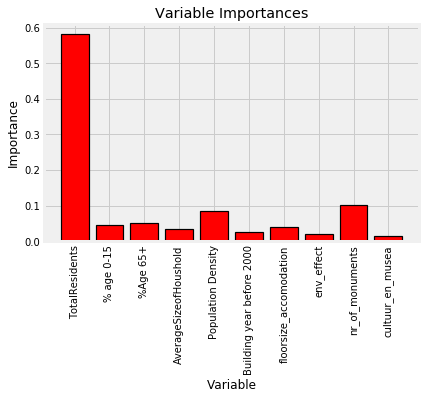

In [19]:
# list of x locations for plotting
x_values = list(range(len(importances)))

# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical', color = 'r', edgecolor = 'k', linewidth = 1.2)

# Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical')

# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

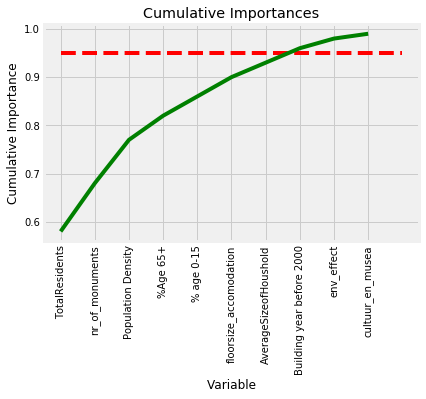

In [20]:
# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]

# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable'); plt.ylabel('Cumulative Importance'); plt.title('Cumulative Importances');

In [21]:
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 8


In [22]:
feature_list

['TotalResidents',
 '% age 0-15',
 '%Age 65+',
 'AverageSizeofHoushold',
 'Population Density',
 'Building year before 2000',
 'floorsize_accomodation',
 'env_effect',
 'nr_of_monuments',
 'cultuur_en_musea']

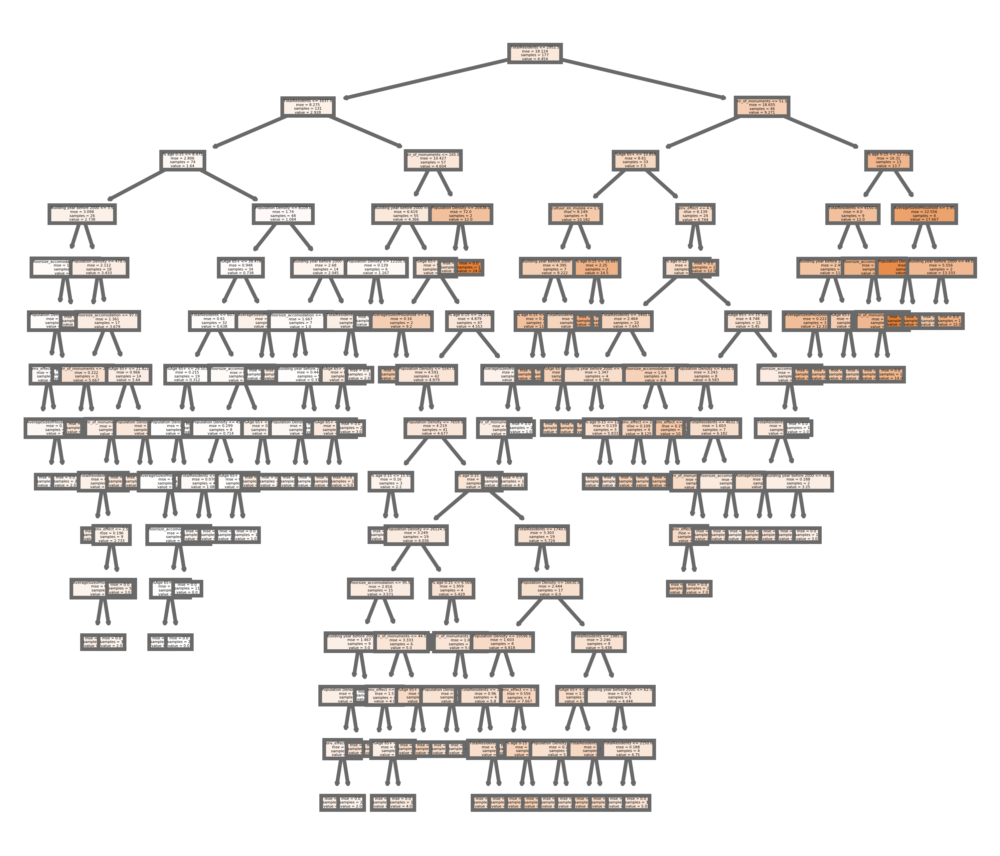

In [23]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(reg_rf.estimators_[0],
               feature_names = feature_list, 
               class_names = y_test,
               filled = True);

### 2.1.2 AdaBoost

In [24]:
start_time = time.time()

reg_ada = AdaBoostRegressor()
reg_ada.fit(X_train, y_train)

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Elapsed time:  0.0820009708404541


In [25]:
y_pred = reg_ada.predict(X_test)

In [26]:
# R2 score model with hold-out set 
print(metrics.r2_score(y_train, reg_ada.predict(X_train)))
print(metrics.r2_score(y_test, y_pred))

0.7464054846162973
0.42878350555269873


In [27]:
print('MSE:', metrics.mean_squared_error(y_train, reg_ada.predict(X_train)))

MSE: 5.378320382804508


In [28]:
# Prediction score between incidents from test set and predicted incidents: mean absolute errors and (root) mean squared errors
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE: 2.5032243055993377
MSE: 10.000193475713663
RMSE: 3.1623082512167695


In [29]:
# Get numerical feature importances
importances = list(reg_ada.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

Variable: TotalResidents       Importance: 0.46
Variable: nr_of_monuments      Importance: 0.2
Variable: AverageSizeofHoushold Importance: 0.09
Variable: Population Density   Importance: 0.08
Variable: floorsize_accomodation Importance: 0.05
Variable: env_effect           Importance: 0.04
Variable: % age 0-15           Importance: 0.03
Variable: cultuur_en_musea     Importance: 0.02
Variable: %Age 65+             Importance: 0.01
Variable: Building year before 2000 Importance: 0.01


[None, None, None, None, None, None, None, None, None, None]

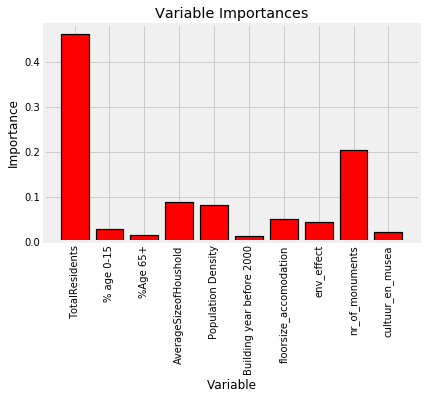

In [30]:
# list of x locations for plotting
x_values = list(range(len(importances)))

# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical', color = 'r', edgecolor = 'k', linewidth = 1.2)

# Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical')

# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

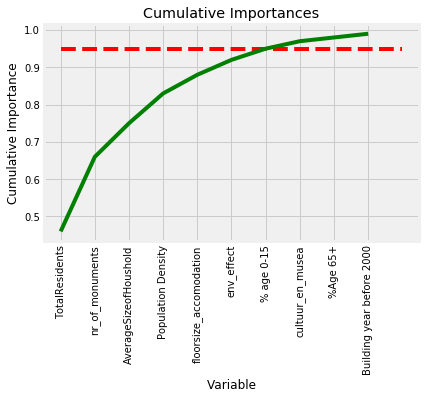

In [31]:
# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]

# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable'); plt.ylabel('Cumulative Importance'); plt.title('Cumulative Importances');

In [32]:
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 7


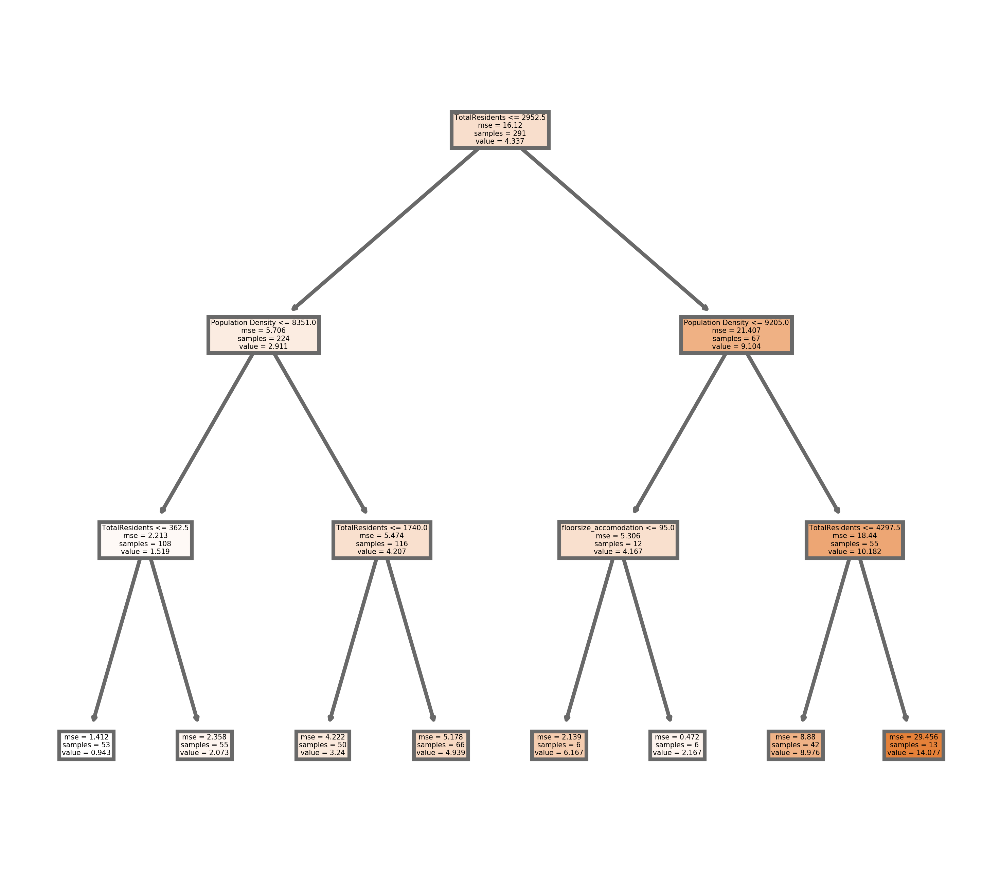

In [33]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(reg_ada.estimators_[0],
               feature_names = feature_list, 
               class_names = y_test,
               filled = True);

### 2.1.3 XGBoost

In [34]:
start_time = time.time()

reg_xgb = XGBRegressor()
reg_xgb.fit(X_train, y_train)

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Elapsed time:  0.22796034812927246


In [35]:
y_pred = reg_xgb.predict(X_test)

In [36]:
# R2 score model with hold-out set 
print(metrics.r2_score(y_train, reg_xgb.predict(X_train)))
print(metrics.r2_score(y_test, y_pred))

0.9999978515028485
0.4041698001737801


In [37]:
print('MSE:', metrics.mean_squared_error(y_train, reg_xgb.predict(X_train)))

MSE: 4.556607229861892e-05


In [38]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE: 2.2935267438174813
MSE: 10.431101578571516
RMSE: 3.2297215945916324


In [39]:
# Get numerical feature importances
importances = list(reg_xgb.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

Variable: TotalResidents       Importance: 0.30000001192092896
Variable: nr_of_monuments      Importance: 0.20000000298023224
Variable: Population Density   Importance: 0.10999999940395355
Variable: cultuur_en_musea     Importance: 0.10999999940395355
Variable: AverageSizeofHoushold Importance: 0.10000000149011612
Variable: %Age 65+             Importance: 0.03999999910593033
Variable: Building year before 2000 Importance: 0.03999999910593033
Variable: floorsize_accomodation Importance: 0.03999999910593033
Variable: env_effect           Importance: 0.03999999910593033
Variable: % age 0-15           Importance: 0.029999999329447746


[None, None, None, None, None, None, None, None, None, None]

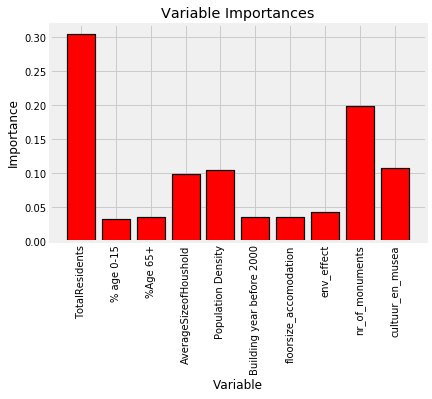

In [40]:
# list of x locations for plotting
x_values = list(range(len(importances)))

# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical', color = 'r', edgecolor = 'k', linewidth = 1.2)

# Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical')

# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

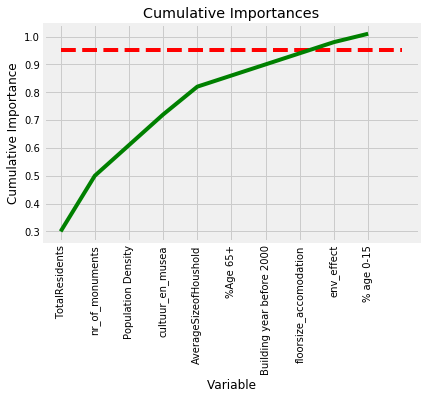

In [41]:
# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]

# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 0.95, xmin=0, xmax=len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable'); plt.ylabel('Cumulative Importance'); plt.title('Cumulative Importances');

In [42]:
print('Number of features for 95% importance:', np.where(cumulative_importances > 0.95)[0][0] + 1)

Number of features for 95% importance: 9


### 2.1.5 CatBoost

In [43]:
start_time = time.time()

reg_cat = CatBoostRegressor()
reg_cat.fit(X_train, y_train)

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Learning rate set to 0.033688
0:	learn: 4.5322014	total: 164ms	remaining: 2m 44s
1:	learn: 4.4661328	total: 166ms	remaining: 1m 22s
2:	learn: 4.4065926	total: 168ms	remaining: 55.7s
3:	learn: 4.3460905	total: 169ms	remaining: 42s
4:	learn: 4.2872668	total: 170ms	remaining: 33.9s
5:	learn: 4.2284734	total: 171ms	remaining: 28.4s
6:	learn: 4.1764672	total: 173ms	remaining: 24.5s
7:	learn: 4.1261409	total: 174ms	remaining: 21.6s
8:	learn: 4.0781209	total: 175ms	remaining: 19.3s
9:	learn: 4.0232658	total: 177ms	remaining: 17.5s
10:	learn: 3.9768794	total: 178ms	remaining: 16s
11:	learn: 3.9309325	total: 180ms	remaining: 14.8s
12:	learn: 3.8841049	total: 181ms	remaining: 13.8s
13:	learn: 3.8367865	total: 183ms	remaining: 12.9s
14:	learn: 3.7910954	total: 185ms	remaining: 12.1s
15:	learn: 3.7529568	total: 187ms	remaining: 11.5s
16:	learn: 3.7116755	total: 188ms	remaining: 10.9s
17:	learn: 3.6773989	total: 190ms	remaining: 10.4s
18:	learn: 3.6360529	total: 192ms	remaining: 9.9s
19:	learn: 3.5

160:	learn: 1.9147705	total: 341ms	remaining: 1.78s
161:	learn: 1.9079495	total: 342ms	remaining: 1.77s
162:	learn: 1.9010604	total: 343ms	remaining: 1.76s
163:	learn: 1.8964486	total: 344ms	remaining: 1.75s
164:	learn: 1.8908304	total: 345ms	remaining: 1.75s
165:	learn: 1.8884737	total: 346ms	remaining: 1.74s
166:	learn: 1.8840992	total: 347ms	remaining: 1.73s
167:	learn: 1.8805499	total: 349ms	remaining: 1.73s
168:	learn: 1.8746637	total: 350ms	remaining: 1.72s
169:	learn: 1.8713433	total: 351ms	remaining: 1.72s
170:	learn: 1.8684922	total: 353ms	remaining: 1.71s
171:	learn: 1.8603096	total: 354ms	remaining: 1.7s
172:	learn: 1.8579972	total: 355ms	remaining: 1.7s
173:	learn: 1.8506706	total: 356ms	remaining: 1.69s
174:	learn: 1.8475252	total: 357ms	remaining: 1.68s
175:	learn: 1.8431061	total: 358ms	remaining: 1.68s
176:	learn: 1.8388843	total: 359ms	remaining: 1.67s
177:	learn: 1.8346133	total: 360ms	remaining: 1.66s
178:	learn: 1.8281515	total: 363ms	remaining: 1.66s
179:	learn: 1.

418:	learn: 0.9993468	total: 620ms	remaining: 860ms
419:	learn: 0.9961501	total: 622ms	remaining: 858ms
420:	learn: 0.9952151	total: 623ms	remaining: 856ms
421:	learn: 0.9936721	total: 623ms	remaining: 854ms
422:	learn: 0.9915597	total: 624ms	remaining: 852ms
423:	learn: 0.9894603	total: 625ms	remaining: 849ms
424:	learn: 0.9891832	total: 626ms	remaining: 847ms
425:	learn: 0.9883647	total: 627ms	remaining: 845ms
426:	learn: 0.9860700	total: 628ms	remaining: 843ms
427:	learn: 0.9849492	total: 629ms	remaining: 841ms
428:	learn: 0.9828605	total: 630ms	remaining: 839ms
429:	learn: 0.9825735	total: 631ms	remaining: 837ms
430:	learn: 0.9822952	total: 632ms	remaining: 835ms
431:	learn: 0.9786071	total: 633ms	remaining: 833ms
432:	learn: 0.9777027	total: 635ms	remaining: 831ms
433:	learn: 0.9747802	total: 636ms	remaining: 829ms
434:	learn: 0.9724598	total: 637ms	remaining: 827ms
435:	learn: 0.9698077	total: 638ms	remaining: 825ms
436:	learn: 0.9675232	total: 639ms	remaining: 823ms
437:	learn: 

588:	learn: 0.7338300	total: 777ms	remaining: 542ms
589:	learn: 0.7318690	total: 778ms	remaining: 540ms
590:	learn: 0.7300611	total: 779ms	remaining: 539ms
591:	learn: 0.7277384	total: 780ms	remaining: 537ms
592:	learn: 0.7263595	total: 781ms	remaining: 536ms
593:	learn: 0.7250336	total: 782ms	remaining: 534ms
594:	learn: 0.7228996	total: 783ms	remaining: 533ms
595:	learn: 0.7220054	total: 784ms	remaining: 532ms
596:	learn: 0.7214718	total: 785ms	remaining: 530ms
597:	learn: 0.7200852	total: 786ms	remaining: 528ms
598:	learn: 0.7193434	total: 787ms	remaining: 527ms
599:	learn: 0.7184657	total: 789ms	remaining: 526ms
600:	learn: 0.7172952	total: 790ms	remaining: 524ms
601:	learn: 0.7154342	total: 791ms	remaining: 523ms
602:	learn: 0.7140745	total: 792ms	remaining: 521ms
603:	learn: 0.7134948	total: 793ms	remaining: 520ms
604:	learn: 0.7123917	total: 794ms	remaining: 518ms
605:	learn: 0.7108625	total: 795ms	remaining: 517ms
606:	learn: 0.7101602	total: 797ms	remaining: 516ms
607:	learn: 

843:	learn: 0.4910557	total: 1.08s	remaining: 199ms
844:	learn: 0.4908168	total: 1.08s	remaining: 198ms
845:	learn: 0.4902073	total: 1.08s	remaining: 197ms
846:	learn: 0.4891986	total: 1.08s	remaining: 196ms
847:	learn: 0.4881347	total: 1.08s	remaining: 194ms
848:	learn: 0.4869755	total: 1.08s	remaining: 193ms
849:	learn: 0.4855904	total: 1.09s	remaining: 192ms
850:	learn: 0.4840995	total: 1.09s	remaining: 191ms
851:	learn: 0.4839032	total: 1.09s	remaining: 189ms
852:	learn: 0.4827118	total: 1.09s	remaining: 188ms
853:	learn: 0.4824697	total: 1.09s	remaining: 187ms
854:	learn: 0.4813683	total: 1.09s	remaining: 186ms
855:	learn: 0.4808275	total: 1.1s	remaining: 185ms
856:	learn: 0.4794757	total: 1.1s	remaining: 183ms
857:	learn: 0.4782025	total: 1.1s	remaining: 182ms
858:	learn: 0.4774135	total: 1.1s	remaining: 181ms
859:	learn: 0.4765967	total: 1.1s	remaining: 180ms
860:	learn: 0.4761171	total: 1.1s	remaining: 178ms
861:	learn: 0.4758321	total: 1.11s	remaining: 177ms
862:	learn: 0.4747

Elapsed time:  1.528245210647583


In [44]:
y_pred = reg_cat.predict(X_test)

In [45]:
# R2 score model with hold-out set 
print(metrics.r2_score(y_train, reg_cat.predict(X_train)))
print(metrics.r2_score(y_test, y_pred))

0.9927989392923896
0.455692657436951


In [46]:
print('MSE:', metrics.mean_squared_error(y_train, reg_cat.predict(X_train)))

MSE: 0.15272259150776069


In [47]:
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))
print('MSE:', metrics.mean_squared_error(y_test, y_pred))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE: 2.2501955373334135
MSE: 9.529099367392684
RMSE: 3.0869239328808677


In [48]:
# Get numerical feature importances
importances = list(reg_cat.feature_importances_)

# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]

# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances]

Variable: TotalResidents       Importance: 36.6
Variable: Population Density   Importance: 11.95
Variable: %Age 65+             Importance: 8.49
Variable: nr_of_monuments      Importance: 8.47
Variable: % age 0-15           Importance: 7.46
Variable: AverageSizeofHoushold Importance: 7.28
Variable: floorsize_accomodation Importance: 6.82
Variable: env_effect           Importance: 5.52
Variable: Building year before 2000 Importance: 4.65
Variable: cultuur_en_musea     Importance: 2.76


[None, None, None, None, None, None, None, None, None, None]

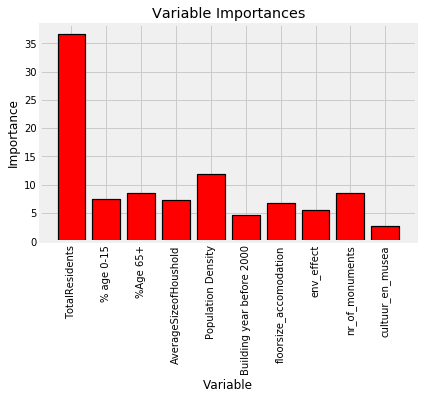

In [49]:
# list of x locations for plotting
x_values = list(range(len(importances)))

# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical', color = 'r', edgecolor = 'k', linewidth = 1.2)

# Tick labels for x axis
plt.xticks(x_values, feature_list, rotation='vertical')

# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Variable Importances');

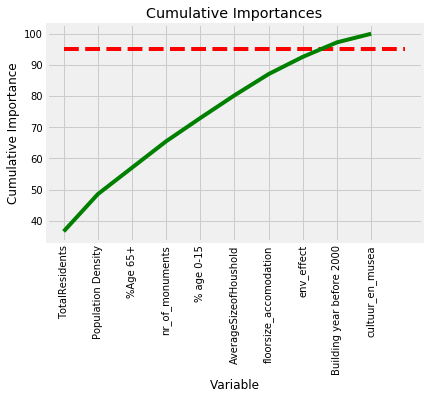

In [50]:
# List of features sorted from most to least important
sorted_importances = [importance[1] for importance in feature_importances]
sorted_features = [importance[0] for importance in feature_importances]

# Cumulative importances
cumulative_importances = np.cumsum(sorted_importances)

# Make a line graph
plt.plot(x_values, cumulative_importances, 'g-')

# Draw line at 95% of importance retained
plt.hlines(y = 95, xmin = 0, xmax = len(sorted_importances), color = 'r', linestyles = 'dashed')

# Format x ticks and labels
plt.xticks(x_values, sorted_features, rotation = 'vertical')

# Axis labels and title
plt.xlabel('Variable'); plt.ylabel('Cumulative Importance'); plt.title('Cumulative Importances');

In [51]:
print('Number of features for 95% importance:', np.where(cumulative_importances > 95)[0][0] + 1)

Number of features for 95% importance: 9


### 2.2 Using Cross-validation
### 2.2.1 Random forest

In [52]:
start_time = time.time()

fold = KFold(n_splits = 5, shuffle = True, random_state = 100)

hyper_params = [{'n_features_to_select': list(range(1, 14))}]

rf_cv = RFE(reg_rf)             

reg_rf_cv = GridSearchCV(estimator = rf_cv, 
                         param_grid = hyper_params, 
                         scoring= 'r2', 
                         cv = fold, 
                         verbose = 1,
                         return_train_score = True)      

reg_rf_cv.fit(X_train, y_train)   

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Elapsed time:  41.07230830192566


[Parallel(n_jobs=1)]: Done  65 out of  65 | elapsed:   40.8s finished


In [53]:
cv_result = pd.DataFrame(reg_rf_cv.cv_results_)
cv_result

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,1.264097,0.038170,0.005881,0.000452,1,{'n_features_to_select': 1},0.471807,0.142496,0.152893,0.249567,0.232701,0.249893,0.118731,13,0.836421,0.845310,0.859063,0.858390,0.884250,0.856687,0.016177
1,1.093338,0.012533,0.005395,0.000490,2,{'n_features_to_select': 2},0.261924,0.537964,0.417387,0.256895,0.348909,0.364616,0.105100,12,0.927818,0.913808,0.918033,0.926017,0.924069,0.921949,0.005236
2,1.099779,0.110825,0.005615,0.000815,3,{'n_features_to_select': 3},0.275997,0.592239,0.553122,0.436519,0.348254,0.441226,0.119409,11,0.936768,0.916814,0.922143,0.928291,0.933024,0.927408,0.007209
3,1.019301,0.069390,0.005770,0.000753,4,{'n_features_to_select': 4},0.373597,0.603663,0.566414,0.544947,0.353784,0.488481,0.103798,9,0.941563,0.920317,0.922965,0.915666,0.931240,0.926350,0.009136
4,0.911859,0.103554,0.005786,0.000737,5,{'n_features_to_select': 5},0.424458,0.553596,0.581263,0.525583,0.344449,0.485870,0.088358,10,0.933408,0.926575,0.927813,0.916999,0.942088,0.929377,0.008262
5,0.693609,0.050280,0.005213,0.000418,6,{'n_features_to_select': 6},0.421911,0.574096,0.575570,0.558891,0.345206,0.495135,0.094456,8,0.940474,0.929795,0.926972,0.922164,0.940698,0.932021,0.007408
6,0.621868,0.080563,0.006748,0.001826,7,{'n_features_to_select': 7},0.423786,0.584774,0.587611,0.604579,0.347406,0.509631,0.104335,7,0.933938,0.931480,0.919980,0.931123,0.941058,0.931516,0.006785
7,0.456441,0.082980,0.005824,0.000358,8,{'n_features_to_select': 8},0.462814,0.592055,0.564950,0.597604,0.375988,0.518682,0.086297,5,0.936864,0.927114,0.931501,0.932592,0.943911,0.934396,0.005680
8,0.281728,0.020881,0.005687,0.000955,9,{'n_features_to_select': 9},0.477390,0.614932,0.555103,0.618042,0.405065,0.534106,0.082325,2,0.938856,0.926405,0.929840,0.924721,0.941806,0.932326,0.006806
9,0.154388,0.022365,0.005672,0.000758,10,{'n_features_to_select': 10},0.460070,0.611832,0.518336,0.607490,0.399123,0.519370,0.082814,4,0.929923,0.934615,0.931417,0.926812,0.943116,0.933177,0.005569


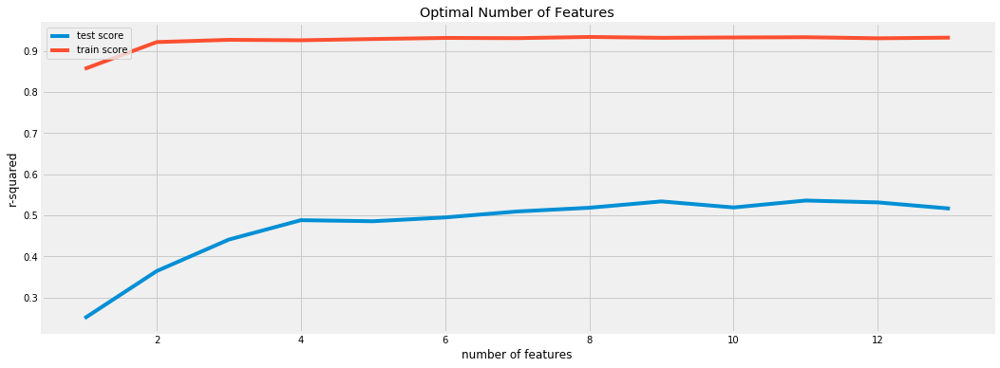

In [54]:
plt.figure(figsize=(16,6))

plt.plot(cv_result["param_n_features_to_select"], cv_result["mean_test_score"])
plt.plot(cv_result["param_n_features_to_select"], cv_result["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

Deriving from the plot, 8 features seem like the optimal value of number of feutures to build the final random forest model. Even though the model is performing pretty bad on the test set in comparison to the train set. 

In [55]:
# Final model - Random Forest

start_time = time.time()

n_optimal = 10

rfe = RFE(reg_rf, n_features_to_select = n_optimal)             
reg_rf_optima = rfe.fit(X_train, y_train)

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Elapsed time:  0.1507129669189453


In [56]:
# R2 score model with hold-out set 
print(metrics.r2_score(y_train, reg_rf.predict(X_train)))
print(metrics.r2_score(y_test, reg_rf.predict(X_test)))

0.9304516183132658
0.47505004611541357


In [57]:
# R2 score model with optimal RF model 
print(metrics.r2_score(y_train, reg_rf_optima.predict(X_train)))
print(metrics.r2_score(y_test, reg_rf_optima.predict(X_test)))

0.930804248072323
0.501676078382299


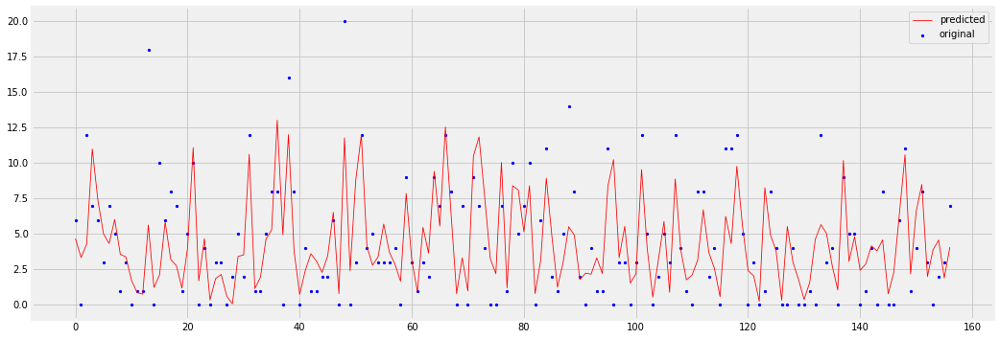

In [58]:
# Plotting performance of the optimal model (few outliers can be identified)

plt.figure(figsize=(16,6))

x_ax = range(len(y_test))
plt.scatter(x_ax, y_test, s = 5, color = "blue", label = "original")
plt.plot(x_ax, reg_rf_optima.predict(X_test), lw = 0.8, color = "red", label = "predicted")
plt.legend()
plt.show()

### 2.2.2 AdaBoost

In [59]:
start_time = time.time()

fold = KFold(n_splits = 5, shuffle = True, random_state = 100) 

hyper_params = [{'n_features_to_select': list(range(1, 14))}]

ada_cv = RFE(reg_ada)             

reg_ada_cv = GridSearchCV(estimator = ada_cv, 
                          param_grid = hyper_params,
                          scoring= 'r2',
                          cv = fold,
                          verbose = 1,
                          return_train_score = True)      

reg_ada_cv.fit(X_train, y_train)   

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Elapsed time:  15.035153150558472


[Parallel(n_jobs=1)]: Done  65 out of  65 | elapsed:   14.9s finished


In [60]:
cv_result = pd.DataFrame(reg_ada_cv.cv_results_)
cv_result

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.434415,0.050502,0.002200,0.000406,1,{'n_features_to_select': 1},0.506027,0.421445,0.379816,0.480438,0.360158,0.429577,0.056201,6,0.550330,0.577249,0.636601,0.595182,0.650388,0.601950,0.037061
1,0.420202,0.032399,0.003613,0.000481,2,{'n_features_to_select': 2},0.521097,0.267077,0.449115,0.284222,0.331316,0.370566,0.098524,12,0.684727,0.691055,0.712665,0.732694,0.714669,0.707162,0.017328
2,0.372491,0.048947,0.002765,0.000698,3,{'n_features_to_select': 3},0.375915,0.164982,0.492652,0.205562,0.309013,0.309625,0.118021,13,0.747009,0.729194,0.721491,0.741383,0.726887,0.733193,0.009494
3,0.385625,0.030610,0.003201,0.000400,4,{'n_features_to_select': 4},0.292920,0.248697,0.556103,0.497027,0.307797,0.380509,0.122264,11,0.754694,0.749559,0.736264,0.736419,0.761025,0.747592,0.009878
4,0.327623,0.017046,0.004074,0.000626,5,{'n_features_to_select': 5},0.469549,0.274264,0.396049,0.489764,0.375707,0.401067,0.076556,10,0.773248,0.755660,0.740731,0.751744,0.778796,0.760036,0.014051
5,0.259820,0.015053,0.004008,0.000018,6,{'n_features_to_select': 6},0.444370,0.292113,0.425210,0.570667,0.386387,0.423749,0.090262,8,0.756753,0.757267,0.751389,0.756467,0.785178,0.761411,0.012072
6,0.213765,0.005222,0.003235,0.000387,7,{'n_features_to_select': 7},0.463540,0.234147,0.445514,0.578346,0.347505,0.413810,0.115953,9,0.770580,0.777742,0.745117,0.745222,0.762699,0.760272,0.013217
7,0.163591,0.001266,0.003435,0.000478,8,{'n_features_to_select': 8},0.467407,0.298573,0.487015,0.632795,0.342502,0.445659,0.117880,3,0.789907,0.769221,0.764384,0.776909,0.790515,0.778187,0.010601
8,0.106124,0.006804,0.003394,0.000493,9,{'n_features_to_select': 9},0.526638,0.248554,0.475723,0.633927,0.360895,0.449147,0.133327,2,0.785683,0.779614,0.770270,0.766315,0.782498,0.776876,0.007374
9,0.050066,0.009648,0.003401,0.000489,10,{'n_features_to_select': 10},0.504269,0.291802,0.445210,0.652161,0.332825,0.445253,0.128438,4,0.788511,0.782711,0.758710,0.768396,0.774578,0.774581,0.010491


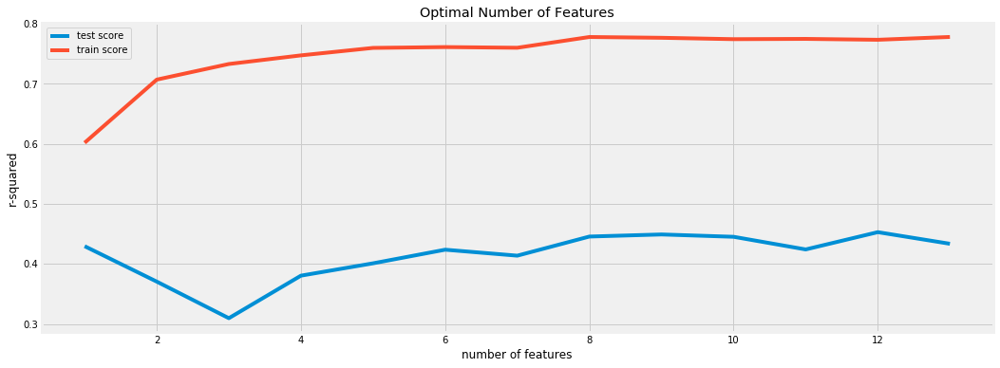

In [61]:
plt.figure(figsize=(16,6))

plt.plot(cv_result["param_n_features_to_select"], cv_result["mean_test_score"])
plt.plot(cv_result["param_n_features_to_select"], cv_result["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

Same as Random Forest, AdaBoost need to have 10 features, but after that, it degrades in performance afterwards. 

In [62]:
# Final model - AdaBoost

start_time = time.time()

n_optimal = 10

rfe = RFE(reg_ada, n_features_to_select = n_optimal)             
reg_ada_optima = rfe.fit(X_train, y_train)

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Elapsed time:  0.06639313697814941


In [63]:
# R2 score model with hold-out set 
print(metrics.r2_score(y_train, reg_ada.predict(X_train)))
print(metrics.r2_score(y_test, reg_ada.predict(X_test)))

0.7464054846162973
0.42878350555269873


In [64]:
# R2 score model with optimal Ada model 
print(metrics.r2_score(y_train, reg_ada_optima.predict(X_train)))
print(metrics.r2_score(y_test, reg_ada_optima.predict(X_test)))

0.7557887084969471
0.4515665268825624


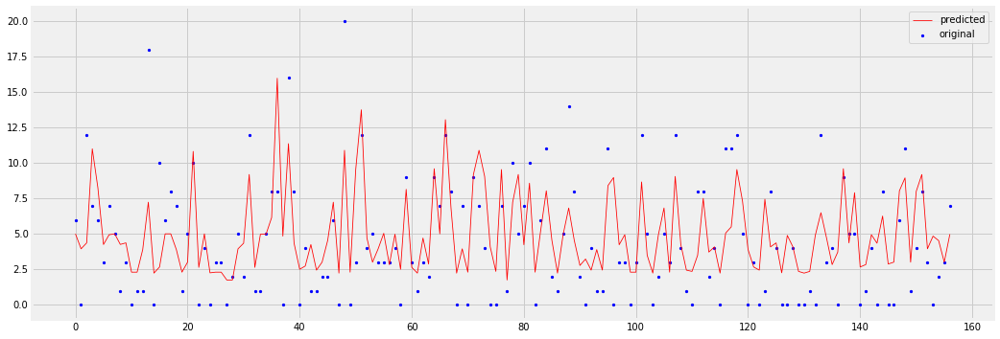

In [65]:
# The AdaBoost model seem to underfit the data

plt.figure(figsize=(16,6))

x_ax = range(len(y_test))
plt.scatter(x_ax, y_test, s = 5, color = "blue", label = "original")
plt.plot(x_ax, reg_ada_optima.predict(X_test), lw = 0.8, color = "red", label = "predicted")
plt.legend()
plt.show()

### 2.2.3 XGBoost

In [67]:
start_time = time.time()

fold = KFold(n_splits = 5, shuffle = True, random_state = 100) 

hyper_params = [{'n_features_to_select': list(range(1, 14))}]

xgb_cv = RFE(reg_xgb)             

reg_xgb_cv = GridSearchCV(estimator = xgb_cv, 
                          param_grid = hyper_params,
                          scoring = 'r2',
                          cv = fold,
                          verbose = 1,
                          return_train_score = True)      

reg_xgb_cv.fit(X_train, y_train)   

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Fitting 5 folds for each of 13 candidates, totalling 65 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  65 out of  65 | elapsed:   22.6s finished


Elapsed time:  23.062047004699707


In [68]:
cv_result = pd.DataFrame(reg_xgb_cv.cv_results_)
cv_result

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_features_to_select,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.691488,0.009597,0.002599,0.000489,1,{'n_features_to_select': 1},0.371764,0.000562,-0.025890,0.172007,0.147012,0.133091,0.142487,13,0.922254,0.918276,0.923370,0.921696,0.950228,0.927165,1.165646e-02
1,0.647430,0.009310,0.002400,0.000800,2,{'n_features_to_select': 2},0.490556,0.230691,0.090625,-0.083620,0.274812,0.200613,0.191501,12,0.995039,0.989592,0.971436,0.994164,0.999396,0.989925,9.754808e-03
2,0.593821,0.013690,0.002801,0.000400,3,{'n_features_to_select': 3},0.418022,0.337364,0.330554,-0.149219,0.334798,0.254304,0.204366,10,0.996100,0.991190,0.991388,0.996059,0.999461,0.994840,3.151776e-03
3,0.527638,0.006908,0.002599,0.000490,4,{'n_features_to_select': 4},0.076710,0.200050,0.356314,0.192092,0.411805,0.247394,0.121101,11,0.999912,0.999364,0.998265,0.999546,0.999758,0.999369,5.827026e-04
4,0.450600,0.012323,0.002400,0.000490,5,{'n_features_to_select': 5},0.007426,0.321238,0.339831,0.249349,0.363610,0.256291,0.130151,9,0.999972,0.999968,0.999898,0.999903,0.999973,0.999943,3.446178e-05
5,0.506985,0.029975,0.003601,0.000490,6,{'n_features_to_select': 6},0.012126,0.337118,0.471425,0.392647,0.366000,0.315863,0.158314,8,0.999984,0.999994,0.999977,0.999978,0.999995,0.999986,7.932620e-06
6,0.421449,0.027138,0.003402,0.000489,7,{'n_features_to_select': 7},0.116704,0.378492,0.380510,0.451393,0.450132,0.355446,0.123554,2,0.999995,0.999998,0.999990,0.999993,0.999997,0.999995,2.709699e-06
7,0.277925,0.006242,0.003400,0.000490,8,{'n_features_to_select': 8},0.375386,0.206986,0.408542,0.454950,0.396997,0.368572,0.084880,1,0.999999,0.999999,0.999999,0.999999,0.999999,0.999999,2.467583e-07
8,0.162502,0.000635,0.003400,0.000490,9,{'n_features_to_select': 9},0.069318,0.269352,0.426657,0.474942,0.350773,0.318209,0.142633,7,0.999999,1.000000,0.999999,0.999997,1.000000,0.999999,8.459130e-07
9,0.041999,0.000894,0.003401,0.000490,10,{'n_features_to_select': 10},0.170030,0.317208,0.383999,0.448841,0.424147,0.348845,0.099881,3,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.164152e-07


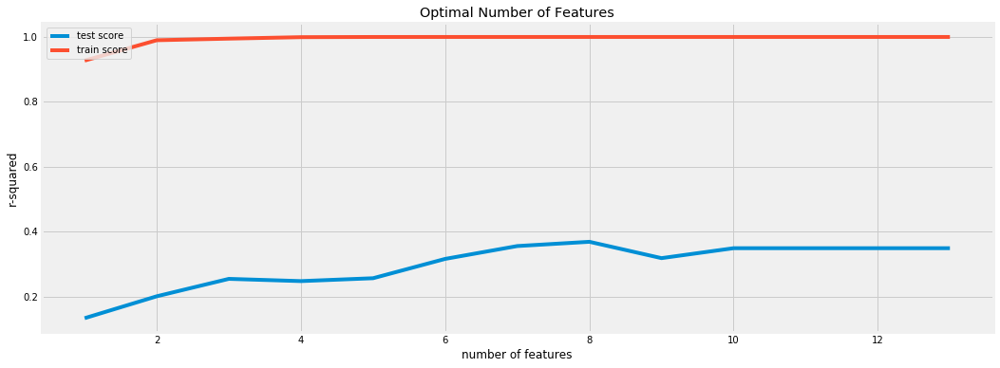

In [69]:
plt.figure(figsize = (16,6))

plt.plot(cv_result["param_n_features_to_select"], cv_result["mean_test_score"])
plt.plot(cv_result["param_n_features_to_select"], cv_result["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc='upper left')

In [70]:
# Final model - XGBoost
start_time = time.time()

n_optimal = 10

rfe = RFE(reg_xgb, n_features_to_select = n_optimal)             
reg_xgb_optima = rfe.fit(X_train, y_train)

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Elapsed time:  0.05399012565612793


In [71]:
# R2 score model with hold-out set 
print(metrics.r2_score(y_train, reg_xgb.predict(X_train)))
print(metrics.r2_score(y_test, reg_xgb.predict(X_test)))

0.9999978515028485
0.4041698001737801


In [72]:
# R2 score model with optimal Ada model 
print(metrics.r2_score(y_train, reg_xgb_optima.predict(X_train)))
print(metrics.r2_score(y_test, reg_xgb_optima.predict(X_test)))

0.9999978515028485
0.4041698001737801


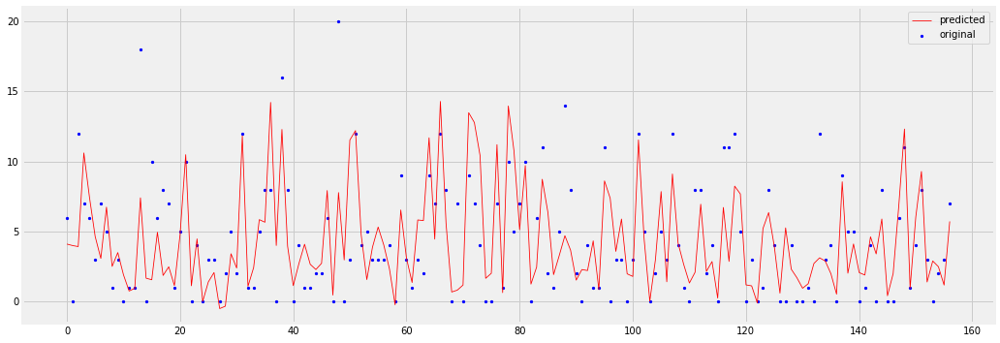

In [73]:
plt.figure(figsize = (16,6))

x_ax = range(len(y_test))
plt.scatter(x_ax, y_test, s = 5, color = "blue", label = "original")
plt.plot(x_ax, reg_xgb_optima.predict(X_test), lw = 0.8, color = "red", label = "predicted")
plt.legend()
plt.show()

### 2.2.5 CatBoost

In [ ]:
start_time = time.time()

fold = KFold(n_splits = 5, shuffle = True, random_state = 100) 

hyper_params = [{'n_features_to_select': list(range(1, 14))}]

cat_cv = RFE(reg_cat)             

reg_cat_cv = GridSearchCV(estimator = cat_cv, 
                          param_grid = hyper_params,
                          scoring = 'r2',
                          cv = fold,
                          verbose = 1,
                          return_train_score = True)      

reg_cat_cv.fit(X_train, y_train)   

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

Fitting 5 folds for each of 13 candidates, totalling 65 fits
Learning rate set to 0.032503
0:	learn: 4.5404018	total: 3.27ms	remaining: 3.27s
1:	learn: 4.4740841	total: 4.6ms	remaining: 2.29s
2:	learn: 4.4188798	total: 5.51ms	remaining: 1.83s
3:	learn: 4.3704102	total: 6.79ms	remaining: 1.69s
4:	learn: 4.3048140	total: 7.88ms	remaining: 1.57s
5:	learn: 4.2522861	total: 9.09ms	remaining: 1.5s
6:	learn: 4.1970398	total: 10.3ms	remaining: 1.46s
7:	learn: 4.1410066	total: 11.7ms	remaining: 1.45s
8:	learn: 4.0886311	total: 13.1ms	remaining: 1.44s
9:	learn: 4.0371322	total: 14.4ms	remaining: 1.42s
10:	learn: 3.9963641	total: 15.6ms	remaining: 1.4s
11:	learn: 3.9523879	total: 17.2ms	remaining: 1.42s
12:	learn: 3.9059892	total: 18.7ms	remaining: 1.42s
13:	learn: 3.8664125	total: 20.2ms	remaining: 1.42s
14:	learn: 3.8277309	total: 21.7ms	remaining: 1.43s
15:	learn: 3.7880437	total: 23.5ms	remaining: 1.45s
16:	learn: 3.7499348	total: 24.8ms	remaining: 1.43s
17:	learn: 3.7156389	total: 26.1ms	rem

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


114:	learn: 2.1317488	total: 144ms	remaining: 1.1s
115:	learn: 2.1252193	total: 145ms	remaining: 1.1s
116:	learn: 2.1153830	total: 147ms	remaining: 1.1s
117:	learn: 2.1053003	total: 148ms	remaining: 1.1s
118:	learn: 2.0953476	total: 149ms	remaining: 1.1s
119:	learn: 2.0884992	total: 150ms	remaining: 1.1s
120:	learn: 2.0809323	total: 152ms	remaining: 1.1s
121:	learn: 2.0713548	total: 153ms	remaining: 1.1s
122:	learn: 2.0657261	total: 154ms	remaining: 1.1s
123:	learn: 2.0597961	total: 156ms	remaining: 1.1s
124:	learn: 2.0495960	total: 157ms	remaining: 1.1s
125:	learn: 2.0416200	total: 159ms	remaining: 1.1s
126:	learn: 2.0349767	total: 160ms	remaining: 1.1s
127:	learn: 2.0265931	total: 161ms	remaining: 1.1s
128:	learn: 2.0213188	total: 162ms	remaining: 1.1s
129:	learn: 2.0153067	total: 164ms	remaining: 1.1s
130:	learn: 2.0098418	total: 165ms	remaining: 1.1s
131:	learn: 2.0053766	total: 167ms	remaining: 1.09s
132:	learn: 1.9959176	total: 168ms	remaining: 1.09s
133:	learn: 1.9918114	total: 

345:	learn: 1.0362051	total: 450ms	remaining: 850ms
346:	learn: 1.0356535	total: 452ms	remaining: 850ms
347:	learn: 1.0341616	total: 453ms	remaining: 849ms
348:	learn: 1.0337283	total: 454ms	remaining: 848ms
349:	learn: 1.0298157	total: 456ms	remaining: 847ms
350:	learn: 1.0258749	total: 457ms	remaining: 846ms
351:	learn: 1.0217061	total: 459ms	remaining: 845ms
352:	learn: 1.0203720	total: 460ms	remaining: 843ms
353:	learn: 1.0179926	total: 461ms	remaining: 842ms
354:	learn: 1.0163167	total: 463ms	remaining: 841ms
355:	learn: 1.0132667	total: 464ms	remaining: 839ms
356:	learn: 1.0100062	total: 465ms	remaining: 838ms
357:	learn: 1.0065182	total: 466ms	remaining: 836ms
358:	learn: 1.0032861	total: 467ms	remaining: 835ms
359:	learn: 0.9984442	total: 469ms	remaining: 833ms
360:	learn: 0.9951153	total: 470ms	remaining: 832ms
361:	learn: 0.9924947	total: 472ms	remaining: 831ms
362:	learn: 0.9887141	total: 473ms	remaining: 830ms
363:	learn: 0.9872442	total: 475ms	remaining: 830ms
364:	learn: 

574:	learn: 0.6176807	total: 761ms	remaining: 562ms
575:	learn: 0.6162681	total: 762ms	remaining: 561ms
576:	learn: 0.6146884	total: 764ms	remaining: 560ms
577:	learn: 0.6131060	total: 766ms	remaining: 559ms
578:	learn: 0.6109898	total: 768ms	remaining: 558ms
579:	learn: 0.6100688	total: 769ms	remaining: 557ms
580:	learn: 0.6093115	total: 771ms	remaining: 556ms
581:	learn: 0.6069354	total: 772ms	remaining: 555ms
582:	learn: 0.6059373	total: 773ms	remaining: 553ms
583:	learn: 0.6053252	total: 775ms	remaining: 552ms
584:	learn: 0.6037328	total: 776ms	remaining: 551ms
585:	learn: 0.6026234	total: 778ms	remaining: 549ms
586:	learn: 0.5999168	total: 779ms	remaining: 548ms
587:	learn: 0.5985163	total: 781ms	remaining: 547ms
588:	learn: 0.5972524	total: 782ms	remaining: 546ms
589:	learn: 0.5942398	total: 784ms	remaining: 545ms
590:	learn: 0.5933954	total: 786ms	remaining: 544ms
591:	learn: 0.5923497	total: 787ms	remaining: 542ms
592:	learn: 0.5898251	total: 789ms	remaining: 541ms
593:	learn: 

804:	learn: 0.3962703	total: 1.07s	remaining: 259ms
805:	learn: 0.3961400	total: 1.07s	remaining: 257ms
806:	learn: 0.3956963	total: 1.07s	remaining: 256ms
807:	learn: 0.3954235	total: 1.07s	remaining: 255ms
808:	learn: 0.3943773	total: 1.07s	remaining: 253ms
809:	learn: 0.3931378	total: 1.07s	remaining: 252ms
810:	learn: 0.3925486	total: 1.07s	remaining: 251ms
811:	learn: 0.3913887	total: 1.08s	remaining: 249ms
812:	learn: 0.3909196	total: 1.08s	remaining: 248ms
813:	learn: 0.3907176	total: 1.08s	remaining: 247ms
814:	learn: 0.3892331	total: 1.08s	remaining: 245ms
815:	learn: 0.3881734	total: 1.08s	remaining: 244ms
816:	learn: 0.3880936	total: 1.08s	remaining: 243ms
817:	learn: 0.3874316	total: 1.08s	remaining: 242ms
818:	learn: 0.3871393	total: 1.09s	remaining: 240ms
819:	learn: 0.3857776	total: 1.09s	remaining: 239ms
820:	learn: 0.3850880	total: 1.09s	remaining: 238ms
821:	learn: 0.3847573	total: 1.09s	remaining: 236ms
822:	learn: 0.3842371	total: 1.09s	remaining: 235ms
823:	learn: 

21:	learn: 3.5480327	total: 41.1ms	remaining: 1.83s
22:	learn: 3.5182724	total: 42.5ms	remaining: 1.81s
23:	learn: 3.4876334	total: 43.9ms	remaining: 1.79s
24:	learn: 3.4556054	total: 45ms	remaining: 1.76s
25:	learn: 3.4223091	total: 46.2ms	remaining: 1.73s
26:	learn: 3.3986385	total: 47.4ms	remaining: 1.71s
27:	learn: 3.3681185	total: 48.6ms	remaining: 1.69s
28:	learn: 3.3367571	total: 49.8ms	remaining: 1.67s
29:	learn: 3.3107464	total: 50.3ms	remaining: 1.63s
30:	learn: 3.2804216	total: 51.6ms	remaining: 1.61s
31:	learn: 3.2579484	total: 52.8ms	remaining: 1.6s
32:	learn: 3.2315698	total: 53.9ms	remaining: 1.58s
33:	learn: 3.2062363	total: 55ms	remaining: 1.56s
34:	learn: 3.1824887	total: 56.9ms	remaining: 1.57s
35:	learn: 3.1568908	total: 58.2ms	remaining: 1.56s
36:	learn: 3.1348819	total: 59.3ms	remaining: 1.54s
37:	learn: 3.1118473	total: 60.3ms	remaining: 1.53s
38:	learn: 3.0896197	total: 61.6ms	remaining: 1.52s
39:	learn: 3.0714121	total: 63ms	remaining: 1.51s
40:	learn: 3.052908

296:	learn: 1.2120276	total: 351ms	remaining: 831ms
297:	learn: 1.2099331	total: 352ms	remaining: 830ms
298:	learn: 1.2053099	total: 354ms	remaining: 829ms
299:	learn: 1.2019881	total: 355ms	remaining: 828ms
300:	learn: 1.1989408	total: 356ms	remaining: 827ms
301:	learn: 1.1943889	total: 357ms	remaining: 826ms
302:	learn: 1.1928053	total: 358ms	remaining: 825ms
303:	learn: 1.1887123	total: 360ms	remaining: 823ms
304:	learn: 1.1837005	total: 361ms	remaining: 822ms
305:	learn: 1.1788932	total: 362ms	remaining: 820ms
306:	learn: 1.1756659	total: 363ms	remaining: 819ms
307:	learn: 1.1736655	total: 364ms	remaining: 818ms
308:	learn: 1.1706295	total: 365ms	remaining: 816ms
309:	learn: 1.1677825	total: 366ms	remaining: 815ms
310:	learn: 1.1624879	total: 367ms	remaining: 814ms
311:	learn: 1.1595790	total: 368ms	remaining: 813ms
312:	learn: 1.1564434	total: 370ms	remaining: 813ms
313:	learn: 1.1522345	total: 372ms	remaining: 812ms
314:	learn: 1.1469790	total: 373ms	remaining: 811ms
315:	learn: 

565:	learn: 0.6400575	total: 659ms	remaining: 505ms
566:	learn: 0.6398364	total: 661ms	remaining: 504ms
567:	learn: 0.6382300	total: 662ms	remaining: 503ms
568:	learn: 0.6366139	total: 663ms	remaining: 502ms
569:	learn: 0.6357784	total: 664ms	remaining: 501ms
570:	learn: 0.6354236	total: 665ms	remaining: 500ms
571:	learn: 0.6340548	total: 667ms	remaining: 499ms
572:	learn: 0.6335319	total: 668ms	remaining: 498ms
573:	learn: 0.6317859	total: 669ms	remaining: 496ms
574:	learn: 0.6304492	total: 670ms	remaining: 495ms
575:	learn: 0.6284845	total: 671ms	remaining: 494ms
576:	learn: 0.6262100	total: 672ms	remaining: 493ms
577:	learn: 0.6251682	total: 674ms	remaining: 492ms
578:	learn: 0.6237747	total: 675ms	remaining: 491ms
579:	learn: 0.6234130	total: 676ms	remaining: 490ms
580:	learn: 0.6217933	total: 678ms	remaining: 489ms
581:	learn: 0.6203973	total: 679ms	remaining: 488ms
582:	learn: 0.6184285	total: 680ms	remaining: 487ms
583:	learn: 0.6181932	total: 682ms	remaining: 485ms
584:	learn: 

823:	learn: 0.3744035	total: 965ms	remaining: 206ms
824:	learn: 0.3737232	total: 967ms	remaining: 205ms
825:	learn: 0.3726922	total: 969ms	remaining: 204ms
826:	learn: 0.3719755	total: 970ms	remaining: 203ms
827:	learn: 0.3714069	total: 971ms	remaining: 202ms
828:	learn: 0.3706870	total: 973ms	remaining: 201ms
829:	learn: 0.3701923	total: 974ms	remaining: 199ms
830:	learn: 0.3693444	total: 975ms	remaining: 198ms
831:	learn: 0.3688652	total: 976ms	remaining: 197ms
832:	learn: 0.3685957	total: 977ms	remaining: 196ms
833:	learn: 0.3678350	total: 978ms	remaining: 195ms
834:	learn: 0.3673098	total: 980ms	remaining: 194ms
835:	learn: 0.3671247	total: 981ms	remaining: 192ms
836:	learn: 0.3666637	total: 982ms	remaining: 191ms
837:	learn: 0.3657388	total: 984ms	remaining: 190ms
838:	learn: 0.3652854	total: 985ms	remaining: 189ms
839:	learn: 0.3647316	total: 987ms	remaining: 188ms
840:	learn: 0.3631654	total: 989ms	remaining: 187ms
841:	learn: 0.3621669	total: 990ms	remaining: 186ms
842:	learn: 

17:	learn: 3.6847725	total: 26.3ms	remaining: 1.43s
18:	learn: 3.6487116	total: 27.8ms	remaining: 1.43s
19:	learn: 3.6110836	total: 30ms	remaining: 1.47s
20:	learn: 3.5783085	total: 31.3ms	remaining: 1.46s
21:	learn: 3.5424920	total: 32.6ms	remaining: 1.45s
22:	learn: 3.5095246	total: 33.9ms	remaining: 1.44s
23:	learn: 3.4787658	total: 35ms	remaining: 1.42s
24:	learn: 3.4536709	total: 36.1ms	remaining: 1.41s
25:	learn: 3.4260565	total: 37.2ms	remaining: 1.39s
26:	learn: 3.3942208	total: 38.3ms	remaining: 1.38s
27:	learn: 3.3617621	total: 39.4ms	remaining: 1.37s
28:	learn: 3.3335906	total: 40.8ms	remaining: 1.36s
29:	learn: 3.3072706	total: 41.9ms	remaining: 1.35s
30:	learn: 3.2772386	total: 43.1ms	remaining: 1.35s
31:	learn: 3.2491356	total: 44.5ms	remaining: 1.35s
32:	learn: 3.2196517	total: 46.1ms	remaining: 1.35s
33:	learn: 3.2012701	total: 47.5ms	remaining: 1.35s
34:	learn: 3.1791221	total: 49ms	remaining: 1.35s
35:	learn: 3.1516720	total: 50.3ms	remaining: 1.35s
36:	learn: 3.13035

244:	learn: 1.4143658	total: 330ms	remaining: 1.02s
245:	learn: 1.4092991	total: 331ms	remaining: 1.02s
246:	learn: 1.4053819	total: 333ms	remaining: 1.01s
247:	learn: 1.4027369	total: 334ms	remaining: 1.01s
248:	learn: 1.3978529	total: 336ms	remaining: 1.01s
249:	learn: 1.3954133	total: 337ms	remaining: 1.01s
250:	learn: 1.3921547	total: 338ms	remaining: 1.01s
251:	learn: 1.3875908	total: 340ms	remaining: 1.01s
252:	learn: 1.3851256	total: 341ms	remaining: 1s
253:	learn: 1.3815182	total: 342ms	remaining: 1s
254:	learn: 1.3767402	total: 343ms	remaining: 1s
255:	learn: 1.3733995	total: 344ms	remaining: 1s
256:	learn: 1.3674214	total: 346ms	remaining: 1000ms
257:	learn: 1.3629801	total: 347ms	remaining: 999ms
258:	learn: 1.3601355	total: 349ms	remaining: 998ms
259:	learn: 1.3573330	total: 350ms	remaining: 997ms
260:	learn: 1.3552908	total: 352ms	remaining: 996ms
261:	learn: 1.3509330	total: 353ms	remaining: 995ms
262:	learn: 1.3457999	total: 355ms	remaining: 994ms
263:	learn: 1.3402457	t

470:	learn: 0.8268427	total: 628ms	remaining: 705ms
471:	learn: 0.8254327	total: 630ms	remaining: 704ms
472:	learn: 0.8230720	total: 631ms	remaining: 703ms
473:	learn: 0.8206277	total: 632ms	remaining: 701ms
474:	learn: 0.8202714	total: 633ms	remaining: 700ms
475:	learn: 0.8173579	total: 634ms	remaining: 698ms
476:	learn: 0.8170616	total: 635ms	remaining: 697ms
477:	learn: 0.8146148	total: 637ms	remaining: 695ms
478:	learn: 0.8126676	total: 638ms	remaining: 694ms
479:	learn: 0.8108887	total: 639ms	remaining: 692ms
480:	learn: 0.8088642	total: 640ms	remaining: 691ms
481:	learn: 0.8083611	total: 641ms	remaining: 689ms
482:	learn: 0.8065719	total: 642ms	remaining: 688ms
483:	learn: 0.8061681	total: 644ms	remaining: 686ms
484:	learn: 0.8032268	total: 645ms	remaining: 685ms
485:	learn: 0.8015252	total: 647ms	remaining: 684ms
486:	learn: 0.8012239	total: 648ms	remaining: 683ms
487:	learn: 0.7985658	total: 650ms	remaining: 682ms
488:	learn: 0.7970187	total: 651ms	remaining: 680ms
489:	learn: 

699:	learn: 0.5129323	total: 928ms	remaining: 398ms
700:	learn: 0.5110458	total: 929ms	remaining: 396ms
701:	learn: 0.5106152	total: 930ms	remaining: 395ms
702:	learn: 0.5091694	total: 932ms	remaining: 394ms
703:	learn: 0.5079013	total: 933ms	remaining: 392ms
704:	learn: 0.5077036	total: 934ms	remaining: 391ms
705:	learn: 0.5063964	total: 935ms	remaining: 389ms
706:	learn: 0.5056879	total: 936ms	remaining: 388ms
707:	learn: 0.5050384	total: 937ms	remaining: 387ms
708:	learn: 0.5049407	total: 939ms	remaining: 385ms
709:	learn: 0.5047867	total: 940ms	remaining: 384ms
710:	learn: 0.5046816	total: 941ms	remaining: 383ms
711:	learn: 0.5038484	total: 942ms	remaining: 381ms
712:	learn: 0.5037550	total: 944ms	remaining: 380ms
713:	learn: 0.5031727	total: 945ms	remaining: 378ms
714:	learn: 0.5030720	total: 946ms	remaining: 377ms
715:	learn: 0.5020795	total: 948ms	remaining: 376ms
716:	learn: 0.5009663	total: 949ms	remaining: 375ms
717:	learn: 0.5000547	total: 951ms	remaining: 373ms
718:	learn: 

952:	learn: 0.3311541	total: 1.24s	remaining: 60.9ms
953:	learn: 0.3305243	total: 1.24s	remaining: 59.6ms
954:	learn: 0.3304691	total: 1.24s	remaining: 58.4ms
955:	learn: 0.3300666	total: 1.24s	remaining: 57.1ms
956:	learn: 0.3296736	total: 1.24s	remaining: 55.8ms
957:	learn: 0.3295892	total: 1.24s	remaining: 54.5ms
958:	learn: 0.3295360	total: 1.24s	remaining: 53.2ms
959:	learn: 0.3287032	total: 1.25s	remaining: 51.9ms
960:	learn: 0.3282290	total: 1.25s	remaining: 50.6ms
961:	learn: 0.3276089	total: 1.25s	remaining: 49.3ms
962:	learn: 0.3267777	total: 1.25s	remaining: 48ms
963:	learn: 0.3267114	total: 1.25s	remaining: 46.7ms
964:	learn: 0.3257592	total: 1.25s	remaining: 45.4ms
965:	learn: 0.3246688	total: 1.25s	remaining: 44.1ms
966:	learn: 0.3242673	total: 1.25s	remaining: 42.8ms
967:	learn: 0.3232548	total: 1.25s	remaining: 41.5ms
968:	learn: 0.3221806	total: 1.26s	remaining: 40.2ms
969:	learn: 0.3216375	total: 1.26s	remaining: 38.9ms
970:	learn: 0.3215855	total: 1.26s	remaining: 37

179:	learn: 1.7680028	total: 220ms	remaining: 1s
180:	learn: 1.7632805	total: 222ms	remaining: 1s
181:	learn: 1.7576595	total: 223ms	remaining: 1s
182:	learn: 1.7550128	total: 225ms	remaining: 1s
183:	learn: 1.7508867	total: 226ms	remaining: 1s
184:	learn: 1.7444821	total: 227ms	remaining: 1s
185:	learn: 1.7398903	total: 228ms	remaining: 998ms
186:	learn: 1.7359743	total: 229ms	remaining: 997ms
187:	learn: 1.7264925	total: 230ms	remaining: 995ms
188:	learn: 1.7212421	total: 232ms	remaining: 995ms
189:	learn: 1.7154744	total: 233ms	remaining: 994ms
190:	learn: 1.7118441	total: 234ms	remaining: 992ms
191:	learn: 1.7092411	total: 235ms	remaining: 990ms
192:	learn: 1.7033777	total: 237ms	remaining: 990ms
193:	learn: 1.6995535	total: 238ms	remaining: 990ms
194:	learn: 1.6951442	total: 240ms	remaining: 990ms
195:	learn: 1.6880983	total: 241ms	remaining: 990ms
196:	learn: 1.6830310	total: 243ms	remaining: 989ms
197:	learn: 1.6780449	total: 244ms	remaining: 989ms
198:	learn: 1.6734683	total: 2

398:	learn: 0.9801414	total: 523ms	remaining: 788ms
399:	learn: 0.9775551	total: 525ms	remaining: 787ms
400:	learn: 0.9750170	total: 526ms	remaining: 786ms
401:	learn: 0.9743045	total: 527ms	remaining: 784ms
402:	learn: 0.9721605	total: 528ms	remaining: 783ms
403:	learn: 0.9696045	total: 530ms	remaining: 781ms
404:	learn: 0.9685258	total: 531ms	remaining: 780ms
405:	learn: 0.9665222	total: 532ms	remaining: 778ms
406:	learn: 0.9642644	total: 533ms	remaining: 777ms
407:	learn: 0.9617699	total: 534ms	remaining: 775ms
408:	learn: 0.9593741	total: 535ms	remaining: 774ms
409:	learn: 0.9560034	total: 537ms	remaining: 772ms
410:	learn: 0.9544020	total: 538ms	remaining: 771ms
411:	learn: 0.9524208	total: 539ms	remaining: 769ms
412:	learn: 0.9510359	total: 541ms	remaining: 768ms
413:	learn: 0.9489567	total: 542ms	remaining: 767ms
414:	learn: 0.9475506	total: 543ms	remaining: 766ms
415:	learn: 0.9451624	total: 545ms	remaining: 765ms
416:	learn: 0.9440240	total: 546ms	remaining: 763ms
417:	learn: 

626:	learn: 0.6279309	total: 828ms	remaining: 493ms
627:	learn: 0.6263562	total: 830ms	remaining: 492ms
628:	learn: 0.6250520	total: 831ms	remaining: 490ms
629:	learn: 0.6226746	total: 833ms	remaining: 489ms
630:	learn: 0.6216848	total: 834ms	remaining: 488ms
631:	learn: 0.6209186	total: 835ms	remaining: 486ms
632:	learn: 0.6201207	total: 836ms	remaining: 485ms
633:	learn: 0.6189251	total: 837ms	remaining: 483ms
634:	learn: 0.6178448	total: 838ms	remaining: 482ms
635:	learn: 0.6168209	total: 840ms	remaining: 481ms
636:	learn: 0.6161885	total: 841ms	remaining: 479ms
637:	learn: 0.6155152	total: 842ms	remaining: 478ms
638:	learn: 0.6151785	total: 843ms	remaining: 476ms
639:	learn: 0.6137771	total: 845ms	remaining: 475ms
640:	learn: 0.6128044	total: 846ms	remaining: 474ms
641:	learn: 0.6111355	total: 847ms	remaining: 473ms
642:	learn: 0.6092973	total: 849ms	remaining: 471ms
643:	learn: 0.6079680	total: 850ms	remaining: 470ms
644:	learn: 0.6064355	total: 851ms	remaining: 468ms
645:	learn: 

867:	learn: 0.4154383	total: 1.13s	remaining: 172ms
868:	learn: 0.4150023	total: 1.13s	remaining: 171ms
869:	learn: 0.4142232	total: 1.14s	remaining: 170ms
870:	learn: 0.4137376	total: 1.14s	remaining: 168ms
871:	learn: 0.4136067	total: 1.14s	remaining: 167ms
872:	learn: 0.4127866	total: 1.14s	remaining: 166ms
873:	learn: 0.4123772	total: 1.14s	remaining: 164ms
874:	learn: 0.4112323	total: 1.14s	remaining: 163ms
875:	learn: 0.4110014	total: 1.14s	remaining: 162ms
876:	learn: 0.4096919	total: 1.14s	remaining: 160ms
877:	learn: 0.4092082	total: 1.14s	remaining: 159ms
878:	learn: 0.4082799	total: 1.15s	remaining: 158ms
879:	learn: 0.4076754	total: 1.15s	remaining: 156ms
880:	learn: 0.4066037	total: 1.15s	remaining: 155ms
881:	learn: 0.4057660	total: 1.15s	remaining: 154ms
882:	learn: 0.4050182	total: 1.15s	remaining: 152ms
883:	learn: 0.4045482	total: 1.15s	remaining: 151ms
884:	learn: 0.4044605	total: 1.15s	remaining: 150ms
885:	learn: 0.4038906	total: 1.15s	remaining: 149ms
886:	learn: 

84:	learn: 2.4578539	total: 111ms	remaining: 1.19s
85:	learn: 2.4495798	total: 113ms	remaining: 1.2s
86:	learn: 2.4405633	total: 114ms	remaining: 1.2s
87:	learn: 2.4326917	total: 115ms	remaining: 1.2s
88:	learn: 2.4297790	total: 117ms	remaining: 1.19s
89:	learn: 2.4224009	total: 118ms	remaining: 1.19s
90:	learn: 2.4140017	total: 119ms	remaining: 1.19s
91:	learn: 2.4032120	total: 120ms	remaining: 1.18s
92:	learn: 2.3933177	total: 121ms	remaining: 1.18s
93:	learn: 2.3861646	total: 122ms	remaining: 1.18s
94:	learn: 2.3784681	total: 123ms	remaining: 1.17s
95:	learn: 2.3738468	total: 124ms	remaining: 1.17s
96:	learn: 2.3654471	total: 126ms	remaining: 1.17s
97:	learn: 2.3547593	total: 127ms	remaining: 1.17s
98:	learn: 2.3456508	total: 128ms	remaining: 1.17s
99:	learn: 2.3381639	total: 130ms	remaining: 1.17s
100:	learn: 2.3267378	total: 132ms	remaining: 1.17s
101:	learn: 2.3143379	total: 133ms	remaining: 1.17s
102:	learn: 2.3040669	total: 134ms	remaining: 1.17s
103:	learn: 2.2970703	total: 13

337:	learn: 1.2296671	total: 413ms	remaining: 808ms
338:	learn: 1.2262805	total: 414ms	remaining: 807ms
339:	learn: 1.2234619	total: 415ms	remaining: 806ms
340:	learn: 1.2189471	total: 416ms	remaining: 805ms
341:	learn: 1.2157099	total: 417ms	remaining: 803ms
342:	learn: 1.2135615	total: 419ms	remaining: 802ms
343:	learn: 1.2097315	total: 420ms	remaining: 800ms
344:	learn: 1.2073455	total: 421ms	remaining: 799ms
345:	learn: 1.2029753	total: 422ms	remaining: 798ms
346:	learn: 1.2020134	total: 423ms	remaining: 796ms
347:	learn: 1.2004682	total: 424ms	remaining: 795ms
348:	learn: 1.1984117	total: 425ms	remaining: 794ms
349:	learn: 1.1980843	total: 426ms	remaining: 792ms
350:	learn: 1.1949845	total: 428ms	remaining: 791ms
351:	learn: 1.1926423	total: 429ms	remaining: 790ms
352:	learn: 1.1918885	total: 431ms	remaining: 789ms
353:	learn: 1.1894999	total: 432ms	remaining: 788ms
354:	learn: 1.1871198	total: 433ms	remaining: 787ms
355:	learn: 1.1840396	total: 434ms	remaining: 786ms
356:	learn: 

613:	learn: 0.7364937	total: 720ms	remaining: 453ms
614:	learn: 0.7353391	total: 721ms	remaining: 452ms
615:	learn: 0.7350640	total: 723ms	remaining: 450ms
616:	learn: 0.7342041	total: 724ms	remaining: 449ms
617:	learn: 0.7334387	total: 725ms	remaining: 448ms
618:	learn: 0.7326959	total: 727ms	remaining: 447ms
619:	learn: 0.7324970	total: 728ms	remaining: 446ms
620:	learn: 0.7313805	total: 729ms	remaining: 445ms
621:	learn: 0.7305202	total: 730ms	remaining: 444ms
622:	learn: 0.7298344	total: 731ms	remaining: 443ms
623:	learn: 0.7294845	total: 732ms	remaining: 441ms
624:	learn: 0.7285524	total: 734ms	remaining: 440ms
625:	learn: 0.7272880	total: 735ms	remaining: 439ms
626:	learn: 0.7262156	total: 736ms	remaining: 438ms
627:	learn: 0.7246227	total: 737ms	remaining: 437ms
628:	learn: 0.7244350	total: 738ms	remaining: 435ms
629:	learn: 0.7242984	total: 740ms	remaining: 434ms
630:	learn: 0.7235958	total: 741ms	remaining: 433ms
631:	learn: 0.7222901	total: 742ms	remaining: 432ms
632:	learn: 

890:	learn: 0.4869076	total: 1.03s	remaining: 126ms
891:	learn: 0.4863349	total: 1.03s	remaining: 125ms
892:	learn: 0.4849380	total: 1.03s	remaining: 123ms
893:	learn: 0.4839253	total: 1.03s	remaining: 122ms
894:	learn: 0.4832892	total: 1.03s	remaining: 121ms
895:	learn: 0.4829088	total: 1.03s	remaining: 120ms
896:	learn: 0.4827587	total: 1.03s	remaining: 119ms
897:	learn: 0.4824772	total: 1.04s	remaining: 118ms
898:	learn: 0.4818185	total: 1.04s	remaining: 117ms
899:	learn: 0.4805674	total: 1.04s	remaining: 115ms
900:	learn: 0.4799636	total: 1.04s	remaining: 114ms
901:	learn: 0.4797575	total: 1.04s	remaining: 113ms
902:	learn: 0.4785226	total: 1.04s	remaining: 112ms
903:	learn: 0.4780061	total: 1.04s	remaining: 111ms
904:	learn: 0.4779372	total: 1.04s	remaining: 110ms
905:	learn: 0.4775962	total: 1.05s	remaining: 109ms
906:	learn: 0.4752996	total: 1.05s	remaining: 107ms
907:	learn: 0.4752247	total: 1.05s	remaining: 106ms
908:	learn: 0.4738224	total: 1.05s	remaining: 105ms
909:	learn: 

145:	learn: 2.0609208	total: 155ms	remaining: 907ms
146:	learn: 2.0538660	total: 156ms	remaining: 907ms
147:	learn: 2.0451385	total: 157ms	remaining: 907ms
148:	learn: 2.0422823	total: 159ms	remaining: 906ms
149:	learn: 2.0348028	total: 160ms	remaining: 905ms
150:	learn: 2.0281573	total: 161ms	remaining: 904ms
151:	learn: 2.0224771	total: 162ms	remaining: 903ms
152:	learn: 2.0190979	total: 163ms	remaining: 902ms
153:	learn: 2.0153867	total: 164ms	remaining: 901ms
154:	learn: 2.0098670	total: 165ms	remaining: 900ms
155:	learn: 2.0046102	total: 166ms	remaining: 899ms
156:	learn: 2.0002507	total: 167ms	remaining: 899ms
157:	learn: 1.9941970	total: 168ms	remaining: 898ms
158:	learn: 1.9872576	total: 170ms	remaining: 898ms
159:	learn: 1.9842925	total: 171ms	remaining: 898ms
160:	learn: 1.9780756	total: 172ms	remaining: 897ms
161:	learn: 1.9731765	total: 174ms	remaining: 898ms
162:	learn: 1.9652310	total: 175ms	remaining: 898ms
163:	learn: 1.9596437	total: 176ms	remaining: 897ms
164:	learn: 

390:	learn: 1.2061710	total: 452ms	remaining: 704ms
391:	learn: 1.2047928	total: 453ms	remaining: 703ms
392:	learn: 1.2006066	total: 455ms	remaining: 702ms
393:	learn: 1.1983426	total: 456ms	remaining: 701ms
394:	learn: 1.1975375	total: 457ms	remaining: 700ms
395:	learn: 1.1938955	total: 458ms	remaining: 699ms
396:	learn: 1.1902323	total: 459ms	remaining: 698ms
397:	learn: 1.1884320	total: 460ms	remaining: 696ms
398:	learn: 1.1866482	total: 462ms	remaining: 695ms
399:	learn: 1.1847944	total: 463ms	remaining: 694ms
400:	learn: 1.1814968	total: 464ms	remaining: 693ms
401:	learn: 1.1788572	total: 465ms	remaining: 691ms
402:	learn: 1.1745788	total: 466ms	remaining: 690ms
403:	learn: 1.1727328	total: 467ms	remaining: 689ms
404:	learn: 1.1714645	total: 469ms	remaining: 688ms
405:	learn: 1.1701571	total: 470ms	remaining: 688ms
406:	learn: 1.1685966	total: 471ms	remaining: 687ms
407:	learn: 1.1662054	total: 473ms	remaining: 686ms
408:	learn: 1.1647219	total: 474ms	remaining: 685ms
409:	learn: 

664:	learn: 0.7277812	total: 757ms	remaining: 381ms
665:	learn: 0.7275488	total: 759ms	remaining: 381ms
666:	learn: 0.7272389	total: 760ms	remaining: 380ms
667:	learn: 0.7255944	total: 762ms	remaining: 379ms
668:	learn: 0.7245050	total: 763ms	remaining: 377ms
669:	learn: 0.7236367	total: 764ms	remaining: 376ms
670:	learn: 0.7219529	total: 765ms	remaining: 375ms
671:	learn: 0.7197947	total: 766ms	remaining: 374ms
672:	learn: 0.7195613	total: 767ms	remaining: 373ms
673:	learn: 0.7193696	total: 768ms	remaining: 372ms
674:	learn: 0.7187271	total: 770ms	remaining: 371ms
675:	learn: 0.7161724	total: 771ms	remaining: 369ms
676:	learn: 0.7154117	total: 772ms	remaining: 368ms
677:	learn: 0.7140099	total: 774ms	remaining: 367ms
678:	learn: 0.7126768	total: 775ms	remaining: 366ms
679:	learn: 0.7117257	total: 776ms	remaining: 365ms
680:	learn: 0.7109707	total: 778ms	remaining: 364ms
681:	learn: 0.7092895	total: 779ms	remaining: 363ms
682:	learn: 0.7084658	total: 780ms	remaining: 362ms
683:	learn: 

894:	learn: 0.5100391	total: 1.06s	remaining: 124ms
895:	learn: 0.5099626	total: 1.06s	remaining: 123ms
896:	learn: 0.5097025	total: 1.06s	remaining: 122ms
897:	learn: 0.5088749	total: 1.06s	remaining: 120ms
898:	learn: 0.5076321	total: 1.06s	remaining: 119ms
899:	learn: 0.5075065	total: 1.06s	remaining: 118ms
900:	learn: 0.5069325	total: 1.06s	remaining: 117ms
901:	learn: 0.5049838	total: 1.06s	remaining: 116ms
902:	learn: 0.5044091	total: 1.06s	remaining: 114ms
903:	learn: 0.5032698	total: 1.07s	remaining: 113ms
904:	learn: 0.5027825	total: 1.07s	remaining: 112ms
905:	learn: 0.5020860	total: 1.07s	remaining: 111ms
906:	learn: 0.5005919	total: 1.07s	remaining: 110ms
907:	learn: 0.4995418	total: 1.07s	remaining: 109ms
908:	learn: 0.4988483	total: 1.07s	remaining: 107ms
909:	learn: 0.4986518	total: 1.07s	remaining: 106ms
910:	learn: 0.4984125	total: 1.07s	remaining: 105ms
911:	learn: 0.4976344	total: 1.07s	remaining: 104ms
912:	learn: 0.4975623	total: 1.08s	remaining: 103ms
913:	learn: 

114:	learn: 2.3203598	total: 145ms	remaining: 1.11s
115:	learn: 2.3146635	total: 146ms	remaining: 1.11s
116:	learn: 2.3046016	total: 147ms	remaining: 1.11s
117:	learn: 2.3002548	total: 148ms	remaining: 1.11s
118:	learn: 2.2917455	total: 149ms	remaining: 1.1s
119:	learn: 2.2888235	total: 150ms	remaining: 1.1s
120:	learn: 2.2822440	total: 151ms	remaining: 1.1s
121:	learn: 2.2762994	total: 153ms	remaining: 1.1s
122:	learn: 2.2709900	total: 154ms	remaining: 1.09s
123:	learn: 2.2611010	total: 155ms	remaining: 1.09s
124:	learn: 2.2571096	total: 156ms	remaining: 1.09s
125:	learn: 2.2533638	total: 157ms	remaining: 1.09s
126:	learn: 2.2475434	total: 158ms	remaining: 1.08s
127:	learn: 2.2436613	total: 159ms	remaining: 1.08s
128:	learn: 2.2366016	total: 160ms	remaining: 1.08s
129:	learn: 2.2330782	total: 162ms	remaining: 1.08s
130:	learn: 2.2270322	total: 163ms	remaining: 1.08s
131:	learn: 2.2246879	total: 164ms	remaining: 1.08s
132:	learn: 2.2225324	total: 165ms	remaining: 1.07s
133:	learn: 2.21

392:	learn: 1.3472405	total: 449ms	remaining: 693ms
393:	learn: 1.3443359	total: 450ms	remaining: 692ms
394:	learn: 1.3428241	total: 451ms	remaining: 691ms
395:	learn: 1.3379428	total: 452ms	remaining: 690ms
396:	learn: 1.3345668	total: 453ms	remaining: 688ms
397:	learn: 1.3336976	total: 455ms	remaining: 688ms
398:	learn: 1.3293362	total: 456ms	remaining: 686ms
399:	learn: 1.3290201	total: 457ms	remaining: 685ms
400:	learn: 1.3273276	total: 458ms	remaining: 684ms
401:	learn: 1.3262232	total: 459ms	remaining: 683ms
402:	learn: 1.3245778	total: 460ms	remaining: 682ms
403:	learn: 1.3218589	total: 461ms	remaining: 681ms
404:	learn: 1.3198588	total: 463ms	remaining: 680ms
405:	learn: 1.3184321	total: 464ms	remaining: 679ms
406:	learn: 1.3166771	total: 465ms	remaining: 677ms
407:	learn: 1.3153183	total: 466ms	remaining: 676ms
408:	learn: 1.3132641	total: 467ms	remaining: 675ms
409:	learn: 1.3091492	total: 468ms	remaining: 674ms
410:	learn: 1.3053485	total: 470ms	remaining: 673ms
411:	learn: 

684:	learn: 0.8877848	total: 754ms	remaining: 347ms
685:	learn: 0.8861248	total: 756ms	remaining: 346ms
686:	learn: 0.8847755	total: 757ms	remaining: 345ms
687:	learn: 0.8833472	total: 758ms	remaining: 344ms
688:	learn: 0.8815415	total: 759ms	remaining: 343ms
689:	learn: 0.8808307	total: 760ms	remaining: 341ms
690:	learn: 0.8786372	total: 761ms	remaining: 340ms
691:	learn: 0.8775013	total: 762ms	remaining: 339ms
692:	learn: 0.8760053	total: 763ms	remaining: 338ms
693:	learn: 0.8740774	total: 765ms	remaining: 337ms
694:	learn: 0.8724032	total: 766ms	remaining: 336ms
695:	learn: 0.8708467	total: 768ms	remaining: 335ms
696:	learn: 0.8695088	total: 769ms	remaining: 334ms
697:	learn: 0.8673376	total: 770ms	remaining: 333ms
698:	learn: 0.8667424	total: 771ms	remaining: 332ms
699:	learn: 0.8651509	total: 772ms	remaining: 331ms
700:	learn: 0.8635495	total: 774ms	remaining: 330ms
701:	learn: 0.8618212	total: 775ms	remaining: 329ms
702:	learn: 0.8601868	total: 776ms	remaining: 328ms
703:	learn: 

978:	learn: 0.6134516	total: 1.06s	remaining: 22.8ms
979:	learn: 0.6130502	total: 1.06s	remaining: 21.7ms
980:	learn: 0.6129360	total: 1.06s	remaining: 20.6ms
981:	learn: 0.6127820	total: 1.06s	remaining: 19.5ms
982:	learn: 0.6125788	total: 1.06s	remaining: 18.4ms
983:	learn: 0.6120134	total: 1.06s	remaining: 17.3ms
984:	learn: 0.6118100	total: 1.07s	remaining: 16.3ms
985:	learn: 0.6111321	total: 1.07s	remaining: 15.2ms
986:	learn: 0.6107612	total: 1.07s	remaining: 14.1ms
987:	learn: 0.6098057	total: 1.07s	remaining: 13ms
988:	learn: 0.6095879	total: 1.07s	remaining: 11.9ms
989:	learn: 0.6095366	total: 1.07s	remaining: 10.8ms
990:	learn: 0.6082384	total: 1.07s	remaining: 9.75ms
991:	learn: 0.6074649	total: 1.07s	remaining: 8.67ms
992:	learn: 0.6073522	total: 1.08s	remaining: 7.59ms
993:	learn: 0.6065197	total: 1.08s	remaining: 6.5ms
994:	learn: 0.6061554	total: 1.08s	remaining: 5.42ms
995:	learn: 0.6051930	total: 1.08s	remaining: 4.34ms
996:	learn: 0.6035522	total: 1.08s	remaining: 3.2

217:	learn: 1.9965117	total: 246ms	remaining: 883ms
218:	learn: 1.9910234	total: 248ms	remaining: 883ms
219:	learn: 1.9887225	total: 249ms	remaining: 884ms
220:	learn: 1.9842600	total: 250ms	remaining: 883ms
221:	learn: 1.9820477	total: 252ms	remaining: 881ms
222:	learn: 1.9785662	total: 253ms	remaining: 880ms
223:	learn: 1.9746862	total: 254ms	remaining: 879ms
224:	learn: 1.9697493	total: 255ms	remaining: 878ms
225:	learn: 1.9675949	total: 256ms	remaining: 877ms
226:	learn: 1.9620181	total: 257ms	remaining: 876ms
227:	learn: 1.9581916	total: 259ms	remaining: 876ms
228:	learn: 1.9556535	total: 260ms	remaining: 875ms
229:	learn: 1.9530107	total: 261ms	remaining: 875ms
230:	learn: 1.9496921	total: 263ms	remaining: 876ms
231:	learn: 1.9483166	total: 264ms	remaining: 875ms
232:	learn: 1.9479528	total: 265ms	remaining: 874ms
233:	learn: 1.9454656	total: 267ms	remaining: 873ms
234:	learn: 1.9393881	total: 268ms	remaining: 872ms
235:	learn: 1.9381406	total: 269ms	remaining: 871ms
236:	learn: 

449:	learn: 1.4331226	total: 543ms	remaining: 663ms
450:	learn: 1.4317345	total: 544ms	remaining: 662ms
451:	learn: 1.4302171	total: 545ms	remaining: 661ms
452:	learn: 1.4272324	total: 546ms	remaining: 660ms
453:	learn: 1.4236872	total: 548ms	remaining: 659ms
454:	learn: 1.4222824	total: 549ms	remaining: 657ms
455:	learn: 1.4207365	total: 550ms	remaining: 657ms
456:	learn: 1.4181353	total: 552ms	remaining: 655ms
457:	learn: 1.4160690	total: 553ms	remaining: 654ms
458:	learn: 1.4142590	total: 554ms	remaining: 653ms
459:	learn: 1.4127693	total: 555ms	remaining: 652ms
460:	learn: 1.4095709	total: 557ms	remaining: 651ms
461:	learn: 1.4081826	total: 558ms	remaining: 650ms
462:	learn: 1.4072079	total: 559ms	remaining: 649ms
463:	learn: 1.4058607	total: 561ms	remaining: 648ms
464:	learn: 1.4051094	total: 562ms	remaining: 647ms
465:	learn: 1.4036220	total: 563ms	remaining: 646ms
466:	learn: 1.4016861	total: 565ms	remaining: 645ms
467:	learn: 1.4010921	total: 566ms	remaining: 644ms
468:	learn: 

700:	learn: 1.1009876	total: 840ms	remaining: 358ms
701:	learn: 1.1005655	total: 841ms	remaining: 357ms
702:	learn: 1.0990781	total: 843ms	remaining: 356ms
703:	learn: 1.0979460	total: 844ms	remaining: 355ms
704:	learn: 1.0975817	total: 845ms	remaining: 354ms
705:	learn: 1.0941064	total: 846ms	remaining: 352ms
706:	learn: 1.0921932	total: 847ms	remaining: 351ms
707:	learn: 1.0909970	total: 848ms	remaining: 350ms
708:	learn: 1.0875532	total: 849ms	remaining: 348ms
709:	learn: 1.0865921	total: 850ms	remaining: 347ms
710:	learn: 1.0848586	total: 851ms	remaining: 346ms
711:	learn: 1.0837358	total: 852ms	remaining: 345ms
712:	learn: 1.0824109	total: 853ms	remaining: 343ms
713:	learn: 1.0819977	total: 854ms	remaining: 342ms
714:	learn: 1.0817929	total: 856ms	remaining: 341ms
715:	learn: 1.0809481	total: 857ms	remaining: 340ms
716:	learn: 1.0800726	total: 858ms	remaining: 339ms
717:	learn: 1.0792576	total: 859ms	remaining: 337ms
718:	learn: 1.0790037	total: 860ms	remaining: 336ms
719:	learn: 

984:	learn: 0.8346966	total: 1.15s	remaining: 17.4ms
985:	learn: 0.8342212	total: 1.15s	remaining: 16.3ms
986:	learn: 0.8330476	total: 1.15s	remaining: 15.1ms
987:	learn: 0.8324502	total: 1.15s	remaining: 14ms
988:	learn: 0.8314386	total: 1.15s	remaining: 12.8ms
989:	learn: 0.8302173	total: 1.15s	remaining: 11.6ms
990:	learn: 0.8297791	total: 1.15s	remaining: 10.5ms
991:	learn: 0.8291149	total: 1.15s	remaining: 9.3ms
992:	learn: 0.8285358	total: 1.15s	remaining: 8.14ms
993:	learn: 0.8284674	total: 1.16s	remaining: 6.97ms
994:	learn: 0.8279884	total: 1.16s	remaining: 5.81ms
995:	learn: 0.8270622	total: 1.16s	remaining: 4.65ms
996:	learn: 0.8262004	total: 1.16s	remaining: 3.49ms
997:	learn: 0.8249793	total: 1.16s	remaining: 2.33ms
998:	learn: 0.8245505	total: 1.16s	remaining: 1.16ms
999:	learn: 0.8236173	total: 1.16s	remaining: 0us
Learning rate set to 0.032503
0:	learn: 4.5279911	total: 1.23ms	remaining: 1.23s
1:	learn: 4.4578430	total: 2.3ms	remaining: 1.15s
2:	learn: 4.3956097	total: 

263:	learn: 2.0718765	total: 259ms	remaining: 722ms
264:	learn: 2.0689651	total: 260ms	remaining: 722ms
265:	learn: 2.0669045	total: 261ms	remaining: 721ms
266:	learn: 2.0622134	total: 262ms	remaining: 720ms
267:	learn: 2.0602122	total: 263ms	remaining: 719ms
268:	learn: 2.0591416	total: 264ms	remaining: 718ms
269:	learn: 2.0553935	total: 265ms	remaining: 717ms
270:	learn: 2.0544231	total: 266ms	remaining: 716ms
271:	learn: 2.0513854	total: 267ms	remaining: 715ms
272:	learn: 2.0490493	total: 268ms	remaining: 714ms
273:	learn: 2.0459539	total: 269ms	remaining: 714ms
274:	learn: 2.0449370	total: 270ms	remaining: 713ms
275:	learn: 2.0423031	total: 271ms	remaining: 712ms
276:	learn: 2.0401474	total: 272ms	remaining: 711ms
277:	learn: 2.0361825	total: 273ms	remaining: 710ms
278:	learn: 2.0342135	total: 275ms	remaining: 710ms
279:	learn: 2.0322257	total: 276ms	remaining: 709ms
280:	learn: 2.0292799	total: 277ms	remaining: 708ms
281:	learn: 2.0287883	total: 278ms	remaining: 708ms
282:	learn: 

421:	learn: 1.7784692	total: 411ms	remaining: 564ms
422:	learn: 1.7774909	total: 413ms	remaining: 563ms
423:	learn: 1.7762597	total: 414ms	remaining: 562ms
424:	learn: 1.7751488	total: 414ms	remaining: 561ms
425:	learn: 1.7739809	total: 416ms	remaining: 560ms
426:	learn: 1.7723533	total: 417ms	remaining: 559ms
427:	learn: 1.7696714	total: 418ms	remaining: 558ms
428:	learn: 1.7693865	total: 419ms	remaining: 557ms
429:	learn: 1.7679555	total: 420ms	remaining: 556ms
430:	learn: 1.7647861	total: 421ms	remaining: 555ms
431:	learn: 1.7645688	total: 421ms	remaining: 554ms
432:	learn: 1.7624647	total: 422ms	remaining: 553ms
433:	learn: 1.7616247	total: 424ms	remaining: 553ms
434:	learn: 1.7603158	total: 425ms	remaining: 552ms
435:	learn: 1.7588634	total: 426ms	remaining: 551ms
436:	learn: 1.7574333	total: 427ms	remaining: 550ms
437:	learn: 1.7556148	total: 428ms	remaining: 549ms
438:	learn: 1.7533463	total: 428ms	remaining: 547ms
439:	learn: 1.7510554	total: 429ms	remaining: 546ms
440:	learn: 

584:	learn: 1.5372895	total: 564ms	remaining: 400ms
585:	learn: 1.5360189	total: 565ms	remaining: 399ms
586:	learn: 1.5328049	total: 566ms	remaining: 398ms
587:	learn: 1.5311635	total: 567ms	remaining: 398ms
588:	learn: 1.5306262	total: 568ms	remaining: 397ms
589:	learn: 1.5286497	total: 569ms	remaining: 396ms
590:	learn: 1.5254081	total: 571ms	remaining: 395ms
591:	learn: 1.5248998	total: 571ms	remaining: 394ms
592:	learn: 1.5237392	total: 572ms	remaining: 393ms
593:	learn: 1.5223364	total: 573ms	remaining: 392ms
594:	learn: 1.5219740	total: 574ms	remaining: 391ms
595:	learn: 1.5201078	total: 575ms	remaining: 390ms
596:	learn: 1.5177840	total: 577ms	remaining: 389ms
597:	learn: 1.5171158	total: 578ms	remaining: 388ms
598:	learn: 1.5165091	total: 579ms	remaining: 388ms
599:	learn: 1.5152931	total: 580ms	remaining: 387ms
600:	learn: 1.5145704	total: 581ms	remaining: 386ms
601:	learn: 1.5123024	total: 582ms	remaining: 385ms
602:	learn: 1.5112552	total: 583ms	remaining: 384ms
603:	learn: 

746:	learn: 1.3601551	total: 718ms	remaining: 243ms
747:	learn: 1.3588953	total: 719ms	remaining: 242ms
748:	learn: 1.3567391	total: 721ms	remaining: 241ms
749:	learn: 1.3546838	total: 722ms	remaining: 241ms
750:	learn: 1.3534321	total: 722ms	remaining: 240ms
751:	learn: 1.3531104	total: 723ms	remaining: 239ms
752:	learn: 1.3503769	total: 724ms	remaining: 238ms
753:	learn: 1.3500207	total: 725ms	remaining: 237ms
754:	learn: 1.3492741	total: 726ms	remaining: 236ms
755:	learn: 1.3486497	total: 728ms	remaining: 235ms
756:	learn: 1.3484858	total: 729ms	remaining: 234ms
757:	learn: 1.3484017	total: 729ms	remaining: 233ms
758:	learn: 1.3473712	total: 730ms	remaining: 232ms
759:	learn: 1.3457612	total: 732ms	remaining: 231ms
760:	learn: 1.3450605	total: 733ms	remaining: 230ms
761:	learn: 1.3442695	total: 734ms	remaining: 229ms
762:	learn: 1.3427043	total: 735ms	remaining: 228ms
763:	learn: 1.3425205	total: 736ms	remaining: 227ms
764:	learn: 1.3408525	total: 737ms	remaining: 226ms
765:	learn: 

905:	learn: 1.2255750	total: 870ms	remaining: 90.3ms
906:	learn: 1.2251902	total: 871ms	remaining: 89.3ms
907:	learn: 1.2249330	total: 872ms	remaining: 88.4ms
908:	learn: 1.2244149	total: 873ms	remaining: 87.4ms
909:	learn: 1.2223749	total: 874ms	remaining: 86.4ms
910:	learn: 1.2216972	total: 875ms	remaining: 85.5ms
911:	learn: 1.2197419	total: 876ms	remaining: 84.5ms
912:	learn: 1.2182517	total: 877ms	remaining: 83.5ms
913:	learn: 1.2180077	total: 878ms	remaining: 82.6ms
914:	learn: 1.2166239	total: 879ms	remaining: 81.6ms
915:	learn: 1.2161110	total: 880ms	remaining: 80.7ms
916:	learn: 1.2160278	total: 881ms	remaining: 79.7ms
917:	learn: 1.2145506	total: 882ms	remaining: 78.8ms
918:	learn: 1.2120629	total: 883ms	remaining: 77.8ms
919:	learn: 1.2116879	total: 884ms	remaining: 76.8ms
920:	learn: 1.2112581	total: 885ms	remaining: 75.9ms
921:	learn: 1.2107406	total: 886ms	remaining: 74.9ms
922:	learn: 1.2105345	total: 888ms	remaining: 74.1ms
923:	learn: 1.2093812	total: 889ms	remaining: 

179:	learn: 2.9636479	total: 151ms	remaining: 688ms
180:	learn: 2.9628854	total: 152ms	remaining: 688ms
181:	learn: 2.9619195	total: 153ms	remaining: 687ms
182:	learn: 2.9604579	total: 153ms	remaining: 685ms
183:	learn: 2.9576068	total: 154ms	remaining: 684ms
184:	learn: 2.9558288	total: 155ms	remaining: 683ms
185:	learn: 2.9543313	total: 156ms	remaining: 682ms
186:	learn: 2.9522730	total: 157ms	remaining: 681ms
187:	learn: 2.9495472	total: 157ms	remaining: 679ms
188:	learn: 2.9488511	total: 158ms	remaining: 678ms
189:	learn: 2.9478705	total: 159ms	remaining: 677ms
190:	learn: 2.9462053	total: 160ms	remaining: 676ms
191:	learn: 2.9442059	total: 160ms	remaining: 675ms
192:	learn: 2.9421117	total: 161ms	remaining: 674ms
193:	learn: 2.9395872	total: 162ms	remaining: 674ms
194:	learn: 2.9363646	total: 163ms	remaining: 674ms
195:	learn: 2.9351731	total: 164ms	remaining: 673ms
196:	learn: 2.9331249	total: 165ms	remaining: 672ms
197:	learn: 2.9323690	total: 166ms	remaining: 672ms
198:	learn: 

342:	learn: 2.6436085	total: 291ms	remaining: 558ms
343:	learn: 2.6424723	total: 292ms	remaining: 558ms
344:	learn: 2.6421518	total: 293ms	remaining: 557ms
345:	learn: 2.6410421	total: 294ms	remaining: 556ms
346:	learn: 2.6384142	total: 295ms	remaining: 555ms
347:	learn: 2.6366711	total: 296ms	remaining: 555ms
348:	learn: 2.6345390	total: 297ms	remaining: 554ms
349:	learn: 2.6326178	total: 298ms	remaining: 553ms
350:	learn: 2.6315030	total: 299ms	remaining: 552ms
351:	learn: 2.6288066	total: 300ms	remaining: 552ms
352:	learn: 2.6284947	total: 300ms	remaining: 551ms
353:	learn: 2.6257840	total: 301ms	remaining: 550ms
354:	learn: 2.6247092	total: 302ms	remaining: 549ms
355:	learn: 2.6238664	total: 303ms	remaining: 548ms
356:	learn: 2.6233171	total: 304ms	remaining: 547ms
357:	learn: 2.6222642	total: 305ms	remaining: 546ms
358:	learn: 2.6219971	total: 306ms	remaining: 546ms
359:	learn: 2.6214130	total: 307ms	remaining: 545ms
360:	learn: 2.6209023	total: 307ms	remaining: 544ms
361:	learn: 

507:	learn: 2.4398801	total: 431ms	remaining: 418ms
508:	learn: 2.4395092	total: 432ms	remaining: 417ms
509:	learn: 2.4393593	total: 433ms	remaining: 416ms
510:	learn: 2.4390513	total: 434ms	remaining: 415ms
511:	learn: 2.4381199	total: 434ms	remaining: 414ms
512:	learn: 2.4371566	total: 435ms	remaining: 413ms
513:	learn: 2.4364004	total: 436ms	remaining: 412ms
514:	learn: 2.4339824	total: 437ms	remaining: 411ms
515:	learn: 2.4333272	total: 437ms	remaining: 410ms
516:	learn: 2.4326842	total: 438ms	remaining: 409ms
517:	learn: 2.4320629	total: 439ms	remaining: 408ms
518:	learn: 2.4302210	total: 439ms	remaining: 407ms
519:	learn: 2.4291935	total: 440ms	remaining: 406ms
520:	learn: 2.4286450	total: 441ms	remaining: 405ms
521:	learn: 2.4280979	total: 442ms	remaining: 405ms
522:	learn: 2.4266833	total: 443ms	remaining: 404ms
523:	learn: 2.4247933	total: 444ms	remaining: 403ms
524:	learn: 2.4224362	total: 444ms	remaining: 402ms
525:	learn: 2.4212959	total: 445ms	remaining: 401ms
526:	learn: 

692:	learn: 2.2683187	total: 576ms	remaining: 255ms
693:	learn: 2.2672759	total: 577ms	remaining: 254ms
694:	learn: 2.2665489	total: 578ms	remaining: 254ms
695:	learn: 2.2650867	total: 579ms	remaining: 253ms
696:	learn: 2.2649853	total: 580ms	remaining: 252ms
697:	learn: 2.2646804	total: 581ms	remaining: 251ms
698:	learn: 2.2637473	total: 582ms	remaining: 250ms
699:	learn: 2.2619974	total: 582ms	remaining: 250ms
700:	learn: 2.2608471	total: 583ms	remaining: 249ms
701:	learn: 2.2603223	total: 584ms	remaining: 248ms
702:	learn: 2.2598432	total: 585ms	remaining: 247ms
703:	learn: 2.2593439	total: 586ms	remaining: 246ms
704:	learn: 2.2592682	total: 586ms	remaining: 245ms
705:	learn: 2.2592064	total: 587ms	remaining: 244ms
706:	learn: 2.2582269	total: 588ms	remaining: 244ms
707:	learn: 2.2577281	total: 589ms	remaining: 243ms
708:	learn: 2.2558379	total: 589ms	remaining: 242ms
709:	learn: 2.2557328	total: 590ms	remaining: 241ms
710:	learn: 2.2553035	total: 591ms	remaining: 240ms
711:	learn: 

858:	learn: 2.1468557	total: 717ms	remaining: 118ms
859:	learn: 2.1464029	total: 718ms	remaining: 117ms
860:	learn: 2.1455890	total: 719ms	remaining: 116ms
861:	learn: 2.1440450	total: 719ms	remaining: 115ms
862:	learn: 2.1439699	total: 720ms	remaining: 114ms
863:	learn: 2.1433751	total: 721ms	remaining: 113ms
864:	learn: 2.1429358	total: 722ms	remaining: 113ms
865:	learn: 2.1420500	total: 722ms	remaining: 112ms
866:	learn: 2.1412101	total: 723ms	remaining: 111ms
867:	learn: 2.1407652	total: 724ms	remaining: 110ms
868:	learn: 2.1399877	total: 725ms	remaining: 109ms
869:	learn: 2.1393056	total: 725ms	remaining: 108ms
870:	learn: 2.1386430	total: 726ms	remaining: 108ms
871:	learn: 2.1382386	total: 727ms	remaining: 107ms
872:	learn: 2.1379184	total: 728ms	remaining: 106ms
873:	learn: 2.1375344	total: 729ms	remaining: 105ms
874:	learn: 2.1370710	total: 730ms	remaining: 104ms
875:	learn: 2.1363972	total: 731ms	remaining: 103ms
876:	learn: 2.1362702	total: 732ms	remaining: 103ms
877:	learn: 

112:	learn: 2.2400991	total: 152ms	remaining: 1.19s
113:	learn: 2.2375518	total: 154ms	remaining: 1.2s
114:	learn: 2.2277990	total: 155ms	remaining: 1.2s
115:	learn: 2.2224509	total: 157ms	remaining: 1.19s
116:	learn: 2.2158840	total: 158ms	remaining: 1.19s
117:	learn: 2.2105010	total: 159ms	remaining: 1.19s
118:	learn: 2.2014335	total: 160ms	remaining: 1.19s
119:	learn: 2.1903540	total: 162ms	remaining: 1.18s
120:	learn: 2.1815056	total: 163ms	remaining: 1.18s
121:	learn: 2.1685893	total: 164ms	remaining: 1.18s
122:	learn: 2.1656101	total: 165ms	remaining: 1.18s
123:	learn: 2.1612926	total: 166ms	remaining: 1.18s
124:	learn: 2.1564093	total: 168ms	remaining: 1.17s
125:	learn: 2.1482540	total: 169ms	remaining: 1.17s
126:	learn: 2.1409460	total: 171ms	remaining: 1.17s
127:	learn: 2.1336142	total: 172ms	remaining: 1.17s
128:	learn: 2.1296887	total: 174ms	remaining: 1.17s
129:	learn: 2.1206600	total: 175ms	remaining: 1.17s
130:	learn: 2.1112052	total: 177ms	remaining: 1.17s
131:	learn: 2.

350:	learn: 1.1612597	total: 459ms	remaining: 849ms
351:	learn: 1.1566719	total: 461ms	remaining: 848ms
352:	learn: 1.1534959	total: 462ms	remaining: 846ms
353:	learn: 1.1499342	total: 463ms	remaining: 845ms
354:	learn: 1.1472152	total: 464ms	remaining: 844ms
355:	learn: 1.1447881	total: 467ms	remaining: 845ms
356:	learn: 1.1437355	total: 469ms	remaining: 844ms
357:	learn: 1.1390824	total: 470ms	remaining: 843ms
358:	learn: 1.1369349	total: 471ms	remaining: 841ms
359:	learn: 1.1354280	total: 472ms	remaining: 840ms
360:	learn: 1.1325224	total: 474ms	remaining: 838ms
361:	learn: 1.1295174	total: 475ms	remaining: 837ms
362:	learn: 1.1266303	total: 477ms	remaining: 837ms
363:	learn: 1.1224403	total: 478ms	remaining: 835ms
364:	learn: 1.1180232	total: 480ms	remaining: 835ms
365:	learn: 1.1147656	total: 481ms	remaining: 833ms
366:	learn: 1.1103691	total: 482ms	remaining: 832ms
367:	learn: 1.1091424	total: 483ms	remaining: 830ms
368:	learn: 1.1074886	total: 484ms	remaining: 828ms
369:	learn: 

605:	learn: 0.6437620	total: 770ms	remaining: 501ms
606:	learn: 0.6423239	total: 771ms	remaining: 499ms
607:	learn: 0.6415927	total: 773ms	remaining: 498ms
608:	learn: 0.6402296	total: 774ms	remaining: 497ms
609:	learn: 0.6384499	total: 775ms	remaining: 496ms
610:	learn: 0.6369640	total: 776ms	remaining: 494ms
611:	learn: 0.6358764	total: 778ms	remaining: 493ms
612:	learn: 0.6341860	total: 779ms	remaining: 492ms
613:	learn: 0.6335934	total: 780ms	remaining: 490ms
614:	learn: 0.6328412	total: 781ms	remaining: 489ms
615:	learn: 0.6308412	total: 783ms	remaining: 488ms
616:	learn: 0.6288448	total: 784ms	remaining: 487ms
617:	learn: 0.6279134	total: 785ms	remaining: 485ms
618:	learn: 0.6262545	total: 787ms	remaining: 484ms
619:	learn: 0.6258051	total: 788ms	remaining: 483ms
620:	learn: 0.6240528	total: 789ms	remaining: 482ms
621:	learn: 0.6216785	total: 790ms	remaining: 480ms
622:	learn: 0.6207201	total: 792ms	remaining: 479ms
623:	learn: 0.6191135	total: 793ms	remaining: 478ms
624:	learn: 

861:	learn: 0.3980258	total: 1.08s	remaining: 173ms
862:	learn: 0.3975791	total: 1.08s	remaining: 172ms
863:	learn: 0.3970329	total: 1.08s	remaining: 170ms
864:	learn: 0.3958349	total: 1.08s	remaining: 169ms
865:	learn: 0.3953396	total: 1.08s	remaining: 168ms
866:	learn: 0.3950796	total: 1.09s	remaining: 167ms
867:	learn: 0.3937800	total: 1.09s	remaining: 165ms
868:	learn: 0.3936680	total: 1.09s	remaining: 164ms
869:	learn: 0.3923646	total: 1.09s	remaining: 163ms
870:	learn: 0.3910489	total: 1.09s	remaining: 162ms
871:	learn: 0.3906465	total: 1.09s	remaining: 160ms
872:	learn: 0.3899426	total: 1.09s	remaining: 159ms
873:	learn: 0.3894787	total: 1.09s	remaining: 158ms
874:	learn: 0.3888140	total: 1.1s	remaining: 157ms
875:	learn: 0.3886497	total: 1.1s	remaining: 155ms
876:	learn: 0.3884815	total: 1.1s	remaining: 154ms
877:	learn: 0.3883414	total: 1.1s	remaining: 153ms
878:	learn: 0.3875305	total: 1.1s	remaining: 152ms
879:	learn: 0.3872949	total: 1.1s	remaining: 150ms
880:	learn: 0.3866

74:	learn: 2.5339464	total: 113ms	remaining: 1.39s
75:	learn: 2.5198324	total: 114ms	remaining: 1.39s
76:	learn: 2.5093469	total: 115ms	remaining: 1.38s
77:	learn: 2.4974871	total: 117ms	remaining: 1.38s
78:	learn: 2.4843618	total: 118ms	remaining: 1.38s
79:	learn: 2.4753587	total: 119ms	remaining: 1.37s
80:	learn: 2.4666452	total: 121ms	remaining: 1.37s
81:	learn: 2.4552675	total: 122ms	remaining: 1.37s
82:	learn: 2.4438090	total: 124ms	remaining: 1.38s
83:	learn: 2.4341210	total: 126ms	remaining: 1.37s
84:	learn: 2.4278581	total: 127ms	remaining: 1.37s
85:	learn: 2.4221066	total: 129ms	remaining: 1.37s
86:	learn: 2.4114410	total: 130ms	remaining: 1.36s
87:	learn: 2.4015652	total: 131ms	remaining: 1.36s
88:	learn: 2.3878498	total: 133ms	remaining: 1.36s
89:	learn: 2.3780585	total: 134ms	remaining: 1.35s
90:	learn: 2.3687765	total: 135ms	remaining: 1.35s
91:	learn: 2.3587503	total: 136ms	remaining: 1.35s
92:	learn: 2.3493066	total: 138ms	remaining: 1.34s
93:	learn: 2.3376283	total: 139

328:	learn: 1.2480000	total: 410ms	remaining: 836ms
329:	learn: 1.2434953	total: 412ms	remaining: 837ms
330:	learn: 1.2409124	total: 414ms	remaining: 837ms
331:	learn: 1.2377267	total: 415ms	remaining: 836ms
332:	learn: 1.2335735	total: 417ms	remaining: 834ms
333:	learn: 1.2283880	total: 418ms	remaining: 833ms
334:	learn: 1.2276990	total: 419ms	remaining: 832ms
335:	learn: 1.2243600	total: 420ms	remaining: 830ms
336:	learn: 1.2219294	total: 421ms	remaining: 829ms
337:	learn: 1.2195979	total: 423ms	remaining: 828ms
338:	learn: 1.2155192	total: 424ms	remaining: 826ms
339:	learn: 1.2116451	total: 425ms	remaining: 825ms
340:	learn: 1.2077026	total: 427ms	remaining: 825ms
341:	learn: 1.2025312	total: 428ms	remaining: 823ms
342:	learn: 1.2008440	total: 430ms	remaining: 823ms
343:	learn: 1.1998303	total: 431ms	remaining: 823ms
344:	learn: 1.1977041	total: 433ms	remaining: 822ms
345:	learn: 1.1958409	total: 434ms	remaining: 820ms
346:	learn: 1.1922156	total: 435ms	remaining: 819ms
347:	learn: 

565:	learn: 0.7644986	total: 712ms	remaining: 546ms
566:	learn: 0.7615203	total: 714ms	remaining: 545ms
567:	learn: 0.7591349	total: 715ms	remaining: 544ms
568:	learn: 0.7578398	total: 716ms	remaining: 542ms
569:	learn: 0.7560962	total: 717ms	remaining: 541ms
570:	learn: 0.7550175	total: 719ms	remaining: 540ms
571:	learn: 0.7543233	total: 720ms	remaining: 539ms
572:	learn: 0.7537695	total: 721ms	remaining: 538ms
573:	learn: 0.7517629	total: 723ms	remaining: 536ms
574:	learn: 0.7503831	total: 724ms	remaining: 535ms
575:	learn: 0.7485856	total: 725ms	remaining: 534ms
576:	learn: 0.7466345	total: 727ms	remaining: 533ms
577:	learn: 0.7447902	total: 729ms	remaining: 532ms
578:	learn: 0.7435501	total: 730ms	remaining: 531ms
579:	learn: 0.7419757	total: 731ms	remaining: 530ms
580:	learn: 0.7398298	total: 733ms	remaining: 529ms
581:	learn: 0.7372991	total: 735ms	remaining: 528ms
582:	learn: 0.7359088	total: 736ms	remaining: 526ms
583:	learn: 0.7351180	total: 737ms	remaining: 525ms
584:	learn: 

801:	learn: 0.4982384	total: 1.01s	remaining: 250ms
802:	learn: 0.4973476	total: 1.01s	remaining: 249ms
803:	learn: 0.4959881	total: 1.02s	remaining: 248ms
804:	learn: 0.4944570	total: 1.02s	remaining: 247ms
805:	learn: 0.4937197	total: 1.02s	remaining: 245ms
806:	learn: 0.4926748	total: 1.02s	remaining: 244ms
807:	learn: 0.4912343	total: 1.02s	remaining: 243ms
808:	learn: 0.4898226	total: 1.02s	remaining: 241ms
809:	learn: 0.4890551	total: 1.02s	remaining: 240ms
810:	learn: 0.4882497	total: 1.02s	remaining: 239ms
811:	learn: 0.4875047	total: 1.03s	remaining: 238ms
812:	learn: 0.4855318	total: 1.03s	remaining: 236ms
813:	learn: 0.4850046	total: 1.03s	remaining: 235ms
814:	learn: 0.4846936	total: 1.03s	remaining: 234ms
815:	learn: 0.4837559	total: 1.03s	remaining: 233ms
816:	learn: 0.4825791	total: 1.03s	remaining: 231ms
817:	learn: 0.4812061	total: 1.03s	remaining: 230ms
818:	learn: 0.4801672	total: 1.03s	remaining: 229ms
819:	learn: 0.4790928	total: 1.04s	remaining: 228ms
820:	learn: 

24:	learn: 3.5759907	total: 37.4ms	remaining: 1.46s
25:	learn: 3.5386956	total: 38.7ms	remaining: 1.45s
26:	learn: 3.5121827	total: 39.6ms	remaining: 1.43s
27:	learn: 3.4802985	total: 40.8ms	remaining: 1.42s
28:	learn: 3.4520373	total: 42ms	remaining: 1.41s
29:	learn: 3.4233143	total: 43.2ms	remaining: 1.4s
30:	learn: 3.3982982	total: 44.3ms	remaining: 1.38s
31:	learn: 3.3729288	total: 45.4ms	remaining: 1.37s
32:	learn: 3.3504489	total: 46.6ms	remaining: 1.36s
33:	learn: 3.3234907	total: 47.7ms	remaining: 1.35s
34:	learn: 3.2979345	total: 48.8ms	remaining: 1.35s
35:	learn: 3.2716980	total: 50ms	remaining: 1.34s
36:	learn: 3.2489986	total: 51ms	remaining: 1.33s
37:	learn: 3.2270491	total: 52.5ms	remaining: 1.33s
38:	learn: 3.2027508	total: 53.6ms	remaining: 1.32s
39:	learn: 3.1775012	total: 54.8ms	remaining: 1.31s
40:	learn: 3.1597369	total: 56.1ms	remaining: 1.31s
41:	learn: 3.1426914	total: 57.5ms	remaining: 1.31s
42:	learn: 3.1226050	total: 58.6ms	remaining: 1.3s
43:	learn: 3.0995602

290:	learn: 1.4533608	total: 342ms	remaining: 833ms
291:	learn: 1.4498969	total: 343ms	remaining: 833ms
292:	learn: 1.4447071	total: 345ms	remaining: 832ms
293:	learn: 1.4399976	total: 346ms	remaining: 831ms
294:	learn: 1.4353863	total: 347ms	remaining: 829ms
295:	learn: 1.4297387	total: 348ms	remaining: 828ms
296:	learn: 1.4233124	total: 349ms	remaining: 827ms
297:	learn: 1.4193612	total: 351ms	remaining: 826ms
298:	learn: 1.4154848	total: 352ms	remaining: 825ms
299:	learn: 1.4119451	total: 353ms	remaining: 823ms
300:	learn: 1.4065559	total: 354ms	remaining: 822ms
301:	learn: 1.4023072	total: 355ms	remaining: 821ms
302:	learn: 1.3996627	total: 357ms	remaining: 821ms
303:	learn: 1.3934604	total: 358ms	remaining: 820ms
304:	learn: 1.3924107	total: 359ms	remaining: 818ms
305:	learn: 1.3874499	total: 360ms	remaining: 817ms
306:	learn: 1.3809351	total: 361ms	remaining: 816ms
307:	learn: 1.3797505	total: 363ms	remaining: 815ms
308:	learn: 1.3751466	total: 364ms	remaining: 814ms
309:	learn: 

562:	learn: 0.8311759	total: 649ms	remaining: 504ms
563:	learn: 0.8299609	total: 651ms	remaining: 503ms
564:	learn: 0.8279361	total: 652ms	remaining: 502ms
565:	learn: 0.8270968	total: 653ms	remaining: 501ms
566:	learn: 0.8261566	total: 654ms	remaining: 499ms
567:	learn: 0.8243147	total: 655ms	remaining: 498ms
568:	learn: 0.8225180	total: 656ms	remaining: 497ms
569:	learn: 0.8212976	total: 657ms	remaining: 496ms
570:	learn: 0.8195421	total: 659ms	remaining: 495ms
571:	learn: 0.8182363	total: 660ms	remaining: 494ms
572:	learn: 0.8161390	total: 661ms	remaining: 492ms
573:	learn: 0.8143494	total: 662ms	remaining: 491ms
574:	learn: 0.8128140	total: 663ms	remaining: 490ms
575:	learn: 0.8106983	total: 664ms	remaining: 489ms
576:	learn: 0.8093702	total: 666ms	remaining: 488ms
577:	learn: 0.8064290	total: 667ms	remaining: 487ms
578:	learn: 0.8055111	total: 668ms	remaining: 486ms
579:	learn: 0.8044260	total: 669ms	remaining: 485ms
580:	learn: 0.8036607	total: 670ms	remaining: 483ms
581:	learn: 

836:	learn: 0.4990388	total: 957ms	remaining: 186ms
837:	learn: 0.4980413	total: 959ms	remaining: 185ms
838:	learn: 0.4969394	total: 960ms	remaining: 184ms
839:	learn: 0.4961701	total: 961ms	remaining: 183ms
840:	learn: 0.4952692	total: 962ms	remaining: 182ms
841:	learn: 0.4951019	total: 964ms	remaining: 181ms
842:	learn: 0.4944022	total: 965ms	remaining: 180ms
843:	learn: 0.4936267	total: 966ms	remaining: 178ms
844:	learn: 0.4920638	total: 967ms	remaining: 177ms
845:	learn: 0.4917206	total: 968ms	remaining: 176ms
846:	learn: 0.4914057	total: 969ms	remaining: 175ms
847:	learn: 0.4911003	total: 970ms	remaining: 174ms
848:	learn: 0.4900133	total: 971ms	remaining: 173ms
849:	learn: 0.4898288	total: 973ms	remaining: 172ms
850:	learn: 0.4895281	total: 974ms	remaining: 170ms
851:	learn: 0.4888890	total: 975ms	remaining: 169ms
852:	learn: 0.4882817	total: 976ms	remaining: 168ms
853:	learn: 0.4881162	total: 977ms	remaining: 167ms
854:	learn: 0.4865684	total: 978ms	remaining: 166ms
855:	learn: 

76:	learn: 2.5834967	total: 95.5ms	remaining: 1.14s
77:	learn: 2.5752164	total: 96.8ms	remaining: 1.14s
78:	learn: 2.5624959	total: 98ms	remaining: 1.14s
79:	learn: 2.5509070	total: 99.2ms	remaining: 1.14s
80:	learn: 2.5413851	total: 100ms	remaining: 1.14s
81:	learn: 2.5368170	total: 102ms	remaining: 1.14s
82:	learn: 2.5237794	total: 103ms	remaining: 1.14s
83:	learn: 2.5099244	total: 104ms	remaining: 1.13s
84:	learn: 2.4989654	total: 105ms	remaining: 1.13s
85:	learn: 2.4933425	total: 107ms	remaining: 1.13s
86:	learn: 2.4884661	total: 108ms	remaining: 1.13s
87:	learn: 2.4772961	total: 109ms	remaining: 1.13s
88:	learn: 2.4690474	total: 111ms	remaining: 1.13s
89:	learn: 2.4597385	total: 112ms	remaining: 1.13s
90:	learn: 2.4481499	total: 113ms	remaining: 1.13s
91:	learn: 2.4401608	total: 114ms	remaining: 1.13s
92:	learn: 2.4329432	total: 116ms	remaining: 1.13s
93:	learn: 2.4205971	total: 117ms	remaining: 1.13s
94:	learn: 2.4180035	total: 118ms	remaining: 1.13s
95:	learn: 2.4091925	total: 1

324:	learn: 1.3606003	total: 405ms	remaining: 840ms
325:	learn: 1.3558457	total: 406ms	remaining: 839ms
326:	learn: 1.3512424	total: 407ms	remaining: 838ms
327:	learn: 1.3467579	total: 408ms	remaining: 837ms
328:	learn: 1.3456909	total: 410ms	remaining: 835ms
329:	learn: 1.3436018	total: 411ms	remaining: 834ms
330:	learn: 1.3418697	total: 412ms	remaining: 833ms
331:	learn: 1.3358966	total: 413ms	remaining: 832ms
332:	learn: 1.3339968	total: 415ms	remaining: 830ms
333:	learn: 1.3282938	total: 416ms	remaining: 829ms
334:	learn: 1.3264657	total: 417ms	remaining: 828ms
335:	learn: 1.3235600	total: 419ms	remaining: 828ms
336:	learn: 1.3206755	total: 421ms	remaining: 827ms
337:	learn: 1.3145264	total: 422ms	remaining: 827ms
338:	learn: 1.3124715	total: 423ms	remaining: 826ms
339:	learn: 1.3097818	total: 425ms	remaining: 825ms
340:	learn: 1.3091348	total: 426ms	remaining: 823ms
341:	learn: 1.3054508	total: 427ms	remaining: 822ms
342:	learn: 1.3011560	total: 429ms	remaining: 821ms
343:	learn: 

540:	learn: 0.8691077	total: 703ms	remaining: 596ms
541:	learn: 0.8677299	total: 704ms	remaining: 595ms
542:	learn: 0.8658442	total: 705ms	remaining: 593ms
543:	learn: 0.8646905	total: 706ms	remaining: 592ms
544:	learn: 0.8619712	total: 707ms	remaining: 590ms
545:	learn: 0.8609048	total: 708ms	remaining: 589ms
546:	learn: 0.8595592	total: 710ms	remaining: 588ms
547:	learn: 0.8557827	total: 711ms	remaining: 586ms
548:	learn: 0.8555809	total: 712ms	remaining: 585ms
549:	learn: 0.8543016	total: 713ms	remaining: 583ms
550:	learn: 0.8514823	total: 714ms	remaining: 582ms
551:	learn: 0.8493581	total: 715ms	remaining: 580ms
552:	learn: 0.8471573	total: 717ms	remaining: 580ms
553:	learn: 0.8453576	total: 718ms	remaining: 578ms
554:	learn: 0.8441475	total: 719ms	remaining: 577ms
555:	learn: 0.8424322	total: 720ms	remaining: 575ms
556:	learn: 0.8406490	total: 722ms	remaining: 574ms
557:	learn: 0.8389596	total: 723ms	remaining: 573ms
558:	learn: 0.8377916	total: 724ms	remaining: 571ms
559:	learn: 

765:	learn: 0.5969540	total: 1s	remaining: 307ms
766:	learn: 0.5967783	total: 1s	remaining: 305ms
767:	learn: 0.5960999	total: 1.01s	remaining: 304ms
768:	learn: 0.5942467	total: 1.01s	remaining: 303ms
769:	learn: 0.5926096	total: 1.01s	remaining: 301ms
770:	learn: 0.5924562	total: 1.01s	remaining: 300ms
771:	learn: 0.5922495	total: 1.01s	remaining: 299ms
772:	learn: 0.5913643	total: 1.01s	remaining: 297ms
773:	learn: 0.5911903	total: 1.01s	remaining: 296ms
774:	learn: 0.5900382	total: 1.01s	remaining: 295ms
775:	learn: 0.5888236	total: 1.02s	remaining: 293ms
776:	learn: 0.5878769	total: 1.02s	remaining: 292ms
777:	learn: 0.5869257	total: 1.02s	remaining: 291ms
778:	learn: 0.5855726	total: 1.02s	remaining: 290ms
779:	learn: 0.5854708	total: 1.02s	remaining: 288ms
780:	learn: 0.5841491	total: 1.02s	remaining: 287ms
781:	learn: 0.5831453	total: 1.02s	remaining: 286ms
782:	learn: 0.5811648	total: 1.03s	remaining: 284ms
783:	learn: 0.5808819	total: 1.03s	remaining: 283ms
784:	learn: 0.5804

998:	learn: 0.4144698	total: 1.31s	remaining: 1.31ms
999:	learn: 0.4142332	total: 1.31s	remaining: 0us
Learning rate set to 0.032525
0:	learn: 4.6334790	total: 1.46ms	remaining: 1.46s
1:	learn: 4.5716896	total: 2.9ms	remaining: 1.45s
2:	learn: 4.5178202	total: 4.27ms	remaining: 1.42s
3:	learn: 4.4639750	total: 5.53ms	remaining: 1.38s
4:	learn: 4.4081685	total: 6.79ms	remaining: 1.35s
5:	learn: 4.3530919	total: 8.01ms	remaining: 1.33s
6:	learn: 4.3069340	total: 9.13ms	remaining: 1.29s
7:	learn: 4.2587001	total: 10.3ms	remaining: 1.28s
8:	learn: 4.2059183	total: 11.7ms	remaining: 1.29s
9:	learn: 4.1622689	total: 13.1ms	remaining: 1.3s
10:	learn: 4.1218547	total: 14.5ms	remaining: 1.3s
11:	learn: 4.0816038	total: 16ms	remaining: 1.31s
12:	learn: 4.0395558	total: 17.4ms	remaining: 1.32s
13:	learn: 3.9958989	total: 18.7ms	remaining: 1.32s
14:	learn: 3.9535568	total: 20ms	remaining: 1.31s
15:	learn: 3.9196207	total: 21.4ms	remaining: 1.32s
16:	learn: 3.8812888	total: 22.6ms	remaining: 1.31s


231:	learn: 1.7570837	total: 264ms	remaining: 874ms
232:	learn: 1.7517069	total: 265ms	remaining: 873ms
233:	learn: 1.7479362	total: 267ms	remaining: 873ms
234:	learn: 1.7430424	total: 268ms	remaining: 872ms
235:	learn: 1.7415943	total: 269ms	remaining: 870ms
236:	learn: 1.7375068	total: 270ms	remaining: 869ms
237:	learn: 1.7353955	total: 271ms	remaining: 868ms
238:	learn: 1.7337754	total: 272ms	remaining: 866ms
239:	learn: 1.7318676	total: 273ms	remaining: 865ms
240:	learn: 1.7300496	total: 274ms	remaining: 864ms
241:	learn: 1.7260466	total: 275ms	remaining: 862ms
242:	learn: 1.7204955	total: 276ms	remaining: 861ms
243:	learn: 1.7163029	total: 278ms	remaining: 861ms
244:	learn: 1.7146800	total: 279ms	remaining: 860ms
245:	learn: 1.7122264	total: 280ms	remaining: 859ms
246:	learn: 1.7101249	total: 282ms	remaining: 858ms
247:	learn: 1.7086547	total: 283ms	remaining: 858ms
248:	learn: 1.7063868	total: 284ms	remaining: 857ms
249:	learn: 1.7047302	total: 285ms	remaining: 856ms
250:	learn: 

506:	learn: 0.9741864	total: 572ms	remaining: 556ms
507:	learn: 0.9721207	total: 573ms	remaining: 555ms
508:	learn: 0.9696776	total: 574ms	remaining: 554ms
509:	learn: 0.9676969	total: 575ms	remaining: 553ms
510:	learn: 0.9651131	total: 577ms	remaining: 552ms
511:	learn: 0.9645981	total: 578ms	remaining: 551ms
512:	learn: 0.9632550	total: 579ms	remaining: 550ms
513:	learn: 0.9617811	total: 580ms	remaining: 548ms
514:	learn: 0.9591692	total: 581ms	remaining: 547ms
515:	learn: 0.9569262	total: 582ms	remaining: 546ms
516:	learn: 0.9549793	total: 583ms	remaining: 545ms
517:	learn: 0.9546405	total: 585ms	remaining: 544ms
518:	learn: 0.9522126	total: 586ms	remaining: 543ms
519:	learn: 0.9498671	total: 587ms	remaining: 542ms
520:	learn: 0.9479374	total: 588ms	remaining: 541ms
521:	learn: 0.9457901	total: 589ms	remaining: 540ms
522:	learn: 0.9441701	total: 590ms	remaining: 538ms
523:	learn: 0.9419913	total: 591ms	remaining: 537ms
524:	learn: 0.9409993	total: 593ms	remaining: 536ms
525:	learn: 

768:	learn: 0.6435852	total: 880ms	remaining: 264ms
769:	learn: 0.6432737	total: 882ms	remaining: 263ms
770:	learn: 0.6417760	total: 883ms	remaining: 262ms
771:	learn: 0.6410466	total: 884ms	remaining: 261ms
772:	learn: 0.6399480	total: 885ms	remaining: 260ms
773:	learn: 0.6397890	total: 887ms	remaining: 259ms
774:	learn: 0.6383089	total: 888ms	remaining: 258ms
775:	learn: 0.6369462	total: 889ms	remaining: 257ms
776:	learn: 0.6357920	total: 891ms	remaining: 256ms
777:	learn: 0.6347312	total: 892ms	remaining: 254ms
778:	learn: 0.6345219	total: 893ms	remaining: 253ms
779:	learn: 0.6328070	total: 895ms	remaining: 252ms
780:	learn: 0.6313027	total: 896ms	remaining: 251ms
781:	learn: 0.6310093	total: 897ms	remaining: 250ms
782:	learn: 0.6291337	total: 899ms	remaining: 249ms
783:	learn: 0.6282653	total: 900ms	remaining: 248ms
784:	learn: 0.6270296	total: 901ms	remaining: 247ms
785:	learn: 0.6258107	total: 902ms	remaining: 246ms
786:	learn: 0.6254619	total: 903ms	remaining: 244ms
787:	learn: 

Learning rate set to 0.032525
0:	learn: 4.6370827	total: 1.57ms	remaining: 1.56s
1:	learn: 4.5783765	total: 2.91ms	remaining: 1.45s
2:	learn: 4.5163915	total: 4.89ms	remaining: 1.63s
3:	learn: 4.4583660	total: 6.17ms	remaining: 1.53s
4:	learn: 4.4047588	total: 7.45ms	remaining: 1.48s
5:	learn: 4.3506127	total: 8.88ms	remaining: 1.47s
6:	learn: 4.2872212	total: 10.4ms	remaining: 1.48s
7:	learn: 4.2400135	total: 11.7ms	remaining: 1.45s
8:	learn: 4.1893275	total: 12.8ms	remaining: 1.41s
9:	learn: 4.1295473	total: 13.9ms	remaining: 1.37s
10:	learn: 4.0818178	total: 14.9ms	remaining: 1.34s
11:	learn: 4.0343382	total: 16.2ms	remaining: 1.33s
12:	learn: 3.9885339	total: 17.7ms	remaining: 1.34s
13:	learn: 3.9488310	total: 18.8ms	remaining: 1.33s
14:	learn: 3.9055303	total: 20.3ms	remaining: 1.33s
15:	learn: 3.8721071	total: 21.5ms	remaining: 1.32s
16:	learn: 3.8314408	total: 22.5ms	remaining: 1.3s
17:	learn: 3.7960321	total: 24.1ms	remaining: 1.32s
18:	learn: 3.7587378	total: 25.4ms	remaining:

252:	learn: 1.7755971	total: 296ms	remaining: 875ms
253:	learn: 1.7733624	total: 298ms	remaining: 874ms
254:	learn: 1.7694730	total: 299ms	remaining: 873ms
255:	learn: 1.7655754	total: 300ms	remaining: 872ms
256:	learn: 1.7602583	total: 301ms	remaining: 871ms
257:	learn: 1.7588853	total: 302ms	remaining: 869ms
258:	learn: 1.7575617	total: 304ms	remaining: 868ms
259:	learn: 1.7530216	total: 305ms	remaining: 867ms
260:	learn: 1.7516239	total: 306ms	remaining: 866ms
261:	learn: 1.7502363	total: 307ms	remaining: 865ms
262:	learn: 1.7458327	total: 308ms	remaining: 864ms
263:	learn: 1.7444880	total: 309ms	remaining: 863ms
264:	learn: 1.7409302	total: 311ms	remaining: 861ms
265:	learn: 1.7368464	total: 312ms	remaining: 860ms
266:	learn: 1.7325748	total: 313ms	remaining: 859ms
267:	learn: 1.7260446	total: 314ms	remaining: 858ms
268:	learn: 1.7248861	total: 315ms	remaining: 856ms
269:	learn: 1.7237708	total: 316ms	remaining: 855ms
270:	learn: 1.7225115	total: 318ms	remaining: 854ms
271:	learn: 

508:	learn: 1.0877569	total: 595ms	remaining: 574ms
509:	learn: 1.0853505	total: 596ms	remaining: 573ms
510:	learn: 1.0819476	total: 598ms	remaining: 572ms
511:	learn: 1.0782040	total: 599ms	remaining: 571ms
512:	learn: 1.0771607	total: 600ms	remaining: 569ms
513:	learn: 1.0747803	total: 601ms	remaining: 568ms
514:	learn: 1.0741245	total: 603ms	remaining: 567ms
515:	learn: 1.0723618	total: 604ms	remaining: 567ms
516:	learn: 1.0719064	total: 605ms	remaining: 566ms
517:	learn: 1.0693417	total: 607ms	remaining: 565ms
518:	learn: 1.0668035	total: 608ms	remaining: 564ms
519:	learn: 1.0658066	total: 609ms	remaining: 562ms
520:	learn: 1.0644014	total: 610ms	remaining: 561ms
521:	learn: 1.0600260	total: 612ms	remaining: 560ms
522:	learn: 1.0590564	total: 613ms	remaining: 559ms
523:	learn: 1.0570010	total: 614ms	remaining: 558ms
524:	learn: 1.0559295	total: 615ms	remaining: 557ms
525:	learn: 1.0544410	total: 616ms	remaining: 555ms
526:	learn: 1.0520661	total: 617ms	remaining: 554ms
527:	learn: 

782:	learn: 0.7154388	total: 901ms	remaining: 250ms
783:	learn: 0.7151385	total: 902ms	remaining: 249ms
784:	learn: 0.7144810	total: 903ms	remaining: 247ms
785:	learn: 0.7134557	total: 904ms	remaining: 246ms
786:	learn: 0.7128026	total: 905ms	remaining: 245ms
787:	learn: 0.7117949	total: 907ms	remaining: 244ms
788:	learn: 0.7086694	total: 908ms	remaining: 243ms
789:	learn: 0.7077640	total: 909ms	remaining: 242ms
790:	learn: 0.7060731	total: 910ms	remaining: 240ms
791:	learn: 0.7029299	total: 911ms	remaining: 239ms
792:	learn: 0.7014376	total: 912ms	remaining: 238ms
793:	learn: 0.7004405	total: 913ms	remaining: 237ms
794:	learn: 0.6999094	total: 914ms	remaining: 236ms
795:	learn: 0.6990497	total: 916ms	remaining: 235ms
796:	learn: 0.6984496	total: 917ms	remaining: 233ms
797:	learn: 0.6977332	total: 918ms	remaining: 232ms
798:	learn: 0.6960612	total: 919ms	remaining: 231ms
799:	learn: 0.6959242	total: 920ms	remaining: 230ms
800:	learn: 0.6936506	total: 921ms	remaining: 229ms
801:	learn: 

37:	learn: 3.2332819	total: 37.9ms	remaining: 960ms
38:	learn: 3.2097838	total: 39ms	remaining: 960ms
39:	learn: 3.1864628	total: 40.1ms	remaining: 962ms
40:	learn: 3.1627610	total: 41.2ms	remaining: 964ms
41:	learn: 3.1464762	total: 42.2ms	remaining: 963ms
42:	learn: 3.1236619	total: 43.6ms	remaining: 971ms
43:	learn: 3.1036152	total: 44.8ms	remaining: 973ms
44:	learn: 3.0850072	total: 45.8ms	remaining: 971ms
45:	learn: 3.0638000	total: 46.8ms	remaining: 970ms
46:	learn: 3.0450607	total: 47.8ms	remaining: 969ms
47:	learn: 3.0318602	total: 48.9ms	remaining: 971ms
48:	learn: 3.0125200	total: 50ms	remaining: 970ms
49:	learn: 2.9977191	total: 51.1ms	remaining: 970ms
50:	learn: 2.9823711	total: 52.1ms	remaining: 969ms
51:	learn: 2.9665698	total: 53.1ms	remaining: 968ms
52:	learn: 2.9508723	total: 54.2ms	remaining: 968ms
53:	learn: 2.9392357	total: 55.2ms	remaining: 967ms
54:	learn: 2.9250726	total: 56.2ms	remaining: 966ms
55:	learn: 2.9076574	total: 57.3ms	remaining: 966ms
56:	learn: 2.895

338:	learn: 1.6278060	total: 344ms	remaining: 671ms
339:	learn: 1.6245588	total: 345ms	remaining: 671ms
340:	learn: 1.6193504	total: 347ms	remaining: 670ms
341:	learn: 1.6158671	total: 348ms	remaining: 669ms
342:	learn: 1.6128949	total: 349ms	remaining: 668ms
343:	learn: 1.6121109	total: 350ms	remaining: 668ms
344:	learn: 1.6109515	total: 351ms	remaining: 667ms
345:	learn: 1.6100171	total: 352ms	remaining: 666ms
346:	learn: 1.6094211	total: 353ms	remaining: 665ms
347:	learn: 1.6083541	total: 354ms	remaining: 664ms
348:	learn: 1.6047616	total: 355ms	remaining: 663ms
349:	learn: 1.6017411	total: 356ms	remaining: 662ms
350:	learn: 1.5993760	total: 357ms	remaining: 661ms
351:	learn: 1.5972202	total: 359ms	remaining: 660ms
352:	learn: 1.5952007	total: 360ms	remaining: 659ms
353:	learn: 1.5916769	total: 361ms	remaining: 658ms
354:	learn: 1.5877497	total: 362ms	remaining: 657ms
355:	learn: 1.5865333	total: 363ms	remaining: 656ms
356:	learn: 1.5842310	total: 364ms	remaining: 656ms
357:	learn: 

642:	learn: 1.1020194	total: 652ms	remaining: 362ms
643:	learn: 1.0999586	total: 653ms	remaining: 361ms
644:	learn: 1.0987554	total: 654ms	remaining: 360ms
645:	learn: 1.0977977	total: 655ms	remaining: 359ms
646:	learn: 1.0962538	total: 656ms	remaining: 358ms
647:	learn: 1.0952379	total: 657ms	remaining: 357ms
648:	learn: 1.0920882	total: 658ms	remaining: 356ms
649:	learn: 1.0905924	total: 659ms	remaining: 355ms
650:	learn: 1.0904016	total: 660ms	remaining: 354ms
651:	learn: 1.0890234	total: 662ms	remaining: 353ms
652:	learn: 1.0889148	total: 663ms	remaining: 352ms
653:	learn: 1.0867878	total: 664ms	remaining: 351ms
654:	learn: 1.0846328	total: 665ms	remaining: 350ms
655:	learn: 1.0818739	total: 666ms	remaining: 349ms
656:	learn: 1.0791459	total: 667ms	remaining: 348ms
657:	learn: 1.0777008	total: 668ms	remaining: 347ms
658:	learn: 1.0762525	total: 669ms	remaining: 346ms
659:	learn: 1.0750228	total: 670ms	remaining: 345ms
660:	learn: 1.0735289	total: 671ms	remaining: 344ms
661:	learn: 

942:	learn: 0.8049646	total: 959ms	remaining: 58ms
943:	learn: 0.8047871	total: 961ms	remaining: 57ms
944:	learn: 0.8028786	total: 962ms	remaining: 56ms
945:	learn: 0.8022726	total: 963ms	remaining: 55ms
946:	learn: 0.8006246	total: 965ms	remaining: 54ms
947:	learn: 0.7996640	total: 966ms	remaining: 53ms
948:	learn: 0.7988654	total: 968ms	remaining: 52ms
949:	learn: 0.7987188	total: 969ms	remaining: 51ms
950:	learn: 0.7973833	total: 970ms	remaining: 50ms
951:	learn: 0.7970320	total: 971ms	remaining: 49ms
952:	learn: 0.7956870	total: 973ms	remaining: 48ms
953:	learn: 0.7949093	total: 974ms	remaining: 47ms
954:	learn: 0.7940244	total: 975ms	remaining: 45.9ms
955:	learn: 0.7939479	total: 977ms	remaining: 45ms
956:	learn: 0.7921761	total: 978ms	remaining: 44ms
957:	learn: 0.7917853	total: 980ms	remaining: 42.9ms
958:	learn: 0.7908992	total: 981ms	remaining: 41.9ms
959:	learn: 0.7903272	total: 982ms	remaining: 40.9ms
960:	learn: 0.7885776	total: 985ms	remaining: 40ms
961:	learn: 0.7881725	t

185:	learn: 2.3189391	total: 199ms	remaining: 871ms
186:	learn: 2.3149291	total: 200ms	remaining: 872ms
187:	learn: 2.3106584	total: 202ms	remaining: 871ms
188:	learn: 2.3066630	total: 203ms	remaining: 872ms
189:	learn: 2.3043930	total: 204ms	remaining: 871ms
190:	learn: 2.3012535	total: 205ms	remaining: 869ms
191:	learn: 2.2986569	total: 206ms	remaining: 868ms
192:	learn: 2.2971308	total: 207ms	remaining: 867ms
193:	learn: 2.2934007	total: 208ms	remaining: 866ms
194:	learn: 2.2902459	total: 209ms	remaining: 865ms
195:	learn: 2.2870294	total: 211ms	remaining: 864ms
196:	learn: 2.2857248	total: 212ms	remaining: 863ms
197:	learn: 2.2806218	total: 213ms	remaining: 862ms
198:	learn: 2.2788751	total: 214ms	remaining: 860ms
199:	learn: 2.2767502	total: 215ms	remaining: 859ms
200:	learn: 2.2729772	total: 216ms	remaining: 858ms
201:	learn: 2.2707817	total: 217ms	remaining: 857ms
202:	learn: 2.2676581	total: 219ms	remaining: 858ms
203:	learn: 2.2655004	total: 220ms	remaining: 857ms
204:	learn: 

477:	learn: 1.6157212	total: 506ms	remaining: 552ms
478:	learn: 1.6149800	total: 507ms	remaining: 552ms
479:	learn: 1.6141881	total: 508ms	remaining: 551ms
480:	learn: 1.6111848	total: 509ms	remaining: 550ms
481:	learn: 1.6093428	total: 511ms	remaining: 549ms
482:	learn: 1.6058420	total: 512ms	remaining: 548ms
483:	learn: 1.6032225	total: 513ms	remaining: 547ms
484:	learn: 1.6019395	total: 514ms	remaining: 546ms
485:	learn: 1.6001362	total: 515ms	remaining: 545ms
486:	learn: 1.5982212	total: 517ms	remaining: 544ms
487:	learn: 1.5945847	total: 518ms	remaining: 543ms
488:	learn: 1.5923206	total: 519ms	remaining: 542ms
489:	learn: 1.5900355	total: 520ms	remaining: 541ms
490:	learn: 1.5861482	total: 521ms	remaining: 540ms
491:	learn: 1.5842570	total: 522ms	remaining: 539ms
492:	learn: 1.5824557	total: 523ms	remaining: 538ms
493:	learn: 1.5796885	total: 524ms	remaining: 537ms
494:	learn: 1.5792468	total: 526ms	remaining: 536ms
495:	learn: 1.5774526	total: 527ms	remaining: 535ms
496:	learn: 

767:	learn: 1.2018728	total: 813ms	remaining: 246ms
768:	learn: 1.2010995	total: 815ms	remaining: 245ms
769:	learn: 1.2007187	total: 816ms	remaining: 244ms
770:	learn: 1.2004182	total: 817ms	remaining: 243ms
771:	learn: 1.1994907	total: 819ms	remaining: 242ms
772:	learn: 1.1963235	total: 820ms	remaining: 241ms
773:	learn: 1.1941415	total: 821ms	remaining: 240ms
774:	learn: 1.1933809	total: 822ms	remaining: 239ms
775:	learn: 1.1924633	total: 823ms	remaining: 238ms
776:	learn: 1.1911246	total: 824ms	remaining: 237ms
777:	learn: 1.1901177	total: 825ms	remaining: 235ms
778:	learn: 1.1892309	total: 826ms	remaining: 234ms
779:	learn: 1.1866545	total: 827ms	remaining: 233ms
780:	learn: 1.1859395	total: 829ms	remaining: 232ms
781:	learn: 1.1844368	total: 830ms	remaining: 231ms
782:	learn: 1.1825075	total: 831ms	remaining: 230ms
783:	learn: 1.1802941	total: 832ms	remaining: 229ms
784:	learn: 1.1787292	total: 833ms	remaining: 228ms
785:	learn: 1.1774288	total: 834ms	remaining: 227ms
786:	learn: 

32:	learn: 3.3859129	total: 30.8ms	remaining: 903ms
33:	learn: 3.3639743	total: 31.8ms	remaining: 905ms
34:	learn: 3.3407524	total: 32.9ms	remaining: 907ms
35:	learn: 3.3235704	total: 33.9ms	remaining: 909ms
36:	learn: 3.3072038	total: 35.2ms	remaining: 917ms
37:	learn: 3.2889241	total: 36.3ms	remaining: 920ms
38:	learn: 3.2711042	total: 37.5ms	remaining: 923ms
39:	learn: 3.2565576	total: 38.4ms	remaining: 922ms
40:	learn: 3.2429628	total: 39.3ms	remaining: 919ms
41:	learn: 3.2311765	total: 40.3ms	remaining: 920ms
42:	learn: 3.2182841	total: 41.3ms	remaining: 919ms
43:	learn: 3.2041020	total: 42.3ms	remaining: 919ms
44:	learn: 3.1893201	total: 43.4ms	remaining: 921ms
45:	learn: 3.1779803	total: 44.4ms	remaining: 922ms
46:	learn: 3.1648996	total: 45.4ms	remaining: 920ms
47:	learn: 3.1537811	total: 46.4ms	remaining: 920ms
48:	learn: 3.1454631	total: 47.4ms	remaining: 920ms
49:	learn: 3.1359511	total: 48.5ms	remaining: 922ms
50:	learn: 3.1254477	total: 49.5ms	remaining: 921ms
51:	learn: 3

194:	learn: 2.4716908	total: 185ms	remaining: 762ms
195:	learn: 2.4690679	total: 186ms	remaining: 762ms
196:	learn: 2.4670172	total: 187ms	remaining: 761ms
197:	learn: 2.4630233	total: 188ms	remaining: 760ms
198:	learn: 2.4581039	total: 189ms	remaining: 760ms
199:	learn: 2.4563973	total: 190ms	remaining: 759ms
200:	learn: 2.4518590	total: 191ms	remaining: 758ms
201:	learn: 2.4478152	total: 192ms	remaining: 757ms
202:	learn: 2.4461983	total: 193ms	remaining: 757ms
203:	learn: 2.4436400	total: 194ms	remaining: 756ms
204:	learn: 2.4390037	total: 195ms	remaining: 755ms
205:	learn: 2.4361230	total: 196ms	remaining: 754ms
206:	learn: 2.4330317	total: 197ms	remaining: 754ms
207:	learn: 2.4294054	total: 198ms	remaining: 753ms
208:	learn: 2.4274536	total: 199ms	remaining: 753ms
209:	learn: 2.4257031	total: 200ms	remaining: 753ms
210:	learn: 2.4238435	total: 201ms	remaining: 753ms
211:	learn: 2.4217069	total: 202ms	remaining: 752ms
212:	learn: 2.4183584	total: 203ms	remaining: 751ms
213:	learn: 

358:	learn: 2.0757325	total: 336ms	remaining: 600ms
359:	learn: 2.0742247	total: 337ms	remaining: 600ms
360:	learn: 2.0725338	total: 339ms	remaining: 599ms
361:	learn: 2.0703839	total: 340ms	remaining: 599ms
362:	learn: 2.0687605	total: 341ms	remaining: 598ms
363:	learn: 2.0652430	total: 342ms	remaining: 597ms
364:	learn: 2.0631653	total: 343ms	remaining: 597ms
365:	learn: 2.0611224	total: 344ms	remaining: 596ms
366:	learn: 2.0576832	total: 345ms	remaining: 595ms
367:	learn: 2.0562178	total: 346ms	remaining: 594ms
368:	learn: 2.0546830	total: 347ms	remaining: 593ms
369:	learn: 2.0532828	total: 348ms	remaining: 592ms
370:	learn: 2.0507531	total: 349ms	remaining: 591ms
371:	learn: 2.0499861	total: 350ms	remaining: 590ms
372:	learn: 2.0490057	total: 351ms	remaining: 590ms
373:	learn: 2.0483732	total: 352ms	remaining: 589ms
374:	learn: 2.0464393	total: 353ms	remaining: 588ms
375:	learn: 2.0456332	total: 354ms	remaining: 588ms
376:	learn: 2.0422658	total: 355ms	remaining: 587ms
377:	learn: 

634:	learn: 1.5837629	total: 633ms	remaining: 364ms
635:	learn: 1.5806215	total: 634ms	remaining: 363ms
636:	learn: 1.5793763	total: 635ms	remaining: 362ms
637:	learn: 1.5789851	total: 636ms	remaining: 361ms
638:	learn: 1.5779737	total: 638ms	remaining: 360ms
639:	learn: 1.5762569	total: 639ms	remaining: 359ms
640:	learn: 1.5752974	total: 640ms	remaining: 359ms
641:	learn: 1.5749614	total: 642ms	remaining: 358ms
642:	learn: 1.5739058	total: 643ms	remaining: 357ms
643:	learn: 1.5729337	total: 644ms	remaining: 356ms
644:	learn: 1.5725639	total: 645ms	remaining: 355ms
645:	learn: 1.5694141	total: 646ms	remaining: 354ms
646:	learn: 1.5689409	total: 648ms	remaining: 353ms
647:	learn: 1.5679348	total: 649ms	remaining: 352ms
648:	learn: 1.5658163	total: 650ms	remaining: 352ms
649:	learn: 1.5653851	total: 651ms	remaining: 351ms
650:	learn: 1.5643617	total: 652ms	remaining: 350ms
651:	learn: 1.5634716	total: 653ms	remaining: 349ms
652:	learn: 1.5609870	total: 655ms	remaining: 348ms
653:	learn: 

901:	learn: 1.3206004	total: 929ms	remaining: 101ms
902:	learn: 1.3195171	total: 930ms	remaining: 99.9ms
903:	learn: 1.3185953	total: 931ms	remaining: 98.9ms
904:	learn: 1.3172607	total: 932ms	remaining: 97.9ms
905:	learn: 1.3164711	total: 934ms	remaining: 96.9ms
906:	learn: 1.3146341	total: 935ms	remaining: 95.9ms
907:	learn: 1.3143480	total: 936ms	remaining: 94.8ms
908:	learn: 1.3124106	total: 937ms	remaining: 93.8ms
909:	learn: 1.3116650	total: 938ms	remaining: 92.8ms
910:	learn: 1.3097031	total: 939ms	remaining: 91.8ms
911:	learn: 1.3075133	total: 940ms	remaining: 90.7ms
912:	learn: 1.3061171	total: 941ms	remaining: 89.7ms
913:	learn: 1.3057495	total: 943ms	remaining: 88.7ms
914:	learn: 1.3046158	total: 944ms	remaining: 87.7ms
915:	learn: 1.3031563	total: 945ms	remaining: 86.6ms
916:	learn: 1.3030269	total: 946ms	remaining: 85.6ms
917:	learn: 1.3023001	total: 947ms	remaining: 84.6ms
918:	learn: 1.3013949	total: 948ms	remaining: 83.5ms
919:	learn: 1.3006876	total: 949ms	remaining: 8

169:	learn: 2.9750234	total: 147ms	remaining: 716ms
170:	learn: 2.9720595	total: 148ms	remaining: 715ms
171:	learn: 2.9714643	total: 148ms	remaining: 715ms
172:	learn: 2.9690778	total: 150ms	remaining: 715ms
173:	learn: 2.9668076	total: 150ms	remaining: 714ms
174:	learn: 2.9647413	total: 151ms	remaining: 713ms
175:	learn: 2.9614048	total: 152ms	remaining: 711ms
176:	learn: 2.9598678	total: 153ms	remaining: 710ms
177:	learn: 2.9585496	total: 154ms	remaining: 709ms
178:	learn: 2.9556379	total: 154ms	remaining: 708ms
179:	learn: 2.9517563	total: 155ms	remaining: 706ms
180:	learn: 2.9487073	total: 156ms	remaining: 705ms
181:	learn: 2.9464471	total: 157ms	remaining: 704ms
182:	learn: 2.9446890	total: 157ms	remaining: 702ms
183:	learn: 2.9426978	total: 158ms	remaining: 701ms
184:	learn: 2.9409209	total: 159ms	remaining: 700ms
185:	learn: 2.9389319	total: 160ms	remaining: 700ms
186:	learn: 2.9374511	total: 161ms	remaining: 698ms
187:	learn: 2.9353931	total: 161ms	remaining: 697ms
188:	learn: 

360:	learn: 2.6510802	total: 293ms	remaining: 519ms
361:	learn: 2.6483686	total: 294ms	remaining: 518ms
362:	learn: 2.6470522	total: 295ms	remaining: 517ms
363:	learn: 2.6453140	total: 295ms	remaining: 516ms
364:	learn: 2.6450726	total: 296ms	remaining: 515ms
365:	learn: 2.6424873	total: 297ms	remaining: 514ms
366:	learn: 2.6418091	total: 298ms	remaining: 513ms
367:	learn: 2.6395061	total: 298ms	remaining: 512ms
368:	learn: 2.6393522	total: 299ms	remaining: 511ms
369:	learn: 2.6391127	total: 299ms	remaining: 510ms
370:	learn: 2.6389375	total: 300ms	remaining: 509ms
371:	learn: 2.6387810	total: 300ms	remaining: 507ms
372:	learn: 2.6372764	total: 301ms	remaining: 506ms
373:	learn: 2.6359340	total: 302ms	remaining: 505ms
374:	learn: 2.6344068	total: 303ms	remaining: 504ms
375:	learn: 2.6327874	total: 303ms	remaining: 504ms
376:	learn: 2.6321580	total: 304ms	remaining: 503ms
377:	learn: 2.6289590	total: 305ms	remaining: 502ms
378:	learn: 2.6280421	total: 306ms	remaining: 501ms
379:	learn: 

560:	learn: 2.4563871	total: 439ms	remaining: 344ms
561:	learn: 2.4551183	total: 440ms	remaining: 343ms
562:	learn: 2.4530406	total: 441ms	remaining: 342ms
563:	learn: 2.4521802	total: 442ms	remaining: 342ms
564:	learn: 2.4518602	total: 443ms	remaining: 341ms
565:	learn: 2.4511744	total: 443ms	remaining: 340ms
566:	learn: 2.4501523	total: 444ms	remaining: 339ms
567:	learn: 2.4491987	total: 445ms	remaining: 338ms
568:	learn: 2.4489726	total: 446ms	remaining: 337ms
569:	learn: 2.4480996	total: 446ms	remaining: 337ms
570:	learn: 2.4478295	total: 447ms	remaining: 336ms
571:	learn: 2.4470401	total: 448ms	remaining: 335ms
572:	learn: 2.4465620	total: 448ms	remaining: 334ms
573:	learn: 2.4457155	total: 449ms	remaining: 333ms
574:	learn: 2.4447343	total: 450ms	remaining: 333ms
575:	learn: 2.4437274	total: 451ms	remaining: 332ms
576:	learn: 2.4401943	total: 451ms	remaining: 331ms
577:	learn: 2.4389924	total: 452ms	remaining: 330ms
578:	learn: 2.4366597	total: 453ms	remaining: 329ms
579:	learn: 

761:	learn: 2.2726464	total: 587ms	remaining: 183ms
762:	learn: 2.2724940	total: 588ms	remaining: 183ms
763:	learn: 2.2723512	total: 589ms	remaining: 182ms
764:	learn: 2.2713696	total: 589ms	remaining: 181ms
765:	learn: 2.2712224	total: 590ms	remaining: 180ms
766:	learn: 2.2697647	total: 591ms	remaining: 179ms
767:	learn: 2.2691115	total: 591ms	remaining: 179ms
768:	learn: 2.2679501	total: 592ms	remaining: 178ms
769:	learn: 2.2666055	total: 593ms	remaining: 177ms
770:	learn: 2.2661659	total: 594ms	remaining: 176ms
771:	learn: 2.2656798	total: 594ms	remaining: 176ms
772:	learn: 2.2634403	total: 595ms	remaining: 175ms
773:	learn: 2.2627175	total: 596ms	remaining: 174ms
774:	learn: 2.2620045	total: 596ms	remaining: 173ms
775:	learn: 2.2605889	total: 597ms	remaining: 172ms
776:	learn: 2.2586854	total: 598ms	remaining: 172ms
777:	learn: 2.2572216	total: 599ms	remaining: 171ms
778:	learn: 2.2569413	total: 599ms	remaining: 170ms
779:	learn: 2.2558063	total: 600ms	remaining: 169ms
780:	learn: 

966:	learn: 2.1331740	total: 735ms	remaining: 25.1ms
967:	learn: 2.1317516	total: 736ms	remaining: 24.3ms
968:	learn: 2.1307398	total: 736ms	remaining: 23.6ms
969:	learn: 2.1306569	total: 737ms	remaining: 22.8ms
970:	learn: 2.1298688	total: 738ms	remaining: 22ms
971:	learn: 2.1297935	total: 739ms	remaining: 21.3ms
972:	learn: 2.1294413	total: 739ms	remaining: 20.5ms
973:	learn: 2.1286673	total: 740ms	remaining: 19.8ms
974:	learn: 2.1269998	total: 741ms	remaining: 19ms
975:	learn: 2.1260047	total: 741ms	remaining: 18.2ms
976:	learn: 2.1256488	total: 742ms	remaining: 17.5ms
977:	learn: 2.1251228	total: 743ms	remaining: 16.7ms
978:	learn: 2.1246754	total: 744ms	remaining: 15.9ms
979:	learn: 2.1238915	total: 744ms	remaining: 15.2ms
980:	learn: 2.1231328	total: 745ms	remaining: 14.4ms
981:	learn: 2.1230585	total: 746ms	remaining: 13.7ms
982:	learn: 2.1226781	total: 746ms	remaining: 12.9ms
983:	learn: 2.1225218	total: 747ms	remaining: 12.1ms
984:	learn: 2.1220205	total: 748ms	remaining: 11.4

209:	learn: 1.6716161	total: 256ms	remaining: 962ms
210:	learn: 1.6698797	total: 258ms	remaining: 964ms
211:	learn: 1.6672142	total: 259ms	remaining: 963ms
212:	learn: 1.6629290	total: 260ms	remaining: 962ms
213:	learn: 1.6608550	total: 261ms	remaining: 960ms
214:	learn: 1.6517199	total: 262ms	remaining: 958ms
215:	learn: 1.6490781	total: 264ms	remaining: 957ms
216:	learn: 1.6456044	total: 265ms	remaining: 955ms
217:	learn: 1.6413092	total: 266ms	remaining: 954ms
218:	learn: 1.6377374	total: 267ms	remaining: 953ms
219:	learn: 1.6330054	total: 269ms	remaining: 952ms
220:	learn: 1.6266298	total: 270ms	remaining: 951ms
221:	learn: 1.6217014	total: 271ms	remaining: 949ms
222:	learn: 1.6149816	total: 272ms	remaining: 948ms
223:	learn: 1.6126720	total: 273ms	remaining: 947ms
224:	learn: 1.6088477	total: 274ms	remaining: 945ms
225:	learn: 1.6048442	total: 276ms	remaining: 944ms
226:	learn: 1.6008683	total: 277ms	remaining: 944ms
227:	learn: 1.5999945	total: 278ms	remaining: 942ms
228:	learn: 

470:	learn: 0.8742050	total: 567ms	remaining: 637ms
471:	learn: 0.8739729	total: 569ms	remaining: 637ms
472:	learn: 0.8729228	total: 570ms	remaining: 635ms
473:	learn: 0.8725913	total: 572ms	remaining: 634ms
474:	learn: 0.8718696	total: 573ms	remaining: 633ms
475:	learn: 0.8697702	total: 574ms	remaining: 632ms
476:	learn: 0.8675585	total: 576ms	remaining: 631ms
477:	learn: 0.8649294	total: 577ms	remaining: 630ms
478:	learn: 0.8636878	total: 578ms	remaining: 629ms
479:	learn: 0.8624022	total: 580ms	remaining: 628ms
480:	learn: 0.8611316	total: 581ms	remaining: 627ms
481:	learn: 0.8599060	total: 582ms	remaining: 626ms
482:	learn: 0.8572316	total: 583ms	remaining: 625ms
483:	learn: 0.8542425	total: 585ms	remaining: 624ms
484:	learn: 0.8524888	total: 586ms	remaining: 622ms
485:	learn: 0.8512995	total: 587ms	remaining: 621ms
486:	learn: 0.8485949	total: 589ms	remaining: 620ms
487:	learn: 0.8464650	total: 590ms	remaining: 619ms
488:	learn: 0.8461946	total: 592ms	remaining: 618ms
489:	learn: 

726:	learn: 0.5290510	total: 879ms	remaining: 330ms
727:	learn: 0.5289166	total: 880ms	remaining: 329ms
728:	learn: 0.5275871	total: 882ms	remaining: 328ms
729:	learn: 0.5271717	total: 883ms	remaining: 327ms
730:	learn: 0.5269723	total: 884ms	remaining: 325ms
731:	learn: 0.5258509	total: 886ms	remaining: 324ms
732:	learn: 0.5256723	total: 887ms	remaining: 323ms
733:	learn: 0.5248199	total: 889ms	remaining: 322ms
734:	learn: 0.5235574	total: 890ms	remaining: 321ms
735:	learn: 0.5229916	total: 891ms	remaining: 320ms
736:	learn: 0.5226455	total: 893ms	remaining: 319ms
737:	learn: 0.5219046	total: 894ms	remaining: 317ms
738:	learn: 0.5211313	total: 895ms	remaining: 316ms
739:	learn: 0.5199654	total: 896ms	remaining: 315ms
740:	learn: 0.5195099	total: 898ms	remaining: 314ms
741:	learn: 0.5178582	total: 899ms	remaining: 313ms
742:	learn: 0.5165783	total: 901ms	remaining: 312ms
743:	learn: 0.5160247	total: 902ms	remaining: 310ms
744:	learn: 0.5146528	total: 904ms	remaining: 309ms
745:	learn: 

968:	learn: 0.3514225	total: 1.19s	remaining: 38.2ms
969:	learn: 0.3503728	total: 1.2s	remaining: 37ms
970:	learn: 0.3496035	total: 1.2s	remaining: 35.7ms
971:	learn: 0.3492213	total: 1.2s	remaining: 34.5ms
972:	learn: 0.3482966	total: 1.2s	remaining: 33.3ms
973:	learn: 0.3469011	total: 1.2s	remaining: 32ms
974:	learn: 0.3463141	total: 1.2s	remaining: 30.8ms
975:	learn: 0.3452855	total: 1.2s	remaining: 29.6ms
976:	learn: 0.3444447	total: 1.2s	remaining: 28.4ms
977:	learn: 0.3432516	total: 1.21s	remaining: 27.1ms
978:	learn: 0.3426404	total: 1.21s	remaining: 25.9ms
979:	learn: 0.3418354	total: 1.21s	remaining: 24.7ms
980:	learn: 0.3412909	total: 1.21s	remaining: 23.4ms
981:	learn: 0.3409770	total: 1.21s	remaining: 22.2ms
982:	learn: 0.3399117	total: 1.21s	remaining: 21ms
983:	learn: 0.3391555	total: 1.21s	remaining: 19.7ms
984:	learn: 0.3389815	total: 1.22s	remaining: 18.5ms
985:	learn: 0.3380846	total: 1.22s	remaining: 17.3ms
986:	learn: 0.3374655	total: 1.22s	remaining: 16ms
987:	lear

184:	learn: 1.8067455	total: 233ms	remaining: 1.02s
185:	learn: 1.8038401	total: 235ms	remaining: 1.03s
186:	learn: 1.7968806	total: 236ms	remaining: 1.03s
187:	learn: 1.7921242	total: 238ms	remaining: 1.03s
188:	learn: 1.7875911	total: 240ms	remaining: 1.03s
189:	learn: 1.7834366	total: 241ms	remaining: 1.03s
190:	learn: 1.7795620	total: 243ms	remaining: 1.03s
191:	learn: 1.7741274	total: 244ms	remaining: 1.03s
192:	learn: 1.7697517	total: 245ms	remaining: 1.02s
193:	learn: 1.7627338	total: 246ms	remaining: 1.02s
194:	learn: 1.7589056	total: 247ms	remaining: 1.02s
195:	learn: 1.7539062	total: 248ms	remaining: 1.02s
196:	learn: 1.7495585	total: 250ms	remaining: 1.02s
197:	learn: 1.7457681	total: 251ms	remaining: 1.01s
198:	learn: 1.7417842	total: 252ms	remaining: 1.01s
199:	learn: 1.7407950	total: 253ms	remaining: 1.01s
200:	learn: 1.7348688	total: 255ms	remaining: 1.01s
201:	learn: 1.7307268	total: 256ms	remaining: 1.01s
202:	learn: 1.7278716	total: 257ms	remaining: 1.01s
203:	learn: 

423:	learn: 0.9869323	total: 537ms	remaining: 730ms
424:	learn: 0.9835867	total: 539ms	remaining: 729ms
425:	learn: 0.9820379	total: 540ms	remaining: 727ms
426:	learn: 0.9800067	total: 541ms	remaining: 726ms
427:	learn: 0.9779686	total: 542ms	remaining: 724ms
428:	learn: 0.9754993	total: 543ms	remaining: 723ms
429:	learn: 0.9730669	total: 544ms	remaining: 722ms
430:	learn: 0.9702226	total: 546ms	remaining: 720ms
431:	learn: 0.9698038	total: 547ms	remaining: 719ms
432:	learn: 0.9673766	total: 548ms	remaining: 718ms
433:	learn: 0.9664653	total: 549ms	remaining: 716ms
434:	learn: 0.9642806	total: 550ms	remaining: 715ms
435:	learn: 0.9620062	total: 552ms	remaining: 714ms
436:	learn: 0.9590193	total: 553ms	remaining: 712ms
437:	learn: 0.9579078	total: 554ms	remaining: 711ms
438:	learn: 0.9562279	total: 556ms	remaining: 710ms
439:	learn: 0.9535933	total: 557ms	remaining: 708ms
440:	learn: 0.9512794	total: 558ms	remaining: 708ms
441:	learn: 0.9492676	total: 560ms	remaining: 707ms
442:	learn: 

680:	learn: 0.5600584	total: 845ms	remaining: 396ms
681:	learn: 0.5599407	total: 846ms	remaining: 395ms
682:	learn: 0.5596778	total: 847ms	remaining: 393ms
683:	learn: 0.5589579	total: 849ms	remaining: 392ms
684:	learn: 0.5573642	total: 850ms	remaining: 391ms
685:	learn: 0.5562935	total: 851ms	remaining: 389ms
686:	learn: 0.5551014	total: 852ms	remaining: 388ms
687:	learn: 0.5536642	total: 853ms	remaining: 387ms
688:	learn: 0.5524475	total: 854ms	remaining: 386ms
689:	learn: 0.5504005	total: 855ms	remaining: 384ms
690:	learn: 0.5496335	total: 857ms	remaining: 383ms
691:	learn: 0.5490471	total: 858ms	remaining: 382ms
692:	learn: 0.5482486	total: 859ms	remaining: 381ms
693:	learn: 0.5479318	total: 860ms	remaining: 379ms
694:	learn: 0.5461756	total: 861ms	remaining: 378ms
695:	learn: 0.5456803	total: 862ms	remaining: 377ms
696:	learn: 0.5440180	total: 864ms	remaining: 375ms
697:	learn: 0.5430972	total: 865ms	remaining: 374ms
698:	learn: 0.5429578	total: 867ms	remaining: 373ms
699:	learn: 

949:	learn: 0.3661970	total: 1.15s	remaining: 60.6ms
950:	learn: 0.3655430	total: 1.15s	remaining: 59.4ms
951:	learn: 0.3650106	total: 1.15s	remaining: 58.2ms
952:	learn: 0.3636396	total: 1.16s	remaining: 57ms
953:	learn: 0.3632869	total: 1.16s	remaining: 55.8ms
954:	learn: 0.3625194	total: 1.16s	remaining: 54.6ms
955:	learn: 0.3622126	total: 1.16s	remaining: 53.4ms
956:	learn: 0.3619079	total: 1.16s	remaining: 52.1ms
957:	learn: 0.3610095	total: 1.16s	remaining: 50.9ms
958:	learn: 0.3604116	total: 1.16s	remaining: 49.7ms
959:	learn: 0.3603196	total: 1.16s	remaining: 48.5ms
960:	learn: 0.3596081	total: 1.17s	remaining: 47.3ms
961:	learn: 0.3590820	total: 1.17s	remaining: 46.1ms
962:	learn: 0.3587204	total: 1.17s	remaining: 44.9ms
963:	learn: 0.3579214	total: 1.17s	remaining: 43.6ms
964:	learn: 0.3578151	total: 1.17s	remaining: 42.4ms
965:	learn: 0.3576826	total: 1.17s	remaining: 41.2ms
966:	learn: 0.3572374	total: 1.17s	remaining: 40ms
967:	learn: 0.3565144	total: 1.17s	remaining: 38.8

188:	learn: 1.8183982	total: 219ms	remaining: 938ms
189:	learn: 1.8139413	total: 220ms	remaining: 937ms
190:	learn: 1.8126233	total: 221ms	remaining: 937ms
191:	learn: 1.8110485	total: 222ms	remaining: 936ms
192:	learn: 1.8043727	total: 224ms	remaining: 935ms
193:	learn: 1.8000405	total: 225ms	remaining: 933ms
194:	learn: 1.7968392	total: 226ms	remaining: 932ms
195:	learn: 1.7904497	total: 227ms	remaining: 931ms
196:	learn: 1.7894035	total: 228ms	remaining: 930ms
197:	learn: 1.7846290	total: 229ms	remaining: 928ms
198:	learn: 1.7787688	total: 230ms	remaining: 927ms
199:	learn: 1.7744714	total: 232ms	remaining: 927ms
200:	learn: 1.7716247	total: 233ms	remaining: 925ms
201:	learn: 1.7696488	total: 234ms	remaining: 924ms
202:	learn: 1.7639915	total: 235ms	remaining: 923ms
203:	learn: 1.7615075	total: 236ms	remaining: 922ms
204:	learn: 1.7585865	total: 237ms	remaining: 920ms
205:	learn: 1.7507725	total: 239ms	remaining: 920ms
206:	learn: 1.7497705	total: 240ms	remaining: 920ms
207:	learn: 

459:	learn: 0.9896323	total: 527ms	remaining: 619ms
460:	learn: 0.9870729	total: 528ms	remaining: 618ms
461:	learn: 0.9833887	total: 530ms	remaining: 617ms
462:	learn: 0.9800540	total: 531ms	remaining: 616ms
463:	learn: 0.9784803	total: 532ms	remaining: 614ms
464:	learn: 0.9755139	total: 533ms	remaining: 613ms
465:	learn: 0.9749497	total: 534ms	remaining: 612ms
466:	learn: 0.9727809	total: 535ms	remaining: 611ms
467:	learn: 0.9703031	total: 536ms	remaining: 610ms
468:	learn: 0.9692505	total: 537ms	remaining: 609ms
469:	learn: 0.9677250	total: 539ms	remaining: 607ms
470:	learn: 0.9667923	total: 540ms	remaining: 606ms
471:	learn: 0.9665780	total: 541ms	remaining: 605ms
472:	learn: 0.9637666	total: 542ms	remaining: 604ms
473:	learn: 0.9606656	total: 544ms	remaining: 603ms
474:	learn: 0.9577243	total: 545ms	remaining: 602ms
475:	learn: 0.9556582	total: 546ms	remaining: 601ms
476:	learn: 0.9538894	total: 548ms	remaining: 601ms
477:	learn: 0.9527125	total: 549ms	remaining: 599ms
478:	learn: 

732:	learn: 0.5731986	total: 837ms	remaining: 305ms
733:	learn: 0.5726788	total: 839ms	remaining: 304ms
734:	learn: 0.5709337	total: 840ms	remaining: 303ms
735:	learn: 0.5707383	total: 841ms	remaining: 302ms
736:	learn: 0.5698443	total: 842ms	remaining: 301ms
737:	learn: 0.5691439	total: 843ms	remaining: 299ms
738:	learn: 0.5679024	total: 844ms	remaining: 298ms
739:	learn: 0.5669016	total: 846ms	remaining: 297ms
740:	learn: 0.5662052	total: 847ms	remaining: 296ms
741:	learn: 0.5659415	total: 848ms	remaining: 295ms
742:	learn: 0.5645978	total: 849ms	remaining: 294ms
743:	learn: 0.5622923	total: 850ms	remaining: 293ms
744:	learn: 0.5621115	total: 851ms	remaining: 291ms
745:	learn: 0.5608751	total: 853ms	remaining: 290ms
746:	learn: 0.5586517	total: 854ms	remaining: 289ms
747:	learn: 0.5563583	total: 855ms	remaining: 288ms
748:	learn: 0.5555279	total: 857ms	remaining: 287ms
749:	learn: 0.5541553	total: 858ms	remaining: 286ms
750:	learn: 0.5539539	total: 859ms	remaining: 285ms
751:	learn: 

0:	learn: 4.4255777	total: 2.48ms	remaining: 2.48s
1:	learn: 4.3725895	total: 3.73ms	remaining: 1.86s
2:	learn: 4.3122869	total: 4.86ms	remaining: 1.62s
3:	learn: 4.2570338	total: 5.9ms	remaining: 1.47s
4:	learn: 4.1982156	total: 7.08ms	remaining: 1.41s
5:	learn: 4.1487121	total: 8.16ms	remaining: 1.35s
6:	learn: 4.1042789	total: 9.35ms	remaining: 1.33s
7:	learn: 4.0552348	total: 10.5ms	remaining: 1.3s
8:	learn: 4.0110837	total: 11.7ms	remaining: 1.29s
9:	learn: 3.9691693	total: 13ms	remaining: 1.28s
10:	learn: 3.9279396	total: 14.2ms	remaining: 1.27s
11:	learn: 3.8840338	total: 15.7ms	remaining: 1.29s
12:	learn: 3.8424605	total: 17.1ms	remaining: 1.29s
13:	learn: 3.8015359	total: 18.6ms	remaining: 1.31s
14:	learn: 3.7619561	total: 19.9ms	remaining: 1.31s
15:	learn: 3.7238185	total: 21.1ms	remaining: 1.3s
16:	learn: 3.6864225	total: 22.4ms	remaining: 1.29s
17:	learn: 3.6580894	total: 23.8ms	remaining: 1.3s
18:	learn: 3.6237342	total: 25.3ms	remaining: 1.31s
19:	learn: 3.5892146	total: 

260:	learn: 1.5127526	total: 299ms	remaining: 846ms
261:	learn: 1.5075330	total: 300ms	remaining: 846ms
262:	learn: 1.5046673	total: 301ms	remaining: 845ms
263:	learn: 1.4980020	total: 303ms	remaining: 844ms
264:	learn: 1.4975463	total: 304ms	remaining: 843ms
265:	learn: 1.4945826	total: 305ms	remaining: 842ms
266:	learn: 1.4913226	total: 307ms	remaining: 842ms
267:	learn: 1.4877748	total: 308ms	remaining: 840ms
268:	learn: 1.4838004	total: 309ms	remaining: 840ms
269:	learn: 1.4818782	total: 310ms	remaining: 838ms
270:	learn: 1.4774648	total: 311ms	remaining: 837ms
271:	learn: 1.4739286	total: 313ms	remaining: 836ms
272:	learn: 1.4708895	total: 314ms	remaining: 835ms
273:	learn: 1.4673140	total: 315ms	remaining: 834ms
274:	learn: 1.4636142	total: 316ms	remaining: 833ms
275:	learn: 1.4592832	total: 317ms	remaining: 832ms
276:	learn: 1.4570291	total: 318ms	remaining: 831ms
277:	learn: 1.4520528	total: 319ms	remaining: 829ms
278:	learn: 1.4503991	total: 320ms	remaining: 828ms
279:	learn: 

531:	learn: 0.8804438	total: 608ms	remaining: 535ms
532:	learn: 0.8781269	total: 610ms	remaining: 534ms
533:	learn: 0.8764526	total: 611ms	remaining: 533ms
534:	learn: 0.8760280	total: 612ms	remaining: 532ms
535:	learn: 0.8744878	total: 613ms	remaining: 531ms
536:	learn: 0.8716001	total: 615ms	remaining: 530ms
537:	learn: 0.8694855	total: 616ms	remaining: 529ms
538:	learn: 0.8660970	total: 617ms	remaining: 528ms
539:	learn: 0.8637854	total: 618ms	remaining: 526ms
540:	learn: 0.8611574	total: 619ms	remaining: 525ms
541:	learn: 0.8591018	total: 620ms	remaining: 524ms
542:	learn: 0.8567290	total: 622ms	remaining: 523ms
543:	learn: 0.8549435	total: 623ms	remaining: 522ms
544:	learn: 0.8537738	total: 624ms	remaining: 521ms
545:	learn: 0.8529677	total: 625ms	remaining: 520ms
546:	learn: 0.8507955	total: 626ms	remaining: 518ms
547:	learn: 0.8488987	total: 627ms	remaining: 517ms
548:	learn: 0.8472814	total: 629ms	remaining: 516ms
549:	learn: 0.8471243	total: 630ms	remaining: 515ms
550:	learn: 

799:	learn: 0.5302220	total: 918ms	remaining: 229ms
800:	learn: 0.5281969	total: 919ms	remaining: 228ms
801:	learn: 0.5273633	total: 920ms	remaining: 227ms
802:	learn: 0.5271790	total: 921ms	remaining: 226ms
803:	learn: 0.5255758	total: 923ms	remaining: 225ms
804:	learn: 0.5240615	total: 924ms	remaining: 224ms
805:	learn: 0.5239614	total: 925ms	remaining: 223ms
806:	learn: 0.5221683	total: 926ms	remaining: 222ms
807:	learn: 0.5211414	total: 927ms	remaining: 220ms
808:	learn: 0.5202744	total: 929ms	remaining: 219ms
809:	learn: 0.5194654	total: 930ms	remaining: 218ms
810:	learn: 0.5187500	total: 931ms	remaining: 217ms
811:	learn: 0.5177705	total: 932ms	remaining: 216ms
812:	learn: 0.5176142	total: 933ms	remaining: 215ms
813:	learn: 0.5165435	total: 934ms	remaining: 214ms
814:	learn: 0.5154726	total: 936ms	remaining: 212ms
815:	learn: 0.5135309	total: 937ms	remaining: 211ms
816:	learn: 0.5131749	total: 938ms	remaining: 210ms
817:	learn: 0.5130094	total: 939ms	remaining: 209ms
818:	learn: 

44:	learn: 2.9488650	total: 50.7ms	remaining: 1.07s
45:	learn: 2.9270356	total: 52.3ms	remaining: 1.08s
46:	learn: 2.9090782	total: 53.4ms	remaining: 1.08s
47:	learn: 2.8908097	total: 54.6ms	remaining: 1.08s
48:	learn: 2.8773086	total: 56ms	remaining: 1.09s
49:	learn: 2.8636451	total: 57.1ms	remaining: 1.08s
50:	learn: 2.8490464	total: 58.3ms	remaining: 1.08s
51:	learn: 2.8339759	total: 59.4ms	remaining: 1.08s
52:	learn: 2.8156256	total: 60.6ms	remaining: 1.08s
53:	learn: 2.8007210	total: 61.7ms	remaining: 1.08s
54:	learn: 2.7905776	total: 63.1ms	remaining: 1.08s
55:	learn: 2.7811556	total: 64.2ms	remaining: 1.08s
56:	learn: 2.7690222	total: 65.4ms	remaining: 1.08s
57:	learn: 2.7517333	total: 66.5ms	remaining: 1.08s
58:	learn: 2.7400993	total: 67.7ms	remaining: 1.08s
59:	learn: 2.7272577	total: 68.8ms	remaining: 1.08s
60:	learn: 2.7132451	total: 70ms	remaining: 1.08s
61:	learn: 2.7007357	total: 71.4ms	remaining: 1.08s
62:	learn: 2.6889409	total: 72.5ms	remaining: 1.08s
63:	learn: 2.679

281:	learn: 1.4977058	total: 349ms	remaining: 889ms
282:	learn: 1.4923268	total: 350ms	remaining: 888ms
283:	learn: 1.4887089	total: 352ms	remaining: 886ms
284:	learn: 1.4848477	total: 353ms	remaining: 885ms
285:	learn: 1.4813077	total: 354ms	remaining: 885ms
286:	learn: 1.4759511	total: 356ms	remaining: 884ms
287:	learn: 1.4747317	total: 357ms	remaining: 883ms
288:	learn: 1.4701264	total: 358ms	remaining: 881ms
289:	learn: 1.4669349	total: 359ms	remaining: 880ms
290:	learn: 1.4627732	total: 361ms	remaining: 878ms
291:	learn: 1.4559624	total: 362ms	remaining: 877ms
292:	learn: 1.4508643	total: 363ms	remaining: 875ms
293:	learn: 1.4443638	total: 364ms	remaining: 874ms
294:	learn: 1.4405531	total: 366ms	remaining: 874ms
295:	learn: 1.4374284	total: 367ms	remaining: 872ms
296:	learn: 1.4360728	total: 368ms	remaining: 871ms
297:	learn: 1.4334062	total: 369ms	remaining: 869ms
298:	learn: 1.4276667	total: 370ms	remaining: 868ms
299:	learn: 1.4253714	total: 372ms	remaining: 867ms
300:	learn: 

551:	learn: 0.8814752	total: 658ms	remaining: 534ms
552:	learn: 0.8785707	total: 660ms	remaining: 533ms
553:	learn: 0.8764061	total: 661ms	remaining: 532ms
554:	learn: 0.8746874	total: 663ms	remaining: 532ms
555:	learn: 0.8730685	total: 664ms	remaining: 530ms
556:	learn: 0.8716297	total: 665ms	remaining: 529ms
557:	learn: 0.8694507	total: 666ms	remaining: 528ms
558:	learn: 0.8675607	total: 668ms	remaining: 527ms
559:	learn: 0.8645768	total: 669ms	remaining: 525ms
560:	learn: 0.8624510	total: 670ms	remaining: 524ms
561:	learn: 0.8616551	total: 671ms	remaining: 523ms
562:	learn: 0.8599394	total: 673ms	remaining: 522ms
563:	learn: 0.8588588	total: 674ms	remaining: 521ms
564:	learn: 0.8566347	total: 675ms	remaining: 520ms
565:	learn: 0.8554484	total: 676ms	remaining: 519ms
566:	learn: 0.8533275	total: 677ms	remaining: 517ms
567:	learn: 0.8511294	total: 679ms	remaining: 516ms
568:	learn: 0.8508851	total: 680ms	remaining: 515ms
569:	learn: 0.8483968	total: 681ms	remaining: 514ms
570:	learn: 

821:	learn: 0.5263528	total: 967ms	remaining: 209ms
822:	learn: 0.5247531	total: 968ms	remaining: 208ms
823:	learn: 0.5239456	total: 969ms	remaining: 207ms
824:	learn: 0.5234115	total: 970ms	remaining: 206ms
825:	learn: 0.5226920	total: 972ms	remaining: 205ms
826:	learn: 0.5220795	total: 973ms	remaining: 203ms
827:	learn: 0.5209028	total: 974ms	remaining: 202ms
828:	learn: 0.5191210	total: 975ms	remaining: 201ms
829:	learn: 0.5184558	total: 976ms	remaining: 200ms
830:	learn: 0.5176889	total: 978ms	remaining: 199ms
831:	learn: 0.5164807	total: 979ms	remaining: 198ms
832:	learn: 0.5151869	total: 980ms	remaining: 196ms
833:	learn: 0.5142873	total: 981ms	remaining: 195ms
834:	learn: 0.5137779	total: 982ms	remaining: 194ms
835:	learn: 0.5120066	total: 984ms	remaining: 193ms
836:	learn: 0.5115115	total: 985ms	remaining: 192ms
837:	learn: 0.5113571	total: 986ms	remaining: 191ms
838:	learn: 0.5097350	total: 987ms	remaining: 189ms
839:	learn: 0.5091523	total: 988ms	remaining: 188ms
840:	learn: 

69:	learn: 2.6002168	total: 75.1ms	remaining: 998ms
70:	learn: 2.5928936	total: 76.3ms	remaining: 999ms
71:	learn: 2.5813203	total: 77.5ms	remaining: 999ms
72:	learn: 2.5716317	total: 79ms	remaining: 1s
73:	learn: 2.5621631	total: 80.1ms	remaining: 1s
74:	learn: 2.5455605	total: 81.2ms	remaining: 1s
75:	learn: 2.5359970	total: 82.2ms	remaining: 999ms
76:	learn: 2.5255693	total: 83.2ms	remaining: 998ms
77:	learn: 2.5161230	total: 84.2ms	remaining: 996ms
78:	learn: 2.5088778	total: 85.3ms	remaining: 995ms
79:	learn: 2.4940770	total: 86.4ms	remaining: 993ms
80:	learn: 2.4820264	total: 87.6ms	remaining: 994ms
81:	learn: 2.4705294	total: 88.9ms	remaining: 995ms
82:	learn: 2.4633727	total: 89.9ms	remaining: 994ms
83:	learn: 2.4538040	total: 91.1ms	remaining: 993ms
84:	learn: 2.4437844	total: 92.2ms	remaining: 993ms
85:	learn: 2.4357208	total: 93.3ms	remaining: 992ms
86:	learn: 2.4276775	total: 94.5ms	remaining: 992ms
87:	learn: 2.4174516	total: 95.8ms	remaining: 992ms
88:	learn: 2.4068390	to

350:	learn: 1.2870886	total: 384ms	remaining: 711ms
351:	learn: 1.2816954	total: 386ms	remaining: 710ms
352:	learn: 1.2808138	total: 387ms	remaining: 709ms
353:	learn: 1.2801395	total: 388ms	remaining: 708ms
354:	learn: 1.2783207	total: 389ms	remaining: 707ms
355:	learn: 1.2747358	total: 390ms	remaining: 706ms
356:	learn: 1.2740164	total: 391ms	remaining: 705ms
357:	learn: 1.2687694	total: 393ms	remaining: 704ms
358:	learn: 1.2663788	total: 394ms	remaining: 703ms
359:	learn: 1.2622941	total: 395ms	remaining: 702ms
360:	learn: 1.2592787	total: 396ms	remaining: 701ms
361:	learn: 1.2588483	total: 397ms	remaining: 700ms
362:	learn: 1.2537427	total: 398ms	remaining: 699ms
363:	learn: 1.2512041	total: 400ms	remaining: 698ms
364:	learn: 1.2479658	total: 401ms	remaining: 697ms
365:	learn: 1.2454232	total: 402ms	remaining: 696ms
366:	learn: 1.2424634	total: 403ms	remaining: 695ms
367:	learn: 1.2421425	total: 404ms	remaining: 695ms
368:	learn: 1.2394619	total: 406ms	remaining: 694ms
369:	learn: 

630:	learn: 0.8219312	total: 692ms	remaining: 404ms
631:	learn: 0.8209937	total: 693ms	remaining: 403ms
632:	learn: 0.8203161	total: 694ms	remaining: 402ms
633:	learn: 0.8186315	total: 695ms	remaining: 401ms
634:	learn: 0.8180486	total: 697ms	remaining: 400ms
635:	learn: 0.8173832	total: 698ms	remaining: 399ms
636:	learn: 0.8172259	total: 699ms	remaining: 398ms
637:	learn: 0.8147320	total: 700ms	remaining: 397ms
638:	learn: 0.8130006	total: 701ms	remaining: 396ms
639:	learn: 0.8121288	total: 702ms	remaining: 395ms
640:	learn: 0.8110819	total: 703ms	remaining: 394ms
641:	learn: 0.8088323	total: 705ms	remaining: 393ms
642:	learn: 0.8086403	total: 706ms	remaining: 392ms
643:	learn: 0.8059328	total: 707ms	remaining: 391ms
644:	learn: 0.8041077	total: 708ms	remaining: 390ms
645:	learn: 0.8004579	total: 709ms	remaining: 389ms
646:	learn: 0.8002315	total: 710ms	remaining: 387ms
647:	learn: 0.7984414	total: 711ms	remaining: 386ms
648:	learn: 0.7967662	total: 713ms	remaining: 385ms
649:	learn: 

902:	learn: 0.5437327	total: 999ms	remaining: 107ms
903:	learn: 0.5427964	total: 1s	remaining: 106ms
904:	learn: 0.5425320	total: 1s	remaining: 105ms
905:	learn: 0.5416474	total: 1s	remaining: 104ms
906:	learn: 0.5403981	total: 1s	remaining: 103ms
907:	learn: 0.5396137	total: 1s	remaining: 102ms
908:	learn: 0.5387595	total: 1.01s	remaining: 101ms
909:	learn: 0.5376917	total: 1.01s	remaining: 99.6ms
910:	learn: 0.5371313	total: 1.01s	remaining: 98.5ms
911:	learn: 0.5366101	total: 1.01s	remaining: 97.4ms
912:	learn: 0.5357360	total: 1.01s	remaining: 96.3ms
913:	learn: 0.5344325	total: 1.01s	remaining: 95.2ms
914:	learn: 0.5331099	total: 1.01s	remaining: 94.1ms
915:	learn: 0.5324691	total: 1.01s	remaining: 93ms
916:	learn: 0.5313934	total: 1.01s	remaining: 91.9ms
917:	learn: 0.5311152	total: 1.02s	remaining: 90.8ms
918:	learn: 0.5305415	total: 1.02s	remaining: 89.7ms
919:	learn: 0.5301512	total: 1.02s	remaining: 88.6ms
920:	learn: 0.5299477	total: 1.02s	remaining: 87.5ms
921:	learn: 0.529

164:	learn: 2.0099234	total: 171ms	remaining: 863ms
165:	learn: 2.0035911	total: 172ms	remaining: 863ms
166:	learn: 1.9999430	total: 173ms	remaining: 864ms
167:	learn: 1.9952763	total: 175ms	remaining: 864ms
168:	learn: 1.9912051	total: 176ms	remaining: 864ms
169:	learn: 1.9863999	total: 177ms	remaining: 864ms
170:	learn: 1.9808011	total: 178ms	remaining: 862ms
171:	learn: 1.9739386	total: 179ms	remaining: 861ms
172:	learn: 1.9716139	total: 180ms	remaining: 860ms
173:	learn: 1.9662679	total: 181ms	remaining: 860ms
174:	learn: 1.9635311	total: 182ms	remaining: 859ms
175:	learn: 1.9600777	total: 183ms	remaining: 858ms
176:	learn: 1.9569346	total: 184ms	remaining: 858ms
177:	learn: 1.9530696	total: 186ms	remaining: 857ms
178:	learn: 1.9483510	total: 186ms	remaining: 855ms
179:	learn: 1.9439155	total: 188ms	remaining: 854ms
180:	learn: 1.9383876	total: 189ms	remaining: 853ms
181:	learn: 1.9340894	total: 190ms	remaining: 852ms
182:	learn: 1.9303557	total: 191ms	remaining: 851ms
183:	learn: 

460:	learn: 1.1702966	total: 478ms	remaining: 559ms
461:	learn: 1.1692716	total: 479ms	remaining: 558ms
462:	learn: 1.1674700	total: 481ms	remaining: 557ms
463:	learn: 1.1659237	total: 482ms	remaining: 557ms
464:	learn: 1.1636580	total: 483ms	remaining: 556ms
465:	learn: 1.1619483	total: 484ms	remaining: 554ms
466:	learn: 1.1602265	total: 485ms	remaining: 553ms
467:	learn: 1.1591043	total: 486ms	remaining: 552ms
468:	learn: 1.1569108	total: 487ms	remaining: 551ms
469:	learn: 1.1548086	total: 488ms	remaining: 550ms
470:	learn: 1.1528139	total: 489ms	remaining: 549ms
471:	learn: 1.1514229	total: 490ms	remaining: 548ms
472:	learn: 1.1503002	total: 491ms	remaining: 547ms
473:	learn: 1.1483470	total: 492ms	remaining: 546ms
474:	learn: 1.1463501	total: 493ms	remaining: 545ms
475:	learn: 1.1448533	total: 494ms	remaining: 544ms
476:	learn: 1.1424376	total: 496ms	remaining: 543ms
477:	learn: 1.1401271	total: 497ms	remaining: 542ms
478:	learn: 1.1391821	total: 498ms	remaining: 541ms
479:	learn: 

756:	learn: 0.7719164	total: 786ms	remaining: 252ms
757:	learn: 0.7705963	total: 787ms	remaining: 251ms
758:	learn: 0.7700396	total: 788ms	remaining: 250ms
759:	learn: 0.7692508	total: 789ms	remaining: 249ms
760:	learn: 0.7674964	total: 790ms	remaining: 248ms
761:	learn: 0.7672935	total: 791ms	remaining: 247ms
762:	learn: 0.7671514	total: 792ms	remaining: 246ms
763:	learn: 0.7661431	total: 794ms	remaining: 245ms
764:	learn: 0.7658352	total: 795ms	remaining: 244ms
765:	learn: 0.7643166	total: 796ms	remaining: 243ms
766:	learn: 0.7640508	total: 797ms	remaining: 242ms
767:	learn: 0.7635738	total: 798ms	remaining: 241ms
768:	learn: 0.7627098	total: 799ms	remaining: 240ms
769:	learn: 0.7624816	total: 800ms	remaining: 239ms
770:	learn: 0.7621230	total: 801ms	remaining: 238ms
771:	learn: 0.7606070	total: 802ms	remaining: 237ms
772:	learn: 0.7598758	total: 804ms	remaining: 236ms
773:	learn: 0.7592864	total: 805ms	remaining: 235ms
774:	learn: 0.7588269	total: 806ms	remaining: 234ms
775:	learn: 

21:	learn: 3.5114174	total: 23ms	remaining: 1.02s
22:	learn: 3.4842802	total: 24.1ms	remaining: 1.02s
23:	learn: 3.4564237	total: 25.3ms	remaining: 1.03s
24:	learn: 3.4295750	total: 26.4ms	remaining: 1.03s
25:	learn: 3.4023894	total: 27.5ms	remaining: 1.03s
26:	learn: 3.3732970	total: 28.7ms	remaining: 1.03s
27:	learn: 3.3513887	total: 29.7ms	remaining: 1.03s
28:	learn: 3.3289897	total: 30.8ms	remaining: 1.03s
29:	learn: 3.3062853	total: 31.8ms	remaining: 1.03s
30:	learn: 3.2869609	total: 33.1ms	remaining: 1.03s
31:	learn: 3.2666265	total: 34.2ms	remaining: 1.03s
32:	learn: 3.2405910	total: 35.3ms	remaining: 1.03s
33:	learn: 3.2161658	total: 36.4ms	remaining: 1.03s
34:	learn: 3.1929141	total: 37.5ms	remaining: 1.03s
35:	learn: 3.1728565	total: 38.5ms	remaining: 1.03s
36:	learn: 3.1511246	total: 39.6ms	remaining: 1.03s
37:	learn: 3.1293821	total: 40.7ms	remaining: 1.03s
38:	learn: 3.1118291	total: 41.8ms	remaining: 1.03s
39:	learn: 3.0913353	total: 42.8ms	remaining: 1.03s
40:	learn: 3.0

306:	learn: 1.7306462	total: 327ms	remaining: 738ms
307:	learn: 1.7274558	total: 328ms	remaining: 738ms
308:	learn: 1.7237807	total: 330ms	remaining: 737ms
309:	learn: 1.7214177	total: 331ms	remaining: 736ms
310:	learn: 1.7190885	total: 332ms	remaining: 735ms
311:	learn: 1.7174934	total: 333ms	remaining: 735ms
312:	learn: 1.7148639	total: 334ms	remaining: 734ms
313:	learn: 1.7134814	total: 335ms	remaining: 733ms
314:	learn: 1.7119287	total: 337ms	remaining: 732ms
315:	learn: 1.7103629	total: 338ms	remaining: 731ms
316:	learn: 1.7090255	total: 339ms	remaining: 730ms
317:	learn: 1.7054890	total: 340ms	remaining: 729ms
318:	learn: 1.7039341	total: 341ms	remaining: 728ms
319:	learn: 1.7023180	total: 342ms	remaining: 727ms
320:	learn: 1.6989986	total: 343ms	remaining: 726ms
321:	learn: 1.6962827	total: 344ms	remaining: 725ms
322:	learn: 1.6950477	total: 345ms	remaining: 724ms
323:	learn: 1.6917226	total: 347ms	remaining: 723ms
324:	learn: 1.6882317	total: 348ms	remaining: 722ms
325:	learn: 

559:	learn: 1.2596169	total: 625ms	remaining: 491ms
560:	learn: 1.2586084	total: 627ms	remaining: 490ms
561:	learn: 1.2569070	total: 628ms	remaining: 489ms
562:	learn: 1.2561325	total: 629ms	remaining: 489ms
563:	learn: 1.2544896	total: 631ms	remaining: 488ms
564:	learn: 1.2533974	total: 632ms	remaining: 487ms
565:	learn: 1.2511133	total: 634ms	remaining: 486ms
566:	learn: 1.2479874	total: 635ms	remaining: 485ms
567:	learn: 1.2470048	total: 636ms	remaining: 484ms
568:	learn: 1.2438511	total: 637ms	remaining: 483ms
569:	learn: 1.2423722	total: 638ms	remaining: 482ms
570:	learn: 1.2412922	total: 639ms	remaining: 480ms
571:	learn: 1.2395865	total: 641ms	remaining: 480ms
572:	learn: 1.2372275	total: 642ms	remaining: 479ms
573:	learn: 1.2361124	total: 643ms	remaining: 477ms
574:	learn: 1.2329366	total: 644ms	remaining: 476ms
575:	learn: 1.2317850	total: 646ms	remaining: 475ms
576:	learn: 1.2310011	total: 647ms	remaining: 474ms
577:	learn: 1.2297425	total: 648ms	remaining: 473ms
578:	learn: 

815:	learn: 0.9268962	total: 925ms	remaining: 209ms
816:	learn: 0.9263772	total: 926ms	remaining: 207ms
817:	learn: 0.9247117	total: 928ms	remaining: 206ms
818:	learn: 0.9242828	total: 929ms	remaining: 205ms
819:	learn: 0.9236213	total: 930ms	remaining: 204ms
820:	learn: 0.9233157	total: 931ms	remaining: 203ms
821:	learn: 0.9223174	total: 932ms	remaining: 202ms
822:	learn: 0.9204326	total: 933ms	remaining: 201ms
823:	learn: 0.9187912	total: 935ms	remaining: 200ms
824:	learn: 0.9170449	total: 936ms	remaining: 198ms
825:	learn: 0.9163968	total: 937ms	remaining: 197ms
826:	learn: 0.9156737	total: 938ms	remaining: 196ms
827:	learn: 0.9147162	total: 939ms	remaining: 195ms
828:	learn: 0.9133655	total: 941ms	remaining: 194ms
829:	learn: 0.9123717	total: 942ms	remaining: 193ms
830:	learn: 0.9118772	total: 943ms	remaining: 192ms
831:	learn: 0.9111555	total: 944ms	remaining: 191ms
832:	learn: 0.9107727	total: 945ms	remaining: 189ms
833:	learn: 0.9105677	total: 947ms	remaining: 188ms
834:	learn: 

44:	learn: 3.0359810	total: 46.4ms	remaining: 984ms
45:	learn: 3.0264856	total: 47.7ms	remaining: 988ms
46:	learn: 3.0106576	total: 48.9ms	remaining: 992ms
47:	learn: 2.9949218	total: 50ms	remaining: 992ms
48:	learn: 2.9839754	total: 51ms	remaining: 990ms
49:	learn: 2.9730917	total: 52ms	remaining: 988ms
50:	learn: 2.9618578	total: 53ms	remaining: 986ms
51:	learn: 2.9498628	total: 54ms	remaining: 985ms
52:	learn: 2.9417703	total: 55.1ms	remaining: 985ms
53:	learn: 2.9310910	total: 56.2ms	remaining: 985ms
54:	learn: 2.9212672	total: 57.3ms	remaining: 985ms
55:	learn: 2.9102985	total: 58.5ms	remaining: 986ms
56:	learn: 2.9010473	total: 59.5ms	remaining: 984ms
57:	learn: 2.8943545	total: 60.6ms	remaining: 984ms
58:	learn: 2.8857961	total: 61.7ms	remaining: 984ms
59:	learn: 2.8753478	total: 62.7ms	remaining: 983ms
60:	learn: 2.8685960	total: 63.8ms	remaining: 982ms
61:	learn: 2.8615502	total: 64.8ms	remaining: 980ms
62:	learn: 2.8554067	total: 65.8ms	remaining: 979ms
63:	learn: 2.8429841	t

319:	learn: 1.9789911	total: 345ms	remaining: 734ms
320:	learn: 1.9753173	total: 346ms	remaining: 733ms
321:	learn: 1.9736274	total: 347ms	remaining: 732ms
322:	learn: 1.9709524	total: 349ms	remaining: 731ms
323:	learn: 1.9692918	total: 350ms	remaining: 730ms
324:	learn: 1.9677733	total: 351ms	remaining: 728ms
325:	learn: 1.9661579	total: 352ms	remaining: 727ms
326:	learn: 1.9647016	total: 353ms	remaining: 726ms
327:	learn: 1.9629983	total: 354ms	remaining: 725ms
328:	learn: 1.9615991	total: 355ms	remaining: 724ms
329:	learn: 1.9600874	total: 356ms	remaining: 722ms
330:	learn: 1.9555624	total: 357ms	remaining: 721ms
331:	learn: 1.9529644	total: 358ms	remaining: 720ms
332:	learn: 1.9500422	total: 359ms	remaining: 719ms
333:	learn: 1.9485500	total: 360ms	remaining: 718ms
334:	learn: 1.9481010	total: 361ms	remaining: 717ms
335:	learn: 1.9455897	total: 362ms	remaining: 716ms
336:	learn: 1.9413383	total: 363ms	remaining: 715ms
337:	learn: 1.9397969	total: 364ms	remaining: 714ms
338:	learn: 

558:	learn: 1.5917417	total: 641ms	remaining: 506ms
559:	learn: 1.5900854	total: 642ms	remaining: 504ms
560:	learn: 1.5888872	total: 643ms	remaining: 503ms
561:	learn: 1.5876024	total: 645ms	remaining: 503ms
562:	learn: 1.5863062	total: 646ms	remaining: 501ms
563:	learn: 1.5848239	total: 647ms	remaining: 500ms
564:	learn: 1.5805770	total: 648ms	remaining: 499ms
565:	learn: 1.5776359	total: 649ms	remaining: 498ms
566:	learn: 1.5746171	total: 650ms	remaining: 497ms
567:	learn: 1.5722930	total: 651ms	remaining: 495ms
568:	learn: 1.5695774	total: 652ms	remaining: 494ms
569:	learn: 1.5684048	total: 653ms	remaining: 493ms
570:	learn: 1.5676365	total: 654ms	remaining: 492ms
571:	learn: 1.5673416	total: 655ms	remaining: 490ms
572:	learn: 1.5668692	total: 656ms	remaining: 489ms
573:	learn: 1.5665749	total: 657ms	remaining: 488ms
574:	learn: 1.5653418	total: 659ms	remaining: 487ms
575:	learn: 1.5630615	total: 660ms	remaining: 486ms
576:	learn: 1.5628525	total: 661ms	remaining: 485ms
577:	learn: 

844:	learn: 1.2756458	total: 944ms	remaining: 173ms
845:	learn: 1.2747773	total: 945ms	remaining: 172ms
846:	learn: 1.2742021	total: 947ms	remaining: 171ms
847:	learn: 1.2740854	total: 948ms	remaining: 170ms
848:	learn: 1.2738991	total: 949ms	remaining: 169ms
849:	learn: 1.2730797	total: 950ms	remaining: 168ms
850:	learn: 1.2728797	total: 951ms	remaining: 166ms
851:	learn: 1.2721236	total: 952ms	remaining: 165ms
852:	learn: 1.2712974	total: 953ms	remaining: 164ms
853:	learn: 1.2709641	total: 954ms	remaining: 163ms
854:	learn: 1.2708230	total: 955ms	remaining: 162ms
855:	learn: 1.2705483	total: 956ms	remaining: 161ms
856:	learn: 1.2698504	total: 957ms	remaining: 160ms
857:	learn: 1.2697379	total: 958ms	remaining: 159ms
858:	learn: 1.2681896	total: 959ms	remaining: 157ms
859:	learn: 1.2663184	total: 960ms	remaining: 156ms
860:	learn: 1.2655961	total: 961ms	remaining: 155ms
861:	learn: 1.2651643	total: 962ms	remaining: 154ms
862:	learn: 1.2635453	total: 963ms	remaining: 153ms
863:	learn: 

153:	learn: 2.7170238	total: 115ms	remaining: 634ms
154:	learn: 2.7161064	total: 116ms	remaining: 633ms
155:	learn: 2.7125821	total: 117ms	remaining: 633ms
156:	learn: 2.7112774	total: 118ms	remaining: 632ms
157:	learn: 2.7088455	total: 119ms	remaining: 632ms
158:	learn: 2.7068764	total: 119ms	remaining: 632ms
159:	learn: 2.7051531	total: 120ms	remaining: 631ms
160:	learn: 2.7008403	total: 121ms	remaining: 631ms
161:	learn: 2.6992649	total: 122ms	remaining: 631ms
162:	learn: 2.6974552	total: 123ms	remaining: 630ms
163:	learn: 2.6947851	total: 123ms	remaining: 629ms
164:	learn: 2.6901067	total: 124ms	remaining: 628ms
165:	learn: 2.6880577	total: 125ms	remaining: 627ms
166:	learn: 2.6868109	total: 126ms	remaining: 626ms
167:	learn: 2.6852031	total: 126ms	remaining: 625ms
168:	learn: 2.6839322	total: 127ms	remaining: 624ms
169:	learn: 2.6824095	total: 128ms	remaining: 623ms
170:	learn: 2.6802806	total: 128ms	remaining: 622ms
171:	learn: 2.6795815	total: 129ms	remaining: 622ms
172:	learn: 

339:	learn: 2.4316236	total: 258ms	remaining: 502ms
340:	learn: 2.4285368	total: 259ms	remaining: 501ms
341:	learn: 2.4276847	total: 260ms	remaining: 500ms
342:	learn: 2.4274709	total: 261ms	remaining: 500ms
343:	learn: 2.4250987	total: 262ms	remaining: 499ms
344:	learn: 2.4245838	total: 262ms	remaining: 498ms
345:	learn: 2.4225249	total: 263ms	remaining: 497ms
346:	learn: 2.4220583	total: 264ms	remaining: 497ms
347:	learn: 2.4200549	total: 265ms	remaining: 496ms
348:	learn: 2.4181044	total: 265ms	remaining: 495ms
349:	learn: 2.4178030	total: 266ms	remaining: 494ms
350:	learn: 2.4159037	total: 267ms	remaining: 493ms
351:	learn: 2.4155640	total: 267ms	remaining: 492ms
352:	learn: 2.4134949	total: 268ms	remaining: 492ms
353:	learn: 2.4131805	total: 269ms	remaining: 491ms
354:	learn: 2.4125755	total: 270ms	remaining: 490ms
355:	learn: 2.4121545	total: 271ms	remaining: 489ms
356:	learn: 2.4115634	total: 271ms	remaining: 488ms
357:	learn: 2.4110847	total: 272ms	remaining: 488ms
358:	learn: 

538:	learn: 2.2246555	total: 407ms	remaining: 348ms
539:	learn: 2.2244537	total: 407ms	remaining: 347ms
540:	learn: 2.2227906	total: 408ms	remaining: 346ms
541:	learn: 2.2209048	total: 409ms	remaining: 346ms
542:	learn: 2.2202993	total: 410ms	remaining: 345ms
543:	learn: 2.2193523	total: 410ms	remaining: 344ms
544:	learn: 2.2188080	total: 411ms	remaining: 343ms
545:	learn: 2.2185221	total: 412ms	remaining: 343ms
546:	learn: 2.2183941	total: 413ms	remaining: 342ms
547:	learn: 2.2177069	total: 414ms	remaining: 341ms
548:	learn: 2.2173185	total: 415ms	remaining: 341ms
549:	learn: 2.2154065	total: 415ms	remaining: 340ms
550:	learn: 2.2152911	total: 416ms	remaining: 339ms
551:	learn: 2.2141643	total: 417ms	remaining: 338ms
552:	learn: 2.2136058	total: 418ms	remaining: 338ms
553:	learn: 2.2114212	total: 418ms	remaining: 337ms
554:	learn: 2.2108188	total: 419ms	remaining: 336ms
555:	learn: 2.2102283	total: 420ms	remaining: 335ms
556:	learn: 2.2097851	total: 421ms	remaining: 335ms
557:	learn: 

729:	learn: 2.0786604	total: 553ms	remaining: 204ms
730:	learn: 2.0769469	total: 553ms	remaining: 204ms
731:	learn: 2.0767386	total: 554ms	remaining: 203ms
732:	learn: 2.0760716	total: 555ms	remaining: 202ms
733:	learn: 2.0758927	total: 556ms	remaining: 201ms
734:	learn: 2.0755787	total: 556ms	remaining: 201ms
735:	learn: 2.0754461	total: 557ms	remaining: 200ms
736:	learn: 2.0751726	total: 558ms	remaining: 199ms
737:	learn: 2.0741241	total: 558ms	remaining: 198ms
738:	learn: 2.0729008	total: 559ms	remaining: 198ms
739:	learn: 2.0724359	total: 560ms	remaining: 197ms
740:	learn: 2.0722132	total: 561ms	remaining: 196ms
741:	learn: 2.0720847	total: 562ms	remaining: 195ms
742:	learn: 2.0720214	total: 563ms	remaining: 195ms
743:	learn: 2.0715450	total: 563ms	remaining: 194ms
744:	learn: 2.0714712	total: 564ms	remaining: 193ms
745:	learn: 2.0714000	total: 565ms	remaining: 192ms
746:	learn: 2.0703028	total: 566ms	remaining: 192ms
747:	learn: 2.0688896	total: 566ms	remaining: 191ms
748:	learn: 

930:	learn: 1.9622979	total: 701ms	remaining: 52ms
931:	learn: 1.9612963	total: 702ms	remaining: 51.2ms
932:	learn: 1.9596534	total: 703ms	remaining: 50.5ms
933:	learn: 1.9589666	total: 703ms	remaining: 49.7ms
934:	learn: 1.9586242	total: 704ms	remaining: 48.9ms
935:	learn: 1.9577657	total: 705ms	remaining: 48.2ms
936:	learn: 1.9576621	total: 705ms	remaining: 47.4ms
937:	learn: 1.9572035	total: 706ms	remaining: 46.7ms
938:	learn: 1.9568273	total: 707ms	remaining: 45.9ms
939:	learn: 1.9552350	total: 708ms	remaining: 45.2ms
940:	learn: 1.9546672	total: 708ms	remaining: 44.4ms
941:	learn: 1.9537770	total: 709ms	remaining: 43.7ms
942:	learn: 1.9535479	total: 710ms	remaining: 42.9ms
943:	learn: 1.9533816	total: 711ms	remaining: 42.2ms
944:	learn: 1.9527792	total: 711ms	remaining: 41.4ms
945:	learn: 1.9524523	total: 712ms	remaining: 40.7ms
946:	learn: 1.9511376	total: 713ms	remaining: 39.9ms
947:	learn: 1.9508016	total: 714ms	remaining: 39.1ms
948:	learn: 1.9505680	total: 714ms	remaining: 38

194:	learn: 1.7591436	total: 221ms	remaining: 912ms
195:	learn: 1.7540590	total: 222ms	remaining: 912ms
196:	learn: 1.7463697	total: 224ms	remaining: 911ms
197:	learn: 1.7397760	total: 225ms	remaining: 912ms
198:	learn: 1.7328191	total: 226ms	remaining: 911ms
199:	learn: 1.7249017	total: 228ms	remaining: 910ms
200:	learn: 1.7214757	total: 229ms	remaining: 909ms
201:	learn: 1.7162908	total: 230ms	remaining: 910ms
202:	learn: 1.7125122	total: 231ms	remaining: 908ms
203:	learn: 1.7062404	total: 233ms	remaining: 907ms
204:	learn: 1.7006577	total: 234ms	remaining: 907ms
205:	learn: 1.6947402	total: 235ms	remaining: 905ms
206:	learn: 1.6896189	total: 236ms	remaining: 904ms
207:	learn: 1.6828745	total: 238ms	remaining: 905ms
208:	learn: 1.6781527	total: 239ms	remaining: 904ms
209:	learn: 1.6701263	total: 241ms	remaining: 905ms
210:	learn: 1.6660688	total: 242ms	remaining: 905ms
211:	learn: 1.6599070	total: 243ms	remaining: 905ms
212:	learn: 1.6543619	total: 245ms	remaining: 905ms
213:	learn: 

448:	learn: 0.9166089	total: 532ms	remaining: 652ms
449:	learn: 0.9144721	total: 533ms	remaining: 651ms
450:	learn: 0.9114695	total: 534ms	remaining: 650ms
451:	learn: 0.9105426	total: 536ms	remaining: 649ms
452:	learn: 0.9073380	total: 537ms	remaining: 649ms
453:	learn: 0.9068041	total: 538ms	remaining: 647ms
454:	learn: 0.9065048	total: 539ms	remaining: 646ms
455:	learn: 0.9040812	total: 541ms	remaining: 645ms
456:	learn: 0.9024648	total: 542ms	remaining: 644ms
457:	learn: 0.9021996	total: 543ms	remaining: 643ms
458:	learn: 0.8995342	total: 545ms	remaining: 642ms
459:	learn: 0.8991940	total: 546ms	remaining: 641ms
460:	learn: 0.8973505	total: 548ms	remaining: 640ms
461:	learn: 0.8948985	total: 549ms	remaining: 639ms
462:	learn: 0.8933784	total: 551ms	remaining: 639ms
463:	learn: 0.8908716	total: 552ms	remaining: 638ms
464:	learn: 0.8882998	total: 553ms	remaining: 637ms
465:	learn: 0.8858876	total: 555ms	remaining: 636ms
466:	learn: 0.8842061	total: 557ms	remaining: 635ms
467:	learn: 

672:	learn: 0.6127593	total: 845ms	remaining: 410ms
673:	learn: 0.6106811	total: 846ms	remaining: 409ms
674:	learn: 0.6100075	total: 848ms	remaining: 408ms
675:	learn: 0.6086706	total: 849ms	remaining: 407ms
676:	learn: 0.6079409	total: 851ms	remaining: 406ms
677:	learn: 0.6073073	total: 852ms	remaining: 405ms
678:	learn: 0.6054816	total: 853ms	remaining: 403ms
679:	learn: 0.6047573	total: 854ms	remaining: 402ms
680:	learn: 0.6039988	total: 856ms	remaining: 401ms
681:	learn: 0.6027270	total: 857ms	remaining: 400ms
682:	learn: 0.6008838	total: 858ms	remaining: 398ms
683:	learn: 0.5994905	total: 860ms	remaining: 397ms
684:	learn: 0.5991434	total: 861ms	remaining: 396ms
685:	learn: 0.5980981	total: 862ms	remaining: 395ms
686:	learn: 0.5962331	total: 864ms	remaining: 394ms
687:	learn: 0.5956845	total: 865ms	remaining: 392ms
688:	learn: 0.5939203	total: 866ms	remaining: 391ms
689:	learn: 0.5931373	total: 868ms	remaining: 390ms
690:	learn: 0.5922049	total: 869ms	remaining: 389ms
691:	learn: 

923:	learn: 0.3920116	total: 1.16s	remaining: 95ms
924:	learn: 0.3914856	total: 1.16s	remaining: 93.8ms
925:	learn: 0.3899670	total: 1.16s	remaining: 92.5ms
926:	learn: 0.3898354	total: 1.16s	remaining: 91.3ms
927:	learn: 0.3896037	total: 1.16s	remaining: 90ms
928:	learn: 0.3890324	total: 1.16s	remaining: 88.8ms
929:	learn: 0.3885560	total: 1.16s	remaining: 87.5ms
930:	learn: 0.3880344	total: 1.16s	remaining: 86.3ms
931:	learn: 0.3871014	total: 1.17s	remaining: 85ms
932:	learn: 0.3864438	total: 1.17s	remaining: 83.8ms
933:	learn: 0.3851004	total: 1.17s	remaining: 82.6ms
934:	learn: 0.3848268	total: 1.17s	remaining: 81.3ms
935:	learn: 0.3841011	total: 1.17s	remaining: 80ms
936:	learn: 0.3832666	total: 1.17s	remaining: 78.8ms
937:	learn: 0.3831817	total: 1.17s	remaining: 77.6ms
938:	learn: 0.3821622	total: 1.18s	remaining: 76.3ms
939:	learn: 0.3818639	total: 1.18s	remaining: 75.1ms
940:	learn: 0.3806436	total: 1.18s	remaining: 73.8ms
941:	learn: 0.3797354	total: 1.18s	remaining: 72.6ms
9

148:	learn: 2.0178225	total: 183ms	remaining: 1.04s
149:	learn: 2.0110000	total: 185ms	remaining: 1.05s
150:	learn: 2.0044652	total: 186ms	remaining: 1.04s
151:	learn: 1.9981606	total: 187ms	remaining: 1.04s
152:	learn: 1.9928730	total: 188ms	remaining: 1.04s
153:	learn: 1.9868379	total: 189ms	remaining: 1.04s
154:	learn: 1.9830694	total: 191ms	remaining: 1.04s
155:	learn: 1.9787717	total: 192ms	remaining: 1.04s
156:	learn: 1.9718717	total: 193ms	remaining: 1.03s
157:	learn: 1.9695369	total: 194ms	remaining: 1.03s
158:	learn: 1.9626648	total: 195ms	remaining: 1.03s
159:	learn: 1.9591906	total: 196ms	remaining: 1.03s
160:	learn: 1.9561781	total: 197ms	remaining: 1.03s
161:	learn: 1.9531075	total: 198ms	remaining: 1.02s
162:	learn: 1.9511909	total: 199ms	remaining: 1.02s
163:	learn: 1.9468072	total: 201ms	remaining: 1.02s
164:	learn: 1.9411901	total: 202ms	remaining: 1.02s
165:	learn: 1.9358972	total: 203ms	remaining: 1.02s
166:	learn: 1.9317797	total: 204ms	remaining: 1.02s
167:	learn: 

416:	learn: 1.0049728	total: 491ms	remaining: 686ms
417:	learn: 1.0035987	total: 492ms	remaining: 685ms
418:	learn: 1.0015873	total: 493ms	remaining: 684ms
419:	learn: 0.9990657	total: 495ms	remaining: 683ms
420:	learn: 0.9967740	total: 496ms	remaining: 682ms
421:	learn: 0.9938716	total: 497ms	remaining: 681ms
422:	learn: 0.9915713	total: 498ms	remaining: 680ms
423:	learn: 0.9904445	total: 499ms	remaining: 679ms
424:	learn: 0.9880236	total: 501ms	remaining: 677ms
425:	learn: 0.9863455	total: 502ms	remaining: 676ms
426:	learn: 0.9826914	total: 503ms	remaining: 675ms
427:	learn: 0.9790606	total: 504ms	remaining: 674ms
428:	learn: 0.9773702	total: 505ms	remaining: 673ms
429:	learn: 0.9747816	total: 506ms	remaining: 671ms
430:	learn: 0.9733330	total: 508ms	remaining: 670ms
431:	learn: 0.9697039	total: 509ms	remaining: 670ms
432:	learn: 0.9688640	total: 511ms	remaining: 669ms
433:	learn: 0.9663863	total: 512ms	remaining: 667ms
434:	learn: 0.9655011	total: 513ms	remaining: 666ms
435:	learn: 

686:	learn: 0.5988274	total: 802ms	remaining: 365ms
687:	learn: 0.5980859	total: 803ms	remaining: 364ms
688:	learn: 0.5965431	total: 805ms	remaining: 363ms
689:	learn: 0.5963805	total: 806ms	remaining: 362ms
690:	learn: 0.5957561	total: 808ms	remaining: 361ms
691:	learn: 0.5945290	total: 809ms	remaining: 360ms
692:	learn: 0.5932386	total: 810ms	remaining: 359ms
693:	learn: 0.5924372	total: 812ms	remaining: 358ms
694:	learn: 0.5923502	total: 813ms	remaining: 357ms
695:	learn: 0.5898577	total: 815ms	remaining: 356ms
696:	learn: 0.5877591	total: 816ms	remaining: 355ms
697:	learn: 0.5867902	total: 817ms	remaining: 354ms
698:	learn: 0.5858965	total: 819ms	remaining: 353ms
699:	learn: 0.5839961	total: 820ms	remaining: 351ms
700:	learn: 0.5824519	total: 821ms	remaining: 350ms
701:	learn: 0.5811453	total: 823ms	remaining: 349ms
702:	learn: 0.5803259	total: 824ms	remaining: 348ms
703:	learn: 0.5800746	total: 825ms	remaining: 347ms
704:	learn: 0.5788810	total: 826ms	remaining: 346ms
705:	learn: 

949:	learn: 0.3797717	total: 1.11s	remaining: 58.4ms
950:	learn: 0.3787886	total: 1.11s	remaining: 57.3ms
951:	learn: 0.3778520	total: 1.11s	remaining: 56.1ms
952:	learn: 0.3776773	total: 1.11s	remaining: 54.9ms
953:	learn: 0.3765591	total: 1.11s	remaining: 53.7ms
954:	learn: 0.3762249	total: 1.11s	remaining: 52.6ms
955:	learn: 0.3753981	total: 1.12s	remaining: 51.4ms
956:	learn: 0.3745165	total: 1.12s	remaining: 50.2ms
957:	learn: 0.3731460	total: 1.12s	remaining: 49.1ms
958:	learn: 0.3726758	total: 1.12s	remaining: 47.9ms
959:	learn: 0.3723917	total: 1.12s	remaining: 46.7ms
960:	learn: 0.3720596	total: 1.12s	remaining: 45.6ms
961:	learn: 0.3709427	total: 1.12s	remaining: 44.4ms
962:	learn: 0.3705161	total: 1.13s	remaining: 43.2ms
963:	learn: 0.3692938	total: 1.13s	remaining: 42.1ms
964:	learn: 0.3689248	total: 1.13s	remaining: 40.9ms
965:	learn: 0.3676351	total: 1.13s	remaining: 39.8ms
966:	learn: 0.3674226	total: 1.13s	remaining: 38.6ms
967:	learn: 0.3668295	total: 1.13s	remaining: 

182:	learn: 1.8616221	total: 218ms	remaining: 973ms
183:	learn: 1.8560390	total: 219ms	remaining: 972ms
184:	learn: 1.8504507	total: 220ms	remaining: 971ms
185:	learn: 1.8432950	total: 222ms	remaining: 970ms
186:	learn: 1.8409211	total: 223ms	remaining: 968ms
187:	learn: 1.8351334	total: 224ms	remaining: 967ms
188:	learn: 1.8298646	total: 225ms	remaining: 966ms
189:	learn: 1.8215141	total: 226ms	remaining: 964ms
190:	learn: 1.8158639	total: 227ms	remaining: 963ms
191:	learn: 1.8107589	total: 228ms	remaining: 961ms
192:	learn: 1.8045280	total: 230ms	remaining: 960ms
193:	learn: 1.7988775	total: 231ms	remaining: 959ms
194:	learn: 1.7936124	total: 232ms	remaining: 957ms
195:	learn: 1.7881676	total: 233ms	remaining: 956ms
196:	learn: 1.7822429	total: 235ms	remaining: 956ms
197:	learn: 1.7767274	total: 236ms	remaining: 955ms
198:	learn: 1.7715731	total: 237ms	remaining: 954ms
199:	learn: 1.7689983	total: 238ms	remaining: 953ms
200:	learn: 1.7656256	total: 239ms	remaining: 952ms
201:	learn: 

444:	learn: 0.9622844	total: 526ms	remaining: 656ms
445:	learn: 0.9611106	total: 527ms	remaining: 655ms
446:	learn: 0.9602651	total: 528ms	remaining: 654ms
447:	learn: 0.9588950	total: 530ms	remaining: 653ms
448:	learn: 0.9567988	total: 531ms	remaining: 651ms
449:	learn: 0.9554422	total: 532ms	remaining: 650ms
450:	learn: 0.9541531	total: 533ms	remaining: 649ms
451:	learn: 0.9519407	total: 534ms	remaining: 648ms
452:	learn: 0.9494037	total: 535ms	remaining: 646ms
453:	learn: 0.9479699	total: 536ms	remaining: 645ms
454:	learn: 0.9470945	total: 538ms	remaining: 644ms
455:	learn: 0.9453768	total: 539ms	remaining: 643ms
456:	learn: 0.9447786	total: 540ms	remaining: 641ms
457:	learn: 0.9437227	total: 541ms	remaining: 640ms
458:	learn: 0.9427895	total: 543ms	remaining: 639ms
459:	learn: 0.9413622	total: 544ms	remaining: 638ms
460:	learn: 0.9410702	total: 545ms	remaining: 637ms
461:	learn: 0.9405797	total: 546ms	remaining: 636ms
462:	learn: 0.9379484	total: 547ms	remaining: 634ms
463:	learn: 

720:	learn: 0.5942809	total: 835ms	remaining: 323ms
721:	learn: 0.5936825	total: 836ms	remaining: 322ms
722:	learn: 0.5926371	total: 837ms	remaining: 321ms
723:	learn: 0.5908115	total: 838ms	remaining: 320ms
724:	learn: 0.5901716	total: 840ms	remaining: 318ms
725:	learn: 0.5900202	total: 841ms	remaining: 317ms
726:	learn: 0.5897969	total: 842ms	remaining: 316ms
727:	learn: 0.5885584	total: 843ms	remaining: 315ms
728:	learn: 0.5875093	total: 845ms	remaining: 314ms
729:	learn: 0.5869009	total: 846ms	remaining: 313ms
730:	learn: 0.5861803	total: 847ms	remaining: 312ms
731:	learn: 0.5852531	total: 848ms	remaining: 311ms
732:	learn: 0.5839609	total: 849ms	remaining: 309ms
733:	learn: 0.5825492	total: 850ms	remaining: 308ms
734:	learn: 0.5823236	total: 852ms	remaining: 307ms
735:	learn: 0.5800949	total: 853ms	remaining: 306ms
736:	learn: 0.5798820	total: 854ms	remaining: 305ms
737:	learn: 0.5787978	total: 855ms	remaining: 304ms
738:	learn: 0.5770529	total: 857ms	remaining: 302ms
739:	learn: 

994:	learn: 0.3692446	total: 1.14s	remaining: 5.75ms
995:	learn: 0.3685947	total: 1.14s	remaining: 4.6ms
996:	learn: 0.3680072	total: 1.15s	remaining: 3.45ms
997:	learn: 0.3670261	total: 1.15s	remaining: 2.3ms
998:	learn: 0.3669073	total: 1.15s	remaining: 1.15ms
999:	learn: 0.3660854	total: 1.15s	remaining: 0us
Learning rate set to 0.032525
0:	learn: 4.6491352	total: 1.82ms	remaining: 1.82s
1:	learn: 4.5980867	total: 3.79ms	remaining: 1.89s
2:	learn: 4.5373565	total: 5.09ms	remaining: 1.69s
3:	learn: 4.4786352	total: 6.46ms	remaining: 1.61s
4:	learn: 4.4214918	total: 7.78ms	remaining: 1.55s
5:	learn: 4.3695672	total: 8.95ms	remaining: 1.48s
6:	learn: 4.3231243	total: 10ms	remaining: 1.43s
7:	learn: 4.2718862	total: 11.2ms	remaining: 1.39s
8:	learn: 4.2316657	total: 12.4ms	remaining: 1.36s
9:	learn: 4.1896758	total: 13.5ms	remaining: 1.34s
10:	learn: 4.1440441	total: 14.8ms	remaining: 1.33s
11:	learn: 4.1036852	total: 16ms	remaining: 1.32s
12:	learn: 4.0564027	total: 17.2ms	remaining: 1

233:	learn: 1.6372785	total: 276ms	remaining: 904ms
234:	learn: 1.6343634	total: 277ms	remaining: 903ms
235:	learn: 1.6298539	total: 279ms	remaining: 902ms
236:	learn: 1.6250478	total: 280ms	remaining: 902ms
237:	learn: 1.6205866	total: 281ms	remaining: 900ms
238:	learn: 1.6141448	total: 282ms	remaining: 899ms
239:	learn: 1.6090504	total: 284ms	remaining: 898ms
240:	learn: 1.6051662	total: 285ms	remaining: 897ms
241:	learn: 1.6011571	total: 286ms	remaining: 896ms
242:	learn: 1.5968833	total: 287ms	remaining: 895ms
243:	learn: 1.5930431	total: 288ms	remaining: 893ms
244:	learn: 1.5885543	total: 290ms	remaining: 892ms
245:	learn: 1.5845538	total: 291ms	remaining: 891ms
246:	learn: 1.5810289	total: 292ms	remaining: 891ms
247:	learn: 1.5778527	total: 293ms	remaining: 889ms
248:	learn: 1.5717379	total: 295ms	remaining: 889ms
249:	learn: 1.5685272	total: 296ms	remaining: 888ms
250:	learn: 1.5627074	total: 297ms	remaining: 886ms
251:	learn: 1.5562424	total: 298ms	remaining: 885ms
252:	learn: 

491:	learn: 0.9575067	total: 589ms	remaining: 608ms
492:	learn: 0.9548040	total: 590ms	remaining: 607ms
493:	learn: 0.9532903	total: 591ms	remaining: 606ms
494:	learn: 0.9507792	total: 592ms	remaining: 604ms
495:	learn: 0.9505318	total: 594ms	remaining: 603ms
496:	learn: 0.9480197	total: 595ms	remaining: 602ms
497:	learn: 0.9459865	total: 596ms	remaining: 601ms
498:	learn: 0.9457575	total: 597ms	remaining: 600ms
499:	learn: 0.9436721	total: 598ms	remaining: 598ms
500:	learn: 0.9434544	total: 599ms	remaining: 597ms
501:	learn: 0.9419673	total: 601ms	remaining: 596ms
502:	learn: 0.9417077	total: 602ms	remaining: 595ms
503:	learn: 0.9405840	total: 603ms	remaining: 593ms
504:	learn: 0.9395052	total: 604ms	remaining: 592ms
505:	learn: 0.9371718	total: 606ms	remaining: 591ms
506:	learn: 0.9357873	total: 607ms	remaining: 590ms
507:	learn: 0.9343316	total: 608ms	remaining: 589ms
508:	learn: 0.9340790	total: 610ms	remaining: 588ms
509:	learn: 0.9315262	total: 611ms	remaining: 587ms
510:	learn: 

755:	learn: 0.6352790	total: 900ms	remaining: 291ms
756:	learn: 0.6335954	total: 902ms	remaining: 290ms
757:	learn: 0.6329529	total: 903ms	remaining: 288ms
758:	learn: 0.6324775	total: 904ms	remaining: 287ms
759:	learn: 0.6318703	total: 905ms	remaining: 286ms
760:	learn: 0.6306690	total: 907ms	remaining: 285ms
761:	learn: 0.6291330	total: 908ms	remaining: 284ms
762:	learn: 0.6286519	total: 909ms	remaining: 282ms
763:	learn: 0.6281458	total: 910ms	remaining: 281ms
764:	learn: 0.6273257	total: 911ms	remaining: 280ms
765:	learn: 0.6257547	total: 913ms	remaining: 279ms
766:	learn: 0.6249224	total: 914ms	remaining: 278ms
767:	learn: 0.6235409	total: 916ms	remaining: 277ms
768:	learn: 0.6231864	total: 917ms	remaining: 275ms
769:	learn: 0.6227010	total: 918ms	remaining: 274ms
770:	learn: 0.6212503	total: 919ms	remaining: 273ms
771:	learn: 0.6203046	total: 920ms	remaining: 272ms
772:	learn: 0.6199502	total: 922ms	remaining: 271ms
773:	learn: 0.6196077	total: 923ms	remaining: 270ms
774:	learn: 

0:	learn: 4.6457786	total: 1.48ms	remaining: 1.48s
1:	learn: 4.5863707	total: 2.73ms	remaining: 1.36s
2:	learn: 4.5200650	total: 3.81ms	remaining: 1.27s
3:	learn: 4.4735920	total: 4.95ms	remaining: 1.23s
4:	learn: 4.4151508	total: 6.27ms	remaining: 1.25s
5:	learn: 4.3636152	total: 7.42ms	remaining: 1.23s
6:	learn: 4.3109747	total: 8.62ms	remaining: 1.22s
7:	learn: 4.2597375	total: 9.68ms	remaining: 1.2s
8:	learn: 4.2044266	total: 10.8ms	remaining: 1.19s
9:	learn: 4.1499899	total: 11.8ms	remaining: 1.17s
10:	learn: 4.0981173	total: 12.9ms	remaining: 1.16s
11:	learn: 4.0534811	total: 14.1ms	remaining: 1.16s
12:	learn: 4.0096841	total: 15.2ms	remaining: 1.15s
13:	learn: 3.9654253	total: 16.4ms	remaining: 1.15s
14:	learn: 3.9218700	total: 17.5ms	remaining: 1.15s
15:	learn: 3.8847329	total: 18.6ms	remaining: 1.14s
16:	learn: 3.8467021	total: 19.7ms	remaining: 1.14s
17:	learn: 3.8052138	total: 21ms	remaining: 1.14s
18:	learn: 3.7687904	total: 22.2ms	remaining: 1.15s
19:	learn: 3.7347854	tota

273:	learn: 1.5197281	total: 301ms	remaining: 797ms
274:	learn: 1.5169810	total: 302ms	remaining: 796ms
275:	learn: 1.5148179	total: 303ms	remaining: 795ms
276:	learn: 1.5089163	total: 304ms	remaining: 794ms
277:	learn: 1.5057517	total: 305ms	remaining: 793ms
278:	learn: 1.5010289	total: 306ms	remaining: 792ms
279:	learn: 1.4989270	total: 307ms	remaining: 790ms
280:	learn: 1.4942859	total: 308ms	remaining: 789ms
281:	learn: 1.4896992	total: 310ms	remaining: 788ms
282:	learn: 1.4871459	total: 311ms	remaining: 787ms
283:	learn: 1.4825187	total: 312ms	remaining: 786ms
284:	learn: 1.4810351	total: 313ms	remaining: 785ms
285:	learn: 1.4769351	total: 314ms	remaining: 784ms
286:	learn: 1.4724827	total: 315ms	remaining: 783ms
287:	learn: 1.4719157	total: 316ms	remaining: 782ms
288:	learn: 1.4702633	total: 318ms	remaining: 781ms
289:	learn: 1.4664962	total: 319ms	remaining: 780ms
290:	learn: 1.4619335	total: 320ms	remaining: 779ms
291:	learn: 1.4583203	total: 321ms	remaining: 778ms
292:	learn: 

531:	learn: 0.9370967	total: 604ms	remaining: 531ms
532:	learn: 0.9365288	total: 605ms	remaining: 530ms
533:	learn: 0.9359545	total: 607ms	remaining: 529ms
534:	learn: 0.9356334	total: 608ms	remaining: 528ms
535:	learn: 0.9348632	total: 609ms	remaining: 527ms
536:	learn: 0.9329131	total: 610ms	remaining: 526ms
537:	learn: 0.9310121	total: 611ms	remaining: 525ms
538:	learn: 0.9292891	total: 613ms	remaining: 524ms
539:	learn: 0.9290330	total: 614ms	remaining: 523ms
540:	learn: 0.9269945	total: 615ms	remaining: 522ms
541:	learn: 0.9248972	total: 616ms	remaining: 521ms
542:	learn: 0.9238313	total: 618ms	remaining: 520ms
543:	learn: 0.9225697	total: 619ms	remaining: 519ms
544:	learn: 0.9202293	total: 620ms	remaining: 518ms
545:	learn: 0.9178251	total: 621ms	remaining: 517ms
546:	learn: 0.9175551	total: 622ms	remaining: 516ms
547:	learn: 0.9161755	total: 624ms	remaining: 514ms
548:	learn: 0.9151357	total: 625ms	remaining: 513ms
549:	learn: 0.9143039	total: 626ms	remaining: 512ms
550:	learn: 

804:	learn: 0.6204960	total: 914ms	remaining: 221ms
805:	learn: 0.6191109	total: 915ms	remaining: 220ms
806:	learn: 0.6187989	total: 916ms	remaining: 219ms
807:	learn: 0.6180122	total: 917ms	remaining: 218ms
808:	learn: 0.6173674	total: 919ms	remaining: 217ms
809:	learn: 0.6166204	total: 920ms	remaining: 216ms
810:	learn: 0.6148783	total: 921ms	remaining: 215ms
811:	learn: 0.6141437	total: 922ms	remaining: 214ms
812:	learn: 0.6129378	total: 923ms	remaining: 212ms
813:	learn: 0.6116076	total: 924ms	remaining: 211ms
814:	learn: 0.6110354	total: 925ms	remaining: 210ms
815:	learn: 0.6108959	total: 927ms	remaining: 209ms
816:	learn: 0.6093412	total: 928ms	remaining: 208ms
817:	learn: 0.6089488	total: 929ms	remaining: 207ms
818:	learn: 0.6079788	total: 931ms	remaining: 206ms
819:	learn: 0.6066693	total: 932ms	remaining: 205ms
820:	learn: 0.6051716	total: 933ms	remaining: 203ms
821:	learn: 0.6036073	total: 934ms	remaining: 202ms
822:	learn: 0.6027290	total: 935ms	remaining: 201ms
823:	learn: 

44:	learn: 3.1143518	total: 59.4ms	remaining: 1.26s
45:	learn: 3.0923739	total: 60.5ms	remaining: 1.25s
46:	learn: 3.0730270	total: 61.6ms	remaining: 1.25s
47:	learn: 3.0527480	total: 62.6ms	remaining: 1.24s
48:	learn: 3.0349131	total: 63.6ms	remaining: 1.24s
49:	learn: 3.0147443	total: 64.7ms	remaining: 1.23s
50:	learn: 2.9961983	total: 65.7ms	remaining: 1.22s
51:	learn: 2.9757175	total: 67ms	remaining: 1.22s
52:	learn: 2.9610917	total: 68.1ms	remaining: 1.22s
53:	learn: 2.9403811	total: 69.2ms	remaining: 1.21s
54:	learn: 2.9222943	total: 70.2ms	remaining: 1.21s
55:	learn: 2.9115720	total: 71.4ms	remaining: 1.2s
56:	learn: 2.8974742	total: 72.7ms	remaining: 1.2s
57:	learn: 2.8800363	total: 73.8ms	remaining: 1.2s
58:	learn: 2.8618336	total: 75ms	remaining: 1.2s
59:	learn: 2.8527527	total: 76ms	remaining: 1.19s
60:	learn: 2.8412106	total: 77ms	remaining: 1.19s
61:	learn: 2.8302813	total: 78.1ms	remaining: 1.18s
62:	learn: 2.8140800	total: 79.1ms	remaining: 1.18s
63:	learn: 2.8003475	tot

334:	learn: 1.4890235	total: 366ms	remaining: 727ms
335:	learn: 1.4878714	total: 368ms	remaining: 727ms
336:	learn: 1.4853018	total: 369ms	remaining: 725ms
337:	learn: 1.4842837	total: 370ms	remaining: 724ms
338:	learn: 1.4789984	total: 371ms	remaining: 723ms
339:	learn: 1.4764123	total: 372ms	remaining: 722ms
340:	learn: 1.4751726	total: 373ms	remaining: 721ms
341:	learn: 1.4715298	total: 375ms	remaining: 721ms
342:	learn: 1.4677832	total: 376ms	remaining: 719ms
343:	learn: 1.4662499	total: 377ms	remaining: 718ms
344:	learn: 1.4640929	total: 378ms	remaining: 717ms
345:	learn: 1.4624085	total: 379ms	remaining: 716ms
346:	learn: 1.4589968	total: 380ms	remaining: 716ms
347:	learn: 1.4582878	total: 382ms	remaining: 715ms
348:	learn: 1.4561412	total: 383ms	remaining: 714ms
349:	learn: 1.4528331	total: 384ms	remaining: 713ms
350:	learn: 1.4491346	total: 385ms	remaining: 712ms
351:	learn: 1.4472938	total: 386ms	remaining: 711ms
352:	learn: 1.4462197	total: 387ms	remaining: 710ms
353:	learn: 

591:	learn: 1.0058630	total: 679ms	remaining: 468ms
592:	learn: 1.0050644	total: 682ms	remaining: 468ms
593:	learn: 1.0038374	total: 683ms	remaining: 467ms
594:	learn: 1.0019280	total: 684ms	remaining: 466ms
595:	learn: 1.0000721	total: 686ms	remaining: 465ms
596:	learn: 0.9977445	total: 687ms	remaining: 464ms
597:	learn: 0.9974453	total: 688ms	remaining: 463ms
598:	learn: 0.9969880	total: 690ms	remaining: 462ms
599:	learn: 0.9958226	total: 691ms	remaining: 461ms
600:	learn: 0.9939566	total: 692ms	remaining: 460ms
601:	learn: 0.9926942	total: 694ms	remaining: 459ms
602:	learn: 0.9917271	total: 696ms	remaining: 458ms
603:	learn: 0.9912913	total: 697ms	remaining: 457ms
604:	learn: 0.9889336	total: 699ms	remaining: 456ms
605:	learn: 0.9885803	total: 701ms	remaining: 456ms
606:	learn: 0.9859888	total: 703ms	remaining: 455ms
607:	learn: 0.9854078	total: 705ms	remaining: 454ms
608:	learn: 0.9837744	total: 706ms	remaining: 453ms
609:	learn: 0.9829867	total: 707ms	remaining: 452ms
610:	learn: 

853:	learn: 0.7088423	total: 982ms	remaining: 168ms
854:	learn: 0.7085831	total: 983ms	remaining: 167ms
855:	learn: 0.7077210	total: 984ms	remaining: 166ms
856:	learn: 0.7061224	total: 985ms	remaining: 164ms
857:	learn: 0.7049894	total: 986ms	remaining: 163ms
858:	learn: 0.7048378	total: 988ms	remaining: 162ms
859:	learn: 0.7036789	total: 989ms	remaining: 161ms
860:	learn: 0.7028897	total: 990ms	remaining: 160ms
861:	learn: 0.7003935	total: 991ms	remaining: 159ms
862:	learn: 0.6998816	total: 992ms	remaining: 158ms
863:	learn: 0.6994397	total: 993ms	remaining: 156ms
864:	learn: 0.6987220	total: 995ms	remaining: 155ms
865:	learn: 0.6982827	total: 996ms	remaining: 154ms
866:	learn: 0.6968415	total: 997ms	remaining: 153ms
867:	learn: 0.6958042	total: 998ms	remaining: 152ms
868:	learn: 0.6944480	total: 999ms	remaining: 151ms
869:	learn: 0.6934956	total: 1s	remaining: 149ms
870:	learn: 0.6932222	total: 1s	remaining: 148ms
871:	learn: 0.6918478	total: 1s	remaining: 147ms
872:	learn: 0.6901586

112:	learn: 2.4219723	total: 115ms	remaining: 900ms
113:	learn: 2.4183842	total: 116ms	remaining: 902ms
114:	learn: 2.4126975	total: 117ms	remaining: 901ms
115:	learn: 2.4087761	total: 118ms	remaining: 902ms
116:	learn: 2.4049247	total: 119ms	remaining: 901ms
117:	learn: 2.4017150	total: 120ms	remaining: 900ms
118:	learn: 2.3983367	total: 121ms	remaining: 898ms
119:	learn: 2.3937110	total: 122ms	remaining: 897ms
120:	learn: 2.3890298	total: 123ms	remaining: 897ms
121:	learn: 2.3830767	total: 124ms	remaining: 896ms
122:	learn: 2.3742316	total: 125ms	remaining: 895ms
123:	learn: 2.3693002	total: 127ms	remaining: 894ms
124:	learn: 2.3646049	total: 128ms	remaining: 895ms
125:	learn: 2.3575285	total: 129ms	remaining: 894ms
126:	learn: 2.3524322	total: 130ms	remaining: 892ms
127:	learn: 2.3456412	total: 131ms	remaining: 892ms
128:	learn: 2.3390810	total: 132ms	remaining: 892ms
129:	learn: 2.3320280	total: 133ms	remaining: 892ms
130:	learn: 2.3257322	total: 134ms	remaining: 888ms
131:	learn: 

411:	learn: 1.4695126	total: 421ms	remaining: 601ms
412:	learn: 1.4674947	total: 422ms	remaining: 600ms
413:	learn: 1.4662527	total: 423ms	remaining: 599ms
414:	learn: 1.4655196	total: 424ms	remaining: 598ms
415:	learn: 1.4621287	total: 425ms	remaining: 597ms
416:	learn: 1.4573488	total: 427ms	remaining: 597ms
417:	learn: 1.4559632	total: 428ms	remaining: 596ms
418:	learn: 1.4526248	total: 429ms	remaining: 595ms
419:	learn: 1.4518384	total: 430ms	remaining: 594ms
420:	learn: 1.4491709	total: 431ms	remaining: 593ms
421:	learn: 1.4480497	total: 432ms	remaining: 592ms
422:	learn: 1.4469881	total: 434ms	remaining: 592ms
423:	learn: 1.4458971	total: 435ms	remaining: 591ms
424:	learn: 1.4443866	total: 436ms	remaining: 590ms
425:	learn: 1.4439193	total: 437ms	remaining: 589ms
426:	learn: 1.4427773	total: 438ms	remaining: 587ms
427:	learn: 1.4407925	total: 439ms	remaining: 586ms
428:	learn: 1.4397469	total: 440ms	remaining: 585ms
429:	learn: 1.4374581	total: 441ms	remaining: 584ms
430:	learn: 

709:	learn: 1.0278825	total: 728ms	remaining: 297ms
710:	learn: 1.0267142	total: 729ms	remaining: 297ms
711:	learn: 1.0255567	total: 731ms	remaining: 295ms
712:	learn: 1.0241060	total: 732ms	remaining: 295ms
713:	learn: 1.0227904	total: 733ms	remaining: 293ms
714:	learn: 1.0206294	total: 734ms	remaining: 292ms
715:	learn: 1.0204799	total: 735ms	remaining: 291ms
716:	learn: 1.0195168	total: 736ms	remaining: 290ms
717:	learn: 1.0190353	total: 737ms	remaining: 289ms
718:	learn: 1.0185007	total: 738ms	remaining: 288ms
719:	learn: 1.0182403	total: 739ms	remaining: 287ms
720:	learn: 1.0180211	total: 740ms	remaining: 286ms
721:	learn: 1.0163100	total: 741ms	remaining: 285ms
722:	learn: 1.0153192	total: 742ms	remaining: 284ms
723:	learn: 1.0149542	total: 743ms	remaining: 283ms
724:	learn: 1.0146212	total: 744ms	remaining: 282ms
725:	learn: 1.0133114	total: 746ms	remaining: 281ms
726:	learn: 1.0128149	total: 746ms	remaining: 280ms
727:	learn: 1.0118006	total: 748ms	remaining: 279ms
728:	learn: 

0:	learn: 4.6448482	total: 1.45ms	remaining: 1.45s
1:	learn: 4.5751460	total: 2.73ms	remaining: 1.36s
2:	learn: 4.5113945	total: 3.84ms	remaining: 1.27s
3:	learn: 4.4487846	total: 4.94ms	remaining: 1.23s
4:	learn: 4.3935430	total: 6.14ms	remaining: 1.22s
5:	learn: 4.3424292	total: 7.35ms	remaining: 1.22s
6:	learn: 4.2917097	total: 8.61ms	remaining: 1.22s
7:	learn: 4.2436987	total: 10.1ms	remaining: 1.25s
8:	learn: 4.1992630	total: 11.5ms	remaining: 1.26s
9:	learn: 4.1535961	total: 12.7ms	remaining: 1.26s
10:	learn: 4.1078926	total: 14ms	remaining: 1.26s
11:	learn: 4.0625670	total: 15.2ms	remaining: 1.25s
12:	learn: 4.0182832	total: 16.5ms	remaining: 1.25s
13:	learn: 3.9813038	total: 17.7ms	remaining: 1.24s
14:	learn: 3.9419869	total: 19ms	remaining: 1.25s
15:	learn: 3.9002960	total: 20.4ms	remaining: 1.25s
16:	learn: 3.8639796	total: 21.6ms	remaining: 1.25s
17:	learn: 3.8245953	total: 22.8ms	remaining: 1.25s
18:	learn: 3.7869507	total: 24.2ms	remaining: 1.25s
19:	learn: 3.7554060	total

285:	learn: 1.9889001	total: 298ms	remaining: 743ms
286:	learn: 1.9854074	total: 299ms	remaining: 742ms
287:	learn: 1.9826124	total: 300ms	remaining: 741ms
288:	learn: 1.9801738	total: 301ms	remaining: 740ms
289:	learn: 1.9775896	total: 302ms	remaining: 739ms
290:	learn: 1.9725148	total: 303ms	remaining: 738ms
291:	learn: 1.9719561	total: 304ms	remaining: 737ms
292:	learn: 1.9683866	total: 305ms	remaining: 736ms
293:	learn: 1.9650483	total: 306ms	remaining: 735ms
294:	learn: 1.9625760	total: 307ms	remaining: 734ms
295:	learn: 1.9604821	total: 308ms	remaining: 733ms
296:	learn: 1.9569247	total: 309ms	remaining: 732ms
297:	learn: 1.9550840	total: 310ms	remaining: 731ms
298:	learn: 1.9542824	total: 311ms	remaining: 730ms
299:	learn: 1.9521310	total: 312ms	remaining: 729ms
300:	learn: 1.9507495	total: 313ms	remaining: 728ms
301:	learn: 1.9481695	total: 315ms	remaining: 727ms
302:	learn: 1.9453555	total: 316ms	remaining: 727ms
303:	learn: 1.9435578	total: 317ms	remaining: 726ms
304:	learn: 

583:	learn: 1.4431524	total: 605ms	remaining: 431ms
584:	learn: 1.4402239	total: 606ms	remaining: 430ms
585:	learn: 1.4381826	total: 607ms	remaining: 429ms
586:	learn: 1.4379879	total: 608ms	remaining: 428ms
587:	learn: 1.4351558	total: 609ms	remaining: 427ms
588:	learn: 1.4343467	total: 611ms	remaining: 426ms
589:	learn: 1.4334956	total: 612ms	remaining: 425ms
590:	learn: 1.4313363	total: 613ms	remaining: 424ms
591:	learn: 1.4293160	total: 614ms	remaining: 423ms
592:	learn: 1.4290802	total: 615ms	remaining: 422ms
593:	learn: 1.4282432	total: 616ms	remaining: 421ms
594:	learn: 1.4270217	total: 617ms	remaining: 420ms
595:	learn: 1.4250455	total: 618ms	remaining: 419ms
596:	learn: 1.4235167	total: 619ms	remaining: 418ms
597:	learn: 1.4230104	total: 620ms	remaining: 417ms
598:	learn: 1.4217421	total: 621ms	remaining: 416ms
599:	learn: 1.4211641	total: 622ms	remaining: 415ms
600:	learn: 1.4200351	total: 624ms	remaining: 414ms
601:	learn: 1.4164428	total: 625ms	remaining: 413ms
602:	learn: 

880:	learn: 1.0845285	total: 912ms	remaining: 123ms
881:	learn: 1.0844006	total: 913ms	remaining: 122ms
882:	learn: 1.0834826	total: 915ms	remaining: 121ms
883:	learn: 1.0810110	total: 916ms	remaining: 120ms
884:	learn: 1.0792430	total: 917ms	remaining: 119ms
885:	learn: 1.0765260	total: 918ms	remaining: 118ms
886:	learn: 1.0753942	total: 919ms	remaining: 117ms
887:	learn: 1.0739226	total: 920ms	remaining: 116ms
888:	learn: 1.0719753	total: 921ms	remaining: 115ms
889:	learn: 1.0692013	total: 922ms	remaining: 114ms
890:	learn: 1.0681028	total: 923ms	remaining: 113ms
891:	learn: 1.0679141	total: 924ms	remaining: 112ms
892:	learn: 1.0677856	total: 925ms	remaining: 111ms
893:	learn: 1.0673351	total: 926ms	remaining: 110ms
894:	learn: 1.0669264	total: 927ms	remaining: 109ms
895:	learn: 1.0657616	total: 928ms	remaining: 108ms
896:	learn: 1.0651649	total: 929ms	remaining: 107ms
897:	learn: 1.0649827	total: 931ms	remaining: 106ms
898:	learn: 1.0646650	total: 932ms	remaining: 105ms
899:	learn: 

163:	learn: 2.5628026	total: 157ms	remaining: 800ms
164:	learn: 2.5593599	total: 158ms	remaining: 800ms
165:	learn: 2.5551548	total: 159ms	remaining: 799ms
166:	learn: 2.5520462	total: 160ms	remaining: 799ms
167:	learn: 2.5504726	total: 161ms	remaining: 798ms
168:	learn: 2.5473841	total: 162ms	remaining: 797ms
169:	learn: 2.5444329	total: 163ms	remaining: 796ms
170:	learn: 2.5409872	total: 164ms	remaining: 795ms
171:	learn: 2.5383008	total: 165ms	remaining: 795ms
172:	learn: 2.5366401	total: 166ms	remaining: 794ms
173:	learn: 2.5319749	total: 167ms	remaining: 793ms
174:	learn: 2.5290675	total: 168ms	remaining: 792ms
175:	learn: 2.5260344	total: 169ms	remaining: 792ms
176:	learn: 2.5226786	total: 170ms	remaining: 791ms
177:	learn: 2.5201597	total: 171ms	remaining: 790ms
178:	learn: 2.5170356	total: 172ms	remaining: 789ms
179:	learn: 2.5132221	total: 173ms	remaining: 788ms
180:	learn: 2.5103787	total: 174ms	remaining: 788ms
181:	learn: 2.5062053	total: 175ms	remaining: 788ms
182:	learn: 

322:	learn: 2.1624173	total: 310ms	remaining: 649ms
323:	learn: 2.1593884	total: 311ms	remaining: 648ms
324:	learn: 2.1589709	total: 312ms	remaining: 648ms
325:	learn: 2.1585210	total: 313ms	remaining: 647ms
326:	learn: 2.1578616	total: 314ms	remaining: 646ms
327:	learn: 2.1563453	total: 315ms	remaining: 646ms
328:	learn: 2.1541313	total: 316ms	remaining: 645ms
329:	learn: 2.1504695	total: 317ms	remaining: 644ms
330:	learn: 2.1482064	total: 318ms	remaining: 643ms
331:	learn: 2.1452549	total: 319ms	remaining: 642ms
332:	learn: 2.1428642	total: 320ms	remaining: 642ms
333:	learn: 2.1415826	total: 321ms	remaining: 641ms
334:	learn: 2.1407054	total: 322ms	remaining: 640ms
335:	learn: 2.1399557	total: 323ms	remaining: 639ms
336:	learn: 2.1375436	total: 324ms	remaining: 638ms
337:	learn: 2.1367927	total: 325ms	remaining: 637ms
338:	learn: 2.1359322	total: 326ms	remaining: 636ms
339:	learn: 2.1349597	total: 327ms	remaining: 635ms
340:	learn: 2.1327988	total: 329ms	remaining: 635ms
341:	learn: 

480:	learn: 1.8837070	total: 462ms	remaining: 499ms
481:	learn: 1.8811066	total: 463ms	remaining: 498ms
482:	learn: 1.8776976	total: 464ms	remaining: 497ms
483:	learn: 1.8759519	total: 465ms	remaining: 496ms
484:	learn: 1.8744105	total: 466ms	remaining: 495ms
485:	learn: 1.8741064	total: 468ms	remaining: 495ms
486:	learn: 1.8732761	total: 469ms	remaining: 494ms
487:	learn: 1.8702489	total: 469ms	remaining: 493ms
488:	learn: 1.8664987	total: 470ms	remaining: 492ms
489:	learn: 1.8660311	total: 472ms	remaining: 491ms
490:	learn: 1.8653256	total: 473ms	remaining: 490ms
491:	learn: 1.8651716	total: 474ms	remaining: 489ms
492:	learn: 1.8620909	total: 475ms	remaining: 488ms
493:	learn: 1.8586699	total: 476ms	remaining: 487ms
494:	learn: 1.8582426	total: 477ms	remaining: 486ms
495:	learn: 1.8566987	total: 478ms	remaining: 485ms
496:	learn: 1.8526723	total: 479ms	remaining: 484ms
497:	learn: 1.8508900	total: 480ms	remaining: 484ms
498:	learn: 1.8503451	total: 481ms	remaining: 483ms
499:	learn: 

643:	learn: 1.6511964	total: 617ms	remaining: 341ms
644:	learn: 1.6503776	total: 619ms	remaining: 341ms
645:	learn: 1.6488979	total: 620ms	remaining: 340ms
646:	learn: 1.6470604	total: 621ms	remaining: 339ms
647:	learn: 1.6460966	total: 622ms	remaining: 338ms
648:	learn: 1.6457824	total: 623ms	remaining: 337ms
649:	learn: 1.6427657	total: 624ms	remaining: 336ms
650:	learn: 1.6406683	total: 625ms	remaining: 335ms
651:	learn: 1.6398037	total: 626ms	remaining: 334ms
652:	learn: 1.6388716	total: 627ms	remaining: 333ms
653:	learn: 1.6376406	total: 628ms	remaining: 332ms
654:	learn: 1.6368485	total: 629ms	remaining: 331ms
655:	learn: 1.6358341	total: 630ms	remaining: 331ms
656:	learn: 1.6352445	total: 631ms	remaining: 330ms
657:	learn: 1.6349034	total: 632ms	remaining: 329ms
658:	learn: 1.6345670	total: 633ms	remaining: 328ms
659:	learn: 1.6324182	total: 634ms	remaining: 327ms
660:	learn: 1.6311790	total: 635ms	remaining: 326ms
661:	learn: 1.6306241	total: 636ms	remaining: 325ms
662:	learn: 

802:	learn: 1.4615702	total: 771ms	remaining: 189ms
803:	learn: 1.4604045	total: 772ms	remaining: 188ms
804:	learn: 1.4594594	total: 773ms	remaining: 187ms
805:	learn: 1.4591317	total: 774ms	remaining: 186ms
806:	learn: 1.4579995	total: 775ms	remaining: 185ms
807:	learn: 1.4567218	total: 776ms	remaining: 184ms
808:	learn: 1.4562276	total: 777ms	remaining: 183ms
809:	learn: 1.4560340	total: 778ms	remaining: 182ms
810:	learn: 1.4559032	total: 779ms	remaining: 181ms
811:	learn: 1.4550460	total: 780ms	remaining: 181ms
812:	learn: 1.4523862	total: 782ms	remaining: 180ms
813:	learn: 1.4500632	total: 783ms	remaining: 179ms
814:	learn: 1.4481863	total: 784ms	remaining: 178ms
815:	learn: 1.4470671	total: 785ms	remaining: 177ms
816:	learn: 1.4462250	total: 786ms	remaining: 176ms
817:	learn: 1.4461528	total: 787ms	remaining: 175ms
818:	learn: 1.4458898	total: 788ms	remaining: 174ms
819:	learn: 1.4454852	total: 789ms	remaining: 173ms
820:	learn: 1.4446335	total: 790ms	remaining: 172ms
821:	learn: 

112:	learn: 3.0503279	total: 81.9ms	remaining: 643ms
113:	learn: 3.0444862	total: 82.7ms	remaining: 643ms
114:	learn: 3.0427156	total: 83.5ms	remaining: 643ms
115:	learn: 3.0391695	total: 84.3ms	remaining: 642ms
116:	learn: 3.0386614	total: 85ms	remaining: 642ms
117:	learn: 3.0371841	total: 85.7ms	remaining: 641ms
118:	learn: 3.0343585	total: 86.5ms	remaining: 640ms
119:	learn: 3.0301257	total: 87.2ms	remaining: 639ms
120:	learn: 3.0268550	total: 87.9ms	remaining: 638ms
121:	learn: 3.0234705	total: 88.7ms	remaining: 638ms
122:	learn: 3.0209811	total: 89.4ms	remaining: 637ms
123:	learn: 3.0190354	total: 90.1ms	remaining: 637ms
124:	learn: 3.0170783	total: 90.9ms	remaining: 636ms
125:	learn: 3.0165984	total: 91.6ms	remaining: 635ms
126:	learn: 3.0129722	total: 92.3ms	remaining: 634ms
127:	learn: 3.0101415	total: 93.2ms	remaining: 635ms
128:	learn: 3.0065016	total: 94.1ms	remaining: 636ms
129:	learn: 3.0054741	total: 94.9ms	remaining: 635ms
130:	learn: 3.0051001	total: 95.7ms	remaining: 6

308:	learn: 2.6198712	total: 229ms	remaining: 511ms
309:	learn: 2.6186447	total: 229ms	remaining: 510ms
310:	learn: 2.6177646	total: 230ms	remaining: 510ms
311:	learn: 2.6161234	total: 231ms	remaining: 509ms
312:	learn: 2.6158010	total: 232ms	remaining: 508ms
313:	learn: 2.6144627	total: 232ms	remaining: 507ms
314:	learn: 2.6134764	total: 233ms	remaining: 507ms
315:	learn: 2.6127327	total: 234ms	remaining: 506ms
316:	learn: 2.6119414	total: 234ms	remaining: 505ms
317:	learn: 2.6094502	total: 235ms	remaining: 505ms
318:	learn: 2.6088334	total: 236ms	remaining: 504ms
319:	learn: 2.6063929	total: 237ms	remaining: 503ms
320:	learn: 2.6056278	total: 238ms	remaining: 503ms
321:	learn: 2.6032365	total: 238ms	remaining: 502ms
322:	learn: 2.6020399	total: 239ms	remaining: 501ms
323:	learn: 2.6007254	total: 240ms	remaining: 500ms
324:	learn: 2.5999877	total: 241ms	remaining: 500ms
325:	learn: 2.5993622	total: 241ms	remaining: 499ms
326:	learn: 2.5984331	total: 242ms	remaining: 498ms
327:	learn: 

507:	learn: 2.3688133	total: 375ms	remaining: 363ms
508:	learn: 2.3679714	total: 376ms	remaining: 362ms
509:	learn: 2.3664539	total: 376ms	remaining: 362ms
510:	learn: 2.3651445	total: 377ms	remaining: 361ms
511:	learn: 2.3645941	total: 378ms	remaining: 360ms
512:	learn: 2.3642273	total: 378ms	remaining: 359ms
513:	learn: 2.3640125	total: 379ms	remaining: 359ms
514:	learn: 2.3631323	total: 380ms	remaining: 358ms
515:	learn: 2.3629769	total: 381ms	remaining: 357ms
516:	learn: 2.3620627	total: 381ms	remaining: 356ms
517:	learn: 2.3606406	total: 382ms	remaining: 355ms
518:	learn: 2.3585883	total: 383ms	remaining: 355ms
519:	learn: 2.3571379	total: 384ms	remaining: 354ms
520:	learn: 2.3566853	total: 384ms	remaining: 353ms
521:	learn: 2.3563613	total: 385ms	remaining: 353ms
522:	learn: 2.3558397	total: 386ms	remaining: 352ms
523:	learn: 2.3552093	total: 386ms	remaining: 351ms
524:	learn: 2.3548597	total: 387ms	remaining: 350ms
525:	learn: 2.3546559	total: 388ms	remaining: 350ms
526:	learn: 

705:	learn: 2.1973315	total: 522ms	remaining: 217ms
706:	learn: 2.1970939	total: 523ms	remaining: 217ms
707:	learn: 2.1954321	total: 523ms	remaining: 216ms
708:	learn: 2.1950774	total: 524ms	remaining: 215ms
709:	learn: 2.1949414	total: 525ms	remaining: 214ms
710:	learn: 2.1945328	total: 525ms	remaining: 214ms
711:	learn: 2.1943036	total: 526ms	remaining: 213ms
712:	learn: 2.1936184	total: 527ms	remaining: 212ms
713:	learn: 2.1933228	total: 528ms	remaining: 211ms
714:	learn: 2.1927122	total: 528ms	remaining: 211ms
715:	learn: 2.1912020	total: 529ms	remaining: 210ms
716:	learn: 2.1897301	total: 530ms	remaining: 209ms
717:	learn: 2.1888927	total: 531ms	remaining: 209ms
718:	learn: 2.1883066	total: 532ms	remaining: 208ms
719:	learn: 2.1876549	total: 533ms	remaining: 207ms
720:	learn: 2.1870781	total: 533ms	remaining: 206ms
721:	learn: 2.1865105	total: 534ms	remaining: 206ms
722:	learn: 2.1863243	total: 535ms	remaining: 205ms
723:	learn: 2.1857720	total: 536ms	remaining: 204ms
724:	learn: 

904:	learn: 2.0768680	total: 669ms	remaining: 70.2ms
905:	learn: 2.0764943	total: 670ms	remaining: 69.5ms
906:	learn: 2.0763005	total: 671ms	remaining: 68.8ms
907:	learn: 2.0761164	total: 671ms	remaining: 68ms
908:	learn: 2.0749369	total: 672ms	remaining: 67.3ms
909:	learn: 2.0746459	total: 673ms	remaining: 66.5ms
910:	learn: 2.0734955	total: 674ms	remaining: 65.8ms
911:	learn: 2.0729174	total: 674ms	remaining: 65.1ms
912:	learn: 2.0723087	total: 675ms	remaining: 64.3ms
913:	learn: 2.0721835	total: 676ms	remaining: 63.6ms
914:	learn: 2.0715822	total: 676ms	remaining: 62.8ms
915:	learn: 2.0711318	total: 677ms	remaining: 62.1ms
916:	learn: 2.0697300	total: 678ms	remaining: 61.4ms
917:	learn: 2.0694635	total: 679ms	remaining: 60.6ms
918:	learn: 2.0693577	total: 679ms	remaining: 59.9ms
919:	learn: 2.0692721	total: 680ms	remaining: 59.1ms
920:	learn: 2.0691369	total: 681ms	remaining: 58.4ms
921:	learn: 2.0685536	total: 682ms	remaining: 57.7ms
922:	learn: 2.0683076	total: 683ms	remaining: 56

119:	learn: 2.0307660	total: 162ms	remaining: 1.19s
120:	learn: 2.0276448	total: 163ms	remaining: 1.18s
121:	learn: 2.0195601	total: 164ms	remaining: 1.18s
122:	learn: 2.0184461	total: 165ms	remaining: 1.18s
123:	learn: 2.0115195	total: 166ms	remaining: 1.17s
124:	learn: 2.0096718	total: 167ms	remaining: 1.17s
125:	learn: 2.0039630	total: 168ms	remaining: 1.17s
126:	learn: 1.9953244	total: 170ms	remaining: 1.17s
127:	learn: 1.9876738	total: 171ms	remaining: 1.16s
128:	learn: 1.9825527	total: 172ms	remaining: 1.16s
129:	learn: 1.9756060	total: 173ms	remaining: 1.16s
130:	learn: 1.9702676	total: 175ms	remaining: 1.16s
131:	learn: 1.9688371	total: 176ms	remaining: 1.16s
132:	learn: 1.9654576	total: 178ms	remaining: 1.16s
133:	learn: 1.9629125	total: 179ms	remaining: 1.16s
134:	learn: 1.9608247	total: 180ms	remaining: 1.16s
135:	learn: 1.9525415	total: 181ms	remaining: 1.15s
136:	learn: 1.9494206	total: 183ms	remaining: 1.15s
137:	learn: 1.9459900	total: 184ms	remaining: 1.15s
138:	learn: 

380:	learn: 1.0288403	total: 472ms	remaining: 767ms
381:	learn: 1.0256840	total: 474ms	remaining: 766ms
382:	learn: 1.0211164	total: 475ms	remaining: 765ms
383:	learn: 1.0170931	total: 476ms	remaining: 764ms
384:	learn: 1.0135008	total: 478ms	remaining: 763ms
385:	learn: 1.0110414	total: 479ms	remaining: 762ms
386:	learn: 1.0086122	total: 480ms	remaining: 761ms
387:	learn: 1.0080063	total: 482ms	remaining: 760ms
388:	learn: 1.0044347	total: 483ms	remaining: 759ms
389:	learn: 1.0021128	total: 485ms	remaining: 758ms
390:	learn: 0.9990319	total: 486ms	remaining: 757ms
391:	learn: 0.9986648	total: 488ms	remaining: 757ms
392:	learn: 0.9957969	total: 489ms	remaining: 756ms
393:	learn: 0.9920466	total: 491ms	remaining: 755ms
394:	learn: 0.9891236	total: 492ms	remaining: 753ms
395:	learn: 0.9861905	total: 493ms	remaining: 752ms
396:	learn: 0.9817387	total: 494ms	remaining: 751ms
397:	learn: 0.9795285	total: 496ms	remaining: 751ms
398:	learn: 0.9752851	total: 498ms	remaining: 750ms
399:	learn: 

612:	learn: 0.5630591	total: 779ms	remaining: 492ms
613:	learn: 0.5621741	total: 781ms	remaining: 491ms
614:	learn: 0.5609115	total: 782ms	remaining: 490ms
615:	learn: 0.5603392	total: 784ms	remaining: 489ms
616:	learn: 0.5595685	total: 785ms	remaining: 487ms
617:	learn: 0.5585848	total: 786ms	remaining: 486ms
618:	learn: 0.5572260	total: 787ms	remaining: 485ms
619:	learn: 0.5558167	total: 789ms	remaining: 483ms
620:	learn: 0.5534022	total: 790ms	remaining: 482ms
621:	learn: 0.5519325	total: 791ms	remaining: 481ms
622:	learn: 0.5515595	total: 792ms	remaining: 479ms
623:	learn: 0.5513917	total: 793ms	remaining: 478ms
624:	learn: 0.5502498	total: 795ms	remaining: 477ms
625:	learn: 0.5495992	total: 796ms	remaining: 476ms
626:	learn: 0.5475541	total: 798ms	remaining: 474ms
627:	learn: 0.5469429	total: 799ms	remaining: 473ms
628:	learn: 0.5461823	total: 800ms	remaining: 472ms
629:	learn: 0.5445178	total: 801ms	remaining: 471ms
630:	learn: 0.5426913	total: 803ms	remaining: 469ms
631:	learn: 

853:	learn: 0.3514239	total: 1.09s	remaining: 186ms
854:	learn: 0.3507159	total: 1.09s	remaining: 185ms
855:	learn: 0.3504593	total: 1.09s	remaining: 184ms
856:	learn: 0.3496226	total: 1.09s	remaining: 183ms
857:	learn: 0.3494852	total: 1.09s	remaining: 181ms
858:	learn: 0.3486309	total: 1.1s	remaining: 180ms
859:	learn: 0.3478569	total: 1.1s	remaining: 179ms
860:	learn: 0.3472918	total: 1.1s	remaining: 177ms
861:	learn: 0.3463523	total: 1.1s	remaining: 176ms
862:	learn: 0.3455300	total: 1.1s	remaining: 175ms
863:	learn: 0.3449464	total: 1.1s	remaining: 174ms
864:	learn: 0.3439277	total: 1.1s	remaining: 172ms
865:	learn: 0.3435932	total: 1.1s	remaining: 171ms
866:	learn: 0.3432956	total: 1.11s	remaining: 170ms
867:	learn: 0.3424478	total: 1.11s	remaining: 169ms
868:	learn: 0.3418276	total: 1.11s	remaining: 167ms
869:	learn: 0.3415301	total: 1.11s	remaining: 166ms
870:	learn: 0.3414518	total: 1.11s	remaining: 165ms
871:	learn: 0.3403770	total: 1.11s	remaining: 163ms
872:	learn: 0.340243

80:	learn: 2.2650128	total: 96ms	remaining: 1.09s
81:	learn: 2.2551773	total: 97.4ms	remaining: 1.09s
82:	learn: 2.2486339	total: 98.6ms	remaining: 1.09s
83:	learn: 2.2347687	total: 99.7ms	remaining: 1.09s
84:	learn: 2.2248606	total: 101ms	remaining: 1.09s
85:	learn: 2.2161354	total: 102ms	remaining: 1.08s
86:	learn: 2.2108595	total: 103ms	remaining: 1.08s
87:	learn: 2.2012652	total: 104ms	remaining: 1.08s
88:	learn: 2.1883526	total: 105ms	remaining: 1.08s
89:	learn: 2.1800111	total: 107ms	remaining: 1.08s
90:	learn: 2.1697341	total: 108ms	remaining: 1.08s
91:	learn: 2.1631755	total: 109ms	remaining: 1.08s
92:	learn: 2.1610387	total: 110ms	remaining: 1.08s
93:	learn: 2.1509322	total: 112ms	remaining: 1.08s
94:	learn: 2.1443591	total: 113ms	remaining: 1.08s
95:	learn: 2.1376519	total: 114ms	remaining: 1.08s
96:	learn: 2.1330566	total: 116ms	remaining: 1.08s
97:	learn: 2.1226262	total: 117ms	remaining: 1.07s
98:	learn: 2.1167045	total: 118ms	remaining: 1.07s
99:	learn: 2.1108475	total: 1

353:	learn: 1.1422389	total: 406ms	remaining: 740ms
354:	learn: 1.1376370	total: 407ms	remaining: 740ms
355:	learn: 1.1332808	total: 408ms	remaining: 739ms
356:	learn: 1.1285548	total: 410ms	remaining: 738ms
357:	learn: 1.1261014	total: 411ms	remaining: 737ms
358:	learn: 1.1209372	total: 412ms	remaining: 736ms
359:	learn: 1.1188617	total: 413ms	remaining: 735ms
360:	learn: 1.1159583	total: 415ms	remaining: 734ms
361:	learn: 1.1117757	total: 416ms	remaining: 733ms
362:	learn: 1.1082902	total: 417ms	remaining: 732ms
363:	learn: 1.1067118	total: 418ms	remaining: 731ms
364:	learn: 1.1040427	total: 419ms	remaining: 729ms
365:	learn: 1.1036784	total: 421ms	remaining: 729ms
366:	learn: 1.1019098	total: 422ms	remaining: 728ms
367:	learn: 1.0994112	total: 423ms	remaining: 727ms
368:	learn: 1.0956313	total: 425ms	remaining: 726ms
369:	learn: 1.0924288	total: 426ms	remaining: 726ms
370:	learn: 1.0899574	total: 427ms	remaining: 725ms
371:	learn: 1.0853154	total: 429ms	remaining: 724ms
372:	learn: 

620:	learn: 0.5685317	total: 717ms	remaining: 438ms
621:	learn: 0.5667607	total: 718ms	remaining: 437ms
622:	learn: 0.5649560	total: 720ms	remaining: 436ms
623:	learn: 0.5631745	total: 721ms	remaining: 434ms
624:	learn: 0.5615548	total: 722ms	remaining: 433ms
625:	learn: 0.5605343	total: 723ms	remaining: 432ms
626:	learn: 0.5593957	total: 724ms	remaining: 431ms
627:	learn: 0.5580624	total: 726ms	remaining: 430ms
628:	learn: 0.5569605	total: 727ms	remaining: 429ms
629:	learn: 0.5552421	total: 728ms	remaining: 428ms
630:	learn: 0.5533212	total: 729ms	remaining: 426ms
631:	learn: 0.5531715	total: 730ms	remaining: 425ms
632:	learn: 0.5512494	total: 732ms	remaining: 424ms
633:	learn: 0.5493528	total: 733ms	remaining: 423ms
634:	learn: 0.5467243	total: 735ms	remaining: 422ms
635:	learn: 0.5464618	total: 736ms	remaining: 421ms
636:	learn: 0.5449108	total: 737ms	remaining: 420ms
637:	learn: 0.5423724	total: 738ms	remaining: 419ms
638:	learn: 0.5416382	total: 739ms	remaining: 418ms
639:	learn: 

886:	learn: 0.3399337	total: 1.02s	remaining: 131ms
887:	learn: 0.3397380	total: 1.03s	remaining: 130ms
888:	learn: 0.3393482	total: 1.03s	remaining: 128ms
889:	learn: 0.3387753	total: 1.03s	remaining: 127ms
890:	learn: 0.3376672	total: 1.03s	remaining: 126ms
891:	learn: 0.3372583	total: 1.03s	remaining: 125ms
892:	learn: 0.3363703	total: 1.03s	remaining: 124ms
893:	learn: 0.3359808	total: 1.03s	remaining: 123ms
894:	learn: 0.3354163	total: 1.03s	remaining: 121ms
895:	learn: 0.3346565	total: 1.03s	remaining: 120ms
896:	learn: 0.3341029	total: 1.04s	remaining: 119ms
897:	learn: 0.3333070	total: 1.04s	remaining: 118ms
898:	learn: 0.3330006	total: 1.04s	remaining: 117ms
899:	learn: 0.3328192	total: 1.04s	remaining: 116ms
900:	learn: 0.3323556	total: 1.04s	remaining: 114ms
901:	learn: 0.3317841	total: 1.04s	remaining: 113ms
902:	learn: 0.3317357	total: 1.04s	remaining: 112ms
903:	learn: 0.3303312	total: 1.04s	remaining: 111ms
904:	learn: 0.3295870	total: 1.05s	remaining: 110ms
905:	learn: 

123:	learn: 2.0134416	total: 155ms	remaining: 1.1s
124:	learn: 2.0083962	total: 156ms	remaining: 1.09s
125:	learn: 2.0071117	total: 157ms	remaining: 1.09s
126:	learn: 2.0040529	total: 158ms	remaining: 1.09s
127:	learn: 1.9952110	total: 159ms	remaining: 1.08s
128:	learn: 1.9881850	total: 160ms	remaining: 1.08s
129:	learn: 1.9834010	total: 161ms	remaining: 1.08s
130:	learn: 1.9795783	total: 163ms	remaining: 1.08s
131:	learn: 1.9769100	total: 164ms	remaining: 1.08s
132:	learn: 1.9741341	total: 165ms	remaining: 1.07s
133:	learn: 1.9688400	total: 166ms	remaining: 1.07s
134:	learn: 1.9628580	total: 167ms	remaining: 1.07s
135:	learn: 1.9582948	total: 169ms	remaining: 1.07s
136:	learn: 1.9523567	total: 170ms	remaining: 1.07s
137:	learn: 1.9469733	total: 171ms	remaining: 1.07s
138:	learn: 1.9428833	total: 172ms	remaining: 1.06s
139:	learn: 1.9355549	total: 173ms	remaining: 1.06s
140:	learn: 1.9318615	total: 174ms	remaining: 1.06s
141:	learn: 1.9286541	total: 175ms	remaining: 1.06s
142:	learn: 1

394:	learn: 1.0668777	total: 462ms	remaining: 708ms
395:	learn: 1.0642159	total: 464ms	remaining: 707ms
396:	learn: 1.0614152	total: 465ms	remaining: 706ms
397:	learn: 1.0586171	total: 466ms	remaining: 705ms
398:	learn: 1.0557817	total: 467ms	remaining: 703ms
399:	learn: 1.0539903	total: 468ms	remaining: 702ms
400:	learn: 1.0513922	total: 469ms	remaining: 701ms
401:	learn: 1.0485139	total: 470ms	remaining: 700ms
402:	learn: 1.0441210	total: 471ms	remaining: 698ms
403:	learn: 1.0413445	total: 473ms	remaining: 697ms
404:	learn: 1.0388309	total: 474ms	remaining: 696ms
405:	learn: 1.0383671	total: 475ms	remaining: 695ms
406:	learn: 1.0380759	total: 477ms	remaining: 694ms
407:	learn: 1.0367933	total: 478ms	remaining: 693ms
408:	learn: 1.0343034	total: 479ms	remaining: 692ms
409:	learn: 1.0311482	total: 480ms	remaining: 691ms
410:	learn: 1.0308238	total: 481ms	remaining: 690ms
411:	learn: 1.0264288	total: 482ms	remaining: 688ms
412:	learn: 1.0232817	total: 483ms	remaining: 687ms
413:	learn: 

668:	learn: 0.5942986	total: 769ms	remaining: 380ms
669:	learn: 0.5938884	total: 770ms	remaining: 379ms
670:	learn: 0.5935576	total: 772ms	remaining: 378ms
671:	learn: 0.5924970	total: 773ms	remaining: 377ms
672:	learn: 0.5913861	total: 774ms	remaining: 376ms
673:	learn: 0.5894168	total: 775ms	remaining: 375ms
674:	learn: 0.5881690	total: 776ms	remaining: 374ms
675:	learn: 0.5867323	total: 777ms	remaining: 373ms
676:	learn: 0.5865337	total: 778ms	remaining: 371ms
677:	learn: 0.5853450	total: 779ms	remaining: 370ms
678:	learn: 0.5850014	total: 780ms	remaining: 369ms
679:	learn: 0.5840535	total: 781ms	remaining: 368ms
680:	learn: 0.5827104	total: 783ms	remaining: 367ms
681:	learn: 0.5821519	total: 784ms	remaining: 366ms
682:	learn: 0.5809090	total: 785ms	remaining: 365ms
683:	learn: 0.5801551	total: 787ms	remaining: 363ms
684:	learn: 0.5786727	total: 788ms	remaining: 362ms
685:	learn: 0.5784919	total: 789ms	remaining: 361ms
686:	learn: 0.5782787	total: 790ms	remaining: 360ms
687:	learn: 

922:	learn: 0.3925978	total: 1.07s	remaining: 89.6ms
923:	learn: 0.3922268	total: 1.07s	remaining: 88.4ms
924:	learn: 0.3917287	total: 1.08s	remaining: 87.3ms
925:	learn: 0.3914044	total: 1.08s	remaining: 86.1ms
926:	learn: 0.3900697	total: 1.08s	remaining: 85ms
927:	learn: 0.3900049	total: 1.08s	remaining: 83.8ms
928:	learn: 0.3893504	total: 1.08s	remaining: 82.6ms
929:	learn: 0.3891438	total: 1.08s	remaining: 81.5ms
930:	learn: 0.3884137	total: 1.08s	remaining: 80.3ms
931:	learn: 0.3879046	total: 1.08s	remaining: 79.2ms
932:	learn: 0.3878218	total: 1.09s	remaining: 78ms
933:	learn: 0.3871028	total: 1.09s	remaining: 76.9ms
934:	learn: 0.3865110	total: 1.09s	remaining: 75.7ms
935:	learn: 0.3864377	total: 1.09s	remaining: 74.5ms
936:	learn: 0.3855129	total: 1.09s	remaining: 73.4ms
937:	learn: 0.3852601	total: 1.09s	remaining: 72.2ms
938:	learn: 0.3846837	total: 1.09s	remaining: 71ms
939:	learn: 0.3839195	total: 1.09s	remaining: 69.9ms
940:	learn: 0.3822508	total: 1.09s	remaining: 68.7ms

165:	learn: 1.8080447	total: 187ms	remaining: 940ms
166:	learn: 1.8052108	total: 188ms	remaining: 940ms
167:	learn: 1.8007040	total: 189ms	remaining: 938ms
168:	learn: 1.7963835	total: 191ms	remaining: 937ms
169:	learn: 1.7927947	total: 192ms	remaining: 936ms
170:	learn: 1.7885924	total: 193ms	remaining: 935ms
171:	learn: 1.7858826	total: 194ms	remaining: 934ms
172:	learn: 1.7815170	total: 195ms	remaining: 933ms
173:	learn: 1.7765463	total: 196ms	remaining: 932ms
174:	learn: 1.7727048	total: 197ms	remaining: 930ms
175:	learn: 1.7666980	total: 198ms	remaining: 929ms
176:	learn: 1.7606161	total: 200ms	remaining: 930ms
177:	learn: 1.7579323	total: 201ms	remaining: 929ms
178:	learn: 1.7539802	total: 202ms	remaining: 928ms
179:	learn: 1.7488397	total: 204ms	remaining: 927ms
180:	learn: 1.7457629	total: 205ms	remaining: 926ms
181:	learn: 1.7436630	total: 206ms	remaining: 925ms
182:	learn: 1.7400717	total: 207ms	remaining: 923ms
183:	learn: 1.7328140	total: 208ms	remaining: 923ms
184:	learn: 

439:	learn: 1.0007571	total: 494ms	remaining: 629ms
440:	learn: 0.9974888	total: 496ms	remaining: 629ms
441:	learn: 0.9944377	total: 497ms	remaining: 627ms
442:	learn: 0.9910444	total: 498ms	remaining: 626ms
443:	learn: 0.9884313	total: 499ms	remaining: 625ms
444:	learn: 0.9872701	total: 501ms	remaining: 624ms
445:	learn: 0.9849630	total: 502ms	remaining: 623ms
446:	learn: 0.9829381	total: 503ms	remaining: 622ms
447:	learn: 0.9805953	total: 504ms	remaining: 621ms
448:	learn: 0.9775272	total: 505ms	remaining: 620ms
449:	learn: 0.9760253	total: 506ms	remaining: 619ms
450:	learn: 0.9735536	total: 508ms	remaining: 618ms
451:	learn: 0.9717855	total: 509ms	remaining: 617ms
452:	learn: 0.9684114	total: 510ms	remaining: 616ms
453:	learn: 0.9656262	total: 511ms	remaining: 615ms
454:	learn: 0.9631363	total: 512ms	remaining: 614ms
455:	learn: 0.9602150	total: 513ms	remaining: 612ms
456:	learn: 0.9577679	total: 514ms	remaining: 611ms
457:	learn: 0.9565386	total: 516ms	remaining: 610ms
458:	learn: 

702:	learn: 0.6006867	total: 803ms	remaining: 339ms
703:	learn: 0.6004276	total: 804ms	remaining: 338ms
704:	learn: 0.6003180	total: 805ms	remaining: 337ms
705:	learn: 0.5990370	total: 806ms	remaining: 336ms
706:	learn: 0.5981821	total: 807ms	remaining: 335ms
707:	learn: 0.5968222	total: 808ms	remaining: 333ms
708:	learn: 0.5949794	total: 810ms	remaining: 332ms
709:	learn: 0.5929380	total: 811ms	remaining: 331ms
710:	learn: 0.5926008	total: 812ms	remaining: 330ms
711:	learn: 0.5924671	total: 813ms	remaining: 329ms
712:	learn: 0.5921991	total: 814ms	remaining: 328ms
713:	learn: 0.5903406	total: 816ms	remaining: 327ms
714:	learn: 0.5893931	total: 817ms	remaining: 325ms
715:	learn: 0.5879952	total: 818ms	remaining: 324ms
716:	learn: 0.5861471	total: 819ms	remaining: 323ms
717:	learn: 0.5839621	total: 820ms	remaining: 322ms
718:	learn: 0.5816199	total: 821ms	remaining: 321ms
719:	learn: 0.5805747	total: 822ms	remaining: 320ms
720:	learn: 0.5795934	total: 824ms	remaining: 319ms
721:	learn: 

972:	learn: 0.3793136	total: 1.11s	remaining: 30.8ms
973:	learn: 0.3790706	total: 1.11s	remaining: 29.6ms
974:	learn: 0.3789604	total: 1.11s	remaining: 28.5ms
975:	learn: 0.3783602	total: 1.11s	remaining: 27.4ms
976:	learn: 0.3780586	total: 1.11s	remaining: 26.2ms
977:	learn: 0.3775544	total: 1.11s	remaining: 25.1ms
978:	learn: 0.3766756	total: 1.12s	remaining: 24ms
979:	learn: 0.3760150	total: 1.12s	remaining: 22.8ms
980:	learn: 0.3754171	total: 1.12s	remaining: 21.7ms
981:	learn: 0.3745543	total: 1.12s	remaining: 20.6ms
982:	learn: 0.3734936	total: 1.12s	remaining: 19.4ms
983:	learn: 0.3727112	total: 1.12s	remaining: 18.3ms
984:	learn: 0.3722826	total: 1.13s	remaining: 17.1ms
985:	learn: 0.3718152	total: 1.13s	remaining: 16ms
986:	learn: 0.3710785	total: 1.13s	remaining: 14.9ms
987:	learn: 0.3700609	total: 1.13s	remaining: 13.7ms
988:	learn: 0.3691576	total: 1.13s	remaining: 12.6ms
989:	learn: 0.3689948	total: 1.13s	remaining: 11.4ms
990:	learn: 0.3688801	total: 1.13s	remaining: 10.3

214:	learn: 1.6899503	total: 241ms	remaining: 881ms
215:	learn: 1.6831382	total: 243ms	remaining: 880ms
216:	learn: 1.6767030	total: 244ms	remaining: 880ms
217:	learn: 1.6720418	total: 245ms	remaining: 879ms
218:	learn: 1.6708533	total: 246ms	remaining: 877ms
219:	learn: 1.6683238	total: 247ms	remaining: 876ms
220:	learn: 1.6660911	total: 248ms	remaining: 876ms
221:	learn: 1.6643415	total: 249ms	remaining: 874ms
222:	learn: 1.6606994	total: 251ms	remaining: 873ms
223:	learn: 1.6568040	total: 252ms	remaining: 872ms
224:	learn: 1.6530556	total: 253ms	remaining: 872ms
225:	learn: 1.6508877	total: 254ms	remaining: 872ms
226:	learn: 1.6488734	total: 256ms	remaining: 870ms
227:	learn: 1.6470980	total: 257ms	remaining: 869ms
228:	learn: 1.6427628	total: 258ms	remaining: 868ms
229:	learn: 1.6401427	total: 259ms	remaining: 867ms
230:	learn: 1.6368827	total: 260ms	remaining: 866ms
231:	learn: 1.6358852	total: 261ms	remaining: 865ms
232:	learn: 1.6346564	total: 262ms	remaining: 864ms
233:	learn: 

487:	learn: 0.9752716	total: 550ms	remaining: 577ms
488:	learn: 0.9744212	total: 552ms	remaining: 576ms
489:	learn: 0.9709808	total: 553ms	remaining: 576ms
490:	learn: 0.9695340	total: 554ms	remaining: 574ms
491:	learn: 0.9688770	total: 555ms	remaining: 573ms
492:	learn: 0.9659702	total: 557ms	remaining: 572ms
493:	learn: 0.9619268	total: 558ms	remaining: 571ms
494:	learn: 0.9610422	total: 559ms	remaining: 570ms
495:	learn: 0.9578176	total: 561ms	remaining: 570ms
496:	learn: 0.9553934	total: 562ms	remaining: 569ms
497:	learn: 0.9537588	total: 563ms	remaining: 568ms
498:	learn: 0.9534055	total: 564ms	remaining: 567ms
499:	learn: 0.9502493	total: 565ms	remaining: 565ms
500:	learn: 0.9493099	total: 567ms	remaining: 564ms
501:	learn: 0.9464331	total: 568ms	remaining: 563ms
502:	learn: 0.9437408	total: 569ms	remaining: 562ms
503:	learn: 0.9419959	total: 570ms	remaining: 561ms
504:	learn: 0.9403511	total: 571ms	remaining: 560ms
505:	learn: 0.9386609	total: 572ms	remaining: 559ms
506:	learn: 

760:	learn: 0.6162065	total: 858ms	remaining: 269ms
761:	learn: 0.6151133	total: 859ms	remaining: 268ms
762:	learn: 0.6139786	total: 860ms	remaining: 267ms
763:	learn: 0.6129276	total: 862ms	remaining: 266ms
764:	learn: 0.6112089	total: 863ms	remaining: 265ms
765:	learn: 0.6106751	total: 864ms	remaining: 264ms
766:	learn: 0.6098265	total: 865ms	remaining: 263ms
767:	learn: 0.6092464	total: 866ms	remaining: 262ms
768:	learn: 0.6082487	total: 867ms	remaining: 260ms
769:	learn: 0.6075626	total: 869ms	remaining: 259ms
770:	learn: 0.6069046	total: 870ms	remaining: 258ms
771:	learn: 0.6047959	total: 871ms	remaining: 257ms
772:	learn: 0.6039911	total: 872ms	remaining: 256ms
773:	learn: 0.6033505	total: 874ms	remaining: 255ms
774:	learn: 0.6019698	total: 875ms	remaining: 254ms
775:	learn: 0.6016165	total: 876ms	remaining: 253ms
776:	learn: 0.5998398	total: 877ms	remaining: 252ms
777:	learn: 0.5986536	total: 878ms	remaining: 251ms
778:	learn: 0.5978540	total: 879ms	remaining: 249ms
779:	learn: 

0:	learn: 4.4485766	total: 4.1ms	remaining: 4.1s
1:	learn: 4.3906215	total: 5.3ms	remaining: 2.64s
2:	learn: 4.3281473	total: 6.4ms	remaining: 2.13s
3:	learn: 4.2692079	total: 7.48ms	remaining: 1.86s
4:	learn: 4.2056977	total: 8.47ms	remaining: 1.69s
5:	learn: 4.1488783	total: 9.68ms	remaining: 1.6s
6:	learn: 4.0867094	total: 10.7ms	remaining: 1.52s
7:	learn: 4.0353455	total: 11.9ms	remaining: 1.47s
8:	learn: 3.9898686	total: 12.9ms	remaining: 1.42s
9:	learn: 3.9351684	total: 13.9ms	remaining: 1.37s
10:	learn: 3.8849322	total: 15ms	remaining: 1.34s
11:	learn: 3.8401033	total: 16ms	remaining: 1.32s
12:	learn: 3.7945545	total: 17ms	remaining: 1.29s
13:	learn: 3.7495504	total: 18.1ms	remaining: 1.27s
14:	learn: 3.7031915	total: 19.1ms	remaining: 1.25s
15:	learn: 3.6659870	total: 20.6ms	remaining: 1.27s
16:	learn: 3.6226310	total: 21.7ms	remaining: 1.25s
17:	learn: 3.5818701	total: 22.9ms	remaining: 1.25s
18:	learn: 3.5457733	total: 24ms	remaining: 1.24s
19:	learn: 3.5079097	total: 25.3ms	

284:	learn: 1.5761448	total: 293ms	remaining: 736ms
285:	learn: 1.5727546	total: 294ms	remaining: 735ms
286:	learn: 1.5705506	total: 296ms	remaining: 734ms
287:	learn: 1.5689204	total: 297ms	remaining: 733ms
288:	learn: 1.5664952	total: 298ms	remaining: 732ms
289:	learn: 1.5630801	total: 299ms	remaining: 731ms
290:	learn: 1.5620800	total: 300ms	remaining: 730ms
291:	learn: 1.5569864	total: 301ms	remaining: 730ms
292:	learn: 1.5542230	total: 302ms	remaining: 728ms
293:	learn: 1.5513587	total: 303ms	remaining: 727ms
294:	learn: 1.5508954	total: 304ms	remaining: 727ms
295:	learn: 1.5489152	total: 306ms	remaining: 727ms
296:	learn: 1.5441930	total: 307ms	remaining: 726ms
297:	learn: 1.5431617	total: 308ms	remaining: 725ms
298:	learn: 1.5389050	total: 309ms	remaining: 724ms
299:	learn: 1.5332782	total: 310ms	remaining: 723ms
300:	learn: 1.5307207	total: 311ms	remaining: 722ms
301:	learn: 1.5281450	total: 312ms	remaining: 721ms
302:	learn: 1.5249885	total: 313ms	remaining: 720ms
303:	learn: 

579:	learn: 0.9127945	total: 599ms	remaining: 433ms
580:	learn: 0.9104150	total: 600ms	remaining: 432ms
581:	learn: 0.9085395	total: 601ms	remaining: 432ms
582:	learn: 0.9071011	total: 602ms	remaining: 431ms
583:	learn: 0.9059871	total: 603ms	remaining: 430ms
584:	learn: 0.9051444	total: 604ms	remaining: 428ms
585:	learn: 0.9037349	total: 605ms	remaining: 427ms
586:	learn: 0.9018988	total: 606ms	remaining: 426ms
587:	learn: 0.9003269	total: 607ms	remaining: 425ms
588:	learn: 0.8985600	total: 608ms	remaining: 424ms
589:	learn: 0.8980433	total: 610ms	remaining: 424ms
590:	learn: 0.8970243	total: 611ms	remaining: 423ms
591:	learn: 0.8965303	total: 612ms	remaining: 422ms
592:	learn: 0.8952405	total: 613ms	remaining: 421ms
593:	learn: 0.8926185	total: 614ms	remaining: 420ms
594:	learn: 0.8920187	total: 615ms	remaining: 419ms
595:	learn: 0.8911950	total: 616ms	remaining: 418ms
596:	learn: 0.8907265	total: 617ms	remaining: 417ms
597:	learn: 0.8890074	total: 618ms	remaining: 416ms
598:	learn: 

868:	learn: 0.5765769	total: 905ms	remaining: 136ms
869:	learn: 0.5760730	total: 906ms	remaining: 135ms
870:	learn: 0.5752939	total: 907ms	remaining: 134ms
871:	learn: 0.5741332	total: 908ms	remaining: 133ms
872:	learn: 0.5731229	total: 909ms	remaining: 132ms
873:	learn: 0.5716516	total: 910ms	remaining: 131ms
874:	learn: 0.5709462	total: 911ms	remaining: 130ms
875:	learn: 0.5705682	total: 912ms	remaining: 129ms
876:	learn: 0.5690051	total: 913ms	remaining: 128ms
877:	learn: 0.5682203	total: 915ms	remaining: 127ms
878:	learn: 0.5672072	total: 916ms	remaining: 126ms
879:	learn: 0.5669765	total: 917ms	remaining: 125ms
880:	learn: 0.5662206	total: 918ms	remaining: 124ms
881:	learn: 0.5655948	total: 919ms	remaining: 123ms
882:	learn: 0.5653652	total: 920ms	remaining: 122ms
883:	learn: 0.5643400	total: 921ms	remaining: 121ms
884:	learn: 0.5631098	total: 922ms	remaining: 120ms
885:	learn: 0.5627430	total: 923ms	remaining: 119ms
886:	learn: 0.5617135	total: 924ms	remaining: 118ms
887:	learn: 

142:	learn: 2.0469786	total: 152ms	remaining: 913ms
143:	learn: 2.0427853	total: 154ms	remaining: 912ms
144:	learn: 2.0404016	total: 155ms	remaining: 912ms
145:	learn: 2.0351204	total: 156ms	remaining: 910ms
146:	learn: 2.0320730	total: 157ms	remaining: 909ms
147:	learn: 2.0257936	total: 158ms	remaining: 907ms
148:	learn: 2.0196335	total: 159ms	remaining: 906ms
149:	learn: 2.0162109	total: 160ms	remaining: 905ms
150:	learn: 2.0154060	total: 161ms	remaining: 905ms
151:	learn: 2.0089500	total: 162ms	remaining: 903ms
152:	learn: 2.0003368	total: 163ms	remaining: 902ms
153:	learn: 1.9987938	total: 164ms	remaining: 901ms
154:	learn: 1.9957821	total: 165ms	remaining: 901ms
155:	learn: 1.9919220	total: 167ms	remaining: 901ms
156:	learn: 1.9895468	total: 168ms	remaining: 900ms
157:	learn: 1.9856432	total: 169ms	remaining: 899ms
158:	learn: 1.9830191	total: 170ms	remaining: 898ms
159:	learn: 1.9787229	total: 171ms	remaining: 898ms
160:	learn: 1.9710517	total: 172ms	remaining: 897ms
161:	learn: 

444:	learn: 1.2417073	total: 455ms	remaining: 568ms
445:	learn: 1.2391946	total: 456ms	remaining: 567ms
446:	learn: 1.2356856	total: 458ms	remaining: 566ms
447:	learn: 1.2332402	total: 459ms	remaining: 565ms
448:	learn: 1.2302085	total: 460ms	remaining: 564ms
449:	learn: 1.2278647	total: 461ms	remaining: 563ms
450:	learn: 1.2254797	total: 462ms	remaining: 562ms
451:	learn: 1.2230243	total: 463ms	remaining: 561ms
452:	learn: 1.2207163	total: 464ms	remaining: 560ms
453:	learn: 1.2163960	total: 465ms	remaining: 559ms
454:	learn: 1.2144806	total: 466ms	remaining: 558ms
455:	learn: 1.2135247	total: 467ms	remaining: 557ms
456:	learn: 1.2132630	total: 468ms	remaining: 556ms
457:	learn: 1.2114104	total: 469ms	remaining: 555ms
458:	learn: 1.2081679	total: 470ms	remaining: 554ms
459:	learn: 1.2061138	total: 471ms	remaining: 553ms
460:	learn: 1.2056350	total: 472ms	remaining: 552ms
461:	learn: 1.2039853	total: 473ms	remaining: 551ms
462:	learn: 1.2018053	total: 475ms	remaining: 550ms
463:	learn: 

744:	learn: 0.8171475	total: 759ms	remaining: 260ms
745:	learn: 0.8161921	total: 761ms	remaining: 259ms
746:	learn: 0.8156236	total: 762ms	remaining: 258ms
747:	learn: 0.8152927	total: 763ms	remaining: 257ms
748:	learn: 0.8147246	total: 764ms	remaining: 256ms
749:	learn: 0.8126725	total: 765ms	remaining: 255ms
750:	learn: 0.8106804	total: 767ms	remaining: 254ms
751:	learn: 0.8104766	total: 768ms	remaining: 253ms
752:	learn: 0.8074928	total: 769ms	remaining: 252ms
753:	learn: 0.8071721	total: 770ms	remaining: 251ms
754:	learn: 0.8068598	total: 771ms	remaining: 250ms
755:	learn: 0.8065458	total: 772ms	remaining: 249ms
756:	learn: 0.8064548	total: 773ms	remaining: 248ms
757:	learn: 0.8044736	total: 774ms	remaining: 247ms
758:	learn: 0.8036168	total: 775ms	remaining: 246ms
759:	learn: 0.8027748	total: 776ms	remaining: 245ms
760:	learn: 0.8016218	total: 778ms	remaining: 244ms
761:	learn: 0.8005587	total: 779ms	remaining: 243ms
762:	learn: 0.7981632	total: 780ms	remaining: 242ms
763:	learn: 

11:	learn: 3.8213803	total: 13.7ms	remaining: 1.12s
12:	learn: 3.7745752	total: 15.2ms	remaining: 1.15s
13:	learn: 3.7250374	total: 16.7ms	remaining: 1.18s
14:	learn: 3.6855077	total: 18.1ms	remaining: 1.19s
15:	learn: 3.6430028	total: 19.3ms	remaining: 1.18s
16:	learn: 3.6020848	total: 20.5ms	remaining: 1.19s
17:	learn: 3.5628846	total: 21.5ms	remaining: 1.18s
18:	learn: 3.5235915	total: 22.6ms	remaining: 1.17s
19:	learn: 3.4822308	total: 23.6ms	remaining: 1.16s
20:	learn: 3.4480627	total: 24.6ms	remaining: 1.15s
21:	learn: 3.4172661	total: 25.7ms	remaining: 1.14s
22:	learn: 3.3802399	total: 26.7ms	remaining: 1.13s
23:	learn: 3.3485724	total: 27.7ms	remaining: 1.13s
24:	learn: 3.3143976	total: 28.8ms	remaining: 1.12s
25:	learn: 3.2828390	total: 30.2ms	remaining: 1.13s
26:	learn: 3.2527333	total: 31.2ms	remaining: 1.12s
27:	learn: 3.2222386	total: 32.4ms	remaining: 1.13s
28:	learn: 3.1951610	total: 33.5ms	remaining: 1.12s
29:	learn: 3.1643305	total: 34.6ms	remaining: 1.12s
30:	learn: 3

307:	learn: 1.5503037	total: 316ms	remaining: 709ms
308:	learn: 1.5488763	total: 317ms	remaining: 708ms
309:	learn: 1.5461187	total: 318ms	remaining: 708ms
310:	learn: 1.5441462	total: 319ms	remaining: 707ms
311:	learn: 1.5419831	total: 320ms	remaining: 706ms
312:	learn: 1.5381948	total: 321ms	remaining: 705ms
313:	learn: 1.5370806	total: 322ms	remaining: 704ms
314:	learn: 1.5351760	total: 323ms	remaining: 703ms
315:	learn: 1.5297278	total: 324ms	remaining: 702ms
316:	learn: 1.5267377	total: 325ms	remaining: 701ms
317:	learn: 1.5243963	total: 326ms	remaining: 700ms
318:	learn: 1.5227989	total: 327ms	remaining: 699ms
319:	learn: 1.5207144	total: 328ms	remaining: 698ms
320:	learn: 1.5200011	total: 329ms	remaining: 697ms
321:	learn: 1.5187932	total: 331ms	remaining: 696ms
322:	learn: 1.5170203	total: 332ms	remaining: 695ms
323:	learn: 1.5149047	total: 333ms	remaining: 695ms
324:	learn: 1.5136393	total: 334ms	remaining: 694ms
325:	learn: 1.5128037	total: 335ms	remaining: 693ms
326:	learn: 

617:	learn: 1.0871569	total: 623ms	remaining: 385ms
618:	learn: 1.0854722	total: 624ms	remaining: 384ms
619:	learn: 1.0834907	total: 625ms	remaining: 383ms
620:	learn: 1.0822905	total: 626ms	remaining: 382ms
621:	learn: 1.0820724	total: 627ms	remaining: 381ms
622:	learn: 1.0812928	total: 628ms	remaining: 380ms
623:	learn: 1.0810927	total: 629ms	remaining: 379ms
624:	learn: 1.0797651	total: 630ms	remaining: 378ms
625:	learn: 1.0792669	total: 631ms	remaining: 377ms
626:	learn: 1.0784653	total: 632ms	remaining: 376ms
627:	learn: 1.0768664	total: 633ms	remaining: 375ms
628:	learn: 1.0766466	total: 634ms	remaining: 374ms
629:	learn: 1.0738219	total: 635ms	remaining: 373ms
630:	learn: 1.0732369	total: 636ms	remaining: 372ms
631:	learn: 1.0729433	total: 637ms	remaining: 371ms
632:	learn: 1.0711731	total: 638ms	remaining: 370ms
633:	learn: 1.0694956	total: 639ms	remaining: 369ms
634:	learn: 1.0674771	total: 640ms	remaining: 368ms
635:	learn: 1.0659178	total: 641ms	remaining: 367ms
636:	learn: 

926:	learn: 0.8116255	total: 929ms	remaining: 73.1ms
927:	learn: 0.8102089	total: 930ms	remaining: 72.1ms
928:	learn: 0.8098474	total: 931ms	remaining: 71.1ms
929:	learn: 0.8092604	total: 932ms	remaining: 70.1ms
930:	learn: 0.8088735	total: 933ms	remaining: 69.1ms
931:	learn: 0.8078856	total: 934ms	remaining: 68.1ms
932:	learn: 0.8066184	total: 935ms	remaining: 67.1ms
933:	learn: 0.8056917	total: 936ms	remaining: 66.1ms
934:	learn: 0.8054785	total: 937ms	remaining: 65.1ms
935:	learn: 0.8053862	total: 938ms	remaining: 64.1ms
936:	learn: 0.8052968	total: 939ms	remaining: 63.1ms
937:	learn: 0.8043592	total: 940ms	remaining: 62.1ms
938:	learn: 0.8043028	total: 940ms	remaining: 61.1ms
939:	learn: 0.8040598	total: 941ms	remaining: 60.1ms
940:	learn: 0.8039810	total: 941ms	remaining: 59ms
941:	learn: 0.8036333	total: 943ms	remaining: 58ms
942:	learn: 0.8034600	total: 944ms	remaining: 57ms
943:	learn: 0.8023206	total: 945ms	remaining: 56ms
944:	learn: 0.8019945	total: 946ms	remaining: 55ms
945

215:	learn: 2.0703558	total: 207ms	remaining: 752ms
216:	learn: 2.0682465	total: 208ms	remaining: 751ms
217:	learn: 2.0648685	total: 209ms	remaining: 751ms
218:	learn: 2.0608106	total: 210ms	remaining: 751ms
219:	learn: 2.0591235	total: 211ms	remaining: 748ms
220:	learn: 2.0568512	total: 212ms	remaining: 747ms
221:	learn: 2.0553269	total: 213ms	remaining: 746ms
222:	learn: 2.0535810	total: 214ms	remaining: 745ms
223:	learn: 2.0513698	total: 215ms	remaining: 744ms
224:	learn: 2.0498907	total: 216ms	remaining: 743ms
225:	learn: 2.0475629	total: 217ms	remaining: 743ms
226:	learn: 2.0461582	total: 218ms	remaining: 742ms
227:	learn: 2.0448895	total: 219ms	remaining: 741ms
228:	learn: 2.0429737	total: 220ms	remaining: 740ms
229:	learn: 2.0405839	total: 221ms	remaining: 739ms
230:	learn: 2.0393422	total: 221ms	remaining: 737ms
231:	learn: 2.0380805	total: 223ms	remaining: 737ms
232:	learn: 2.0348349	total: 224ms	remaining: 736ms
233:	learn: 2.0332629	total: 225ms	remaining: 735ms
234:	learn: 

378:	learn: 1.8007872	total: 360ms	remaining: 589ms
379:	learn: 1.7976827	total: 361ms	remaining: 589ms
380:	learn: 1.7949977	total: 362ms	remaining: 588ms
381:	learn: 1.7931996	total: 363ms	remaining: 587ms
382:	learn: 1.7900621	total: 364ms	remaining: 587ms
383:	learn: 1.7894651	total: 366ms	remaining: 586ms
384:	learn: 1.7889727	total: 367ms	remaining: 586ms
385:	learn: 1.7868869	total: 368ms	remaining: 585ms
386:	learn: 1.7858910	total: 369ms	remaining: 584ms
387:	learn: 1.7853137	total: 370ms	remaining: 583ms
388:	learn: 1.7838935	total: 371ms	remaining: 583ms
389:	learn: 1.7823216	total: 372ms	remaining: 582ms
390:	learn: 1.7820846	total: 373ms	remaining: 581ms
391:	learn: 1.7796068	total: 374ms	remaining: 580ms
392:	learn: 1.7775555	total: 375ms	remaining: 579ms
393:	learn: 1.7753948	total: 376ms	remaining: 578ms
394:	learn: 1.7730265	total: 377ms	remaining: 577ms
395:	learn: 1.7721611	total: 378ms	remaining: 576ms
396:	learn: 1.7698467	total: 379ms	remaining: 575ms
397:	learn: 

537:	learn: 1.5693493	total: 512ms	remaining: 440ms
538:	learn: 1.5682814	total: 514ms	remaining: 439ms
539:	learn: 1.5671374	total: 515ms	remaining: 438ms
540:	learn: 1.5662239	total: 516ms	remaining: 438ms
541:	learn: 1.5661808	total: 517ms	remaining: 437ms
542:	learn: 1.5646895	total: 518ms	remaining: 436ms
543:	learn: 1.5634998	total: 519ms	remaining: 435ms
544:	learn: 1.5619439	total: 520ms	remaining: 434ms
545:	learn: 1.5616240	total: 521ms	remaining: 433ms
546:	learn: 1.5601567	total: 522ms	remaining: 432ms
547:	learn: 1.5582952	total: 523ms	remaining: 431ms
548:	learn: 1.5569698	total: 524ms	remaining: 430ms
549:	learn: 1.5560744	total: 525ms	remaining: 429ms
550:	learn: 1.5553415	total: 526ms	remaining: 428ms
551:	learn: 1.5536645	total: 527ms	remaining: 428ms
552:	learn: 1.5533038	total: 528ms	remaining: 427ms
553:	learn: 1.5491977	total: 529ms	remaining: 426ms
554:	learn: 1.5484719	total: 530ms	remaining: 425ms
555:	learn: 1.5482441	total: 531ms	remaining: 424ms
556:	learn: 

843:	learn: 1.2448686	total: 818ms	remaining: 151ms
844:	learn: 1.2446460	total: 819ms	remaining: 150ms
845:	learn: 1.2437984	total: 820ms	remaining: 149ms
846:	learn: 1.2436554	total: 821ms	remaining: 148ms
847:	learn: 1.2428245	total: 822ms	remaining: 147ms
848:	learn: 1.2426508	total: 823ms	remaining: 146ms
849:	learn: 1.2414030	total: 824ms	remaining: 145ms
850:	learn: 1.2412842	total: 825ms	remaining: 144ms
851:	learn: 1.2399176	total: 826ms	remaining: 144ms
852:	learn: 1.2398500	total: 827ms	remaining: 143ms
853:	learn: 1.2390459	total: 828ms	remaining: 142ms
854:	learn: 1.2380540	total: 829ms	remaining: 141ms
855:	learn: 1.2377696	total: 830ms	remaining: 140ms
856:	learn: 1.2370263	total: 831ms	remaining: 139ms
857:	learn: 1.2358477	total: 832ms	remaining: 138ms
858:	learn: 1.2340207	total: 834ms	remaining: 137ms
859:	learn: 1.2335590	total: 834ms	remaining: 136ms
860:	learn: 1.2334291	total: 835ms	remaining: 135ms
861:	learn: 1.2328997	total: 836ms	remaining: 134ms
862:	learn: 

Learning rate set to 0.032525
0:	learn: 4.4496865	total: 936us	remaining: 936ms
1:	learn: 4.3849089	total: 1.83ms	remaining: 916ms
2:	learn: 4.3191380	total: 2.71ms	remaining: 900ms
3:	learn: 4.2582796	total: 3.51ms	remaining: 875ms
4:	learn: 4.2000107	total: 4.24ms	remaining: 844ms
5:	learn: 4.1443834	total: 4.97ms	remaining: 823ms
6:	learn: 4.0886426	total: 5.71ms	remaining: 811ms
7:	learn: 4.0360078	total: 6.46ms	remaining: 801ms
8:	learn: 3.9870730	total: 7.17ms	remaining: 790ms
9:	learn: 3.9362493	total: 8ms	remaining: 792ms
10:	learn: 3.8917213	total: 8.8ms	remaining: 791ms
11:	learn: 3.8508044	total: 9.56ms	remaining: 788ms
12:	learn: 3.8111435	total: 10.1ms	remaining: 766ms
13:	learn: 3.7676316	total: 10.8ms	remaining: 763ms
14:	learn: 3.7303993	total: 11.7ms	remaining: 767ms
15:	learn: 3.6911751	total: 12.4ms	remaining: 765ms
16:	learn: 3.6562403	total: 13.2ms	remaining: 764ms
17:	learn: 3.6225488	total: 13.9ms	remaining: 760ms
18:	learn: 3.5882917	total: 14.7ms	remaining: 758

352:	learn: 2.3438526	total: 266ms	remaining: 488ms
353:	learn: 2.3430229	total: 267ms	remaining: 488ms
354:	learn: 2.3406558	total: 268ms	remaining: 487ms
355:	learn: 2.3392481	total: 269ms	remaining: 486ms
356:	learn: 2.3373336	total: 270ms	remaining: 486ms
357:	learn: 2.3363427	total: 270ms	remaining: 485ms
358:	learn: 2.3356417	total: 271ms	remaining: 484ms
359:	learn: 2.3350411	total: 272ms	remaining: 483ms
360:	learn: 2.3344052	total: 273ms	remaining: 482ms
361:	learn: 2.3334370	total: 273ms	remaining: 482ms
362:	learn: 2.3307594	total: 274ms	remaining: 481ms
363:	learn: 2.3300151	total: 275ms	remaining: 480ms
364:	learn: 2.3280778	total: 275ms	remaining: 479ms
365:	learn: 2.3270645	total: 276ms	remaining: 479ms
366:	learn: 2.3264897	total: 277ms	remaining: 478ms
367:	learn: 2.3248706	total: 278ms	remaining: 477ms
368:	learn: 2.3235077	total: 278ms	remaining: 476ms
369:	learn: 2.3227458	total: 279ms	remaining: 475ms
370:	learn: 2.3209656	total: 280ms	remaining: 475ms
371:	learn: 

553:	learn: 2.1340013	total: 413ms	remaining: 333ms
554:	learn: 2.1326218	total: 414ms	remaining: 332ms
555:	learn: 2.1320969	total: 415ms	remaining: 331ms
556:	learn: 2.1310855	total: 415ms	remaining: 330ms
557:	learn: 2.1308465	total: 416ms	remaining: 330ms
558:	learn: 2.1306177	total: 417ms	remaining: 329ms
559:	learn: 2.1292421	total: 418ms	remaining: 328ms
560:	learn: 2.1281969	total: 418ms	remaining: 327ms
561:	learn: 2.1268394	total: 419ms	remaining: 327ms
562:	learn: 2.1262213	total: 420ms	remaining: 326ms
563:	learn: 2.1259722	total: 420ms	remaining: 325ms
564:	learn: 2.1253063	total: 421ms	remaining: 324ms
565:	learn: 2.1233829	total: 422ms	remaining: 323ms
566:	learn: 2.1225111	total: 423ms	remaining: 323ms
567:	learn: 2.1213294	total: 423ms	remaining: 322ms
568:	learn: 2.1210072	total: 424ms	remaining: 321ms
569:	learn: 2.1204028	total: 425ms	remaining: 320ms
570:	learn: 2.1201128	total: 426ms	remaining: 320ms
571:	learn: 2.1199522	total: 426ms	remaining: 319ms
572:	learn: 

752:	learn: 1.9625655	total: 560ms	remaining: 184ms
753:	learn: 1.9620271	total: 561ms	remaining: 183ms
754:	learn: 1.9610451	total: 562ms	remaining: 182ms
755:	learn: 1.9596811	total: 563ms	remaining: 182ms
756:	learn: 1.9594494	total: 563ms	remaining: 181ms
757:	learn: 1.9590077	total: 564ms	remaining: 180ms
758:	learn: 1.9579054	total: 565ms	remaining: 179ms
759:	learn: 1.9569996	total: 566ms	remaining: 179ms
760:	learn: 1.9562881	total: 567ms	remaining: 178ms
761:	learn: 1.9552037	total: 568ms	remaining: 177ms
762:	learn: 1.9550712	total: 568ms	remaining: 177ms
763:	learn: 1.9545674	total: 569ms	remaining: 176ms
764:	learn: 1.9543540	total: 570ms	remaining: 175ms
765:	learn: 1.9538039	total: 570ms	remaining: 174ms
766:	learn: 1.9533525	total: 571ms	remaining: 174ms
767:	learn: 1.9529017	total: 572ms	remaining: 173ms
768:	learn: 1.9519344	total: 573ms	remaining: 172ms
769:	learn: 1.9503903	total: 574ms	remaining: 171ms
770:	learn: 1.9502689	total: 574ms	remaining: 171ms
771:	learn: 

951:	learn: 1.8352324	total: 709ms	remaining: 35.8ms
952:	learn: 1.8348646	total: 710ms	remaining: 35ms
953:	learn: 1.8338487	total: 711ms	remaining: 34.3ms
954:	learn: 1.8333358	total: 711ms	remaining: 33.5ms
955:	learn: 1.8326812	total: 712ms	remaining: 32.8ms
956:	learn: 1.8322503	total: 713ms	remaining: 32ms
957:	learn: 1.8321151	total: 713ms	remaining: 31.3ms
958:	learn: 1.8312602	total: 714ms	remaining: 30.5ms
959:	learn: 1.8303071	total: 715ms	remaining: 29.8ms
960:	learn: 1.8297257	total: 716ms	remaining: 29ms
961:	learn: 1.8295387	total: 716ms	remaining: 28.3ms
962:	learn: 1.8284352	total: 717ms	remaining: 27.6ms
963:	learn: 1.8278030	total: 718ms	remaining: 26.8ms
964:	learn: 1.8274363	total: 719ms	remaining: 26.1ms
965:	learn: 1.8269364	total: 719ms	remaining: 25.3ms
966:	learn: 1.8253579	total: 720ms	remaining: 24.6ms
967:	learn: 1.8250826	total: 721ms	remaining: 23.8ms
968:	learn: 1.8248647	total: 721ms	remaining: 23.1ms
969:	learn: 1.8239659	total: 722ms	remaining: 22.3ms

211:	learn: 1.5352801	total: 238ms	remaining: 885ms
212:	learn: 1.5292446	total: 240ms	remaining: 885ms
213:	learn: 1.5264895	total: 241ms	remaining: 885ms
214:	learn: 1.5221351	total: 242ms	remaining: 884ms
215:	learn: 1.5177666	total: 243ms	remaining: 883ms
216:	learn: 1.5123872	total: 245ms	remaining: 883ms
217:	learn: 1.5080654	total: 246ms	remaining: 882ms
218:	learn: 1.5046948	total: 247ms	remaining: 881ms
219:	learn: 1.5003933	total: 248ms	remaining: 880ms
220:	learn: 1.4975365	total: 250ms	remaining: 880ms
221:	learn: 1.4918480	total: 251ms	remaining: 879ms
222:	learn: 1.4865142	total: 252ms	remaining: 879ms
223:	learn: 1.4820548	total: 253ms	remaining: 878ms
224:	learn: 1.4732895	total: 255ms	remaining: 877ms
225:	learn: 1.4681745	total: 256ms	remaining: 876ms
226:	learn: 1.4649759	total: 257ms	remaining: 876ms
227:	learn: 1.4597973	total: 258ms	remaining: 875ms
228:	learn: 1.4576642	total: 260ms	remaining: 874ms
229:	learn: 1.4511478	total: 261ms	remaining: 873ms
230:	learn: 

461:	learn: 0.7864320	total: 547ms	remaining: 637ms
462:	learn: 0.7839461	total: 549ms	remaining: 636ms
463:	learn: 0.7813688	total: 550ms	remaining: 635ms
464:	learn: 0.7790773	total: 551ms	remaining: 634ms
465:	learn: 0.7788152	total: 552ms	remaining: 633ms
466:	learn: 0.7762868	total: 554ms	remaining: 632ms
467:	learn: 0.7759849	total: 555ms	remaining: 631ms
468:	learn: 0.7748755	total: 556ms	remaining: 630ms
469:	learn: 0.7745657	total: 557ms	remaining: 629ms
470:	learn: 0.7726045	total: 559ms	remaining: 627ms
471:	learn: 0.7704099	total: 560ms	remaining: 626ms
472:	learn: 0.7670965	total: 561ms	remaining: 625ms
473:	learn: 0.7647965	total: 563ms	remaining: 625ms
474:	learn: 0.7629497	total: 564ms	remaining: 623ms
475:	learn: 0.7627083	total: 565ms	remaining: 622ms
476:	learn: 0.7619701	total: 567ms	remaining: 621ms
477:	learn: 0.7617339	total: 568ms	remaining: 620ms
478:	learn: 0.7590945	total: 569ms	remaining: 619ms
479:	learn: 0.7587598	total: 570ms	remaining: 618ms
480:	learn: 

713:	learn: 0.4680228	total: 856ms	remaining: 343ms
714:	learn: 0.4676933	total: 858ms	remaining: 342ms
715:	learn: 0.4668103	total: 860ms	remaining: 341ms
716:	learn: 0.4660778	total: 861ms	remaining: 340ms
717:	learn: 0.4650714	total: 863ms	remaining: 339ms
718:	learn: 0.4649521	total: 864ms	remaining: 338ms
719:	learn: 0.4648496	total: 865ms	remaining: 336ms
720:	learn: 0.4634785	total: 867ms	remaining: 335ms
721:	learn: 0.4619058	total: 868ms	remaining: 334ms
722:	learn: 0.4615193	total: 870ms	remaining: 333ms
723:	learn: 0.4614062	total: 871ms	remaining: 332ms
724:	learn: 0.4604445	total: 873ms	remaining: 331ms
725:	learn: 0.4599238	total: 874ms	remaining: 330ms
726:	learn: 0.4592234	total: 876ms	remaining: 329ms
727:	learn: 0.4576931	total: 877ms	remaining: 328ms
728:	learn: 0.4571982	total: 879ms	remaining: 327ms
729:	learn: 0.4561679	total: 880ms	remaining: 326ms
730:	learn: 0.4555349	total: 882ms	remaining: 324ms
731:	learn: 0.4551387	total: 883ms	remaining: 323ms
732:	learn: 

949:	learn: 0.3086908	total: 1.16s	remaining: 61.1ms
950:	learn: 0.3079656	total: 1.16s	remaining: 59.9ms
951:	learn: 0.3070673	total: 1.16s	remaining: 58.7ms
952:	learn: 0.3069944	total: 1.17s	remaining: 57.5ms
953:	learn: 0.3069320	total: 1.17s	remaining: 56.3ms
954:	learn: 0.3061543	total: 1.17s	remaining: 55ms
955:	learn: 0.3061049	total: 1.17s	remaining: 53.8ms
956:	learn: 0.3058716	total: 1.17s	remaining: 52.6ms
957:	learn: 0.3052400	total: 1.17s	remaining: 51.4ms
958:	learn: 0.3044720	total: 1.17s	remaining: 50.2ms
959:	learn: 0.3039920	total: 1.17s	remaining: 49ms
960:	learn: 0.3033915	total: 1.18s	remaining: 47.7ms
961:	learn: 0.3025996	total: 1.18s	remaining: 46.5ms
962:	learn: 0.3025244	total: 1.18s	remaining: 45.3ms
963:	learn: 0.3020025	total: 1.18s	remaining: 44.1ms
964:	learn: 0.3009084	total: 1.18s	remaining: 42.9ms
965:	learn: 0.3001810	total: 1.18s	remaining: 41.6ms
966:	learn: 0.3001393	total: 1.18s	remaining: 40.4ms
967:	learn: 0.2999059	total: 1.19s	remaining: 39.2

181:	learn: 1.7138107	total: 211ms	remaining: 949ms
182:	learn: 1.7083749	total: 212ms	remaining: 949ms
183:	learn: 1.7039090	total: 214ms	remaining: 948ms
184:	learn: 1.6997940	total: 215ms	remaining: 947ms
185:	learn: 1.6952693	total: 216ms	remaining: 946ms
186:	learn: 1.6907254	total: 217ms	remaining: 944ms
187:	learn: 1.6881129	total: 218ms	remaining: 943ms
188:	learn: 1.6794842	total: 220ms	remaining: 942ms
189:	learn: 1.6749840	total: 221ms	remaining: 941ms
190:	learn: 1.6668394	total: 222ms	remaining: 939ms
191:	learn: 1.6618755	total: 223ms	remaining: 939ms
192:	learn: 1.6570931	total: 225ms	remaining: 940ms
193:	learn: 1.6529410	total: 226ms	remaining: 939ms
194:	learn: 1.6496784	total: 227ms	remaining: 938ms
195:	learn: 1.6427517	total: 228ms	remaining: 937ms
196:	learn: 1.6399330	total: 230ms	remaining: 936ms
197:	learn: 1.6318672	total: 231ms	remaining: 935ms
198:	learn: 1.6292209	total: 232ms	remaining: 933ms
199:	learn: 1.6225717	total: 233ms	remaining: 932ms
200:	learn: 

447:	learn: 0.8223482	total: 518ms	remaining: 639ms
448:	learn: 0.8219826	total: 520ms	remaining: 638ms
449:	learn: 0.8190555	total: 521ms	remaining: 637ms
450:	learn: 0.8183440	total: 522ms	remaining: 635ms
451:	learn: 0.8146463	total: 523ms	remaining: 634ms
452:	learn: 0.8122119	total: 524ms	remaining: 633ms
453:	learn: 0.8119057	total: 526ms	remaining: 633ms
454:	learn: 0.8097723	total: 527ms	remaining: 632ms
455:	learn: 0.8085978	total: 529ms	remaining: 631ms
456:	learn: 0.8065008	total: 531ms	remaining: 631ms
457:	learn: 0.8050934	total: 532ms	remaining: 630ms
458:	learn: 0.8027440	total: 535ms	remaining: 630ms
459:	learn: 0.7995776	total: 536ms	remaining: 629ms
460:	learn: 0.7971394	total: 538ms	remaining: 629ms
461:	learn: 0.7959150	total: 539ms	remaining: 628ms
462:	learn: 0.7925679	total: 540ms	remaining: 627ms
463:	learn: 0.7903632	total: 542ms	remaining: 626ms
464:	learn: 0.7896583	total: 543ms	remaining: 625ms
465:	learn: 0.7874226	total: 544ms	remaining: 624ms
466:	learn: 

710:	learn: 0.4673850	total: 824ms	remaining: 335ms
711:	learn: 0.4659414	total: 826ms	remaining: 334ms
712:	learn: 0.4645469	total: 827ms	remaining: 333ms
713:	learn: 0.4639784	total: 828ms	remaining: 332ms
714:	learn: 0.4633579	total: 829ms	remaining: 331ms
715:	learn: 0.4624398	total: 830ms	remaining: 329ms
716:	learn: 0.4612109	total: 831ms	remaining: 328ms
717:	learn: 0.4598793	total: 832ms	remaining: 327ms
718:	learn: 0.4593045	total: 834ms	remaining: 326ms
719:	learn: 0.4576294	total: 835ms	remaining: 325ms
720:	learn: 0.4563970	total: 836ms	remaining: 323ms
721:	learn: 0.4551514	total: 837ms	remaining: 322ms
722:	learn: 0.4543707	total: 839ms	remaining: 321ms
723:	learn: 0.4537956	total: 840ms	remaining: 320ms
724:	learn: 0.4530083	total: 841ms	remaining: 319ms
725:	learn: 0.4516602	total: 842ms	remaining: 318ms
726:	learn: 0.4503558	total: 843ms	remaining: 317ms
727:	learn: 0.4489705	total: 844ms	remaining: 315ms
728:	learn: 0.4488223	total: 846ms	remaining: 314ms
729:	learn: 

973:	learn: 0.2805026	total: 1.13s	remaining: 30.2ms
974:	learn: 0.2795366	total: 1.13s	remaining: 29ms
975:	learn: 0.2792751	total: 1.13s	remaining: 27.9ms
976:	learn: 0.2782892	total: 1.13s	remaining: 26.7ms
977:	learn: 0.2778624	total: 1.14s	remaining: 25.5ms
978:	learn: 0.2774674	total: 1.14s	remaining: 24.4ms
979:	learn: 0.2771178	total: 1.14s	remaining: 23.2ms
980:	learn: 0.2770028	total: 1.14s	remaining: 22.1ms
981:	learn: 0.2766178	total: 1.14s	remaining: 20.9ms
982:	learn: 0.2765866	total: 1.14s	remaining: 19.7ms
983:	learn: 0.2757110	total: 1.14s	remaining: 18.6ms
984:	learn: 0.2750668	total: 1.14s	remaining: 17.4ms
985:	learn: 0.2742928	total: 1.15s	remaining: 16.3ms
986:	learn: 0.2736168	total: 1.15s	remaining: 15.1ms
987:	learn: 0.2735855	total: 1.15s	remaining: 13.9ms
988:	learn: 0.2731355	total: 1.15s	remaining: 12.8ms
989:	learn: 0.2719820	total: 1.15s	remaining: 11.6ms
990:	learn: 0.2716576	total: 1.15s	remaining: 10.5ms
991:	learn: 0.2710894	total: 1.15s	remaining: 9.

211:	learn: 1.5569625	total: 246ms	remaining: 916ms
212:	learn: 1.5505681	total: 248ms	remaining: 916ms
213:	learn: 1.5462919	total: 249ms	remaining: 915ms
214:	learn: 1.5409120	total: 250ms	remaining: 914ms
215:	learn: 1.5385647	total: 251ms	remaining: 912ms
216:	learn: 1.5334975	total: 252ms	remaining: 911ms
217:	learn: 1.5267406	total: 254ms	remaining: 910ms
218:	learn: 1.5242622	total: 255ms	remaining: 908ms
219:	learn: 1.5198213	total: 256ms	remaining: 907ms
220:	learn: 1.5139989	total: 257ms	remaining: 906ms
221:	learn: 1.5097948	total: 259ms	remaining: 907ms
222:	learn: 1.5047758	total: 260ms	remaining: 906ms
223:	learn: 1.5013744	total: 261ms	remaining: 904ms
224:	learn: 1.4954395	total: 262ms	remaining: 903ms
225:	learn: 1.4920833	total: 263ms	remaining: 902ms
226:	learn: 1.4889077	total: 264ms	remaining: 900ms
227:	learn: 1.4825676	total: 266ms	remaining: 899ms
228:	learn: 1.4811725	total: 267ms	remaining: 898ms
229:	learn: 1.4774270	total: 268ms	remaining: 897ms
230:	learn: 

483:	learn: 0.8061681	total: 556ms	remaining: 592ms
484:	learn: 0.8032268	total: 557ms	remaining: 591ms
485:	learn: 0.8015252	total: 558ms	remaining: 590ms
486:	learn: 0.8012239	total: 559ms	remaining: 589ms
487:	learn: 0.7985658	total: 560ms	remaining: 588ms
488:	learn: 0.7970187	total: 562ms	remaining: 587ms
489:	learn: 0.7954576	total: 563ms	remaining: 586ms
490:	learn: 0.7949977	total: 564ms	remaining: 585ms
491:	learn: 0.7931871	total: 565ms	remaining: 584ms
492:	learn: 0.7910299	total: 567ms	remaining: 583ms
493:	learn: 0.7879878	total: 568ms	remaining: 582ms
494:	learn: 0.7869354	total: 569ms	remaining: 581ms
495:	learn: 0.7866719	total: 570ms	remaining: 580ms
496:	learn: 0.7839496	total: 572ms	remaining: 578ms
497:	learn: 0.7821754	total: 573ms	remaining: 577ms
498:	learn: 0.7807474	total: 574ms	remaining: 576ms
499:	learn: 0.7782658	total: 575ms	remaining: 575ms
500:	learn: 0.7773236	total: 576ms	remaining: 574ms
501:	learn: 0.7755044	total: 577ms	remaining: 573ms
502:	learn: 

753:	learn: 0.4741989	total: 864ms	remaining: 282ms
754:	learn: 0.4737452	total: 866ms	remaining: 281ms
755:	learn: 0.4723299	total: 867ms	remaining: 280ms
756:	learn: 0.4719261	total: 868ms	remaining: 279ms
757:	learn: 0.4716831	total: 869ms	remaining: 278ms
758:	learn: 0.4716084	total: 871ms	remaining: 276ms
759:	learn: 0.4708552	total: 872ms	remaining: 275ms
760:	learn: 0.4697334	total: 873ms	remaining: 274ms
761:	learn: 0.4690257	total: 874ms	remaining: 273ms
762:	learn: 0.4674207	total: 876ms	remaining: 272ms
763:	learn: 0.4665917	total: 877ms	remaining: 271ms
764:	learn: 0.4654342	total: 878ms	remaining: 270ms
765:	learn: 0.4643320	total: 880ms	remaining: 269ms
766:	learn: 0.4629875	total: 881ms	remaining: 268ms
767:	learn: 0.4621378	total: 882ms	remaining: 266ms
768:	learn: 0.4599826	total: 883ms	remaining: 265ms
769:	learn: 0.4586182	total: 884ms	remaining: 264ms
770:	learn: 0.4585266	total: 885ms	remaining: 263ms
771:	learn: 0.4576358	total: 886ms	remaining: 262ms
772:	learn: 

0:	learn: 4.5351392	total: 9.79ms	remaining: 9.79s
1:	learn: 4.4764328	total: 11.1ms	remaining: 5.54s
2:	learn: 4.4171123	total: 12.4ms	remaining: 4.11s
3:	learn: 4.3547012	total: 13.5ms	remaining: 3.37s
4:	learn: 4.2988500	total: 14.7ms	remaining: 2.92s
5:	learn: 4.2502585	total: 15.8ms	remaining: 2.61s
6:	learn: 4.1980532	total: 17.1ms	remaining: 2.42s
7:	learn: 4.1492315	total: 18.3ms	remaining: 2.27s
8:	learn: 4.1006474	total: 19.5ms	remaining: 2.14s
9:	learn: 4.0515720	total: 20.6ms	remaining: 2.04s
10:	learn: 3.9983155	total: 21.7ms	remaining: 1.95s
11:	learn: 3.9555518	total: 22.9ms	remaining: 1.89s
12:	learn: 3.9069640	total: 24.1ms	remaining: 1.83s
13:	learn: 3.8639976	total: 25.4ms	remaining: 1.78s
14:	learn: 3.8225256	total: 26.6ms	remaining: 1.75s
15:	learn: 3.7821140	total: 28ms	remaining: 1.72s
16:	learn: 3.7371899	total: 29.4ms	remaining: 1.7s
17:	learn: 3.7026121	total: 30.5ms	remaining: 1.66s
18:	learn: 3.6641874	total: 31.6ms	remaining: 1.63s
19:	learn: 3.6284595	tota

257:	learn: 1.4090171	total: 300ms	remaining: 862ms
258:	learn: 1.4066279	total: 301ms	remaining: 861ms
259:	learn: 1.4040953	total: 302ms	remaining: 861ms
260:	learn: 1.3999384	total: 304ms	remaining: 860ms
261:	learn: 1.3979769	total: 305ms	remaining: 859ms
262:	learn: 1.3958420	total: 306ms	remaining: 857ms
263:	learn: 1.3928113	total: 307ms	remaining: 856ms
264:	learn: 1.3883672	total: 308ms	remaining: 855ms
265:	learn: 1.3837772	total: 309ms	remaining: 854ms
266:	learn: 1.3792425	total: 311ms	remaining: 853ms
267:	learn: 1.3766419	total: 312ms	remaining: 852ms
268:	learn: 1.3707408	total: 313ms	remaining: 851ms
269:	learn: 1.3681766	total: 314ms	remaining: 850ms
270:	learn: 1.3659101	total: 315ms	remaining: 849ms
271:	learn: 1.3624108	total: 317ms	remaining: 847ms
272:	learn: 1.3604646	total: 318ms	remaining: 846ms
273:	learn: 1.3562446	total: 319ms	remaining: 845ms
274:	learn: 1.3539312	total: 320ms	remaining: 844ms
275:	learn: 1.3497120	total: 321ms	remaining: 843ms
276:	learn: 

523:	learn: 0.7660716	total: 610ms	remaining: 554ms
524:	learn: 0.7645786	total: 611ms	remaining: 553ms
525:	learn: 0.7633372	total: 612ms	remaining: 552ms
526:	learn: 0.7617430	total: 614ms	remaining: 551ms
527:	learn: 0.7597038	total: 615ms	remaining: 549ms
528:	learn: 0.7594562	total: 616ms	remaining: 548ms
529:	learn: 0.7582108	total: 617ms	remaining: 547ms
530:	learn: 0.7560873	total: 618ms	remaining: 546ms
531:	learn: 0.7539979	total: 619ms	remaining: 545ms
532:	learn: 0.7534768	total: 620ms	remaining: 544ms
533:	learn: 0.7510804	total: 622ms	remaining: 542ms
534:	learn: 0.7493301	total: 623ms	remaining: 541ms
535:	learn: 0.7482648	total: 624ms	remaining: 540ms
536:	learn: 0.7458146	total: 625ms	remaining: 539ms
537:	learn: 0.7449949	total: 626ms	remaining: 538ms
538:	learn: 0.7425479	total: 627ms	remaining: 537ms
539:	learn: 0.7405802	total: 629ms	remaining: 535ms
540:	learn: 0.7381905	total: 630ms	remaining: 534ms
541:	learn: 0.7359557	total: 631ms	remaining: 533ms
542:	learn: 

780:	learn: 0.4787514	total: 915ms	remaining: 256ms
781:	learn: 0.4783291	total: 916ms	remaining: 255ms
782:	learn: 0.4770633	total: 917ms	remaining: 254ms
783:	learn: 0.4757570	total: 919ms	remaining: 253ms
784:	learn: 0.4747311	total: 920ms	remaining: 252ms
785:	learn: 0.4735816	total: 921ms	remaining: 251ms
786:	learn: 0.4729930	total: 922ms	remaining: 250ms
787:	learn: 0.4725897	total: 923ms	remaining: 248ms
788:	learn: 0.4716009	total: 925ms	remaining: 247ms
789:	learn: 0.4706201	total: 926ms	remaining: 246ms
790:	learn: 0.4697433	total: 927ms	remaining: 245ms
791:	learn: 0.4690948	total: 928ms	remaining: 244ms
792:	learn: 0.4686011	total: 929ms	remaining: 243ms
793:	learn: 0.4685263	total: 931ms	remaining: 241ms
794:	learn: 0.4680685	total: 932ms	remaining: 240ms
795:	learn: 0.4667296	total: 933ms	remaining: 239ms
796:	learn: 0.4657846	total: 934ms	remaining: 238ms
797:	learn: 0.4656611	total: 936ms	remaining: 237ms
798:	learn: 0.4647074	total: 937ms	remaining: 236ms
799:	learn: 

13:	learn: 3.8877142	total: 26.1ms	remaining: 1.84s
14:	learn: 3.8457396	total: 27.5ms	remaining: 1.81s
15:	learn: 3.8104298	total: 28.7ms	remaining: 1.77s
16:	learn: 3.7672529	total: 30ms	remaining: 1.74s
17:	learn: 3.7295759	total: 31.1ms	remaining: 1.7s
18:	learn: 3.6897258	total: 32.5ms	remaining: 1.68s
19:	learn: 3.6515015	total: 33.7ms	remaining: 1.65s
20:	learn: 3.6110185	total: 34.9ms	remaining: 1.63s
21:	learn: 3.5810029	total: 36.6ms	remaining: 1.63s
22:	learn: 3.5405584	total: 38.1ms	remaining: 1.62s
23:	learn: 3.5093258	total: 39.5ms	remaining: 1.61s
24:	learn: 3.4736330	total: 40.8ms	remaining: 1.59s
25:	learn: 3.4434001	total: 42.5ms	remaining: 1.59s
26:	learn: 3.4113445	total: 43.9ms	remaining: 1.58s
27:	learn: 3.3792077	total: 45.4ms	remaining: 1.58s
28:	learn: 3.3484638	total: 46.8ms	remaining: 1.56s
29:	learn: 3.3241120	total: 47.9ms	remaining: 1.55s
30:	learn: 3.2987409	total: 49.3ms	remaining: 1.54s
31:	learn: 3.2721100	total: 50.8ms	remaining: 1.54s
32:	learn: 3.24

276:	learn: 1.3955105	total: 335ms	remaining: 873ms
277:	learn: 1.3914351	total: 336ms	remaining: 872ms
278:	learn: 1.3897081	total: 337ms	remaining: 871ms
279:	learn: 1.3859561	total: 338ms	remaining: 870ms
280:	learn: 1.3819181	total: 339ms	remaining: 868ms
281:	learn: 1.3789355	total: 341ms	remaining: 867ms
282:	learn: 1.3761207	total: 342ms	remaining: 866ms
283:	learn: 1.3737654	total: 344ms	remaining: 866ms
284:	learn: 1.3686115	total: 345ms	remaining: 865ms
285:	learn: 1.3644777	total: 346ms	remaining: 864ms
286:	learn: 1.3620197	total: 347ms	remaining: 863ms
287:	learn: 1.3594298	total: 348ms	remaining: 861ms
288:	learn: 1.3547797	total: 350ms	remaining: 861ms
289:	learn: 1.3540057	total: 351ms	remaining: 859ms
290:	learn: 1.3526459	total: 352ms	remaining: 858ms
291:	learn: 1.3510857	total: 353ms	remaining: 856ms
292:	learn: 1.3463103	total: 354ms	remaining: 855ms
293:	learn: 1.3419396	total: 355ms	remaining: 854ms
294:	learn: 1.3405949	total: 357ms	remaining: 852ms
295:	learn: 

540:	learn: 0.8380510	total: 640ms	remaining: 543ms
541:	learn: 0.8356611	total: 641ms	remaining: 542ms
542:	learn: 0.8351021	total: 642ms	remaining: 541ms
543:	learn: 0.8336861	total: 644ms	remaining: 539ms
544:	learn: 0.8329554	total: 645ms	remaining: 538ms
545:	learn: 0.8326216	total: 646ms	remaining: 537ms
546:	learn: 0.8312469	total: 647ms	remaining: 536ms
547:	learn: 0.8307624	total: 648ms	remaining: 535ms
548:	learn: 0.8299914	total: 650ms	remaining: 534ms
549:	learn: 0.8263926	total: 651ms	remaining: 533ms
550:	learn: 0.8260704	total: 652ms	remaining: 532ms
551:	learn: 0.8236063	total: 653ms	remaining: 530ms
552:	learn: 0.8230180	total: 654ms	remaining: 529ms
553:	learn: 0.8214187	total: 656ms	remaining: 528ms
554:	learn: 0.8199266	total: 657ms	remaining: 527ms
555:	learn: 0.8197265	total: 658ms	remaining: 525ms
556:	learn: 0.8182359	total: 659ms	remaining: 524ms
557:	learn: 0.8157565	total: 660ms	remaining: 523ms
558:	learn: 0.8144284	total: 661ms	remaining: 522ms
559:	learn: 

813:	learn: 0.5505186	total: 949ms	remaining: 217ms
814:	learn: 0.5498978	total: 951ms	remaining: 216ms
815:	learn: 0.5493287	total: 952ms	remaining: 215ms
816:	learn: 0.5483742	total: 953ms	remaining: 214ms
817:	learn: 0.5479459	total: 955ms	remaining: 212ms
818:	learn: 0.5467446	total: 956ms	remaining: 211ms
819:	learn: 0.5461158	total: 957ms	remaining: 210ms
820:	learn: 0.5454842	total: 958ms	remaining: 209ms
821:	learn: 0.5437971	total: 960ms	remaining: 208ms
822:	learn: 0.5432538	total: 961ms	remaining: 207ms
823:	learn: 0.5426619	total: 962ms	remaining: 205ms
824:	learn: 0.5421294	total: 963ms	remaining: 204ms
825:	learn: 0.5405708	total: 965ms	remaining: 203ms
826:	learn: 0.5397169	total: 966ms	remaining: 202ms
827:	learn: 0.5393532	total: 967ms	remaining: 201ms
828:	learn: 0.5384845	total: 969ms	remaining: 200ms
829:	learn: 0.5369983	total: 970ms	remaining: 199ms
830:	learn: 0.5355431	total: 971ms	remaining: 197ms
831:	learn: 0.5349948	total: 972ms	remaining: 196ms
832:	learn: 

43:	learn: 3.0101054	total: 59.9ms	remaining: 1.3s
44:	learn: 2.9981914	total: 61.1ms	remaining: 1.3s
45:	learn: 2.9818582	total: 62.2ms	remaining: 1.29s
46:	learn: 2.9609995	total: 63.4ms	remaining: 1.28s
47:	learn: 2.9475174	total: 64.4ms	remaining: 1.28s
48:	learn: 2.9287515	total: 65.4ms	remaining: 1.27s
49:	learn: 2.9170943	total: 65.8ms	remaining: 1.25s
50:	learn: 2.9025999	total: 66.9ms	remaining: 1.24s
51:	learn: 2.8833250	total: 68.4ms	remaining: 1.25s
52:	learn: 2.8636642	total: 69.4ms	remaining: 1.24s
53:	learn: 2.8433564	total: 70.5ms	remaining: 1.24s
54:	learn: 2.8309653	total: 71.5ms	remaining: 1.23s
55:	learn: 2.8176228	total: 72.6ms	remaining: 1.22s
56:	learn: 2.8065931	total: 73.6ms	remaining: 1.22s
57:	learn: 2.7949335	total: 74.7ms	remaining: 1.21s
58:	learn: 2.7843698	total: 75.9ms	remaining: 1.21s
59:	learn: 2.7733105	total: 76.9ms	remaining: 1.21s
60:	learn: 2.7590409	total: 77.9ms	remaining: 1.2s
61:	learn: 2.7480897	total: 79ms	remaining: 1.19s
62:	learn: 2.7320

327:	learn: 1.3469150	total: 363ms	remaining: 743ms
328:	learn: 1.3454482	total: 364ms	remaining: 742ms
329:	learn: 1.3421445	total: 365ms	remaining: 741ms
330:	learn: 1.3385025	total: 366ms	remaining: 740ms
331:	learn: 1.3372922	total: 367ms	remaining: 739ms
332:	learn: 1.3364473	total: 368ms	remaining: 738ms
333:	learn: 1.3328958	total: 369ms	remaining: 737ms
334:	learn: 1.3310520	total: 371ms	remaining: 737ms
335:	learn: 1.3299113	total: 372ms	remaining: 735ms
336:	learn: 1.3267103	total: 373ms	remaining: 735ms
337:	learn: 1.3243773	total: 374ms	remaining: 733ms
338:	learn: 1.3211646	total: 376ms	remaining: 733ms
339:	learn: 1.3183886	total: 377ms	remaining: 731ms
340:	learn: 1.3149872	total: 378ms	remaining: 730ms
341:	learn: 1.3114029	total: 379ms	remaining: 729ms
342:	learn: 1.3088809	total: 380ms	remaining: 728ms
343:	learn: 1.3063454	total: 381ms	remaining: 727ms
344:	learn: 1.3052262	total: 383ms	remaining: 726ms
345:	learn: 1.3019103	total: 384ms	remaining: 726ms
346:	learn: 

578:	learn: 0.8488600	total: 663ms	remaining: 482ms
579:	learn: 0.8470143	total: 665ms	remaining: 481ms
580:	learn: 0.8441500	total: 666ms	remaining: 480ms
581:	learn: 0.8416155	total: 667ms	remaining: 479ms
582:	learn: 0.8412834	total: 668ms	remaining: 478ms
583:	learn: 0.8403526	total: 669ms	remaining: 477ms
584:	learn: 0.8375681	total: 670ms	remaining: 476ms
585:	learn: 0.8354546	total: 672ms	remaining: 475ms
586:	learn: 0.8341755	total: 673ms	remaining: 474ms
587:	learn: 0.8327739	total: 674ms	remaining: 473ms
588:	learn: 0.8319358	total: 675ms	remaining: 471ms
589:	learn: 0.8309849	total: 677ms	remaining: 470ms
590:	learn: 0.8302081	total: 678ms	remaining: 469ms
591:	learn: 0.8281274	total: 679ms	remaining: 468ms
592:	learn: 0.8260567	total: 680ms	remaining: 467ms
593:	learn: 0.8250127	total: 681ms	remaining: 465ms
594:	learn: 0.8241138	total: 682ms	remaining: 464ms
595:	learn: 0.8234077	total: 683ms	remaining: 463ms
596:	learn: 0.8206317	total: 684ms	remaining: 462ms
597:	learn: 

856:	learn: 0.5414199	total: 967ms	remaining: 161ms
857:	learn: 0.5402725	total: 968ms	remaining: 160ms
858:	learn: 0.5394527	total: 969ms	remaining: 159ms
859:	learn: 0.5383049	total: 971ms	remaining: 158ms
860:	learn: 0.5382068	total: 972ms	remaining: 157ms
861:	learn: 0.5369386	total: 973ms	remaining: 156ms
862:	learn: 0.5363305	total: 974ms	remaining: 155ms
863:	learn: 0.5356225	total: 975ms	remaining: 154ms
864:	learn: 0.5350835	total: 977ms	remaining: 152ms
865:	learn: 0.5346882	total: 978ms	remaining: 151ms
866:	learn: 0.5341636	total: 979ms	remaining: 150ms
867:	learn: 0.5335571	total: 981ms	remaining: 149ms
868:	learn: 0.5330261	total: 982ms	remaining: 148ms
869:	learn: 0.5319114	total: 983ms	remaining: 147ms
870:	learn: 0.5317615	total: 984ms	remaining: 146ms
871:	learn: 0.5311828	total: 985ms	remaining: 145ms
872:	learn: 0.5296635	total: 986ms	remaining: 143ms
873:	learn: 0.5283143	total: 987ms	remaining: 142ms
874:	learn: 0.5270534	total: 989ms	remaining: 141ms
875:	learn: 

97:	learn: 2.4349093	total: 104ms	remaining: 956ms
98:	learn: 2.4247834	total: 105ms	remaining: 956ms
99:	learn: 2.4162122	total: 106ms	remaining: 956ms
100:	learn: 2.4132516	total: 107ms	remaining: 955ms
101:	learn: 2.4049171	total: 109ms	remaining: 956ms
102:	learn: 2.3997752	total: 110ms	remaining: 954ms
103:	learn: 2.3933954	total: 111ms	remaining: 953ms
104:	learn: 2.3862883	total: 112ms	remaining: 954ms
105:	learn: 2.3816678	total: 113ms	remaining: 953ms
106:	learn: 2.3743756	total: 114ms	remaining: 952ms
107:	learn: 2.3687816	total: 115ms	remaining: 951ms
108:	learn: 2.3594992	total: 116ms	remaining: 950ms
109:	learn: 2.3539750	total: 117ms	remaining: 949ms
110:	learn: 2.3451371	total: 118ms	remaining: 949ms
111:	learn: 2.3363238	total: 120ms	remaining: 948ms
112:	learn: 2.3318337	total: 121ms	remaining: 947ms
113:	learn: 2.3254225	total: 122ms	remaining: 945ms
114:	learn: 2.3203598	total: 123ms	remaining: 944ms
115:	learn: 2.3146635	total: 124ms	remaining: 943ms
116:	learn: 2.3

377:	learn: 1.3832052	total: 406ms	remaining: 667ms
378:	learn: 1.3805173	total: 407ms	remaining: 666ms
379:	learn: 1.3785574	total: 408ms	remaining: 665ms
380:	learn: 1.3761584	total: 409ms	remaining: 664ms
381:	learn: 1.3744366	total: 410ms	remaining: 663ms
382:	learn: 1.3730384	total: 411ms	remaining: 662ms
383:	learn: 1.3697135	total: 412ms	remaining: 661ms
384:	learn: 1.3671347	total: 413ms	remaining: 660ms
385:	learn: 1.3639141	total: 414ms	remaining: 659ms
386:	learn: 1.3625472	total: 415ms	remaining: 658ms
387:	learn: 1.3607507	total: 417ms	remaining: 657ms
388:	learn: 1.3590917	total: 418ms	remaining: 656ms
389:	learn: 1.3565940	total: 419ms	remaining: 655ms
390:	learn: 1.3526714	total: 420ms	remaining: 654ms
391:	learn: 1.3510631	total: 421ms	remaining: 652ms
392:	learn: 1.3472405	total: 422ms	remaining: 651ms
393:	learn: 1.3443359	total: 423ms	remaining: 650ms
394:	learn: 1.3428241	total: 424ms	remaining: 649ms
395:	learn: 1.3379428	total: 425ms	remaining: 648ms
396:	learn: 

676:	learn: 0.8964736	total: 711ms	remaining: 339ms
677:	learn: 0.8957716	total: 713ms	remaining: 338ms
678:	learn: 0.8950463	total: 714ms	remaining: 337ms
679:	learn: 0.8925815	total: 715ms	remaining: 336ms
680:	learn: 0.8911666	total: 716ms	remaining: 335ms
681:	learn: 0.8900279	total: 717ms	remaining: 334ms
682:	learn: 0.8898411	total: 718ms	remaining: 333ms
683:	learn: 0.8884334	total: 719ms	remaining: 332ms
684:	learn: 0.8877848	total: 720ms	remaining: 331ms
685:	learn: 0.8861248	total: 722ms	remaining: 330ms
686:	learn: 0.8847755	total: 723ms	remaining: 329ms
687:	learn: 0.8833472	total: 723ms	remaining: 328ms
688:	learn: 0.8815415	total: 725ms	remaining: 327ms
689:	learn: 0.8808307	total: 726ms	remaining: 326ms
690:	learn: 0.8786372	total: 727ms	remaining: 325ms
691:	learn: 0.8775013	total: 728ms	remaining: 324ms
692:	learn: 0.8760053	total: 729ms	remaining: 323ms
693:	learn: 0.8740774	total: 730ms	remaining: 322ms
694:	learn: 0.8724032	total: 731ms	remaining: 321ms
695:	learn: 

965:	learn: 0.6216256	total: 1.02s	remaining: 35.8ms
966:	learn: 0.6212347	total: 1.02s	remaining: 34.7ms
967:	learn: 0.6200240	total: 1.02s	remaining: 33.7ms
968:	learn: 0.6195260	total: 1.02s	remaining: 32.6ms
969:	learn: 0.6186577	total: 1.02s	remaining: 31.6ms
970:	learn: 0.6185093	total: 1.02s	remaining: 30.5ms
971:	learn: 0.6184500	total: 1.02s	remaining: 29.5ms
972:	learn: 0.6178988	total: 1.02s	remaining: 28.4ms
973:	learn: 0.6165540	total: 1.02s	remaining: 27.4ms
974:	learn: 0.6156997	total: 1.03s	remaining: 26.3ms
975:	learn: 0.6154107	total: 1.03s	remaining: 25.3ms
976:	learn: 0.6147570	total: 1.03s	remaining: 24.2ms
977:	learn: 0.6140742	total: 1.03s	remaining: 23.2ms
978:	learn: 0.6134516	total: 1.03s	remaining: 22.1ms
979:	learn: 0.6130502	total: 1.03s	remaining: 21.1ms
980:	learn: 0.6129360	total: 1.03s	remaining: 20ms
981:	learn: 0.6127820	total: 1.03s	remaining: 19ms
982:	learn: 0.6125788	total: 1.03s	remaining: 17.9ms
983:	learn: 0.6120134	total: 1.03s	remaining: 16.8

220:	learn: 1.9842600	total: 237ms	remaining: 836ms
221:	learn: 1.9820477	total: 238ms	remaining: 835ms
222:	learn: 1.9785662	total: 239ms	remaining: 834ms
223:	learn: 1.9746862	total: 241ms	remaining: 833ms
224:	learn: 1.9697493	total: 242ms	remaining: 832ms
225:	learn: 1.9675949	total: 243ms	remaining: 831ms
226:	learn: 1.9620181	total: 244ms	remaining: 831ms
227:	learn: 1.9581916	total: 245ms	remaining: 830ms
228:	learn: 1.9556535	total: 246ms	remaining: 829ms
229:	learn: 1.9530107	total: 247ms	remaining: 828ms
230:	learn: 1.9496921	total: 248ms	remaining: 827ms
231:	learn: 1.9483166	total: 249ms	remaining: 826ms
232:	learn: 1.9479528	total: 251ms	remaining: 825ms
233:	learn: 1.9454656	total: 252ms	remaining: 824ms
234:	learn: 1.9393881	total: 253ms	remaining: 823ms
235:	learn: 1.9381406	total: 254ms	remaining: 822ms
236:	learn: 1.9357375	total: 255ms	remaining: 820ms
237:	learn: 1.9337924	total: 256ms	remaining: 819ms
238:	learn: 1.9289785	total: 257ms	remaining: 818ms
239:	learn: 

512:	learn: 1.3373662	total: 544ms	remaining: 517ms
513:	learn: 1.3364088	total: 546ms	remaining: 516ms
514:	learn: 1.3359714	total: 547ms	remaining: 515ms
515:	learn: 1.3344492	total: 548ms	remaining: 514ms
516:	learn: 1.3327837	total: 549ms	remaining: 513ms
517:	learn: 1.3326062	total: 550ms	remaining: 512ms
518:	learn: 1.3323821	total: 551ms	remaining: 511ms
519:	learn: 1.3305827	total: 552ms	remaining: 510ms
520:	learn: 1.3297787	total: 553ms	remaining: 509ms
521:	learn: 1.3274143	total: 554ms	remaining: 508ms
522:	learn: 1.3261840	total: 555ms	remaining: 507ms
523:	learn: 1.3244261	total: 557ms	remaining: 506ms
524:	learn: 1.3231112	total: 558ms	remaining: 505ms
525:	learn: 1.3207286	total: 559ms	remaining: 503ms
526:	learn: 1.3194782	total: 560ms	remaining: 502ms
527:	learn: 1.3183374	total: 561ms	remaining: 501ms
528:	learn: 1.3167539	total: 562ms	remaining: 500ms
529:	learn: 1.3144180	total: 563ms	remaining: 499ms
530:	learn: 1.3141106	total: 564ms	remaining: 498ms
531:	learn: 

814:	learn: 0.9897073	total: 850ms	remaining: 193ms
815:	learn: 0.9878748	total: 852ms	remaining: 192ms
816:	learn: 0.9864919	total: 853ms	remaining: 191ms
817:	learn: 0.9851594	total: 854ms	remaining: 190ms
818:	learn: 0.9837109	total: 855ms	remaining: 189ms
819:	learn: 0.9835271	total: 856ms	remaining: 188ms
820:	learn: 0.9828104	total: 857ms	remaining: 187ms
821:	learn: 0.9822035	total: 858ms	remaining: 186ms
822:	learn: 0.9800577	total: 859ms	remaining: 185ms
823:	learn: 0.9787999	total: 861ms	remaining: 184ms
824:	learn: 0.9769131	total: 862ms	remaining: 183ms
825:	learn: 0.9757847	total: 863ms	remaining: 182ms
826:	learn: 0.9753332	total: 864ms	remaining: 181ms
827:	learn: 0.9744122	total: 865ms	remaining: 180ms
828:	learn: 0.9733885	total: 866ms	remaining: 179ms
829:	learn: 0.9719709	total: 867ms	remaining: 178ms
830:	learn: 0.9713976	total: 868ms	remaining: 177ms
831:	learn: 0.9705193	total: 869ms	remaining: 176ms
832:	learn: 0.9697768	total: 870ms	remaining: 174ms
833:	learn: 

90:	learn: 2.6214215	total: 86.2ms	remaining: 861ms
91:	learn: 2.6175765	total: 87.2ms	remaining: 861ms
92:	learn: 2.6116668	total: 88.3ms	remaining: 861ms
93:	learn: 2.6099075	total: 88.9ms	remaining: 857ms
94:	learn: 2.6037528	total: 90ms	remaining: 857ms
95:	learn: 2.5999672	total: 91ms	remaining: 857ms
96:	learn: 2.5948158	total: 92.4ms	remaining: 860ms
97:	learn: 2.5892760	total: 93.4ms	remaining: 859ms
98:	learn: 2.5838150	total: 94.3ms	remaining: 858ms
99:	learn: 2.5789936	total: 95.3ms	remaining: 858ms
100:	learn: 2.5764970	total: 96.3ms	remaining: 857ms
101:	learn: 2.5725915	total: 97.2ms	remaining: 856ms
102:	learn: 2.5674744	total: 98.2ms	remaining: 855ms
103:	learn: 2.5649657	total: 99.3ms	remaining: 855ms
104:	learn: 2.5628135	total: 100ms	remaining: 855ms
105:	learn: 2.5588286	total: 101ms	remaining: 851ms
106:	learn: 2.5539695	total: 102ms	remaining: 851ms
107:	learn: 2.5514134	total: 103ms	remaining: 854ms
108:	learn: 2.5468612	total: 104ms	remaining: 853ms
109:	learn: 

250:	learn: 2.1043934	total: 240ms	remaining: 715ms
251:	learn: 2.1022679	total: 241ms	remaining: 715ms
252:	learn: 2.0997851	total: 242ms	remaining: 715ms
253:	learn: 2.0974914	total: 243ms	remaining: 713ms
254:	learn: 2.0946403	total: 244ms	remaining: 713ms
255:	learn: 2.0935224	total: 245ms	remaining: 712ms
256:	learn: 2.0914810	total: 246ms	remaining: 711ms
257:	learn: 2.0869392	total: 247ms	remaining: 710ms
258:	learn: 2.0847156	total: 248ms	remaining: 709ms
259:	learn: 2.0815900	total: 249ms	remaining: 708ms
260:	learn: 2.0785704	total: 250ms	remaining: 708ms
261:	learn: 2.0765841	total: 251ms	remaining: 707ms
262:	learn: 2.0741718	total: 252ms	remaining: 706ms
263:	learn: 2.0718765	total: 253ms	remaining: 705ms
264:	learn: 2.0689651	total: 254ms	remaining: 704ms
265:	learn: 2.0669045	total: 255ms	remaining: 704ms
266:	learn: 2.0622134	total: 256ms	remaining: 704ms
267:	learn: 2.0602122	total: 257ms	remaining: 703ms
268:	learn: 2.0591416	total: 258ms	remaining: 702ms
269:	learn: 

410:	learn: 1.7999607	total: 392ms	remaining: 562ms
411:	learn: 1.7976395	total: 393ms	remaining: 561ms
412:	learn: 1.7957997	total: 394ms	remaining: 560ms
413:	learn: 1.7931493	total: 395ms	remaining: 559ms
414:	learn: 1.7927961	total: 396ms	remaining: 558ms
415:	learn: 1.7887321	total: 397ms	remaining: 558ms
416:	learn: 1.7854562	total: 398ms	remaining: 557ms
417:	learn: 1.7850312	total: 399ms	remaining: 556ms
418:	learn: 1.7839324	total: 400ms	remaining: 555ms
419:	learn: 1.7820872	total: 401ms	remaining: 554ms
420:	learn: 1.7797018	total: 402ms	remaining: 553ms
421:	learn: 1.7784692	total: 403ms	remaining: 552ms
422:	learn: 1.7774909	total: 404ms	remaining: 551ms
423:	learn: 1.7762597	total: 405ms	remaining: 550ms
424:	learn: 1.7751488	total: 406ms	remaining: 549ms
425:	learn: 1.7739809	total: 407ms	remaining: 548ms
426:	learn: 1.7723533	total: 408ms	remaining: 547ms
427:	learn: 1.7696714	total: 409ms	remaining: 546ms
428:	learn: 1.7693865	total: 410ms	remaining: 545ms
429:	learn: 

705:	learn: 1.3997500	total: 687ms	remaining: 286ms
706:	learn: 1.3983090	total: 688ms	remaining: 285ms
707:	learn: 1.3967489	total: 689ms	remaining: 284ms
708:	learn: 1.3952972	total: 690ms	remaining: 283ms
709:	learn: 1.3931017	total: 691ms	remaining: 282ms
710:	learn: 1.3909746	total: 692ms	remaining: 281ms
711:	learn: 1.3884661	total: 693ms	remaining: 280ms
712:	learn: 1.3873179	total: 694ms	remaining: 280ms
713:	learn: 1.3872009	total: 695ms	remaining: 279ms
714:	learn: 1.3870238	total: 696ms	remaining: 278ms
715:	learn: 1.3866555	total: 697ms	remaining: 277ms
716:	learn: 1.3836027	total: 699ms	remaining: 276ms
717:	learn: 1.3833119	total: 700ms	remaining: 275ms
718:	learn: 1.3828397	total: 701ms	remaining: 274ms
719:	learn: 1.3827256	total: 702ms	remaining: 273ms
720:	learn: 1.3818070	total: 703ms	remaining: 272ms
721:	learn: 1.3815514	total: 703ms	remaining: 271ms
722:	learn: 1.3808752	total: 704ms	remaining: 270ms
723:	learn: 1.3804165	total: 705ms	remaining: 269ms
724:	learn: 

864:	learn: 1.2573284	total: 841ms	remaining: 131ms
865:	learn: 1.2567531	total: 841ms	remaining: 130ms
866:	learn: 1.2560520	total: 843ms	remaining: 129ms
867:	learn: 1.2555547	total: 844ms	remaining: 128ms
868:	learn: 1.2542502	total: 845ms	remaining: 127ms
869:	learn: 1.2540196	total: 846ms	remaining: 126ms
870:	learn: 1.2535747	total: 847ms	remaining: 125ms
871:	learn: 1.2532637	total: 848ms	remaining: 124ms
872:	learn: 1.2514540	total: 849ms	remaining: 123ms
873:	learn: 1.2507336	total: 850ms	remaining: 123ms
874:	learn: 1.2504198	total: 851ms	remaining: 122ms
875:	learn: 1.2485877	total: 852ms	remaining: 121ms
876:	learn: 1.2484507	total: 853ms	remaining: 120ms
877:	learn: 1.2467429	total: 854ms	remaining: 119ms
878:	learn: 1.2461378	total: 855ms	remaining: 118ms
879:	learn: 1.2455628	total: 856ms	remaining: 117ms
880:	learn: 1.2436545	total: 857ms	remaining: 116ms
881:	learn: 1.2426015	total: 858ms	remaining: 115ms
882:	learn: 1.2420182	total: 859ms	remaining: 114ms
883:	learn: 

120:	learn: 2.1815056	total: 145ms	remaining: 1.06s
121:	learn: 2.1685893	total: 147ms	remaining: 1.06s
122:	learn: 2.1656101	total: 148ms	remaining: 1.06s
123:	learn: 2.1612926	total: 149ms	remaining: 1.05s
124:	learn: 2.1564093	total: 151ms	remaining: 1.05s
125:	learn: 2.1482540	total: 152ms	remaining: 1.05s
126:	learn: 2.1409460	total: 153ms	remaining: 1.05s
127:	learn: 2.1336142	total: 154ms	remaining: 1.05s
128:	learn: 2.1296887	total: 155ms	remaining: 1.05s
129:	learn: 2.1206600	total: 157ms	remaining: 1.05s
130:	learn: 2.1112052	total: 158ms	remaining: 1.05s
131:	learn: 2.1058539	total: 159ms	remaining: 1.05s
132:	learn: 2.0985376	total: 161ms	remaining: 1.05s
133:	learn: 2.0920815	total: 162ms	remaining: 1.05s
134:	learn: 2.0867422	total: 163ms	remaining: 1.04s
135:	learn: 2.0806851	total: 164ms	remaining: 1.04s
136:	learn: 2.0781718	total: 166ms	remaining: 1.04s
137:	learn: 2.0725321	total: 167ms	remaining: 1.04s
138:	learn: 2.0658478	total: 168ms	remaining: 1.04s
139:	learn: 

369:	learn: 1.1056157	total: 455ms	remaining: 775ms
370:	learn: 1.1026071	total: 457ms	remaining: 775ms
371:	learn: 1.1002236	total: 458ms	remaining: 773ms
372:	learn: 1.0967622	total: 459ms	remaining: 772ms
373:	learn: 1.0926531	total: 460ms	remaining: 770ms
374:	learn: 1.0897839	total: 462ms	remaining: 769ms
375:	learn: 1.0889037	total: 463ms	remaining: 768ms
376:	learn: 1.0856114	total: 464ms	remaining: 767ms
377:	learn: 1.0830330	total: 465ms	remaining: 765ms
378:	learn: 1.0792725	total: 466ms	remaining: 764ms
379:	learn: 1.0766568	total: 467ms	remaining: 763ms
380:	learn: 1.0730344	total: 469ms	remaining: 762ms
381:	learn: 1.0701603	total: 470ms	remaining: 761ms
382:	learn: 1.0682607	total: 472ms	remaining: 760ms
383:	learn: 1.0666207	total: 473ms	remaining: 759ms
384:	learn: 1.0640228	total: 474ms	remaining: 757ms
385:	learn: 1.0612808	total: 475ms	remaining: 756ms
386:	learn: 1.0576592	total: 477ms	remaining: 755ms
387:	learn: 1.0551899	total: 478ms	remaining: 754ms
388:	learn: 

630:	learn: 0.6124013	total: 766ms	remaining: 448ms
631:	learn: 0.6110656	total: 768ms	remaining: 447ms
632:	learn: 0.6103812	total: 769ms	remaining: 446ms
633:	learn: 0.6091808	total: 770ms	remaining: 445ms
634:	learn: 0.6077321	total: 771ms	remaining: 443ms
635:	learn: 0.6069071	total: 772ms	remaining: 442ms
636:	learn: 0.6067011	total: 774ms	remaining: 441ms
637:	learn: 0.6047330	total: 775ms	remaining: 440ms
638:	learn: 0.6024289	total: 776ms	remaining: 438ms
639:	learn: 0.6022118	total: 777ms	remaining: 437ms
640:	learn: 0.6010006	total: 778ms	remaining: 436ms
641:	learn: 0.5999856	total: 780ms	remaining: 435ms
642:	learn: 0.5990651	total: 782ms	remaining: 434ms
643:	learn: 0.5977990	total: 783ms	remaining: 433ms
644:	learn: 0.5958246	total: 785ms	remaining: 432ms
645:	learn: 0.5941359	total: 786ms	remaining: 431ms
646:	learn: 0.5928181	total: 787ms	remaining: 429ms
647:	learn: 0.5923054	total: 788ms	remaining: 428ms
648:	learn: 0.5905409	total: 790ms	remaining: 427ms
649:	learn: 

890:	learn: 0.3801991	total: 1.07s	remaining: 132ms
891:	learn: 0.3796346	total: 1.08s	remaining: 130ms
892:	learn: 0.3795502	total: 1.08s	remaining: 129ms
893:	learn: 0.3788584	total: 1.08s	remaining: 128ms
894:	learn: 0.3781997	total: 1.08s	remaining: 127ms
895:	learn: 0.3777102	total: 1.08s	remaining: 126ms
896:	learn: 0.3770333	total: 1.08s	remaining: 124ms
897:	learn: 0.3769250	total: 1.08s	remaining: 123ms
898:	learn: 0.3767346	total: 1.08s	remaining: 122ms
899:	learn: 0.3764228	total: 1.09s	remaining: 121ms
900:	learn: 0.3757204	total: 1.09s	remaining: 120ms
901:	learn: 0.3748985	total: 1.09s	remaining: 118ms
902:	learn: 0.3745622	total: 1.09s	remaining: 117ms
903:	learn: 0.3733476	total: 1.09s	remaining: 116ms
904:	learn: 0.3731029	total: 1.09s	remaining: 115ms
905:	learn: 0.3723189	total: 1.09s	remaining: 114ms
906:	learn: 0.3715375	total: 1.1s	remaining: 112ms
907:	learn: 0.3714168	total: 1.1s	remaining: 111ms
908:	learn: 0.3708460	total: 1.1s	remaining: 110ms
909:	learn: 0.3

122:	learn: 2.1160845	total: 149ms	remaining: 1.06s
123:	learn: 2.1087882	total: 150ms	remaining: 1.06s
124:	learn: 2.0989935	total: 152ms	remaining: 1.06s
125:	learn: 2.0907231	total: 153ms	remaining: 1.06s
126:	learn: 2.0825670	total: 154ms	remaining: 1.06s
127:	learn: 2.0759523	total: 155ms	remaining: 1.05s
128:	learn: 2.0677377	total: 156ms	remaining: 1.05s
129:	learn: 2.0604602	total: 157ms	remaining: 1.05s
130:	learn: 2.0539353	total: 158ms	remaining: 1.05s
131:	learn: 2.0495716	total: 160ms	remaining: 1.05s
132:	learn: 2.0422197	total: 161ms	remaining: 1.05s
133:	learn: 2.0380124	total: 163ms	remaining: 1.05s
134:	learn: 2.0320285	total: 164ms	remaining: 1.05s
135:	learn: 2.0274889	total: 164ms	remaining: 1.04s
136:	learn: 2.0211802	total: 166ms	remaining: 1.04s
137:	learn: 2.0144250	total: 167ms	remaining: 1.04s
138:	learn: 2.0045163	total: 168ms	remaining: 1.04s
139:	learn: 1.9972848	total: 169ms	remaining: 1.04s
140:	learn: 1.9929743	total: 170ms	remaining: 1.04s
141:	learn: 

396:	learn: 1.0702947	total: 457ms	remaining: 694ms
397:	learn: 1.0690523	total: 458ms	remaining: 693ms
398:	learn: 1.0667586	total: 459ms	remaining: 692ms
399:	learn: 1.0658546	total: 461ms	remaining: 691ms
400:	learn: 1.0632725	total: 462ms	remaining: 690ms
401:	learn: 1.0594336	total: 463ms	remaining: 689ms
402:	learn: 1.0588000	total: 464ms	remaining: 687ms
403:	learn: 1.0584519	total: 465ms	remaining: 686ms
404:	learn: 1.0561367	total: 466ms	remaining: 685ms
405:	learn: 1.0515374	total: 468ms	remaining: 684ms
406:	learn: 1.0481823	total: 469ms	remaining: 683ms
407:	learn: 1.0462656	total: 470ms	remaining: 682ms
408:	learn: 1.0430297	total: 472ms	remaining: 682ms
409:	learn: 1.0421617	total: 473ms	remaining: 680ms
410:	learn: 1.0387574	total: 474ms	remaining: 679ms
411:	learn: 1.0364507	total: 475ms	remaining: 678ms
412:	learn: 1.0323787	total: 476ms	remaining: 677ms
413:	learn: 1.0270989	total: 478ms	remaining: 676ms
414:	learn: 1.0262358	total: 479ms	remaining: 675ms
415:	learn: 

664:	learn: 0.6357613	total: 765ms	remaining: 385ms
665:	learn: 0.6350071	total: 767ms	remaining: 385ms
666:	learn: 0.6345797	total: 768ms	remaining: 383ms
667:	learn: 0.6334507	total: 769ms	remaining: 382ms
668:	learn: 0.6320814	total: 770ms	remaining: 381ms
669:	learn: 0.6300205	total: 771ms	remaining: 380ms
670:	learn: 0.6294493	total: 772ms	remaining: 379ms
671:	learn: 0.6275943	total: 774ms	remaining: 378ms
672:	learn: 0.6270012	total: 775ms	remaining: 377ms
673:	learn: 0.6264106	total: 776ms	remaining: 375ms
674:	learn: 0.6256124	total: 778ms	remaining: 374ms
675:	learn: 0.6245410	total: 779ms	remaining: 373ms
676:	learn: 0.6236187	total: 780ms	remaining: 372ms
677:	learn: 0.6233464	total: 781ms	remaining: 371ms
678:	learn: 0.6211333	total: 783ms	remaining: 370ms
679:	learn: 0.6199460	total: 784ms	remaining: 369ms
680:	learn: 0.6188246	total: 785ms	remaining: 368ms
681:	learn: 0.6186440	total: 786ms	remaining: 367ms
682:	learn: 0.6182951	total: 787ms	remaining: 365ms
683:	learn: 

923:	learn: 0.3972154	total: 1.07s	remaining: 88.1ms
924:	learn: 0.3964699	total: 1.07s	remaining: 86.9ms
925:	learn: 0.3959290	total: 1.07s	remaining: 85.8ms
926:	learn: 0.3951664	total: 1.07s	remaining: 84.6ms
927:	learn: 0.3940465	total: 1.07s	remaining: 83.5ms
928:	learn: 0.3937904	total: 1.08s	remaining: 82.3ms
929:	learn: 0.3932463	total: 1.08s	remaining: 81.2ms
930:	learn: 0.3923332	total: 1.08s	remaining: 80ms
931:	learn: 0.3916497	total: 1.08s	remaining: 78.8ms
932:	learn: 0.3905611	total: 1.08s	remaining: 77.7ms
933:	learn: 0.3895975	total: 1.08s	remaining: 76.6ms
934:	learn: 0.3889309	total: 1.08s	remaining: 75.4ms
935:	learn: 0.3882558	total: 1.09s	remaining: 74.3ms
936:	learn: 0.3877694	total: 1.09s	remaining: 73.1ms
937:	learn: 0.3869860	total: 1.09s	remaining: 72ms
938:	learn: 0.3863564	total: 1.09s	remaining: 70.8ms
939:	learn: 0.3858078	total: 1.09s	remaining: 69.6ms
940:	learn: 0.3851231	total: 1.09s	remaining: 68.5ms
941:	learn: 0.3847259	total: 1.09s	remaining: 67.3

148:	learn: 2.0509074	total: 186ms	remaining: 1.06s
149:	learn: 2.0448835	total: 187ms	remaining: 1.06s
150:	learn: 2.0383634	total: 189ms	remaining: 1.06s
151:	learn: 2.0347107	total: 190ms	remaining: 1.06s
152:	learn: 2.0277565	total: 191ms	remaining: 1.06s
153:	learn: 2.0213455	total: 192ms	remaining: 1.05s
154:	learn: 2.0159000	total: 193ms	remaining: 1.05s
155:	learn: 2.0110076	total: 194ms	remaining: 1.05s
156:	learn: 2.0080284	total: 196ms	remaining: 1.05s
157:	learn: 2.0017970	total: 197ms	remaining: 1.05s
158:	learn: 1.9948999	total: 199ms	remaining: 1.05s
159:	learn: 1.9919204	total: 200ms	remaining: 1.05s
160:	learn: 1.9833248	total: 201ms	remaining: 1.05s
161:	learn: 1.9807403	total: 202ms	remaining: 1.04s
162:	learn: 1.9757079	total: 203ms	remaining: 1.04s
163:	learn: 1.9710566	total: 204ms	remaining: 1.04s
164:	learn: 1.9673471	total: 205ms	remaining: 1.04s
165:	learn: 1.9586564	total: 207ms	remaining: 1.04s
166:	learn: 1.9551324	total: 208ms	remaining: 1.04s
167:	learn: 

411:	learn: 1.0910379	total: 491ms	remaining: 701ms
412:	learn: 1.0873365	total: 493ms	remaining: 700ms
413:	learn: 1.0854387	total: 494ms	remaining: 699ms
414:	learn: 1.0821097	total: 495ms	remaining: 698ms
415:	learn: 1.0785405	total: 496ms	remaining: 697ms
416:	learn: 1.0759575	total: 498ms	remaining: 696ms
417:	learn: 1.0727509	total: 499ms	remaining: 695ms
418:	learn: 1.0724144	total: 500ms	remaining: 693ms
419:	learn: 1.0696440	total: 501ms	remaining: 692ms
420:	learn: 1.0671165	total: 503ms	remaining: 691ms
421:	learn: 1.0665586	total: 504ms	remaining: 691ms
422:	learn: 1.0648425	total: 505ms	remaining: 689ms
423:	learn: 1.0619144	total: 507ms	remaining: 688ms
424:	learn: 1.0615900	total: 508ms	remaining: 687ms
425:	learn: 1.0575203	total: 509ms	remaining: 685ms
426:	learn: 1.0545980	total: 510ms	remaining: 684ms
427:	learn: 1.0514851	total: 511ms	remaining: 683ms
428:	learn: 1.0509476	total: 512ms	remaining: 682ms
429:	learn: 1.0501908	total: 514ms	remaining: 681ms
430:	learn: 

675:	learn: 0.6761927	total: 798ms	remaining: 382ms
676:	learn: 0.6743209	total: 799ms	remaining: 381ms
677:	learn: 0.6729204	total: 800ms	remaining: 380ms
678:	learn: 0.6718432	total: 801ms	remaining: 379ms
679:	learn: 0.6695448	total: 802ms	remaining: 378ms
680:	learn: 0.6682719	total: 804ms	remaining: 376ms
681:	learn: 0.6661486	total: 805ms	remaining: 375ms
682:	learn: 0.6648902	total: 806ms	remaining: 374ms
683:	learn: 0.6647352	total: 807ms	remaining: 373ms
684:	learn: 0.6639678	total: 808ms	remaining: 372ms
685:	learn: 0.6620080	total: 810ms	remaining: 371ms
686:	learn: 0.6606011	total: 811ms	remaining: 370ms
687:	learn: 0.6592176	total: 812ms	remaining: 368ms
688:	learn: 0.6580017	total: 814ms	remaining: 367ms
689:	learn: 0.6574249	total: 815ms	remaining: 366ms
690:	learn: 0.6562834	total: 816ms	remaining: 365ms
691:	learn: 0.6550716	total: 817ms	remaining: 364ms
692:	learn: 0.6539944	total: 818ms	remaining: 362ms
693:	learn: 0.6526564	total: 819ms	remaining: 361ms
694:	learn: 

934:	learn: 0.4291136	total: 1.11s	remaining: 77ms
935:	learn: 0.4287688	total: 1.11s	remaining: 75.8ms
936:	learn: 0.4275611	total: 1.11s	remaining: 74.7ms
937:	learn: 0.4271075	total: 1.11s	remaining: 73.5ms
938:	learn: 0.4259097	total: 1.11s	remaining: 72.3ms
939:	learn: 0.4250497	total: 1.11s	remaining: 71.1ms
940:	learn: 0.4244153	total: 1.11s	remaining: 69.9ms
941:	learn: 0.4240617	total: 1.12s	remaining: 68.7ms
942:	learn: 0.4234794	total: 1.12s	remaining: 67.6ms
943:	learn: 0.4232037	total: 1.12s	remaining: 66.4ms
944:	learn: 0.4226491	total: 1.12s	remaining: 65.2ms
945:	learn: 0.4222387	total: 1.12s	remaining: 64ms
946:	learn: 0.4221100	total: 1.12s	remaining: 62.8ms
947:	learn: 0.4217438	total: 1.12s	remaining: 61.6ms
948:	learn: 0.4206743	total: 1.12s	remaining: 60.5ms
949:	learn: 0.4196529	total: 1.13s	remaining: 59.3ms
950:	learn: 0.4192067	total: 1.13s	remaining: 58.1ms
951:	learn: 0.4185407	total: 1.13s	remaining: 56.9ms
952:	learn: 0.4179703	total: 1.13s	remaining: 55.7

165:	learn: 1.9608659	total: 193ms	remaining: 968ms
166:	learn: 1.9583908	total: 194ms	remaining: 968ms
167:	learn: 1.9555864	total: 195ms	remaining: 967ms
168:	learn: 1.9488932	total: 196ms	remaining: 966ms
169:	learn: 1.9423478	total: 198ms	remaining: 965ms
170:	learn: 1.9362993	total: 199ms	remaining: 964ms
171:	learn: 1.9323332	total: 200ms	remaining: 963ms
172:	learn: 1.9262746	total: 201ms	remaining: 961ms
173:	learn: 1.9221665	total: 202ms	remaining: 960ms
174:	learn: 1.9169589	total: 204ms	remaining: 960ms
175:	learn: 1.9121962	total: 205ms	remaining: 961ms
176:	learn: 1.9097166	total: 206ms	remaining: 959ms
177:	learn: 1.9019544	total: 207ms	remaining: 958ms
178:	learn: 1.8970319	total: 209ms	remaining: 957ms
179:	learn: 1.8911012	total: 210ms	remaining: 955ms
180:	learn: 1.8860765	total: 211ms	remaining: 955ms
181:	learn: 1.8815032	total: 212ms	remaining: 954ms
182:	learn: 1.8766027	total: 213ms	remaining: 952ms
183:	learn: 1.8738378	total: 214ms	remaining: 951ms
184:	learn: 

431:	learn: 1.0754862	total: 502ms	remaining: 660ms
432:	learn: 1.0736972	total: 503ms	remaining: 659ms
433:	learn: 1.0709175	total: 505ms	remaining: 658ms
434:	learn: 1.0684603	total: 506ms	remaining: 657ms
435:	learn: 1.0659444	total: 507ms	remaining: 656ms
436:	learn: 1.0654147	total: 509ms	remaining: 655ms
437:	learn: 1.0631298	total: 510ms	remaining: 654ms
438:	learn: 1.0597262	total: 511ms	remaining: 653ms
439:	learn: 1.0574539	total: 512ms	remaining: 652ms
440:	learn: 1.0569641	total: 514ms	remaining: 651ms
441:	learn: 1.0553408	total: 515ms	remaining: 650ms
442:	learn: 1.0530830	total: 517ms	remaining: 650ms
443:	learn: 1.0515854	total: 518ms	remaining: 649ms
444:	learn: 1.0511415	total: 519ms	remaining: 648ms
445:	learn: 1.0493981	total: 521ms	remaining: 647ms
446:	learn: 1.0466318	total: 522ms	remaining: 646ms
447:	learn: 1.0443388	total: 523ms	remaining: 645ms
448:	learn: 1.0421626	total: 525ms	remaining: 644ms
449:	learn: 1.0405575	total: 526ms	remaining: 643ms
450:	learn: 

679:	learn: 0.6847214	total: 811ms	remaining: 382ms
680:	learn: 0.6832441	total: 813ms	remaining: 381ms
681:	learn: 0.6812372	total: 814ms	remaining: 380ms
682:	learn: 0.6809685	total: 815ms	remaining: 378ms
683:	learn: 0.6808378	total: 816ms	remaining: 377ms
684:	learn: 0.6802092	total: 818ms	remaining: 376ms
685:	learn: 0.6800831	total: 819ms	remaining: 375ms
686:	learn: 0.6796135	total: 820ms	remaining: 374ms
687:	learn: 0.6793722	total: 822ms	remaining: 373ms
688:	learn: 0.6767820	total: 823ms	remaining: 372ms
689:	learn: 0.6766654	total: 824ms	remaining: 370ms
690:	learn: 0.6739567	total: 826ms	remaining: 369ms
691:	learn: 0.6728699	total: 827ms	remaining: 368ms
692:	learn: 0.6718538	total: 828ms	remaining: 367ms
693:	learn: 0.6712067	total: 829ms	remaining: 366ms
694:	learn: 0.6696548	total: 831ms	remaining: 364ms
695:	learn: 0.6693961	total: 832ms	remaining: 363ms
696:	learn: 0.6684996	total: 833ms	remaining: 362ms
697:	learn: 0.6679090	total: 834ms	remaining: 361ms
698:	learn: 

939:	learn: 0.4506503	total: 1.12s	remaining: 71.4ms
940:	learn: 0.4499605	total: 1.12s	remaining: 70.2ms
941:	learn: 0.4492743	total: 1.12s	remaining: 69ms
942:	learn: 0.4488496	total: 1.12s	remaining: 67.8ms
943:	learn: 0.4475522	total: 1.12s	remaining: 66.6ms
944:	learn: 0.4474040	total: 1.12s	remaining: 65.4ms
945:	learn: 0.4468759	total: 1.13s	remaining: 64.3ms
946:	learn: 0.4464526	total: 1.13s	remaining: 63.1ms
947:	learn: 0.4450841	total: 1.13s	remaining: 61.9ms
948:	learn: 0.4448708	total: 1.13s	remaining: 60.7ms
949:	learn: 0.4442562	total: 1.13s	remaining: 59.5ms
950:	learn: 0.4430287	total: 1.13s	remaining: 58.3ms
951:	learn: 0.4415186	total: 1.13s	remaining: 57.1ms
952:	learn: 0.4406204	total: 1.13s	remaining: 55.9ms
953:	learn: 0.4405140	total: 1.14s	remaining: 54.7ms
954:	learn: 0.4398991	total: 1.14s	remaining: 53.5ms
955:	learn: 0.4387571	total: 1.14s	remaining: 52.4ms
956:	learn: 0.4385524	total: 1.14s	remaining: 51.2ms
957:	learn: 0.4384892	total: 1.14s	remaining: 50

181:	learn: 1.9566799	total: 206ms	remaining: 924ms
182:	learn: 1.9512222	total: 207ms	remaining: 925ms
183:	learn: 1.9475539	total: 208ms	remaining: 924ms
184:	learn: 1.9405452	total: 209ms	remaining: 923ms
185:	learn: 1.9299762	total: 211ms	remaining: 921ms
186:	learn: 1.9264305	total: 212ms	remaining: 920ms
187:	learn: 1.9204305	total: 213ms	remaining: 918ms
188:	learn: 1.9136893	total: 214ms	remaining: 917ms
189:	learn: 1.9079972	total: 215ms	remaining: 916ms
190:	learn: 1.9050077	total: 216ms	remaining: 917ms
191:	learn: 1.8980880	total: 218ms	remaining: 916ms
192:	learn: 1.8930919	total: 219ms	remaining: 914ms
193:	learn: 1.8894603	total: 220ms	remaining: 913ms
194:	learn: 1.8817046	total: 221ms	remaining: 911ms
195:	learn: 1.8768404	total: 222ms	remaining: 910ms
196:	learn: 1.8716174	total: 223ms	remaining: 910ms
197:	learn: 1.8668101	total: 224ms	remaining: 909ms
198:	learn: 1.8634334	total: 225ms	remaining: 908ms
199:	learn: 1.8582730	total: 227ms	remaining: 906ms
200:	learn: 

446:	learn: 1.0975245	total: 514ms	remaining: 635ms
447:	learn: 1.0945072	total: 515ms	remaining: 634ms
448:	learn: 1.0934178	total: 516ms	remaining: 633ms
449:	learn: 1.0904020	total: 517ms	remaining: 632ms
450:	learn: 1.0882924	total: 518ms	remaining: 631ms
451:	learn: 1.0847082	total: 519ms	remaining: 629ms
452:	learn: 1.0829704	total: 520ms	remaining: 628ms
453:	learn: 1.0815178	total: 521ms	remaining: 627ms
454:	learn: 1.0773036	total: 523ms	remaining: 626ms
455:	learn: 1.0737118	total: 524ms	remaining: 625ms
456:	learn: 1.0719605	total: 525ms	remaining: 624ms
457:	learn: 1.0696165	total: 526ms	remaining: 623ms
458:	learn: 1.0676018	total: 528ms	remaining: 622ms
459:	learn: 1.0670066	total: 529ms	remaining: 621ms
460:	learn: 1.0664159	total: 530ms	remaining: 619ms
461:	learn: 1.0655182	total: 531ms	remaining: 618ms
462:	learn: 1.0620599	total: 532ms	remaining: 617ms
463:	learn: 1.0604238	total: 533ms	remaining: 616ms
464:	learn: 1.0586287	total: 534ms	remaining: 615ms
465:	learn: 

721:	learn: 0.6848612	total: 824ms	remaining: 317ms
722:	learn: 0.6840996	total: 825ms	remaining: 316ms
723:	learn: 0.6826216	total: 827ms	remaining: 315ms
724:	learn: 0.6817787	total: 828ms	remaining: 314ms
725:	learn: 0.6814836	total: 829ms	remaining: 313ms
726:	learn: 0.6806369	total: 830ms	remaining: 312ms
727:	learn: 0.6800112	total: 831ms	remaining: 310ms
728:	learn: 0.6792286	total: 832ms	remaining: 309ms
729:	learn: 0.6783055	total: 834ms	remaining: 308ms
730:	learn: 0.6773824	total: 835ms	remaining: 307ms
731:	learn: 0.6766583	total: 836ms	remaining: 306ms
732:	learn: 0.6749237	total: 837ms	remaining: 305ms
733:	learn: 0.6745452	total: 839ms	remaining: 304ms
734:	learn: 0.6737643	total: 840ms	remaining: 303ms
735:	learn: 0.6717439	total: 841ms	remaining: 302ms
736:	learn: 0.6708509	total: 842ms	remaining: 301ms
737:	learn: 0.6700168	total: 843ms	remaining: 299ms
738:	learn: 0.6689648	total: 845ms	remaining: 298ms
739:	learn: 0.6678394	total: 846ms	remaining: 297ms
740:	learn: 

992:	learn: 0.4675730	total: 1.13s	remaining: 7.98ms
993:	learn: 0.4671011	total: 1.13s	remaining: 6.84ms
994:	learn: 0.4667868	total: 1.13s	remaining: 5.7ms
995:	learn: 0.4661001	total: 1.14s	remaining: 4.56ms
996:	learn: 0.4657984	total: 1.14s	remaining: 3.42ms
997:	learn: 0.4651143	total: 1.14s	remaining: 2.28ms
998:	learn: 0.4649231	total: 1.14s	remaining: 1.14ms
999:	learn: 0.4647404	total: 1.14s	remaining: 0us
Learning rate set to 0.032525
0:	learn: 4.6370827	total: 1.24ms	remaining: 1.24s
1:	learn: 4.5783765	total: 2.35ms	remaining: 1.17s
2:	learn: 4.5163915	total: 3.4ms	remaining: 1.13s
3:	learn: 4.4583660	total: 4.36ms	remaining: 1.08s
4:	learn: 4.4047588	total: 5.37ms	remaining: 1.07s
5:	learn: 4.3506127	total: 6.39ms	remaining: 1.06s
6:	learn: 4.2872212	total: 7.39ms	remaining: 1.05s
7:	learn: 4.2400135	total: 8.37ms	remaining: 1.04s
8:	learn: 4.1893275	total: 9.3ms	remaining: 1.02s
9:	learn: 4.1295473	total: 10.4ms	remaining: 1.03s
10:	learn: 4.0818178	total: 11.8ms	remaini

257:	learn: 1.7588853	total: 268ms	remaining: 769ms
258:	learn: 1.7575617	total: 269ms	remaining: 769ms
259:	learn: 1.7530216	total: 270ms	remaining: 768ms
260:	learn: 1.7516239	total: 271ms	remaining: 767ms
261:	learn: 1.7502363	total: 272ms	remaining: 766ms
262:	learn: 1.7458327	total: 273ms	remaining: 765ms
263:	learn: 1.7444880	total: 274ms	remaining: 764ms
264:	learn: 1.7409302	total: 275ms	remaining: 763ms
265:	learn: 1.7368464	total: 277ms	remaining: 763ms
266:	learn: 1.7325748	total: 278ms	remaining: 763ms
267:	learn: 1.7260446	total: 279ms	remaining: 761ms
268:	learn: 1.7248861	total: 280ms	remaining: 760ms
269:	learn: 1.7237708	total: 281ms	remaining: 759ms
270:	learn: 1.7225115	total: 282ms	remaining: 759ms
271:	learn: 1.7191132	total: 283ms	remaining: 758ms
272:	learn: 1.7172439	total: 284ms	remaining: 757ms
273:	learn: 1.7103519	total: 285ms	remaining: 756ms
274:	learn: 1.7070958	total: 286ms	remaining: 755ms
275:	learn: 1.7029584	total: 287ms	remaining: 754ms
276:	learn: 

547:	learn: 1.0169660	total: 575ms	remaining: 475ms
548:	learn: 1.0165677	total: 577ms	remaining: 474ms
549:	learn: 1.0163342	total: 578ms	remaining: 473ms
550:	learn: 1.0148653	total: 579ms	remaining: 472ms
551:	learn: 1.0122445	total: 580ms	remaining: 471ms
552:	learn: 1.0103497	total: 581ms	remaining: 470ms
553:	learn: 1.0089711	total: 582ms	remaining: 469ms
554:	learn: 1.0074051	total: 583ms	remaining: 468ms
555:	learn: 1.0071339	total: 584ms	remaining: 467ms
556:	learn: 1.0039974	total: 585ms	remaining: 466ms
557:	learn: 1.0005689	total: 586ms	remaining: 465ms
558:	learn: 0.9990459	total: 587ms	remaining: 463ms
559:	learn: 0.9976109	total: 589ms	remaining: 463ms
560:	learn: 0.9971138	total: 590ms	remaining: 461ms
561:	learn: 0.9953916	total: 591ms	remaining: 460ms
562:	learn: 0.9936762	total: 592ms	remaining: 459ms
563:	learn: 0.9909630	total: 593ms	remaining: 458ms
564:	learn: 0.9903414	total: 594ms	remaining: 457ms
565:	learn: 0.9888289	total: 595ms	remaining: 456ms
566:	learn: 

830:	learn: 0.6627983	total: 880ms	remaining: 179ms
831:	learn: 0.6619875	total: 881ms	remaining: 178ms
832:	learn: 0.6609005	total: 883ms	remaining: 177ms
833:	learn: 0.6601252	total: 884ms	remaining: 176ms
834:	learn: 0.6593186	total: 885ms	remaining: 175ms
835:	learn: 0.6581672	total: 886ms	remaining: 174ms
836:	learn: 0.6574454	total: 887ms	remaining: 173ms
837:	learn: 0.6563340	total: 889ms	remaining: 172ms
838:	learn: 0.6555228	total: 890ms	remaining: 171ms
839:	learn: 0.6545485	total: 891ms	remaining: 170ms
840:	learn: 0.6536281	total: 892ms	remaining: 169ms
841:	learn: 0.6523285	total: 893ms	remaining: 168ms
842:	learn: 0.6518546	total: 894ms	remaining: 167ms
843:	learn: 0.6508721	total: 896ms	remaining: 166ms
844:	learn: 0.6500993	total: 897ms	remaining: 164ms
845:	learn: 0.6497505	total: 898ms	remaining: 163ms
846:	learn: 0.6491692	total: 899ms	remaining: 162ms
847:	learn: 0.6482381	total: 900ms	remaining: 161ms
848:	learn: 0.6480169	total: 901ms	remaining: 160ms
849:	learn: 

96:	learn: 2.4807037	total: 96.5ms	remaining: 899ms
97:	learn: 2.4716859	total: 97.8ms	remaining: 900ms
98:	learn: 2.4622869	total: 98.9ms	remaining: 900ms
99:	learn: 2.4539175	total: 99.9ms	remaining: 899ms
100:	learn: 2.4453527	total: 101ms	remaining: 899ms
101:	learn: 2.4366445	total: 102ms	remaining: 899ms
102:	learn: 2.4305510	total: 103ms	remaining: 899ms
103:	learn: 2.4262093	total: 105ms	remaining: 902ms
104:	learn: 2.4188202	total: 106ms	remaining: 901ms
105:	learn: 2.4100453	total: 107ms	remaining: 900ms
106:	learn: 2.4019568	total: 108ms	remaining: 899ms
107:	learn: 2.3950371	total: 109ms	remaining: 898ms
108:	learn: 2.3922164	total: 109ms	remaining: 893ms
109:	learn: 2.3873736	total: 110ms	remaining: 894ms
110:	learn: 2.3821539	total: 112ms	remaining: 893ms
111:	learn: 2.3764174	total: 113ms	remaining: 894ms
112:	learn: 2.3695064	total: 114ms	remaining: 893ms
113:	learn: 2.3658382	total: 115ms	remaining: 893ms
114:	learn: 2.3583463	total: 116ms	remaining: 891ms
115:	learn: 

396:	learn: 1.4949690	total: 402ms	remaining: 611ms
397:	learn: 1.4921496	total: 404ms	remaining: 610ms
398:	learn: 1.4872946	total: 405ms	remaining: 609ms
399:	learn: 1.4845432	total: 406ms	remaining: 608ms
400:	learn: 1.4831042	total: 407ms	remaining: 607ms
401:	learn: 1.4789839	total: 408ms	remaining: 607ms
402:	learn: 1.4772589	total: 409ms	remaining: 605ms
403:	learn: 1.4769261	total: 409ms	remaining: 604ms
404:	learn: 1.4753914	total: 410ms	remaining: 603ms
405:	learn: 1.4748483	total: 412ms	remaining: 602ms
406:	learn: 1.4725825	total: 413ms	remaining: 601ms
407:	learn: 1.4704411	total: 414ms	remaining: 600ms
408:	learn: 1.4701045	total: 414ms	remaining: 599ms
409:	learn: 1.4666566	total: 415ms	remaining: 598ms
410:	learn: 1.4635770	total: 417ms	remaining: 597ms
411:	learn: 1.4629600	total: 418ms	remaining: 596ms
412:	learn: 1.4593369	total: 419ms	remaining: 595ms
413:	learn: 1.4565501	total: 420ms	remaining: 594ms
414:	learn: 1.4553145	total: 421ms	remaining: 593ms
415:	learn: 

696:	learn: 1.0360274	total: 708ms	remaining: 308ms
697:	learn: 1.0345666	total: 709ms	remaining: 307ms
698:	learn: 1.0332671	total: 710ms	remaining: 306ms
699:	learn: 1.0328860	total: 712ms	remaining: 305ms
700:	learn: 1.0326395	total: 713ms	remaining: 304ms
701:	learn: 1.0316622	total: 714ms	remaining: 303ms
702:	learn: 1.0300045	total: 715ms	remaining: 302ms
703:	learn: 1.0293663	total: 716ms	remaining: 301ms
704:	learn: 1.0273938	total: 718ms	remaining: 300ms
705:	learn: 1.0270347	total: 719ms	remaining: 299ms
706:	learn: 1.0253576	total: 720ms	remaining: 298ms
707:	learn: 1.0237926	total: 721ms	remaining: 297ms
708:	learn: 1.0225842	total: 722ms	remaining: 296ms
709:	learn: 1.0207169	total: 723ms	remaining: 295ms
710:	learn: 1.0205853	total: 724ms	remaining: 294ms
711:	learn: 1.0196906	total: 725ms	remaining: 293ms
712:	learn: 1.0192783	total: 727ms	remaining: 292ms
713:	learn: 1.0184213	total: 728ms	remaining: 291ms
714:	learn: 1.0163844	total: 729ms	remaining: 291ms
715:	learn: 

978:	learn: 0.7698204	total: 1.02s	remaining: 21.8ms
979:	learn: 0.7693411	total: 1.02s	remaining: 20.8ms
980:	learn: 0.7679782	total: 1.02s	remaining: 19.7ms
981:	learn: 0.7666523	total: 1.02s	remaining: 18.7ms
982:	learn: 0.7657649	total: 1.02s	remaining: 17.7ms
983:	learn: 0.7642937	total: 1.02s	remaining: 16.6ms
984:	learn: 0.7635122	total: 1.02s	remaining: 15.6ms
985:	learn: 0.7627114	total: 1.02s	remaining: 14.5ms
986:	learn: 0.7620903	total: 1.02s	remaining: 13.5ms
987:	learn: 0.7609959	total: 1.03s	remaining: 12.5ms
988:	learn: 0.7601771	total: 1.03s	remaining: 11.4ms
989:	learn: 0.7596583	total: 1.03s	remaining: 10.4ms
990:	learn: 0.7594235	total: 1.03s	remaining: 9.36ms
991:	learn: 0.7591367	total: 1.03s	remaining: 8.32ms
992:	learn: 0.7566646	total: 1.03s	remaining: 7.28ms
993:	learn: 0.7560792	total: 1.03s	remaining: 6.24ms
994:	learn: 0.7559858	total: 1.03s	remaining: 5.2ms
995:	learn: 0.7544557	total: 1.03s	remaining: 4.16ms
996:	learn: 0.7540722	total: 1.04s	remaining: 3

245:	learn: 2.1444968	total: 255ms	remaining: 782ms
246:	learn: 2.1429294	total: 257ms	remaining: 782ms
247:	learn: 2.1400970	total: 258ms	remaining: 781ms
248:	learn: 2.1378893	total: 259ms	remaining: 780ms
249:	learn: 2.1350879	total: 260ms	remaining: 779ms
250:	learn: 2.1321931	total: 261ms	remaining: 779ms
251:	learn: 2.1289371	total: 262ms	remaining: 779ms
252:	learn: 2.1279682	total: 263ms	remaining: 778ms
253:	learn: 2.1268435	total: 264ms	remaining: 777ms
254:	learn: 2.1258123	total: 265ms	remaining: 776ms
255:	learn: 2.1235851	total: 267ms	remaining: 775ms
256:	learn: 2.1221328	total: 268ms	remaining: 774ms
257:	learn: 2.1193777	total: 269ms	remaining: 773ms
258:	learn: 2.1183696	total: 270ms	remaining: 772ms
259:	learn: 2.1150910	total: 271ms	remaining: 771ms
260:	learn: 2.1137129	total: 272ms	remaining: 770ms
261:	learn: 2.1097261	total: 273ms	remaining: 769ms
262:	learn: 2.1083046	total: 274ms	remaining: 768ms
263:	learn: 2.1076143	total: 275ms	remaining: 767ms
264:	learn: 

533:	learn: 1.5094018	total: 562ms	remaining: 491ms
534:	learn: 1.5087864	total: 563ms	remaining: 490ms
535:	learn: 1.5072620	total: 565ms	remaining: 489ms
536:	learn: 1.5050232	total: 566ms	remaining: 488ms
537:	learn: 1.5037553	total: 567ms	remaining: 487ms
538:	learn: 1.5032263	total: 568ms	remaining: 486ms
539:	learn: 1.5003780	total: 569ms	remaining: 485ms
540:	learn: 1.4992660	total: 570ms	remaining: 484ms
541:	learn: 1.4981373	total: 571ms	remaining: 483ms
542:	learn: 1.4966126	total: 572ms	remaining: 482ms
543:	learn: 1.4962461	total: 573ms	remaining: 480ms
544:	learn: 1.4944818	total: 574ms	remaining: 479ms
545:	learn: 1.4932433	total: 575ms	remaining: 478ms
546:	learn: 1.4913568	total: 576ms	remaining: 477ms
547:	learn: 1.4896826	total: 577ms	remaining: 476ms
548:	learn: 1.4892784	total: 578ms	remaining: 475ms
549:	learn: 1.4889524	total: 580ms	remaining: 474ms
550:	learn: 1.4884262	total: 581ms	remaining: 473ms
551:	learn: 1.4868244	total: 582ms	remaining: 472ms
552:	learn: 

828:	learn: 1.1218863	total: 870ms	remaining: 179ms
829:	learn: 1.1209564	total: 871ms	remaining: 178ms
830:	learn: 1.1197559	total: 872ms	remaining: 177ms
831:	learn: 1.1184935	total: 873ms	remaining: 176ms
832:	learn: 1.1183066	total: 874ms	remaining: 175ms
833:	learn: 1.1157135	total: 876ms	remaining: 174ms
834:	learn: 1.1140632	total: 877ms	remaining: 173ms
835:	learn: 1.1128172	total: 878ms	remaining: 172ms
836:	learn: 1.1121309	total: 879ms	remaining: 171ms
837:	learn: 1.1100633	total: 881ms	remaining: 170ms
838:	learn: 1.1091011	total: 882ms	remaining: 169ms
839:	learn: 1.1080196	total: 883ms	remaining: 168ms
840:	learn: 1.1072523	total: 884ms	remaining: 167ms
841:	learn: 1.1062249	total: 885ms	remaining: 166ms
842:	learn: 1.1048196	total: 886ms	remaining: 165ms
843:	learn: 1.1038530	total: 887ms	remaining: 164ms
844:	learn: 1.1022141	total: 888ms	remaining: 163ms
845:	learn: 1.1006984	total: 889ms	remaining: 162ms
846:	learn: 1.1002484	total: 890ms	remaining: 161ms
847:	learn: 

102:	learn: 2.7894926	total: 98.9ms	remaining: 861ms
103:	learn: 2.7860065	total: 100ms	remaining: 862ms
104:	learn: 2.7808686	total: 101ms	remaining: 862ms
105:	learn: 2.7732871	total: 102ms	remaining: 862ms
106:	learn: 2.7675262	total: 103ms	remaining: 860ms
107:	learn: 2.7614924	total: 105ms	remaining: 863ms
108:	learn: 2.7572281	total: 106ms	remaining: 864ms
109:	learn: 2.7513178	total: 107ms	remaining: 864ms
110:	learn: 2.7488654	total: 108ms	remaining: 863ms
111:	learn: 2.7455799	total: 109ms	remaining: 863ms
112:	learn: 2.7439376	total: 110ms	remaining: 862ms
113:	learn: 2.7418080	total: 111ms	remaining: 861ms
114:	learn: 2.7348997	total: 112ms	remaining: 862ms
115:	learn: 2.7302447	total: 113ms	remaining: 861ms
116:	learn: 2.7241025	total: 114ms	remaining: 860ms
117:	learn: 2.7194728	total: 115ms	remaining: 860ms
118:	learn: 2.7150887	total: 116ms	remaining: 859ms
119:	learn: 2.7100034	total: 117ms	remaining: 859ms
120:	learn: 2.7051321	total: 118ms	remaining: 857ms
121:	learn:

260:	learn: 2.3001821	total: 251ms	remaining: 712ms
261:	learn: 2.2975258	total: 253ms	remaining: 711ms
262:	learn: 2.2957896	total: 254ms	remaining: 711ms
263:	learn: 2.2940972	total: 255ms	remaining: 710ms
264:	learn: 2.2907307	total: 256ms	remaining: 709ms
265:	learn: 2.2865183	total: 257ms	remaining: 709ms
266:	learn: 2.2840211	total: 258ms	remaining: 708ms
267:	learn: 2.2811517	total: 259ms	remaining: 707ms
268:	learn: 2.2796238	total: 260ms	remaining: 706ms
269:	learn: 2.2768508	total: 261ms	remaining: 705ms
270:	learn: 2.2747527	total: 262ms	remaining: 705ms
271:	learn: 2.2713359	total: 263ms	remaining: 704ms
272:	learn: 2.2693763	total: 264ms	remaining: 703ms
273:	learn: 2.2651020	total: 265ms	remaining: 702ms
274:	learn: 2.2627237	total: 266ms	remaining: 701ms
275:	learn: 2.2616150	total: 267ms	remaining: 700ms
276:	learn: 2.2593633	total: 268ms	remaining: 700ms
277:	learn: 2.2579715	total: 269ms	remaining: 699ms
278:	learn: 2.2568270	total: 270ms	remaining: 698ms
279:	learn: 

420:	learn: 1.9420481	total: 405ms	remaining: 557ms
421:	learn: 1.9411178	total: 406ms	remaining: 556ms
422:	learn: 1.9396060	total: 407ms	remaining: 555ms
423:	learn: 1.9365978	total: 408ms	remaining: 554ms
424:	learn: 1.9341386	total: 409ms	remaining: 553ms
425:	learn: 1.9319339	total: 410ms	remaining: 553ms
426:	learn: 1.9300352	total: 411ms	remaining: 552ms
427:	learn: 1.9255508	total: 412ms	remaining: 551ms
428:	learn: 1.9230103	total: 413ms	remaining: 550ms
429:	learn: 1.9216835	total: 414ms	remaining: 549ms
430:	learn: 1.9160069	total: 415ms	remaining: 548ms
431:	learn: 1.9150842	total: 416ms	remaining: 547ms
432:	learn: 1.9144293	total: 417ms	remaining: 547ms
433:	learn: 1.9123503	total: 418ms	remaining: 546ms
434:	learn: 1.9106448	total: 419ms	remaining: 544ms
435:	learn: 1.9096483	total: 420ms	remaining: 543ms
436:	learn: 1.9088272	total: 421ms	remaining: 542ms
437:	learn: 1.9074535	total: 422ms	remaining: 542ms
438:	learn: 1.9051477	total: 423ms	remaining: 541ms
439:	learn: 

578:	learn: 1.6724342	total: 558ms	remaining: 406ms
579:	learn: 1.6715343	total: 559ms	remaining: 405ms
580:	learn: 1.6700071	total: 560ms	remaining: 404ms
581:	learn: 1.6695848	total: 561ms	remaining: 403ms
582:	learn: 1.6672209	total: 562ms	remaining: 402ms
583:	learn: 1.6662993	total: 563ms	remaining: 401ms
584:	learn: 1.6648666	total: 564ms	remaining: 400ms
585:	learn: 1.6636647	total: 565ms	remaining: 399ms
586:	learn: 1.6625680	total: 566ms	remaining: 398ms
587:	learn: 1.6606655	total: 567ms	remaining: 398ms
588:	learn: 1.6602518	total: 568ms	remaining: 397ms
589:	learn: 1.6584144	total: 569ms	remaining: 396ms
590:	learn: 1.6570784	total: 570ms	remaining: 394ms
591:	learn: 1.6560049	total: 571ms	remaining: 393ms
592:	learn: 1.6546760	total: 572ms	remaining: 393ms
593:	learn: 1.6524613	total: 573ms	remaining: 392ms
594:	learn: 1.6504607	total: 574ms	remaining: 391ms
595:	learn: 1.6494192	total: 575ms	remaining: 390ms
596:	learn: 1.6480764	total: 576ms	remaining: 389ms
597:	learn: 

736:	learn: 1.4722372	total: 711ms	remaining: 254ms
737:	learn: 1.4710933	total: 713ms	remaining: 253ms
738:	learn: 1.4702683	total: 714ms	remaining: 252ms
739:	learn: 1.4682581	total: 715ms	remaining: 251ms
740:	learn: 1.4666717	total: 716ms	remaining: 250ms
741:	learn: 1.4644319	total: 717ms	remaining: 249ms
742:	learn: 1.4641403	total: 718ms	remaining: 248ms
743:	learn: 1.4638837	total: 719ms	remaining: 247ms
744:	learn: 1.4631224	total: 720ms	remaining: 246ms
745:	learn: 1.4619704	total: 721ms	remaining: 246ms
746:	learn: 1.4605121	total: 722ms	remaining: 245ms
747:	learn: 1.4595652	total: 723ms	remaining: 244ms
748:	learn: 1.4585827	total: 724ms	remaining: 243ms
749:	learn: 1.4576890	total: 725ms	remaining: 242ms
750:	learn: 1.4573059	total: 726ms	remaining: 241ms
751:	learn: 1.4571030	total: 727ms	remaining: 240ms
752:	learn: 1.4547627	total: 728ms	remaining: 239ms
753:	learn: 1.4544852	total: 729ms	remaining: 238ms
754:	learn: 1.4529687	total: 730ms	remaining: 237ms
755:	learn: 

894:	learn: 1.3279883	total: 863ms	remaining: 101ms
895:	learn: 1.3263760	total: 865ms	remaining: 100ms
896:	learn: 1.3255034	total: 866ms	remaining: 99.4ms
897:	learn: 1.3247829	total: 867ms	remaining: 98.4ms
898:	learn: 1.3239600	total: 868ms	remaining: 97.5ms
899:	learn: 1.3230254	total: 869ms	remaining: 96.5ms
900:	learn: 1.3216059	total: 870ms	remaining: 95.6ms
901:	learn: 1.3206004	total: 871ms	remaining: 94.6ms
902:	learn: 1.3195171	total: 872ms	remaining: 93.6ms
903:	learn: 1.3185953	total: 873ms	remaining: 92.7ms
904:	learn: 1.3172607	total: 874ms	remaining: 91.7ms
905:	learn: 1.3164711	total: 875ms	remaining: 90.8ms
906:	learn: 1.3146341	total: 876ms	remaining: 89.8ms
907:	learn: 1.3143480	total: 877ms	remaining: 88.9ms
908:	learn: 1.3124106	total: 878ms	remaining: 87.9ms
909:	learn: 1.3116650	total: 880ms	remaining: 87ms
910:	learn: 1.3097031	total: 881ms	remaining: 86.1ms
911:	learn: 1.3075133	total: 882ms	remaining: 85.1ms
912:	learn: 1.3061171	total: 883ms	remaining: 84.1

136:	learn: 2.0543353	total: 190ms	remaining: 1.19s
137:	learn: 2.0470114	total: 191ms	remaining: 1.19s
138:	learn: 2.0392585	total: 192ms	remaining: 1.19s
139:	learn: 2.0319132	total: 193ms	remaining: 1.19s
140:	learn: 2.0237621	total: 195ms	remaining: 1.19s
141:	learn: 2.0183118	total: 196ms	remaining: 1.18s
142:	learn: 2.0129408	total: 197ms	remaining: 1.18s
143:	learn: 2.0059552	total: 198ms	remaining: 1.18s
144:	learn: 1.9967152	total: 199ms	remaining: 1.18s
145:	learn: 1.9883081	total: 200ms	remaining: 1.17s
146:	learn: 1.9827680	total: 202ms	remaining: 1.17s
147:	learn: 1.9790658	total: 203ms	remaining: 1.17s
148:	learn: 1.9711156	total: 204ms	remaining: 1.17s
149:	learn: 1.9642578	total: 206ms	remaining: 1.16s
150:	learn: 1.9577933	total: 207ms	remaining: 1.16s
151:	learn: 1.9533445	total: 208ms	remaining: 1.16s
152:	learn: 1.9473477	total: 209ms	remaining: 1.16s
153:	learn: 1.9453184	total: 210ms	remaining: 1.16s
154:	learn: 1.9388372	total: 212ms	remaining: 1.15s
155:	learn: 

400:	learn: 1.0225739	total: 501ms	remaining: 748ms
401:	learn: 1.0209228	total: 502ms	remaining: 747ms
402:	learn: 1.0204002	total: 504ms	remaining: 747ms
403:	learn: 1.0188569	total: 506ms	remaining: 746ms
404:	learn: 1.0180838	total: 507ms	remaining: 745ms
405:	learn: 1.0140503	total: 508ms	remaining: 744ms
406:	learn: 1.0113228	total: 510ms	remaining: 743ms
407:	learn: 1.0079914	total: 512ms	remaining: 742ms
408:	learn: 1.0041903	total: 513ms	remaining: 741ms
409:	learn: 1.0007790	total: 514ms	remaining: 740ms
410:	learn: 0.9966648	total: 516ms	remaining: 739ms
411:	learn: 0.9926868	total: 517ms	remaining: 738ms
412:	learn: 0.9892495	total: 518ms	remaining: 737ms
413:	learn: 0.9863009	total: 520ms	remaining: 736ms
414:	learn: 0.9830000	total: 521ms	remaining: 735ms
415:	learn: 0.9804815	total: 523ms	remaining: 734ms
416:	learn: 0.9774813	total: 524ms	remaining: 733ms
417:	learn: 0.9753356	total: 526ms	remaining: 732ms
418:	learn: 0.9748900	total: 527ms	remaining: 731ms
419:	learn: 

653:	learn: 0.6093883	total: 811ms	remaining: 429ms
654:	learn: 0.6078538	total: 813ms	remaining: 428ms
655:	learn: 0.6063848	total: 814ms	remaining: 427ms
656:	learn: 0.6039375	total: 816ms	remaining: 426ms
657:	learn: 0.6023574	total: 817ms	remaining: 425ms
658:	learn: 0.6014206	total: 818ms	remaining: 423ms
659:	learn: 0.6012548	total: 819ms	remaining: 422ms
660:	learn: 0.6000419	total: 821ms	remaining: 421ms
661:	learn: 0.5986424	total: 822ms	remaining: 420ms
662:	learn: 0.5972528	total: 823ms	remaining: 418ms
663:	learn: 0.5969451	total: 824ms	remaining: 417ms
664:	learn: 0.5956927	total: 825ms	remaining: 416ms
665:	learn: 0.5943043	total: 827ms	remaining: 415ms
666:	learn: 0.5917804	total: 828ms	remaining: 413ms
667:	learn: 0.5913561	total: 829ms	remaining: 412ms
668:	learn: 0.5894911	total: 830ms	remaining: 411ms
669:	learn: 0.5893541	total: 832ms	remaining: 410ms
670:	learn: 0.5886157	total: 833ms	remaining: 408ms
671:	learn: 0.5867790	total: 834ms	remaining: 407ms
672:	learn: 

910:	learn: 0.3880675	total: 1.12s	remaining: 110ms
911:	learn: 0.3874617	total: 1.12s	remaining: 108ms
912:	learn: 0.3865401	total: 1.13s	remaining: 107ms
913:	learn: 0.3856402	total: 1.13s	remaining: 106ms
914:	learn: 0.3854887	total: 1.13s	remaining: 105ms
915:	learn: 0.3845117	total: 1.13s	remaining: 104ms
916:	learn: 0.3836523	total: 1.13s	remaining: 102ms
917:	learn: 0.3825920	total: 1.13s	remaining: 101ms
918:	learn: 0.3817754	total: 1.13s	remaining: 99.9ms
919:	learn: 0.3813213	total: 1.13s	remaining: 98.6ms
920:	learn: 0.3803454	total: 1.14s	remaining: 97.4ms
921:	learn: 0.3797749	total: 1.14s	remaining: 96.2ms
922:	learn: 0.3789270	total: 1.14s	remaining: 95ms
923:	learn: 0.3785034	total: 1.14s	remaining: 93.7ms
924:	learn: 0.3784187	total: 1.14s	remaining: 92.5ms
925:	learn: 0.3776934	total: 1.14s	remaining: 91.3ms
926:	learn: 0.3776019	total: 1.14s	remaining: 90ms
927:	learn: 0.3771126	total: 1.14s	remaining: 88.8ms
928:	learn: 0.3766706	total: 1.15s	remaining: 87.6ms
929:	

141:	learn: 2.0263256	total: 187ms	remaining: 1.13s
142:	learn: 2.0227513	total: 188ms	remaining: 1.13s
143:	learn: 2.0195774	total: 189ms	remaining: 1.12s
144:	learn: 2.0163652	total: 190ms	remaining: 1.12s
145:	learn: 2.0060875	total: 191ms	remaining: 1.12s
146:	learn: 2.0043811	total: 193ms	remaining: 1.12s
147:	learn: 2.0002378	total: 194ms	remaining: 1.11s
148:	learn: 1.9910898	total: 195ms	remaining: 1.11s
149:	learn: 1.9869228	total: 196ms	remaining: 1.11s
150:	learn: 1.9810337	total: 197ms	remaining: 1.11s
151:	learn: 1.9737742	total: 198ms	remaining: 1.11s
152:	learn: 1.9690388	total: 200ms	remaining: 1.1s
153:	learn: 1.9622857	total: 201ms	remaining: 1.1s
154:	learn: 1.9610672	total: 202ms	remaining: 1.1s
155:	learn: 1.9519997	total: 203ms	remaining: 1.1s
156:	learn: 1.9462813	total: 204ms	remaining: 1.1s
157:	learn: 1.9421105	total: 205ms	remaining: 1.09s
158:	learn: 1.9388642	total: 206ms	remaining: 1.09s
159:	learn: 1.9322014	total: 208ms	remaining: 1.09s
160:	learn: 1.928

415:	learn: 1.0069543	total: 495ms	remaining: 695ms
416:	learn: 1.0047614	total: 496ms	remaining: 694ms
417:	learn: 1.0004618	total: 498ms	remaining: 693ms
418:	learn: 0.9980803	total: 499ms	remaining: 691ms
419:	learn: 0.9961628	total: 500ms	remaining: 690ms
420:	learn: 0.9936732	total: 501ms	remaining: 689ms
421:	learn: 0.9911354	total: 502ms	remaining: 687ms
422:	learn: 0.9893380	total: 503ms	remaining: 687ms
423:	learn: 0.9869323	total: 505ms	remaining: 686ms
424:	learn: 0.9835867	total: 506ms	remaining: 684ms
425:	learn: 0.9820379	total: 507ms	remaining: 683ms
426:	learn: 0.9800067	total: 508ms	remaining: 682ms
427:	learn: 0.9779686	total: 509ms	remaining: 681ms
428:	learn: 0.9754993	total: 510ms	remaining: 679ms
429:	learn: 0.9730669	total: 511ms	remaining: 678ms
430:	learn: 0.9702226	total: 513ms	remaining: 677ms
431:	learn: 0.9698038	total: 514ms	remaining: 676ms
432:	learn: 0.9673766	total: 515ms	remaining: 674ms
433:	learn: 0.9664653	total: 516ms	remaining: 673ms
434:	learn: 

673:	learn: 0.5712160	total: 799ms	remaining: 387ms
674:	learn: 0.5706252	total: 800ms	remaining: 385ms
675:	learn: 0.5697991	total: 802ms	remaining: 384ms
676:	learn: 0.5683431	total: 803ms	remaining: 383ms
677:	learn: 0.5659377	total: 804ms	remaining: 382ms
678:	learn: 0.5644757	total: 805ms	remaining: 381ms
679:	learn: 0.5614413	total: 806ms	remaining: 379ms
680:	learn: 0.5600584	total: 807ms	remaining: 378ms
681:	learn: 0.5599407	total: 809ms	remaining: 377ms
682:	learn: 0.5596778	total: 810ms	remaining: 376ms
683:	learn: 0.5589579	total: 811ms	remaining: 375ms
684:	learn: 0.5573642	total: 813ms	remaining: 374ms
685:	learn: 0.5562935	total: 814ms	remaining: 373ms
686:	learn: 0.5551014	total: 815ms	remaining: 371ms
687:	learn: 0.5536642	total: 816ms	remaining: 370ms
688:	learn: 0.5524475	total: 817ms	remaining: 369ms
689:	learn: 0.5504005	total: 818ms	remaining: 368ms
690:	learn: 0.5496335	total: 820ms	remaining: 367ms
691:	learn: 0.5490471	total: 821ms	remaining: 365ms
692:	learn: 

921:	learn: 0.3823734	total: 1.1s	remaining: 93.2ms
922:	learn: 0.3816312	total: 1.1s	remaining: 92ms
923:	learn: 0.3802217	total: 1.1s	remaining: 90.8ms
924:	learn: 0.3798745	total: 1.1s	remaining: 89.6ms
925:	learn: 0.3795129	total: 1.11s	remaining: 88.5ms
926:	learn: 0.3792611	total: 1.11s	remaining: 87.3ms
927:	learn: 0.3789291	total: 1.11s	remaining: 86.1ms
928:	learn: 0.3781360	total: 1.11s	remaining: 84.9ms
929:	learn: 0.3777693	total: 1.11s	remaining: 83.7ms
930:	learn: 0.3771375	total: 1.11s	remaining: 82.6ms
931:	learn: 0.3765048	total: 1.11s	remaining: 81.4ms
932:	learn: 0.3762871	total: 1.12s	remaining: 80.2ms
933:	learn: 0.3755321	total: 1.12s	remaining: 79ms
934:	learn: 0.3753957	total: 1.12s	remaining: 77.8ms
935:	learn: 0.3750485	total: 1.12s	remaining: 76.6ms
936:	learn: 0.3744576	total: 1.12s	remaining: 75.4ms
937:	learn: 0.3735628	total: 1.12s	remaining: 74.2ms
938:	learn: 0.3734653	total: 1.12s	remaining: 73ms
939:	learn: 0.3731355	total: 1.13s	remaining: 71.9ms
940

103:	learn: 2.2756052	total: 161ms	remaining: 1.39s
104:	learn: 2.2709580	total: 163ms	remaining: 1.39s
105:	learn: 2.2632021	total: 164ms	remaining: 1.38s
106:	learn: 2.2544959	total: 165ms	remaining: 1.38s
107:	learn: 2.2461520	total: 166ms	remaining: 1.37s
108:	learn: 2.2406242	total: 167ms	remaining: 1.37s
109:	learn: 2.2313749	total: 168ms	remaining: 1.36s
110:	learn: 2.2244155	total: 170ms	remaining: 1.36s
111:	learn: 2.2178653	total: 171ms	remaining: 1.36s
112:	learn: 2.2128562	total: 173ms	remaining: 1.36s
113:	learn: 2.2054996	total: 174ms	remaining: 1.36s
114:	learn: 2.1972998	total: 176ms	remaining: 1.35s
115:	learn: 2.1910073	total: 177ms	remaining: 1.35s
116:	learn: 2.1879945	total: 179ms	remaining: 1.35s
117:	learn: 2.1820973	total: 180ms	remaining: 1.35s
118:	learn: 2.1752887	total: 182ms	remaining: 1.34s
119:	learn: 2.1688615	total: 183ms	remaining: 1.34s
120:	learn: 2.1622839	total: 184ms	remaining: 1.34s
121:	learn: 2.1573244	total: 185ms	remaining: 1.33s
122:	learn: 

311:	learn: 1.3449916	total: 457ms	remaining: 1.01s
312:	learn: 1.3409858	total: 458ms	remaining: 1s
313:	learn: 1.3383885	total: 460ms	remaining: 1s
314:	learn: 1.3376404	total: 461ms	remaining: 1s
315:	learn: 1.3369595	total: 462ms	remaining: 1s
316:	learn: 1.3324280	total: 463ms	remaining: 998ms
317:	learn: 1.3300306	total: 466ms	remaining: 999ms
318:	learn: 1.3262491	total: 467ms	remaining: 998ms
319:	learn: 1.3238920	total: 470ms	remaining: 998ms
320:	learn: 1.3189058	total: 471ms	remaining: 996ms
321:	learn: 1.3183566	total: 472ms	remaining: 994ms
322:	learn: 1.3139778	total: 473ms	remaining: 992ms
323:	learn: 1.3097290	total: 475ms	remaining: 990ms
324:	learn: 1.3090656	total: 476ms	remaining: 988ms
325:	learn: 1.3051932	total: 477ms	remaining: 986ms
326:	learn: 1.3010290	total: 478ms	remaining: 985ms
327:	learn: 1.2983765	total: 480ms	remaining: 983ms
328:	learn: 1.2958490	total: 481ms	remaining: 980ms
329:	learn: 1.2931909	total: 482ms	remaining: 978ms
330:	learn: 1.2912380	to

556:	learn: 0.7967675	total: 759ms	remaining: 604ms
557:	learn: 0.7954743	total: 761ms	remaining: 603ms
558:	learn: 0.7934558	total: 762ms	remaining: 601ms
559:	learn: 0.7932537	total: 763ms	remaining: 600ms
560:	learn: 0.7921121	total: 764ms	remaining: 598ms
561:	learn: 0.7901542	total: 766ms	remaining: 597ms
562:	learn: 0.7870721	total: 767ms	remaining: 595ms
563:	learn: 0.7860897	total: 768ms	remaining: 594ms
564:	learn: 0.7845791	total: 769ms	remaining: 592ms
565:	learn: 0.7843661	total: 770ms	remaining: 591ms
566:	learn: 0.7836030	total: 772ms	remaining: 589ms
567:	learn: 0.7812392	total: 773ms	remaining: 588ms
568:	learn: 0.7804357	total: 774ms	remaining: 586ms
569:	learn: 0.7779826	total: 775ms	remaining: 585ms
570:	learn: 0.7757007	total: 776ms	remaining: 583ms
571:	learn: 0.7729871	total: 777ms	remaining: 582ms
572:	learn: 0.7707894	total: 779ms	remaining: 580ms
573:	learn: 0.7697301	total: 780ms	remaining: 579ms
574:	learn: 0.7680012	total: 781ms	remaining: 577ms
575:	learn: 

775:	learn: 0.5356672	total: 1.06s	remaining: 306ms
776:	learn: 0.5350063	total: 1.06s	remaining: 304ms
777:	learn: 0.5347093	total: 1.06s	remaining: 303ms
778:	learn: 0.5337305	total: 1.06s	remaining: 302ms
779:	learn: 0.5322062	total: 1.06s	remaining: 300ms
780:	learn: 0.5321500	total: 1.06s	remaining: 299ms
781:	learn: 0.5308890	total: 1.07s	remaining: 297ms
782:	learn: 0.5300756	total: 1.07s	remaining: 296ms
783:	learn: 0.5285621	total: 1.07s	remaining: 295ms
784:	learn: 0.5279587	total: 1.07s	remaining: 293ms
785:	learn: 0.5278590	total: 1.07s	remaining: 292ms
786:	learn: 0.5264590	total: 1.07s	remaining: 291ms
787:	learn: 0.5263135	total: 1.07s	remaining: 289ms
788:	learn: 0.5254011	total: 1.08s	remaining: 288ms
789:	learn: 0.5243655	total: 1.08s	remaining: 286ms
790:	learn: 0.5240004	total: 1.08s	remaining: 285ms
791:	learn: 0.5225800	total: 1.08s	remaining: 284ms
792:	learn: 0.5205173	total: 1.08s	remaining: 282ms
793:	learn: 0.5203286	total: 1.08s	remaining: 281ms
794:	learn: 

5:	learn: 4.1487121	total: 8.53ms	remaining: 1.41s
6:	learn: 4.1042789	total: 9.82ms	remaining: 1.39s
7:	learn: 4.0552348	total: 11ms	remaining: 1.36s
8:	learn: 4.0110837	total: 12.1ms	remaining: 1.33s
9:	learn: 3.9691693	total: 13.2ms	remaining: 1.3s
10:	learn: 3.9279396	total: 14.2ms	remaining: 1.28s
11:	learn: 3.8840338	total: 16.4ms	remaining: 1.35s
12:	learn: 3.8424605	total: 17.8ms	remaining: 1.35s
13:	learn: 3.8015359	total: 19.3ms	remaining: 1.36s
14:	learn: 3.7619561	total: 20.8ms	remaining: 1.37s
15:	learn: 3.7238185	total: 22.3ms	remaining: 1.37s
16:	learn: 3.6864225	total: 23.6ms	remaining: 1.36s
17:	learn: 3.6580894	total: 24.7ms	remaining: 1.35s
18:	learn: 3.6237342	total: 25.8ms	remaining: 1.33s
19:	learn: 3.5892146	total: 27.1ms	remaining: 1.33s
20:	learn: 3.5597197	total: 28.3ms	remaining: 1.32s
21:	learn: 3.5345141	total: 29.5ms	remaining: 1.31s
22:	learn: 3.5049317	total: 30.8ms	remaining: 1.31s
23:	learn: 3.4715464	total: 32ms	remaining: 1.3s
24:	learn: 3.4385251	to

255:	learn: 1.5334711	total: 311ms	remaining: 902ms
256:	learn: 1.5286227	total: 312ms	remaining: 901ms
257:	learn: 1.5235835	total: 313ms	remaining: 900ms
258:	learn: 1.5186977	total: 314ms	remaining: 899ms
259:	learn: 1.5161889	total: 315ms	remaining: 897ms
260:	learn: 1.5127526	total: 317ms	remaining: 897ms
261:	learn: 1.5075330	total: 318ms	remaining: 895ms
262:	learn: 1.5046673	total: 319ms	remaining: 894ms
263:	learn: 1.4980020	total: 320ms	remaining: 893ms
264:	learn: 1.4975463	total: 322ms	remaining: 892ms
265:	learn: 1.4945826	total: 323ms	remaining: 890ms
266:	learn: 1.4913226	total: 324ms	remaining: 889ms
267:	learn: 1.4877748	total: 325ms	remaining: 888ms
268:	learn: 1.4838004	total: 326ms	remaining: 886ms
269:	learn: 1.4818782	total: 327ms	remaining: 885ms
270:	learn: 1.4774648	total: 328ms	remaining: 884ms
271:	learn: 1.4739286	total: 330ms	remaining: 882ms
272:	learn: 1.4708895	total: 331ms	remaining: 881ms
273:	learn: 1.4673140	total: 332ms	remaining: 879ms
274:	learn: 

518:	learn: 0.9004416	total: 621ms	remaining: 576ms
519:	learn: 0.8980096	total: 623ms	remaining: 575ms
520:	learn: 0.8960672	total: 624ms	remaining: 573ms
521:	learn: 0.8952193	total: 625ms	remaining: 572ms
522:	learn: 0.8948875	total: 626ms	remaining: 571ms
523:	learn: 0.8930955	total: 628ms	remaining: 570ms
524:	learn: 0.8911330	total: 629ms	remaining: 569ms
525:	learn: 0.8886537	total: 630ms	remaining: 568ms
526:	learn: 0.8884726	total: 632ms	remaining: 567ms
527:	learn: 0.8852034	total: 633ms	remaining: 565ms
528:	learn: 0.8850448	total: 634ms	remaining: 564ms
529:	learn: 0.8825827	total: 635ms	remaining: 563ms
530:	learn: 0.8816701	total: 636ms	remaining: 562ms
531:	learn: 0.8804438	total: 637ms	remaining: 560ms
532:	learn: 0.8781269	total: 638ms	remaining: 559ms
533:	learn: 0.8764526	total: 640ms	remaining: 558ms
534:	learn: 0.8760280	total: 641ms	remaining: 557ms
535:	learn: 0.8744878	total: 642ms	remaining: 556ms
536:	learn: 0.8716001	total: 643ms	remaining: 554ms
537:	learn: 

790:	learn: 0.5401528	total: 928ms	remaining: 245ms
791:	learn: 0.5384793	total: 930ms	remaining: 244ms
792:	learn: 0.5379475	total: 931ms	remaining: 243ms
793:	learn: 0.5374055	total: 932ms	remaining: 242ms
794:	learn: 0.5371427	total: 934ms	remaining: 241ms
795:	learn: 0.5364904	total: 935ms	remaining: 240ms
796:	learn: 0.5345479	total: 936ms	remaining: 238ms
797:	learn: 0.5329648	total: 938ms	remaining: 237ms
798:	learn: 0.5317949	total: 939ms	remaining: 236ms
799:	learn: 0.5302220	total: 940ms	remaining: 235ms
800:	learn: 0.5281969	total: 941ms	remaining: 234ms
801:	learn: 0.5273633	total: 942ms	remaining: 233ms
802:	learn: 0.5271790	total: 943ms	remaining: 231ms
803:	learn: 0.5255758	total: 945ms	remaining: 230ms
804:	learn: 0.5240615	total: 946ms	remaining: 229ms
805:	learn: 0.5239614	total: 947ms	remaining: 228ms
806:	learn: 0.5221683	total: 948ms	remaining: 227ms
807:	learn: 0.5211414	total: 949ms	remaining: 225ms
808:	learn: 0.5202744	total: 950ms	remaining: 224ms
809:	learn: 

Learning rate set to 0.032525
0:	learn: 4.4265669	total: 1.32ms	remaining: 1.32s
1:	learn: 4.3658025	total: 2.44ms	remaining: 1.22s
2:	learn: 4.3038580	total: 3.65ms	remaining: 1.21s
3:	learn: 4.2517274	total: 4.82ms	remaining: 1.2s
4:	learn: 4.2027630	total: 6.1ms	remaining: 1.21s
5:	learn: 4.1581101	total: 7.4ms	remaining: 1.23s
6:	learn: 4.1123665	total: 8.52ms	remaining: 1.21s
7:	learn: 4.0666236	total: 9.64ms	remaining: 1.2s
8:	learn: 4.0204024	total: 10.7ms	remaining: 1.18s
9:	learn: 3.9748431	total: 11.9ms	remaining: 1.18s
10:	learn: 3.9271989	total: 13.1ms	remaining: 1.18s
11:	learn: 3.8802899	total: 14.2ms	remaining: 1.17s
12:	learn: 3.8429452	total: 15.5ms	remaining: 1.18s
13:	learn: 3.7994580	total: 16.7ms	remaining: 1.17s
14:	learn: 3.7569721	total: 17.9ms	remaining: 1.17s
15:	learn: 3.7166913	total: 19ms	remaining: 1.17s
16:	learn: 3.6778964	total: 20.1ms	remaining: 1.16s
17:	learn: 3.6430856	total: 21.2ms	remaining: 1.16s
18:	learn: 3.6077220	total: 22.3ms	remaining: 1.15

267:	learn: 1.5434330	total: 301ms	remaining: 822ms
268:	learn: 1.5383390	total: 302ms	remaining: 822ms
269:	learn: 1.5343469	total: 304ms	remaining: 822ms
270:	learn: 1.5306888	total: 306ms	remaining: 823ms
271:	learn: 1.5267914	total: 307ms	remaining: 822ms
272:	learn: 1.5236230	total: 308ms	remaining: 821ms
273:	learn: 1.5221927	total: 310ms	remaining: 820ms
274:	learn: 1.5179189	total: 311ms	remaining: 819ms
275:	learn: 1.5122412	total: 312ms	remaining: 818ms
276:	learn: 1.5086866	total: 313ms	remaining: 818ms
277:	learn: 1.5077941	total: 315ms	remaining: 817ms
278:	learn: 1.5041294	total: 316ms	remaining: 816ms
279:	learn: 1.5026577	total: 317ms	remaining: 815ms
280:	learn: 1.4991387	total: 318ms	remaining: 814ms
281:	learn: 1.4977058	total: 319ms	remaining: 813ms
282:	learn: 1.4923268	total: 320ms	remaining: 811ms
283:	learn: 1.4887089	total: 321ms	remaining: 810ms
284:	learn: 1.4848477	total: 323ms	remaining: 810ms
285:	learn: 1.4813077	total: 324ms	remaining: 808ms
286:	learn: 

539:	learn: 0.8979858	total: 609ms	remaining: 519ms
540:	learn: 0.8964490	total: 610ms	remaining: 518ms
541:	learn: 0.8945060	total: 612ms	remaining: 517ms
542:	learn: 0.8942699	total: 613ms	remaining: 516ms
543:	learn: 0.8920689	total: 614ms	remaining: 515ms
544:	learn: 0.8907236	total: 615ms	remaining: 514ms
545:	learn: 0.8888444	total: 616ms	remaining: 512ms
546:	learn: 0.8880114	total: 617ms	remaining: 511ms
547:	learn: 0.8864601	total: 618ms	remaining: 510ms
548:	learn: 0.8855283	total: 620ms	remaining: 509ms
549:	learn: 0.8841717	total: 621ms	remaining: 508ms
550:	learn: 0.8827214	total: 622ms	remaining: 507ms
551:	learn: 0.8814752	total: 624ms	remaining: 506ms
552:	learn: 0.8785707	total: 625ms	remaining: 505ms
553:	learn: 0.8764061	total: 626ms	remaining: 504ms
554:	learn: 0.8746874	total: 627ms	remaining: 503ms
555:	learn: 0.8730685	total: 628ms	remaining: 502ms
556:	learn: 0.8716297	total: 629ms	remaining: 500ms
557:	learn: 0.8694507	total: 630ms	remaining: 499ms
558:	learn: 

815:	learn: 0.5339382	total: 917ms	remaining: 207ms
816:	learn: 0.5323269	total: 919ms	remaining: 206ms
817:	learn: 0.5309489	total: 920ms	remaining: 205ms
818:	learn: 0.5300033	total: 921ms	remaining: 204ms
819:	learn: 0.5287506	total: 922ms	remaining: 202ms
820:	learn: 0.5269849	total: 924ms	remaining: 201ms
821:	learn: 0.5263528	total: 925ms	remaining: 200ms
822:	learn: 0.5247531	total: 926ms	remaining: 199ms
823:	learn: 0.5239456	total: 927ms	remaining: 198ms
824:	learn: 0.5234115	total: 928ms	remaining: 197ms
825:	learn: 0.5226920	total: 930ms	remaining: 196ms
826:	learn: 0.5220795	total: 931ms	remaining: 195ms
827:	learn: 0.5209028	total: 932ms	remaining: 194ms
828:	learn: 0.5191210	total: 933ms	remaining: 193ms
829:	learn: 0.5184558	total: 934ms	remaining: 191ms
830:	learn: 0.5176889	total: 936ms	remaining: 190ms
831:	learn: 0.5164807	total: 937ms	remaining: 189ms
832:	learn: 0.5151869	total: 938ms	remaining: 188ms
833:	learn: 0.5142873	total: 939ms	remaining: 187ms
834:	learn: 

42:	learn: 2.9928079	total: 54.7ms	remaining: 1.22s
43:	learn: 2.9744185	total: 55.9ms	remaining: 1.21s
44:	learn: 2.9547141	total: 57.2ms	remaining: 1.21s
45:	learn: 2.9364116	total: 58.4ms	remaining: 1.21s
46:	learn: 2.9205934	total: 59.5ms	remaining: 1.21s
47:	learn: 2.9036032	total: 60.6ms	remaining: 1.2s
48:	learn: 2.8847722	total: 61.8ms	remaining: 1.2s
49:	learn: 2.8725318	total: 62.9ms	remaining: 1.2s
50:	learn: 2.8598651	total: 63.9ms	remaining: 1.19s
51:	learn: 2.8474657	total: 65.1ms	remaining: 1.19s
52:	learn: 2.8261715	total: 66.2ms	remaining: 1.18s
53:	learn: 2.8084934	total: 67.9ms	remaining: 1.19s
54:	learn: 2.7942665	total: 69ms	remaining: 1.19s
55:	learn: 2.7817123	total: 70.1ms	remaining: 1.18s
56:	learn: 2.7634768	total: 71.2ms	remaining: 1.18s
57:	learn: 2.7474555	total: 72.4ms	remaining: 1.18s
58:	learn: 2.7346533	total: 73.7ms	remaining: 1.18s
59:	learn: 2.7256886	total: 74.7ms	remaining: 1.17s
60:	learn: 2.7175486	total: 75.7ms	remaining: 1.17s
61:	learn: 2.7061

321:	learn: 1.3682381	total: 363ms	remaining: 764ms
322:	learn: 1.3644463	total: 364ms	remaining: 764ms
323:	learn: 1.3596473	total: 366ms	remaining: 763ms
324:	learn: 1.3558609	total: 367ms	remaining: 762ms
325:	learn: 1.3513706	total: 368ms	remaining: 760ms
326:	learn: 1.3500151	total: 369ms	remaining: 759ms
327:	learn: 1.3478533	total: 370ms	remaining: 758ms
328:	learn: 1.3446570	total: 371ms	remaining: 757ms
329:	learn: 1.3416253	total: 372ms	remaining: 756ms
330:	learn: 1.3380039	total: 373ms	remaining: 755ms
331:	learn: 1.3343819	total: 375ms	remaining: 755ms
332:	learn: 1.3319610	total: 376ms	remaining: 753ms
333:	learn: 1.3282679	total: 377ms	remaining: 752ms
334:	learn: 1.3270602	total: 378ms	remaining: 751ms
335:	learn: 1.3259338	total: 379ms	remaining: 750ms
336:	learn: 1.3216336	total: 381ms	remaining: 749ms
337:	learn: 1.3181255	total: 382ms	remaining: 748ms
338:	learn: 1.3140367	total: 383ms	remaining: 746ms
339:	learn: 1.3101392	total: 384ms	remaining: 745ms
340:	learn: 

603:	learn: 0.8543833	total: 672ms	remaining: 441ms
604:	learn: 0.8536037	total: 674ms	remaining: 440ms
605:	learn: 0.8523283	total: 675ms	remaining: 439ms
606:	learn: 0.8517210	total: 676ms	remaining: 438ms
607:	learn: 0.8504138	total: 677ms	remaining: 436ms
608:	learn: 0.8490160	total: 678ms	remaining: 435ms
609:	learn: 0.8480889	total: 679ms	remaining: 434ms
610:	learn: 0.8451578	total: 680ms	remaining: 433ms
611:	learn: 0.8434816	total: 682ms	remaining: 432ms
612:	learn: 0.8425993	total: 683ms	remaining: 431ms
613:	learn: 0.8418020	total: 684ms	remaining: 430ms
614:	learn: 0.8415426	total: 685ms	remaining: 429ms
615:	learn: 0.8394252	total: 686ms	remaining: 428ms
616:	learn: 0.8380933	total: 688ms	remaining: 427ms
617:	learn: 0.8374331	total: 689ms	remaining: 426ms
618:	learn: 0.8347723	total: 690ms	remaining: 424ms
619:	learn: 0.8337753	total: 691ms	remaining: 423ms
620:	learn: 0.8328729	total: 692ms	remaining: 422ms
621:	learn: 0.8316009	total: 693ms	remaining: 421ms
622:	learn: 

882:	learn: 0.5600677	total: 978ms	remaining: 130ms
883:	learn: 0.5599241	total: 980ms	remaining: 129ms
884:	learn: 0.5593151	total: 981ms	remaining: 127ms
885:	learn: 0.5587837	total: 982ms	remaining: 126ms
886:	learn: 0.5581185	total: 983ms	remaining: 125ms
887:	learn: 0.5572081	total: 984ms	remaining: 124ms
888:	learn: 0.5566187	total: 985ms	remaining: 123ms
889:	learn: 0.5545573	total: 986ms	remaining: 122ms
890:	learn: 0.5534407	total: 987ms	remaining: 121ms
891:	learn: 0.5522076	total: 988ms	remaining: 120ms
892:	learn: 0.5521031	total: 990ms	remaining: 119ms
893:	learn: 0.5513621	total: 991ms	remaining: 118ms
894:	learn: 0.5505219	total: 992ms	remaining: 116ms
895:	learn: 0.5497781	total: 994ms	remaining: 115ms
896:	learn: 0.5490331	total: 995ms	remaining: 114ms
897:	learn: 0.5477172	total: 996ms	remaining: 113ms
898:	learn: 0.5468256	total: 997ms	remaining: 112ms
899:	learn: 0.5462434	total: 998ms	remaining: 111ms
900:	learn: 0.5448796	total: 999ms	remaining: 110ms
901:	learn: 

144:	learn: 2.1115103	total: 150ms	remaining: 886ms
145:	learn: 2.1079932	total: 151ms	remaining: 886ms
146:	learn: 2.1048136	total: 153ms	remaining: 887ms
147:	learn: 2.1029950	total: 154ms	remaining: 886ms
148:	learn: 2.0971040	total: 155ms	remaining: 885ms
149:	learn: 2.0902565	total: 156ms	remaining: 884ms
150:	learn: 2.0781181	total: 157ms	remaining: 883ms
151:	learn: 2.0749733	total: 158ms	remaining: 880ms
152:	learn: 2.0707788	total: 159ms	remaining: 879ms
153:	learn: 2.0654040	total: 160ms	remaining: 880ms
154:	learn: 2.0600558	total: 161ms	remaining: 879ms
155:	learn: 2.0543915	total: 162ms	remaining: 878ms
156:	learn: 2.0500308	total: 163ms	remaining: 878ms
157:	learn: 2.0465292	total: 164ms	remaining: 877ms
158:	learn: 2.0422543	total: 165ms	remaining: 875ms
159:	learn: 2.0347285	total: 167ms	remaining: 874ms
160:	learn: 2.0306236	total: 168ms	remaining: 873ms
161:	learn: 2.0272359	total: 169ms	remaining: 873ms
162:	learn: 2.0218458	total: 170ms	remaining: 871ms
163:	learn: 

433:	learn: 1.2155682	total: 456ms	remaining: 594ms
434:	learn: 1.2134534	total: 457ms	remaining: 593ms
435:	learn: 1.2108658	total: 458ms	remaining: 592ms
436:	learn: 1.2097038	total: 459ms	remaining: 592ms
437:	learn: 1.2087115	total: 460ms	remaining: 590ms
438:	learn: 1.2078397	total: 461ms	remaining: 590ms
439:	learn: 1.2059634	total: 462ms	remaining: 589ms
440:	learn: 1.2032834	total: 464ms	remaining: 588ms
441:	learn: 1.2013530	total: 465ms	remaining: 587ms
442:	learn: 1.1999705	total: 466ms	remaining: 586ms
443:	learn: 1.1989010	total: 467ms	remaining: 585ms
444:	learn: 1.1967025	total: 468ms	remaining: 584ms
445:	learn: 1.1954407	total: 469ms	remaining: 583ms
446:	learn: 1.1944533	total: 470ms	remaining: 582ms
447:	learn: 1.1915187	total: 471ms	remaining: 581ms
448:	learn: 1.1904527	total: 472ms	remaining: 580ms
449:	learn: 1.1892385	total: 474ms	remaining: 579ms
450:	learn: 1.1866008	total: 475ms	remaining: 578ms
451:	learn: 1.1851470	total: 476ms	remaining: 577ms
452:	learn: 

723:	learn: 0.8003509	total: 763ms	remaining: 291ms
724:	learn: 0.7988889	total: 764ms	remaining: 290ms
725:	learn: 0.7978509	total: 765ms	remaining: 289ms
726:	learn: 0.7967827	total: 766ms	remaining: 288ms
727:	learn: 0.7965977	total: 768ms	remaining: 287ms
728:	learn: 0.7964001	total: 769ms	remaining: 286ms
729:	learn: 0.7945302	total: 770ms	remaining: 285ms
730:	learn: 0.7928708	total: 771ms	remaining: 284ms
731:	learn: 0.7927307	total: 772ms	remaining: 283ms
732:	learn: 0.7913053	total: 773ms	remaining: 282ms
733:	learn: 0.7907986	total: 774ms	remaining: 281ms
734:	learn: 0.7904282	total: 775ms	remaining: 280ms
735:	learn: 0.7899578	total: 776ms	remaining: 278ms
736:	learn: 0.7892332	total: 777ms	remaining: 277ms
737:	learn: 0.7873680	total: 778ms	remaining: 276ms
738:	learn: 0.7863669	total: 779ms	remaining: 275ms
739:	learn: 0.7861052	total: 780ms	remaining: 274ms
740:	learn: 0.7852412	total: 782ms	remaining: 273ms
741:	learn: 0.7849084	total: 783ms	remaining: 272ms
742:	learn: 

989:	learn: 0.5914771	total: 1.07s	remaining: 10.8ms
990:	learn: 0.5911853	total: 1.07s	remaining: 9.73ms
991:	learn: 0.5910856	total: 1.07s	remaining: 8.65ms
992:	learn: 0.5900942	total: 1.07s	remaining: 7.57ms
993:	learn: 0.5897192	total: 1.07s	remaining: 6.49ms
994:	learn: 0.5888341	total: 1.07s	remaining: 5.4ms
995:	learn: 0.5885813	total: 1.08s	remaining: 4.32ms
996:	learn: 0.5880673	total: 1.08s	remaining: 3.24ms
997:	learn: 0.5874793	total: 1.08s	remaining: 2.16ms
998:	learn: 0.5868186	total: 1.08s	remaining: 1.08ms
999:	learn: 0.5856797	total: 1.08s	remaining: 0us
Learning rate set to 0.032525
0:	learn: 4.4239393	total: 1.48ms	remaining: 1.48s
1:	learn: 4.3603314	total: 2.7ms	remaining: 1.35s
2:	learn: 4.3011943	total: 3.87ms	remaining: 1.29s
3:	learn: 4.2383065	total: 4.99ms	remaining: 1.24s
4:	learn: 4.1864420	total: 6.11ms	remaining: 1.22s
5:	learn: 4.1403614	total: 7.94ms	remaining: 1.31s
6:	learn: 4.0920579	total: 9.27ms	remaining: 1.31s
7:	learn: 4.0423067	total: 10.7ms	r

202:	learn: 2.0468288	total: 255ms	remaining: 1s
203:	learn: 2.0418576	total: 256ms	remaining: 999ms
204:	learn: 2.0376279	total: 257ms	remaining: 997ms
205:	learn: 2.0301443	total: 258ms	remaining: 996ms
206:	learn: 2.0284697	total: 260ms	remaining: 994ms
207:	learn: 2.0245026	total: 261ms	remaining: 992ms
208:	learn: 2.0208235	total: 262ms	remaining: 991ms
209:	learn: 2.0178165	total: 263ms	remaining: 989ms
210:	learn: 2.0148867	total: 264ms	remaining: 987ms
211:	learn: 2.0119932	total: 266ms	remaining: 987ms
212:	learn: 2.0079650	total: 267ms	remaining: 986ms
213:	learn: 2.0030791	total: 268ms	remaining: 985ms
214:	learn: 1.9998645	total: 269ms	remaining: 984ms
215:	learn: 1.9958094	total: 271ms	remaining: 983ms
216:	learn: 1.9936305	total: 272ms	remaining: 982ms
217:	learn: 1.9894430	total: 274ms	remaining: 981ms
218:	learn: 1.9862289	total: 275ms	remaining: 980ms
219:	learn: 1.9843456	total: 276ms	remaining: 979ms
220:	learn: 1.9812513	total: 277ms	remaining: 977ms
221:	learn: 1.9

436:	learn: 1.4677543	total: 552ms	remaining: 711ms
437:	learn: 1.4636980	total: 553ms	remaining: 710ms
438:	learn: 1.4623012	total: 554ms	remaining: 708ms
439:	learn: 1.4618672	total: 555ms	remaining: 707ms
440:	learn: 1.4590255	total: 556ms	remaining: 705ms
441:	learn: 1.4579728	total: 558ms	remaining: 704ms
442:	learn: 1.4573869	total: 559ms	remaining: 702ms
443:	learn: 1.4562548	total: 560ms	remaining: 701ms
444:	learn: 1.4521672	total: 561ms	remaining: 700ms
445:	learn: 1.4511190	total: 563ms	remaining: 699ms
446:	learn: 1.4474452	total: 564ms	remaining: 698ms
447:	learn: 1.4470208	total: 566ms	remaining: 697ms
448:	learn: 1.4456083	total: 567ms	remaining: 696ms
449:	learn: 1.4444706	total: 569ms	remaining: 695ms
450:	learn: 1.4419010	total: 570ms	remaining: 694ms
451:	learn: 1.4405751	total: 571ms	remaining: 692ms
452:	learn: 1.4364914	total: 572ms	remaining: 691ms
453:	learn: 1.4346219	total: 574ms	remaining: 690ms
454:	learn: 1.4327410	total: 575ms	remaining: 689ms
455:	learn: 

698:	learn: 1.0542897	total: 854ms	remaining: 368ms
699:	learn: 1.0520863	total: 855ms	remaining: 366ms
700:	learn: 1.0516790	total: 856ms	remaining: 365ms
701:	learn: 1.0499043	total: 857ms	remaining: 364ms
702:	learn: 1.0495279	total: 858ms	remaining: 363ms
703:	learn: 1.0491360	total: 859ms	remaining: 361ms
704:	learn: 1.0488643	total: 860ms	remaining: 360ms
705:	learn: 1.0465838	total: 862ms	remaining: 359ms
706:	learn: 1.0459802	total: 863ms	remaining: 358ms
707:	learn: 1.0447740	total: 864ms	remaining: 356ms
708:	learn: 1.0437939	total: 866ms	remaining: 355ms
709:	learn: 1.0425619	total: 867ms	remaining: 354ms
710:	learn: 1.0401542	total: 868ms	remaining: 353ms
711:	learn: 1.0396527	total: 869ms	remaining: 352ms
712:	learn: 1.0393726	total: 870ms	remaining: 350ms
713:	learn: 1.0376448	total: 871ms	remaining: 349ms
714:	learn: 1.0361830	total: 872ms	remaining: 348ms
715:	learn: 1.0349665	total: 874ms	remaining: 347ms
716:	learn: 1.0347153	total: 875ms	remaining: 345ms
717:	learn: 

988:	learn: 0.7700808	total: 1.16s	remaining: 12.9ms
989:	learn: 0.7693773	total: 1.16s	remaining: 11.7ms
990:	learn: 0.7682770	total: 1.16s	remaining: 10.6ms
991:	learn: 0.7681651	total: 1.16s	remaining: 9.38ms
992:	learn: 0.7676306	total: 1.16s	remaining: 8.21ms
993:	learn: 0.7664858	total: 1.17s	remaining: 7.03ms
994:	learn: 0.7647202	total: 1.17s	remaining: 5.86ms
995:	learn: 0.7643962	total: 1.17s	remaining: 4.69ms
996:	learn: 0.7635253	total: 1.17s	remaining: 3.52ms
997:	learn: 0.7627510	total: 1.17s	remaining: 2.35ms
998:	learn: 0.7617036	total: 1.17s	remaining: 1.17ms
999:	learn: 0.7615802	total: 1.17s	remaining: 0us
Learning rate set to 0.032525
0:	learn: 4.4184595	total: 1.17ms	remaining: 1.17s
1:	learn: 4.3523886	total: 2.29ms	remaining: 1.14s
2:	learn: 4.2917886	total: 3.32ms	remaining: 1.1s
3:	learn: 4.2301307	total: 4.36ms	remaining: 1.08s
4:	learn: 4.1717261	total: 5.48ms	remaining: 1.09s
5:	learn: 4.1181130	total: 6.56ms	remaining: 1.09s
6:	learn: 4.0683861	total: 8.2ms

263:	learn: 2.0987607	total: 264ms	remaining: 737ms
264:	learn: 2.0957105	total: 266ms	remaining: 736ms
265:	learn: 2.0912961	total: 267ms	remaining: 736ms
266:	learn: 2.0892054	total: 268ms	remaining: 735ms
267:	learn: 2.0869649	total: 269ms	remaining: 734ms
268:	learn: 2.0849510	total: 270ms	remaining: 733ms
269:	learn: 2.0829219	total: 271ms	remaining: 732ms
270:	learn: 2.0809359	total: 272ms	remaining: 731ms
271:	learn: 2.0784401	total: 273ms	remaining: 730ms
272:	learn: 2.0764747	total: 274ms	remaining: 730ms
273:	learn: 2.0759466	total: 275ms	remaining: 729ms
274:	learn: 2.0741238	total: 276ms	remaining: 728ms
275:	learn: 2.0701162	total: 277ms	remaining: 727ms
276:	learn: 2.0677231	total: 278ms	remaining: 726ms
277:	learn: 2.0645715	total: 279ms	remaining: 725ms
278:	learn: 2.0627520	total: 280ms	remaining: 724ms
279:	learn: 2.0570933	total: 281ms	remaining: 723ms
280:	learn: 2.0553005	total: 282ms	remaining: 722ms
281:	learn: 2.0530159	total: 283ms	remaining: 721ms
282:	learn: 

571:	learn: 1.5673416	total: 572ms	remaining: 428ms
572:	learn: 1.5668692	total: 573ms	remaining: 427ms
573:	learn: 1.5665749	total: 574ms	remaining: 426ms
574:	learn: 1.5653418	total: 575ms	remaining: 425ms
575:	learn: 1.5630615	total: 577ms	remaining: 424ms
576:	learn: 1.5628525	total: 578ms	remaining: 423ms
577:	learn: 1.5606860	total: 579ms	remaining: 422ms
578:	learn: 1.5593595	total: 580ms	remaining: 421ms
579:	learn: 1.5574501	total: 581ms	remaining: 421ms
580:	learn: 1.5552484	total: 582ms	remaining: 420ms
581:	learn: 1.5544755	total: 583ms	remaining: 419ms
582:	learn: 1.5526674	total: 585ms	remaining: 418ms
583:	learn: 1.5495233	total: 586ms	remaining: 417ms
584:	learn: 1.5494061	total: 587ms	remaining: 416ms
585:	learn: 1.5492052	total: 588ms	remaining: 415ms
586:	learn: 1.5473675	total: 589ms	remaining: 414ms
587:	learn: 1.5470576	total: 590ms	remaining: 413ms
588:	learn: 1.5451678	total: 591ms	remaining: 412ms
589:	learn: 1.5415336	total: 592ms	remaining: 411ms
590:	learn: 

879:	learn: 1.2510208	total: 880ms	remaining: 120ms
880:	learn: 1.2508790	total: 881ms	remaining: 119ms
881:	learn: 1.2505976	total: 882ms	remaining: 118ms
882:	learn: 1.2496176	total: 883ms	remaining: 117ms
883:	learn: 1.2495787	total: 884ms	remaining: 116ms
884:	learn: 1.2495324	total: 885ms	remaining: 115ms
885:	learn: 1.2478116	total: 886ms	remaining: 114ms
886:	learn: 1.2468182	total: 887ms	remaining: 113ms
887:	learn: 1.2453384	total: 888ms	remaining: 112ms
888:	learn: 1.2451411	total: 890ms	remaining: 111ms
889:	learn: 1.2449569	total: 891ms	remaining: 110ms
890:	learn: 1.2447763	total: 892ms	remaining: 109ms
891:	learn: 1.2445144	total: 893ms	remaining: 108ms
892:	learn: 1.2434645	total: 894ms	remaining: 107ms
893:	learn: 1.2421640	total: 895ms	remaining: 106ms
894:	learn: 1.2404481	total: 896ms	remaining: 105ms
895:	learn: 1.2403719	total: 897ms	remaining: 104ms
896:	learn: 1.2398348	total: 898ms	remaining: 103ms
897:	learn: 1.2382711	total: 899ms	remaining: 102ms
898:	learn: 

133:	learn: 2.1215431	total: 155ms	remaining: 1s
134:	learn: 2.1149114	total: 157ms	remaining: 1s
135:	learn: 2.1091336	total: 158ms	remaining: 1s
136:	learn: 2.1015291	total: 159ms	remaining: 1s
137:	learn: 2.0994240	total: 160ms	remaining: 1s
138:	learn: 2.0925659	total: 162ms	remaining: 1s
139:	learn: 2.0851850	total: 163ms	remaining: 1s
140:	learn: 2.0772368	total: 165ms	remaining: 1s
141:	learn: 2.0682075	total: 166ms	remaining: 1s
142:	learn: 2.0609726	total: 167ms	remaining: 1s
143:	learn: 2.0528761	total: 168ms	remaining: 1s
144:	learn: 2.0464919	total: 170ms	remaining: 1s
145:	learn: 2.0405010	total: 171ms	remaining: 1000ms
146:	learn: 2.0330779	total: 172ms	remaining: 999ms
147:	learn: 2.0267355	total: 173ms	remaining: 997ms
148:	learn: 2.0243840	total: 175ms	remaining: 997ms
149:	learn: 2.0196978	total: 176ms	remaining: 996ms
150:	learn: 2.0133010	total: 177ms	remaining: 995ms
151:	learn: 2.0072713	total: 178ms	remaining: 995ms
152:	learn: 2.0019818	total: 180ms	remaining: 9

390:	learn: 1.0287124	total: 468ms	remaining: 728ms
391:	learn: 1.0270561	total: 469ms	remaining: 728ms
392:	learn: 1.0240695	total: 471ms	remaining: 727ms
393:	learn: 1.0236098	total: 472ms	remaining: 726ms
394:	learn: 1.0208532	total: 473ms	remaining: 725ms
395:	learn: 1.0203433	total: 474ms	remaining: 724ms
396:	learn: 1.0179533	total: 476ms	remaining: 722ms
397:	learn: 1.0148447	total: 477ms	remaining: 721ms
398:	learn: 1.0134870	total: 478ms	remaining: 720ms
399:	learn: 1.0105393	total: 479ms	remaining: 719ms
400:	learn: 1.0078673	total: 481ms	remaining: 718ms
401:	learn: 1.0049988	total: 482ms	remaining: 717ms
402:	learn: 1.0021187	total: 483ms	remaining: 716ms
403:	learn: 1.0004696	total: 484ms	remaining: 714ms
404:	learn: 0.9974568	total: 486ms	remaining: 714ms
405:	learn: 0.9947957	total: 487ms	remaining: 712ms
406:	learn: 0.9924264	total: 488ms	remaining: 711ms
407:	learn: 0.9903624	total: 489ms	remaining: 710ms
408:	learn: 0.9895036	total: 491ms	remaining: 709ms
409:	learn: 

645:	learn: 0.6435618	total: 780ms	remaining: 427ms
646:	learn: 0.6421980	total: 781ms	remaining: 426ms
647:	learn: 0.6405439	total: 782ms	remaining: 425ms
648:	learn: 0.6388835	total: 784ms	remaining: 424ms
649:	learn: 0.6374440	total: 785ms	remaining: 423ms
650:	learn: 0.6370544	total: 786ms	remaining: 422ms
651:	learn: 0.6362178	total: 788ms	remaining: 420ms
652:	learn: 0.6356597	total: 789ms	remaining: 419ms
653:	learn: 0.6354689	total: 790ms	remaining: 418ms
654:	learn: 0.6343324	total: 791ms	remaining: 417ms
655:	learn: 0.6327477	total: 793ms	remaining: 416ms
656:	learn: 0.6316641	total: 794ms	remaining: 415ms
657:	learn: 0.6312978	total: 795ms	remaining: 413ms
658:	learn: 0.6294861	total: 797ms	remaining: 412ms
659:	learn: 0.6276717	total: 798ms	remaining: 411ms
660:	learn: 0.6272527	total: 799ms	remaining: 410ms
661:	learn: 0.6264767	total: 800ms	remaining: 409ms
662:	learn: 0.6263349	total: 802ms	remaining: 407ms
663:	learn: 0.6251478	total: 803ms	remaining: 406ms
664:	learn: 

902:	learn: 0.4082161	total: 1.09s	remaining: 117ms
903:	learn: 0.4068848	total: 1.09s	remaining: 116ms
904:	learn: 0.4062295	total: 1.09s	remaining: 115ms
905:	learn: 0.4051156	total: 1.09s	remaining: 114ms
906:	learn: 0.4044982	total: 1.1s	remaining: 112ms
907:	learn: 0.4038705	total: 1.1s	remaining: 111ms
908:	learn: 0.4036332	total: 1.1s	remaining: 110ms
909:	learn: 0.4026126	total: 1.1s	remaining: 109ms
910:	learn: 0.4022875	total: 1.1s	remaining: 108ms
911:	learn: 0.4017395	total: 1.1s	remaining: 106ms
912:	learn: 0.4007190	total: 1.1s	remaining: 105ms
913:	learn: 0.4002692	total: 1.11s	remaining: 104ms
914:	learn: 0.3996322	total: 1.11s	remaining: 103ms
915:	learn: 0.3986956	total: 1.11s	remaining: 102ms
916:	learn: 0.3986261	total: 1.11s	remaining: 100ms
917:	learn: 0.3973800	total: 1.11s	remaining: 99.3ms
918:	learn: 0.3961597	total: 1.11s	remaining: 98.1ms
919:	learn: 0.3957036	total: 1.11s	remaining: 96.9ms
920:	learn: 0.3940997	total: 1.11s	remaining: 95.7ms
921:	learn: 0.3

131:	learn: 2.1167813	total: 157ms	remaining: 1.03s
132:	learn: 2.1123562	total: 158ms	remaining: 1.03s
133:	learn: 2.1068349	total: 160ms	remaining: 1.03s
134:	learn: 2.0990926	total: 161ms	remaining: 1.03s
135:	learn: 2.0960189	total: 162ms	remaining: 1.03s
136:	learn: 2.0873901	total: 163ms	remaining: 1.03s
137:	learn: 2.0804855	total: 165ms	remaining: 1.03s
138:	learn: 2.0748374	total: 166ms	remaining: 1.03s
139:	learn: 2.0669702	total: 167ms	remaining: 1.03s
140:	learn: 2.0586188	total: 169ms	remaining: 1.03s
141:	learn: 2.0556109	total: 170ms	remaining: 1.02s
142:	learn: 2.0488978	total: 171ms	remaining: 1.02s
143:	learn: 2.0436739	total: 172ms	remaining: 1.02s
144:	learn: 2.0374528	total: 173ms	remaining: 1.02s
145:	learn: 2.0297349	total: 174ms	remaining: 1.02s
146:	learn: 2.0253931	total: 176ms	remaining: 1.02s
147:	learn: 2.0213275	total: 177ms	remaining: 1.02s
148:	learn: 2.0178225	total: 178ms	remaining: 1.02s
149:	learn: 2.0110000	total: 179ms	remaining: 1.01s
150:	learn: 

390:	learn: 1.0618394	total: 468ms	remaining: 729ms
391:	learn: 1.0577220	total: 469ms	remaining: 728ms
392:	learn: 1.0554055	total: 471ms	remaining: 727ms
393:	learn: 1.0528964	total: 472ms	remaining: 725ms
394:	learn: 1.0518540	total: 473ms	remaining: 724ms
395:	learn: 1.0502018	total: 474ms	remaining: 723ms
396:	learn: 1.0483882	total: 476ms	remaining: 722ms
397:	learn: 1.0468940	total: 477ms	remaining: 721ms
398:	learn: 1.0438230	total: 478ms	remaining: 720ms
399:	learn: 1.0408056	total: 479ms	remaining: 719ms
400:	learn: 1.0382509	total: 480ms	remaining: 717ms
401:	learn: 1.0347151	total: 481ms	remaining: 716ms
402:	learn: 1.0327936	total: 482ms	remaining: 715ms
403:	learn: 1.0307047	total: 483ms	remaining: 713ms
404:	learn: 1.0294102	total: 485ms	remaining: 712ms
405:	learn: 1.0285164	total: 486ms	remaining: 711ms
406:	learn: 1.0280207	total: 487ms	remaining: 710ms
407:	learn: 1.0255556	total: 488ms	remaining: 708ms
408:	learn: 1.0220966	total: 489ms	remaining: 707ms
409:	learn: 

614:	learn: 0.6790561	total: 771ms	remaining: 483ms
615:	learn: 0.6786257	total: 772ms	remaining: 481ms
616:	learn: 0.6770962	total: 773ms	remaining: 480ms
617:	learn: 0.6757720	total: 775ms	remaining: 479ms
618:	learn: 0.6731475	total: 776ms	remaining: 478ms
619:	learn: 0.6711048	total: 777ms	remaining: 476ms
620:	learn: 0.6703744	total: 778ms	remaining: 475ms
621:	learn: 0.6689795	total: 779ms	remaining: 474ms
622:	learn: 0.6677699	total: 781ms	remaining: 472ms
623:	learn: 0.6666693	total: 782ms	remaining: 471ms
624:	learn: 0.6664539	total: 783ms	remaining: 470ms
625:	learn: 0.6654010	total: 784ms	remaining: 469ms
626:	learn: 0.6646185	total: 785ms	remaining: 467ms
627:	learn: 0.6636194	total: 787ms	remaining: 466ms
628:	learn: 0.6621968	total: 788ms	remaining: 465ms
629:	learn: 0.6611530	total: 789ms	remaining: 464ms
630:	learn: 0.6605774	total: 791ms	remaining: 462ms
631:	learn: 0.6596141	total: 792ms	remaining: 461ms
632:	learn: 0.6570053	total: 793ms	remaining: 460ms
633:	learn: 

844:	learn: 0.4568741	total: 1.07s	remaining: 197ms
845:	learn: 0.4564401	total: 1.07s	remaining: 195ms
846:	learn: 0.4556015	total: 1.07s	remaining: 194ms
847:	learn: 0.4551466	total: 1.07s	remaining: 193ms
848:	learn: 0.4541268	total: 1.08s	remaining: 192ms
849:	learn: 0.4539795	total: 1.08s	remaining: 190ms
850:	learn: 0.4530987	total: 1.08s	remaining: 189ms
851:	learn: 0.4526135	total: 1.08s	remaining: 188ms
852:	learn: 0.4517756	total: 1.08s	remaining: 187ms
853:	learn: 0.4506571	total: 1.08s	remaining: 185ms
854:	learn: 0.4500287	total: 1.09s	remaining: 184ms
855:	learn: 0.4494815	total: 1.09s	remaining: 183ms
856:	learn: 0.4488644	total: 1.09s	remaining: 182ms
857:	learn: 0.4477174	total: 1.09s	remaining: 180ms
858:	learn: 0.4470065	total: 1.09s	remaining: 179ms
859:	learn: 0.4465468	total: 1.09s	remaining: 178ms
860:	learn: 0.4455617	total: 1.09s	remaining: 177ms
861:	learn: 0.4449604	total: 1.09s	remaining: 175ms
862:	learn: 0.4446736	total: 1.1s	remaining: 174ms
863:	learn: 0

48:	learn: 3.0012267	total: 80ms	remaining: 1.55s
49:	learn: 2.9823491	total: 81.3ms	remaining: 1.54s
50:	learn: 2.9646720	total: 82.5ms	remaining: 1.53s
51:	learn: 2.9514856	total: 83.7ms	remaining: 1.52s
52:	learn: 2.9380526	total: 84.8ms	remaining: 1.51s
53:	learn: 2.9195738	total: 87.1ms	remaining: 1.53s
54:	learn: 2.9072661	total: 88.4ms	remaining: 1.52s
55:	learn: 2.8937426	total: 90.1ms	remaining: 1.52s
56:	learn: 2.8753803	total: 91.9ms	remaining: 1.52s
57:	learn: 2.8593530	total: 93.1ms	remaining: 1.51s
58:	learn: 2.8463626	total: 94.7ms	remaining: 1.51s
59:	learn: 2.8331981	total: 95.8ms	remaining: 1.5s
60:	learn: 2.8197910	total: 97.1ms	remaining: 1.49s
61:	learn: 2.8038820	total: 98.2ms	remaining: 1.49s
62:	learn: 2.7908162	total: 99.4ms	remaining: 1.48s
63:	learn: 2.7774220	total: 101ms	remaining: 1.47s
64:	learn: 2.7636309	total: 102ms	remaining: 1.47s
65:	learn: 2.7535216	total: 103ms	remaining: 1.46s
66:	learn: 2.7433867	total: 105ms	remaining: 1.46s
67:	learn: 2.733065

308:	learn: 1.2900491	total: 385ms	remaining: 861ms
309:	learn: 1.2860446	total: 386ms	remaining: 860ms
310:	learn: 1.2819538	total: 388ms	remaining: 859ms
311:	learn: 1.2769899	total: 389ms	remaining: 858ms
312:	learn: 1.2739920	total: 391ms	remaining: 857ms
313:	learn: 1.2717852	total: 392ms	remaining: 856ms
314:	learn: 1.2683117	total: 393ms	remaining: 854ms
315:	learn: 1.2652316	total: 394ms	remaining: 853ms
316:	learn: 1.2607691	total: 396ms	remaining: 852ms
317:	learn: 1.2583413	total: 397ms	remaining: 851ms
318:	learn: 1.2551869	total: 398ms	remaining: 849ms
319:	learn: 1.2505775	total: 399ms	remaining: 848ms
320:	learn: 1.2470136	total: 400ms	remaining: 847ms
321:	learn: 1.2436651	total: 401ms	remaining: 845ms
322:	learn: 1.2410789	total: 403ms	remaining: 844ms
323:	learn: 1.2377325	total: 404ms	remaining: 843ms
324:	learn: 1.2358882	total: 405ms	remaining: 841ms
325:	learn: 1.2327334	total: 406ms	remaining: 840ms
326:	learn: 1.2293594	total: 407ms	remaining: 838ms
327:	learn: 

541:	learn: 0.8036806	total: 685ms	remaining: 579ms
542:	learn: 0.8030136	total: 686ms	remaining: 577ms
543:	learn: 0.8004660	total: 688ms	remaining: 576ms
544:	learn: 0.7986188	total: 689ms	remaining: 575ms
545:	learn: 0.7959056	total: 690ms	remaining: 574ms
546:	learn: 0.7949549	total: 692ms	remaining: 573ms
547:	learn: 0.7943339	total: 693ms	remaining: 572ms
548:	learn: 0.7915289	total: 694ms	remaining: 571ms
549:	learn: 0.7904903	total: 696ms	remaining: 569ms
550:	learn: 0.7879329	total: 697ms	remaining: 568ms
551:	learn: 0.7865031	total: 698ms	remaining: 567ms
552:	learn: 0.7855806	total: 699ms	remaining: 565ms
553:	learn: 0.7835573	total: 700ms	remaining: 564ms
554:	learn: 0.7826924	total: 701ms	remaining: 562ms
555:	learn: 0.7805938	total: 703ms	remaining: 561ms
556:	learn: 0.7801643	total: 704ms	remaining: 560ms
557:	learn: 0.7793214	total: 705ms	remaining: 558ms
558:	learn: 0.7770956	total: 706ms	remaining: 557ms
559:	learn: 0.7744826	total: 707ms	remaining: 556ms
560:	learn: 

781:	learn: 0.5353380	total: 988ms	remaining: 275ms
782:	learn: 0.5341608	total: 990ms	remaining: 274ms
783:	learn: 0.5334852	total: 991ms	remaining: 273ms
784:	learn: 0.5328084	total: 992ms	remaining: 272ms
785:	learn: 0.5326096	total: 994ms	remaining: 271ms
786:	learn: 0.5321892	total: 996ms	remaining: 269ms
787:	learn: 0.5313944	total: 997ms	remaining: 268ms
788:	learn: 0.5301316	total: 999ms	remaining: 267ms
789:	learn: 0.5297320	total: 1000ms	remaining: 266ms
790:	learn: 0.5284766	total: 1s	remaining: 265ms
791:	learn: 0.5264296	total: 1s	remaining: 263ms
792:	learn: 0.5250927	total: 1s	remaining: 262ms
793:	learn: 0.5248849	total: 1s	remaining: 261ms
794:	learn: 0.5232568	total: 1.01s	remaining: 260ms
795:	learn: 0.5217991	total: 1.01s	remaining: 258ms
796:	learn: 0.5206669	total: 1.01s	remaining: 257ms
797:	learn: 0.5192936	total: 1.01s	remaining: 256ms
798:	learn: 0.5177412	total: 1.01s	remaining: 255ms
799:	learn: 0.5160721	total: 1.01s	remaining: 253ms
800:	learn: 0.5148635	t

Learning rate set to 0.032525
0:	learn: 4.6491352	total: 1.91ms	remaining: 1.91s
1:	learn: 4.5980867	total: 3.48ms	remaining: 1.74s
2:	learn: 4.5373565	total: 5.25ms	remaining: 1.75s
3:	learn: 4.4786352	total: 6.77ms	remaining: 1.69s
4:	learn: 4.4214918	total: 8.11ms	remaining: 1.61s
5:	learn: 4.3695672	total: 9.43ms	remaining: 1.56s
6:	learn: 4.3231243	total: 10.6ms	remaining: 1.5s
7:	learn: 4.2718862	total: 11.7ms	remaining: 1.45s
8:	learn: 4.2316657	total: 14ms	remaining: 1.54s
9:	learn: 4.1896758	total: 15.4ms	remaining: 1.52s
10:	learn: 4.1440441	total: 17ms	remaining: 1.53s
11:	learn: 4.1036852	total: 18.7ms	remaining: 1.54s
12:	learn: 4.0564027	total: 20.6ms	remaining: 1.56s
13:	learn: 4.0072818	total: 21.8ms	remaining: 1.54s
14:	learn: 3.9676335	total: 22.9ms	remaining: 1.5s
15:	learn: 3.9318021	total: 24ms	remaining: 1.48s
16:	learn: 3.8834251	total: 25.2ms	remaining: 1.46s
17:	learn: 3.8428189	total: 26.4ms	remaining: 1.44s
18:	learn: 3.8097415	total: 27.4ms	remaining: 1.42s


190:	learn: 1.8374477	total: 267ms	remaining: 1.13s
191:	learn: 1.8334956	total: 268ms	remaining: 1.13s
192:	learn: 1.8283998	total: 269ms	remaining: 1.13s
193:	learn: 1.8251005	total: 271ms	remaining: 1.13s
194:	learn: 1.8211651	total: 273ms	remaining: 1.13s
195:	learn: 1.8165291	total: 274ms	remaining: 1.12s
196:	learn: 1.8126268	total: 276ms	remaining: 1.12s
197:	learn: 1.8067809	total: 277ms	remaining: 1.12s
198:	learn: 1.8017341	total: 278ms	remaining: 1.12s
199:	learn: 1.7964981	total: 279ms	remaining: 1.12s
200:	learn: 1.7943397	total: 280ms	remaining: 1.11s
201:	learn: 1.7916411	total: 282ms	remaining: 1.11s
202:	learn: 1.7882748	total: 283ms	remaining: 1.11s
203:	learn: 1.7864574	total: 284ms	remaining: 1.11s
204:	learn: 1.7804586	total: 285ms	remaining: 1.11s
205:	learn: 1.7753279	total: 287ms	remaining: 1.1s
206:	learn: 1.7694598	total: 288ms	remaining: 1.1s
207:	learn: 1.7645560	total: 289ms	remaining: 1.1s
208:	learn: 1.7571617	total: 291ms	remaining: 1.1s
209:	learn: 1.74

411:	learn: 1.0881979	total: 565ms	remaining: 807ms
412:	learn: 1.0865127	total: 566ms	remaining: 805ms
413:	learn: 1.0839892	total: 568ms	remaining: 804ms
414:	learn: 1.0819003	total: 570ms	remaining: 804ms
415:	learn: 1.0786046	total: 571ms	remaining: 802ms
416:	learn: 1.0769913	total: 573ms	remaining: 801ms
417:	learn: 1.0747955	total: 575ms	remaining: 800ms
418:	learn: 1.0729949	total: 576ms	remaining: 799ms
419:	learn: 1.0720199	total: 577ms	remaining: 797ms
420:	learn: 1.0698529	total: 579ms	remaining: 796ms
421:	learn: 1.0663934	total: 580ms	remaining: 795ms
422:	learn: 1.0660267	total: 581ms	remaining: 793ms
423:	learn: 1.0628364	total: 583ms	remaining: 792ms
424:	learn: 1.0624828	total: 584ms	remaining: 790ms
425:	learn: 1.0600125	total: 585ms	remaining: 788ms
426:	learn: 1.0596618	total: 586ms	remaining: 787ms
427:	learn: 1.0569560	total: 588ms	remaining: 785ms
428:	learn: 1.0552841	total: 590ms	remaining: 785ms
429:	learn: 1.0549521	total: 591ms	remaining: 783ms
430:	learn: 

662:	learn: 0.7364111	total: 870ms	remaining: 442ms
663:	learn: 0.7339274	total: 871ms	remaining: 441ms
664:	learn: 0.7334067	total: 873ms	remaining: 440ms
665:	learn: 0.7328189	total: 874ms	remaining: 438ms
666:	learn: 0.7308334	total: 875ms	remaining: 437ms
667:	learn: 0.7297589	total: 876ms	remaining: 436ms
668:	learn: 0.7291126	total: 877ms	remaining: 434ms
669:	learn: 0.7284176	total: 879ms	remaining: 433ms
670:	learn: 0.7265619	total: 880ms	remaining: 431ms
671:	learn: 0.7255847	total: 881ms	remaining: 430ms
672:	learn: 0.7238056	total: 882ms	remaining: 429ms
673:	learn: 0.7230838	total: 883ms	remaining: 427ms
674:	learn: 0.7207880	total: 885ms	remaining: 426ms
675:	learn: 0.7187576	total: 886ms	remaining: 424ms
676:	learn: 0.7178210	total: 887ms	remaining: 423ms
677:	learn: 0.7162344	total: 888ms	remaining: 422ms
678:	learn: 0.7144960	total: 889ms	remaining: 420ms
679:	learn: 0.7124137	total: 890ms	remaining: 419ms
680:	learn: 0.7119597	total: 891ms	remaining: 417ms
681:	learn: 

931:	learn: 0.4851561	total: 1.18s	remaining: 86ms
932:	learn: 0.4849681	total: 1.18s	remaining: 84.7ms
933:	learn: 0.4836687	total: 1.18s	remaining: 83.5ms
934:	learn: 0.4831510	total: 1.18s	remaining: 82.2ms
935:	learn: 0.4830346	total: 1.18s	remaining: 81ms
936:	learn: 0.4829346	total: 1.19s	remaining: 79.7ms
937:	learn: 0.4825276	total: 1.19s	remaining: 78.4ms
938:	learn: 0.4818653	total: 1.19s	remaining: 77.1ms
939:	learn: 0.4817331	total: 1.19s	remaining: 75.9ms
940:	learn: 0.4810871	total: 1.19s	remaining: 74.6ms
941:	learn: 0.4807268	total: 1.19s	remaining: 73.3ms
942:	learn: 0.4799758	total: 1.19s	remaining: 72.1ms
943:	learn: 0.4793548	total: 1.19s	remaining: 70.8ms
944:	learn: 0.4787469	total: 1.19s	remaining: 69.5ms
945:	learn: 0.4775915	total: 1.2s	remaining: 68.2ms
946:	learn: 0.4769145	total: 1.2s	remaining: 67ms
947:	learn: 0.4765160	total: 1.2s	remaining: 65.7ms
948:	learn: 0.4763816	total: 1.2s	remaining: 64.4ms
949:	learn: 0.4752636	total: 1.2s	remaining: 63.2ms
950:

132:	learn: 2.1583296	total: 193ms	remaining: 1.26s
133:	learn: 2.1539910	total: 195ms	remaining: 1.26s
134:	learn: 2.1471305	total: 196ms	remaining: 1.26s
135:	learn: 2.1406935	total: 198ms	remaining: 1.26s
136:	learn: 2.1352375	total: 199ms	remaining: 1.25s
137:	learn: 2.1283649	total: 200ms	remaining: 1.25s
138:	learn: 2.1234780	total: 202ms	remaining: 1.25s
139:	learn: 2.1180033	total: 203ms	remaining: 1.25s
140:	learn: 2.1131084	total: 204ms	remaining: 1.24s
141:	learn: 2.1088999	total: 205ms	remaining: 1.24s
142:	learn: 2.1038507	total: 207ms	remaining: 1.24s
143:	learn: 2.0981526	total: 208ms	remaining: 1.24s
144:	learn: 2.0918452	total: 209ms	remaining: 1.23s
145:	learn: 2.0864575	total: 211ms	remaining: 1.23s
146:	learn: 2.0813796	total: 212ms	remaining: 1.23s
147:	learn: 2.0751738	total: 213ms	remaining: 1.23s
148:	learn: 2.0719242	total: 215ms	remaining: 1.23s
149:	learn: 2.0620486	total: 216ms	remaining: 1.23s
150:	learn: 2.0575689	total: 218ms	remaining: 1.22s
151:	learn: 

372:	learn: 1.2345242	total: 498ms	remaining: 837ms
373:	learn: 1.2334912	total: 499ms	remaining: 836ms
374:	learn: 1.2313184	total: 501ms	remaining: 835ms
375:	learn: 1.2296771	total: 502ms	remaining: 833ms
376:	learn: 1.2270479	total: 503ms	remaining: 832ms
377:	learn: 1.2225649	total: 505ms	remaining: 830ms
378:	learn: 1.2214125	total: 506ms	remaining: 829ms
379:	learn: 1.2198224	total: 507ms	remaining: 827ms
380:	learn: 1.2175819	total: 508ms	remaining: 825ms
381:	learn: 1.2137121	total: 509ms	remaining: 824ms
382:	learn: 1.2112813	total: 511ms	remaining: 822ms
383:	learn: 1.2075059	total: 512ms	remaining: 821ms
384:	learn: 1.2065090	total: 513ms	remaining: 819ms
385:	learn: 1.2059984	total: 514ms	remaining: 818ms
386:	learn: 1.2020355	total: 515ms	remaining: 816ms
387:	learn: 1.1997611	total: 516ms	remaining: 814ms
388:	learn: 1.1975461	total: 517ms	remaining: 813ms
389:	learn: 1.1949215	total: 519ms	remaining: 811ms
390:	learn: 1.1917351	total: 520ms	remaining: 810ms
391:	learn: 

619:	learn: 0.8278728	total: 804ms	remaining: 493ms
620:	learn: 0.8271665	total: 806ms	remaining: 492ms
621:	learn: 0.8249563	total: 807ms	remaining: 491ms
622:	learn: 0.8238075	total: 808ms	remaining: 489ms
623:	learn: 0.8219501	total: 810ms	remaining: 488ms
624:	learn: 0.8210817	total: 811ms	remaining: 487ms
625:	learn: 0.8193676	total: 812ms	remaining: 485ms
626:	learn: 0.8169344	total: 814ms	remaining: 484ms
627:	learn: 0.8159617	total: 815ms	remaining: 483ms
628:	learn: 0.8138226	total: 816ms	remaining: 481ms
629:	learn: 0.8132927	total: 817ms	remaining: 480ms
630:	learn: 0.8129634	total: 818ms	remaining: 479ms
631:	learn: 0.8126442	total: 819ms	remaining: 477ms
632:	learn: 0.8115156	total: 821ms	remaining: 476ms
633:	learn: 0.8091754	total: 822ms	remaining: 474ms
634:	learn: 0.8068863	total: 823ms	remaining: 473ms
635:	learn: 0.8056568	total: 824ms	remaining: 472ms
636:	learn: 0.8046172	total: 825ms	remaining: 470ms
637:	learn: 0.8020967	total: 827ms	remaining: 469ms
638:	learn: 

863:	learn: 0.5721667	total: 1.11s	remaining: 174ms
864:	learn: 0.5714619	total: 1.11s	remaining: 173ms
865:	learn: 0.5710561	total: 1.11s	remaining: 172ms
866:	learn: 0.5702297	total: 1.11s	remaining: 171ms
867:	learn: 0.5698894	total: 1.11s	remaining: 169ms
868:	learn: 0.5681590	total: 1.11s	remaining: 168ms
869:	learn: 0.5676289	total: 1.11s	remaining: 167ms
870:	learn: 0.5665403	total: 1.12s	remaining: 165ms
871:	learn: 0.5649776	total: 1.12s	remaining: 164ms
872:	learn: 0.5644802	total: 1.12s	remaining: 163ms
873:	learn: 0.5631502	total: 1.12s	remaining: 162ms
874:	learn: 0.5625552	total: 1.12s	remaining: 160ms
875:	learn: 0.5624437	total: 1.12s	remaining: 159ms
876:	learn: 0.5611194	total: 1.12s	remaining: 158ms
877:	learn: 0.5608163	total: 1.13s	remaining: 156ms
878:	learn: 0.5594978	total: 1.13s	remaining: 155ms
879:	learn: 0.5589070	total: 1.13s	remaining: 154ms
880:	learn: 0.5577807	total: 1.13s	remaining: 153ms
881:	learn: 0.5574782	total: 1.13s	remaining: 151ms
882:	learn: 

111:	learn: 2.3541584	total: 117ms	remaining: 924ms
112:	learn: 2.3497121	total: 118ms	remaining: 927ms
113:	learn: 2.3418646	total: 119ms	remaining: 927ms
114:	learn: 2.3338352	total: 120ms	remaining: 926ms
115:	learn: 2.3260307	total: 121ms	remaining: 924ms
116:	learn: 2.3208720	total: 122ms	remaining: 923ms
117:	learn: 2.3164568	total: 123ms	remaining: 923ms
118:	learn: 2.3106618	total: 125ms	remaining: 922ms
119:	learn: 2.3052032	total: 126ms	remaining: 920ms
120:	learn: 2.2985523	total: 127ms	remaining: 921ms
121:	learn: 2.2898254	total: 128ms	remaining: 920ms
122:	learn: 2.2851395	total: 129ms	remaining: 919ms
123:	learn: 2.2776757	total: 130ms	remaining: 918ms
124:	learn: 2.2669152	total: 131ms	remaining: 917ms
125:	learn: 2.2619349	total: 132ms	remaining: 916ms
126:	learn: 2.2561073	total: 133ms	remaining: 915ms
127:	learn: 2.2499996	total: 134ms	remaining: 915ms
128:	learn: 2.2452121	total: 135ms	remaining: 914ms
129:	learn: 2.2431302	total: 136ms	remaining: 910ms
130:	learn: 

390:	learn: 1.3516730	total: 423ms	remaining: 659ms
391:	learn: 1.3483178	total: 425ms	remaining: 659ms
392:	learn: 1.3444523	total: 426ms	remaining: 658ms
393:	learn: 1.3430212	total: 427ms	remaining: 657ms
394:	learn: 1.3422890	total: 428ms	remaining: 656ms
395:	learn: 1.3383442	total: 429ms	remaining: 655ms
396:	learn: 1.3353170	total: 430ms	remaining: 653ms
397:	learn: 1.3335359	total: 431ms	remaining: 652ms
398:	learn: 1.3305832	total: 432ms	remaining: 651ms
399:	learn: 1.3295004	total: 434ms	remaining: 650ms
400:	learn: 1.3285887	total: 435ms	remaining: 649ms
401:	learn: 1.3271223	total: 436ms	remaining: 648ms
402:	learn: 1.3239911	total: 437ms	remaining: 647ms
403:	learn: 1.3225811	total: 438ms	remaining: 646ms
404:	learn: 1.3204484	total: 439ms	remaining: 645ms
405:	learn: 1.3189472	total: 440ms	remaining: 644ms
406:	learn: 1.3165664	total: 441ms	remaining: 643ms
407:	learn: 1.3150148	total: 442ms	remaining: 642ms
408:	learn: 1.3137359	total: 444ms	remaining: 641ms
409:	learn: 

668:	learn: 0.9059101	total: 731ms	remaining: 361ms
669:	learn: 0.9044528	total: 732ms	remaining: 361ms
670:	learn: 0.9040139	total: 733ms	remaining: 359ms
671:	learn: 0.9034630	total: 734ms	remaining: 358ms
672:	learn: 0.9025283	total: 735ms	remaining: 357ms
673:	learn: 0.9015356	total: 736ms	remaining: 356ms
674:	learn: 0.8995755	total: 738ms	remaining: 355ms
675:	learn: 0.8987335	total: 739ms	remaining: 354ms
676:	learn: 0.8985202	total: 740ms	remaining: 353ms
677:	learn: 0.8969575	total: 741ms	remaining: 352ms
678:	learn: 0.8964507	total: 742ms	remaining: 351ms
679:	learn: 0.8956754	total: 743ms	remaining: 350ms
680:	learn: 0.8953137	total: 744ms	remaining: 348ms
681:	learn: 0.8943540	total: 745ms	remaining: 347ms
682:	learn: 0.8923475	total: 746ms	remaining: 346ms
683:	learn: 0.8916812	total: 747ms	remaining: 345ms
684:	learn: 0.8912738	total: 748ms	remaining: 344ms
685:	learn: 0.8897695	total: 750ms	remaining: 343ms
686:	learn: 0.8893187	total: 751ms	remaining: 342ms
687:	learn: 

946:	learn: 0.6329451	total: 1.04s	remaining: 58.1ms
947:	learn: 0.6326277	total: 1.04s	remaining: 57ms
948:	learn: 0.6321357	total: 1.04s	remaining: 55.9ms
949:	learn: 0.6319353	total: 1.04s	remaining: 54.8ms
950:	learn: 0.6307859	total: 1.04s	remaining: 53.7ms
951:	learn: 0.6300583	total: 1.04s	remaining: 52.6ms
952:	learn: 0.6293460	total: 1.04s	remaining: 51.5ms
953:	learn: 0.6286036	total: 1.05s	remaining: 50.5ms
954:	learn: 0.6282323	total: 1.05s	remaining: 49.4ms
955:	learn: 0.6276517	total: 1.05s	remaining: 48.3ms
956:	learn: 0.6275063	total: 1.05s	remaining: 47.2ms
957:	learn: 0.6270074	total: 1.05s	remaining: 46.1ms
958:	learn: 0.6265872	total: 1.05s	remaining: 45ms
959:	learn: 0.6249343	total: 1.05s	remaining: 43.9ms
960:	learn: 0.6239674	total: 1.05s	remaining: 42.8ms
961:	learn: 0.6231737	total: 1.05s	remaining: 41.7ms
962:	learn: 0.6228902	total: 1.06s	remaining: 40.6ms
963:	learn: 0.6221633	total: 1.06s	remaining: 39.5ms
964:	learn: 0.6216710	total: 1.06s	remaining: 38.4

194:	learn: 2.0558289	total: 211ms	remaining: 871ms
195:	learn: 2.0528827	total: 212ms	remaining: 870ms
196:	learn: 2.0497694	total: 213ms	remaining: 870ms
197:	learn: 2.0440784	total: 214ms	remaining: 869ms
198:	learn: 2.0403112	total: 216ms	remaining: 868ms
199:	learn: 2.0375542	total: 217ms	remaining: 868ms
200:	learn: 2.0334051	total: 218ms	remaining: 867ms
201:	learn: 2.0313657	total: 219ms	remaining: 866ms
202:	learn: 2.0256237	total: 220ms	remaining: 865ms
203:	learn: 2.0224462	total: 221ms	remaining: 864ms
204:	learn: 2.0168980	total: 222ms	remaining: 863ms
205:	learn: 2.0125888	total: 223ms	remaining: 861ms
206:	learn: 2.0104985	total: 225ms	remaining: 861ms
207:	learn: 2.0074815	total: 226ms	remaining: 860ms
208:	learn: 2.0026593	total: 227ms	remaining: 860ms
209:	learn: 1.9982614	total: 228ms	remaining: 859ms
210:	learn: 1.9949771	total: 229ms	remaining: 858ms
211:	learn: 1.9911736	total: 230ms	remaining: 857ms
212:	learn: 1.9868800	total: 232ms	remaining: 857ms
213:	learn: 

480:	learn: 1.3377180	total: 516ms	remaining: 557ms
481:	learn: 1.3371362	total: 518ms	remaining: 556ms
482:	learn: 1.3359863	total: 519ms	remaining: 555ms
483:	learn: 1.3347011	total: 520ms	remaining: 554ms
484:	learn: 1.3323121	total: 521ms	remaining: 553ms
485:	learn: 1.3302798	total: 522ms	remaining: 552ms
486:	learn: 1.3290864	total: 523ms	remaining: 551ms
487:	learn: 1.3268760	total: 524ms	remaining: 550ms
488:	learn: 1.3246753	total: 525ms	remaining: 549ms
489:	learn: 1.3228643	total: 526ms	remaining: 548ms
490:	learn: 1.3210281	total: 527ms	remaining: 547ms
491:	learn: 1.3202554	total: 528ms	remaining: 546ms
492:	learn: 1.3187762	total: 530ms	remaining: 545ms
493:	learn: 1.3185268	total: 531ms	remaining: 544ms
494:	learn: 1.3155874	total: 532ms	remaining: 543ms
495:	learn: 1.3146178	total: 533ms	remaining: 542ms
496:	learn: 1.3136747	total: 534ms	remaining: 540ms
497:	learn: 1.3121438	total: 535ms	remaining: 539ms
498:	learn: 1.3114912	total: 536ms	remaining: 538ms
499:	learn: 

774:	learn: 0.9615932	total: 824ms	remaining: 239ms
775:	learn: 0.9599695	total: 825ms	remaining: 238ms
776:	learn: 0.9577724	total: 826ms	remaining: 237ms
777:	learn: 0.9574987	total: 827ms	remaining: 236ms
778:	learn: 0.9561829	total: 828ms	remaining: 235ms
779:	learn: 0.9549585	total: 829ms	remaining: 234ms
780:	learn: 0.9536223	total: 830ms	remaining: 233ms
781:	learn: 0.9526111	total: 831ms	remaining: 232ms
782:	learn: 0.9524412	total: 832ms	remaining: 231ms
783:	learn: 0.9508130	total: 833ms	remaining: 230ms
784:	learn: 0.9498966	total: 834ms	remaining: 229ms
785:	learn: 0.9486217	total: 835ms	remaining: 227ms
786:	learn: 0.9476466	total: 836ms	remaining: 226ms
787:	learn: 0.9465629	total: 837ms	remaining: 225ms
788:	learn: 0.9453523	total: 839ms	remaining: 224ms
789:	learn: 0.9440633	total: 840ms	remaining: 223ms
790:	learn: 0.9439611	total: 841ms	remaining: 222ms
791:	learn: 0.9420879	total: 842ms	remaining: 221ms
792:	learn: 0.9398584	total: 843ms	remaining: 220ms
793:	learn: 

40:	learn: 3.2596639	total: 42.6ms	remaining: 996ms
41:	learn: 3.2435851	total: 43.9ms	remaining: 1s
42:	learn: 3.2269951	total: 45ms	remaining: 1s
43:	learn: 3.2120143	total: 46.2ms	remaining: 1s
44:	learn: 3.1969799	total: 47.3ms	remaining: 1s
45:	learn: 3.1850689	total: 48.4ms	remaining: 1s
46:	learn: 3.1683919	total: 49.4ms	remaining: 1s
47:	learn: 3.1564147	total: 50.4ms	remaining: 1s
48:	learn: 3.1402511	total: 51.5ms	remaining: 1000ms
49:	learn: 3.1214887	total: 52.6ms	remaining: 999ms
50:	learn: 3.1089332	total: 53.7ms	remaining: 999ms
51:	learn: 3.0952507	total: 54.7ms	remaining: 997ms
52:	learn: 3.0810912	total: 55.8ms	remaining: 997ms
53:	learn: 3.0690244	total: 56.9ms	remaining: 996ms
54:	learn: 3.0537806	total: 57.9ms	remaining: 995ms
55:	learn: 3.0418424	total: 58.9ms	remaining: 993ms
56:	learn: 3.0312891	total: 60ms	remaining: 992ms
57:	learn: 3.0226230	total: 61ms	remaining: 990ms
58:	learn: 3.0147922	total: 62.6ms	remaining: 999ms
59:	learn: 3.0037629	total: 64ms	remai

332:	learn: 1.8756654	total: 351ms	remaining: 703ms
333:	learn: 1.8730111	total: 353ms	remaining: 703ms
334:	learn: 1.8711469	total: 354ms	remaining: 702ms
335:	learn: 1.8698633	total: 355ms	remaining: 701ms
336:	learn: 1.8668377	total: 356ms	remaining: 700ms
337:	learn: 1.8643367	total: 357ms	remaining: 699ms
338:	learn: 1.8600905	total: 358ms	remaining: 698ms
339:	learn: 1.8588784	total: 359ms	remaining: 696ms
340:	learn: 1.8579773	total: 360ms	remaining: 695ms
341:	learn: 1.8568519	total: 361ms	remaining: 694ms
342:	learn: 1.8540640	total: 362ms	remaining: 693ms
343:	learn: 1.8518872	total: 363ms	remaining: 692ms
344:	learn: 1.8489054	total: 364ms	remaining: 691ms
345:	learn: 1.8479327	total: 365ms	remaining: 690ms
346:	learn: 1.8433396	total: 366ms	remaining: 689ms
347:	learn: 1.8416319	total: 367ms	remaining: 688ms
348:	learn: 1.8403346	total: 368ms	remaining: 687ms
349:	learn: 1.8397412	total: 369ms	remaining: 686ms
350:	learn: 1.8353071	total: 371ms	remaining: 686ms
351:	learn: 

624:	learn: 1.3847394	total: 658ms	remaining: 395ms
625:	learn: 1.3841932	total: 660ms	remaining: 394ms
626:	learn: 1.3830209	total: 661ms	remaining: 393ms
627:	learn: 1.3818947	total: 662ms	remaining: 392ms
628:	learn: 1.3800914	total: 663ms	remaining: 391ms
629:	learn: 1.3794789	total: 664ms	remaining: 390ms
630:	learn: 1.3775383	total: 665ms	remaining: 389ms
631:	learn: 1.3751301	total: 666ms	remaining: 388ms
632:	learn: 1.3736519	total: 668ms	remaining: 387ms
633:	learn: 1.3728573	total: 669ms	remaining: 386ms
634:	learn: 1.3725114	total: 670ms	remaining: 385ms
635:	learn: 1.3712521	total: 671ms	remaining: 384ms
636:	learn: 1.3698780	total: 672ms	remaining: 383ms
637:	learn: 1.3682107	total: 673ms	remaining: 382ms
638:	learn: 1.3672715	total: 674ms	remaining: 381ms
639:	learn: 1.3659483	total: 675ms	remaining: 380ms
640:	learn: 1.3646564	total: 676ms	remaining: 379ms
641:	learn: 1.3641355	total: 677ms	remaining: 378ms
642:	learn: 1.3630636	total: 678ms	remaining: 377ms
643:	learn: 

916:	learn: 1.0483214	total: 967ms	remaining: 87.5ms
917:	learn: 1.0482169	total: 968ms	remaining: 86.5ms
918:	learn: 1.0471045	total: 969ms	remaining: 85.4ms
919:	learn: 1.0461428	total: 970ms	remaining: 84.4ms
920:	learn: 1.0432812	total: 972ms	remaining: 83.3ms
921:	learn: 1.0416358	total: 973ms	remaining: 82.3ms
922:	learn: 1.0404456	total: 974ms	remaining: 81.2ms
923:	learn: 1.0396567	total: 975ms	remaining: 80.2ms
924:	learn: 1.0392714	total: 976ms	remaining: 79.1ms
925:	learn: 1.0391211	total: 977ms	remaining: 78.1ms
926:	learn: 1.0374553	total: 978ms	remaining: 77ms
927:	learn: 1.0353101	total: 979ms	remaining: 76ms
928:	learn: 1.0352346	total: 980ms	remaining: 74.9ms
929:	learn: 1.0347916	total: 981ms	remaining: 73.9ms
930:	learn: 1.0336517	total: 982ms	remaining: 72.8ms
931:	learn: 1.0335215	total: 984ms	remaining: 71.8ms
932:	learn: 1.0327581	total: 985ms	remaining: 70.7ms
933:	learn: 1.0321561	total: 986ms	remaining: 69.7ms
934:	learn: 1.0319527	total: 987ms	remaining: 68.6

187:	learn: 2.4850030	total: 192ms	remaining: 828ms
188:	learn: 2.4814433	total: 193ms	remaining: 828ms
189:	learn: 2.4795565	total: 194ms	remaining: 827ms
190:	learn: 2.4736539	total: 195ms	remaining: 826ms
191:	learn: 2.4712506	total: 196ms	remaining: 825ms
192:	learn: 2.4693411	total: 197ms	remaining: 824ms
193:	learn: 2.4651684	total: 198ms	remaining: 822ms
194:	learn: 2.4618402	total: 199ms	remaining: 821ms
195:	learn: 2.4575797	total: 200ms	remaining: 820ms
196:	learn: 2.4560960	total: 201ms	remaining: 819ms
197:	learn: 2.4521740	total: 202ms	remaining: 818ms
198:	learn: 2.4494693	total: 203ms	remaining: 817ms
199:	learn: 2.4466065	total: 204ms	remaining: 816ms
200:	learn: 2.4432723	total: 205ms	remaining: 815ms
201:	learn: 2.4420568	total: 206ms	remaining: 815ms
202:	learn: 2.4406831	total: 207ms	remaining: 815ms
203:	learn: 2.4390363	total: 209ms	remaining: 814ms
204:	learn: 2.4350240	total: 210ms	remaining: 814ms
205:	learn: 2.4323651	total: 212ms	remaining: 815ms
206:	learn: 

436:	learn: 1.9529872	total: 488ms	remaining: 629ms
437:	learn: 1.9526533	total: 489ms	remaining: 628ms
438:	learn: 1.9512890	total: 491ms	remaining: 628ms
439:	learn: 1.9472079	total: 492ms	remaining: 627ms
440:	learn: 1.9444674	total: 494ms	remaining: 626ms
441:	learn: 1.9441673	total: 495ms	remaining: 624ms
442:	learn: 1.9426922	total: 496ms	remaining: 623ms
443:	learn: 1.9420253	total: 497ms	remaining: 622ms
444:	learn: 1.9376627	total: 498ms	remaining: 621ms
445:	learn: 1.9367292	total: 499ms	remaining: 619ms
446:	learn: 1.9363380	total: 500ms	remaining: 618ms
447:	learn: 1.9330921	total: 501ms	remaining: 617ms
448:	learn: 1.9293750	total: 502ms	remaining: 616ms
449:	learn: 1.9271970	total: 503ms	remaining: 614ms
450:	learn: 1.9252556	total: 504ms	remaining: 613ms
451:	learn: 1.9243704	total: 505ms	remaining: 612ms
452:	learn: 1.9226452	total: 506ms	remaining: 611ms
453:	learn: 1.9208028	total: 507ms	remaining: 610ms
454:	learn: 1.9180659	total: 509ms	remaining: 609ms
455:	learn: 

720:	learn: 1.5625306	total: 793ms	remaining: 307ms
721:	learn: 1.5608185	total: 794ms	remaining: 306ms
722:	learn: 1.5598359	total: 795ms	remaining: 305ms
723:	learn: 1.5580447	total: 796ms	remaining: 304ms
724:	learn: 1.5570722	total: 797ms	remaining: 302ms
725:	learn: 1.5567214	total: 798ms	remaining: 301ms
726:	learn: 1.5562533	total: 800ms	remaining: 300ms
727:	learn: 1.5553214	total: 801ms	remaining: 299ms
728:	learn: 1.5528295	total: 802ms	remaining: 298ms
729:	learn: 1.5526738	total: 803ms	remaining: 297ms
730:	learn: 1.5516319	total: 804ms	remaining: 296ms
731:	learn: 1.5505533	total: 805ms	remaining: 295ms
732:	learn: 1.5492496	total: 806ms	remaining: 294ms
733:	learn: 1.5479667	total: 807ms	remaining: 292ms
734:	learn: 1.5461583	total: 808ms	remaining: 291ms
735:	learn: 1.5454043	total: 809ms	remaining: 290ms
736:	learn: 1.5443159	total: 810ms	remaining: 289ms
737:	learn: 1.5418356	total: 811ms	remaining: 288ms
738:	learn: 1.5413936	total: 812ms	remaining: 287ms
739:	learn: 

0:	learn: 4.4541877	total: 7.03ms	remaining: 7.02s
1:	learn: 4.3921329	total: 8.27ms	remaining: 4.13s
2:	learn: 4.3246767	total: 9.48ms	remaining: 3.15s
3:	learn: 4.2588436	total: 10.7ms	remaining: 2.67s
4:	learn: 4.1997707	total: 11.9ms	remaining: 2.36s
5:	learn: 4.1450617	total: 13.4ms	remaining: 2.22s
6:	learn: 4.0896482	total: 14.7ms	remaining: 2.09s
7:	learn: 4.0373279	total: 15.9ms	remaining: 1.97s
8:	learn: 3.9910354	total: 17.1ms	remaining: 1.88s
9:	learn: 3.9387734	total: 18.3ms	remaining: 1.81s
10:	learn: 3.8863740	total: 19.5ms	remaining: 1.75s
11:	learn: 3.8331670	total: 20.9ms	remaining: 1.72s
12:	learn: 3.7874453	total: 22.1ms	remaining: 1.68s
13:	learn: 3.7385052	total: 23.2ms	remaining: 1.63s
14:	learn: 3.6937450	total: 24.4ms	remaining: 1.6s
15:	learn: 3.6527359	total: 25.6ms	remaining: 1.58s
16:	learn: 3.6080453	total: 26.8ms	remaining: 1.55s
17:	learn: 3.5679999	total: 28ms	remaining: 1.53s
18:	learn: 3.5257094	total: 29.3ms	remaining: 1.51s
19:	learn: 3.4862682	tota

260:	learn: 1.4331757	total: 303ms	remaining: 859ms
261:	learn: 1.4326029	total: 305ms	remaining: 858ms
262:	learn: 1.4300216	total: 306ms	remaining: 857ms
263:	learn: 1.4263414	total: 307ms	remaining: 856ms
264:	learn: 1.4235977	total: 308ms	remaining: 855ms
265:	learn: 1.4219843	total: 310ms	remaining: 854ms
266:	learn: 1.4165005	total: 311ms	remaining: 853ms
267:	learn: 1.4121862	total: 312ms	remaining: 852ms
268:	learn: 1.4023580	total: 313ms	remaining: 851ms
269:	learn: 1.4009401	total: 315ms	remaining: 850ms
270:	learn: 1.3966401	total: 316ms	remaining: 849ms
271:	learn: 1.3921552	total: 317ms	remaining: 848ms
272:	learn: 1.3896889	total: 318ms	remaining: 848ms
273:	learn: 1.3861382	total: 319ms	remaining: 846ms
274:	learn: 1.3835025	total: 321ms	remaining: 846ms
275:	learn: 1.3822066	total: 323ms	remaining: 846ms
276:	learn: 1.3799394	total: 324ms	remaining: 846ms
277:	learn: 1.3761340	total: 325ms	remaining: 845ms
278:	learn: 1.3712513	total: 327ms	remaining: 844ms
279:	learn: 

516:	learn: 0.7034393	total: 613ms	remaining: 573ms
517:	learn: 0.7018302	total: 615ms	remaining: 572ms
518:	learn: 0.6986477	total: 616ms	remaining: 571ms
519:	learn: 0.6967139	total: 617ms	remaining: 570ms
520:	learn: 0.6945502	total: 619ms	remaining: 569ms
521:	learn: 0.6924856	total: 620ms	remaining: 568ms
522:	learn: 0.6906667	total: 621ms	remaining: 567ms
523:	learn: 0.6897864	total: 622ms	remaining: 565ms
524:	learn: 0.6887909	total: 624ms	remaining: 564ms
525:	learn: 0.6877854	total: 625ms	remaining: 563ms
526:	learn: 0.6861182	total: 626ms	remaining: 562ms
527:	learn: 0.6852108	total: 627ms	remaining: 561ms
528:	learn: 0.6846133	total: 629ms	remaining: 560ms
529:	learn: 0.6815926	total: 630ms	remaining: 559ms
530:	learn: 0.6799146	total: 632ms	remaining: 558ms
531:	learn: 0.6783955	total: 633ms	remaining: 557ms
532:	learn: 0.6770959	total: 634ms	remaining: 555ms
533:	learn: 0.6762289	total: 635ms	remaining: 554ms
534:	learn: 0.6741790	total: 636ms	remaining: 553ms
535:	learn: 

768:	learn: 0.4140432	total: 925ms	remaining: 278ms
769:	learn: 0.4132944	total: 926ms	remaining: 277ms
770:	learn: 0.4128569	total: 927ms	remaining: 275ms
771:	learn: 0.4124539	total: 928ms	remaining: 274ms
772:	learn: 0.4114091	total: 930ms	remaining: 273ms
773:	learn: 0.4110705	total: 931ms	remaining: 272ms
774:	learn: 0.4105584	total: 932ms	remaining: 271ms
775:	learn: 0.4099866	total: 934ms	remaining: 269ms
776:	learn: 0.4089997	total: 935ms	remaining: 268ms
777:	learn: 0.4082232	total: 936ms	remaining: 267ms
778:	learn: 0.4069003	total: 937ms	remaining: 266ms
779:	learn: 0.4064714	total: 939ms	remaining: 265ms
780:	learn: 0.4056387	total: 940ms	remaining: 264ms
781:	learn: 0.4046581	total: 941ms	remaining: 262ms
782:	learn: 0.4043611	total: 942ms	remaining: 261ms
783:	learn: 0.4031890	total: 944ms	remaining: 260ms
784:	learn: 0.4026116	total: 945ms	remaining: 259ms
785:	learn: 0.4020016	total: 946ms	remaining: 258ms
786:	learn: 0.4018456	total: 947ms	remaining: 256ms
787:	learn: 

Learning rate set to 0.032525
0:	learn: 4.4589134	total: 1.58ms	remaining: 1.58s
1:	learn: 4.4038510	total: 2.8ms	remaining: 1.4s
2:	learn: 4.3503958	total: 4.03ms	remaining: 1.34s
3:	learn: 4.2947801	total: 5.16ms	remaining: 1.28s
4:	learn: 4.2276794	total: 6.3ms	remaining: 1.25s
5:	learn: 4.1630000	total: 7.75ms	remaining: 1.28s
6:	learn: 4.1129002	total: 9ms	remaining: 1.28s
7:	learn: 4.0611278	total: 10.3ms	remaining: 1.28s
8:	learn: 4.0077433	total: 12ms	remaining: 1.32s
9:	learn: 3.9568178	total: 13.4ms	remaining: 1.32s
10:	learn: 3.9078301	total: 14.5ms	remaining: 1.31s
11:	learn: 3.8645008	total: 15.8ms	remaining: 1.3s
12:	learn: 3.8102352	total: 17.2ms	remaining: 1.31s
13:	learn: 3.7561056	total: 18.3ms	remaining: 1.29s
14:	learn: 3.7110222	total: 19.5ms	remaining: 1.28s
15:	learn: 3.6700350	total: 20.6ms	remaining: 1.27s
16:	learn: 3.6331088	total: 21.7ms	remaining: 1.26s
17:	learn: 3.5916452	total: 22.9ms	remaining: 1.25s
18:	learn: 3.5524944	total: 24ms	remaining: 1.24s
19:

262:	learn: 1.4505192	total: 306ms	remaining: 857ms
263:	learn: 1.4501817	total: 307ms	remaining: 857ms
264:	learn: 1.4486655	total: 309ms	remaining: 857ms
265:	learn: 1.4454198	total: 310ms	remaining: 856ms
266:	learn: 1.4399878	total: 311ms	remaining: 855ms
267:	learn: 1.4368141	total: 313ms	remaining: 854ms
268:	learn: 1.4348547	total: 314ms	remaining: 852ms
269:	learn: 1.4315249	total: 315ms	remaining: 851ms
270:	learn: 1.4293177	total: 316ms	remaining: 850ms
271:	learn: 1.4234318	total: 317ms	remaining: 849ms
272:	learn: 1.4203752	total: 319ms	remaining: 848ms
273:	learn: 1.4156753	total: 320ms	remaining: 847ms
274:	learn: 1.4146542	total: 321ms	remaining: 846ms
275:	learn: 1.4099248	total: 322ms	remaining: 845ms
276:	learn: 1.4048979	total: 323ms	remaining: 844ms
277:	learn: 1.4024653	total: 324ms	remaining: 843ms
278:	learn: 1.3976640	total: 326ms	remaining: 841ms
279:	learn: 1.3935944	total: 327ms	remaining: 841ms
280:	learn: 1.3902188	total: 328ms	remaining: 840ms
281:	learn: 

521:	learn: 0.7035654	total: 612ms	remaining: 561ms
522:	learn: 0.7031119	total: 614ms	remaining: 560ms
523:	learn: 0.7017108	total: 615ms	remaining: 559ms
524:	learn: 0.6996633	total: 616ms	remaining: 557ms
525:	learn: 0.6985482	total: 617ms	remaining: 556ms
526:	learn: 0.6978893	total: 618ms	remaining: 555ms
527:	learn: 0.6975896	total: 619ms	remaining: 554ms
528:	learn: 0.6966496	total: 620ms	remaining: 552ms
529:	learn: 0.6948854	total: 622ms	remaining: 551ms
530:	learn: 0.6927514	total: 623ms	remaining: 550ms
531:	learn: 0.6920049	total: 624ms	remaining: 549ms
532:	learn: 0.6908456	total: 625ms	remaining: 548ms
533:	learn: 0.6892791	total: 626ms	remaining: 547ms
534:	learn: 0.6869499	total: 628ms	remaining: 545ms
535:	learn: 0.6857093	total: 629ms	remaining: 544ms
536:	learn: 0.6845659	total: 630ms	remaining: 543ms
537:	learn: 0.6835372	total: 631ms	remaining: 542ms
538:	learn: 0.6815245	total: 632ms	remaining: 541ms
539:	learn: 0.6795219	total: 633ms	remaining: 540ms
540:	learn: 

783:	learn: 0.4035444	total: 919ms	remaining: 253ms
784:	learn: 0.4024367	total: 920ms	remaining: 252ms
785:	learn: 0.4020403	total: 921ms	remaining: 251ms
786:	learn: 0.4008209	total: 922ms	remaining: 250ms
787:	learn: 0.3995397	total: 923ms	remaining: 248ms
788:	learn: 0.3984212	total: 925ms	remaining: 247ms
789:	learn: 0.3974235	total: 926ms	remaining: 246ms
790:	learn: 0.3965111	total: 927ms	remaining: 245ms
791:	learn: 0.3956661	total: 928ms	remaining: 244ms
792:	learn: 0.3951014	total: 929ms	remaining: 243ms
793:	learn: 0.3939433	total: 931ms	remaining: 242ms
794:	learn: 0.3932883	total: 932ms	remaining: 240ms
795:	learn: 0.3923291	total: 933ms	remaining: 239ms
796:	learn: 0.3921331	total: 935ms	remaining: 238ms
797:	learn: 0.3920093	total: 936ms	remaining: 237ms
798:	learn: 0.3917235	total: 937ms	remaining: 236ms
799:	learn: 0.3914330	total: 938ms	remaining: 235ms
800:	learn: 0.3911421	total: 939ms	remaining: 233ms
801:	learn: 0.3907639	total: 940ms	remaining: 232ms
802:	learn: 

10:	learn: 3.8786068	total: 29.5ms	remaining: 2.65s
11:	learn: 3.8291643	total: 30.9ms	remaining: 2.55s
12:	learn: 3.7963284	total: 32.2ms	remaining: 2.45s
13:	learn: 3.7488714	total: 33.5ms	remaining: 2.36s
14:	learn: 3.7079997	total: 34.7ms	remaining: 2.28s
15:	learn: 3.6653571	total: 35.8ms	remaining: 2.2s
16:	learn: 3.6255709	total: 37ms	remaining: 2.14s
17:	learn: 3.5856472	total: 38.2ms	remaining: 2.08s
18:	learn: 3.5467184	total: 39.3ms	remaining: 2.03s
19:	learn: 3.5047434	total: 40.9ms	remaining: 2s
20:	learn: 3.4673593	total: 42.2ms	remaining: 1.97s
21:	learn: 3.4269944	total: 43.4ms	remaining: 1.93s
22:	learn: 3.3888083	total: 44.5ms	remaining: 1.89s
23:	learn: 3.3545665	total: 45.6ms	remaining: 1.85s
24:	learn: 3.3320140	total: 46.8ms	remaining: 1.82s
25:	learn: 3.2980203	total: 48.1ms	remaining: 1.8s
26:	learn: 3.2627838	total: 49.3ms	remaining: 1.78s
27:	learn: 3.2328322	total: 50.5ms	remaining: 1.75s
28:	learn: 3.2058679	total: 51.9ms	remaining: 1.74s
29:	learn: 3.171937

281:	learn: 1.4179604	total: 337ms	remaining: 857ms
282:	learn: 1.4137961	total: 338ms	remaining: 856ms
283:	learn: 1.4103453	total: 339ms	remaining: 855ms
284:	learn: 1.4066437	total: 340ms	remaining: 854ms
285:	learn: 1.4019367	total: 342ms	remaining: 854ms
286:	learn: 1.3962082	total: 343ms	remaining: 853ms
287:	learn: 1.3927716	total: 344ms	remaining: 852ms
288:	learn: 1.3923845	total: 346ms	remaining: 850ms
289:	learn: 1.3915880	total: 347ms	remaining: 851ms
290:	learn: 1.3873659	total: 349ms	remaining: 849ms
291:	learn: 1.3865903	total: 350ms	remaining: 848ms
292:	learn: 1.3836297	total: 351ms	remaining: 847ms
293:	learn: 1.3801912	total: 352ms	remaining: 846ms
294:	learn: 1.3769671	total: 353ms	remaining: 844ms
295:	learn: 1.3702361	total: 354ms	remaining: 843ms
296:	learn: 1.3669979	total: 355ms	remaining: 841ms
297:	learn: 1.3646095	total: 357ms	remaining: 840ms
298:	learn: 1.3594140	total: 358ms	remaining: 839ms
299:	learn: 1.3571002	total: 359ms	remaining: 838ms
300:	learn: 

547:	learn: 0.7531488	total: 646ms	remaining: 533ms
548:	learn: 0.7523554	total: 648ms	remaining: 532ms
549:	learn: 0.7501228	total: 649ms	remaining: 531ms
550:	learn: 0.7497945	total: 650ms	remaining: 530ms
551:	learn: 0.7476993	total: 651ms	remaining: 529ms
552:	learn: 0.7450820	total: 652ms	remaining: 527ms
553:	learn: 0.7447927	total: 654ms	remaining: 526ms
554:	learn: 0.7435023	total: 655ms	remaining: 525ms
555:	learn: 0.7411431	total: 657ms	remaining: 524ms
556:	learn: 0.7400017	total: 658ms	remaining: 523ms
557:	learn: 0.7390322	total: 659ms	remaining: 522ms
558:	learn: 0.7372422	total: 660ms	remaining: 521ms
559:	learn: 0.7343348	total: 661ms	remaining: 520ms
560:	learn: 0.7325249	total: 662ms	remaining: 518ms
561:	learn: 0.7307535	total: 664ms	remaining: 517ms
562:	learn: 0.7279931	total: 665ms	remaining: 516ms
563:	learn: 0.7261141	total: 666ms	remaining: 515ms
564:	learn: 0.7255108	total: 667ms	remaining: 514ms
565:	learn: 0.7242387	total: 668ms	remaining: 512ms
566:	learn: 

810:	learn: 0.4687476	total: 952ms	remaining: 222ms
811:	learn: 0.4681338	total: 954ms	remaining: 221ms
812:	learn: 0.4679961	total: 955ms	remaining: 220ms
813:	learn: 0.4675461	total: 956ms	remaining: 218ms
814:	learn: 0.4674240	total: 957ms	remaining: 217ms
815:	learn: 0.4668444	total: 958ms	remaining: 216ms
816:	learn: 0.4652098	total: 959ms	remaining: 215ms
817:	learn: 0.4642021	total: 961ms	remaining: 214ms
818:	learn: 0.4630353	total: 962ms	remaining: 213ms
819:	learn: 0.4620376	total: 963ms	remaining: 211ms
820:	learn: 0.4612102	total: 964ms	remaining: 210ms
821:	learn: 0.4598854	total: 966ms	remaining: 209ms
822:	learn: 0.4584063	total: 967ms	remaining: 208ms
823:	learn: 0.4569929	total: 968ms	remaining: 207ms
824:	learn: 0.4550671	total: 969ms	remaining: 206ms
825:	learn: 0.4549172	total: 970ms	remaining: 204ms
826:	learn: 0.4542043	total: 971ms	remaining: 203ms
827:	learn: 0.4535325	total: 973ms	remaining: 202ms
828:	learn: 0.4526812	total: 974ms	remaining: 201ms
829:	learn: 

47:	learn: 2.7636104	total: 55.1ms	remaining: 1.09s
48:	learn: 2.7438545	total: 56.5ms	remaining: 1.1s
49:	learn: 2.7297559	total: 57.6ms	remaining: 1.09s
50:	learn: 2.7128458	total: 58.8ms	remaining: 1.09s
51:	learn: 2.6957939	total: 59.9ms	remaining: 1.09s
52:	learn: 2.6848518	total: 61ms	remaining: 1.09s
53:	learn: 2.6682244	total: 62.1ms	remaining: 1.09s
54:	learn: 2.6568391	total: 63.3ms	remaining: 1.09s
55:	learn: 2.6397106	total: 64.8ms	remaining: 1.09s
56:	learn: 2.6233336	total: 66ms	remaining: 1.09s
57:	learn: 2.6058346	total: 67.3ms	remaining: 1.09s
58:	learn: 2.5925520	total: 68.4ms	remaining: 1.09s
59:	learn: 2.5746991	total: 69.6ms	remaining: 1.09s
60:	learn: 2.5604709	total: 70.7ms	remaining: 1.09s
61:	learn: 2.5474267	total: 71.8ms	remaining: 1.09s
62:	learn: 2.5262364	total: 73.1ms	remaining: 1.09s
63:	learn: 2.5132561	total: 74.2ms	remaining: 1.08s
64:	learn: 2.4969938	total: 75.5ms	remaining: 1.08s
65:	learn: 2.4828980	total: 76.7ms	remaining: 1.08s
66:	learn: 2.4698

322:	learn: 1.2785641	total: 364ms	remaining: 762ms
323:	learn: 1.2744816	total: 365ms	remaining: 762ms
324:	learn: 1.2717944	total: 367ms	remaining: 762ms
325:	learn: 1.2705539	total: 368ms	remaining: 761ms
326:	learn: 1.2676071	total: 369ms	remaining: 760ms
327:	learn: 1.2644304	total: 370ms	remaining: 759ms
328:	learn: 1.2615003	total: 371ms	remaining: 758ms
329:	learn: 1.2595887	total: 373ms	remaining: 757ms
330:	learn: 1.2581766	total: 374ms	remaining: 756ms
331:	learn: 1.2556646	total: 375ms	remaining: 755ms
332:	learn: 1.2531906	total: 376ms	remaining: 754ms
333:	learn: 1.2498477	total: 377ms	remaining: 753ms
334:	learn: 1.2492112	total: 379ms	remaining: 751ms
335:	learn: 1.2475978	total: 380ms	remaining: 750ms
336:	learn: 1.2471720	total: 381ms	remaining: 749ms
337:	learn: 1.2438650	total: 382ms	remaining: 748ms
338:	learn: 1.2394437	total: 383ms	remaining: 747ms
339:	learn: 1.2372957	total: 384ms	remaining: 746ms
340:	learn: 1.2368339	total: 385ms	remaining: 745ms
341:	learn: 

589:	learn: 0.7391112	total: 670ms	remaining: 465ms
590:	learn: 0.7369745	total: 671ms	remaining: 464ms
591:	learn: 0.7362644	total: 672ms	remaining: 463ms
592:	learn: 0.7342213	total: 673ms	remaining: 462ms
593:	learn: 0.7337328	total: 675ms	remaining: 461ms
594:	learn: 0.7322767	total: 676ms	remaining: 460ms
595:	learn: 0.7308667	total: 677ms	remaining: 459ms
596:	learn: 0.7301465	total: 678ms	remaining: 458ms
597:	learn: 0.7272432	total: 680ms	remaining: 457ms
598:	learn: 0.7254232	total: 681ms	remaining: 456ms
599:	learn: 0.7232595	total: 682ms	remaining: 455ms
600:	learn: 0.7227740	total: 683ms	remaining: 453ms
601:	learn: 0.7207519	total: 684ms	remaining: 452ms
602:	learn: 0.7202261	total: 685ms	remaining: 451ms
603:	learn: 0.7197904	total: 686ms	remaining: 450ms
604:	learn: 0.7173638	total: 688ms	remaining: 449ms
605:	learn: 0.7150159	total: 689ms	remaining: 448ms
606:	learn: 0.7146713	total: 690ms	remaining: 447ms
607:	learn: 0.7124702	total: 691ms	remaining: 446ms
608:	learn: 

858:	learn: 0.4565323	total: 977ms	remaining: 160ms
859:	learn: 0.4557808	total: 978ms	remaining: 159ms
860:	learn: 0.4547790	total: 979ms	remaining: 158ms
861:	learn: 0.4539121	total: 980ms	remaining: 157ms
862:	learn: 0.4528544	total: 981ms	remaining: 156ms
863:	learn: 0.4525252	total: 982ms	remaining: 155ms
864:	learn: 0.4519594	total: 984ms	remaining: 154ms
865:	learn: 0.4517022	total: 985ms	remaining: 152ms
866:	learn: 0.4504857	total: 986ms	remaining: 151ms
867:	learn: 0.4492746	total: 987ms	remaining: 150ms
868:	learn: 0.4491590	total: 988ms	remaining: 149ms
869:	learn: 0.4476644	total: 989ms	remaining: 148ms
870:	learn: 0.4464889	total: 990ms	remaining: 147ms
871:	learn: 0.4454910	total: 991ms	remaining: 146ms
872:	learn: 0.4445486	total: 993ms	remaining: 144ms
873:	learn: 0.4442976	total: 994ms	remaining: 143ms
874:	learn: 0.4430511	total: 995ms	remaining: 142ms
875:	learn: 0.4426190	total: 996ms	remaining: 141ms
876:	learn: 0.4420784	total: 997ms	remaining: 140ms
877:	learn: 

99:	learn: 2.1701609	total: 117ms	remaining: 1.06s
100:	learn: 2.1652618	total: 119ms	remaining: 1.06s
101:	learn: 2.1584884	total: 120ms	remaining: 1.06s
102:	learn: 2.1493884	total: 121ms	remaining: 1.06s
103:	learn: 2.1457269	total: 122ms	remaining: 1.05s
104:	learn: 2.1429922	total: 123ms	remaining: 1.05s
105:	learn: 2.1350732	total: 124ms	remaining: 1.05s
106:	learn: 2.1269205	total: 126ms	remaining: 1.05s
107:	learn: 2.1226229	total: 127ms	remaining: 1.05s
108:	learn: 2.1178090	total: 128ms	remaining: 1.05s
109:	learn: 2.1102097	total: 129ms	remaining: 1.05s
110:	learn: 2.1061480	total: 131ms	remaining: 1.04s
111:	learn: 2.1001632	total: 132ms	remaining: 1.04s
112:	learn: 2.0952923	total: 133ms	remaining: 1.04s
113:	learn: 2.0917167	total: 134ms	remaining: 1.04s
114:	learn: 2.0905712	total: 134ms	remaining: 1.03s
115:	learn: 2.0861636	total: 136ms	remaining: 1.03s
116:	learn: 2.0790061	total: 137ms	remaining: 1.03s
117:	learn: 2.0723272	total: 138ms	remaining: 1.03s
118:	learn: 2

364:	learn: 1.2360299	total: 424ms	remaining: 738ms
365:	learn: 1.2323255	total: 425ms	remaining: 737ms
366:	learn: 1.2287159	total: 427ms	remaining: 736ms
367:	learn: 1.2252396	total: 428ms	remaining: 734ms
368:	learn: 1.2234729	total: 429ms	remaining: 733ms
369:	learn: 1.2225114	total: 430ms	remaining: 732ms
370:	learn: 1.2212629	total: 431ms	remaining: 731ms
371:	learn: 1.2194827	total: 433ms	remaining: 731ms
372:	learn: 1.2175326	total: 434ms	remaining: 730ms
373:	learn: 1.2139643	total: 435ms	remaining: 728ms
374:	learn: 1.2110696	total: 436ms	remaining: 727ms
375:	learn: 1.2067792	total: 437ms	remaining: 726ms
376:	learn: 1.2054590	total: 439ms	remaining: 725ms
377:	learn: 1.2051212	total: 440ms	remaining: 723ms
378:	learn: 1.2013443	total: 441ms	remaining: 722ms
379:	learn: 1.1984531	total: 442ms	remaining: 721ms
380:	learn: 1.1965399	total: 443ms	remaining: 720ms
381:	learn: 1.1952328	total: 444ms	remaining: 718ms
382:	learn: 1.1936889	total: 445ms	remaining: 717ms
383:	learn: 

623:	learn: 0.7749199	total: 732ms	remaining: 441ms
624:	learn: 0.7724708	total: 734ms	remaining: 440ms
625:	learn: 0.7722848	total: 735ms	remaining: 439ms
626:	learn: 0.7706574	total: 736ms	remaining: 438ms
627:	learn: 0.7696593	total: 737ms	remaining: 437ms
628:	learn: 0.7692390	total: 738ms	remaining: 435ms
629:	learn: 0.7682292	total: 740ms	remaining: 434ms
630:	learn: 0.7680361	total: 741ms	remaining: 433ms
631:	learn: 0.7672077	total: 742ms	remaining: 432ms
632:	learn: 0.7648509	total: 743ms	remaining: 431ms
633:	learn: 0.7644278	total: 744ms	remaining: 430ms
634:	learn: 0.7620408	total: 746ms	remaining: 429ms
635:	learn: 0.7611449	total: 747ms	remaining: 427ms
636:	learn: 0.7594505	total: 748ms	remaining: 426ms
637:	learn: 0.7592676	total: 749ms	remaining: 425ms
638:	learn: 0.7584025	total: 750ms	remaining: 424ms
639:	learn: 0.7567202	total: 751ms	remaining: 423ms
640:	learn: 0.7554152	total: 752ms	remaining: 421ms
641:	learn: 0.7532778	total: 754ms	remaining: 420ms
642:	learn: 

881:	learn: 0.5052470	total: 1.04s	remaining: 139ms
882:	learn: 0.5040619	total: 1.04s	remaining: 138ms
883:	learn: 0.5036463	total: 1.04s	remaining: 137ms
884:	learn: 0.5035202	total: 1.04s	remaining: 135ms
885:	learn: 0.5023370	total: 1.04s	remaining: 134ms
886:	learn: 0.5022319	total: 1.04s	remaining: 133ms
887:	learn: 0.5008178	total: 1.04s	remaining: 132ms
888:	learn: 0.4993115	total: 1.05s	remaining: 131ms
889:	learn: 0.4977571	total: 1.05s	remaining: 130ms
890:	learn: 0.4966462	total: 1.05s	remaining: 128ms
891:	learn: 0.4953740	total: 1.05s	remaining: 127ms
892:	learn: 0.4935592	total: 1.05s	remaining: 126ms
893:	learn: 0.4934624	total: 1.05s	remaining: 125ms
894:	learn: 0.4919530	total: 1.05s	remaining: 124ms
895:	learn: 0.4909056	total: 1.05s	remaining: 122ms
896:	learn: 0.4902372	total: 1.05s	remaining: 121ms
897:	learn: 0.4896726	total: 1.06s	remaining: 120ms
898:	learn: 0.4890851	total: 1.06s	remaining: 119ms
899:	learn: 0.4884385	total: 1.06s	remaining: 118ms
900:	learn: 

98:	learn: 2.2398076	total: 108ms	remaining: 987ms
99:	learn: 2.2302527	total: 110ms	remaining: 988ms
100:	learn: 2.2276745	total: 111ms	remaining: 988ms
101:	learn: 2.2231599	total: 112ms	remaining: 987ms
102:	learn: 2.2186552	total: 113ms	remaining: 985ms
103:	learn: 2.2101694	total: 114ms	remaining: 986ms
104:	learn: 2.2037733	total: 116ms	remaining: 987ms
105:	learn: 2.1975016	total: 117ms	remaining: 986ms
106:	learn: 2.1928397	total: 118ms	remaining: 986ms
107:	learn: 2.1853021	total: 119ms	remaining: 985ms
108:	learn: 2.1788553	total: 120ms	remaining: 985ms
109:	learn: 2.1701583	total: 122ms	remaining: 983ms
110:	learn: 2.1607131	total: 123ms	remaining: 982ms
111:	learn: 2.1562928	total: 124ms	remaining: 980ms
112:	learn: 2.1529907	total: 125ms	remaining: 979ms
113:	learn: 2.1486498	total: 126ms	remaining: 977ms
114:	learn: 2.1414444	total: 127ms	remaining: 977ms
115:	learn: 2.1367754	total: 128ms	remaining: 976ms
116:	learn: 2.1333274	total: 129ms	remaining: 975ms
117:	learn: 2.

381:	learn: 1.2972285	total: 414ms	remaining: 670ms
382:	learn: 1.2930750	total: 416ms	remaining: 669ms
383:	learn: 1.2927043	total: 417ms	remaining: 668ms
384:	learn: 1.2879864	total: 418ms	remaining: 668ms
385:	learn: 1.2859553	total: 419ms	remaining: 667ms
386:	learn: 1.2824333	total: 421ms	remaining: 666ms
387:	learn: 1.2804484	total: 422ms	remaining: 665ms
388:	learn: 1.2774651	total: 423ms	remaining: 664ms
389:	learn: 1.2741593	total: 424ms	remaining: 663ms
390:	learn: 1.2703599	total: 425ms	remaining: 662ms
391:	learn: 1.2690623	total: 426ms	remaining: 661ms
392:	learn: 1.2664840	total: 427ms	remaining: 660ms
393:	learn: 1.2660813	total: 429ms	remaining: 659ms
394:	learn: 1.2640686	total: 430ms	remaining: 658ms
395:	learn: 1.2620914	total: 431ms	remaining: 657ms
396:	learn: 1.2609396	total: 432ms	remaining: 656ms
397:	learn: 1.2607122	total: 432ms	remaining: 654ms
398:	learn: 1.2577877	total: 434ms	remaining: 653ms
399:	learn: 1.2560538	total: 435ms	remaining: 652ms
400:	learn: 

660:	learn: 0.7967682	total: 719ms	remaining: 369ms
661:	learn: 0.7956491	total: 721ms	remaining: 368ms
662:	learn: 0.7944114	total: 722ms	remaining: 367ms
663:	learn: 0.7936117	total: 723ms	remaining: 366ms
664:	learn: 0.7934507	total: 724ms	remaining: 365ms
665:	learn: 0.7924322	total: 725ms	remaining: 364ms
666:	learn: 0.7921856	total: 726ms	remaining: 363ms
667:	learn: 0.7920162	total: 728ms	remaining: 362ms
668:	learn: 0.7917496	total: 729ms	remaining: 360ms
669:	learn: 0.7896553	total: 730ms	remaining: 359ms
670:	learn: 0.7873197	total: 731ms	remaining: 358ms
671:	learn: 0.7855494	total: 732ms	remaining: 357ms
672:	learn: 0.7852326	total: 733ms	remaining: 356ms
673:	learn: 0.7846596	total: 734ms	remaining: 355ms
674:	learn: 0.7834606	total: 735ms	remaining: 354ms
675:	learn: 0.7833543	total: 737ms	remaining: 353ms
676:	learn: 0.7815306	total: 738ms	remaining: 352ms
677:	learn: 0.7813055	total: 739ms	remaining: 351ms
678:	learn: 0.7797665	total: 740ms	remaining: 350ms
679:	learn: 

935:	learn: 0.5174806	total: 1.02s	remaining: 70ms
936:	learn: 0.5172480	total: 1.02s	remaining: 68.9ms
937:	learn: 0.5169273	total: 1.03s	remaining: 67.8ms
938:	learn: 0.5163088	total: 1.03s	remaining: 66.7ms
939:	learn: 0.5152228	total: 1.03s	remaining: 65.6ms
940:	learn: 0.5143293	total: 1.03s	remaining: 64.6ms
941:	learn: 0.5128945	total: 1.03s	remaining: 63.5ms
942:	learn: 0.5125443	total: 1.03s	remaining: 62.4ms
943:	learn: 0.5121384	total: 1.03s	remaining: 61.3ms
944:	learn: 0.5111238	total: 1.03s	remaining: 60.2ms
945:	learn: 0.5104043	total: 1.03s	remaining: 59.1ms
946:	learn: 0.5100718	total: 1.04s	remaining: 58ms
947:	learn: 0.5096034	total: 1.04s	remaining: 56.9ms
948:	learn: 0.5092055	total: 1.04s	remaining: 55.8ms
949:	learn: 0.5083064	total: 1.04s	remaining: 54.7ms
950:	learn: 0.5080034	total: 1.04s	remaining: 53.6ms
951:	learn: 0.5068132	total: 1.04s	remaining: 52.5ms
952:	learn: 0.5059520	total: 1.04s	remaining: 51.4ms
953:	learn: 0.5058322	total: 1.04s	remaining: 50.3

191:	learn: 1.8700051	total: 206ms	remaining: 867ms
192:	learn: 1.8658181	total: 207ms	remaining: 867ms
193:	learn: 1.8597568	total: 208ms	remaining: 866ms
194:	learn: 1.8580439	total: 209ms	remaining: 864ms
195:	learn: 1.8565405	total: 210ms	remaining: 862ms
196:	learn: 1.8528998	total: 211ms	remaining: 861ms
197:	learn: 1.8469109	total: 213ms	remaining: 863ms
198:	learn: 1.8445792	total: 214ms	remaining: 863ms
199:	learn: 1.8369798	total: 215ms	remaining: 862ms
200:	learn: 1.8339344	total: 216ms	remaining: 861ms
201:	learn: 1.8319021	total: 218ms	remaining: 860ms
202:	learn: 1.8280598	total: 219ms	remaining: 859ms
203:	learn: 1.8241871	total: 220ms	remaining: 858ms
204:	learn: 1.8182567	total: 221ms	remaining: 857ms
205:	learn: 1.8153089	total: 222ms	remaining: 856ms
206:	learn: 1.8135460	total: 223ms	remaining: 855ms
207:	learn: 1.8108509	total: 224ms	remaining: 854ms
208:	learn: 1.8087113	total: 225ms	remaining: 853ms
209:	learn: 1.8049073	total: 226ms	remaining: 851ms
210:	learn: 

471:	learn: 1.1826261	total: 508ms	remaining: 568ms
472:	learn: 1.1803870	total: 509ms	remaining: 567ms
473:	learn: 1.1803163	total: 510ms	remaining: 566ms
474:	learn: 1.1802466	total: 511ms	remaining: 565ms
475:	learn: 1.1788862	total: 512ms	remaining: 564ms
476:	learn: 1.1772764	total: 514ms	remaining: 563ms
477:	learn: 1.1765960	total: 515ms	remaining: 562ms
478:	learn: 1.1760724	total: 516ms	remaining: 561ms
479:	learn: 1.1743601	total: 517ms	remaining: 560ms
480:	learn: 1.1732360	total: 518ms	remaining: 559ms
481:	learn: 1.1727282	total: 520ms	remaining: 558ms
482:	learn: 1.1688521	total: 521ms	remaining: 557ms
483:	learn: 1.1658680	total: 522ms	remaining: 556ms
484:	learn: 1.1635441	total: 523ms	remaining: 555ms
485:	learn: 1.1620293	total: 524ms	remaining: 554ms
486:	learn: 1.1609679	total: 525ms	remaining: 553ms
487:	learn: 1.1582391	total: 526ms	remaining: 552ms
488:	learn: 1.1556965	total: 527ms	remaining: 551ms
489:	learn: 1.1537282	total: 529ms	remaining: 550ms
490:	learn: 

736:	learn: 0.8269400	total: 807ms	remaining: 288ms
737:	learn: 0.8264805	total: 809ms	remaining: 287ms
738:	learn: 0.8255324	total: 810ms	remaining: 286ms
739:	learn: 0.8241375	total: 811ms	remaining: 285ms
740:	learn: 0.8228914	total: 812ms	remaining: 284ms
741:	learn: 0.8222070	total: 814ms	remaining: 283ms
742:	learn: 0.8203095	total: 815ms	remaining: 282ms
743:	learn: 0.8194795	total: 817ms	remaining: 281ms
744:	learn: 0.8171475	total: 818ms	remaining: 280ms
745:	learn: 0.8161921	total: 819ms	remaining: 279ms
746:	learn: 0.8156236	total: 820ms	remaining: 278ms
747:	learn: 0.8152927	total: 821ms	remaining: 277ms
748:	learn: 0.8147246	total: 822ms	remaining: 276ms
749:	learn: 0.8126725	total: 823ms	remaining: 274ms
750:	learn: 0.8106804	total: 825ms	remaining: 273ms
751:	learn: 0.8104766	total: 826ms	remaining: 272ms
752:	learn: 0.8074928	total: 827ms	remaining: 271ms
753:	learn: 0.8071721	total: 828ms	remaining: 270ms
754:	learn: 0.8068598	total: 829ms	remaining: 269ms
755:	learn: 

999:	learn: 0.6179702	total: 1.11s	remaining: 0us
Learning rate set to 0.032525
0:	learn: 4.4447607	total: 1.43ms	remaining: 1.43s
1:	learn: 4.3788535	total: 2.73ms	remaining: 1.36s
2:	learn: 4.3074217	total: 3.87ms	remaining: 1.28s
3:	learn: 4.2442832	total: 4.9ms	remaining: 1.22s
4:	learn: 4.1856851	total: 5.94ms	remaining: 1.18s
5:	learn: 4.1217463	total: 7.01ms	remaining: 1.16s
6:	learn: 4.0573861	total: 8.07ms	remaining: 1.14s
7:	learn: 4.0147618	total: 8.52ms	remaining: 1.06s
8:	learn: 3.9646306	total: 9.63ms	remaining: 1.06s
9:	learn: 3.9149967	total: 10.7ms	remaining: 1.06s
10:	learn: 3.8662174	total: 11.8ms	remaining: 1.06s
11:	learn: 3.8213803	total: 12.8ms	remaining: 1.06s
12:	learn: 3.7745752	total: 13.9ms	remaining: 1.06s
13:	learn: 3.7250374	total: 15.4ms	remaining: 1.08s
14:	learn: 3.6855077	total: 16.5ms	remaining: 1.09s
15:	learn: 3.6430028	total: 17.7ms	remaining: 1.09s
16:	learn: 3.6020848	total: 18.8ms	remaining: 1.08s
17:	learn: 3.5628846	total: 19.9ms	remaining: 1

260:	learn: 1.6544560	total: 274ms	remaining: 776ms
261:	learn: 1.6519933	total: 275ms	remaining: 776ms
262:	learn: 1.6499577	total: 277ms	remaining: 775ms
263:	learn: 1.6464660	total: 278ms	remaining: 775ms
264:	learn: 1.6447129	total: 279ms	remaining: 774ms
265:	learn: 1.6419415	total: 280ms	remaining: 773ms
266:	learn: 1.6393118	total: 281ms	remaining: 772ms
267:	learn: 1.6350679	total: 282ms	remaining: 770ms
268:	learn: 1.6323738	total: 283ms	remaining: 769ms
269:	learn: 1.6290501	total: 284ms	remaining: 768ms
270:	learn: 1.6245552	total: 285ms	remaining: 767ms
271:	learn: 1.6219966	total: 286ms	remaining: 766ms
272:	learn: 1.6193890	total: 287ms	remaining: 765ms
273:	learn: 1.6172047	total: 288ms	remaining: 764ms
274:	learn: 1.6157695	total: 289ms	remaining: 763ms
275:	learn: 1.6144312	total: 290ms	remaining: 762ms
276:	learn: 1.6127631	total: 292ms	remaining: 761ms
277:	learn: 1.6121839	total: 293ms	remaining: 760ms
278:	learn: 1.6094209	total: 294ms	remaining: 759ms
279:	learn: 

547:	learn: 1.1673190	total: 576ms	remaining: 475ms
548:	learn: 1.1657285	total: 577ms	remaining: 474ms
549:	learn: 1.1651236	total: 579ms	remaining: 473ms
550:	learn: 1.1624512	total: 580ms	remaining: 472ms
551:	learn: 1.1617563	total: 581ms	remaining: 472ms
552:	learn: 1.1603427	total: 582ms	remaining: 471ms
553:	learn: 1.1592706	total: 583ms	remaining: 470ms
554:	learn: 1.1588321	total: 585ms	remaining: 469ms
555:	learn: 1.1585136	total: 586ms	remaining: 468ms
556:	learn: 1.1581569	total: 587ms	remaining: 467ms
557:	learn: 1.1572919	total: 589ms	remaining: 466ms
558:	learn: 1.1567548	total: 590ms	remaining: 465ms
559:	learn: 1.1555874	total: 591ms	remaining: 464ms
560:	learn: 1.1535936	total: 592ms	remaining: 463ms
561:	learn: 1.1509301	total: 593ms	remaining: 462ms
562:	learn: 1.1486779	total: 594ms	remaining: 461ms
563:	learn: 1.1467033	total: 595ms	remaining: 460ms
564:	learn: 1.1440639	total: 596ms	remaining: 459ms
565:	learn: 1.1420657	total: 597ms	remaining: 458ms
566:	learn: 

815:	learn: 0.8911241	total: 879ms	remaining: 198ms
816:	learn: 0.8903272	total: 881ms	remaining: 197ms
817:	learn: 0.8897273	total: 882ms	remaining: 196ms
818:	learn: 0.8894356	total: 883ms	remaining: 195ms
819:	learn: 0.8880561	total: 884ms	remaining: 194ms
820:	learn: 0.8870045	total: 885ms	remaining: 193ms
821:	learn: 0.8868402	total: 886ms	remaining: 192ms
822:	learn: 0.8855084	total: 887ms	remaining: 191ms
823:	learn: 0.8850765	total: 888ms	remaining: 190ms
824:	learn: 0.8847662	total: 889ms	remaining: 189ms
825:	learn: 0.8839936	total: 890ms	remaining: 188ms
826:	learn: 0.8837486	total: 891ms	remaining: 186ms
827:	learn: 0.8819062	total: 892ms	remaining: 185ms
828:	learn: 0.8809770	total: 893ms	remaining: 184ms
829:	learn: 0.8800734	total: 895ms	remaining: 183ms
830:	learn: 0.8788662	total: 896ms	remaining: 182ms
831:	learn: 0.8778504	total: 897ms	remaining: 181ms
832:	learn: 0.8774342	total: 898ms	remaining: 180ms
833:	learn: 0.8771381	total: 899ms	remaining: 179ms
834:	learn: 

76:	learn: 2.5986054	total: 79.4ms	remaining: 951ms
77:	learn: 2.5932106	total: 80.5ms	remaining: 951ms
78:	learn: 2.5873055	total: 81.6ms	remaining: 951ms
79:	learn: 2.5824597	total: 82.6ms	remaining: 950ms
80:	learn: 2.5726801	total: 83.6ms	remaining: 948ms
81:	learn: 2.5660993	total: 84.8ms	remaining: 950ms
82:	learn: 2.5621988	total: 85.9ms	remaining: 949ms
83:	learn: 2.5586311	total: 87ms	remaining: 949ms
84:	learn: 2.5514584	total: 88.1ms	remaining: 948ms
85:	learn: 2.5432278	total: 89.1ms	remaining: 947ms
86:	learn: 2.5382134	total: 90.3ms	remaining: 948ms
87:	learn: 2.5320516	total: 91.4ms	remaining: 948ms
88:	learn: 2.5286978	total: 92.6ms	remaining: 947ms
89:	learn: 2.5190965	total: 93.6ms	remaining: 947ms
90:	learn: 2.5130725	total: 94.7ms	remaining: 946ms
91:	learn: 2.5093328	total: 95.7ms	remaining: 945ms
92:	learn: 2.5048293	total: 96.8ms	remaining: 944ms
93:	learn: 2.5013021	total: 97.5ms	remaining: 940ms
94:	learn: 2.4933860	total: 98.5ms	remaining: 938ms
95:	learn: 2.4

375:	learn: 1.8053826	total: 384ms	remaining: 638ms
376:	learn: 1.8035995	total: 386ms	remaining: 637ms
377:	learn: 1.8015960	total: 387ms	remaining: 637ms
378:	learn: 1.8007872	total: 389ms	remaining: 637ms
379:	learn: 1.7976827	total: 391ms	remaining: 637ms
380:	learn: 1.7949977	total: 392ms	remaining: 637ms
381:	learn: 1.7931996	total: 393ms	remaining: 636ms
382:	learn: 1.7900621	total: 394ms	remaining: 635ms
383:	learn: 1.7894651	total: 395ms	remaining: 634ms
384:	learn: 1.7889727	total: 396ms	remaining: 633ms
385:	learn: 1.7868869	total: 397ms	remaining: 632ms
386:	learn: 1.7858910	total: 398ms	remaining: 631ms
387:	learn: 1.7853137	total: 399ms	remaining: 630ms
388:	learn: 1.7838935	total: 400ms	remaining: 629ms
389:	learn: 1.7823216	total: 401ms	remaining: 628ms
390:	learn: 1.7820846	total: 402ms	remaining: 627ms
391:	learn: 1.7796068	total: 403ms	remaining: 626ms
392:	learn: 1.7775555	total: 404ms	remaining: 625ms
393:	learn: 1.7753948	total: 405ms	remaining: 623ms
394:	learn: 

673:	learn: 1.4089309	total: 691ms	remaining: 334ms
674:	learn: 1.4077204	total: 692ms	remaining: 333ms
675:	learn: 1.4065852	total: 694ms	remaining: 332ms
676:	learn: 1.4047220	total: 695ms	remaining: 332ms
677:	learn: 1.4036805	total: 696ms	remaining: 331ms
678:	learn: 1.4022852	total: 697ms	remaining: 330ms
679:	learn: 1.4019470	total: 698ms	remaining: 329ms
680:	learn: 1.4013318	total: 699ms	remaining: 328ms
681:	learn: 1.4001461	total: 700ms	remaining: 327ms
682:	learn: 1.3985183	total: 701ms	remaining: 326ms
683:	learn: 1.3962847	total: 703ms	remaining: 325ms
684:	learn: 1.3950692	total: 704ms	remaining: 324ms
685:	learn: 1.3944801	total: 705ms	remaining: 323ms
686:	learn: 1.3941890	total: 706ms	remaining: 322ms
687:	learn: 1.3926689	total: 707ms	remaining: 321ms
688:	learn: 1.3906489	total: 708ms	remaining: 319ms
689:	learn: 1.3904785	total: 709ms	remaining: 318ms
690:	learn: 1.3892524	total: 710ms	remaining: 317ms
691:	learn: 1.3879087	total: 711ms	remaining: 316ms
692:	learn: 

969:	learn: 1.1482238	total: 998ms	remaining: 30.9ms
970:	learn: 1.1467616	total: 999ms	remaining: 29.8ms
971:	learn: 1.1457927	total: 1s	remaining: 28.8ms
972:	learn: 1.1456975	total: 1s	remaining: 27.8ms
973:	learn: 1.1456346	total: 1s	remaining: 26.8ms
974:	learn: 1.1454797	total: 1s	remaining: 25.7ms
975:	learn: 1.1445440	total: 1s	remaining: 24.7ms
976:	learn: 1.1443979	total: 1s	remaining: 23.7ms
977:	learn: 1.1440886	total: 1.01s	remaining: 22.6ms
978:	learn: 1.1436002	total: 1.01s	remaining: 21.6ms
979:	learn: 1.1427121	total: 1.01s	remaining: 20.6ms
980:	learn: 1.1419216	total: 1.01s	remaining: 19.6ms
981:	learn: 1.1406431	total: 1.01s	remaining: 18.5ms
982:	learn: 1.1403400	total: 1.01s	remaining: 17.5ms
983:	learn: 1.1396305	total: 1.01s	remaining: 16.5ms
984:	learn: 1.1393425	total: 1.01s	remaining: 15.4ms
985:	learn: 1.1392695	total: 1.01s	remaining: 14.4ms
986:	learn: 1.1385532	total: 1.02s	remaining: 13.4ms
987:	learn: 1.1381957	total: 1.02s	remaining: 12.4ms
988:	learn:

192:	learn: 1.6329853	total: 245ms	remaining: 1.02s
193:	learn: 1.6265283	total: 247ms	remaining: 1.02s
194:	learn: 1.6167470	total: 248ms	remaining: 1.02s
195:	learn: 1.6138352	total: 249ms	remaining: 1.02s
196:	learn: 1.6094086	total: 250ms	remaining: 1.02s
197:	learn: 1.6045348	total: 252ms	remaining: 1.02s
198:	learn: 1.5966306	total: 253ms	remaining: 1.02s
199:	learn: 1.5933567	total: 254ms	remaining: 1.01s
200:	learn: 1.5877721	total: 255ms	remaining: 1.01s
201:	learn: 1.5820772	total: 256ms	remaining: 1.01s
202:	learn: 1.5748304	total: 258ms	remaining: 1.01s
203:	learn: 1.5705393	total: 259ms	remaining: 1.01s
204:	learn: 1.5655549	total: 260ms	remaining: 1.01s
205:	learn: 1.5622577	total: 262ms	remaining: 1.01s
206:	learn: 1.5573837	total: 263ms	remaining: 1.01s
207:	learn: 1.5528198	total: 264ms	remaining: 1s
208:	learn: 1.5482249	total: 265ms	remaining: 1s
209:	learn: 1.5430763	total: 267ms	remaining: 1s
210:	learn: 1.5370316	total: 268ms	remaining: 1s
211:	learn: 1.5352801	to

429:	learn: 0.8409208	total: 554ms	remaining: 735ms
430:	learn: 0.8373815	total: 556ms	remaining: 734ms
431:	learn: 0.8342080	total: 558ms	remaining: 733ms
432:	learn: 0.8334022	total: 558ms	remaining: 731ms
433:	learn: 0.8306252	total: 560ms	remaining: 730ms
434:	learn: 0.8302643	total: 561ms	remaining: 728ms
435:	learn: 0.8283844	total: 562ms	remaining: 727ms
436:	learn: 0.8254089	total: 563ms	remaining: 726ms
437:	learn: 0.8219284	total: 565ms	remaining: 725ms
438:	learn: 0.8187541	total: 566ms	remaining: 723ms
439:	learn: 0.8153110	total: 567ms	remaining: 722ms
440:	learn: 0.8149449	total: 568ms	remaining: 720ms
441:	learn: 0.8123981	total: 569ms	remaining: 719ms
442:	learn: 0.8120994	total: 571ms	remaining: 718ms
443:	learn: 0.8103626	total: 572ms	remaining: 717ms
444:	learn: 0.8079794	total: 573ms	remaining: 715ms
445:	learn: 0.8076690	total: 575ms	remaining: 714ms
446:	learn: 0.8072963	total: 576ms	remaining: 712ms
447:	learn: 0.8051219	total: 577ms	remaining: 711ms
448:	learn: 

655:	learn: 0.5286971	total: 863ms	remaining: 452ms
656:	learn: 0.5277962	total: 865ms	remaining: 451ms
657:	learn: 0.5267451	total: 867ms	remaining: 450ms
658:	learn: 0.5252631	total: 868ms	remaining: 449ms
659:	learn: 0.5242425	total: 870ms	remaining: 448ms
660:	learn: 0.5228916	total: 871ms	remaining: 447ms
661:	learn: 0.5227489	total: 872ms	remaining: 445ms
662:	learn: 0.5208293	total: 874ms	remaining: 444ms
663:	learn: 0.5201084	total: 875ms	remaining: 443ms
664:	learn: 0.5188139	total: 876ms	remaining: 441ms
665:	learn: 0.5168857	total: 877ms	remaining: 440ms
666:	learn: 0.5161295	total: 879ms	remaining: 439ms
667:	learn: 0.5145886	total: 880ms	remaining: 437ms
668:	learn: 0.5123350	total: 881ms	remaining: 436ms
669:	learn: 0.5106065	total: 883ms	remaining: 435ms
670:	learn: 0.5098830	total: 884ms	remaining: 434ms
671:	learn: 0.5093653	total: 886ms	remaining: 433ms
672:	learn: 0.5083308	total: 888ms	remaining: 431ms
673:	learn: 0.5071823	total: 889ms	remaining: 430ms
674:	learn: 

887:	learn: 0.3433116	total: 1.17s	remaining: 148ms
888:	learn: 0.3432460	total: 1.18s	remaining: 147ms
889:	learn: 0.3430077	total: 1.18s	remaining: 145ms
890:	learn: 0.3428471	total: 1.18s	remaining: 144ms
891:	learn: 0.3423955	total: 1.18s	remaining: 143ms
892:	learn: 0.3417113	total: 1.18s	remaining: 141ms
893:	learn: 0.3413939	total: 1.18s	remaining: 140ms
894:	learn: 0.3409027	total: 1.18s	remaining: 139ms
895:	learn: 0.3400146	total: 1.18s	remaining: 138ms
896:	learn: 0.3396605	total: 1.19s	remaining: 136ms
897:	learn: 0.3389312	total: 1.19s	remaining: 135ms
898:	learn: 0.3375275	total: 1.19s	remaining: 134ms
899:	learn: 0.3359266	total: 1.19s	remaining: 132ms
900:	learn: 0.3353508	total: 1.19s	remaining: 131ms
901:	learn: 0.3349967	total: 1.19s	remaining: 130ms
902:	learn: 0.3345076	total: 1.19s	remaining: 128ms
903:	learn: 0.3339728	total: 1.19s	remaining: 127ms
904:	learn: 0.3338309	total: 1.2s	remaining: 126ms
905:	learn: 0.3334672	total: 1.2s	remaining: 124ms
906:	learn: 0.

122:	learn: 2.0745169	total: 152ms	remaining: 1.08s
123:	learn: 2.0691414	total: 153ms	remaining: 1.08s
124:	learn: 2.0629670	total: 155ms	remaining: 1.08s
125:	learn: 2.0556468	total: 156ms	remaining: 1.08s
126:	learn: 2.0498456	total: 157ms	remaining: 1.08s
127:	learn: 2.0427513	total: 159ms	remaining: 1.08s
128:	learn: 2.0335400	total: 160ms	remaining: 1.08s
129:	learn: 2.0267386	total: 161ms	remaining: 1.08s
130:	learn: 2.0195472	total: 163ms	remaining: 1.08s
131:	learn: 2.0122722	total: 164ms	remaining: 1.08s
132:	learn: 2.0089071	total: 165ms	remaining: 1.07s
133:	learn: 2.0029371	total: 166ms	remaining: 1.07s
134:	learn: 1.9964200	total: 167ms	remaining: 1.07s
135:	learn: 1.9894510	total: 169ms	remaining: 1.07s
136:	learn: 1.9856500	total: 170ms	remaining: 1.07s
137:	learn: 1.9778185	total: 171ms	remaining: 1.07s
138:	learn: 1.9723540	total: 172ms	remaining: 1.07s
139:	learn: 1.9662253	total: 173ms	remaining: 1.06s
140:	learn: 1.9599243	total: 175ms	remaining: 1.06s
141:	learn: 

373:	learn: 0.9760157	total: 456ms	remaining: 763ms
374:	learn: 0.9731844	total: 457ms	remaining: 762ms
375:	learn: 0.9714494	total: 459ms	remaining: 761ms
376:	learn: 0.9709612	total: 460ms	remaining: 760ms
377:	learn: 0.9684662	total: 461ms	remaining: 759ms
378:	learn: 0.9649862	total: 462ms	remaining: 757ms
379:	learn: 0.9646025	total: 463ms	remaining: 756ms
380:	learn: 0.9607853	total: 465ms	remaining: 755ms
381:	learn: 0.9573350	total: 467ms	remaining: 755ms
382:	learn: 0.9542546	total: 468ms	remaining: 753ms
383:	learn: 0.9519511	total: 469ms	remaining: 752ms
384:	learn: 0.9489874	total: 470ms	remaining: 751ms
385:	learn: 0.9449850	total: 471ms	remaining: 750ms
386:	learn: 0.9427194	total: 472ms	remaining: 748ms
387:	learn: 0.9418510	total: 474ms	remaining: 747ms
388:	learn: 0.9414836	total: 475ms	remaining: 746ms
389:	learn: 0.9391804	total: 476ms	remaining: 745ms
390:	learn: 0.9377138	total: 477ms	remaining: 744ms
391:	learn: 0.9348454	total: 479ms	remaining: 742ms
392:	learn: 

612:	learn: 0.5809621	total: 761ms	remaining: 480ms
613:	learn: 0.5791116	total: 763ms	remaining: 479ms
614:	learn: 0.5783854	total: 764ms	remaining: 478ms
615:	learn: 0.5768392	total: 766ms	remaining: 477ms
616:	learn: 0.5749793	total: 768ms	remaining: 477ms
617:	learn: 0.5729645	total: 770ms	remaining: 476ms
618:	learn: 0.5721957	total: 771ms	remaining: 475ms
619:	learn: 0.5703100	total: 773ms	remaining: 474ms
620:	learn: 0.5695315	total: 774ms	remaining: 472ms
621:	learn: 0.5683986	total: 776ms	remaining: 471ms
622:	learn: 0.5667577	total: 777ms	remaining: 470ms
623:	learn: 0.5657511	total: 779ms	remaining: 469ms
624:	learn: 0.5633972	total: 781ms	remaining: 468ms
625:	learn: 0.5621090	total: 782ms	remaining: 467ms
626:	learn: 0.5608254	total: 784ms	remaining: 466ms
627:	learn: 0.5592536	total: 787ms	remaining: 466ms
628:	learn: 0.5581930	total: 789ms	remaining: 466ms
629:	learn: 0.5557862	total: 792ms	remaining: 465ms
630:	learn: 0.5547230	total: 794ms	remaining: 464ms
631:	learn: 

810:	learn: 0.3837102	total: 1.06s	remaining: 248ms
811:	learn: 0.3829172	total: 1.06s	remaining: 247ms
812:	learn: 0.3825590	total: 1.07s	remaining: 246ms
813:	learn: 0.3820067	total: 1.07s	remaining: 244ms
814:	learn: 0.3809202	total: 1.07s	remaining: 243ms
815:	learn: 0.3808137	total: 1.07s	remaining: 242ms
816:	learn: 0.3794449	total: 1.07s	remaining: 240ms
817:	learn: 0.3791987	total: 1.07s	remaining: 239ms
818:	learn: 0.3779308	total: 1.07s	remaining: 238ms
819:	learn: 0.3775411	total: 1.08s	remaining: 236ms
820:	learn: 0.3770016	total: 1.08s	remaining: 235ms
821:	learn: 0.3766366	total: 1.08s	remaining: 234ms
822:	learn: 0.3755033	total: 1.08s	remaining: 233ms
823:	learn: 0.3744035	total: 1.08s	remaining: 231ms
824:	learn: 0.3737232	total: 1.08s	remaining: 230ms
825:	learn: 0.3726922	total: 1.08s	remaining: 228ms
826:	learn: 0.3719755	total: 1.08s	remaining: 227ms
827:	learn: 0.3714069	total: 1.09s	remaining: 226ms
828:	learn: 0.3706870	total: 1.09s	remaining: 225ms
829:	learn: 

29:	learn: 3.3072706	total: 35.4ms	remaining: 1.14s
30:	learn: 3.2772386	total: 36.7ms	remaining: 1.15s
31:	learn: 3.2491356	total: 38.1ms	remaining: 1.15s
32:	learn: 3.2196517	total: 39.3ms	remaining: 1.15s
33:	learn: 3.2012701	total: 40.5ms	remaining: 1.15s
34:	learn: 3.1791221	total: 41.6ms	remaining: 1.15s
35:	learn: 3.1516720	total: 42.9ms	remaining: 1.15s
36:	learn: 3.1303584	total: 44ms	remaining: 1.15s
37:	learn: 3.1038470	total: 45.6ms	remaining: 1.15s
38:	learn: 3.0818394	total: 46.8ms	remaining: 1.15s
39:	learn: 3.0566921	total: 47.8ms	remaining: 1.15s
40:	learn: 3.0320344	total: 49ms	remaining: 1.15s
41:	learn: 3.0117515	total: 50.3ms	remaining: 1.15s
42:	learn: 2.9939641	total: 51.3ms	remaining: 1.14s
43:	learn: 2.9742059	total: 52.4ms	remaining: 1.14s
44:	learn: 2.9497604	total: 53.6ms	remaining: 1.14s
45:	learn: 2.9283362	total: 54.7ms	remaining: 1.14s
46:	learn: 2.9105693	total: 55.9ms	remaining: 1.13s
47:	learn: 2.8898123	total: 57ms	remaining: 1.13s
48:	learn: 2.87035

295:	learn: 1.2277283	total: 344ms	remaining: 818ms
296:	learn: 1.2223777	total: 345ms	remaining: 817ms
297:	learn: 1.2176714	total: 346ms	remaining: 816ms
298:	learn: 1.2164416	total: 348ms	remaining: 815ms
299:	learn: 1.2131180	total: 349ms	remaining: 814ms
300:	learn: 1.2094020	total: 350ms	remaining: 813ms
301:	learn: 1.2049144	total: 352ms	remaining: 813ms
302:	learn: 1.2029434	total: 353ms	remaining: 813ms
303:	learn: 1.1983447	total: 355ms	remaining: 812ms
304:	learn: 1.1946306	total: 356ms	remaining: 811ms
305:	learn: 1.1912789	total: 357ms	remaining: 809ms
306:	learn: 1.1873054	total: 358ms	remaining: 808ms
307:	learn: 1.1837563	total: 359ms	remaining: 807ms
308:	learn: 1.1829900	total: 360ms	remaining: 806ms
309:	learn: 1.1822821	total: 362ms	remaining: 805ms
310:	learn: 1.1791543	total: 363ms	remaining: 804ms
311:	learn: 1.1771952	total: 364ms	remaining: 803ms
312:	learn: 1.1743095	total: 365ms	remaining: 802ms
313:	learn: 1.1712006	total: 366ms	remaining: 800ms
314:	learn: 

554:	learn: 0.6953775	total: 651ms	remaining: 522ms
555:	learn: 0.6926971	total: 652ms	remaining: 521ms
556:	learn: 0.6898996	total: 653ms	remaining: 520ms
557:	learn: 0.6883588	total: 654ms	remaining: 518ms
558:	learn: 0.6863825	total: 656ms	remaining: 517ms
559:	learn: 0.6861184	total: 657ms	remaining: 516ms
560:	learn: 0.6849545	total: 658ms	remaining: 515ms
561:	learn: 0.6847985	total: 660ms	remaining: 514ms
562:	learn: 0.6827126	total: 661ms	remaining: 513ms
563:	learn: 0.6822206	total: 662ms	remaining: 512ms
564:	learn: 0.6798229	total: 663ms	remaining: 510ms
565:	learn: 0.6777728	total: 664ms	remaining: 509ms
566:	learn: 0.6747488	total: 665ms	remaining: 508ms
567:	learn: 0.6722566	total: 667ms	remaining: 507ms
568:	learn: 0.6710094	total: 668ms	remaining: 506ms
569:	learn: 0.6707789	total: 669ms	remaining: 505ms
570:	learn: 0.6699257	total: 670ms	remaining: 503ms
571:	learn: 0.6681027	total: 671ms	remaining: 502ms
572:	learn: 0.6676961	total: 673ms	remaining: 501ms
573:	learn: 

814:	learn: 0.4226381	total: 959ms	remaining: 218ms
815:	learn: 0.4217955	total: 960ms	remaining: 216ms
816:	learn: 0.4203598	total: 961ms	remaining: 215ms
817:	learn: 0.4196874	total: 962ms	remaining: 214ms
818:	learn: 0.4196107	total: 963ms	remaining: 213ms
819:	learn: 0.4194850	total: 964ms	remaining: 212ms
820:	learn: 0.4186337	total: 966ms	remaining: 211ms
821:	learn: 0.4179600	total: 967ms	remaining: 209ms
822:	learn: 0.4173594	total: 968ms	remaining: 208ms
823:	learn: 0.4165112	total: 969ms	remaining: 207ms
824:	learn: 0.4156772	total: 970ms	remaining: 206ms
825:	learn: 0.4155699	total: 972ms	remaining: 205ms
826:	learn: 0.4148745	total: 973ms	remaining: 203ms
827:	learn: 0.4147153	total: 974ms	remaining: 202ms
828:	learn: 0.4135751	total: 975ms	remaining: 201ms
829:	learn: 0.4124724	total: 976ms	remaining: 200ms
830:	learn: 0.4119279	total: 977ms	remaining: 199ms
831:	learn: 0.4107709	total: 978ms	remaining: 198ms
832:	learn: 0.4094329	total: 980ms	remaining: 196ms
833:	learn: 

45:	learn: 2.9393572	total: 63ms	remaining: 1.3s
46:	learn: 2.9213214	total: 64.3ms	remaining: 1.3s
47:	learn: 2.9015730	total: 65.6ms	remaining: 1.3s
48:	learn: 2.8836965	total: 66.7ms	remaining: 1.29s
49:	learn: 2.8654737	total: 67.9ms	remaining: 1.29s
50:	learn: 2.8467378	total: 69.1ms	remaining: 1.28s
51:	learn: 2.8313812	total: 70.9ms	remaining: 1.29s
52:	learn: 2.8239285	total: 72.1ms	remaining: 1.29s
53:	learn: 2.8067070	total: 73.3ms	remaining: 1.28s
54:	learn: 2.7937632	total: 74.4ms	remaining: 1.28s
55:	learn: 2.7824589	total: 75.7ms	remaining: 1.27s
56:	learn: 2.7642634	total: 76.8ms	remaining: 1.27s
57:	learn: 2.7465857	total: 78ms	remaining: 1.27s
58:	learn: 2.7304260	total: 79.2ms	remaining: 1.26s
59:	learn: 2.7133616	total: 80.4ms	remaining: 1.26s
60:	learn: 2.6953106	total: 81.5ms	remaining: 1.25s
61:	learn: 2.6796525	total: 82.7ms	remaining: 1.25s
62:	learn: 2.6650534	total: 83.8ms	remaining: 1.25s
63:	learn: 2.6519134	total: 85ms	remaining: 1.24s
64:	learn: 2.6380324	

312:	learn: 1.2263404	total: 372ms	remaining: 817ms
313:	learn: 1.2202507	total: 373ms	remaining: 816ms
314:	learn: 1.2169655	total: 375ms	remaining: 815ms
315:	learn: 1.2123806	total: 376ms	remaining: 814ms
316:	learn: 1.2080910	total: 377ms	remaining: 813ms
317:	learn: 1.2058196	total: 379ms	remaining: 813ms
318:	learn: 1.2021390	total: 380ms	remaining: 812ms
319:	learn: 1.1983833	total: 381ms	remaining: 811ms
320:	learn: 1.1950833	total: 383ms	remaining: 809ms
321:	learn: 1.1895622	total: 384ms	remaining: 808ms
322:	learn: 1.1875747	total: 385ms	remaining: 807ms
323:	learn: 1.1849537	total: 386ms	remaining: 806ms
324:	learn: 1.1819825	total: 387ms	remaining: 804ms
325:	learn: 1.1788011	total: 388ms	remaining: 803ms
326:	learn: 1.1750475	total: 390ms	remaining: 802ms
327:	learn: 1.1724763	total: 391ms	remaining: 801ms
328:	learn: 1.1689835	total: 392ms	remaining: 799ms
329:	learn: 1.1654106	total: 393ms	remaining: 798ms
330:	learn: 1.1642188	total: 394ms	remaining: 797ms
331:	learn: 

574:	learn: 0.6885123	total: 679ms	remaining: 502ms
575:	learn: 0.6882256	total: 681ms	remaining: 501ms
576:	learn: 0.6862826	total: 682ms	remaining: 500ms
577:	learn: 0.6838138	total: 683ms	remaining: 499ms
578:	learn: 0.6822117	total: 684ms	remaining: 498ms
579:	learn: 0.6805530	total: 686ms	remaining: 497ms
580:	learn: 0.6792431	total: 687ms	remaining: 496ms
581:	learn: 0.6782401	total: 689ms	remaining: 495ms
582:	learn: 0.6774678	total: 690ms	remaining: 493ms
583:	learn: 0.6756236	total: 691ms	remaining: 492ms
584:	learn: 0.6752959	total: 693ms	remaining: 491ms
585:	learn: 0.6735598	total: 694ms	remaining: 490ms
586:	learn: 0.6719190	total: 695ms	remaining: 489ms
587:	learn: 0.6716544	total: 696ms	remaining: 488ms
588:	learn: 0.6702948	total: 697ms	remaining: 487ms
589:	learn: 0.6678269	total: 699ms	remaining: 485ms
590:	learn: 0.6664073	total: 700ms	remaining: 484ms
591:	learn: 0.6650526	total: 701ms	remaining: 483ms
592:	learn: 0.6647061	total: 702ms	remaining: 482ms
593:	learn: 

826:	learn: 0.4466090	total: 986ms	remaining: 206ms
827:	learn: 0.4457320	total: 988ms	remaining: 205ms
828:	learn: 0.4455545	total: 989ms	remaining: 204ms
829:	learn: 0.4443748	total: 990ms	remaining: 203ms
830:	learn: 0.4440116	total: 992ms	remaining: 202ms
831:	learn: 0.4438707	total: 993ms	remaining: 201ms
832:	learn: 0.4437872	total: 995ms	remaining: 199ms
833:	learn: 0.4428125	total: 996ms	remaining: 198ms
834:	learn: 0.4415844	total: 997ms	remaining: 197ms
835:	learn: 0.4413265	total: 998ms	remaining: 196ms
836:	learn: 0.4407951	total: 1000ms	remaining: 195ms
837:	learn: 0.4399089	total: 1s	remaining: 193ms
838:	learn: 0.4394741	total: 1s	remaining: 192ms
839:	learn: 0.4383237	total: 1s	remaining: 191ms
840:	learn: 0.4367233	total: 1s	remaining: 190ms
841:	learn: 0.4358583	total: 1s	remaining: 189ms
842:	learn: 0.4355773	total: 1.01s	remaining: 188ms
843:	learn: 0.4344371	total: 1.01s	remaining: 186ms
844:	learn: 0.4337344	total: 1.01s	remaining: 185ms
845:	learn: 0.4325395	tota

50:	learn: 2.8608986	total: 70.9ms	remaining: 1.32s
51:	learn: 2.8476761	total: 72.1ms	remaining: 1.31s
52:	learn: 2.8325137	total: 73.3ms	remaining: 1.31s
53:	learn: 2.8147208	total: 74.4ms	remaining: 1.3s
54:	learn: 2.7937786	total: 75.5ms	remaining: 1.3s
55:	learn: 2.7801177	total: 77ms	remaining: 1.3s
56:	learn: 2.7697282	total: 78.1ms	remaining: 1.29s
57:	learn: 2.7560477	total: 79.1ms	remaining: 1.28s
58:	learn: 2.7421704	total: 80.2ms	remaining: 1.28s
59:	learn: 2.7340529	total: 81.2ms	remaining: 1.27s
60:	learn: 2.7206978	total: 82.3ms	remaining: 1.27s
61:	learn: 2.7081148	total: 83.5ms	remaining: 1.26s
62:	learn: 2.7021649	total: 84.6ms	remaining: 1.26s
63:	learn: 2.6889720	total: 85.6ms	remaining: 1.25s
64:	learn: 2.6772473	total: 87ms	remaining: 1.25s
65:	learn: 2.6557155	total: 88.1ms	remaining: 1.25s
66:	learn: 2.6479577	total: 89.2ms	remaining: 1.24s
67:	learn: 2.6359020	total: 90.3ms	remaining: 1.24s
68:	learn: 2.6218356	total: 91.4ms	remaining: 1.23s
69:	learn: 2.611801

307:	learn: 1.3028793	total: 378ms	remaining: 850ms
308:	learn: 1.2999283	total: 379ms	remaining: 848ms
309:	learn: 1.2955125	total: 381ms	remaining: 847ms
310:	learn: 1.2924221	total: 382ms	remaining: 846ms
311:	learn: 1.2906050	total: 384ms	remaining: 847ms
312:	learn: 1.2887449	total: 385ms	remaining: 846ms
313:	learn: 1.2866801	total: 386ms	remaining: 844ms
314:	learn: 1.2846984	total: 387ms	remaining: 843ms
315:	learn: 1.2824642	total: 389ms	remaining: 841ms
316:	learn: 1.2809972	total: 390ms	remaining: 840ms
317:	learn: 1.2773805	total: 391ms	remaining: 838ms
318:	learn: 1.2758277	total: 392ms	remaining: 837ms
319:	learn: 1.2742538	total: 393ms	remaining: 836ms
320:	learn: 1.2727681	total: 394ms	remaining: 834ms
321:	learn: 1.2705786	total: 396ms	remaining: 833ms
322:	learn: 1.2680696	total: 397ms	remaining: 832ms
323:	learn: 1.2654597	total: 398ms	remaining: 831ms
324:	learn: 1.2628270	total: 399ms	remaining: 829ms
325:	learn: 1.2604454	total: 401ms	remaining: 828ms
326:	learn: 

573:	learn: 0.7906684	total: 684ms	remaining: 507ms
574:	learn: 0.7891395	total: 685ms	remaining: 506ms
575:	learn: 0.7876885	total: 686ms	remaining: 505ms
576:	learn: 0.7853262	total: 687ms	remaining: 504ms
577:	learn: 0.7841764	total: 689ms	remaining: 503ms
578:	learn: 0.7831398	total: 690ms	remaining: 502ms
579:	learn: 0.7818898	total: 691ms	remaining: 501ms
580:	learn: 0.7796467	total: 692ms	remaining: 499ms
581:	learn: 0.7782814	total: 694ms	remaining: 498ms
582:	learn: 0.7769578	total: 695ms	remaining: 497ms
583:	learn: 0.7765923	total: 696ms	remaining: 496ms
584:	learn: 0.7748762	total: 697ms	remaining: 494ms
585:	learn: 0.7734785	total: 698ms	remaining: 493ms
586:	learn: 0.7716596	total: 699ms	remaining: 492ms
587:	learn: 0.7696273	total: 700ms	remaining: 491ms
588:	learn: 0.7669601	total: 702ms	remaining: 490ms
589:	learn: 0.7657997	total: 703ms	remaining: 488ms
590:	learn: 0.7655989	total: 704ms	remaining: 487ms
591:	learn: 0.7641876	total: 705ms	remaining: 486ms
592:	learn: 

837:	learn: 0.5302239	total: 989ms	remaining: 191ms
838:	learn: 0.5296096	total: 991ms	remaining: 190ms
839:	learn: 0.5295471	total: 992ms	remaining: 189ms
840:	learn: 0.5288315	total: 993ms	remaining: 188ms
841:	learn: 0.5273888	total: 995ms	remaining: 187ms
842:	learn: 0.5265415	total: 996ms	remaining: 186ms
843:	learn: 0.5249143	total: 998ms	remaining: 184ms
844:	learn: 0.5238130	total: 999ms	remaining: 183ms
845:	learn: 0.5234538	total: 1000ms	remaining: 182ms
846:	learn: 0.5232083	total: 1s	remaining: 181ms
847:	learn: 0.5226293	total: 1s	remaining: 180ms
848:	learn: 0.5212384	total: 1s	remaining: 178ms
849:	learn: 0.5195289	total: 1s	remaining: 177ms
850:	learn: 0.5187298	total: 1.01s	remaining: 176ms
851:	learn: 0.5182554	total: 1.01s	remaining: 175ms
852:	learn: 0.5170303	total: 1.01s	remaining: 174ms
853:	learn: 0.5157463	total: 1.01s	remaining: 173ms
854:	learn: 0.5151709	total: 1.01s	remaining: 171ms
855:	learn: 0.5150000	total: 1.01s	remaining: 170ms
856:	learn: 0.5138411	t

70:	learn: 2.6462835	total: 77.5ms	remaining: 1.01s
71:	learn: 2.6361637	total: 78.8ms	remaining: 1.01s
72:	learn: 2.6231682	total: 79.9ms	remaining: 1.01s
73:	learn: 2.6124408	total: 81.2ms	remaining: 1.01s
74:	learn: 2.5987150	total: 82.8ms	remaining: 1.02s
75:	learn: 2.5881040	total: 84ms	remaining: 1.02s
76:	learn: 2.5784782	total: 85.3ms	remaining: 1.02s
77:	learn: 2.5663487	total: 86.5ms	remaining: 1.02s
78:	learn: 2.5527051	total: 87.5ms	remaining: 1.02s
79:	learn: 2.5415540	total: 88.7ms	remaining: 1.02s
80:	learn: 2.5289692	total: 89.8ms	remaining: 1.02s
81:	learn: 2.5221577	total: 90.9ms	remaining: 1.02s
82:	learn: 2.5146465	total: 92ms	remaining: 1.02s
83:	learn: 2.5082517	total: 93.2ms	remaining: 1.02s
84:	learn: 2.4979941	total: 94.3ms	remaining: 1.01s
85:	learn: 2.4882938	total: 95.4ms	remaining: 1.01s
86:	learn: 2.4800332	total: 96.5ms	remaining: 1.01s
87:	learn: 2.4703980	total: 97.6ms	remaining: 1.01s
88:	learn: 2.4592678	total: 98.7ms	remaining: 1.01s
89:	learn: 2.449

340:	learn: 1.3149872	total: 379ms	remaining: 733ms
341:	learn: 1.3114029	total: 380ms	remaining: 732ms
342:	learn: 1.3088809	total: 382ms	remaining: 731ms
343:	learn: 1.3063454	total: 383ms	remaining: 730ms
344:	learn: 1.3052262	total: 384ms	remaining: 729ms
345:	learn: 1.3019103	total: 385ms	remaining: 728ms
346:	learn: 1.3004127	total: 386ms	remaining: 727ms
347:	learn: 1.2988062	total: 388ms	remaining: 726ms
348:	learn: 1.2956885	total: 389ms	remaining: 725ms
349:	learn: 1.2941321	total: 390ms	remaining: 724ms
350:	learn: 1.2911297	total: 391ms	remaining: 723ms
351:	learn: 1.2899369	total: 392ms	remaining: 722ms
352:	learn: 1.2864520	total: 393ms	remaining: 721ms
353:	learn: 1.2853468	total: 394ms	remaining: 720ms
354:	learn: 1.2823955	total: 395ms	remaining: 718ms
355:	learn: 1.2800109	total: 396ms	remaining: 717ms
356:	learn: 1.2787394	total: 397ms	remaining: 716ms
357:	learn: 1.2770693	total: 398ms	remaining: 715ms
358:	learn: 1.2746995	total: 400ms	remaining: 713ms
359:	learn: 

617:	learn: 0.7885954	total: 682ms	remaining: 422ms
618:	learn: 0.7860854	total: 683ms	remaining: 420ms
619:	learn: 0.7839807	total: 684ms	remaining: 419ms
620:	learn: 0.7838577	total: 686ms	remaining: 418ms
621:	learn: 0.7822562	total: 687ms	remaining: 417ms
622:	learn: 0.7800185	total: 688ms	remaining: 416ms
623:	learn: 0.7780828	total: 689ms	remaining: 415ms
624:	learn: 0.7756219	total: 690ms	remaining: 414ms
625:	learn: 0.7746880	total: 691ms	remaining: 413ms
626:	learn: 0.7732147	total: 692ms	remaining: 412ms
627:	learn: 0.7723235	total: 694ms	remaining: 411ms
628:	learn: 0.7703475	total: 695ms	remaining: 410ms
629:	learn: 0.7697163	total: 696ms	remaining: 409ms
630:	learn: 0.7667442	total: 697ms	remaining: 408ms
631:	learn: 0.7663172	total: 698ms	remaining: 406ms
632:	learn: 0.7651929	total: 699ms	remaining: 405ms
633:	learn: 0.7644624	total: 700ms	remaining: 404ms
634:	learn: 0.7635626	total: 701ms	remaining: 403ms
635:	learn: 0.7625370	total: 702ms	remaining: 402ms
636:	learn: 

868:	learn: 0.5330261	total: 982ms	remaining: 148ms
869:	learn: 0.5319114	total: 983ms	remaining: 147ms
870:	learn: 0.5317615	total: 984ms	remaining: 146ms
871:	learn: 0.5311828	total: 986ms	remaining: 145ms
872:	learn: 0.5296635	total: 987ms	remaining: 144ms
873:	learn: 0.5283143	total: 988ms	remaining: 142ms
874:	learn: 0.5270534	total: 990ms	remaining: 141ms
875:	learn: 0.5267170	total: 991ms	remaining: 140ms
876:	learn: 0.5260177	total: 992ms	remaining: 139ms
877:	learn: 0.5256142	total: 993ms	remaining: 138ms
878:	learn: 0.5254117	total: 994ms	remaining: 137ms
879:	learn: 0.5239586	total: 996ms	remaining: 136ms
880:	learn: 0.5227570	total: 997ms	remaining: 135ms
881:	learn: 0.5220400	total: 998ms	remaining: 133ms
882:	learn: 0.5217501	total: 999ms	remaining: 132ms
883:	learn: 0.5207101	total: 1s	remaining: 131ms
884:	learn: 0.5199645	total: 1s	remaining: 130ms
885:	learn: 0.5193516	total: 1s	remaining: 129ms
886:	learn: 0.5183990	total: 1s	remaining: 128ms
887:	learn: 0.5178176	to

84:	learn: 2.5254235	total: 107ms	remaining: 1.15s
85:	learn: 2.5166186	total: 108ms	remaining: 1.15s
86:	learn: 2.5117835	total: 109ms	remaining: 1.14s
87:	learn: 2.5031384	total: 110ms	remaining: 1.15s
88:	learn: 2.4968064	total: 112ms	remaining: 1.14s
89:	learn: 2.4915916	total: 113ms	remaining: 1.14s
90:	learn: 2.4828392	total: 114ms	remaining: 1.14s
91:	learn: 2.4782391	total: 115ms	remaining: 1.13s
92:	learn: 2.4712374	total: 116ms	remaining: 1.13s
93:	learn: 2.4655353	total: 117ms	remaining: 1.13s
94:	learn: 2.4579930	total: 118ms	remaining: 1.12s
95:	learn: 2.4484275	total: 119ms	remaining: 1.12s
96:	learn: 2.4438536	total: 120ms	remaining: 1.12s
97:	learn: 2.4349093	total: 121ms	remaining: 1.11s
98:	learn: 2.4247834	total: 122ms	remaining: 1.11s
99:	learn: 2.4162122	total: 123ms	remaining: 1.11s
100:	learn: 2.4132516	total: 124ms	remaining: 1.11s
101:	learn: 2.4049171	total: 125ms	remaining: 1.1s
102:	learn: 2.3997752	total: 127ms	remaining: 1.1s
103:	learn: 2.3933954	total: 1

339:	learn: 1.4905333	total: 405ms	remaining: 786ms
340:	learn: 1.4874222	total: 406ms	remaining: 785ms
341:	learn: 1.4863942	total: 407ms	remaining: 783ms
342:	learn: 1.4835758	total: 412ms	remaining: 790ms
343:	learn: 1.4780479	total: 414ms	remaining: 789ms
344:	learn: 1.4734658	total: 415ms	remaining: 787ms
345:	learn: 1.4712346	total: 416ms	remaining: 786ms
346:	learn: 1.4704677	total: 417ms	remaining: 785ms
347:	learn: 1.4683738	total: 418ms	remaining: 783ms
348:	learn: 1.4640829	total: 419ms	remaining: 782ms
349:	learn: 1.4617771	total: 420ms	remaining: 781ms
350:	learn: 1.4572289	total: 422ms	remaining: 779ms
351:	learn: 1.4550116	total: 423ms	remaining: 778ms
352:	learn: 1.4524839	total: 424ms	remaining: 777ms
353:	learn: 1.4498608	total: 425ms	remaining: 775ms
354:	learn: 1.4483277	total: 426ms	remaining: 774ms
355:	learn: 1.4440772	total: 427ms	remaining: 773ms
356:	learn: 1.4418665	total: 428ms	remaining: 772ms
357:	learn: 1.4409406	total: 430ms	remaining: 771ms
358:	learn: 

615:	learn: 0.9742053	total: 709ms	remaining: 442ms
616:	learn: 0.9712120	total: 711ms	remaining: 441ms
617:	learn: 0.9697609	total: 712ms	remaining: 440ms
618:	learn: 0.9690084	total: 713ms	remaining: 439ms
619:	learn: 0.9672431	total: 715ms	remaining: 438ms
620:	learn: 0.9656862	total: 716ms	remaining: 437ms
621:	learn: 0.9648768	total: 717ms	remaining: 436ms
622:	learn: 0.9624528	total: 718ms	remaining: 434ms
623:	learn: 0.9623468	total: 719ms	remaining: 433ms
624:	learn: 0.9611510	total: 720ms	remaining: 432ms
625:	learn: 0.9601215	total: 721ms	remaining: 431ms
626:	learn: 0.9584371	total: 722ms	remaining: 430ms
627:	learn: 0.9580853	total: 724ms	remaining: 429ms
628:	learn: 0.9579879	total: 725ms	remaining: 427ms
629:	learn: 0.9562409	total: 726ms	remaining: 426ms
630:	learn: 0.9552155	total: 727ms	remaining: 425ms
631:	learn: 0.9529453	total: 728ms	remaining: 424ms
632:	learn: 0.9524124	total: 729ms	remaining: 423ms
633:	learn: 0.9500690	total: 730ms	remaining: 422ms
634:	learn: 

896:	learn: 0.6709492	total: 1.01s	remaining: 117ms
897:	learn: 0.6703191	total: 1.02s	remaining: 115ms
898:	learn: 0.6701973	total: 1.02s	remaining: 114ms
899:	learn: 0.6685970	total: 1.02s	remaining: 113ms
900:	learn: 0.6676797	total: 1.02s	remaining: 112ms
901:	learn: 0.6670768	total: 1.02s	remaining: 111ms
902:	learn: 0.6669201	total: 1.02s	remaining: 110ms
903:	learn: 0.6658868	total: 1.02s	remaining: 109ms
904:	learn: 0.6646485	total: 1.02s	remaining: 108ms
905:	learn: 0.6644201	total: 1.02s	remaining: 106ms
906:	learn: 0.6638670	total: 1.03s	remaining: 105ms
907:	learn: 0.6631460	total: 1.03s	remaining: 104ms
908:	learn: 0.6609510	total: 1.03s	remaining: 103ms
909:	learn: 0.6606794	total: 1.03s	remaining: 102ms
910:	learn: 0.6606277	total: 1.03s	remaining: 101ms
911:	learn: 0.6598558	total: 1.03s	remaining: 99.6ms
912:	learn: 0.6587516	total: 1.03s	remaining: 98.4ms
913:	learn: 0.6572021	total: 1.03s	remaining: 97.3ms
914:	learn: 0.6567260	total: 1.03s	remaining: 96.2ms
915:	lea

145:	learn: 2.2661336	total: 165ms	remaining: 966ms
146:	learn: 2.2626677	total: 167ms	remaining: 970ms
147:	learn: 2.2610444	total: 169ms	remaining: 971ms
148:	learn: 2.2574626	total: 170ms	remaining: 970ms
149:	learn: 2.2537122	total: 171ms	remaining: 970ms
150:	learn: 2.2497449	total: 172ms	remaining: 970ms
151:	learn: 2.2477313	total: 174ms	remaining: 968ms
152:	learn: 2.2464586	total: 175ms	remaining: 967ms
153:	learn: 2.2428089	total: 176ms	remaining: 966ms
154:	learn: 2.2381429	total: 177ms	remaining: 964ms
155:	learn: 2.2334153	total: 178ms	remaining: 963ms
156:	learn: 2.2302548	total: 179ms	remaining: 961ms
157:	learn: 2.2234679	total: 180ms	remaining: 960ms
158:	learn: 2.2199964	total: 181ms	remaining: 959ms
159:	learn: 2.2138250	total: 182ms	remaining: 957ms
160:	learn: 2.2108323	total: 183ms	remaining: 956ms
161:	learn: 2.2092391	total: 185ms	remaining: 955ms
162:	learn: 2.2080586	total: 186ms	remaining: 956ms
163:	learn: 2.2057757	total: 187ms	remaining: 955ms
164:	learn: 

413:	learn: 1.4997798	total: 468ms	remaining: 662ms
414:	learn: 1.4958721	total: 469ms	remaining: 661ms
415:	learn: 1.4947722	total: 470ms	remaining: 660ms
416:	learn: 1.4936711	total: 471ms	remaining: 659ms
417:	learn: 1.4903085	total: 473ms	remaining: 658ms
418:	learn: 1.4864628	total: 474ms	remaining: 657ms
419:	learn: 1.4854402	total: 475ms	remaining: 655ms
420:	learn: 1.4840419	total: 476ms	remaining: 654ms
421:	learn: 1.4813056	total: 477ms	remaining: 653ms
422:	learn: 1.4786384	total: 478ms	remaining: 652ms
423:	learn: 1.4755380	total: 479ms	remaining: 651ms
424:	learn: 1.4743944	total: 480ms	remaining: 649ms
425:	learn: 1.4726168	total: 481ms	remaining: 648ms
426:	learn: 1.4717467	total: 482ms	remaining: 647ms
427:	learn: 1.4706064	total: 483ms	remaining: 646ms
428:	learn: 1.4675862	total: 484ms	remaining: 644ms
429:	learn: 1.4662463	total: 485ms	remaining: 643ms
430:	learn: 1.4648282	total: 486ms	remaining: 642ms
431:	learn: 1.4617896	total: 487ms	remaining: 641ms
432:	learn: 

699:	learn: 1.1013815	total: 774ms	remaining: 332ms
700:	learn: 1.1009876	total: 775ms	remaining: 331ms
701:	learn: 1.1005655	total: 777ms	remaining: 330ms
702:	learn: 1.0990781	total: 778ms	remaining: 329ms
703:	learn: 1.0979460	total: 779ms	remaining: 328ms
704:	learn: 1.0975817	total: 780ms	remaining: 326ms
705:	learn: 1.0941064	total: 781ms	remaining: 325ms
706:	learn: 1.0921932	total: 782ms	remaining: 324ms
707:	learn: 1.0909970	total: 783ms	remaining: 323ms
708:	learn: 1.0875532	total: 785ms	remaining: 322ms
709:	learn: 1.0865921	total: 786ms	remaining: 321ms
710:	learn: 1.0848586	total: 787ms	remaining: 320ms
711:	learn: 1.0837358	total: 788ms	remaining: 319ms
712:	learn: 1.0824109	total: 789ms	remaining: 318ms
713:	learn: 1.0819977	total: 790ms	remaining: 316ms
714:	learn: 1.0817929	total: 791ms	remaining: 315ms
715:	learn: 1.0809481	total: 792ms	remaining: 314ms
716:	learn: 1.0800726	total: 793ms	remaining: 313ms
717:	learn: 1.0792576	total: 794ms	remaining: 312ms
718:	learn: 

968:	learn: 0.8489039	total: 1.08s	remaining: 34.5ms
969:	learn: 0.8485106	total: 1.08s	remaining: 33.4ms
970:	learn: 0.8472893	total: 1.08s	remaining: 32.3ms
971:	learn: 0.8463717	total: 1.08s	remaining: 31.1ms
972:	learn: 0.8452750	total: 1.08s	remaining: 30ms
973:	learn: 0.8438329	total: 1.08s	remaining: 28.9ms
974:	learn: 0.8429975	total: 1.08s	remaining: 27.8ms
975:	learn: 0.8420355	total: 1.08s	remaining: 26.7ms
976:	learn: 0.8402933	total: 1.09s	remaining: 25.6ms
977:	learn: 0.8396908	total: 1.09s	remaining: 24.5ms
978:	learn: 0.8387379	total: 1.09s	remaining: 23.4ms
979:	learn: 0.8381878	total: 1.09s	remaining: 22.2ms
980:	learn: 0.8372290	total: 1.09s	remaining: 21.1ms
981:	learn: 0.8367881	total: 1.09s	remaining: 20ms
982:	learn: 0.8357244	total: 1.09s	remaining: 18.9ms
983:	learn: 0.8351023	total: 1.09s	remaining: 17.8ms
984:	learn: 0.8346966	total: 1.09s	remaining: 16.7ms
985:	learn: 0.8342212	total: 1.1s	remaining: 15.6ms
986:	learn: 0.8330476	total: 1.1s	remaining: 14.5ms

167:	learn: 1.8893677	total: 238ms	remaining: 1.18s
168:	learn: 1.8849978	total: 240ms	remaining: 1.18s
169:	learn: 1.8819006	total: 242ms	remaining: 1.18s
170:	learn: 1.8749344	total: 243ms	remaining: 1.18s
171:	learn: 1.8721559	total: 244ms	remaining: 1.18s
172:	learn: 1.8664528	total: 245ms	remaining: 1.17s
173:	learn: 1.8653760	total: 246ms	remaining: 1.17s
174:	learn: 1.8567708	total: 248ms	remaining: 1.17s
175:	learn: 1.8531169	total: 249ms	remaining: 1.17s
176:	learn: 1.8503363	total: 250ms	remaining: 1.16s
177:	learn: 1.8438324	total: 251ms	remaining: 1.16s
178:	learn: 1.8404027	total: 253ms	remaining: 1.16s
179:	learn: 1.8376654	total: 254ms	remaining: 1.16s
180:	learn: 1.8282121	total: 256ms	remaining: 1.16s
181:	learn: 1.8237049	total: 257ms	remaining: 1.15s
182:	learn: 1.8197298	total: 258ms	remaining: 1.15s
183:	learn: 1.8135430	total: 259ms	remaining: 1.15s
184:	learn: 1.8091428	total: 261ms	remaining: 1.15s
185:	learn: 1.8037156	total: 263ms	remaining: 1.15s
186:	learn: 

385:	learn: 1.0612808	total: 547ms	remaining: 871ms
386:	learn: 1.0576592	total: 549ms	remaining: 870ms
387:	learn: 1.0551899	total: 551ms	remaining: 869ms
388:	learn: 1.0523708	total: 553ms	remaining: 868ms
389:	learn: 1.0480421	total: 554ms	remaining: 866ms
390:	learn: 1.0452565	total: 555ms	remaining: 865ms
391:	learn: 1.0420346	total: 556ms	remaining: 863ms
392:	learn: 1.0406946	total: 558ms	remaining: 861ms
393:	learn: 1.0377262	total: 559ms	remaining: 860ms
394:	learn: 1.0370311	total: 560ms	remaining: 858ms
395:	learn: 1.0342472	total: 562ms	remaining: 857ms
396:	learn: 1.0307430	total: 563ms	remaining: 855ms
397:	learn: 1.0302977	total: 564ms	remaining: 853ms
398:	learn: 1.0267098	total: 565ms	remaining: 852ms
399:	learn: 1.0259647	total: 567ms	remaining: 850ms
400:	learn: 1.0212654	total: 568ms	remaining: 849ms
401:	learn: 1.0173509	total: 570ms	remaining: 848ms
402:	learn: 1.0157289	total: 571ms	remaining: 846ms
403:	learn: 1.0120148	total: 573ms	remaining: 845ms
404:	learn: 

614:	learn: 0.6328412	total: 854ms	remaining: 534ms
615:	learn: 0.6308412	total: 856ms	remaining: 533ms
616:	learn: 0.6288448	total: 857ms	remaining: 532ms
617:	learn: 0.6279134	total: 858ms	remaining: 531ms
618:	learn: 0.6262545	total: 860ms	remaining: 529ms
619:	learn: 0.6258051	total: 861ms	remaining: 528ms
620:	learn: 0.6240528	total: 863ms	remaining: 526ms
621:	learn: 0.6216785	total: 864ms	remaining: 525ms
622:	learn: 0.6207201	total: 865ms	remaining: 524ms
623:	learn: 0.6191135	total: 867ms	remaining: 522ms
624:	learn: 0.6182074	total: 868ms	remaining: 521ms
625:	learn: 0.6170808	total: 869ms	remaining: 519ms
626:	learn: 0.6156009	total: 870ms	remaining: 518ms
627:	learn: 0.6144946	total: 872ms	remaining: 516ms
628:	learn: 0.6131596	total: 873ms	remaining: 515ms
629:	learn: 0.6128171	total: 874ms	remaining: 514ms
630:	learn: 0.6124013	total: 876ms	remaining: 512ms
631:	learn: 0.6110656	total: 877ms	remaining: 511ms
632:	learn: 0.6103812	total: 879ms	remaining: 509ms
633:	learn: 

845:	learn: 0.4106602	total: 1.16s	remaining: 211ms
846:	learn: 0.4093309	total: 1.16s	remaining: 210ms
847:	learn: 0.4086794	total: 1.17s	remaining: 209ms
848:	learn: 0.4071499	total: 1.17s	remaining: 207ms
849:	learn: 0.4068768	total: 1.17s	remaining: 206ms
850:	learn: 0.4065199	total: 1.17s	remaining: 205ms
851:	learn: 0.4058677	total: 1.17s	remaining: 203ms
852:	learn: 0.4048316	total: 1.17s	remaining: 202ms
853:	learn: 0.4046757	total: 1.17s	remaining: 201ms
854:	learn: 0.4037279	total: 1.18s	remaining: 199ms
855:	learn: 0.4025159	total: 1.18s	remaining: 198ms
856:	learn: 0.4016995	total: 1.18s	remaining: 197ms
857:	learn: 0.4014308	total: 1.18s	remaining: 195ms
858:	learn: 0.4009631	total: 1.18s	remaining: 194ms
859:	learn: 0.3988318	total: 1.18s	remaining: 193ms
860:	learn: 0.3986953	total: 1.18s	remaining: 191ms
861:	learn: 0.3980258	total: 1.19s	remaining: 190ms
862:	learn: 0.3975791	total: 1.19s	remaining: 188ms
863:	learn: 0.3970329	total: 1.19s	remaining: 187ms
864:	learn: 

46:	learn: 2.9949190	total: 68.4ms	remaining: 1.39s
47:	learn: 2.9741410	total: 70.1ms	remaining: 1.39s
48:	learn: 2.9509209	total: 72ms	remaining: 1.4s
49:	learn: 2.9294008	total: 73.2ms	remaining: 1.39s
50:	learn: 2.9057162	total: 74.3ms	remaining: 1.38s
51:	learn: 2.8886443	total: 75.4ms	remaining: 1.37s
52:	learn: 2.8712762	total: 76.6ms	remaining: 1.37s
53:	learn: 2.8537195	total: 77.7ms	remaining: 1.36s
54:	learn: 2.8346492	total: 78.9ms	remaining: 1.35s
55:	learn: 2.8170855	total: 80.1ms	remaining: 1.35s
56:	learn: 2.7986361	total: 81.3ms	remaining: 1.34s
57:	learn: 2.7825956	total: 82.5ms	remaining: 1.34s
58:	learn: 2.7673480	total: 83.7ms	remaining: 1.33s
59:	learn: 2.7503068	total: 84.9ms	remaining: 1.33s
60:	learn: 2.7338628	total: 86ms	remaining: 1.32s
61:	learn: 2.7212918	total: 87.2ms	remaining: 1.32s
62:	learn: 2.7073689	total: 89ms	remaining: 1.32s
63:	learn: 2.6899238	total: 90.3ms	remaining: 1.32s
64:	learn: 2.6782383	total: 91.5ms	remaining: 1.31s
65:	learn: 2.665824

309:	learn: 1.3137986	total: 374ms	remaining: 833ms
310:	learn: 1.3081126	total: 376ms	remaining: 832ms
311:	learn: 1.3064483	total: 377ms	remaining: 831ms
312:	learn: 1.3032391	total: 378ms	remaining: 830ms
313:	learn: 1.2999749	total: 379ms	remaining: 828ms
314:	learn: 1.2954928	total: 380ms	remaining: 827ms
315:	learn: 1.2907949	total: 381ms	remaining: 825ms
316:	learn: 1.2900484	total: 382ms	remaining: 824ms
317:	learn: 1.2865707	total: 384ms	remaining: 823ms
318:	learn: 1.2826995	total: 385ms	remaining: 821ms
319:	learn: 1.2775815	total: 386ms	remaining: 820ms
320:	learn: 1.2767177	total: 387ms	remaining: 819ms
321:	learn: 1.2716596	total: 388ms	remaining: 818ms
322:	learn: 1.2695806	total: 389ms	remaining: 816ms
323:	learn: 1.2687129	total: 391ms	remaining: 815ms
324:	learn: 1.2644465	total: 392ms	remaining: 814ms
325:	learn: 1.2603222	total: 393ms	remaining: 813ms
326:	learn: 1.2560380	total: 395ms	remaining: 813ms
327:	learn: 1.2514533	total: 396ms	remaining: 812ms
328:	learn: 

547:	learn: 0.7878022	total: 684ms	remaining: 564ms
548:	learn: 0.7863314	total: 685ms	remaining: 563ms
549:	learn: 0.7843064	total: 686ms	remaining: 562ms
550:	learn: 0.7839382	total: 688ms	remaining: 561ms
551:	learn: 0.7819346	total: 690ms	remaining: 560ms
552:	learn: 0.7816515	total: 692ms	remaining: 559ms
553:	learn: 0.7813988	total: 693ms	remaining: 558ms
554:	learn: 0.7794700	total: 694ms	remaining: 557ms
555:	learn: 0.7766236	total: 696ms	remaining: 555ms
556:	learn: 0.7751551	total: 697ms	remaining: 554ms
557:	learn: 0.7735368	total: 698ms	remaining: 553ms
558:	learn: 0.7726784	total: 699ms	remaining: 552ms
559:	learn: 0.7712469	total: 701ms	remaining: 550ms
560:	learn: 0.7708273	total: 702ms	remaining: 549ms
561:	learn: 0.7705078	total: 704ms	remaining: 549ms
562:	learn: 0.7676562	total: 705ms	remaining: 547ms
563:	learn: 0.7657001	total: 706ms	remaining: 546ms
564:	learn: 0.7650930	total: 708ms	remaining: 545ms
565:	learn: 0.7644986	total: 710ms	remaining: 544ms
566:	learn: 

795:	learn: 0.5023644	total: 990ms	remaining: 254ms
796:	learn: 0.5022592	total: 992ms	remaining: 253ms
797:	learn: 0.5012542	total: 993ms	remaining: 251ms
798:	learn: 0.5002826	total: 994ms	remaining: 250ms
799:	learn: 0.4990631	total: 995ms	remaining: 249ms
800:	learn: 0.4984546	total: 996ms	remaining: 248ms
801:	learn: 0.4982384	total: 997ms	remaining: 246ms
802:	learn: 0.4973476	total: 999ms	remaining: 245ms
803:	learn: 0.4959881	total: 1000ms	remaining: 244ms
804:	learn: 0.4944570	total: 1s	remaining: 242ms
805:	learn: 0.4937197	total: 1s	remaining: 241ms
806:	learn: 0.4926748	total: 1s	remaining: 240ms
807:	learn: 0.4912343	total: 1s	remaining: 239ms
808:	learn: 0.4898226	total: 1s	remaining: 237ms
809:	learn: 0.4890551	total: 1.01s	remaining: 236ms
810:	learn: 0.4882497	total: 1.01s	remaining: 235ms
811:	learn: 0.4875047	total: 1.01s	remaining: 234ms
812:	learn: 0.4855318	total: 1.01s	remaining: 233ms
813:	learn: 0.4850046	total: 1.01s	remaining: 231ms
814:	learn: 0.4846936	tota

9:	learn: 4.1315906	total: 17.5ms	remaining: 1.73s
10:	learn: 4.0839369	total: 18.8ms	remaining: 1.69s
11:	learn: 4.0378103	total: 20ms	remaining: 1.65s
12:	learn: 3.9970952	total: 21.2ms	remaining: 1.61s
13:	learn: 3.9548740	total: 22.3ms	remaining: 1.57s
14:	learn: 3.9146372	total: 23.6ms	remaining: 1.55s
15:	learn: 3.8791682	total: 24.7ms	remaining: 1.52s
16:	learn: 3.8422661	total: 25.9ms	remaining: 1.5s
17:	learn: 3.8080929	total: 27ms	remaining: 1.47s
18:	learn: 3.7745053	total: 28.1ms	remaining: 1.45s
19:	learn: 3.7338358	total: 29.2ms	remaining: 1.43s
20:	learn: 3.7017799	total: 30.4ms	remaining: 1.42s
21:	learn: 3.6671234	total: 31.5ms	remaining: 1.4s
22:	learn: 3.6364928	total: 32.7ms	remaining: 1.39s
23:	learn: 3.6028330	total: 33.9ms	remaining: 1.38s
24:	learn: 3.5759907	total: 34.9ms	remaining: 1.36s
25:	learn: 3.5386956	total: 36.1ms	remaining: 1.35s
26:	learn: 3.5121827	total: 37.3ms	remaining: 1.34s
27:	learn: 3.4802985	total: 38.4ms	remaining: 1.33s
28:	learn: 3.452037

267:	learn: 1.5248991	total: 322ms	remaining: 879ms
268:	learn: 1.5234945	total: 323ms	remaining: 878ms
269:	learn: 1.5199943	total: 325ms	remaining: 877ms
270:	learn: 1.5190570	total: 326ms	remaining: 877ms
271:	learn: 1.5158482	total: 327ms	remaining: 876ms
272:	learn: 1.5130326	total: 329ms	remaining: 875ms
273:	learn: 1.5121432	total: 330ms	remaining: 873ms
274:	learn: 1.5081054	total: 331ms	remaining: 872ms
275:	learn: 1.5035100	total: 332ms	remaining: 871ms
276:	learn: 1.4992471	total: 333ms	remaining: 869ms
277:	learn: 1.4946182	total: 334ms	remaining: 868ms
278:	learn: 1.4936683	total: 335ms	remaining: 867ms
279:	learn: 1.4898121	total: 336ms	remaining: 865ms
280:	learn: 1.4872934	total: 338ms	remaining: 864ms
281:	learn: 1.4828770	total: 339ms	remaining: 863ms
282:	learn: 1.4802712	total: 340ms	remaining: 862ms
283:	learn: 1.4760309	total: 343ms	remaining: 864ms
284:	learn: 1.4721898	total: 345ms	remaining: 864ms
285:	learn: 1.4707925	total: 346ms	remaining: 863ms
286:	learn: 

519:	learn: 0.8916529	total: 625ms	remaining: 577ms
520:	learn: 0.8914403	total: 627ms	remaining: 576ms
521:	learn: 0.8889044	total: 628ms	remaining: 575ms
522:	learn: 0.8886975	total: 629ms	remaining: 574ms
523:	learn: 0.8867427	total: 631ms	remaining: 573ms
524:	learn: 0.8858716	total: 632ms	remaining: 572ms
525:	learn: 0.8841304	total: 634ms	remaining: 571ms
526:	learn: 0.8817884	total: 635ms	remaining: 570ms
527:	learn: 0.8808771	total: 636ms	remaining: 569ms
528:	learn: 0.8785013	total: 637ms	remaining: 567ms
529:	learn: 0.8773702	total: 639ms	remaining: 566ms
530:	learn: 0.8769290	total: 640ms	remaining: 565ms
531:	learn: 0.8747441	total: 641ms	remaining: 564ms
532:	learn: 0.8738836	total: 642ms	remaining: 563ms
533:	learn: 0.8715356	total: 643ms	remaining: 561ms
534:	learn: 0.8696355	total: 645ms	remaining: 560ms
535:	learn: 0.8654989	total: 646ms	remaining: 559ms
536:	learn: 0.8635761	total: 647ms	remaining: 558ms
537:	learn: 0.8633939	total: 649ms	remaining: 557ms
538:	learn: 

751:	learn: 0.5939410	total: 924ms	remaining: 305ms
752:	learn: 0.5925424	total: 925ms	remaining: 303ms
753:	learn: 0.5917247	total: 926ms	remaining: 302ms
754:	learn: 0.5903024	total: 928ms	remaining: 301ms
755:	learn: 0.5879992	total: 929ms	remaining: 300ms
756:	learn: 0.5844924	total: 930ms	remaining: 299ms
757:	learn: 0.5828864	total: 932ms	remaining: 297ms
758:	learn: 0.5824663	total: 933ms	remaining: 296ms
759:	learn: 0.5815752	total: 934ms	remaining: 295ms
760:	learn: 0.5807838	total: 935ms	remaining: 294ms
761:	learn: 0.5783428	total: 937ms	remaining: 293ms
762:	learn: 0.5773665	total: 938ms	remaining: 291ms
763:	learn: 0.5756690	total: 939ms	remaining: 290ms
764:	learn: 0.5746077	total: 941ms	remaining: 289ms
765:	learn: 0.5735572	total: 942ms	remaining: 288ms
766:	learn: 0.5722006	total: 943ms	remaining: 287ms
767:	learn: 0.5709915	total: 945ms	remaining: 285ms
768:	learn: 0.5685574	total: 946ms	remaining: 284ms
769:	learn: 0.5672864	total: 948ms	remaining: 283ms
770:	learn: 

995:	learn: 0.3948909	total: 1.23s	remaining: 4.92ms
996:	learn: 0.3943338	total: 1.23s	remaining: 3.69ms
997:	learn: 0.3936040	total: 1.23s	remaining: 2.46ms
998:	learn: 0.3924068	total: 1.23s	remaining: 1.23ms
999:	learn: 0.3920504	total: 1.23s	remaining: 0us
Learning rate set to 0.032525
0:	learn: 4.6348641	total: 2.54ms	remaining: 2.54s
1:	learn: 4.5772308	total: 3.87ms	remaining: 1.93s
2:	learn: 4.5068082	total: 5.07ms	remaining: 1.69s
3:	learn: 4.4494038	total: 6.37ms	remaining: 1.59s
4:	learn: 4.3893642	total: 7.49ms	remaining: 1.49s
5:	learn: 4.3370807	total: 8.61ms	remaining: 1.43s
6:	learn: 4.2750479	total: 9.72ms	remaining: 1.38s
7:	learn: 4.2292600	total: 11ms	remaining: 1.36s
8:	learn: 4.1778438	total: 12.5ms	remaining: 1.38s
9:	learn: 4.1302934	total: 13.7ms	remaining: 1.36s
10:	learn: 4.0770364	total: 14.8ms	remaining: 1.33s
11:	learn: 4.0309886	total: 15.9ms	remaining: 1.31s
12:	learn: 3.9878472	total: 17ms	remaining: 1.29s
13:	learn: 3.9484783	total: 18.1ms	remaining: 

222:	learn: 1.7069112	total: 266ms	remaining: 928ms
223:	learn: 1.7051057	total: 268ms	remaining: 928ms
224:	learn: 1.7040726	total: 269ms	remaining: 928ms
225:	learn: 1.7019762	total: 271ms	remaining: 928ms
226:	learn: 1.6987718	total: 272ms	remaining: 927ms
227:	learn: 1.6955077	total: 273ms	remaining: 926ms
228:	learn: 1.6937899	total: 275ms	remaining: 925ms
229:	learn: 1.6911747	total: 276ms	remaining: 924ms
230:	learn: 1.6891299	total: 278ms	remaining: 924ms
231:	learn: 1.6856975	total: 279ms	remaining: 924ms
232:	learn: 1.6815678	total: 280ms	remaining: 923ms
233:	learn: 1.6775454	total: 282ms	remaining: 922ms
234:	learn: 1.6739521	total: 284ms	remaining: 923ms
235:	learn: 1.6728549	total: 285ms	remaining: 922ms
236:	learn: 1.6708095	total: 286ms	remaining: 921ms
237:	learn: 1.6678357	total: 287ms	remaining: 919ms
238:	learn: 1.6669969	total: 288ms	remaining: 918ms
239:	learn: 1.6597794	total: 290ms	remaining: 917ms
240:	learn: 1.6575088	total: 291ms	remaining: 916ms
241:	learn: 

459:	learn: 1.0191496	total: 568ms	remaining: 667ms
460:	learn: 1.0171578	total: 570ms	remaining: 666ms
461:	learn: 1.0154288	total: 571ms	remaining: 665ms
462:	learn: 1.0132608	total: 572ms	remaining: 664ms
463:	learn: 1.0120507	total: 573ms	remaining: 662ms
464:	learn: 1.0104672	total: 575ms	remaining: 661ms
465:	learn: 1.0079604	total: 576ms	remaining: 660ms
466:	learn: 1.0055480	total: 577ms	remaining: 659ms
467:	learn: 1.0039922	total: 578ms	remaining: 657ms
468:	learn: 1.0026097	total: 580ms	remaining: 657ms
469:	learn: 1.0009664	total: 581ms	remaining: 655ms
470:	learn: 0.9972208	total: 583ms	remaining: 654ms
471:	learn: 0.9946642	total: 584ms	remaining: 653ms
472:	learn: 0.9926072	total: 586ms	remaining: 652ms
473:	learn: 0.9906208	total: 587ms	remaining: 651ms
474:	learn: 0.9872540	total: 588ms	remaining: 650ms
475:	learn: 0.9852762	total: 589ms	remaining: 649ms
476:	learn: 0.9841362	total: 591ms	remaining: 648ms
477:	learn: 0.9819069	total: 592ms	remaining: 646ms
478:	learn: 

688:	learn: 0.6767820	total: 871ms	remaining: 393ms
689:	learn: 0.6766654	total: 872ms	remaining: 392ms
690:	learn: 0.6739567	total: 874ms	remaining: 391ms
691:	learn: 0.6728699	total: 875ms	remaining: 389ms
692:	learn: 0.6718538	total: 876ms	remaining: 388ms
693:	learn: 0.6712067	total: 877ms	remaining: 387ms
694:	learn: 0.6696548	total: 879ms	remaining: 386ms
695:	learn: 0.6693961	total: 880ms	remaining: 384ms
696:	learn: 0.6684996	total: 881ms	remaining: 383ms
697:	learn: 0.6679090	total: 882ms	remaining: 382ms
698:	learn: 0.6673338	total: 883ms	remaining: 380ms
699:	learn: 0.6665541	total: 885ms	remaining: 379ms
700:	learn: 0.6659058	total: 886ms	remaining: 378ms
701:	learn: 0.6654052	total: 887ms	remaining: 377ms
702:	learn: 0.6651507	total: 888ms	remaining: 375ms
703:	learn: 0.6637052	total: 890ms	remaining: 374ms
704:	learn: 0.6618827	total: 891ms	remaining: 373ms
705:	learn: 0.6606609	total: 892ms	remaining: 372ms
706:	learn: 0.6600575	total: 893ms	remaining: 370ms
707:	learn: 

910:	learn: 0.4712898	total: 1.17s	remaining: 114ms
911:	learn: 0.4708863	total: 1.17s	remaining: 113ms
912:	learn: 0.4707433	total: 1.17s	remaining: 112ms
913:	learn: 0.4705889	total: 1.17s	remaining: 110ms
914:	learn: 0.4696965	total: 1.17s	remaining: 109ms
915:	learn: 0.4691733	total: 1.18s	remaining: 108ms
916:	learn: 0.4687384	total: 1.18s	remaining: 106ms
917:	learn: 0.4681638	total: 1.18s	remaining: 105ms
918:	learn: 0.4670908	total: 1.18s	remaining: 104ms
919:	learn: 0.4663476	total: 1.18s	remaining: 103ms
920:	learn: 0.4655146	total: 1.18s	remaining: 101ms
921:	learn: 0.4646780	total: 1.18s	remaining: 100ms
922:	learn: 0.4638572	total: 1.18s	remaining: 98.7ms
923:	learn: 0.4626887	total: 1.18s	remaining: 97.5ms
924:	learn: 0.4620565	total: 1.19s	remaining: 96.2ms
925:	learn: 0.4614619	total: 1.19s	remaining: 95ms
926:	learn: 0.4607876	total: 1.19s	remaining: 93.7ms
927:	learn: 0.4590651	total: 1.19s	remaining: 92.4ms
928:	learn: 0.4578546	total: 1.19s	remaining: 91.1ms
929:	le

109:	learn: 2.3577942	total: 150ms	remaining: 1.21s
110:	learn: 2.3546346	total: 151ms	remaining: 1.21s
111:	learn: 2.3483870	total: 152ms	remaining: 1.2s
112:	learn: 2.3378482	total: 153ms	remaining: 1.2s
113:	learn: 2.3319333	total: 154ms	remaining: 1.2s
114:	learn: 2.3251182	total: 156ms	remaining: 1.2s
115:	learn: 2.3213821	total: 157ms	remaining: 1.2s
116:	learn: 2.3133225	total: 158ms	remaining: 1.19s
117:	learn: 2.3060491	total: 159ms	remaining: 1.19s
118:	learn: 2.2976340	total: 160ms	remaining: 1.19s
119:	learn: 2.2935076	total: 162ms	remaining: 1.19s
120:	learn: 2.2871907	total: 163ms	remaining: 1.19s
121:	learn: 2.2837227	total: 165ms	remaining: 1.18s
122:	learn: 2.2801463	total: 166ms	remaining: 1.18s
123:	learn: 2.2752735	total: 168ms	remaining: 1.18s
124:	learn: 2.2674937	total: 169ms	remaining: 1.18s
125:	learn: 2.2589744	total: 170ms	remaining: 1.18s
126:	learn: 2.2540914	total: 171ms	remaining: 1.18s
127:	learn: 2.2447896	total: 172ms	remaining: 1.17s
128:	learn: 2.238

348:	learn: 1.3419440	total: 452ms	remaining: 842ms
349:	learn: 1.3392912	total: 454ms	remaining: 842ms
350:	learn: 1.3386528	total: 455ms	remaining: 841ms
351:	learn: 1.3333447	total: 456ms	remaining: 840ms
352:	learn: 1.3325729	total: 457ms	remaining: 838ms
353:	learn: 1.3314131	total: 458ms	remaining: 837ms
354:	learn: 1.3286419	total: 460ms	remaining: 835ms
355:	learn: 1.3244365	total: 461ms	remaining: 834ms
356:	learn: 1.3232120	total: 462ms	remaining: 833ms
357:	learn: 1.3217575	total: 463ms	remaining: 831ms
358:	learn: 1.3202691	total: 465ms	remaining: 830ms
359:	learn: 1.3164744	total: 466ms	remaining: 828ms
360:	learn: 1.3110083	total: 467ms	remaining: 827ms
361:	learn: 1.3079603	total: 470ms	remaining: 828ms
362:	learn: 1.3071331	total: 471ms	remaining: 827ms
363:	learn: 1.3061655	total: 472ms	remaining: 825ms
364:	learn: 1.3003685	total: 473ms	remaining: 824ms
365:	learn: 1.2995172	total: 475ms	remaining: 822ms
366:	learn: 1.2973734	total: 476ms	remaining: 821ms
367:	learn: 

593:	learn: 0.8338556	total: 755ms	remaining: 516ms
594:	learn: 0.8321776	total: 757ms	remaining: 515ms
595:	learn: 0.8305523	total: 758ms	remaining: 514ms
596:	learn: 0.8299108	total: 759ms	remaining: 513ms
597:	learn: 0.8294601	total: 762ms	remaining: 512ms
598:	learn: 0.8288736	total: 763ms	remaining: 511ms
599:	learn: 0.8281866	total: 764ms	remaining: 509ms
600:	learn: 0.8267521	total: 765ms	remaining: 508ms
601:	learn: 0.8265133	total: 766ms	remaining: 507ms
602:	learn: 0.8243054	total: 768ms	remaining: 505ms
603:	learn: 0.8228783	total: 769ms	remaining: 504ms
604:	learn: 0.8215624	total: 770ms	remaining: 503ms
605:	learn: 0.8187561	total: 772ms	remaining: 502ms
606:	learn: 0.8177571	total: 773ms	remaining: 501ms
607:	learn: 0.8171299	total: 774ms	remaining: 499ms
608:	learn: 0.8154498	total: 776ms	remaining: 498ms
609:	learn: 0.8132467	total: 777ms	remaining: 497ms
610:	learn: 0.8107831	total: 778ms	remaining: 495ms
611:	learn: 0.8100145	total: 779ms	remaining: 494ms
612:	learn: 

851:	learn: 0.5704948	total: 1.06s	remaining: 184ms
852:	learn: 0.5693946	total: 1.06s	remaining: 183ms
853:	learn: 0.5688903	total: 1.06s	remaining: 182ms
854:	learn: 0.5687877	total: 1.06s	remaining: 181ms
855:	learn: 0.5685071	total: 1.07s	remaining: 179ms
856:	learn: 0.5672220	total: 1.07s	remaining: 178ms
857:	learn: 0.5657952	total: 1.07s	remaining: 177ms
858:	learn: 0.5654800	total: 1.07s	remaining: 176ms
859:	learn: 0.5643117	total: 1.07s	remaining: 174ms
860:	learn: 0.5636540	total: 1.07s	remaining: 173ms
861:	learn: 0.5626708	total: 1.07s	remaining: 172ms
862:	learn: 0.5614830	total: 1.07s	remaining: 171ms
863:	learn: 0.5606100	total: 1.07s	remaining: 169ms
864:	learn: 0.5599211	total: 1.08s	remaining: 168ms
865:	learn: 0.5586368	total: 1.08s	remaining: 167ms
866:	learn: 0.5581323	total: 1.08s	remaining: 166ms
867:	learn: 0.5573823	total: 1.08s	remaining: 164ms
868:	learn: 0.5566171	total: 1.08s	remaining: 163ms
869:	learn: 0.5550390	total: 1.08s	remaining: 162ms
870:	learn: 

87:	learn: 2.5115408	total: 94.6ms	remaining: 981ms
88:	learn: 2.5030268	total: 95.8ms	remaining: 981ms
89:	learn: 2.4940208	total: 97.1ms	remaining: 982ms
90:	learn: 2.4861595	total: 98.2ms	remaining: 981ms
91:	learn: 2.4756609	total: 99.3ms	remaining: 980ms
92:	learn: 2.4670911	total: 100ms	remaining: 980ms
93:	learn: 2.4619635	total: 102ms	remaining: 979ms
94:	learn: 2.4528995	total: 103ms	remaining: 977ms
95:	learn: 2.4445334	total: 104ms	remaining: 975ms
96:	learn: 2.4342788	total: 105ms	remaining: 974ms
97:	learn: 2.4285447	total: 106ms	remaining: 972ms
98:	learn: 2.4213914	total: 107ms	remaining: 972ms
99:	learn: 2.4150698	total: 108ms	remaining: 973ms
100:	learn: 2.4106076	total: 109ms	remaining: 972ms
101:	learn: 2.4030163	total: 110ms	remaining: 972ms
102:	learn: 2.3934587	total: 112ms	remaining: 972ms
103:	learn: 2.3861630	total: 113ms	remaining: 971ms
104:	learn: 2.3785899	total: 114ms	remaining: 970ms
105:	learn: 2.3723190	total: 115ms	remaining: 969ms
106:	learn: 2.366334

368:	learn: 1.4058364	total: 399ms	remaining: 683ms
369:	learn: 1.4019480	total: 401ms	remaining: 683ms
370:	learn: 1.3994397	total: 402ms	remaining: 681ms
371:	learn: 1.3960441	total: 403ms	remaining: 680ms
372:	learn: 1.3934587	total: 404ms	remaining: 679ms
373:	learn: 1.3926816	total: 405ms	remaining: 678ms
374:	learn: 1.3911728	total: 406ms	remaining: 677ms
375:	learn: 1.3886143	total: 407ms	remaining: 676ms
376:	learn: 1.3878577	total: 408ms	remaining: 675ms
377:	learn: 1.3828563	total: 410ms	remaining: 674ms
378:	learn: 1.3785197	total: 411ms	remaining: 673ms
379:	learn: 1.3745627	total: 412ms	remaining: 672ms
380:	learn: 1.3699921	total: 413ms	remaining: 671ms
381:	learn: 1.3662303	total: 414ms	remaining: 670ms
382:	learn: 1.3646244	total: 415ms	remaining: 669ms
383:	learn: 1.3615130	total: 417ms	remaining: 668ms
384:	learn: 1.3605770	total: 418ms	remaining: 667ms
385:	learn: 1.3583283	total: 419ms	remaining: 666ms
386:	learn: 1.3561487	total: 420ms	remaining: 665ms
387:	learn: 

653:	learn: 0.8586468	total: 706ms	remaining: 374ms
654:	learn: 0.8567818	total: 707ms	remaining: 373ms
655:	learn: 0.8553136	total: 709ms	remaining: 372ms
656:	learn: 0.8538018	total: 710ms	remaining: 371ms
657:	learn: 0.8525468	total: 711ms	remaining: 369ms
658:	learn: 0.8523818	total: 712ms	remaining: 368ms
659:	learn: 0.8501123	total: 713ms	remaining: 367ms
660:	learn: 0.8491685	total: 714ms	remaining: 366ms
661:	learn: 0.8489723	total: 715ms	remaining: 365ms
662:	learn: 0.8479084	total: 716ms	remaining: 364ms
663:	learn: 0.8471241	total: 717ms	remaining: 363ms
664:	learn: 0.8459788	total: 718ms	remaining: 362ms
665:	learn: 0.8441866	total: 719ms	remaining: 361ms
666:	learn: 0.8439080	total: 720ms	remaining: 360ms
667:	learn: 0.8419098	total: 722ms	remaining: 359ms
668:	learn: 0.8415267	total: 723ms	remaining: 358ms
669:	learn: 0.8401517	total: 724ms	remaining: 357ms
670:	learn: 0.8380001	total: 725ms	remaining: 356ms
671:	learn: 0.8376552	total: 726ms	remaining: 355ms
672:	learn: 

928:	learn: 0.5813522	total: 1.01s	remaining: 77.4ms
929:	learn: 0.5795938	total: 1.01s	remaining: 76.4ms
930:	learn: 0.5790858	total: 1.01s	remaining: 75.3ms
931:	learn: 0.5785678	total: 1.02s	remaining: 74.2ms
932:	learn: 0.5775724	total: 1.02s	remaining: 73.1ms
933:	learn: 0.5760623	total: 1.02s	remaining: 72ms
934:	learn: 0.5749133	total: 1.02s	remaining: 70.9ms
935:	learn: 0.5741604	total: 1.02s	remaining: 69.8ms
936:	learn: 0.5725124	total: 1.02s	remaining: 68.7ms
937:	learn: 0.5723477	total: 1.02s	remaining: 67.6ms
938:	learn: 0.5713006	total: 1.02s	remaining: 66.5ms
939:	learn: 0.5711562	total: 1.02s	remaining: 65.5ms
940:	learn: 0.5695403	total: 1.03s	remaining: 64.4ms
941:	learn: 0.5686991	total: 1.03s	remaining: 63.3ms
942:	learn: 0.5680296	total: 1.03s	remaining: 62.2ms
943:	learn: 0.5673516	total: 1.03s	remaining: 61.1ms
944:	learn: 0.5671608	total: 1.03s	remaining: 60ms
945:	learn: 0.5664104	total: 1.03s	remaining: 58.9ms
946:	learn: 0.5663336	total: 1.03s	remaining: 57.8

197:	learn: 1.9951948	total: 199ms	remaining: 806ms
198:	learn: 1.9888835	total: 201ms	remaining: 807ms
199:	learn: 1.9846464	total: 202ms	remaining: 807ms
200:	learn: 1.9809094	total: 203ms	remaining: 807ms
201:	learn: 1.9787480	total: 204ms	remaining: 806ms
202:	learn: 1.9758317	total: 205ms	remaining: 806ms
203:	learn: 1.9737421	total: 206ms	remaining: 806ms
204:	learn: 1.9709224	total: 208ms	remaining: 805ms
205:	learn: 1.9684491	total: 209ms	remaining: 804ms
206:	learn: 1.9627922	total: 210ms	remaining: 804ms
207:	learn: 1.9594214	total: 211ms	remaining: 803ms
208:	learn: 1.9535826	total: 213ms	remaining: 806ms
209:	learn: 1.9495287	total: 214ms	remaining: 806ms
210:	learn: 1.9476549	total: 215ms	remaining: 805ms
211:	learn: 1.9437483	total: 216ms	remaining: 804ms
212:	learn: 1.9383056	total: 217ms	remaining: 803ms
213:	learn: 1.9364539	total: 218ms	remaining: 801ms
214:	learn: 1.9349101	total: 219ms	remaining: 801ms
215:	learn: 1.9327327	total: 220ms	remaining: 800ms
216:	learn: 

484:	learn: 1.3253769	total: 504ms	remaining: 535ms
485:	learn: 1.3232174	total: 505ms	remaining: 534ms
486:	learn: 1.3202376	total: 506ms	remaining: 534ms
487:	learn: 1.3183483	total: 507ms	remaining: 532ms
488:	learn: 1.3171465	total: 509ms	remaining: 531ms
489:	learn: 1.3148787	total: 510ms	remaining: 531ms
490:	learn: 1.3118632	total: 511ms	remaining: 529ms
491:	learn: 1.3098515	total: 512ms	remaining: 528ms
492:	learn: 1.3079165	total: 513ms	remaining: 527ms
493:	learn: 1.3072047	total: 514ms	remaining: 526ms
494:	learn: 1.3056845	total: 515ms	remaining: 525ms
495:	learn: 1.3054331	total: 516ms	remaining: 524ms
496:	learn: 1.3045853	total: 517ms	remaining: 523ms
497:	learn: 1.3026430	total: 518ms	remaining: 522ms
498:	learn: 1.3015201	total: 519ms	remaining: 522ms
499:	learn: 1.2994320	total: 521ms	remaining: 521ms
500:	learn: 1.2991840	total: 522ms	remaining: 520ms
501:	learn: 1.2968640	total: 523ms	remaining: 519ms
502:	learn: 1.2948792	total: 524ms	remaining: 518ms
503:	learn: 

778:	learn: 0.9510015	total: 811ms	remaining: 230ms
779:	learn: 0.9501378	total: 812ms	remaining: 229ms
780:	learn: 0.9493844	total: 813ms	remaining: 228ms
781:	learn: 0.9491249	total: 814ms	remaining: 227ms
782:	learn: 0.9481556	total: 815ms	remaining: 226ms
783:	learn: 0.9466900	total: 817ms	remaining: 225ms
784:	learn: 0.9464904	total: 818ms	remaining: 224ms
785:	learn: 0.9460027	total: 819ms	remaining: 223ms
786:	learn: 0.9445966	total: 820ms	remaining: 222ms
787:	learn: 0.9432769	total: 821ms	remaining: 221ms
788:	learn: 0.9424225	total: 822ms	remaining: 220ms
789:	learn: 0.9416691	total: 824ms	remaining: 219ms
790:	learn: 0.9414003	total: 825ms	remaining: 218ms
791:	learn: 0.9410755	total: 827ms	remaining: 217ms
792:	learn: 0.9409490	total: 827ms	remaining: 216ms
793:	learn: 0.9385945	total: 828ms	remaining: 215ms
794:	learn: 0.9366084	total: 830ms	remaining: 214ms
795:	learn: 0.9351574	total: 831ms	remaining: 213ms
796:	learn: 0.9341319	total: 832ms	remaining: 212ms
797:	learn: 

15:	learn: 3.8718131	total: 18.5ms	remaining: 1.14s
16:	learn: 3.8356466	total: 20ms	remaining: 1.16s
17:	learn: 3.7974736	total: 21.3ms	remaining: 1.16s
18:	learn: 3.7591516	total: 22.5ms	remaining: 1.16s
19:	learn: 3.7196976	total: 23.5ms	remaining: 1.15s
20:	learn: 3.6877158	total: 24.7ms	remaining: 1.15s
21:	learn: 3.6589278	total: 25.9ms	remaining: 1.15s
22:	learn: 3.6332760	total: 27.1ms	remaining: 1.15s
23:	learn: 3.6046096	total: 28.2ms	remaining: 1.15s
24:	learn: 3.5764318	total: 29.3ms	remaining: 1.14s
25:	learn: 3.5467445	total: 30.4ms	remaining: 1.14s
26:	learn: 3.5187075	total: 31.4ms	remaining: 1.13s
27:	learn: 3.4939477	total: 33ms	remaining: 1.15s
28:	learn: 3.4728517	total: 34.3ms	remaining: 1.15s
29:	learn: 3.4473492	total: 35.7ms	remaining: 1.15s
30:	learn: 3.4268412	total: 36.9ms	remaining: 1.15s
31:	learn: 3.4028625	total: 38ms	remaining: 1.15s
32:	learn: 3.3781199	total: 39.1ms	remaining: 1.15s
33:	learn: 3.3544446	total: 40.2ms	remaining: 1.14s
34:	learn: 3.33652

260:	learn: 2.1137129	total: 317ms	remaining: 898ms
261:	learn: 2.1097261	total: 319ms	remaining: 897ms
262:	learn: 2.1083046	total: 320ms	remaining: 897ms
263:	learn: 2.1076143	total: 321ms	remaining: 896ms
264:	learn: 2.1066306	total: 323ms	remaining: 895ms
265:	learn: 2.1029319	total: 324ms	remaining: 894ms
266:	learn: 2.1009187	total: 325ms	remaining: 893ms
267:	learn: 2.0994190	total: 326ms	remaining: 892ms
268:	learn: 2.0978938	total: 328ms	remaining: 890ms
269:	learn: 2.0970485	total: 329ms	remaining: 890ms
270:	learn: 2.0960239	total: 331ms	remaining: 890ms
271:	learn: 2.0952256	total: 332ms	remaining: 889ms
272:	learn: 2.0919127	total: 333ms	remaining: 888ms
273:	learn: 2.0907769	total: 335ms	remaining: 887ms
274:	learn: 2.0882131	total: 337ms	remaining: 887ms
275:	learn: 2.0863837	total: 338ms	remaining: 886ms
276:	learn: 2.0830269	total: 339ms	remaining: 884ms
277:	learn: 2.0796518	total: 340ms	remaining: 883ms
278:	learn: 2.0789342	total: 341ms	remaining: 881ms
279:	learn: 

462:	learn: 1.6488700	total: 626ms	remaining: 726ms
463:	learn: 1.6458809	total: 627ms	remaining: 725ms
464:	learn: 1.6436395	total: 628ms	remaining: 723ms
465:	learn: 1.6390035	total: 630ms	remaining: 722ms
466:	learn: 1.6371779	total: 631ms	remaining: 720ms
467:	learn: 1.6349318	total: 632ms	remaining: 718ms
468:	learn: 1.6322706	total: 633ms	remaining: 717ms
469:	learn: 1.6310198	total: 635ms	remaining: 716ms
470:	learn: 1.6289686	total: 636ms	remaining: 714ms
471:	learn: 1.6261438	total: 637ms	remaining: 713ms
472:	learn: 1.6257422	total: 640ms	remaining: 713ms
473:	learn: 1.6234634	total: 642ms	remaining: 713ms
474:	learn: 1.6216229	total: 645ms	remaining: 713ms
475:	learn: 1.6195369	total: 647ms	remaining: 713ms
476:	learn: 1.6174028	total: 650ms	remaining: 712ms
477:	learn: 1.6157212	total: 651ms	remaining: 711ms
478:	learn: 1.6149800	total: 652ms	remaining: 709ms
479:	learn: 1.6141881	total: 653ms	remaining: 708ms
480:	learn: 1.6111848	total: 655ms	remaining: 706ms
481:	learn: 

707:	learn: 1.2673846	total: 927ms	remaining: 382ms
708:	learn: 1.2663810	total: 928ms	remaining: 381ms
709:	learn: 1.2644904	total: 929ms	remaining: 380ms
710:	learn: 1.2635560	total: 931ms	remaining: 378ms
711:	learn: 1.2619107	total: 932ms	remaining: 377ms
712:	learn: 1.2599473	total: 933ms	remaining: 375ms
713:	learn: 1.2588029	total: 934ms	remaining: 374ms
714:	learn: 1.2571934	total: 935ms	remaining: 373ms
715:	learn: 1.2559942	total: 936ms	remaining: 371ms
716:	learn: 1.2545307	total: 937ms	remaining: 370ms
717:	learn: 1.2529708	total: 938ms	remaining: 369ms
718:	learn: 1.2515880	total: 940ms	remaining: 367ms
719:	learn: 1.2497374	total: 941ms	remaining: 366ms
720:	learn: 1.2492423	total: 942ms	remaining: 365ms
721:	learn: 1.2489072	total: 944ms	remaining: 363ms
722:	learn: 1.2486315	total: 945ms	remaining: 362ms
723:	learn: 1.2466825	total: 947ms	remaining: 361ms
724:	learn: 1.2456981	total: 948ms	remaining: 360ms
725:	learn: 1.2444281	total: 949ms	remaining: 358ms
726:	learn: 

939:	learn: 1.0102981	total: 1.23s	remaining: 78.3ms
940:	learn: 1.0089779	total: 1.23s	remaining: 77ms
941:	learn: 1.0084205	total: 1.23s	remaining: 75.7ms
942:	learn: 1.0068468	total: 1.23s	remaining: 74.4ms
943:	learn: 1.0063152	total: 1.23s	remaining: 73.1ms
944:	learn: 1.0052137	total: 1.23s	remaining: 71.8ms
945:	learn: 1.0050929	total: 1.23s	remaining: 70.5ms
946:	learn: 1.0047872	total: 1.24s	remaining: 69.2ms
947:	learn: 1.0040584	total: 1.24s	remaining: 67.9ms
948:	learn: 1.0038226	total: 1.24s	remaining: 66.6ms
949:	learn: 1.0033965	total: 1.24s	remaining: 65.3ms
950:	learn: 1.0019422	total: 1.24s	remaining: 64ms
951:	learn: 0.9999249	total: 1.24s	remaining: 62.7ms
952:	learn: 0.9996930	total: 1.24s	remaining: 61.4ms
953:	learn: 0.9990010	total: 1.25s	remaining: 60ms
954:	learn: 0.9982405	total: 1.25s	remaining: 58.7ms
955:	learn: 0.9980485	total: 1.25s	remaining: 57.4ms
956:	learn: 0.9977452	total: 1.25s	remaining: 56.1ms
957:	learn: 0.9972408	total: 1.25s	remaining: 54.8ms

134:	learn: 2.0626661	total: 194ms	remaining: 1.24s
135:	learn: 2.0569275	total: 195ms	remaining: 1.24s
136:	learn: 2.0543353	total: 196ms	remaining: 1.24s
137:	learn: 2.0470114	total: 198ms	remaining: 1.24s
138:	learn: 2.0392585	total: 199ms	remaining: 1.23s
139:	learn: 2.0319132	total: 200ms	remaining: 1.23s
140:	learn: 2.0237621	total: 202ms	remaining: 1.23s
141:	learn: 2.0183118	total: 203ms	remaining: 1.23s
142:	learn: 2.0129408	total: 205ms	remaining: 1.23s
143:	learn: 2.0059552	total: 207ms	remaining: 1.23s
144:	learn: 1.9967152	total: 208ms	remaining: 1.23s
145:	learn: 1.9883081	total: 209ms	remaining: 1.22s
146:	learn: 1.9827680	total: 211ms	remaining: 1.22s
147:	learn: 1.9790658	total: 212ms	remaining: 1.22s
148:	learn: 1.9711156	total: 214ms	remaining: 1.22s
149:	learn: 1.9642578	total: 215ms	remaining: 1.22s
150:	learn: 1.9577933	total: 216ms	remaining: 1.22s
151:	learn: 1.9533445	total: 218ms	remaining: 1.21s
152:	learn: 1.9473477	total: 219ms	remaining: 1.21s
153:	learn: 

360:	learn: 1.1196891	total: 496ms	remaining: 878ms
361:	learn: 1.1166980	total: 498ms	remaining: 877ms
362:	learn: 1.1118438	total: 499ms	remaining: 876ms
363:	learn: 1.1088431	total: 500ms	remaining: 874ms
364:	learn: 1.1056493	total: 502ms	remaining: 873ms
365:	learn: 1.1018215	total: 503ms	remaining: 871ms
366:	learn: 1.1003550	total: 504ms	remaining: 870ms
367:	learn: 1.0987737	total: 506ms	remaining: 868ms
368:	learn: 1.0969380	total: 507ms	remaining: 867ms
369:	learn: 1.0937183	total: 508ms	remaining: 866ms
370:	learn: 1.0912045	total: 510ms	remaining: 865ms
371:	learn: 1.0892769	total: 512ms	remaining: 864ms
372:	learn: 1.0868353	total: 513ms	remaining: 862ms
373:	learn: 1.0848976	total: 514ms	remaining: 861ms
374:	learn: 1.0821132	total: 516ms	remaining: 859ms
375:	learn: 1.0779326	total: 517ms	remaining: 858ms
376:	learn: 1.0774177	total: 518ms	remaining: 856ms
377:	learn: 1.0766331	total: 519ms	remaining: 855ms
378:	learn: 1.0746343	total: 521ms	remaining: 853ms
379:	learn: 

598:	learn: 0.6763961	total: 811ms	remaining: 543ms
599:	learn: 0.6761231	total: 812ms	remaining: 542ms
600:	learn: 0.6747586	total: 814ms	remaining: 540ms
601:	learn: 0.6722221	total: 815ms	remaining: 539ms
602:	learn: 0.6702795	total: 816ms	remaining: 537ms
603:	learn: 0.6692207	total: 817ms	remaining: 536ms
604:	learn: 0.6669214	total: 819ms	remaining: 535ms
605:	learn: 0.6660860	total: 820ms	remaining: 533ms
606:	learn: 0.6649237	total: 821ms	remaining: 532ms
607:	learn: 0.6646361	total: 823ms	remaining: 530ms
608:	learn: 0.6621057	total: 824ms	remaining: 529ms
609:	learn: 0.6600732	total: 826ms	remaining: 528ms
610:	learn: 0.6575661	total: 827ms	remaining: 526ms
611:	learn: 0.6570562	total: 828ms	remaining: 525ms
612:	learn: 0.6561219	total: 829ms	remaining: 524ms
613:	learn: 0.6559373	total: 831ms	remaining: 522ms
614:	learn: 0.6557840	total: 832ms	remaining: 521ms
615:	learn: 0.6548802	total: 833ms	remaining: 519ms
616:	learn: 0.6530939	total: 834ms	remaining: 518ms
617:	learn: 

841:	learn: 0.4418369	total: 1.12s	remaining: 210ms
842:	learn: 0.4410426	total: 1.12s	remaining: 209ms
843:	learn: 0.4403458	total: 1.12s	remaining: 208ms
844:	learn: 0.4398809	total: 1.13s	remaining: 207ms
845:	learn: 0.4392431	total: 1.13s	remaining: 205ms
846:	learn: 0.4384975	total: 1.13s	remaining: 204ms
847:	learn: 0.4383399	total: 1.13s	remaining: 203ms
848:	learn: 0.4373087	total: 1.13s	remaining: 201ms
849:	learn: 0.4366120	total: 1.13s	remaining: 200ms
850:	learn: 0.4352090	total: 1.13s	remaining: 199ms
851:	learn: 0.4344004	total: 1.14s	remaining: 197ms
852:	learn: 0.4335979	total: 1.14s	remaining: 196ms
853:	learn: 0.4331296	total: 1.14s	remaining: 195ms
854:	learn: 0.4321023	total: 1.14s	remaining: 193ms
855:	learn: 0.4309081	total: 1.14s	remaining: 192ms
856:	learn: 0.4305094	total: 1.14s	remaining: 191ms
857:	learn: 0.4292146	total: 1.14s	remaining: 189ms
858:	learn: 0.4273370	total: 1.14s	remaining: 188ms
859:	learn: 0.4262869	total: 1.15s	remaining: 187ms
860:	learn: 

48:	learn: 2.8619049	total: 73.9ms	remaining: 1.43s
49:	learn: 2.8428543	total: 75.3ms	remaining: 1.43s
50:	learn: 2.8252804	total: 76.4ms	remaining: 1.42s
51:	learn: 2.8102705	total: 77.6ms	remaining: 1.41s
52:	learn: 2.7925552	total: 78.7ms	remaining: 1.41s
53:	learn: 2.7778497	total: 79.8ms	remaining: 1.4s
54:	learn: 2.7623569	total: 80.9ms	remaining: 1.39s
55:	learn: 2.7447939	total: 81.9ms	remaining: 1.38s
56:	learn: 2.7288586	total: 82.9ms	remaining: 1.37s
57:	learn: 2.7151801	total: 84.8ms	remaining: 1.38s
58:	learn: 2.7024380	total: 86.1ms	remaining: 1.37s
59:	learn: 2.6899310	total: 87.3ms	remaining: 1.37s
60:	learn: 2.6761859	total: 88.6ms	remaining: 1.36s
61:	learn: 2.6656997	total: 89.8ms	remaining: 1.36s
62:	learn: 2.6566187	total: 91ms	remaining: 1.35s
63:	learn: 2.6428835	total: 92.5ms	remaining: 1.35s
64:	learn: 2.6320555	total: 93.7ms	remaining: 1.35s
65:	learn: 2.6173367	total: 95ms	remaining: 1.34s
66:	learn: 2.6004809	total: 96.3ms	remaining: 1.34s
67:	learn: 2.5905

304:	learn: 1.3282154	total: 377ms	remaining: 859ms
305:	learn: 1.3241785	total: 378ms	remaining: 858ms
306:	learn: 1.3199220	total: 379ms	remaining: 856ms
307:	learn: 1.3163726	total: 381ms	remaining: 855ms
308:	learn: 1.3119489	total: 382ms	remaining: 854ms
309:	learn: 1.3075672	total: 383ms	remaining: 852ms
310:	learn: 1.3069976	total: 384ms	remaining: 851ms
311:	learn: 1.3036551	total: 385ms	remaining: 849ms
312:	learn: 1.3007429	total: 386ms	remaining: 848ms
313:	learn: 1.2978160	total: 388ms	remaining: 847ms
314:	learn: 1.2953596	total: 389ms	remaining: 846ms
315:	learn: 1.2928777	total: 390ms	remaining: 845ms
316:	learn: 1.2900153	total: 391ms	remaining: 843ms
317:	learn: 1.2855543	total: 393ms	remaining: 842ms
318:	learn: 1.2817582	total: 394ms	remaining: 841ms
319:	learn: 1.2771611	total: 395ms	remaining: 840ms
320:	learn: 1.2736377	total: 396ms	remaining: 838ms
321:	learn: 1.2721748	total: 397ms	remaining: 837ms
322:	learn: 1.2705269	total: 399ms	remaining: 836ms
323:	learn: 

526:	learn: 0.7775470	total: 684ms	remaining: 614ms
527:	learn: 0.7763142	total: 685ms	remaining: 612ms
528:	learn: 0.7752429	total: 686ms	remaining: 611ms
529:	learn: 0.7742349	total: 688ms	remaining: 610ms
530:	learn: 0.7723487	total: 689ms	remaining: 608ms
531:	learn: 0.7721059	total: 690ms	remaining: 607ms
532:	learn: 0.7717960	total: 691ms	remaining: 606ms
533:	learn: 0.7690567	total: 692ms	remaining: 604ms
534:	learn: 0.7678464	total: 694ms	remaining: 603ms
535:	learn: 0.7657768	total: 695ms	remaining: 602ms
536:	learn: 0.7620029	total: 697ms	remaining: 601ms
537:	learn: 0.7601505	total: 698ms	remaining: 599ms
538:	learn: 0.7584340	total: 699ms	remaining: 598ms
539:	learn: 0.7573136	total: 700ms	remaining: 597ms
540:	learn: 0.7538016	total: 701ms	remaining: 595ms
541:	learn: 0.7517908	total: 703ms	remaining: 594ms
542:	learn: 0.7502580	total: 704ms	remaining: 592ms
543:	learn: 0.7483010	total: 705ms	remaining: 591ms
544:	learn: 0.7466666	total: 706ms	remaining: 590ms
545:	learn: 

778:	learn: 0.4696032	total: 991ms	remaining: 281ms
779:	learn: 0.4695232	total: 993ms	remaining: 280ms
780:	learn: 0.4690693	total: 994ms	remaining: 279ms
781:	learn: 0.4685467	total: 995ms	remaining: 277ms
782:	learn: 0.4684122	total: 996ms	remaining: 276ms
783:	learn: 0.4678052	total: 997ms	remaining: 275ms
784:	learn: 0.4667189	total: 999ms	remaining: 274ms
785:	learn: 0.4660530	total: 1000ms	remaining: 272ms
786:	learn: 0.4652708	total: 1s	remaining: 271ms
787:	learn: 0.4639302	total: 1s	remaining: 270ms
788:	learn: 0.4637907	total: 1s	remaining: 268ms
789:	learn: 0.4633679	total: 1s	remaining: 267ms
790:	learn: 0.4632282	total: 1s	remaining: 266ms
791:	learn: 0.4629234	total: 1.01s	remaining: 265ms
792:	learn: 0.4624435	total: 1.01s	remaining: 263ms
793:	learn: 0.4619767	total: 1.01s	remaining: 262ms
794:	learn: 0.4613191	total: 1.01s	remaining: 261ms
795:	learn: 0.4605732	total: 1.01s	remaining: 259ms
796:	learn: 0.4599710	total: 1.01s	remaining: 258ms
797:	learn: 0.4598795	tota

1:	learn: 4.3740148	total: 8.52ms	remaining: 4.25s
2:	learn: 4.3145362	total: 9.87ms	remaining: 3.28s
3:	learn: 4.2542358	total: 11.1ms	remaining: 2.76s
4:	learn: 4.2084207	total: 12.8ms	remaining: 2.54s
5:	learn: 4.1598161	total: 13.9ms	remaining: 2.31s
6:	learn: 4.1069427	total: 15.1ms	remaining: 2.14s
7:	learn: 4.0520434	total: 16.2ms	remaining: 2.01s
8:	learn: 4.0054057	total: 17.4ms	remaining: 1.92s
9:	learn: 3.9551072	total: 18.6ms	remaining: 1.84s
10:	learn: 3.9073917	total: 20ms	remaining: 1.79s
11:	learn: 3.8640091	total: 21.3ms	remaining: 1.75s
12:	learn: 3.8286795	total: 22.6ms	remaining: 1.72s
13:	learn: 3.7794943	total: 23.9ms	remaining: 1.68s
14:	learn: 3.7405857	total: 25.1ms	remaining: 1.65s
15:	learn: 3.6978498	total: 26.3ms	remaining: 1.62s
16:	learn: 3.6616302	total: 27.4ms	remaining: 1.58s
17:	learn: 3.6208950	total: 28.5ms	remaining: 1.55s
18:	learn: 3.5922454	total: 29.7ms	remaining: 1.53s
19:	learn: 3.5581427	total: 31ms	remaining: 1.52s
20:	learn: 3.5290271	tota

254:	learn: 1.5475562	total: 309ms	remaining: 902ms
255:	learn: 1.5435824	total: 310ms	remaining: 902ms
256:	learn: 1.5362631	total: 312ms	remaining: 901ms
257:	learn: 1.5310132	total: 313ms	remaining: 900ms
258:	learn: 1.5262552	total: 314ms	remaining: 899ms
259:	learn: 1.5250151	total: 316ms	remaining: 898ms
260:	learn: 1.5204234	total: 317ms	remaining: 897ms
261:	learn: 1.5172735	total: 320ms	remaining: 900ms
262:	learn: 1.5094826	total: 321ms	remaining: 900ms
263:	learn: 1.5038017	total: 323ms	remaining: 899ms
264:	learn: 1.5019870	total: 324ms	remaining: 898ms
265:	learn: 1.5009892	total: 325ms	remaining: 897ms
266:	learn: 1.4994043	total: 326ms	remaining: 896ms
267:	learn: 1.4945351	total: 327ms	remaining: 894ms
268:	learn: 1.4902748	total: 329ms	remaining: 893ms
269:	learn: 1.4892520	total: 330ms	remaining: 892ms
270:	learn: 1.4846219	total: 331ms	remaining: 891ms
271:	learn: 1.4776841	total: 332ms	remaining: 889ms
272:	learn: 1.4768419	total: 334ms	remaining: 888ms
273:	learn: 

498:	learn: 0.9081890	total: 613ms	remaining: 616ms
499:	learn: 0.9053943	total: 615ms	remaining: 615ms
500:	learn: 0.9018567	total: 616ms	remaining: 613ms
501:	learn: 0.8981267	total: 617ms	remaining: 612ms
502:	learn: 0.8966895	total: 618ms	remaining: 611ms
503:	learn: 0.8939878	total: 620ms	remaining: 610ms
504:	learn: 0.8935425	total: 621ms	remaining: 609ms
505:	learn: 0.8922725	total: 623ms	remaining: 608ms
506:	learn: 0.8892861	total: 624ms	remaining: 607ms
507:	learn: 0.8859878	total: 626ms	remaining: 606ms
508:	learn: 0.8851997	total: 627ms	remaining: 605ms
509:	learn: 0.8819772	total: 628ms	remaining: 604ms
510:	learn: 0.8800352	total: 629ms	remaining: 602ms
511:	learn: 0.8789899	total: 631ms	remaining: 601ms
512:	learn: 0.8778758	total: 632ms	remaining: 600ms
513:	learn: 0.8761649	total: 633ms	remaining: 598ms
514:	learn: 0.8738035	total: 634ms	remaining: 597ms
515:	learn: 0.8723164	total: 635ms	remaining: 596ms
516:	learn: 0.8703643	total: 636ms	remaining: 595ms
517:	learn: 

750:	learn: 0.5539539	total: 918ms	remaining: 304ms
751:	learn: 0.5527324	total: 919ms	remaining: 303ms
752:	learn: 0.5525633	total: 921ms	remaining: 302ms
753:	learn: 0.5523959	total: 922ms	remaining: 301ms
754:	learn: 0.5508492	total: 924ms	remaining: 300ms
755:	learn: 0.5499702	total: 925ms	remaining: 299ms
756:	learn: 0.5498413	total: 927ms	remaining: 298ms
757:	learn: 0.5495415	total: 928ms	remaining: 296ms
758:	learn: 0.5480236	total: 929ms	remaining: 295ms
759:	learn: 0.5461741	total: 930ms	remaining: 294ms
760:	learn: 0.5451622	total: 932ms	remaining: 293ms
761:	learn: 0.5442305	total: 933ms	remaining: 292ms
762:	learn: 0.5436924	total: 935ms	remaining: 290ms
763:	learn: 0.5434686	total: 936ms	remaining: 289ms
764:	learn: 0.5429307	total: 938ms	remaining: 288ms
765:	learn: 0.5416306	total: 942ms	remaining: 288ms
766:	learn: 0.5407230	total: 946ms	remaining: 287ms
767:	learn: 0.5399199	total: 951ms	remaining: 287ms
768:	learn: 0.5398085	total: 954ms	remaining: 287ms
769:	learn: 

980:	learn: 0.3850990	total: 1.22s	remaining: 23.6ms
981:	learn: 0.3847934	total: 1.22s	remaining: 22.4ms
982:	learn: 0.3843563	total: 1.22s	remaining: 21.1ms
983:	learn: 0.3838737	total: 1.22s	remaining: 19.9ms
984:	learn: 0.3833300	total: 1.23s	remaining: 18.7ms
985:	learn: 0.3825707	total: 1.23s	remaining: 17.4ms
986:	learn: 0.3818422	total: 1.23s	remaining: 16.2ms
987:	learn: 0.3817883	total: 1.23s	remaining: 14.9ms
988:	learn: 0.3810340	total: 1.23s	remaining: 13.7ms
989:	learn: 0.3805829	total: 1.23s	remaining: 12.4ms
990:	learn: 0.3804028	total: 1.23s	remaining: 11.2ms
991:	learn: 0.3791133	total: 1.23s	remaining: 9.95ms
992:	learn: 0.3789730	total: 1.23s	remaining: 8.7ms
993:	learn: 0.3789028	total: 1.24s	remaining: 7.46ms
994:	learn: 0.3776837	total: 1.24s	remaining: 6.21ms
995:	learn: 0.3775749	total: 1.24s	remaining: 4.97ms
996:	learn: 0.3774869	total: 1.24s	remaining: 3.73ms
997:	learn: 0.3763829	total: 1.24s	remaining: 2.48ms
998:	learn: 0.3756224	total: 1.24s	remaining: 1

208:	learn: 1.7326548	total: 254ms	remaining: 959ms
209:	learn: 1.7309572	total: 255ms	remaining: 959ms
210:	learn: 1.7245751	total: 256ms	remaining: 957ms
211:	learn: 1.7201995	total: 257ms	remaining: 956ms
212:	learn: 1.7166606	total: 258ms	remaining: 955ms
213:	learn: 1.7113560	total: 260ms	remaining: 954ms
214:	learn: 1.7073338	total: 261ms	remaining: 952ms
215:	learn: 1.7026580	total: 262ms	remaining: 951ms
216:	learn: 1.6968885	total: 263ms	remaining: 950ms
217:	learn: 1.6911277	total: 264ms	remaining: 949ms
218:	learn: 1.6859490	total: 266ms	remaining: 947ms
219:	learn: 1.6830055	total: 267ms	remaining: 947ms
220:	learn: 1.6806435	total: 268ms	remaining: 946ms
221:	learn: 1.6767052	total: 269ms	remaining: 944ms
222:	learn: 1.6698339	total: 271ms	remaining: 943ms
223:	learn: 1.6678934	total: 272ms	remaining: 941ms
224:	learn: 1.6644323	total: 273ms	remaining: 940ms
225:	learn: 1.6613271	total: 274ms	remaining: 938ms
226:	learn: 1.6530353	total: 275ms	remaining: 937ms
227:	learn: 

457:	learn: 1.0075530	total: 558ms	remaining: 660ms
458:	learn: 1.0069770	total: 559ms	remaining: 659ms
459:	learn: 1.0040486	total: 560ms	remaining: 657ms
460:	learn: 1.0026156	total: 561ms	remaining: 656ms
461:	learn: 1.0018228	total: 562ms	remaining: 655ms
462:	learn: 0.9992606	total: 563ms	remaining: 653ms
463:	learn: 0.9966210	total: 564ms	remaining: 652ms
464:	learn: 0.9931686	total: 565ms	remaining: 650ms
465:	learn: 0.9905000	total: 567ms	remaining: 649ms
466:	learn: 0.9895095	total: 568ms	remaining: 648ms
467:	learn: 0.9873119	total: 569ms	remaining: 647ms
468:	learn: 0.9855913	total: 570ms	remaining: 645ms
469:	learn: 0.9850992	total: 571ms	remaining: 644ms
470:	learn: 0.9827559	total: 573ms	remaining: 643ms
471:	learn: 0.9797476	total: 574ms	remaining: 642ms
472:	learn: 0.9785265	total: 575ms	remaining: 641ms
473:	learn: 0.9760079	total: 577ms	remaining: 640ms
474:	learn: 0.9753908	total: 578ms	remaining: 639ms
475:	learn: 0.9745907	total: 579ms	remaining: 638ms
476:	learn: 

719:	learn: 0.6103085	total: 865ms	remaining: 336ms
720:	learn: 0.6088655	total: 866ms	remaining: 335ms
721:	learn: 0.6074857	total: 867ms	remaining: 334ms
722:	learn: 0.6056791	total: 868ms	remaining: 333ms
723:	learn: 0.6047728	total: 869ms	remaining: 331ms
724:	learn: 0.6028145	total: 871ms	remaining: 330ms
725:	learn: 0.6007763	total: 872ms	remaining: 329ms
726:	learn: 0.5990666	total: 874ms	remaining: 328ms
727:	learn: 0.5983044	total: 875ms	remaining: 327ms
728:	learn: 0.5965752	total: 877ms	remaining: 326ms
729:	learn: 0.5955579	total: 878ms	remaining: 325ms
730:	learn: 0.5946352	total: 880ms	remaining: 324ms
731:	learn: 0.5934572	total: 881ms	remaining: 322ms
732:	learn: 0.5925039	total: 882ms	remaining: 321ms
733:	learn: 0.5908708	total: 883ms	remaining: 320ms
734:	learn: 0.5886793	total: 884ms	remaining: 319ms
735:	learn: 0.5883895	total: 885ms	remaining: 318ms
736:	learn: 0.5880163	total: 887ms	remaining: 316ms
737:	learn: 0.5870174	total: 888ms	remaining: 315ms
738:	learn: 

982:	learn: 0.3840549	total: 1.17s	remaining: 20.3ms
983:	learn: 0.3830197	total: 1.17s	remaining: 19.1ms
984:	learn: 0.3819492	total: 1.17s	remaining: 17.9ms
985:	learn: 0.3807067	total: 1.18s	remaining: 16.7ms
986:	learn: 0.3805279	total: 1.18s	remaining: 15.5ms
987:	learn: 0.3797060	total: 1.18s	remaining: 14.3ms
988:	learn: 0.3785050	total: 1.18s	remaining: 13.1ms
989:	learn: 0.3774806	total: 1.18s	remaining: 11.9ms
990:	learn: 0.3765996	total: 1.18s	remaining: 10.7ms
991:	learn: 0.3751702	total: 1.18s	remaining: 9.54ms
992:	learn: 0.3739825	total: 1.18s	remaining: 8.35ms
993:	learn: 0.3737995	total: 1.19s	remaining: 7.16ms
994:	learn: 0.3729454	total: 1.19s	remaining: 5.96ms
995:	learn: 0.3720240	total: 1.19s	remaining: 4.77ms
996:	learn: 0.3718831	total: 1.19s	remaining: 3.58ms
997:	learn: 0.3714847	total: 1.19s	remaining: 2.38ms
998:	learn: 0.3707369	total: 1.19s	remaining: 1.19ms
999:	learn: 0.3698958	total: 1.19s	remaining: 0us
Learning rate set to 0.032525
0:	learn: 4.4265669

183:	learn: 1.8781238	total: 254ms	remaining: 1.13s
184:	learn: 1.8731161	total: 256ms	remaining: 1.13s
185:	learn: 1.8668277	total: 257ms	remaining: 1.13s
186:	learn: 1.8631349	total: 258ms	remaining: 1.12s
187:	learn: 1.8610044	total: 260ms	remaining: 1.12s
188:	learn: 1.8573118	total: 261ms	remaining: 1.12s
189:	learn: 1.8523869	total: 263ms	remaining: 1.12s
190:	learn: 1.8492497	total: 265ms	remaining: 1.12s
191:	learn: 1.8474691	total: 267ms	remaining: 1.12s
192:	learn: 1.8453095	total: 268ms	remaining: 1.12s
193:	learn: 1.8400153	total: 269ms	remaining: 1.12s
194:	learn: 1.8384152	total: 271ms	remaining: 1.12s
195:	learn: 1.8356377	total: 272ms	remaining: 1.11s
196:	learn: 1.8333858	total: 273ms	remaining: 1.11s
197:	learn: 1.8268962	total: 274ms	remaining: 1.11s
198:	learn: 1.8231033	total: 276ms	remaining: 1.11s
199:	learn: 1.8169360	total: 277ms	remaining: 1.11s
200:	learn: 1.8117164	total: 278ms	remaining: 1.11s
201:	learn: 1.8060677	total: 280ms	remaining: 1.1s
202:	learn: 1

430:	learn: 1.0923920	total: 557ms	remaining: 736ms
431:	learn: 1.0896443	total: 558ms	remaining: 734ms
432:	learn: 1.0876389	total: 560ms	remaining: 733ms
433:	learn: 1.0869223	total: 561ms	remaining: 731ms
434:	learn: 1.0846847	total: 562ms	remaining: 730ms
435:	learn: 1.0814728	total: 563ms	remaining: 729ms
436:	learn: 1.0792112	total: 565ms	remaining: 727ms
437:	learn: 1.0757011	total: 566ms	remaining: 726ms
438:	learn: 1.0729390	total: 567ms	remaining: 724ms
439:	learn: 1.0692797	total: 568ms	remaining: 723ms
440:	learn: 1.0677393	total: 569ms	remaining: 721ms
441:	learn: 1.0658816	total: 570ms	remaining: 720ms
442:	learn: 1.0617614	total: 571ms	remaining: 719ms
443:	learn: 1.0601507	total: 573ms	remaining: 717ms
444:	learn: 1.0569281	total: 574ms	remaining: 715ms
445:	learn: 1.0550782	total: 575ms	remaining: 714ms
446:	learn: 1.0544721	total: 576ms	remaining: 712ms
447:	learn: 1.0534531	total: 577ms	remaining: 711ms
448:	learn: 1.0503586	total: 578ms	remaining: 710ms
449:	learn: 

686:	learn: 0.6869833	total: 861ms	remaining: 392ms
687:	learn: 0.6850151	total: 863ms	remaining: 391ms
688:	learn: 0.6834185	total: 864ms	remaining: 390ms
689:	learn: 0.6814844	total: 866ms	remaining: 389ms
690:	learn: 0.6803002	total: 867ms	remaining: 388ms
691:	learn: 0.6796729	total: 869ms	remaining: 387ms
692:	learn: 0.6795111	total: 870ms	remaining: 386ms
693:	learn: 0.6785677	total: 872ms	remaining: 384ms
694:	learn: 0.6776433	total: 873ms	remaining: 383ms
695:	learn: 0.6753267	total: 875ms	remaining: 382ms
696:	learn: 0.6746843	total: 876ms	remaining: 381ms
697:	learn: 0.6741104	total: 878ms	remaining: 380ms
698:	learn: 0.6728998	total: 879ms	remaining: 378ms
699:	learn: 0.6718423	total: 880ms	remaining: 377ms
700:	learn: 0.6706470	total: 881ms	remaining: 376ms
701:	learn: 0.6704827	total: 883ms	remaining: 375ms
702:	learn: 0.6688423	total: 884ms	remaining: 373ms
703:	learn: 0.6683872	total: 885ms	remaining: 372ms
704:	learn: 0.6677284	total: 886ms	remaining: 371ms
705:	learn: 

922:	learn: 0.4374740	total: 1.16s	remaining: 97ms
923:	learn: 0.4366567	total: 1.16s	remaining: 95.8ms
924:	learn: 0.4354796	total: 1.17s	remaining: 94.5ms
925:	learn: 0.4353411	total: 1.17s	remaining: 93.3ms
926:	learn: 0.4345831	total: 1.17s	remaining: 92ms
927:	learn: 0.4344285	total: 1.17s	remaining: 90.8ms
928:	learn: 0.4328114	total: 1.17s	remaining: 89.5ms
929:	learn: 0.4323005	total: 1.17s	remaining: 88.3ms
930:	learn: 0.4320721	total: 1.17s	remaining: 87ms
931:	learn: 0.4314513	total: 1.17s	remaining: 85.7ms
932:	learn: 0.4310163	total: 1.18s	remaining: 84.5ms
933:	learn: 0.4297227	total: 1.18s	remaining: 83.2ms
934:	learn: 0.4291192	total: 1.18s	remaining: 81.9ms
935:	learn: 0.4278458	total: 1.18s	remaining: 80.7ms
936:	learn: 0.4276249	total: 1.18s	remaining: 79.4ms
937:	learn: 0.4269089	total: 1.18s	remaining: 78.1ms
938:	learn: 0.4265396	total: 1.18s	remaining: 76.9ms
939:	learn: 0.4261851	total: 1.18s	remaining: 75.6ms
940:	learn: 0.4255311	total: 1.19s	remaining: 74.3ms

136:	learn: 2.0948600	total: 189ms	remaining: 1.19s
137:	learn: 2.0930167	total: 190ms	remaining: 1.19s
138:	learn: 2.0884398	total: 191ms	remaining: 1.18s
139:	learn: 2.0834636	total: 192ms	remaining: 1.18s
140:	learn: 2.0765241	total: 193ms	remaining: 1.18s
141:	learn: 2.0729582	total: 195ms	remaining: 1.18s
142:	learn: 2.0684647	total: 196ms	remaining: 1.18s
143:	learn: 2.0645995	total: 197ms	remaining: 1.17s
144:	learn: 2.0568192	total: 198ms	remaining: 1.17s
145:	learn: 2.0515612	total: 200ms	remaining: 1.17s
146:	learn: 2.0468441	total: 201ms	remaining: 1.16s
147:	learn: 2.0402964	total: 202ms	remaining: 1.16s
148:	learn: 2.0340587	total: 203ms	remaining: 1.16s
149:	learn: 2.0242775	total: 204ms	remaining: 1.16s
150:	learn: 2.0208285	total: 205ms	remaining: 1.15s
151:	learn: 2.0164515	total: 206ms	remaining: 1.15s
152:	learn: 2.0117480	total: 208ms	remaining: 1.15s
153:	learn: 2.0067667	total: 209ms	remaining: 1.15s
154:	learn: 2.0025775	total: 210ms	remaining: 1.15s
155:	learn: 

399:	learn: 1.1733799	total: 493ms	remaining: 739ms
400:	learn: 1.1728853	total: 494ms	remaining: 738ms
401:	learn: 1.1711965	total: 495ms	remaining: 736ms
402:	learn: 1.1702265	total: 496ms	remaining: 735ms
403:	learn: 1.1698841	total: 497ms	remaining: 734ms
404:	learn: 1.1687541	total: 499ms	remaining: 733ms
405:	learn: 1.1634498	total: 500ms	remaining: 732ms
406:	learn: 1.1619198	total: 502ms	remaining: 731ms
407:	learn: 1.1588181	total: 503ms	remaining: 730ms
408:	learn: 1.1541826	total: 504ms	remaining: 728ms
409:	learn: 1.1523815	total: 505ms	remaining: 727ms
410:	learn: 1.1505417	total: 507ms	remaining: 726ms
411:	learn: 1.1495796	total: 508ms	remaining: 725ms
412:	learn: 1.1480934	total: 509ms	remaining: 723ms
413:	learn: 1.1458689	total: 510ms	remaining: 722ms
414:	learn: 1.1420342	total: 511ms	remaining: 720ms
415:	learn: 1.1397293	total: 512ms	remaining: 719ms
416:	learn: 1.1388192	total: 513ms	remaining: 718ms
417:	learn: 1.1351225	total: 514ms	remaining: 716ms
418:	learn: 

652:	learn: 0.7907248	total: 797ms	remaining: 424ms
653:	learn: 0.7904119	total: 799ms	remaining: 423ms
654:	learn: 0.7877480	total: 800ms	remaining: 421ms
655:	learn: 0.7854222	total: 802ms	remaining: 421ms
656:	learn: 0.7843296	total: 804ms	remaining: 420ms
657:	learn: 0.7819686	total: 805ms	remaining: 418ms
658:	learn: 0.7799124	total: 806ms	remaining: 417ms
659:	learn: 0.7780746	total: 808ms	remaining: 416ms
660:	learn: 0.7772522	total: 809ms	remaining: 415ms
661:	learn: 0.7769484	total: 811ms	remaining: 414ms
662:	learn: 0.7764294	total: 812ms	remaining: 413ms
663:	learn: 0.7756448	total: 814ms	remaining: 412ms
664:	learn: 0.7743871	total: 816ms	remaining: 411ms
665:	learn: 0.7734087	total: 817ms	remaining: 410ms
666:	learn: 0.7722474	total: 818ms	remaining: 409ms
667:	learn: 0.7714488	total: 820ms	remaining: 407ms
668:	learn: 0.7700335	total: 822ms	remaining: 407ms
669:	learn: 0.7689129	total: 823ms	remaining: 406ms
670:	learn: 0.7686146	total: 825ms	remaining: 404ms
671:	learn: 

899:	learn: 0.5462434	total: 1.1s	remaining: 122ms
900:	learn: 0.5448796	total: 1.1s	remaining: 121ms
901:	learn: 0.5444563	total: 1.1s	remaining: 120ms
902:	learn: 0.5437327	total: 1.1s	remaining: 118ms
903:	learn: 0.5427964	total: 1.1s	remaining: 117ms
904:	learn: 0.5425320	total: 1.1s	remaining: 116ms
905:	learn: 0.5416474	total: 1.1s	remaining: 115ms
906:	learn: 0.5403981	total: 1.11s	remaining: 113ms
907:	learn: 0.5396137	total: 1.11s	remaining: 112ms
908:	learn: 0.5387595	total: 1.11s	remaining: 111ms
909:	learn: 0.5376917	total: 1.11s	remaining: 110ms
910:	learn: 0.5371313	total: 1.11s	remaining: 109ms
911:	learn: 0.5366101	total: 1.11s	remaining: 107ms
912:	learn: 0.5357360	total: 1.11s	remaining: 106ms
913:	learn: 0.5344325	total: 1.11s	remaining: 105ms
914:	learn: 0.5331099	total: 1.12s	remaining: 104ms
915:	learn: 0.5324691	total: 1.12s	remaining: 102ms
916:	learn: 0.5313934	total: 1.12s	remaining: 101ms
917:	learn: 0.5311152	total: 1.12s	remaining: 100ms
918:	learn: 0.53054

130:	learn: 2.1788174	total: 148ms	remaining: 979ms
131:	learn: 2.1724825	total: 149ms	remaining: 978ms
132:	learn: 2.1688304	total: 150ms	remaining: 977ms
133:	learn: 2.1642955	total: 151ms	remaining: 976ms
134:	learn: 2.1570603	total: 153ms	remaining: 978ms
135:	learn: 2.1537497	total: 154ms	remaining: 977ms
136:	learn: 2.1507344	total: 155ms	remaining: 978ms
137:	learn: 2.1476226	total: 157ms	remaining: 978ms
138:	learn: 2.1418203	total: 158ms	remaining: 977ms
139:	learn: 2.1340396	total: 159ms	remaining: 976ms
140:	learn: 2.1310530	total: 160ms	remaining: 974ms
141:	learn: 2.1279562	total: 161ms	remaining: 974ms
142:	learn: 2.1217908	total: 162ms	remaining: 973ms
143:	learn: 2.1168896	total: 163ms	remaining: 972ms
144:	learn: 2.1115103	total: 165ms	remaining: 971ms
145:	learn: 2.1079932	total: 166ms	remaining: 970ms
146:	learn: 2.1048136	total: 167ms	remaining: 969ms
147:	learn: 2.1029950	total: 168ms	remaining: 967ms
148:	learn: 2.0971040	total: 169ms	remaining: 966ms
149:	learn: 

396:	learn: 1.2851250	total: 450ms	remaining: 683ms
397:	learn: 1.2842137	total: 451ms	remaining: 682ms
398:	learn: 1.2823282	total: 452ms	remaining: 681ms
399:	learn: 1.2805207	total: 453ms	remaining: 680ms
400:	learn: 1.2789552	total: 454ms	remaining: 678ms
401:	learn: 1.2774221	total: 456ms	remaining: 678ms
402:	learn: 1.2757865	total: 457ms	remaining: 677ms
403:	learn: 1.2731153	total: 458ms	remaining: 676ms
404:	learn: 1.2718389	total: 459ms	remaining: 674ms
405:	learn: 1.2689649	total: 460ms	remaining: 673ms
406:	learn: 1.2649386	total: 461ms	remaining: 672ms
407:	learn: 1.2634162	total: 463ms	remaining: 672ms
408:	learn: 1.2615403	total: 464ms	remaining: 670ms
409:	learn: 1.2603709	total: 465ms	remaining: 669ms
410:	learn: 1.2587853	total: 466ms	remaining: 668ms
411:	learn: 1.2564434	total: 467ms	remaining: 667ms
412:	learn: 1.2554189	total: 468ms	remaining: 666ms
413:	learn: 1.2534487	total: 469ms	remaining: 664ms
414:	learn: 1.2521583	total: 471ms	remaining: 663ms
415:	learn: 

677:	learn: 0.8484451	total: 756ms	remaining: 359ms
678:	learn: 0.8478607	total: 757ms	remaining: 358ms
679:	learn: 0.8465654	total: 759ms	remaining: 357ms
680:	learn: 0.8458574	total: 760ms	remaining: 356ms
681:	learn: 0.8444995	total: 761ms	remaining: 355ms
682:	learn: 0.8429796	total: 762ms	remaining: 354ms
683:	learn: 0.8422445	total: 764ms	remaining: 353ms
684:	learn: 0.8411688	total: 765ms	remaining: 352ms
685:	learn: 0.8406782	total: 766ms	remaining: 350ms
686:	learn: 0.8400710	total: 767ms	remaining: 349ms
687:	learn: 0.8378052	total: 768ms	remaining: 348ms
688:	learn: 0.8369805	total: 769ms	remaining: 347ms
689:	learn: 0.8362875	total: 770ms	remaining: 346ms
690:	learn: 0.8353475	total: 771ms	remaining: 345ms
691:	learn: 0.8339271	total: 772ms	remaining: 344ms
692:	learn: 0.8326227	total: 774ms	remaining: 343ms
693:	learn: 0.8310216	total: 775ms	remaining: 342ms
694:	learn: 0.8308120	total: 776ms	remaining: 340ms
695:	learn: 0.8291902	total: 777ms	remaining: 339ms
696:	learn: 

934:	learn: 0.6315174	total: 1.06s	remaining: 73.7ms
935:	learn: 0.6306608	total: 1.06s	remaining: 72.6ms
936:	learn: 0.6300934	total: 1.06s	remaining: 71.4ms
937:	learn: 0.6299123	total: 1.06s	remaining: 70.4ms
938:	learn: 0.6289382	total: 1.06s	remaining: 69.2ms
939:	learn: 0.6284797	total: 1.07s	remaining: 68.1ms
940:	learn: 0.6276453	total: 1.07s	remaining: 67ms
941:	learn: 0.6267202	total: 1.07s	remaining: 65.8ms
942:	learn: 0.6257794	total: 1.07s	remaining: 64.7ms
943:	learn: 0.6252346	total: 1.07s	remaining: 63.6ms
944:	learn: 0.6247615	total: 1.07s	remaining: 62.5ms
945:	learn: 0.6242643	total: 1.07s	remaining: 61.3ms
946:	learn: 0.6237641	total: 1.07s	remaining: 60.2ms
947:	learn: 0.6229967	total: 1.08s	remaining: 59.1ms
948:	learn: 0.6225102	total: 1.08s	remaining: 57.9ms
949:	learn: 0.6211023	total: 1.08s	remaining: 56.8ms
950:	learn: 0.6200006	total: 1.08s	remaining: 55.6ms
951:	learn: 0.6198138	total: 1.08s	remaining: 54.5ms
952:	learn: 0.6195153	total: 1.08s	remaining: 53

176:	learn: 2.1439339	total: 197ms	remaining: 916ms
177:	learn: 2.1421421	total: 197ms	remaining: 911ms
178:	learn: 2.1397741	total: 198ms	remaining: 910ms
179:	learn: 2.1364537	total: 200ms	remaining: 910ms
180:	learn: 2.1327397	total: 202ms	remaining: 912ms
181:	learn: 2.1280089	total: 203ms	remaining: 914ms
182:	learn: 2.1226818	total: 205ms	remaining: 914ms
183:	learn: 2.1177309	total: 206ms	remaining: 913ms
184:	learn: 2.1121562	total: 207ms	remaining: 912ms
185:	learn: 2.1087262	total: 208ms	remaining: 911ms
186:	learn: 2.1061051	total: 209ms	remaining: 910ms
187:	learn: 2.1022078	total: 210ms	remaining: 909ms
188:	learn: 2.0995673	total: 212ms	remaining: 908ms
189:	learn: 2.0963046	total: 213ms	remaining: 906ms
190:	learn: 2.0937300	total: 214ms	remaining: 905ms
191:	learn: 2.0891781	total: 215ms	remaining: 905ms
192:	learn: 2.0853726	total: 216ms	remaining: 904ms
193:	learn: 2.0826533	total: 217ms	remaining: 903ms
194:	learn: 2.0807866	total: 219ms	remaining: 903ms
195:	learn: 

444:	learn: 1.4521672	total: 499ms	remaining: 622ms
445:	learn: 1.4511190	total: 500ms	remaining: 621ms
446:	learn: 1.4474452	total: 501ms	remaining: 620ms
447:	learn: 1.4470208	total: 503ms	remaining: 619ms
448:	learn: 1.4456083	total: 504ms	remaining: 618ms
449:	learn: 1.4444706	total: 505ms	remaining: 617ms
450:	learn: 1.4419010	total: 506ms	remaining: 616ms
451:	learn: 1.4405751	total: 508ms	remaining: 616ms
452:	learn: 1.4364914	total: 509ms	remaining: 615ms
453:	learn: 1.4346219	total: 510ms	remaining: 614ms
454:	learn: 1.4327410	total: 512ms	remaining: 613ms
455:	learn: 1.4320265	total: 513ms	remaining: 612ms
456:	learn: 1.4306143	total: 514ms	remaining: 611ms
457:	learn: 1.4289747	total: 515ms	remaining: 609ms
458:	learn: 1.4251157	total: 516ms	remaining: 608ms
459:	learn: 1.4220277	total: 517ms	remaining: 607ms
460:	learn: 1.4207520	total: 518ms	remaining: 606ms
461:	learn: 1.4199285	total: 519ms	remaining: 605ms
462:	learn: 1.4193504	total: 521ms	remaining: 604ms
463:	learn: 

706:	learn: 1.0459802	total: 802ms	remaining: 333ms
707:	learn: 1.0447740	total: 804ms	remaining: 331ms
708:	learn: 1.0437939	total: 805ms	remaining: 330ms
709:	learn: 1.0425619	total: 807ms	remaining: 329ms
710:	learn: 1.0401542	total: 808ms	remaining: 328ms
711:	learn: 1.0396527	total: 809ms	remaining: 327ms
712:	learn: 1.0393726	total: 810ms	remaining: 326ms
713:	learn: 1.0376448	total: 811ms	remaining: 325ms
714:	learn: 1.0361830	total: 812ms	remaining: 324ms
715:	learn: 1.0349665	total: 813ms	remaining: 323ms
716:	learn: 1.0347153	total: 814ms	remaining: 321ms
717:	learn: 1.0330133	total: 815ms	remaining: 320ms
718:	learn: 1.0324641	total: 817ms	remaining: 319ms
719:	learn: 1.0316817	total: 818ms	remaining: 318ms
720:	learn: 1.0304294	total: 819ms	remaining: 317ms
721:	learn: 1.0298304	total: 820ms	remaining: 316ms
722:	learn: 1.0281856	total: 821ms	remaining: 315ms
723:	learn: 1.0274329	total: 822ms	remaining: 313ms
724:	learn: 1.0269517	total: 823ms	remaining: 312ms
725:	learn: 

986:	learn: 0.7718888	total: 1.11s	remaining: 14.6ms
987:	learn: 0.7702400	total: 1.11s	remaining: 13.5ms
988:	learn: 0.7700808	total: 1.11s	remaining: 12.3ms
989:	learn: 0.7693773	total: 1.11s	remaining: 11.2ms
990:	learn: 0.7682770	total: 1.11s	remaining: 10.1ms
991:	learn: 0.7681651	total: 1.11s	remaining: 8.98ms
992:	learn: 0.7676306	total: 1.11s	remaining: 7.86ms
993:	learn: 0.7664858	total: 1.12s	remaining: 6.74ms
994:	learn: 0.7647202	total: 1.12s	remaining: 5.61ms
995:	learn: 0.7643962	total: 1.12s	remaining: 4.49ms
996:	learn: 0.7635253	total: 1.12s	remaining: 3.37ms
997:	learn: 0.7627510	total: 1.12s	remaining: 2.25ms
998:	learn: 0.7617036	total: 1.12s	remaining: 1.12ms
999:	learn: 0.7615802	total: 1.12s	remaining: 0us
Learning rate set to 0.032525
0:	learn: 4.6500846	total: 2.45ms	remaining: 2.45s
1:	learn: 4.5823549	total: 3.77ms	remaining: 1.88s
2:	learn: 4.5217871	total: 5.63ms	remaining: 1.87s
3:	learn: 4.4701586	total: 7.24ms	remaining: 1.8s
4:	learn: 4.4119225	total: 8

179:	learn: 1.8416880	total: 254ms	remaining: 1.16s
180:	learn: 1.8348340	total: 255ms	remaining: 1.16s
181:	learn: 1.8295017	total: 257ms	remaining: 1.16s
182:	learn: 1.8245265	total: 259ms	remaining: 1.16s
183:	learn: 1.8188226	total: 260ms	remaining: 1.15s
184:	learn: 1.8151021	total: 262ms	remaining: 1.15s
185:	learn: 1.8088787	total: 263ms	remaining: 1.15s
186:	learn: 1.8044340	total: 264ms	remaining: 1.15s
187:	learn: 1.7999017	total: 265ms	remaining: 1.15s
188:	learn: 1.7941684	total: 267ms	remaining: 1.14s
189:	learn: 1.7878711	total: 268ms	remaining: 1.14s
190:	learn: 1.7806840	total: 269ms	remaining: 1.14s
191:	learn: 1.7757151	total: 271ms	remaining: 1.14s
192:	learn: 1.7715086	total: 272ms	remaining: 1.14s
193:	learn: 1.7649519	total: 273ms	remaining: 1.13s
194:	learn: 1.7591436	total: 274ms	remaining: 1.13s
195:	learn: 1.7540590	total: 275ms	remaining: 1.13s
196:	learn: 1.7463697	total: 277ms	remaining: 1.13s
197:	learn: 1.7397760	total: 279ms	remaining: 1.13s
198:	learn: 

411:	learn: 0.9821409	total: 560ms	remaining: 799ms
412:	learn: 0.9816277	total: 561ms	remaining: 797ms
413:	learn: 0.9795418	total: 563ms	remaining: 797ms
414:	learn: 0.9790337	total: 564ms	remaining: 795ms
415:	learn: 0.9785999	total: 565ms	remaining: 794ms
416:	learn: 0.9763667	total: 567ms	remaining: 792ms
417:	learn: 0.9726940	total: 568ms	remaining: 791ms
418:	learn: 0.9717410	total: 569ms	remaining: 789ms
419:	learn: 0.9678936	total: 570ms	remaining: 787ms
420:	learn: 0.9666212	total: 572ms	remaining: 786ms
421:	learn: 0.9656085	total: 573ms	remaining: 785ms
422:	learn: 0.9637256	total: 575ms	remaining: 784ms
423:	learn: 0.9628372	total: 576ms	remaining: 783ms
424:	learn: 0.9601805	total: 578ms	remaining: 782ms
425:	learn: 0.9587248	total: 580ms	remaining: 781ms
426:	learn: 0.9564457	total: 581ms	remaining: 780ms
427:	learn: 0.9547765	total: 583ms	remaining: 779ms
428:	learn: 0.9538735	total: 584ms	remaining: 778ms
429:	learn: 0.9534323	total: 586ms	remaining: 776ms
430:	learn: 

646:	learn: 0.6421980	total: 867ms	remaining: 473ms
647:	learn: 0.6405439	total: 868ms	remaining: 472ms
648:	learn: 0.6388835	total: 870ms	remaining: 471ms
649:	learn: 0.6374440	total: 871ms	remaining: 469ms
650:	learn: 0.6370544	total: 873ms	remaining: 468ms
651:	learn: 0.6362178	total: 874ms	remaining: 467ms
652:	learn: 0.6356597	total: 875ms	remaining: 465ms
653:	learn: 0.6354689	total: 877ms	remaining: 464ms
654:	learn: 0.6343324	total: 878ms	remaining: 462ms
655:	learn: 0.6327477	total: 879ms	remaining: 461ms
656:	learn: 0.6316641	total: 880ms	remaining: 460ms
657:	learn: 0.6312978	total: 882ms	remaining: 458ms
658:	learn: 0.6294861	total: 883ms	remaining: 457ms
659:	learn: 0.6276717	total: 885ms	remaining: 456ms
660:	learn: 0.6272527	total: 886ms	remaining: 455ms
661:	learn: 0.6264767	total: 888ms	remaining: 453ms
662:	learn: 0.6263349	total: 889ms	remaining: 452ms
663:	learn: 0.6251478	total: 891ms	remaining: 451ms
664:	learn: 0.6248245	total: 893ms	remaining: 450ms
665:	learn: 

881:	learn: 0.4235338	total: 1.18s	remaining: 157ms
882:	learn: 0.4230801	total: 1.18s	remaining: 156ms
883:	learn: 0.4221623	total: 1.18s	remaining: 155ms
884:	learn: 0.4217154	total: 1.18s	remaining: 153ms
885:	learn: 0.4213037	total: 1.18s	remaining: 152ms
886:	learn: 0.4203968	total: 1.18s	remaining: 151ms
887:	learn: 0.4186674	total: 1.18s	remaining: 149ms
888:	learn: 0.4176890	total: 1.19s	remaining: 148ms
889:	learn: 0.4169989	total: 1.19s	remaining: 147ms
890:	learn: 0.4161416	total: 1.19s	remaining: 145ms
891:	learn: 0.4153485	total: 1.19s	remaining: 144ms
892:	learn: 0.4144811	total: 1.19s	remaining: 143ms
893:	learn: 0.4132841	total: 1.19s	remaining: 141ms
894:	learn: 0.4123233	total: 1.19s	remaining: 140ms
895:	learn: 0.4121944	total: 1.19s	remaining: 139ms
896:	learn: 0.4118274	total: 1.2s	remaining: 137ms
897:	learn: 0.4115694	total: 1.2s	remaining: 136ms
898:	learn: 0.4110928	total: 1.2s	remaining: 135ms
899:	learn: 0.4108434	total: 1.2s	remaining: 133ms
900:	learn: 0.41

120:	learn: 2.1844167	total: 144ms	remaining: 1.04s
121:	learn: 2.1775780	total: 145ms	remaining: 1.04s
122:	learn: 2.1722446	total: 146ms	remaining: 1.04s
123:	learn: 2.1662735	total: 147ms	remaining: 1.04s
124:	learn: 2.1613889	total: 149ms	remaining: 1.04s
125:	learn: 2.1542752	total: 150ms	remaining: 1.04s
126:	learn: 2.1473384	total: 151ms	remaining: 1.04s
127:	learn: 2.1430904	total: 152ms	remaining: 1.03s
128:	learn: 2.1339388	total: 154ms	remaining: 1.04s
129:	learn: 2.1272563	total: 155ms	remaining: 1.04s
130:	learn: 2.1191013	total: 156ms	remaining: 1.04s
131:	learn: 2.1167813	total: 157ms	remaining: 1.03s
132:	learn: 2.1123562	total: 158ms	remaining: 1.03s
133:	learn: 2.1068349	total: 159ms	remaining: 1.03s
134:	learn: 2.0990926	total: 160ms	remaining: 1.03s
135:	learn: 2.0960189	total: 161ms	remaining: 1.02s
136:	learn: 2.0873901	total: 162ms	remaining: 1.02s
137:	learn: 2.0804855	total: 164ms	remaining: 1.02s
138:	learn: 2.0748374	total: 165ms	remaining: 1.02s
139:	learn: 

382:	learn: 1.0773949	total: 450ms	remaining: 725ms
383:	learn: 1.0746301	total: 452ms	remaining: 725ms
384:	learn: 1.0726570	total: 453ms	remaining: 724ms
385:	learn: 1.0717367	total: 455ms	remaining: 724ms
386:	learn: 1.0705844	total: 457ms	remaining: 724ms
387:	learn: 1.0700171	total: 458ms	remaining: 723ms
388:	learn: 1.0675333	total: 460ms	remaining: 722ms
389:	learn: 1.0638213	total: 461ms	remaining: 721ms
390:	learn: 1.0618394	total: 463ms	remaining: 720ms
391:	learn: 1.0577220	total: 464ms	remaining: 719ms
392:	learn: 1.0554055	total: 466ms	remaining: 719ms
393:	learn: 1.0528964	total: 467ms	remaining: 719ms
394:	learn: 1.0518540	total: 468ms	remaining: 718ms
395:	learn: 1.0502018	total: 470ms	remaining: 717ms
396:	learn: 1.0483882	total: 471ms	remaining: 716ms
397:	learn: 1.0468940	total: 472ms	remaining: 714ms
398:	learn: 1.0438230	total: 474ms	remaining: 713ms
399:	learn: 1.0408056	total: 475ms	remaining: 712ms
400:	learn: 1.0382509	total: 476ms	remaining: 711ms
401:	learn: 

638:	learn: 0.6523054	total: 758ms	remaining: 428ms
639:	learn: 0.6515956	total: 759ms	remaining: 427ms
640:	learn: 0.6514039	total: 760ms	remaining: 426ms
641:	learn: 0.6486523	total: 762ms	remaining: 425ms
642:	learn: 0.6468149	total: 763ms	remaining: 423ms
643:	learn: 0.6458816	total: 764ms	remaining: 422ms
644:	learn: 0.6447889	total: 765ms	remaining: 421ms
645:	learn: 0.6437221	total: 766ms	remaining: 420ms
646:	learn: 0.6427444	total: 768ms	remaining: 419ms
647:	learn: 0.6422296	total: 769ms	remaining: 418ms
648:	learn: 0.6398964	total: 770ms	remaining: 416ms
649:	learn: 0.6372454	total: 771ms	remaining: 415ms
650:	learn: 0.6355451	total: 772ms	remaining: 414ms
651:	learn: 0.6336992	total: 773ms	remaining: 413ms
652:	learn: 0.6335220	total: 775ms	remaining: 412ms
653:	learn: 0.6325527	total: 776ms	remaining: 410ms
654:	learn: 0.6322547	total: 777ms	remaining: 409ms
655:	learn: 0.6319432	total: 778ms	remaining: 408ms
656:	learn: 0.6306566	total: 779ms	remaining: 407ms
657:	learn: 

870:	learn: 0.4371357	total: 1.06s	remaining: 157ms
871:	learn: 0.4368034	total: 1.06s	remaining: 156ms
872:	learn: 0.4364022	total: 1.06s	remaining: 155ms
873:	learn: 0.4352946	total: 1.06s	remaining: 153ms
874:	learn: 0.4341507	total: 1.06s	remaining: 152ms
875:	learn: 0.4332128	total: 1.07s	remaining: 151ms
876:	learn: 0.4329375	total: 1.07s	remaining: 150ms
877:	learn: 0.4323936	total: 1.07s	remaining: 149ms
878:	learn: 0.4315333	total: 1.07s	remaining: 148ms
879:	learn: 0.4309549	total: 1.07s	remaining: 147ms
880:	learn: 0.4298948	total: 1.07s	remaining: 145ms
881:	learn: 0.4294173	total: 1.08s	remaining: 144ms
882:	learn: 0.4283107	total: 1.08s	remaining: 143ms
883:	learn: 0.4272168	total: 1.08s	remaining: 142ms
884:	learn: 0.4265891	total: 1.08s	remaining: 141ms
885:	learn: 0.4255090	total: 1.08s	remaining: 140ms
886:	learn: 0.4250431	total: 1.09s	remaining: 139ms
887:	learn: 0.4242566	total: 1.09s	remaining: 137ms
888:	learn: 0.4238634	total: 1.09s	remaining: 136ms
889:	learn: 

64:	learn: 2.7636309	total: 92.4ms	remaining: 1.33s
65:	learn: 2.7535216	total: 93.6ms	remaining: 1.32s
66:	learn: 2.7433867	total: 94.7ms	remaining: 1.32s
67:	learn: 2.7330658	total: 96ms	remaining: 1.31s
68:	learn: 2.7178588	total: 97.1ms	remaining: 1.31s
69:	learn: 2.7047893	total: 98.1ms	remaining: 1.3s
70:	learn: 2.6875083	total: 99.1ms	remaining: 1.3s
71:	learn: 2.6797442	total: 101ms	remaining: 1.29s
72:	learn: 2.6691254	total: 102ms	remaining: 1.29s
73:	learn: 2.6559967	total: 103ms	remaining: 1.29s
74:	learn: 2.6397887	total: 104ms	remaining: 1.28s
75:	learn: 2.6282327	total: 105ms	remaining: 1.28s
76:	learn: 2.6209172	total: 106ms	remaining: 1.27s
77:	learn: 2.6075569	total: 107ms	remaining: 1.27s
78:	learn: 2.6012074	total: 109ms	remaining: 1.27s
79:	learn: 2.5904158	total: 110ms	remaining: 1.26s
80:	learn: 2.5768156	total: 111ms	remaining: 1.26s
81:	learn: 2.5617174	total: 112ms	remaining: 1.25s
82:	learn: 2.5472621	total: 113ms	remaining: 1.25s
83:	learn: 2.5338913	total: 

327:	learn: 1.2239517	total: 399ms	remaining: 817ms
328:	learn: 1.2203607	total: 400ms	remaining: 816ms
329:	learn: 1.2184888	total: 401ms	remaining: 815ms
330:	learn: 1.2162874	total: 402ms	remaining: 813ms
331:	learn: 1.2125950	total: 404ms	remaining: 812ms
332:	learn: 1.2085824	total: 405ms	remaining: 811ms
333:	learn: 1.2065235	total: 406ms	remaining: 810ms
334:	learn: 1.2024265	total: 408ms	remaining: 810ms
335:	learn: 1.1989596	total: 409ms	remaining: 808ms
336:	learn: 1.1961842	total: 410ms	remaining: 807ms
337:	learn: 1.1933324	total: 411ms	remaining: 805ms
338:	learn: 1.1895568	total: 412ms	remaining: 804ms
339:	learn: 1.1886551	total: 414ms	remaining: 803ms
340:	learn: 1.1863624	total: 415ms	remaining: 802ms
341:	learn: 1.1835274	total: 416ms	remaining: 800ms
342:	learn: 1.1809739	total: 417ms	remaining: 799ms
343:	learn: 1.1770857	total: 418ms	remaining: 797ms
344:	learn: 1.1762187	total: 419ms	remaining: 796ms
345:	learn: 1.1719731	total: 420ms	remaining: 795ms
346:	learn: 

595:	learn: 0.7328721	total: 706ms	remaining: 479ms
596:	learn: 0.7310075	total: 708ms	remaining: 478ms
597:	learn: 0.7294936	total: 709ms	remaining: 477ms
598:	learn: 0.7276272	total: 710ms	remaining: 475ms
599:	learn: 0.7271214	total: 711ms	remaining: 474ms
600:	learn: 0.7250548	total: 712ms	remaining: 473ms
601:	learn: 0.7245850	total: 713ms	remaining: 471ms
602:	learn: 0.7231826	total: 714ms	remaining: 470ms
603:	learn: 0.7216699	total: 716ms	remaining: 469ms
604:	learn: 0.7205624	total: 717ms	remaining: 468ms
605:	learn: 0.7195630	total: 718ms	remaining: 467ms
606:	learn: 0.7194230	total: 719ms	remaining: 465ms
607:	learn: 0.7173500	total: 720ms	remaining: 464ms
608:	learn: 0.7164459	total: 721ms	remaining: 463ms
609:	learn: 0.7161084	total: 722ms	remaining: 462ms
610:	learn: 0.7159706	total: 723ms	remaining: 461ms
611:	learn: 0.7144294	total: 724ms	remaining: 459ms
612:	learn: 0.7123297	total: 726ms	remaining: 458ms
613:	learn: 0.7116948	total: 727ms	remaining: 457ms
614:	learn: 

856:	learn: 0.4670304	total: 1.01s	remaining: 169ms
857:	learn: 0.4664591	total: 1.01s	remaining: 168ms
858:	learn: 0.4653840	total: 1.01s	remaining: 167ms
859:	learn: 0.4647465	total: 1.02s	remaining: 165ms
860:	learn: 0.4632839	total: 1.02s	remaining: 164ms
861:	learn: 0.4626976	total: 1.02s	remaining: 163ms
862:	learn: 0.4620713	total: 1.02s	remaining: 162ms
863:	learn: 0.4606903	total: 1.02s	remaining: 161ms
864:	learn: 0.4602891	total: 1.02s	remaining: 160ms
865:	learn: 0.4596356	total: 1.02s	remaining: 158ms
866:	learn: 0.4582855	total: 1.02s	remaining: 157ms
867:	learn: 0.4572412	total: 1.02s	remaining: 156ms
868:	learn: 0.4569315	total: 1.03s	remaining: 155ms
869:	learn: 0.4566731	total: 1.03s	remaining: 154ms
870:	learn: 0.4552976	total: 1.03s	remaining: 152ms
871:	learn: 0.4549598	total: 1.03s	remaining: 151ms
872:	learn: 0.4540904	total: 1.03s	remaining: 150ms
873:	learn: 0.4534849	total: 1.03s	remaining: 149ms
874:	learn: 0.4531588	total: 1.03s	remaining: 148ms
875:	learn: 

89:	learn: 2.4879531	total: 98.8ms	remaining: 999ms
90:	learn: 2.4764015	total: 100ms	remaining: 1000ms
91:	learn: 2.4681201	total: 101ms	remaining: 1000ms
92:	learn: 2.4556579	total: 102ms	remaining: 999ms
93:	learn: 2.4451751	total: 104ms	remaining: 998ms
94:	learn: 2.4346992	total: 105ms	remaining: 997ms
95:	learn: 2.4290873	total: 106ms	remaining: 996ms
96:	learn: 2.4222646	total: 107ms	remaining: 995ms
97:	learn: 2.4126687	total: 108ms	remaining: 994ms
98:	learn: 2.4017543	total: 109ms	remaining: 993ms
99:	learn: 2.3948426	total: 110ms	remaining: 992ms
100:	learn: 2.3873648	total: 112ms	remaining: 993ms
101:	learn: 2.3799324	total: 113ms	remaining: 992ms
102:	learn: 2.3722838	total: 114ms	remaining: 991ms
103:	learn: 2.3620497	total: 115ms	remaining: 991ms
104:	learn: 2.3549584	total: 116ms	remaining: 990ms
105:	learn: 2.3429508	total: 117ms	remaining: 988ms
106:	learn: 2.3312973	total: 118ms	remaining: 988ms
107:	learn: 2.3232979	total: 120ms	remaining: 989ms
108:	learn: 2.318539

351:	learn: 1.2111539	total: 407ms	remaining: 749ms
352:	learn: 1.2099770	total: 408ms	remaining: 749ms
353:	learn: 1.2090538	total: 410ms	remaining: 747ms
354:	learn: 1.2063329	total: 411ms	remaining: 747ms
355:	learn: 1.2039926	total: 412ms	remaining: 745ms
356:	learn: 1.2030063	total: 413ms	remaining: 744ms
357:	learn: 1.1989995	total: 415ms	remaining: 744ms
358:	learn: 1.1956939	total: 416ms	remaining: 743ms
359:	learn: 1.1929617	total: 417ms	remaining: 741ms
360:	learn: 1.1922575	total: 418ms	remaining: 740ms
361:	learn: 1.1880533	total: 419ms	remaining: 739ms
362:	learn: 1.1864083	total: 420ms	remaining: 738ms
363:	learn: 1.1851429	total: 422ms	remaining: 737ms
364:	learn: 1.1846846	total: 423ms	remaining: 736ms
365:	learn: 1.1823172	total: 424ms	remaining: 735ms
366:	learn: 1.1809330	total: 425ms	remaining: 734ms
367:	learn: 1.1795114	total: 426ms	remaining: 732ms
368:	learn: 1.1762441	total: 428ms	remaining: 732ms
369:	learn: 1.1758678	total: 430ms	remaining: 732ms
370:	learn: 

586:	learn: 0.8248250	total: 710ms	remaining: 499ms
587:	learn: 0.8224419	total: 711ms	remaining: 498ms
588:	learn: 0.8222592	total: 712ms	remaining: 497ms
589:	learn: 0.8217234	total: 713ms	remaining: 496ms
590:	learn: 0.8194567	total: 715ms	remaining: 495ms
591:	learn: 0.8184987	total: 716ms	remaining: 494ms
592:	learn: 0.8173689	total: 718ms	remaining: 493ms
593:	learn: 0.8166480	total: 719ms	remaining: 491ms
594:	learn: 0.8160768	total: 720ms	remaining: 490ms
595:	learn: 0.8144013	total: 722ms	remaining: 490ms
596:	learn: 0.8131482	total: 725ms	remaining: 489ms
597:	learn: 0.8123979	total: 727ms	remaining: 488ms
598:	learn: 0.8119114	total: 729ms	remaining: 488ms
599:	learn: 0.8092371	total: 731ms	remaining: 487ms
600:	learn: 0.8086257	total: 733ms	remaining: 486ms
601:	learn: 0.8078640	total: 735ms	remaining: 486ms
602:	learn: 0.8064480	total: 737ms	remaining: 485ms
603:	learn: 0.8049735	total: 739ms	remaining: 484ms
604:	learn: 0.8044131	total: 741ms	remaining: 484ms
605:	learn: 

813:	learn: 0.5852249	total: 1.01s	remaining: 232ms
814:	learn: 0.5848164	total: 1.01s	remaining: 231ms
815:	learn: 0.5844654	total: 1.02s	remaining: 229ms
816:	learn: 0.5841292	total: 1.02s	remaining: 228ms
817:	learn: 0.5838016	total: 1.02s	remaining: 227ms
818:	learn: 0.5817996	total: 1.02s	remaining: 226ms
819:	learn: 0.5809343	total: 1.02s	remaining: 224ms
820:	learn: 0.5798115	total: 1.02s	remaining: 223ms
821:	learn: 0.5783733	total: 1.02s	remaining: 222ms
822:	learn: 0.5765909	total: 1.02s	remaining: 221ms
823:	learn: 0.5752937	total: 1.03s	remaining: 219ms
824:	learn: 0.5739007	total: 1.03s	remaining: 218ms
825:	learn: 0.5728988	total: 1.03s	remaining: 217ms
826:	learn: 0.5724894	total: 1.03s	remaining: 216ms
827:	learn: 0.5719749	total: 1.03s	remaining: 214ms
828:	learn: 0.5714938	total: 1.03s	remaining: 213ms
829:	learn: 0.5712198	total: 1.03s	remaining: 212ms
830:	learn: 0.5708682	total: 1.03s	remaining: 211ms
831:	learn: 0.5703594	total: 1.04s	remaining: 209ms
832:	learn: 

30:	learn: 3.3959329	total: 40ms	remaining: 1.25s
31:	learn: 3.3751976	total: 41.4ms	remaining: 1.25s
32:	learn: 3.3502880	total: 42.7ms	remaining: 1.25s
33:	learn: 3.3223639	total: 44ms	remaining: 1.25s
34:	learn: 3.3018580	total: 45.1ms	remaining: 1.24s
35:	learn: 3.2769422	total: 46.7ms	remaining: 1.25s
36:	learn: 3.2525625	total: 47.8ms	remaining: 1.24s
37:	learn: 3.2294681	total: 48.8ms	remaining: 1.24s
38:	learn: 3.2034609	total: 50ms	remaining: 1.23s
39:	learn: 3.1815359	total: 51.2ms	remaining: 1.23s
40:	learn: 3.1637721	total: 52.5ms	remaining: 1.23s
41:	learn: 3.1472963	total: 53.7ms	remaining: 1.22s
42:	learn: 3.1274767	total: 54.8ms	remaining: 1.22s
43:	learn: 3.1099881	total: 56ms	remaining: 1.22s
44:	learn: 3.0864076	total: 57.2ms	remaining: 1.21s
45:	learn: 3.0682927	total: 58.3ms	remaining: 1.21s
46:	learn: 3.0473391	total: 59.4ms	remaining: 1.21s
47:	learn: 3.0305154	total: 60.6ms	remaining: 1.2s
48:	learn: 3.0149129	total: 61.7ms	remaining: 1.2s
49:	learn: 2.9986759	t

282:	learn: 1.4871459	total: 345ms	remaining: 874ms
283:	learn: 1.4825187	total: 347ms	remaining: 874ms
284:	learn: 1.4810351	total: 348ms	remaining: 873ms
285:	learn: 1.4769351	total: 349ms	remaining: 872ms
286:	learn: 1.4724827	total: 351ms	remaining: 871ms
287:	learn: 1.4719157	total: 352ms	remaining: 870ms
288:	learn: 1.4702633	total: 353ms	remaining: 869ms
289:	learn: 1.4664962	total: 354ms	remaining: 868ms
290:	learn: 1.4619335	total: 356ms	remaining: 866ms
291:	learn: 1.4583203	total: 357ms	remaining: 865ms
292:	learn: 1.4546192	total: 358ms	remaining: 864ms
293:	learn: 1.4507816	total: 360ms	remaining: 865ms
294:	learn: 1.4480073	total: 362ms	remaining: 864ms
295:	learn: 1.4421622	total: 363ms	remaining: 863ms
296:	learn: 1.4383907	total: 364ms	remaining: 862ms
297:	learn: 1.4356642	total: 366ms	remaining: 862ms
298:	learn: 1.4329066	total: 367ms	remaining: 861ms
299:	learn: 1.4316053	total: 368ms	remaining: 860ms
300:	learn: 1.4300575	total: 371ms	remaining: 861ms
301:	learn: 

521:	learn: 0.9526391	total: 647ms	remaining: 593ms
522:	learn: 0.9504507	total: 649ms	remaining: 592ms
523:	learn: 0.9486911	total: 650ms	remaining: 591ms
524:	learn: 0.9467508	total: 652ms	remaining: 590ms
525:	learn: 0.9437359	total: 653ms	remaining: 588ms
526:	learn: 0.9423292	total: 654ms	remaining: 587ms
527:	learn: 0.9407127	total: 655ms	remaining: 586ms
528:	learn: 0.9399314	total: 657ms	remaining: 585ms
529:	learn: 0.9390109	total: 659ms	remaining: 584ms
530:	learn: 0.9386762	total: 660ms	remaining: 583ms
531:	learn: 0.9370967	total: 661ms	remaining: 582ms
532:	learn: 0.9365288	total: 662ms	remaining: 580ms
533:	learn: 0.9359545	total: 663ms	remaining: 579ms
534:	learn: 0.9356334	total: 665ms	remaining: 578ms
535:	learn: 0.9348632	total: 666ms	remaining: 576ms
536:	learn: 0.9329131	total: 667ms	remaining: 575ms
537:	learn: 0.9310121	total: 668ms	remaining: 574ms
538:	learn: 0.9292891	total: 669ms	remaining: 573ms
539:	learn: 0.9290330	total: 671ms	remaining: 571ms
540:	learn: 

776:	learn: 0.6457127	total: 950ms	remaining: 273ms
777:	learn: 0.6443233	total: 951ms	remaining: 271ms
778:	learn: 0.6436525	total: 953ms	remaining: 270ms
779:	learn: 0.6425784	total: 954ms	remaining: 269ms
780:	learn: 0.6414608	total: 955ms	remaining: 268ms
781:	learn: 0.6400366	total: 956ms	remaining: 267ms
782:	learn: 0.6380866	total: 957ms	remaining: 265ms
783:	learn: 0.6377362	total: 959ms	remaining: 264ms
784:	learn: 0.6371684	total: 960ms	remaining: 263ms
785:	learn: 0.6359344	total: 961ms	remaining: 262ms
786:	learn: 0.6357377	total: 962ms	remaining: 260ms
787:	learn: 0.6353655	total: 963ms	remaining: 259ms
788:	learn: 0.6346832	total: 965ms	remaining: 258ms
789:	learn: 0.6339991	total: 966ms	remaining: 257ms
790:	learn: 0.6333335	total: 967ms	remaining: 256ms
791:	learn: 0.6330920	total: 968ms	remaining: 254ms
792:	learn: 0.6325478	total: 969ms	remaining: 253ms
793:	learn: 0.6307417	total: 970ms	remaining: 252ms
794:	learn: 0.6303969	total: 972ms	remaining: 251ms
795:	learn: 

8:	learn: 4.2109675	total: 23.4ms	remaining: 2.58s
9:	learn: 4.1631337	total: 24.7ms	remaining: 2.44s
10:	learn: 4.1112351	total: 25.8ms	remaining: 2.32s
11:	learn: 4.0612766	total: 27ms	remaining: 2.22s
12:	learn: 4.0178350	total: 28.7ms	remaining: 2.18s
13:	learn: 3.9819767	total: 29.9ms	remaining: 2.1s
14:	learn: 3.9367607	total: 31ms	remaining: 2.04s
15:	learn: 3.8985810	total: 32.2ms	remaining: 1.98s
16:	learn: 3.8585280	total: 33.3ms	remaining: 1.93s
17:	learn: 3.8181346	total: 34.5ms	remaining: 1.88s
18:	learn: 3.7857522	total: 35.6ms	remaining: 1.84s
19:	learn: 3.7489599	total: 36.4ms	remaining: 1.78s
20:	learn: 3.7140183	total: 37.6ms	remaining: 1.75s
21:	learn: 3.6807114	total: 38.9ms	remaining: 1.73s
22:	learn: 3.6435118	total: 40ms	remaining: 1.7s
23:	learn: 3.6124893	total: 41ms	remaining: 1.67s
24:	learn: 3.5868221	total: 42.1ms	remaining: 1.64s
25:	learn: 3.5582661	total: 43.2ms	remaining: 1.62s
26:	learn: 3.5260700	total: 44.3ms	remaining: 1.59s
27:	learn: 3.4953068	tot

261:	learn: 1.6971661	total: 327ms	remaining: 921ms
262:	learn: 1.6930216	total: 328ms	remaining: 920ms
263:	learn: 1.6881922	total: 329ms	remaining: 918ms
264:	learn: 1.6862119	total: 331ms	remaining: 917ms
265:	learn: 1.6811769	total: 332ms	remaining: 916ms
266:	learn: 1.6794463	total: 333ms	remaining: 915ms
267:	learn: 1.6775407	total: 334ms	remaining: 913ms
268:	learn: 1.6757907	total: 336ms	remaining: 912ms
269:	learn: 1.6730735	total: 337ms	remaining: 910ms
270:	learn: 1.6682621	total: 338ms	remaining: 908ms
271:	learn: 1.6656233	total: 339ms	remaining: 907ms
272:	learn: 1.6624668	total: 340ms	remaining: 905ms
273:	learn: 1.6596534	total: 341ms	remaining: 903ms
274:	learn: 1.6545091	total: 342ms	remaining: 901ms
275:	learn: 1.6509310	total: 343ms	remaining: 900ms
276:	learn: 1.6473301	total: 344ms	remaining: 899ms
277:	learn: 1.6444249	total: 345ms	remaining: 897ms
278:	learn: 1.6434682	total: 346ms	remaining: 895ms
279:	learn: 1.6411426	total: 348ms	remaining: 894ms
280:	learn: 

529:	learn: 1.0933962	total: 633ms	remaining: 561ms
530:	learn: 1.0923665	total: 634ms	remaining: 560ms
531:	learn: 1.0905210	total: 635ms	remaining: 559ms
532:	learn: 1.0900760	total: 637ms	remaining: 558ms
533:	learn: 1.0888377	total: 638ms	remaining: 557ms
534:	learn: 1.0877105	total: 639ms	remaining: 555ms
535:	learn: 1.0856475	total: 640ms	remaining: 554ms
536:	learn: 1.0845108	total: 641ms	remaining: 553ms
537:	learn: 1.0833471	total: 642ms	remaining: 552ms
538:	learn: 1.0822949	total: 643ms	remaining: 550ms
539:	learn: 1.0812312	total: 645ms	remaining: 549ms
540:	learn: 1.0803667	total: 646ms	remaining: 548ms
541:	learn: 1.0781086	total: 647ms	remaining: 547ms
542:	learn: 1.0757389	total: 648ms	remaining: 545ms
543:	learn: 1.0738248	total: 649ms	remaining: 544ms
544:	learn: 1.0717783	total: 650ms	remaining: 543ms
545:	learn: 1.0714851	total: 651ms	remaining: 542ms
546:	learn: 1.0702897	total: 653ms	remaining: 540ms
547:	learn: 1.0675687	total: 654ms	remaining: 539ms
548:	learn: 

803:	learn: 0.7547832	total: 939ms	remaining: 229ms
804:	learn: 0.7529834	total: 940ms	remaining: 228ms
805:	learn: 0.7515733	total: 941ms	remaining: 227ms
806:	learn: 0.7499024	total: 942ms	remaining: 225ms
807:	learn: 0.7493431	total: 944ms	remaining: 224ms
808:	learn: 0.7490715	total: 945ms	remaining: 223ms
809:	learn: 0.7483820	total: 946ms	remaining: 222ms
810:	learn: 0.7477231	total: 947ms	remaining: 221ms
811:	learn: 0.7469066	total: 949ms	remaining: 220ms
812:	learn: 0.7459888	total: 950ms	remaining: 218ms
813:	learn: 0.7450235	total: 951ms	remaining: 217ms
814:	learn: 0.7446166	total: 952ms	remaining: 216ms
815:	learn: 0.7443169	total: 953ms	remaining: 215ms
816:	learn: 0.7440094	total: 954ms	remaining: 214ms
817:	learn: 0.7437182	total: 955ms	remaining: 213ms
818:	learn: 0.7428215	total: 957ms	remaining: 211ms
819:	learn: 0.7421948	total: 958ms	remaining: 210ms
820:	learn: 0.7414965	total: 959ms	remaining: 209ms
821:	learn: 0.7411679	total: 960ms	remaining: 208ms
822:	learn: 

34:	learn: 3.2942403	total: 45.2ms	remaining: 1.25s
35:	learn: 3.2695698	total: 46.7ms	remaining: 1.25s
36:	learn: 3.2443665	total: 47.9ms	remaining: 1.25s
37:	learn: 3.2232076	total: 49.5ms	remaining: 1.25s
38:	learn: 3.2023563	total: 51ms	remaining: 1.26s
39:	learn: 3.1823404	total: 52.3ms	remaining: 1.25s
40:	learn: 3.1604993	total: 53.4ms	remaining: 1.25s
41:	learn: 3.1396196	total: 54.5ms	remaining: 1.24s
42:	learn: 3.1210991	total: 55.7ms	remaining: 1.24s
43:	learn: 3.1037457	total: 56.9ms	remaining: 1.24s
44:	learn: 3.0826401	total: 58.1ms	remaining: 1.23s
45:	learn: 3.0632875	total: 59.2ms	remaining: 1.23s
46:	learn: 3.0491936	total: 60.4ms	remaining: 1.22s
47:	learn: 3.0321823	total: 61.5ms	remaining: 1.22s
48:	learn: 3.0145467	total: 62.6ms	remaining: 1.22s
49:	learn: 2.9973017	total: 63.6ms	remaining: 1.21s
50:	learn: 2.9847671	total: 64.3ms	remaining: 1.2s
51:	learn: 2.9713701	total: 65.4ms	remaining: 1.19s
52:	learn: 2.9584905	total: 66.5ms	remaining: 1.19s
53:	learn: 2.94

289:	learn: 1.7568234	total: 344ms	remaining: 842ms
290:	learn: 1.7531327	total: 345ms	remaining: 841ms
291:	learn: 1.7500400	total: 346ms	remaining: 840ms
292:	learn: 1.7487464	total: 348ms	remaining: 839ms
293:	learn: 1.7452222	total: 349ms	remaining: 838ms
294:	learn: 1.7423937	total: 350ms	remaining: 837ms
295:	learn: 1.7411343	total: 351ms	remaining: 836ms
296:	learn: 1.7385263	total: 352ms	remaining: 834ms
297:	learn: 1.7348526	total: 353ms	remaining: 833ms
298:	learn: 1.7326483	total: 355ms	remaining: 831ms
299:	learn: 1.7313640	total: 356ms	remaining: 830ms
300:	learn: 1.7271917	total: 357ms	remaining: 829ms
301:	learn: 1.7261377	total: 358ms	remaining: 827ms
302:	learn: 1.7213281	total: 359ms	remaining: 826ms
303:	learn: 1.7199883	total: 360ms	remaining: 825ms
304:	learn: 1.7191421	total: 361ms	remaining: 823ms
305:	learn: 1.7165883	total: 362ms	remaining: 822ms
306:	learn: 1.7134126	total: 363ms	remaining: 820ms
307:	learn: 1.7115202	total: 364ms	remaining: 819ms
308:	learn: 

554:	learn: 1.2339437	total: 644ms	remaining: 516ms
555:	learn: 1.2307051	total: 645ms	remaining: 515ms
556:	learn: 1.2298209	total: 647ms	remaining: 515ms
557:	learn: 1.2289821	total: 648ms	remaining: 514ms
558:	learn: 1.2281177	total: 650ms	remaining: 512ms
559:	learn: 1.2276763	total: 651ms	remaining: 511ms
560:	learn: 1.2268043	total: 652ms	remaining: 510ms
561:	learn: 1.2248950	total: 653ms	remaining: 509ms
562:	learn: 1.2245106	total: 654ms	remaining: 507ms
563:	learn: 1.2235552	total: 655ms	remaining: 506ms
564:	learn: 1.2215429	total: 656ms	remaining: 505ms
565:	learn: 1.2209705	total: 657ms	remaining: 504ms
566:	learn: 1.2201552	total: 658ms	remaining: 503ms
567:	learn: 1.2186950	total: 659ms	remaining: 501ms
568:	learn: 1.2180689	total: 660ms	remaining: 500ms
569:	learn: 1.2172649	total: 661ms	remaining: 499ms
570:	learn: 1.2156187	total: 663ms	remaining: 498ms
571:	learn: 1.2137896	total: 664ms	remaining: 497ms
572:	learn: 1.2124468	total: 665ms	remaining: 495ms
573:	learn: 

822:	learn: 0.9139745	total: 946ms	remaining: 203ms
823:	learn: 0.9129165	total: 947ms	remaining: 202ms
824:	learn: 0.9116168	total: 949ms	remaining: 201ms
825:	learn: 0.9108781	total: 950ms	remaining: 200ms
826:	learn: 0.9106654	total: 951ms	remaining: 199ms
827:	learn: 0.9104144	total: 952ms	remaining: 198ms
828:	learn: 0.9102797	total: 953ms	remaining: 197ms
829:	learn: 0.9099944	total: 955ms	remaining: 196ms
830:	learn: 0.9089977	total: 956ms	remaining: 194ms
831:	learn: 0.9082934	total: 957ms	remaining: 193ms
832:	learn: 0.9074451	total: 958ms	remaining: 192ms
833:	learn: 0.9066510	total: 960ms	remaining: 191ms
834:	learn: 0.9056310	total: 961ms	remaining: 190ms
835:	learn: 0.9038961	total: 963ms	remaining: 189ms
836:	learn: 0.9024361	total: 964ms	remaining: 188ms
837:	learn: 0.8998543	total: 965ms	remaining: 187ms
838:	learn: 0.8994628	total: 966ms	remaining: 185ms
839:	learn: 0.8991916	total: 967ms	remaining: 184ms
840:	learn: 0.8969593	total: 969ms	remaining: 183ms
841:	learn: 

64:	learn: 2.9505592	total: 68.3ms	remaining: 982ms
65:	learn: 2.9428011	total: 69.4ms	remaining: 982ms
66:	learn: 2.9308826	total: 70.8ms	remaining: 985ms
67:	learn: 2.9207893	total: 72ms	remaining: 987ms
68:	learn: 2.9111747	total: 73ms	remaining: 985ms
69:	learn: 2.9026444	total: 74ms	remaining: 984ms
70:	learn: 2.8922065	total: 75.1ms	remaining: 983ms
71:	learn: 2.8843309	total: 76.1ms	remaining: 981ms
72:	learn: 2.8747150	total: 77.2ms	remaining: 980ms
73:	learn: 2.8698541	total: 78.2ms	remaining: 979ms
74:	learn: 2.8591167	total: 79.3ms	remaining: 978ms
75:	learn: 2.8513325	total: 80.5ms	remaining: 979ms
76:	learn: 2.8425882	total: 81.7ms	remaining: 979ms
77:	learn: 2.8383819	total: 82.7ms	remaining: 978ms
78:	learn: 2.8327197	total: 83.7ms	remaining: 976ms
79:	learn: 2.8260660	total: 84.8ms	remaining: 975ms
80:	learn: 2.8188136	total: 85.8ms	remaining: 973ms
81:	learn: 2.8128714	total: 86.8ms	remaining: 972ms
82:	learn: 2.8068850	total: 87.9ms	remaining: 971ms
83:	learn: 2.80370

344:	learn: 1.8489054	total: 374ms	remaining: 710ms
345:	learn: 1.8479327	total: 375ms	remaining: 709ms
346:	learn: 1.8433396	total: 377ms	remaining: 709ms
347:	learn: 1.8416319	total: 378ms	remaining: 708ms
348:	learn: 1.8403346	total: 379ms	remaining: 707ms
349:	learn: 1.8397412	total: 380ms	remaining: 706ms
350:	learn: 1.8353071	total: 381ms	remaining: 704ms
351:	learn: 1.8332279	total: 382ms	remaining: 703ms
352:	learn: 1.8310364	total: 383ms	remaining: 702ms
353:	learn: 1.8304994	total: 384ms	remaining: 701ms
354:	learn: 1.8297731	total: 385ms	remaining: 700ms
355:	learn: 1.8258411	total: 387ms	remaining: 699ms
356:	learn: 1.8246151	total: 388ms	remaining: 699ms
357:	learn: 1.8234436	total: 389ms	remaining: 698ms
358:	learn: 1.8198580	total: 390ms	remaining: 697ms
359:	learn: 1.8148981	total: 391ms	remaining: 696ms
360:	learn: 1.8125977	total: 393ms	remaining: 695ms
361:	learn: 1.8097528	total: 394ms	remaining: 694ms
362:	learn: 1.8087974	total: 395ms	remaining: 693ms
363:	learn: 

630:	learn: 1.3775383	total: 679ms	remaining: 397ms
631:	learn: 1.3751301	total: 680ms	remaining: 396ms
632:	learn: 1.3736519	total: 681ms	remaining: 395ms
633:	learn: 1.3728573	total: 683ms	remaining: 394ms
634:	learn: 1.3725114	total: 684ms	remaining: 393ms
635:	learn: 1.3712521	total: 685ms	remaining: 392ms
636:	learn: 1.3698780	total: 687ms	remaining: 391ms
637:	learn: 1.3682107	total: 688ms	remaining: 390ms
638:	learn: 1.3672715	total: 689ms	remaining: 389ms
639:	learn: 1.3659483	total: 690ms	remaining: 388ms
640:	learn: 1.3646564	total: 691ms	remaining: 387ms
641:	learn: 1.3641355	total: 693ms	remaining: 386ms
642:	learn: 1.3630636	total: 694ms	remaining: 385ms
643:	learn: 1.3627248	total: 695ms	remaining: 384ms
644:	learn: 1.3624046	total: 696ms	remaining: 383ms
645:	learn: 1.3610983	total: 697ms	remaining: 382ms
646:	learn: 1.3602100	total: 699ms	remaining: 381ms
647:	learn: 1.3599231	total: 700ms	remaining: 380ms
648:	learn: 1.3569454	total: 701ms	remaining: 379ms
649:	learn: 

910:	learn: 1.0564153	total: 984ms	remaining: 96.1ms
911:	learn: 1.0560610	total: 986ms	remaining: 95.1ms
912:	learn: 1.0547538	total: 987ms	remaining: 94.1ms
913:	learn: 1.0527067	total: 988ms	remaining: 93ms
914:	learn: 1.0510223	total: 990ms	remaining: 91.9ms
915:	learn: 1.0500364	total: 991ms	remaining: 90.8ms
916:	learn: 1.0483214	total: 992ms	remaining: 89.8ms
917:	learn: 1.0482169	total: 993ms	remaining: 88.7ms
918:	learn: 1.0471045	total: 994ms	remaining: 87.6ms
919:	learn: 1.0461428	total: 995ms	remaining: 86.5ms
920:	learn: 1.0432812	total: 996ms	remaining: 85.4ms
921:	learn: 1.0416358	total: 997ms	remaining: 84.4ms
922:	learn: 1.0404456	total: 998ms	remaining: 83.3ms
923:	learn: 1.0396567	total: 999ms	remaining: 82.2ms
924:	learn: 1.0392714	total: 1s	remaining: 81.1ms
925:	learn: 1.0391211	total: 1s	remaining: 80ms
926:	learn: 1.0374553	total: 1s	remaining: 78.9ms
927:	learn: 1.0353101	total: 1s	remaining: 77.9ms
928:	learn: 1.0352346	total: 1s	remaining: 76.8ms
929:	learn: 

122:	learn: 2.0184461	total: 173ms	remaining: 1.23s
123:	learn: 2.0115195	total: 175ms	remaining: 1.23s
124:	learn: 2.0096718	total: 176ms	remaining: 1.23s
125:	learn: 2.0039630	total: 178ms	remaining: 1.23s
126:	learn: 1.9953244	total: 179ms	remaining: 1.23s
127:	learn: 1.9876738	total: 180ms	remaining: 1.23s
128:	learn: 1.9825527	total: 181ms	remaining: 1.22s
129:	learn: 1.9756060	total: 182ms	remaining: 1.22s
130:	learn: 1.9702676	total: 184ms	remaining: 1.22s
131:	learn: 1.9688371	total: 185ms	remaining: 1.22s
132:	learn: 1.9654576	total: 187ms	remaining: 1.22s
133:	learn: 1.9629125	total: 188ms	remaining: 1.22s
134:	learn: 1.9608247	total: 189ms	remaining: 1.21s
135:	learn: 1.9525415	total: 191ms	remaining: 1.21s
136:	learn: 1.9494206	total: 192ms	remaining: 1.21s
137:	learn: 1.9459900	total: 194ms	remaining: 1.21s
138:	learn: 1.9408776	total: 196ms	remaining: 1.21s
139:	learn: 1.9384796	total: 197ms	remaining: 1.21s
140:	learn: 1.9342198	total: 198ms	remaining: 1.21s
141:	learn: 

373:	learn: 1.0559343	total: 485ms	remaining: 812ms
374:	learn: 1.0524545	total: 487ms	remaining: 811ms
375:	learn: 1.0480578	total: 488ms	remaining: 810ms
376:	learn: 1.0438747	total: 489ms	remaining: 808ms
377:	learn: 1.0397919	total: 490ms	remaining: 807ms
378:	learn: 1.0378765	total: 491ms	remaining: 805ms
379:	learn: 1.0322490	total: 493ms	remaining: 804ms
380:	learn: 1.0288403	total: 494ms	remaining: 802ms
381:	learn: 1.0256840	total: 495ms	remaining: 801ms
382:	learn: 1.0211164	total: 496ms	remaining: 799ms
383:	learn: 1.0170931	total: 497ms	remaining: 798ms
384:	learn: 1.0135008	total: 499ms	remaining: 797ms
385:	learn: 1.0110414	total: 500ms	remaining: 795ms
386:	learn: 1.0086122	total: 501ms	remaining: 794ms
387:	learn: 1.0080063	total: 502ms	remaining: 792ms
388:	learn: 1.0044347	total: 504ms	remaining: 791ms
389:	learn: 1.0021128	total: 505ms	remaining: 790ms
390:	learn: 0.9990319	total: 506ms	remaining: 788ms
391:	learn: 0.9986648	total: 507ms	remaining: 787ms
392:	learn: 

618:	learn: 0.5572260	total: 793ms	remaining: 488ms
619:	learn: 0.5558167	total: 795ms	remaining: 487ms
620:	learn: 0.5534022	total: 797ms	remaining: 486ms
621:	learn: 0.5519325	total: 798ms	remaining: 485ms
622:	learn: 0.5515595	total: 799ms	remaining: 484ms
623:	learn: 0.5513917	total: 800ms	remaining: 482ms
624:	learn: 0.5502498	total: 801ms	remaining: 481ms
625:	learn: 0.5495992	total: 803ms	remaining: 480ms
626:	learn: 0.5475541	total: 804ms	remaining: 478ms
627:	learn: 0.5469429	total: 805ms	remaining: 477ms
628:	learn: 0.5461823	total: 807ms	remaining: 476ms
629:	learn: 0.5445178	total: 808ms	remaining: 474ms
630:	learn: 0.5426913	total: 809ms	remaining: 473ms
631:	learn: 0.5409475	total: 810ms	remaining: 472ms
632:	learn: 0.5396479	total: 812ms	remaining: 471ms
633:	learn: 0.5384950	total: 814ms	remaining: 470ms
634:	learn: 0.5362407	total: 815ms	remaining: 469ms
635:	learn: 0.5357682	total: 817ms	remaining: 467ms
636:	learn: 0.5343662	total: 818ms	remaining: 466ms
637:	learn: 

852:	learn: 0.3522898	total: 1.1s	remaining: 190ms
853:	learn: 0.3514239	total: 1.1s	remaining: 188ms
854:	learn: 0.3507159	total: 1.1s	remaining: 187ms
855:	learn: 0.3504593	total: 1.1s	remaining: 186ms
856:	learn: 0.3496226	total: 1.11s	remaining: 185ms
857:	learn: 0.3494852	total: 1.11s	remaining: 183ms
858:	learn: 0.3486309	total: 1.11s	remaining: 182ms
859:	learn: 0.3478569	total: 1.11s	remaining: 181ms
860:	learn: 0.3472918	total: 1.11s	remaining: 179ms
861:	learn: 0.3463523	total: 1.11s	remaining: 178ms
862:	learn: 0.3455300	total: 1.11s	remaining: 177ms
863:	learn: 0.3449464	total: 1.11s	remaining: 176ms
864:	learn: 0.3439277	total: 1.12s	remaining: 174ms
865:	learn: 0.3435932	total: 1.12s	remaining: 173ms
866:	learn: 0.3432956	total: 1.12s	remaining: 172ms
867:	learn: 0.3424478	total: 1.12s	remaining: 170ms
868:	learn: 0.3418276	total: 1.12s	remaining: 169ms
869:	learn: 0.3415301	total: 1.12s	remaining: 168ms
870:	learn: 0.3414518	total: 1.13s	remaining: 167ms
871:	learn: 0.34

59:	learn: 2.5239579	total: 70.8ms	remaining: 1.11s
60:	learn: 2.5094840	total: 73.3ms	remaining: 1.13s
61:	learn: 2.5003024	total: 74.7ms	remaining: 1.13s
62:	learn: 2.4850519	total: 75.8ms	remaining: 1.13s
63:	learn: 2.4720790	total: 76.9ms	remaining: 1.12s
64:	learn: 2.4588967	total: 78ms	remaining: 1.12s
65:	learn: 2.4475501	total: 79.1ms	remaining: 1.12s
66:	learn: 2.4348985	total: 80.2ms	remaining: 1.12s
67:	learn: 2.4191630	total: 81.4ms	remaining: 1.11s
68:	learn: 2.4029873	total: 82.6ms	remaining: 1.11s
69:	learn: 2.3930495	total: 83.8ms	remaining: 1.11s
70:	learn: 2.3795147	total: 84.8ms	remaining: 1.11s
71:	learn: 2.3681800	total: 86ms	remaining: 1.11s
72:	learn: 2.3542447	total: 87.1ms	remaining: 1.1s
73:	learn: 2.3443902	total: 88.2ms	remaining: 1.1s
74:	learn: 2.3302544	total: 89.3ms	remaining: 1.1s
75:	learn: 2.3179408	total: 90.5ms	remaining: 1.1s
76:	learn: 2.3102357	total: 92.2ms	remaining: 1.1s
77:	learn: 2.2982525	total: 93.4ms	remaining: 1.1s
78:	learn: 2.2881584	t

317:	learn: 1.2617093	total: 377ms	remaining: 808ms
318:	learn: 1.2579761	total: 378ms	remaining: 807ms
319:	learn: 1.2554669	total: 379ms	remaining: 806ms
320:	learn: 1.2514871	total: 381ms	remaining: 805ms
321:	learn: 1.2496005	total: 382ms	remaining: 804ms
322:	learn: 1.2480017	total: 383ms	remaining: 803ms
323:	learn: 1.2472039	total: 384ms	remaining: 801ms
324:	learn: 1.2445056	total: 385ms	remaining: 800ms
325:	learn: 1.2436213	total: 386ms	remaining: 799ms
326:	learn: 1.2396765	total: 388ms	remaining: 798ms
327:	learn: 1.2375380	total: 389ms	remaining: 796ms
328:	learn: 1.2335150	total: 390ms	remaining: 795ms
329:	learn: 1.2309531	total: 391ms	remaining: 794ms
330:	learn: 1.2266342	total: 392ms	remaining: 793ms
331:	learn: 1.2217113	total: 394ms	remaining: 792ms
332:	learn: 1.2169559	total: 395ms	remaining: 791ms
333:	learn: 1.2143953	total: 396ms	remaining: 789ms
334:	learn: 1.2100161	total: 398ms	remaining: 789ms
335:	learn: 1.2075292	total: 399ms	remaining: 788ms
336:	learn: 

573:	learn: 0.6247761	total: 684ms	remaining: 507ms
574:	learn: 0.6233492	total: 685ms	remaining: 506ms
575:	learn: 0.6214783	total: 686ms	remaining: 505ms
576:	learn: 0.6208753	total: 687ms	remaining: 504ms
577:	learn: 0.6178323	total: 689ms	remaining: 503ms
578:	learn: 0.6149326	total: 690ms	remaining: 502ms
579:	learn: 0.6134829	total: 692ms	remaining: 501ms
580:	learn: 0.6128878	total: 693ms	remaining: 500ms
581:	learn: 0.6115753	total: 694ms	remaining: 498ms
582:	learn: 0.6106448	total: 695ms	remaining: 497ms
583:	learn: 0.6097717	total: 696ms	remaining: 496ms
584:	learn: 0.6087120	total: 697ms	remaining: 495ms
585:	learn: 0.6078108	total: 699ms	remaining: 494ms
586:	learn: 0.6060637	total: 700ms	remaining: 492ms
587:	learn: 0.6048780	total: 701ms	remaining: 491ms
588:	learn: 0.6042557	total: 702ms	remaining: 490ms
589:	learn: 0.6027170	total: 704ms	remaining: 489ms
590:	learn: 0.6020519	total: 705ms	remaining: 488ms
591:	learn: 0.6011511	total: 706ms	remaining: 486ms
592:	learn: 

823:	learn: 0.3751063	total: 989ms	remaining: 211ms
824:	learn: 0.3747277	total: 991ms	remaining: 210ms
825:	learn: 0.3743191	total: 992ms	remaining: 209ms
826:	learn: 0.3732976	total: 993ms	remaining: 208ms
827:	learn: 0.3731684	total: 995ms	remaining: 207ms
828:	learn: 0.3722594	total: 996ms	remaining: 205ms
829:	learn: 0.3715415	total: 997ms	remaining: 204ms
830:	learn: 0.3711133	total: 998ms	remaining: 203ms
831:	learn: 0.3702970	total: 999ms	remaining: 202ms
832:	learn: 0.3694310	total: 1s	remaining: 201ms
833:	learn: 0.3683627	total: 1s	remaining: 199ms
834:	learn: 0.3674477	total: 1s	remaining: 198ms
835:	learn: 0.3668141	total: 1s	remaining: 197ms
836:	learn: 0.3664361	total: 1s	remaining: 196ms
837:	learn: 0.3662188	total: 1.01s	remaining: 195ms
838:	learn: 0.3660806	total: 1.01s	remaining: 193ms
839:	learn: 0.3658089	total: 1.01s	remaining: 192ms
840:	learn: 0.3653148	total: 1.01s	remaining: 191ms
841:	learn: 0.3650984	total: 1.01s	remaining: 190ms
842:	learn: 0.3644145	total

38:	learn: 2.9339969	total: 58.7ms	remaining: 1.45s
39:	learn: 2.9086390	total: 60ms	remaining: 1.44s
40:	learn: 2.8869420	total: 61.6ms	remaining: 1.44s
41:	learn: 2.8633230	total: 63.5ms	remaining: 1.45s
42:	learn: 2.8472886	total: 64.8ms	remaining: 1.44s
43:	learn: 2.8237736	total: 65.9ms	remaining: 1.43s
44:	learn: 2.8035239	total: 67.1ms	remaining: 1.42s
45:	learn: 2.7816864	total: 68.3ms	remaining: 1.42s
46:	learn: 2.7608397	total: 69.5ms	remaining: 1.41s
47:	learn: 2.7436383	total: 70.7ms	remaining: 1.4s
48:	learn: 2.7254188	total: 71.8ms	remaining: 1.39s
49:	learn: 2.7093900	total: 73.1ms	remaining: 1.39s
50:	learn: 2.6886695	total: 74.4ms	remaining: 1.38s
51:	learn: 2.6734812	total: 75.5ms	remaining: 1.38s
52:	learn: 2.6592870	total: 77.5ms	remaining: 1.38s
53:	learn: 2.6393819	total: 79.2ms	remaining: 1.39s
54:	learn: 2.6214809	total: 80.6ms	remaining: 1.38s
55:	learn: 2.6041788	total: 81.8ms	remaining: 1.38s
56:	learn: 2.5863803	total: 82.9ms	remaining: 1.37s
57:	learn: 2.57

305:	learn: 1.3448847	total: 363ms	remaining: 824ms
306:	learn: 1.3444271	total: 365ms	remaining: 823ms
307:	learn: 1.3421029	total: 366ms	remaining: 822ms
308:	learn: 1.3401350	total: 367ms	remaining: 821ms
309:	learn: 1.3374174	total: 368ms	remaining: 819ms
310:	learn: 1.3330671	total: 369ms	remaining: 818ms
311:	learn: 1.3287242	total: 370ms	remaining: 816ms
312:	learn: 1.3244776	total: 371ms	remaining: 815ms
313:	learn: 1.3220836	total: 373ms	remaining: 814ms
314:	learn: 1.3209628	total: 374ms	remaining: 812ms
315:	learn: 1.3179003	total: 375ms	remaining: 811ms
316:	learn: 1.3158727	total: 376ms	remaining: 810ms
317:	learn: 1.3144244	total: 377ms	remaining: 808ms
318:	learn: 1.3111603	total: 378ms	remaining: 807ms
319:	learn: 1.3086841	total: 379ms	remaining: 806ms
320:	learn: 1.3047265	total: 380ms	remaining: 805ms
321:	learn: 1.3017509	total: 382ms	remaining: 804ms
322:	learn: 1.2988352	total: 383ms	remaining: 802ms
323:	learn: 1.2955603	total: 384ms	remaining: 801ms
324:	learn: 

573:	learn: 0.7112999	total: 672ms	remaining: 499ms
574:	learn: 0.7099529	total: 673ms	remaining: 498ms
575:	learn: 0.7087843	total: 674ms	remaining: 496ms
576:	learn: 0.7078559	total: 676ms	remaining: 495ms
577:	learn: 0.7075900	total: 677ms	remaining: 494ms
578:	learn: 0.7062563	total: 678ms	remaining: 493ms
579:	learn: 0.7055307	total: 679ms	remaining: 492ms
580:	learn: 0.7043712	total: 681ms	remaining: 491ms
581:	learn: 0.7031775	total: 682ms	remaining: 490ms
582:	learn: 0.7014636	total: 684ms	remaining: 489ms
583:	learn: 0.6991698	total: 685ms	remaining: 488ms
584:	learn: 0.6984831	total: 686ms	remaining: 487ms
585:	learn: 0.6959561	total: 687ms	remaining: 486ms
586:	learn: 0.6954828	total: 689ms	remaining: 484ms
587:	learn: 0.6947939	total: 691ms	remaining: 484ms
588:	learn: 0.6938044	total: 692ms	remaining: 483ms
589:	learn: 0.6923110	total: 693ms	remaining: 482ms
590:	learn: 0.6914104	total: 694ms	remaining: 480ms
591:	learn: 0.6909719	total: 695ms	remaining: 479ms
592:	learn: 

829:	learn: 0.4521353	total: 979ms	remaining: 201ms
830:	learn: 0.4514595	total: 981ms	remaining: 199ms
831:	learn: 0.4513130	total: 982ms	remaining: 198ms
832:	learn: 0.4505224	total: 983ms	remaining: 197ms
833:	learn: 0.4500262	total: 984ms	remaining: 196ms
834:	learn: 0.4495447	total: 985ms	remaining: 195ms
835:	learn: 0.4492888	total: 987ms	remaining: 194ms
836:	learn: 0.4488143	total: 988ms	remaining: 192ms
837:	learn: 0.4483195	total: 989ms	remaining: 191ms
838:	learn: 0.4474527	total: 990ms	remaining: 190ms
839:	learn: 0.4465083	total: 991ms	remaining: 189ms
840:	learn: 0.4461166	total: 992ms	remaining: 188ms
841:	learn: 0.4453073	total: 993ms	remaining: 186ms
842:	learn: 0.4448425	total: 995ms	remaining: 185ms
843:	learn: 0.4444789	total: 996ms	remaining: 184ms
844:	learn: 0.4443531	total: 997ms	remaining: 183ms
845:	learn: 0.4428677	total: 998ms	remaining: 182ms
846:	learn: 0.4427301	total: 999ms	remaining: 181ms
847:	learn: 0.4419585	total: 1s	remaining: 179ms
848:	learn: 0.4

54:	learn: 2.6568391	total: 73.1ms	remaining: 1.25s
55:	learn: 2.6397106	total: 74.4ms	remaining: 1.25s
56:	learn: 2.6233336	total: 75.5ms	remaining: 1.25s
57:	learn: 2.6058346	total: 76.7ms	remaining: 1.25s
58:	learn: 2.5925520	total: 77.8ms	remaining: 1.24s
59:	learn: 2.5746991	total: 78.8ms	remaining: 1.23s
60:	learn: 2.5604709	total: 79.8ms	remaining: 1.23s
61:	learn: 2.5474267	total: 80.8ms	remaining: 1.22s
62:	learn: 2.5262364	total: 81.9ms	remaining: 1.22s
63:	learn: 2.5132561	total: 82.9ms	remaining: 1.21s
64:	learn: 2.4969938	total: 84ms	remaining: 1.21s
65:	learn: 2.4828980	total: 85.1ms	remaining: 1.2s
66:	learn: 2.4698059	total: 86.2ms	remaining: 1.2s
67:	learn: 2.4551290	total: 87.4ms	remaining: 1.2s
68:	learn: 2.4418530	total: 88.4ms	remaining: 1.19s
69:	learn: 2.4288322	total: 89.4ms	remaining: 1.19s
70:	learn: 2.4172094	total: 90.9ms	remaining: 1.19s
71:	learn: 2.4049859	total: 92.3ms	remaining: 1.19s
72:	learn: 2.3953638	total: 93.4ms	remaining: 1.19s
73:	learn: 2.3820

328:	learn: 1.2615003	total: 381ms	remaining: 776ms
329:	learn: 1.2595887	total: 382ms	remaining: 776ms
330:	learn: 1.2581766	total: 383ms	remaining: 774ms
331:	learn: 1.2556646	total: 385ms	remaining: 774ms
332:	learn: 1.2531906	total: 386ms	remaining: 773ms
333:	learn: 1.2498477	total: 387ms	remaining: 771ms
334:	learn: 1.2492112	total: 388ms	remaining: 770ms
335:	learn: 1.2475978	total: 389ms	remaining: 769ms
336:	learn: 1.2471720	total: 390ms	remaining: 768ms
337:	learn: 1.2438650	total: 392ms	remaining: 767ms
338:	learn: 1.2394437	total: 393ms	remaining: 766ms
339:	learn: 1.2372957	total: 394ms	remaining: 765ms
340:	learn: 1.2368339	total: 395ms	remaining: 764ms
341:	learn: 1.2327518	total: 397ms	remaining: 763ms
342:	learn: 1.2297801	total: 398ms	remaining: 762ms
343:	learn: 1.2254113	total: 399ms	remaining: 761ms
344:	learn: 1.2214528	total: 401ms	remaining: 761ms
345:	learn: 1.2211307	total: 402ms	remaining: 759ms
346:	learn: 1.2186056	total: 403ms	remaining: 758ms
347:	learn: 

569:	learn: 0.7676157	total: 688ms	remaining: 519ms
570:	learn: 0.7665158	total: 689ms	remaining: 518ms
571:	learn: 0.7661374	total: 690ms	remaining: 516ms
572:	learn: 0.7648639	total: 692ms	remaining: 515ms
573:	learn: 0.7629459	total: 693ms	remaining: 514ms
574:	learn: 0.7610896	total: 694ms	remaining: 513ms
575:	learn: 0.7598183	total: 695ms	remaining: 511ms
576:	learn: 0.7589177	total: 696ms	remaining: 510ms
577:	learn: 0.7571502	total: 697ms	remaining: 509ms
578:	learn: 0.7551834	total: 698ms	remaining: 508ms
579:	learn: 0.7545340	total: 699ms	remaining: 506ms
580:	learn: 0.7526672	total: 700ms	remaining: 505ms
581:	learn: 0.7511218	total: 702ms	remaining: 504ms
582:	learn: 0.7486491	total: 703ms	remaining: 503ms
583:	learn: 0.7477284	total: 704ms	remaining: 502ms
584:	learn: 0.7465414	total: 706ms	remaining: 501ms
585:	learn: 0.7444283	total: 707ms	remaining: 500ms
586:	learn: 0.7433508	total: 708ms	remaining: 498ms
587:	learn: 0.7427536	total: 709ms	remaining: 497ms
588:	learn: 

823:	learn: 0.4838575	total: 995ms	remaining: 212ms
824:	learn: 0.4831271	total: 996ms	remaining: 211ms
825:	learn: 0.4814309	total: 997ms	remaining: 210ms
826:	learn: 0.4807825	total: 998ms	remaining: 209ms
827:	learn: 0.4801962	total: 1000ms	remaining: 208ms
828:	learn: 0.4794826	total: 1s	remaining: 206ms
829:	learn: 0.4793009	total: 1s	remaining: 205ms
830:	learn: 0.4790907	total: 1s	remaining: 204ms
831:	learn: 0.4784347	total: 1s	remaining: 203ms
832:	learn: 0.4778930	total: 1s	remaining: 202ms
833:	learn: 0.4774294	total: 1.01s	remaining: 200ms
834:	learn: 0.4767487	total: 1.01s	remaining: 199ms
835:	learn: 0.4759381	total: 1.01s	remaining: 198ms
836:	learn: 0.4750321	total: 1.01s	remaining: 197ms
837:	learn: 0.4735439	total: 1.01s	remaining: 196ms
838:	learn: 0.4725518	total: 1.01s	remaining: 194ms
839:	learn: 0.4715754	total: 1.01s	remaining: 193ms
840:	learn: 0.4712378	total: 1.01s	remaining: 192ms
841:	learn: 0.4701392	total: 1.02s	remaining: 191ms
842:	learn: 0.4692874	tota

58:	learn: 2.5783578	total: 67.1ms	remaining: 1.07s
59:	learn: 2.5667388	total: 68.4ms	remaining: 1.07s
60:	learn: 2.5526875	total: 69.6ms	remaining: 1.07s
61:	learn: 2.5387992	total: 70.8ms	remaining: 1.07s
62:	learn: 2.5267449	total: 72ms	remaining: 1.07s
63:	learn: 2.5141528	total: 73.2ms	remaining: 1.07s
64:	learn: 2.5014408	total: 74.2ms	remaining: 1.07s
65:	learn: 2.4885385	total: 75.4ms	remaining: 1.07s
66:	learn: 2.4783586	total: 76.5ms	remaining: 1.06s
67:	learn: 2.4677164	total: 77.6ms	remaining: 1.06s
68:	learn: 2.4519601	total: 78.8ms	remaining: 1.06s
69:	learn: 2.4378200	total: 80.1ms	remaining: 1.06s
70:	learn: 2.4242439	total: 81.3ms	remaining: 1.06s
71:	learn: 2.4149429	total: 82.4ms	remaining: 1.06s
72:	learn: 2.4030673	total: 83.5ms	remaining: 1.06s
73:	learn: 2.3966032	total: 84.8ms	remaining: 1.06s
74:	learn: 2.3875993	total: 85.9ms	remaining: 1.06s
75:	learn: 2.3769046	total: 87.1ms	remaining: 1.06s
76:	learn: 2.3671341	total: 88.1ms	remaining: 1.06s
77:	learn: 2.3

321:	learn: 1.3740949	total: 372ms	remaining: 784ms
322:	learn: 1.3730276	total: 374ms	remaining: 783ms
323:	learn: 1.3692211	total: 375ms	remaining: 782ms
324:	learn: 1.3627105	total: 376ms	remaining: 781ms
325:	learn: 1.3592545	total: 377ms	remaining: 780ms
326:	learn: 1.3568341	total: 378ms	remaining: 778ms
327:	learn: 1.3547034	total: 379ms	remaining: 777ms
328:	learn: 1.3511784	total: 381ms	remaining: 776ms
329:	learn: 1.3462847	total: 382ms	remaining: 775ms
330:	learn: 1.3435292	total: 383ms	remaining: 774ms
331:	learn: 1.3413532	total: 384ms	remaining: 772ms
332:	learn: 1.3396039	total: 385ms	remaining: 771ms
333:	learn: 1.3353455	total: 386ms	remaining: 770ms
334:	learn: 1.3305549	total: 387ms	remaining: 769ms
335:	learn: 1.3282737	total: 389ms	remaining: 768ms
336:	learn: 1.3255804	total: 390ms	remaining: 767ms
337:	learn: 1.3218764	total: 391ms	remaining: 766ms
338:	learn: 1.3169157	total: 392ms	remaining: 765ms
339:	learn: 1.3102041	total: 393ms	remaining: 764ms
340:	learn: 

591:	learn: 0.8130955	total: 678ms	remaining: 467ms
592:	learn: 0.8105826	total: 679ms	remaining: 466ms
593:	learn: 0.8103415	total: 680ms	remaining: 465ms
594:	learn: 0.8079246	total: 682ms	remaining: 464ms
595:	learn: 0.8077006	total: 683ms	remaining: 463ms
596:	learn: 0.8056548	total: 684ms	remaining: 462ms
597:	learn: 0.8043674	total: 685ms	remaining: 461ms
598:	learn: 0.8031311	total: 686ms	remaining: 459ms
599:	learn: 0.8026365	total: 687ms	remaining: 458ms
600:	learn: 0.8023996	total: 689ms	remaining: 457ms
601:	learn: 0.8011928	total: 690ms	remaining: 456ms
602:	learn: 0.7998091	total: 691ms	remaining: 455ms
603:	learn: 0.7973026	total: 692ms	remaining: 454ms
604:	learn: 0.7964448	total: 693ms	remaining: 453ms
605:	learn: 0.7961167	total: 695ms	remaining: 452ms
606:	learn: 0.7938918	total: 696ms	remaining: 450ms
607:	learn: 0.7936529	total: 697ms	remaining: 449ms
608:	learn: 0.7925411	total: 698ms	remaining: 448ms
609:	learn: 0.7913864	total: 699ms	remaining: 447ms
610:	learn: 

853:	learn: 0.5296900	total: 985ms	remaining: 168ms
854:	learn: 0.5294112	total: 987ms	remaining: 167ms
855:	learn: 0.5282814	total: 988ms	remaining: 166ms
856:	learn: 0.5275661	total: 989ms	remaining: 165ms
857:	learn: 0.5269903	total: 990ms	remaining: 164ms
858:	learn: 0.5256994	total: 991ms	remaining: 163ms
859:	learn: 0.5253168	total: 992ms	remaining: 162ms
860:	learn: 0.5243745	total: 993ms	remaining: 160ms
861:	learn: 0.5236299	total: 994ms	remaining: 159ms
862:	learn: 0.5215042	total: 996ms	remaining: 158ms
863:	learn: 0.5204672	total: 997ms	remaining: 157ms
864:	learn: 0.5182957	total: 998ms	remaining: 156ms
865:	learn: 0.5175079	total: 999ms	remaining: 155ms
866:	learn: 0.5171121	total: 1s	remaining: 153ms
867:	learn: 0.5154956	total: 1s	remaining: 152ms
868:	learn: 0.5145454	total: 1s	remaining: 151ms
869:	learn: 0.5139810	total: 1s	remaining: 150ms
870:	learn: 0.5138323	total: 1s	remaining: 149ms
871:	learn: 0.5124373	total: 1.01s	remaining: 148ms
872:	learn: 0.5111688	total

86:	learn: 2.3196802	total: 92.7ms	remaining: 973ms
87:	learn: 2.3150149	total: 93.9ms	remaining: 973ms
88:	learn: 2.3064013	total: 95.1ms	remaining: 973ms
89:	learn: 2.3047615	total: 95.7ms	remaining: 968ms
90:	learn: 2.2947587	total: 96.9ms	remaining: 968ms
91:	learn: 2.2856041	total: 98ms	remaining: 967ms
92:	learn: 2.2743766	total: 99.1ms	remaining: 966ms
93:	learn: 2.2700425	total: 100ms	remaining: 965ms
94:	learn: 2.2671827	total: 101ms	remaining: 964ms
95:	learn: 2.2589051	total: 102ms	remaining: 962ms
96:	learn: 2.2541596	total: 103ms	remaining: 961ms
97:	learn: 2.2445100	total: 104ms	remaining: 961ms
98:	learn: 2.2398076	total: 106ms	remaining: 960ms
99:	learn: 2.2302527	total: 107ms	remaining: 959ms
100:	learn: 2.2276745	total: 108ms	remaining: 958ms
101:	learn: 2.2231599	total: 109ms	remaining: 958ms
102:	learn: 2.2186552	total: 110ms	remaining: 957ms
103:	learn: 2.2101694	total: 111ms	remaining: 956ms
104:	learn: 2.2037733	total: 112ms	remaining: 956ms
105:	learn: 2.1975016

326:	learn: 1.4481026	total: 387ms	remaining: 796ms
327:	learn: 1.4447804	total: 388ms	remaining: 795ms
328:	learn: 1.4440233	total: 389ms	remaining: 794ms
329:	learn: 1.4419059	total: 391ms	remaining: 794ms
330:	learn: 1.4393721	total: 393ms	remaining: 794ms
331:	learn: 1.4388600	total: 394ms	remaining: 793ms
332:	learn: 1.4353377	total: 395ms	remaining: 792ms
333:	learn: 1.4322978	total: 396ms	remaining: 790ms
334:	learn: 1.4296940	total: 397ms	remaining: 789ms
335:	learn: 1.4263804	total: 399ms	remaining: 788ms
336:	learn: 1.4229376	total: 400ms	remaining: 787ms
337:	learn: 1.4194599	total: 401ms	remaining: 785ms
338:	learn: 1.4149024	total: 403ms	remaining: 786ms
339:	learn: 1.4122496	total: 405ms	remaining: 785ms
340:	learn: 1.4067122	total: 406ms	remaining: 784ms
341:	learn: 1.4044867	total: 407ms	remaining: 783ms
342:	learn: 1.3989968	total: 408ms	remaining: 782ms
343:	learn: 1.3935541	total: 410ms	remaining: 781ms
344:	learn: 1.3903904	total: 411ms	remaining: 780ms
345:	learn: 

544:	learn: 0.9670084	total: 687ms	remaining: 574ms
545:	learn: 0.9659063	total: 689ms	remaining: 573ms
546:	learn: 0.9643484	total: 690ms	remaining: 571ms
547:	learn: 0.9628237	total: 691ms	remaining: 570ms
548:	learn: 0.9599533	total: 692ms	remaining: 568ms
549:	learn: 0.9586908	total: 693ms	remaining: 567ms
550:	learn: 0.9564497	total: 694ms	remaining: 566ms
551:	learn: 0.9552399	total: 695ms	remaining: 564ms
552:	learn: 0.9537689	total: 696ms	remaining: 563ms
553:	learn: 0.9521927	total: 698ms	remaining: 562ms
554:	learn: 0.9505953	total: 699ms	remaining: 560ms
555:	learn: 0.9500600	total: 700ms	remaining: 559ms
556:	learn: 0.9492025	total: 701ms	remaining: 558ms
557:	learn: 0.9489778	total: 702ms	remaining: 556ms
558:	learn: 0.9477161	total: 704ms	remaining: 555ms
559:	learn: 0.9460404	total: 705ms	remaining: 554ms
560:	learn: 0.9434111	total: 706ms	remaining: 552ms
561:	learn: 0.9414517	total: 707ms	remaining: 551ms
562:	learn: 0.9389994	total: 708ms	remaining: 550ms
563:	learn: 

810:	learn: 0.6276166	total: 991ms	remaining: 231ms
811:	learn: 0.6257526	total: 992ms	remaining: 230ms
812:	learn: 0.6251878	total: 993ms	remaining: 228ms
813:	learn: 0.6239649	total: 994ms	remaining: 227ms
814:	learn: 0.6223313	total: 996ms	remaining: 226ms
815:	learn: 0.6215180	total: 997ms	remaining: 225ms
816:	learn: 0.6201978	total: 998ms	remaining: 223ms
817:	learn: 0.6193444	total: 999ms	remaining: 222ms
818:	learn: 0.6191859	total: 1000ms	remaining: 221ms
819:	learn: 0.6179992	total: 1s	remaining: 220ms
820:	learn: 0.6178310	total: 1s	remaining: 218ms
821:	learn: 0.6173115	total: 1s	remaining: 217ms
822:	learn: 0.6159683	total: 1s	remaining: 216ms
823:	learn: 0.6155810	total: 1s	remaining: 215ms
824:	learn: 0.6146482	total: 1.01s	remaining: 214ms
825:	learn: 0.6142299	total: 1.01s	remaining: 212ms
826:	learn: 0.6138078	total: 1.01s	remaining: 211ms
827:	learn: 0.6113895	total: 1.01s	remaining: 210ms
828:	learn: 0.6110276	total: 1.01s	remaining: 209ms
829:	learn: 0.6107477	tota

55:	learn: 2.6513106	total: 58.3ms	remaining: 983ms
56:	learn: 2.6364011	total: 59.4ms	remaining: 983ms
57:	learn: 2.6185393	total: 60.5ms	remaining: 983ms
58:	learn: 2.6036794	total: 61.5ms	remaining: 981ms
59:	learn: 2.5866497	total: 62.6ms	remaining: 981ms
60:	learn: 2.5762222	total: 63.6ms	remaining: 979ms
61:	learn: 2.5629768	total: 64.6ms	remaining: 977ms
62:	learn: 2.5488395	total: 65.6ms	remaining: 975ms
63:	learn: 2.5360473	total: 66.6ms	remaining: 973ms
64:	learn: 2.5235590	total: 67.7ms	remaining: 973ms
65:	learn: 2.5125569	total: 68.7ms	remaining: 972ms
66:	learn: 2.5012051	total: 69.8ms	remaining: 972ms
67:	learn: 2.4921075	total: 71ms	remaining: 973ms
68:	learn: 2.4857178	total: 72.1ms	remaining: 973ms
69:	learn: 2.4751605	total: 73.2ms	remaining: 972ms
70:	learn: 2.4733802	total: 73.7ms	remaining: 965ms
71:	learn: 2.4626019	total: 74.7ms	remaining: 963ms
72:	learn: 2.4544971	total: 75.8ms	remaining: 962ms
73:	learn: 2.4421621	total: 76.8ms	remaining: 962ms
74:	learn: 2.4

343:	learn: 1.4518576	total: 362ms	remaining: 691ms
344:	learn: 1.4491183	total: 364ms	remaining: 691ms
345:	learn: 1.4457416	total: 365ms	remaining: 690ms
346:	learn: 1.4413312	total: 366ms	remaining: 689ms
347:	learn: 1.4395610	total: 367ms	remaining: 688ms
348:	learn: 1.4362241	total: 368ms	remaining: 687ms
349:	learn: 1.4339514	total: 369ms	remaining: 686ms
350:	learn: 1.4315254	total: 370ms	remaining: 684ms
351:	learn: 1.4308003	total: 371ms	remaining: 683ms
352:	learn: 1.4252590	total: 372ms	remaining: 682ms
353:	learn: 1.4221926	total: 373ms	remaining: 681ms
354:	learn: 1.4194948	total: 374ms	remaining: 680ms
355:	learn: 1.4174390	total: 376ms	remaining: 679ms
356:	learn: 1.4171999	total: 377ms	remaining: 680ms
357:	learn: 1.4145897	total: 379ms	remaining: 680ms
358:	learn: 1.4129711	total: 380ms	remaining: 679ms
359:	learn: 1.4115115	total: 381ms	remaining: 678ms
360:	learn: 1.4103195	total: 382ms	remaining: 677ms
361:	learn: 1.4084683	total: 384ms	remaining: 676ms
362:	learn: 

610:	learn: 0.9745656	total: 664ms	remaining: 423ms
611:	learn: 0.9724148	total: 665ms	remaining: 422ms
612:	learn: 0.9722397	total: 666ms	remaining: 421ms
613:	learn: 0.9710010	total: 667ms	remaining: 419ms
614:	learn: 0.9707786	total: 668ms	remaining: 418ms
615:	learn: 0.9685389	total: 669ms	remaining: 417ms
616:	learn: 0.9660988	total: 670ms	remaining: 416ms
617:	learn: 0.9636271	total: 672ms	remaining: 415ms
618:	learn: 0.9628325	total: 673ms	remaining: 414ms
619:	learn: 0.9626890	total: 674ms	remaining: 413ms
620:	learn: 0.9615885	total: 675ms	remaining: 412ms
621:	learn: 0.9610495	total: 676ms	remaining: 411ms
622:	learn: 0.9592597	total: 677ms	remaining: 410ms
623:	learn: 0.9578979	total: 678ms	remaining: 409ms
624:	learn: 0.9568365	total: 680ms	remaining: 408ms
625:	learn: 0.9540385	total: 681ms	remaining: 407ms
626:	learn: 0.9518166	total: 682ms	remaining: 406ms
627:	learn: 0.9501404	total: 683ms	remaining: 405ms
628:	learn: 0.9492468	total: 685ms	remaining: 404ms
629:	learn: 

885:	learn: 0.6976251	total: 966ms	remaining: 124ms
886:	learn: 0.6962775	total: 967ms	remaining: 123ms
887:	learn: 0.6942113	total: 969ms	remaining: 122ms
888:	learn: 0.6937158	total: 970ms	remaining: 121ms
889:	learn: 0.6921611	total: 971ms	remaining: 120ms
890:	learn: 0.6918601	total: 972ms	remaining: 119ms
891:	learn: 0.6913531	total: 973ms	remaining: 118ms
892:	learn: 0.6894967	total: 974ms	remaining: 117ms
893:	learn: 0.6885884	total: 975ms	remaining: 116ms
894:	learn: 0.6883528	total: 976ms	remaining: 114ms
895:	learn: 0.6879635	total: 977ms	remaining: 113ms
896:	learn: 0.6870464	total: 978ms	remaining: 112ms
897:	learn: 0.6861596	total: 979ms	remaining: 111ms
898:	learn: 0.6852743	total: 980ms	remaining: 110ms
899:	learn: 0.6839601	total: 981ms	remaining: 109ms
900:	learn: 0.6832375	total: 982ms	remaining: 108ms
901:	learn: 0.6826544	total: 983ms	remaining: 107ms
902:	learn: 0.6823756	total: 984ms	remaining: 106ms
903:	learn: 0.6816371	total: 985ms	remaining: 105ms
904:	learn: 

136:	learn: 2.1195907	total: 148ms	remaining: 933ms
137:	learn: 2.1143118	total: 150ms	remaining: 936ms
138:	learn: 2.1086769	total: 151ms	remaining: 935ms
139:	learn: 2.1059728	total: 152ms	remaining: 934ms
140:	learn: 2.1007940	total: 153ms	remaining: 933ms
141:	learn: 2.0967215	total: 154ms	remaining: 932ms
142:	learn: 2.0909055	total: 156ms	remaining: 932ms
143:	learn: 2.0858924	total: 157ms	remaining: 932ms
144:	learn: 2.0803267	total: 158ms	remaining: 930ms
145:	learn: 2.0775861	total: 159ms	remaining: 928ms
146:	learn: 2.0725435	total: 160ms	remaining: 927ms
147:	learn: 2.0704174	total: 161ms	remaining: 925ms
148:	learn: 2.0675942	total: 162ms	remaining: 924ms
149:	learn: 2.0619709	total: 163ms	remaining: 923ms
150:	learn: 2.0583032	total: 164ms	remaining: 922ms
151:	learn: 2.0540415	total: 165ms	remaining: 921ms
152:	learn: 2.0503193	total: 166ms	remaining: 920ms
153:	learn: 2.0451599	total: 167ms	remaining: 918ms
154:	learn: 2.0417735	total: 168ms	remaining: 918ms
155:	learn: 

400:	learn: 1.3690391	total: 448ms	remaining: 669ms
401:	learn: 1.3676613	total: 449ms	remaining: 668ms
402:	learn: 1.3670926	total: 450ms	remaining: 667ms
403:	learn: 1.3666085	total: 451ms	remaining: 666ms
404:	learn: 1.3652011	total: 452ms	remaining: 664ms
405:	learn: 1.3642081	total: 453ms	remaining: 663ms
406:	learn: 1.3638601	total: 454ms	remaining: 661ms
407:	learn: 1.3619506	total: 455ms	remaining: 660ms
408:	learn: 1.3613661	total: 456ms	remaining: 660ms
409:	learn: 1.3594448	total: 458ms	remaining: 659ms
410:	learn: 1.3574000	total: 459ms	remaining: 658ms
411:	learn: 1.3570611	total: 460ms	remaining: 657ms
412:	learn: 1.3556806	total: 461ms	remaining: 655ms
413:	learn: 1.3538953	total: 462ms	remaining: 654ms
414:	learn: 1.3514736	total: 463ms	remaining: 653ms
415:	learn: 1.3490132	total: 465ms	remaining: 652ms
416:	learn: 1.3461598	total: 466ms	remaining: 651ms
417:	learn: 1.3458062	total: 468ms	remaining: 651ms
418:	learn: 1.3446722	total: 469ms	remaining: 650ms
419:	learn: 

661:	learn: 1.0363172	total: 747ms	remaining: 381ms
662:	learn: 1.0347884	total: 748ms	remaining: 380ms
663:	learn: 1.0335644	total: 749ms	remaining: 379ms
664:	learn: 1.0333775	total: 750ms	remaining: 378ms
665:	learn: 1.0326095	total: 751ms	remaining: 377ms
666:	learn: 1.0313937	total: 752ms	remaining: 376ms
667:	learn: 1.0310168	total: 753ms	remaining: 374ms
668:	learn: 1.0308041	total: 754ms	remaining: 373ms
669:	learn: 1.0289244	total: 755ms	remaining: 372ms
670:	learn: 1.0281153	total: 756ms	remaining: 371ms
671:	learn: 1.0273536	total: 758ms	remaining: 370ms
672:	learn: 1.0256883	total: 759ms	remaining: 369ms
673:	learn: 1.0247402	total: 760ms	remaining: 367ms
674:	learn: 1.0238080	total: 761ms	remaining: 366ms
675:	learn: 1.0225735	total: 762ms	remaining: 365ms
676:	learn: 1.0217566	total: 763ms	remaining: 364ms
677:	learn: 1.0194803	total: 764ms	remaining: 363ms
678:	learn: 1.0187463	total: 765ms	remaining: 362ms
679:	learn: 1.0186581	total: 767ms	remaining: 361ms
680:	learn: 

933:	learn: 0.8056917	total: 1.05s	remaining: 74ms
934:	learn: 0.8054785	total: 1.05s	remaining: 72.9ms
935:	learn: 0.8053862	total: 1.05s	remaining: 71.8ms
936:	learn: 0.8052968	total: 1.05s	remaining: 70.7ms
937:	learn: 0.8043592	total: 1.05s	remaining: 69.6ms
938:	learn: 0.8043028	total: 1.05s	remaining: 68.4ms
939:	learn: 0.8040598	total: 1.05s	remaining: 67.3ms
940:	learn: 0.8039810	total: 1.05s	remaining: 66.1ms
941:	learn: 0.8036333	total: 1.05s	remaining: 65ms
942:	learn: 0.8034600	total: 1.06s	remaining: 63.9ms
943:	learn: 0.8023206	total: 1.06s	remaining: 62.7ms
944:	learn: 0.8019945	total: 1.06s	remaining: 61.6ms
945:	learn: 0.8008298	total: 1.06s	remaining: 60.5ms
946:	learn: 0.7996359	total: 1.06s	remaining: 59.4ms
947:	learn: 0.7986969	total: 1.06s	remaining: 58.3ms
948:	learn: 0.7985220	total: 1.06s	remaining: 57.2ms
949:	learn: 0.7965306	total: 1.06s	remaining: 56.1ms
950:	learn: 0.7962713	total: 1.07s	remaining: 54.9ms
951:	learn: 0.7943444	total: 1.07s	remaining: 53.8

149:	learn: 1.8913153	total: 194ms	remaining: 1.1s
150:	learn: 1.8803721	total: 196ms	remaining: 1.1s
151:	learn: 1.8754295	total: 197ms	remaining: 1.1s
152:	learn: 1.8707484	total: 198ms	remaining: 1.1s
153:	learn: 1.8617547	total: 200ms	remaining: 1.1s
154:	learn: 1.8554190	total: 201ms	remaining: 1.09s
155:	learn: 1.8500212	total: 202ms	remaining: 1.09s
156:	learn: 1.8421824	total: 204ms	remaining: 1.09s
157:	learn: 1.8340756	total: 205ms	remaining: 1.09s
158:	learn: 1.8295749	total: 206ms	remaining: 1.09s
159:	learn: 1.8242356	total: 208ms	remaining: 1.09s
160:	learn: 1.8157985	total: 209ms	remaining: 1.09s
161:	learn: 1.8079629	total: 210ms	remaining: 1.09s
162:	learn: 1.8041707	total: 211ms	remaining: 1.08s
163:	learn: 1.7976026	total: 212ms	remaining: 1.08s
164:	learn: 1.7924895	total: 214ms	remaining: 1.08s
165:	learn: 1.7860556	total: 215ms	remaining: 1.08s
166:	learn: 1.7818845	total: 217ms	remaining: 1.08s
167:	learn: 1.7777683	total: 218ms	remaining: 1.08s
168:	learn: 1.770

390:	learn: 0.9300456	total: 506ms	remaining: 788ms
391:	learn: 0.9264310	total: 508ms	remaining: 788ms
392:	learn: 0.9249070	total: 509ms	remaining: 787ms
393:	learn: 0.9210095	total: 511ms	remaining: 785ms
394:	learn: 0.9205637	total: 512ms	remaining: 784ms
395:	learn: 0.9166696	total: 513ms	remaining: 782ms
396:	learn: 0.9132632	total: 514ms	remaining: 781ms
397:	learn: 0.9123020	total: 516ms	remaining: 780ms
398:	learn: 0.9096871	total: 517ms	remaining: 779ms
399:	learn: 0.9074911	total: 518ms	remaining: 777ms
400:	learn: 0.9071099	total: 520ms	remaining: 776ms
401:	learn: 0.9052948	total: 521ms	remaining: 775ms
402:	learn: 0.9025421	total: 522ms	remaining: 774ms
403:	learn: 0.9002201	total: 524ms	remaining: 773ms
404:	learn: 0.8986242	total: 525ms	remaining: 772ms
405:	learn: 0.8969660	total: 527ms	remaining: 771ms
406:	learn: 0.8964872	total: 528ms	remaining: 769ms
407:	learn: 0.8924477	total: 529ms	remaining: 768ms
408:	learn: 0.8914604	total: 531ms	remaining: 767ms
409:	learn: 

635:	learn: 0.5475270	total: 815ms	remaining: 466ms
636:	learn: 0.5464086	total: 816ms	remaining: 465ms
637:	learn: 0.5447581	total: 817ms	remaining: 464ms
638:	learn: 0.5434826	total: 818ms	remaining: 462ms
639:	learn: 0.5420961	total: 820ms	remaining: 461ms
640:	learn: 0.5405078	total: 821ms	remaining: 460ms
641:	learn: 0.5397233	total: 822ms	remaining: 458ms
642:	learn: 0.5382875	total: 823ms	remaining: 457ms
643:	learn: 0.5372200	total: 825ms	remaining: 456ms
644:	learn: 0.5367602	total: 826ms	remaining: 455ms
645:	learn: 0.5349752	total: 827ms	remaining: 453ms
646:	learn: 0.5340889	total: 829ms	remaining: 452ms
647:	learn: 0.5336250	total: 830ms	remaining: 451ms
648:	learn: 0.5330218	total: 831ms	remaining: 450ms
649:	learn: 0.5320527	total: 833ms	remaining: 448ms
650:	learn: 0.5313808	total: 834ms	remaining: 447ms
651:	learn: 0.5304699	total: 836ms	remaining: 446ms
652:	learn: 0.5297668	total: 837ms	remaining: 445ms
653:	learn: 0.5296037	total: 838ms	remaining: 444ms
654:	learn: 

882:	learn: 0.3464792	total: 1.12s	remaining: 149ms
883:	learn: 0.3463252	total: 1.12s	remaining: 147ms
884:	learn: 0.3450386	total: 1.12s	remaining: 146ms
885:	learn: 0.3449780	total: 1.13s	remaining: 145ms
886:	learn: 0.3442541	total: 1.13s	remaining: 144ms
887:	learn: 0.3433116	total: 1.13s	remaining: 142ms
888:	learn: 0.3432460	total: 1.13s	remaining: 141ms
889:	learn: 0.3430077	total: 1.13s	remaining: 140ms
890:	learn: 0.3428471	total: 1.13s	remaining: 139ms
891:	learn: 0.3423955	total: 1.13s	remaining: 137ms
892:	learn: 0.3417113	total: 1.13s	remaining: 136ms
893:	learn: 0.3413939	total: 1.14s	remaining: 135ms
894:	learn: 0.3409027	total: 1.14s	remaining: 133ms
895:	learn: 0.3400146	total: 1.14s	remaining: 132ms
896:	learn: 0.3396605	total: 1.14s	remaining: 131ms
897:	learn: 0.3389312	total: 1.14s	remaining: 130ms
898:	learn: 0.3375275	total: 1.14s	remaining: 128ms
899:	learn: 0.3359266	total: 1.14s	remaining: 127ms
900:	learn: 0.3353508	total: 1.15s	remaining: 126ms
901:	learn: 

115:	learn: 2.1306258	total: 144ms	remaining: 1.1s
116:	learn: 2.1233828	total: 145ms	remaining: 1.09s
117:	learn: 2.1133474	total: 146ms	remaining: 1.09s
118:	learn: 2.1049628	total: 148ms	remaining: 1.09s
119:	learn: 2.0968381	total: 149ms	remaining: 1.09s
120:	learn: 2.0914759	total: 150ms	remaining: 1.09s
121:	learn: 2.0823793	total: 152ms	remaining: 1.09s
122:	learn: 2.0745169	total: 153ms	remaining: 1.09s
123:	learn: 2.0691414	total: 154ms	remaining: 1.09s
124:	learn: 2.0629670	total: 155ms	remaining: 1.09s
125:	learn: 2.0556468	total: 156ms	remaining: 1.08s
126:	learn: 2.0498456	total: 158ms	remaining: 1.08s
127:	learn: 2.0427513	total: 159ms	remaining: 1.08s
128:	learn: 2.0335400	total: 160ms	remaining: 1.08s
129:	learn: 2.0267386	total: 161ms	remaining: 1.08s
130:	learn: 2.0195472	total: 162ms	remaining: 1.08s
131:	learn: 2.0122722	total: 163ms	remaining: 1.07s
132:	learn: 2.0089071	total: 165ms	remaining: 1.07s
133:	learn: 2.0029371	total: 166ms	remaining: 1.07s
134:	learn: 1

357:	learn: 1.0221684	total: 455ms	remaining: 816ms
358:	learn: 1.0181174	total: 456ms	remaining: 814ms
359:	learn: 1.0175895	total: 457ms	remaining: 813ms
360:	learn: 1.0140906	total: 458ms	remaining: 812ms
361:	learn: 1.0102302	total: 460ms	remaining: 810ms
362:	learn: 1.0076158	total: 461ms	remaining: 809ms
363:	learn: 1.0070611	total: 463ms	remaining: 808ms
364:	learn: 1.0049753	total: 464ms	remaining: 807ms
365:	learn: 1.0036131	total: 465ms	remaining: 805ms
366:	learn: 0.9994748	total: 466ms	remaining: 804ms
367:	learn: 0.9945513	total: 467ms	remaining: 802ms
368:	learn: 0.9906258	total: 468ms	remaining: 801ms
369:	learn: 0.9871128	total: 470ms	remaining: 800ms
370:	learn: 0.9842705	total: 471ms	remaining: 798ms
371:	learn: 0.9805723	total: 472ms	remaining: 796ms
372:	learn: 0.9767396	total: 473ms	remaining: 795ms
373:	learn: 0.9760157	total: 474ms	remaining: 793ms
374:	learn: 0.9731844	total: 475ms	remaining: 791ms
375:	learn: 0.9714494	total: 476ms	remaining: 790ms
376:	learn: 

618:	learn: 0.5721957	total: 761ms	remaining: 468ms
619:	learn: 0.5703100	total: 762ms	remaining: 467ms
620:	learn: 0.5695315	total: 764ms	remaining: 466ms
621:	learn: 0.5683986	total: 765ms	remaining: 465ms
622:	learn: 0.5667577	total: 766ms	remaining: 464ms
623:	learn: 0.5657511	total: 768ms	remaining: 463ms
624:	learn: 0.5633972	total: 769ms	remaining: 461ms
625:	learn: 0.5621090	total: 770ms	remaining: 460ms
626:	learn: 0.5608254	total: 771ms	remaining: 459ms
627:	learn: 0.5592536	total: 772ms	remaining: 458ms
628:	learn: 0.5581930	total: 774ms	remaining: 456ms
629:	learn: 0.5557862	total: 775ms	remaining: 455ms
630:	learn: 0.5547230	total: 776ms	remaining: 454ms
631:	learn: 0.5527346	total: 777ms	remaining: 452ms
632:	learn: 0.5508438	total: 778ms	remaining: 451ms
633:	learn: 0.5505937	total: 779ms	remaining: 450ms
634:	learn: 0.5497607	total: 781ms	remaining: 449ms
635:	learn: 0.5488144	total: 782ms	remaining: 447ms
636:	learn: 0.5478154	total: 783ms	remaining: 446ms
637:	learn: 

867:	learn: 0.3443063	total: 1.07s	remaining: 162ms
868:	learn: 0.3430694	total: 1.07s	remaining: 161ms
869:	learn: 0.3429960	total: 1.07s	remaining: 160ms
870:	learn: 0.3422626	total: 1.07s	remaining: 159ms
871:	learn: 0.3418260	total: 1.07s	remaining: 157ms
872:	learn: 0.3410400	total: 1.07s	remaining: 156ms
873:	learn: 0.3400336	total: 1.07s	remaining: 155ms
874:	learn: 0.3391639	total: 1.08s	remaining: 154ms
875:	learn: 0.3391322	total: 1.08s	remaining: 153ms
876:	learn: 0.3377698	total: 1.08s	remaining: 151ms
877:	learn: 0.3375950	total: 1.08s	remaining: 150ms
878:	learn: 0.3369406	total: 1.08s	remaining: 149ms
879:	learn: 0.3361838	total: 1.08s	remaining: 148ms
880:	learn: 0.3354026	total: 1.08s	remaining: 146ms
881:	learn: 0.3347792	total: 1.08s	remaining: 145ms
882:	learn: 0.3342077	total: 1.09s	remaining: 144ms
883:	learn: 0.3328673	total: 1.09s	remaining: 143ms
884:	learn: 0.3320976	total: 1.09s	remaining: 141ms
885:	learn: 0.3315471	total: 1.09s	remaining: 140ms
886:	learn: 

87:	learn: 2.3451608	total: 119ms	remaining: 1.24s
88:	learn: 2.3348135	total: 120ms	remaining: 1.23s
89:	learn: 2.3181379	total: 122ms	remaining: 1.23s
90:	learn: 2.3081223	total: 123ms	remaining: 1.23s
91:	learn: 2.2963237	total: 125ms	remaining: 1.23s
92:	learn: 2.2860056	total: 126ms	remaining: 1.23s
93:	learn: 2.2797517	total: 127ms	remaining: 1.22s
94:	learn: 2.2719931	total: 128ms	remaining: 1.22s
95:	learn: 2.2666604	total: 129ms	remaining: 1.22s
96:	learn: 2.2599816	total: 130ms	remaining: 1.21s
97:	learn: 2.2570807	total: 131ms	remaining: 1.21s
98:	learn: 2.2505861	total: 133ms	remaining: 1.21s
99:	learn: 2.2431121	total: 134ms	remaining: 1.2s
100:	learn: 2.2351373	total: 135ms	remaining: 1.2s
101:	learn: 2.2260874	total: 136ms	remaining: 1.2s
102:	learn: 2.2176407	total: 137ms	remaining: 1.19s
103:	learn: 2.2069275	total: 138ms	remaining: 1.19s
104:	learn: 2.1970547	total: 139ms	remaining: 1.19s
105:	learn: 2.1876889	total: 140ms	remaining: 1.18s
106:	learn: 2.1796291	total:

350:	learn: 1.0640882	total: 426ms	remaining: 787ms
351:	learn: 1.0607605	total: 427ms	remaining: 786ms
352:	learn: 1.0562013	total: 428ms	remaining: 785ms
353:	learn: 1.0534106	total: 429ms	remaining: 783ms
354:	learn: 1.0507520	total: 431ms	remaining: 783ms
355:	learn: 1.0473539	total: 432ms	remaining: 782ms
356:	learn: 1.0443919	total: 433ms	remaining: 780ms
357:	learn: 1.0421865	total: 434ms	remaining: 779ms
358:	learn: 1.0401463	total: 435ms	remaining: 777ms
359:	learn: 1.0372640	total: 436ms	remaining: 776ms
360:	learn: 1.0366597	total: 438ms	remaining: 774ms
361:	learn: 1.0340789	total: 439ms	remaining: 773ms
362:	learn: 1.0336072	total: 440ms	remaining: 772ms
363:	learn: 1.0312738	total: 441ms	remaining: 770ms
364:	learn: 1.0288936	total: 442ms	remaining: 769ms
365:	learn: 1.0256991	total: 443ms	remaining: 768ms
366:	learn: 1.0220329	total: 445ms	remaining: 767ms
367:	learn: 1.0196837	total: 446ms	remaining: 766ms
368:	learn: 1.0177232	total: 447ms	remaining: 764ms
369:	learn: 

602:	learn: 0.6182409	total: 730ms	remaining: 480ms
603:	learn: 0.6175171	total: 731ms	remaining: 479ms
604:	learn: 0.6173582	total: 732ms	remaining: 478ms
605:	learn: 0.6172184	total: 735ms	remaining: 478ms
606:	learn: 0.6148829	total: 736ms	remaining: 477ms
607:	learn: 0.6137531	total: 738ms	remaining: 476ms
608:	learn: 0.6135833	total: 740ms	remaining: 475ms
609:	learn: 0.6123447	total: 741ms	remaining: 474ms
610:	learn: 0.6109951	total: 743ms	remaining: 473ms
611:	learn: 0.6095507	total: 744ms	remaining: 472ms
612:	learn: 0.6092839	total: 745ms	remaining: 471ms
613:	learn: 0.6078147	total: 747ms	remaining: 469ms
614:	learn: 0.6065210	total: 748ms	remaining: 468ms
615:	learn: 0.6053989	total: 749ms	remaining: 467ms
616:	learn: 0.6044217	total: 750ms	remaining: 466ms
617:	learn: 0.6036404	total: 752ms	remaining: 465ms
618:	learn: 0.6034540	total: 753ms	remaining: 463ms
619:	learn: 0.6025875	total: 755ms	remaining: 463ms
620:	learn: 0.6017772	total: 756ms	remaining: 462ms
621:	learn: 

825:	learn: 0.4155699	total: 1.03s	remaining: 217ms
826:	learn: 0.4148745	total: 1.03s	remaining: 216ms
827:	learn: 0.4147153	total: 1.03s	remaining: 215ms
828:	learn: 0.4135751	total: 1.03s	remaining: 214ms
829:	learn: 0.4124724	total: 1.04s	remaining: 212ms
830:	learn: 0.4119279	total: 1.04s	remaining: 211ms
831:	learn: 0.4107709	total: 1.04s	remaining: 210ms
832:	learn: 0.4094329	total: 1.04s	remaining: 209ms
833:	learn: 0.4093355	total: 1.04s	remaining: 207ms
834:	learn: 0.4089233	total: 1.04s	remaining: 206ms
835:	learn: 0.4088383	total: 1.04s	remaining: 205ms
836:	learn: 0.4084569	total: 1.04s	remaining: 204ms
837:	learn: 0.4077527	total: 1.05s	remaining: 202ms
838:	learn: 0.4070324	total: 1.05s	remaining: 201ms
839:	learn: 0.4057375	total: 1.05s	remaining: 200ms
840:	learn: 0.4048891	total: 1.05s	remaining: 199ms
841:	learn: 0.4037826	total: 1.05s	remaining: 197ms
842:	learn: 0.4027747	total: 1.05s	remaining: 196ms
843:	learn: 0.4021588	total: 1.05s	remaining: 195ms
844:	learn: 

27:	learn: 3.3736287	total: 37.3ms	remaining: 1.29s
28:	learn: 3.3435363	total: 39.1ms	remaining: 1.31s
29:	learn: 3.3129849	total: 40.5ms	remaining: 1.31s
30:	learn: 3.2867740	total: 42.3ms	remaining: 1.32s
31:	learn: 3.2609502	total: 43.5ms	remaining: 1.31s
32:	learn: 3.2330200	total: 44.8ms	remaining: 1.31s
33:	learn: 3.2062836	total: 46.1ms	remaining: 1.31s
34:	learn: 3.1795317	total: 47.4ms	remaining: 1.31s
35:	learn: 3.1609480	total: 49.1ms	remaining: 1.31s
36:	learn: 3.1352953	total: 50.4ms	remaining: 1.31s
37:	learn: 3.1095350	total: 51.7ms	remaining: 1.31s
38:	learn: 3.0842286	total: 53.1ms	remaining: 1.31s
39:	learn: 3.0572776	total: 54.3ms	remaining: 1.3s
40:	learn: 3.0388589	total: 55.6ms	remaining: 1.3s
41:	learn: 3.0215096	total: 57.2ms	remaining: 1.3s
42:	learn: 3.0002446	total: 58.5ms	remaining: 1.3s
43:	learn: 2.9780626	total: 59.9ms	remaining: 1.3s
44:	learn: 2.9592241	total: 61.7ms	remaining: 1.31s
45:	learn: 2.9393572	total: 63.1ms	remaining: 1.31s
46:	learn: 2.9213

218:	learn: 1.5774179	total: 339ms	remaining: 1.21s
219:	learn: 1.5727142	total: 341ms	remaining: 1.21s
220:	learn: 1.5677488	total: 343ms	remaining: 1.21s
221:	learn: 1.5639745	total: 344ms	remaining: 1.21s
222:	learn: 1.5584431	total: 346ms	remaining: 1.21s
223:	learn: 1.5515199	total: 347ms	remaining: 1.2s
224:	learn: 1.5503629	total: 348ms	remaining: 1.2s
225:	learn: 1.5456523	total: 349ms	remaining: 1.2s
226:	learn: 1.5421646	total: 351ms	remaining: 1.19s
227:	learn: 1.5353774	total: 352ms	remaining: 1.19s
228:	learn: 1.5299096	total: 353ms	remaining: 1.19s
229:	learn: 1.5255899	total: 354ms	remaining: 1.19s
230:	learn: 1.5196822	total: 355ms	remaining: 1.18s
231:	learn: 1.5138883	total: 356ms	remaining: 1.18s
232:	learn: 1.5104661	total: 358ms	remaining: 1.18s
233:	learn: 1.5078755	total: 359ms	remaining: 1.17s
234:	learn: 1.5048056	total: 360ms	remaining: 1.17s
235:	learn: 1.5017518	total: 361ms	remaining: 1.17s
236:	learn: 1.4962151	total: 363ms	remaining: 1.17s
237:	learn: 1.4

418:	learn: 0.9405096	total: 637ms	remaining: 884ms
419:	learn: 0.9401285	total: 639ms	remaining: 882ms
420:	learn: 0.9373360	total: 640ms	remaining: 881ms
421:	learn: 0.9348074	total: 642ms	remaining: 880ms
422:	learn: 0.9323066	total: 644ms	remaining: 878ms
423:	learn: 0.9317661	total: 645ms	remaining: 876ms
424:	learn: 0.9285013	total: 647ms	remaining: 875ms
425:	learn: 0.9261832	total: 648ms	remaining: 873ms
426:	learn: 0.9239412	total: 650ms	remaining: 872ms
427:	learn: 0.9234722	total: 651ms	remaining: 870ms
428:	learn: 0.9215092	total: 653ms	remaining: 869ms
429:	learn: 0.9188836	total: 654ms	remaining: 867ms
430:	learn: 0.9173359	total: 656ms	remaining: 865ms
431:	learn: 0.9155683	total: 657ms	remaining: 864ms
432:	learn: 0.9134567	total: 658ms	remaining: 862ms
433:	learn: 0.9110192	total: 660ms	remaining: 860ms
434:	learn: 0.9089206	total: 661ms	remaining: 859ms
435:	learn: 0.9077587	total: 662ms	remaining: 857ms
436:	learn: 0.9058662	total: 664ms	remaining: 855ms
437:	learn: 

593:	learn: 0.6643007	total: 932ms	remaining: 637ms
594:	learn: 0.6634492	total: 934ms	remaining: 636ms
595:	learn: 0.6624912	total: 936ms	remaining: 635ms
596:	learn: 0.6607664	total: 938ms	remaining: 633ms
597:	learn: 0.6599476	total: 940ms	remaining: 632ms
598:	learn: 0.6592932	total: 942ms	remaining: 630ms
599:	learn: 0.6580677	total: 943ms	remaining: 629ms
600:	learn: 0.6561316	total: 945ms	remaining: 627ms
601:	learn: 0.6547067	total: 946ms	remaining: 626ms
602:	learn: 0.6529265	total: 948ms	remaining: 624ms
603:	learn: 0.6510732	total: 949ms	remaining: 622ms
604:	learn: 0.6502546	total: 951ms	remaining: 621ms
605:	learn: 0.6488940	total: 953ms	remaining: 619ms
606:	learn: 0.6479989	total: 954ms	remaining: 618ms
607:	learn: 0.6472582	total: 956ms	remaining: 616ms
608:	learn: 0.6463457	total: 958ms	remaining: 615ms
609:	learn: 0.6461907	total: 959ms	remaining: 613ms
610:	learn: 0.6446935	total: 961ms	remaining: 612ms
611:	learn: 0.6444000	total: 963ms	remaining: 610ms
612:	learn: 

In [ ]:
cv_result = pd.DataFrame(reg_cat_cv.cv_results_)
cv_result

In [ ]:
plt.figure(figsize = (16,6))

plt.plot(cv_result["param_n_features_to_select"], cv_result["mean_test_score"])
plt.plot(cv_result["param_n_features_to_select"], cv_result["mean_train_score"])
plt.xlabel('number of features')
plt.ylabel('r-squared')
plt.title("Optimal Number of Features")
plt.legend(['test score', 'train score'], loc = 'upper left')

In [ ]:
# Final model - CatBoost
start_time = time.time()

n_optimal = 10

rfe = RFE(reg_cat, n_features_to_select = n_optimal)             
reg_cat_optima = rfe.fit(X_train, y_train)

finish_time = time.time()
total_time = finish_time - start_time

print('Elapsed time: ', total_time)

In [ ]:
# R2 score model with hold-out set 
print(metrics.r2_score(y_train, reg_cat.predict(X_train)))
print(metrics.r2_score(y_test, reg_cat.predict(X_test)))

In [ ]:
# R2 score model with optimal Ada model 
print(metrics.r2_score(y_train, reg_cat_optima.predict(X_train)))
print(metrics.r2_score(y_test, reg_cat_optima.predict(X_test)))

In [ ]:
plt.figure(figsize = (16,6))

x_ax = range(len(y_test))
plt.scatter(x_ax, y_test, s = 5, color = "blue", label = "original")
plt.plot(x_ax, reg_cat_optima.predict(X_test), lw = 0.8, color = "red", label = "predicted")
plt.legend()
plt.show()